In [23]:
#Referred from below links - 
#https://www.machinelearningplus.com/nlp/topic-modeling-gensim-python/ #Check later step 18,19,20 not working
#https://www.machinelearningplus.com/nlp/topic-modeling-visualization-how-to-present-results-lda-models/
# Run in python console
import nltk
nltk.download('stopwords')

# Run below in terminal or command prompt
#python3 -m spacy download en# NLTK Stop words
from nltk.corpus import stopwords
stop_words = stopwords.words('english')
stop_words.extend(['from', 'subject', 're', 'edu', 'use'])

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\sunny\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [24]:
import re
import numpy as np
import pandas as pd
from pprint import pprint

# Gensim
import gensim
import gensim.corpora as corpora
from gensim.utils import simple_preprocess
from gensim.models import CoherenceModel

# spacy for lemmatization
import spacy



In [25]:
# Plotting tools
import pyLDAvis
import pyLDAvis.gensim  # don't skip this
import matplotlib.pyplot as plt
%matplotlib inline

# Enable logging for gensim - optional
import logging
logging.basicConfig(format='%(asctime)s : %(levelname)s : %(message)s', level=logging.ERROR)

import warnings
warnings.filterwarnings("ignore",category=DeprecationWarning)

In [26]:
# NLTK Stop words
from nltk.corpus import stopwords
stop_words = stopwords.words('english')
stop_words.extend(['from', 'subject', 're', 'edu', 'use'])

In [27]:
#We will be using the 20-Newsgroups dataset for this exercise. 
#This version of the dataset contains about 11k newsgroups posts from 20 different topics.
# Import Dataset
df = pd.read_json('https://raw.githubusercontent.com/selva86/datasets/master/newsgroups.json')


In [28]:
print(df.shape)
print(df.target_names.unique())
df = df.head(150)

(11314, 3)
['rec.autos' 'comp.sys.mac.hardware' 'rec.motorcycles' 'misc.forsale'
 'comp.os.ms-windows.misc' 'alt.atheism' 'comp.graphics'
 'rec.sport.baseball' 'rec.sport.hockey' 'sci.electronics' 'sci.space'
 'talk.politics.misc' 'sci.med' 'talk.politics.mideast'
 'soc.religion.christian' 'comp.windows.x' 'comp.sys.ibm.pc.hardware'
 'talk.politics.guns' 'talk.religion.misc' 'sci.crypt']


In [29]:
df["content"][0]

"From: lerxst@wam.umd.edu (where's my thing)\nSubject: WHAT car is this!?\nNntp-Posting-Host: rac3.wam.umd.edu\nOrganization: University of Maryland, College Park\nLines: 15\n\n I was wondering if anyone out there could enlighten me on this car I saw\nthe other day. It was a 2-door sports car, looked to be from the late 60s/\nearly 70s. It was called a Bricklin. The doors were really small. In addition,\nthe front bumper was separate from the rest of the body. This is \nall I know. If anyone can tellme a model name, engine specs, years\nof production, where this car is made, history, or whatever info you\nhave on this funky looking car, please e-mail.\n\nThanks,\n- IL\n   ---- brought to you by your neighborhood Lerxst ----\n\n\n\n\n"

In [31]:
#Remove emails and newline characters
# Convert to list
data = df.content.values.tolist()

# Remove Emails
data = [re.sub('\S*@\S*\s?', '', sent) for sent in data]

# Remove new line characters
data = [re.sub('\s+', ' ', sent) for sent in data]

# Remove distracting single quotes
data = [re.sub("\'", "", sent) for sent in data]

pprint(data[:1])

['From: (wheres my thing) Subject: WHAT car is this!? Nntp-Posting-Host: '
 'rac3.wam.umd.edu Organization: University of Maryland, College Park Lines: '
 '15 I was wondering if anyone out there could enlighten me on this car I saw '
 'the other day. It was a 2-door sports car, looked to be from the late 60s/ '
 'early 70s. It was called a Bricklin. The doors were really small. In '
 'addition, the front bumper was separate from the rest of the body. This is '
 'all I know. If anyone can tellme a model name, engine specs, years of '
 'production, where this car is made, history, or whatever info you have on '
 'this funky looking car, please e-mail. Thanks, - IL ---- brought to you by '
 'your neighborhood Lerxst ---- ']


In [32]:
#Let’s tokenize each sentence into a list of words, removing punctuations and unnecessary characters altogether.
#Gensim’s simple_preprocess() is great for this. Additionally I have set deacc=True to remove the punctuations.
def sent_to_words(sentences):
    for sentence in sentences:
        yield(gensim.utils.simple_preprocess(str(sentence), deacc=True))  # deacc=True removes punctuations

data_words = list(sent_to_words(data))

print(data_words[:1])

[['from', 'wheres', 'my', 'thing', 'subject', 'what', 'car', 'is', 'this', 'nntp', 'posting', 'host', 'rac', 'wam', 'umd', 'edu', 'organization', 'university', 'of', 'maryland', 'college', 'park', 'lines', 'was', 'wondering', 'if', 'anyone', 'out', 'there', 'could', 'enlighten', 'me', 'on', 'this', 'car', 'saw', 'the', 'other', 'day', 'it', 'was', 'door', 'sports', 'car', 'looked', 'to', 'be', 'from', 'the', 'late', 'early', 'it', 'was', 'called', 'bricklin', 'the', 'doors', 'were', 'really', 'small', 'in', 'addition', 'the', 'front', 'bumper', 'was', 'separate', 'from', 'the', 'rest', 'of', 'the', 'body', 'this', 'is', 'all', 'know', 'if', 'anyone', 'can', 'tellme', 'model', 'name', 'engine', 'specs', 'years', 'of', 'production', 'where', 'this', 'car', 'is', 'made', 'history', 'or', 'whatever', 'info', 'you', 'have', 'on', 'this', 'funky', 'looking', 'car', 'please', 'mail', 'thanks', 'il', 'brought', 'to', 'you', 'by', 'your', 'neighborhood', 'lerxst']]


In [33]:
#Gensim’s Phrases model can build and implement the bigrams, trigrams, quadgrams and more. 
#The two important arguments to Phrases are min_count and threshold. The higher the values of these param,
#the harder it is for words to be combined to bigrams.
# Build the bigram and trigram models
bigram = gensim.models.Phrases(data_words, min_count=5, threshold=100) # higher threshold fewer phrases.
trigram = gensim.models.Phrases(bigram[data_words], threshold=100)  

# Faster way to get a sentence clubbed as a trigram/bigram
bigram_mod = gensim.models.phrases.Phraser(bigram)
trigram_mod = gensim.models.phrases.Phraser(trigram)

# See trigram example
print(trigram_mod[bigram_mod[data_words[0]]])


#need to check if this can be skip as not sure how its working

['from', 'wheres', 'my', 'thing', 'subject', 'what', 'car', 'is', 'this', 'nntp_posting_host', 'rac', 'wam', 'umd', 'edu', 'organization', 'university', 'of', 'maryland', 'college', 'park', 'lines', 'was', 'wondering', 'if', 'anyone', 'out', 'there', 'could', 'enlighten', 'me', 'on', 'this', 'car', 'saw', 'the', 'other', 'day', 'it', 'was', 'door', 'sports', 'car', 'looked', 'to', 'be', 'from', 'the', 'late', 'early', 'it', 'was', 'called', 'bricklin', 'the', 'doors', 'were', 'really', 'small', 'in', 'addition', 'the', 'front', 'bumper', 'was', 'separate', 'from', 'the', 'rest', 'of', 'the', 'body', 'this', 'is', 'all', 'know', 'if', 'anyone', 'can', 'tellme', 'model', 'name', 'engine', 'specs', 'years', 'of', 'production', 'where', 'this', 'car', 'is', 'made', 'history', 'or', 'whatever', 'info', 'you', 'have', 'on', 'this', 'funky', 'looking', 'car', 'please', 'mail', 'thanks', 'il', 'brought', 'to', 'you', 'by', 'your', 'neighborhood', 'lerxst']


In [34]:
print(trigram_mod[data_words])

In [35]:
#The bigrams model is ready. Let’s define the functions to remove the stopwords, 
#make bigrams and lemmatization and call them sequentially.
# Define functions for stopwords, bigrams, trigrams and lemmatization
def remove_stopwords(texts):
    return [[word for word in simple_preprocess(str(doc)) if word not in stop_words] for doc in texts]

def make_bigrams(texts):
    return [bigram_mod[doc] for doc in texts]

def make_trigrams(texts):
    return [trigram_mod[bigram_mod[doc]] for doc in texts]

def lemmatization(texts, allowed_postags=['NOUN', 'ADJ', 'VERB', 'ADV']):
    """https://spacy.io/api/annotation"""
    texts_out = []
    for sent in texts:
        doc = " ".join(sent) 
        texts_out.append([token.lemma_ for token in doc if token.pos_ in allowed_postags])
    return texts_out

In [36]:
# Remove Stop Words
data_words_nostops = remove_stopwords(data_words)

# Form Bigrams
data_words_bigrams = make_bigrams(data_words_nostops)

# Initialize spacy 'en' model, keeping only tagger component (for efficiency)
# python3 -m spacy download en
#nlp = spacy.load('en', disable=['parser', 'ner'])  #Commented it as command is not working need to check later why not working



In [37]:
data_words_bigrams[1]

['guy',
 'kuo',
 'si',
 'clock',
 'poll',
 'final',
 'call',
 'summary',
 'final',
 'call',
 'si',
 'clock',
 'reports',
 'keywords',
 'si',
 'acceleration',
 'clock',
 'upgrade',
 'article',
 'shelley',
 'qvfo',
 'innc',
 'organization',
 'university',
 'washington',
 'lines',
 'nntp_posting',
 'host',
 'carson',
 'washington',
 'fair',
 'number',
 'brave',
 'souls',
 'upgraded',
 'si',
 'clock',
 'oscillator',
 'shared',
 'experiences',
 'poll',
 'please',
 'send',
 'brief',
 'message',
 'detailing',
 'experiences',
 'procedure',
 'top',
 'speed',
 'attained',
 'cpu',
 'rated',
 'speed',
 'add',
 'cards',
 'adapters',
 'heat',
 'sinks',
 'hour',
 'usage',
 'per',
 'day',
 'floppy',
 'disk',
 'functionality',
 'floppies',
 'especially',
 'requested',
 'summarizing',
 'next',
 'two',
 'days',
 'please',
 'add',
 'network',
 'knowledge',
 'base',
 'done',
 'clock',
 'upgrade',
 'havent',
 'answered',
 'poll',
 'thanks',
 'guy',
 'kuo']

In [38]:
# Do lemmatization keeping only noun, adj, vb, adv
data_lemmatized = lemmatization(data_words_bigrams, allowed_postags=['NOUN', 'ADJ', 'VERB', 'ADV'])
#Try later lemmatizzation is not working


AttributeError: 'str' object has no attribute 'pos_'

In [39]:
print(data_words_bigrams[:1])

[['wheres', 'thing', 'car', 'nntp_posting', 'host', 'rac', 'wam', 'umd', 'organization', 'university', 'maryland', 'college', 'park', 'lines', 'wondering', 'anyone', 'could', 'enlighten', 'car', 'saw', 'day', 'door', 'sports', 'car', 'looked', 'late', 'early', 'called', 'bricklin', 'doors', 'really', 'small', 'addition', 'front', 'bumper', 'separate', 'rest', 'body', 'know', 'anyone', 'tellme', 'model', 'name', 'engine', 'specs', 'years', 'production', 'car', 'made', 'history', 'whatever', 'info', 'funky', 'looking', 'car', 'please', 'mail', 'thanks', 'il', 'brought', 'neighborhood', 'lerxst']]


In [40]:
# Create Dictionary
id2word = corpora.Dictionary(data_words_bigrams)

# Create Corpus
texts = data_words_bigrams



In [41]:
# Term Document Frequency
corpus = [id2word.doc2bow(text) for text in texts]

# View
print(corpus[:1])

[[(0, 1), (1, 2), (2, 1), (3, 1), (4, 1), (5, 1), (6, 1), (7, 5), (8, 1), (9, 1), (10, 1), (11, 1), (12, 1), (13, 1), (14, 1), (15, 1), (16, 1), (17, 1), (18, 1), (19, 1), (20, 1), (21, 1), (22, 1), (23, 1), (24, 1), (25, 1), (26, 1), (27, 1), (28, 1), (29, 1), (30, 1), (31, 1), (32, 1), (33, 1), (34, 1), (35, 1), (36, 1), (37, 1), (38, 1), (39, 1), (40, 1), (41, 1), (42, 1), (43, 1), (44, 1), (45, 1), (46, 1), (47, 1), (48, 1), (49, 1), (50, 1), (51, 1), (52, 1), (53, 1), (54, 1), (55, 1), (56, 1)]]


In [42]:
#Gensim creates a unique id for each word in the document. The produced corpus shown above is a mapping of (word_id, word_frequency).
#For example, (0, 1) above implies, word id 0 occurs once in the first document. Likewise, word id 1 occurs twice and so on.
#This is used as the input by the LDA model.
#If you want to see what word a given id corresponds to, pass the id as a key to the dictionary.
id2word[1]


'anyone'

In [43]:
# Human readable format of corpus (term-frequency)
[[(id2word[id], freq) for id, freq in cp] for cp in corpus[:1]]

[[('addition', 1),
  ('anyone', 2),
  ('body', 1),
  ('bricklin', 1),
  ('brought', 1),
  ('bumper', 1),
  ('called', 1),
  ('car', 5),
  ('college', 1),
  ('could', 1),
  ('day', 1),
  ('door', 1),
  ('doors', 1),
  ('early', 1),
  ('engine', 1),
  ('enlighten', 1),
  ('front', 1),
  ('funky', 1),
  ('history', 1),
  ('host', 1),
  ('il', 1),
  ('info', 1),
  ('know', 1),
  ('late', 1),
  ('lerxst', 1),
  ('lines', 1),
  ('looked', 1),
  ('looking', 1),
  ('made', 1),
  ('mail', 1),
  ('maryland', 1),
  ('model', 1),
  ('name', 1),
  ('neighborhood', 1),
  ('nntp_posting', 1),
  ('organization', 1),
  ('park', 1),
  ('please', 1),
  ('production', 1),
  ('rac', 1),
  ('really', 1),
  ('rest', 1),
  ('saw', 1),
  ('separate', 1),
  ('small', 1),
  ('specs', 1),
  ('sports', 1),
  ('tellme', 1),
  ('thanks', 1),
  ('thing', 1),
  ('umd', 1),
  ('university', 1),
  ('wam', 1),
  ('whatever', 1),
  ('wheres', 1),
  ('wondering', 1),
  ('years', 1)]]

In [44]:
#Building the Topic Model
#Apart from that, alpha and eta are hyperparameters that affect sparsity of the topics. 
#According to the Gensim docs, both defaults to 1.0/num_topics prior.
#chunksize is the number of documents to be used in each training chunk. 
#update_every determines how often the model parameters should be updated and passes is the total number of training passes.
# Build LDA model
lda_model = gensim.models.ldamodel.LdaModel(corpus=corpus,
                                           id2word=id2word,
                                           num_topics=20, 
                                           random_state=100,
                                           update_every=1,
                                           chunksize=100,
                                           passes=10,
                                           alpha='auto',
                                           per_word_topics=True)

In [45]:
1# Print the Keyword in the 10 topics
pprint(lda_model.print_topics())


[(0,
  '0.015*"material" + 0.011*"carry" + 0.009*"advertising" + 0.007*"internet" + '
  '0.006*"prodigy" + 0.006*"communication" + 0.006*"carrying" + '
  '0.005*"commercial" + 0.005*"jack" + 0.005*"tried"'),
 (1,
  '0.017*"guy" + 0.017*"islam" + 0.012*"game" + 0.010*"hockey" + 0.009*"larry" '
  '+ 0.009*"gets" + 0.009*"columbia" + 0.009*"guys" + 0.008*"opinions" + '
  '0.008*"let"'),
 (2,
  '0.012*"vs" + 0.012*"dont" + 0.009*"one" + 0.009*"real" + 0.008*"change" + '
  '0.008*"black" + 0.008*"disk" + 0.008*"inc" + 0.007*"would" + 0.007*"lines"'),
 (3,
  '0.007*"gerald" + 0.006*"team" + 0.006*"department" + 0.006*"claimed" + '
  '0.005*"singer" + 0.005*"corner" + 0.005*"runs" + 0.005*"cheers" + '
  '0.005*"hitters" + 0.005*"playing"'),
 (4,
  '0.018*"centers" + 0.010*"charge" + 0.010*"discussing" + 0.010*"physical" + '
  '0.009*"season" + 0.007*"totally" + 0.007*"rob" + 0.007*"team" + '
  '0.007*"lyme" + 0.006*"contact"'),
 (5,
  '0.013*"one" + 0.012*"writes" + 0.011*"organization" + 0.0

In [46]:
def format_topics_sentences(ldamodel=None, corpus=corpus, texts=data):
    # Init output
    sent_topics_df = pd.DataFrame()

    # Get main topic in each document
    for i, row_list in enumerate(ldamodel[corpus]):
        row = row_list[0] if ldamodel.per_word_topics else row_list            
        # print(row)
        row = sorted(row, key=lambda x: (x[1]), reverse=True)
        # Get the Dominant topic, Perc Contribution and Keywords for each document
        for j, (topic_num, prop_topic) in enumerate(row):
            if j == 0:  # => dominant topic
                wp = ldamodel.show_topic(topic_num)
                topic_keywords = ", ".join([word for word, prop in wp])
                sent_topics_df = sent_topics_df.append(pd.Series([int(topic_num), round(prop_topic,4), topic_keywords]), ignore_index=True)
            else:
                break
    sent_topics_df.columns = ['Dominant_Topic', 'Perc_Contribution', 'Topic_Keywords']

    # Add original text to the end of the output
    contents = pd.Series(texts)
    sent_topics_df = pd.concat([sent_topics_df, contents], axis=1)
    return(sent_topics_df)




In [48]:

df_topic_sents_keywords = format_topics_sentences(ldamodel=lda_model, corpus=corpus, texts=data_words_bigrams)

# Format
df_dominant_topic = df_topic_sents_keywords.reset_index()
df_dominant_topic.columns = ['Document_No', 'Dominant_Topic', 'Topic_Perc_Contrib', 'Keywords', 'Text']
df_dominant_topic.head(10)

,Document_No,Dominant_Topic,Topic_Perc_Contrib,Keywords,Text
0,0,5.0,0.6595,"one, writes, organization, like, lines, articl...","[wheres, thing, car, nntp_posting, host, rac, ..."
1,1,17.0,0.4605,"floppies, sunday, lot, silver, si, per, algori...","[guy, kuo, si, clock, poll, final, call, summa..."
2,2,8.0,0.9802,"package, windows, software, documentation, pri...","[irwin, arnstein, recommendation, duc, summary..."
3,3,8.0,0.9877,"package, windows, software, documentation, pri...","[tsung, kun, chen, software, forsale, lots, nn..."
4,4,5.0,0.8104,"one, writes, organization, like, lines, articl...","[lindbergh, diamond, ss, win, mouse, cursor, o..."
5,5,13.0,0.3460,"moon, bikes, type, race, co, president, lines,...","[robert, loper, sho, sc, nntp_posting, host, s..."
6,6,8.0,0.9580,"package, windows, software, documentation, pri...","[kim, richard, man, syquest, cartrifge, forsal..."
7,7,8.0,0.5625,"package, windows, software, documentation, pri...","[kirtley, wilson, mirosoft, office, package, a..."
8,8,2.0,0.9826,"vs, dont, one, real, change, black, disk, inc,...","[dont, innocents, die, without, death, penalty..."
9,9,5.0,0.9925,"one, writes, organization, like, lines, articl...","[jon, livesey, genocide, caused, atheism, orga..."


In [54]:

df_topic_distribution = df_dominant_topic['Dominant_Topic'].value_counts().reset_index(name="Num Documents")
df_topic_distribution.columns = ['Topic Num', 'Num Documents']
df_topic_distribution["Num Documents"].sum()
df_topic_distribution

,Topic Num,Num Documents
0,5.0,37
1,9.0,17
2,7.0,16
3,19.0,14
4,2.0,11
5,13.0,8
6,4.0,6
7,1.0,6
8,6.0,5
9,18.0,4


In [60]:
# Display setting to show more characters in column
pd.options.display.max_colwidth = 100

sent_topics_sorteddf_mallet = pd.DataFrame()
sent_topics_outdf_grpd = df_topic_sents_keywords.groupby('Dominant_Topic')

for i, grp in sent_topics_outdf_grpd:
    sent_topics_sorteddf_mallet = pd.concat([sent_topics_sorteddf_mallet, 
                                             grp.sort_values(['Perc_Contribution'], ascending=False).head(1)], 
                                            axis=0)

# Reset Index    
sent_topics_sorteddf_mallet.reset_index(drop=True, inplace=True)

# Format
sent_topics_sorteddf_mallet.columns = ['Topic_Num', "Topic_Perc_Contrib", "Keywords", "Representative Text"]

# Show
sent_topics_sorteddf_mallet.head(10)

,Topic_Num,Topic_Perc_Contrib,Keywords,Representative Text
0,0.0,0.5822,"material, carry, advertising, internet, prodigy, communication, carrying, commercial, jack, tried","[elizabeth, willey, printing, organization, mit, artificial, intelligence, laboratory, lines, nn..."
1,1.0,0.9882,"guy, islam, game, hockey, larry, gets, columbia, guys, opinions, let","[robert, angelo, pleshar, barasso, cheap, shot, master, organization, university, libraries, lib..."
2,2.0,0.9859,"vs, dont, one, real, change, black, disk, inc, would, lines","[tim, smith, tieing, abortion, health, reform, clinton, nuts, organization, university, washingt..."
3,3.0,0.5498,"gerald, team, department, claimed, singer, corner, runs, cheers, hitters, playing","[gerald, olchowy, help, fight, clinton, administrations, invasion, privacy, organization, univer..."
4,4.0,0.9820,"centers, charge, discussing, physical, season, totally, rob, team, lyme, contact","[james, sledd, afterlife, organization, social, science, computing, lines, another, way, looking..."
5,5.0,0.9925,"one, writes, organization, like, lines, article, would, think, know, dont","[jon, livesey, genocide, caused, atheism, organization, sgi, lines, distribution_world, nntp_pos..."
6,6.0,0.9923,"authority, ms, michael, concerned, mass, clean, report, rice, starts, bill","[mr, bill, big, big, st, bike, organization, cafe, edge, universe, lines, woodward, writes, azw,..."
7,7.0,0.9801,"people, one, guns, gun, get, copy, dont, state, time, problem","[whirley, oakleys, sale, items, wanted, organization, purdue, university, computing, center, dis..."
8,8.0,0.9877,"package, windows, software, documentation, price, microsoft, apr, richardson, tx, fix","[tsung, kun, chen, software, forsale, lots, nntp_posting, host, magnusug, magnus, acs, ohio, sta..."
9,9.0,0.9742,"window, lines, bus, image, organization, windows, input, pc, controller, video","[christy, gateway, organization, computer, science, concordia, university, montreal, quebec, lin..."


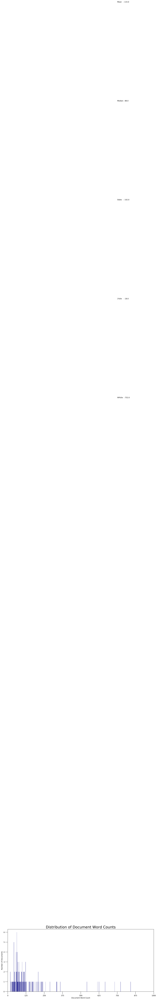

In [74]:
doc_lens = [len(d) for d in df_dominant_topic.Text]

# Plot
plt.figure(figsize=(16,7), dpi=160)
plt.hist(doc_lens, bins = 1000, color='navy')
plt.text(750, 100, "Mean   : " + str(round(np.mean(doc_lens))))
plt.text(750,  90, "Median : " + str(round(np.median(doc_lens))))
plt.text(750,  80, "Stdev   : " + str(round(np.std(doc_lens))))
plt.text(750,  70, "1%ile    : " + str(round(np.quantile(doc_lens, q=0.01))))
plt.text(750,  60, "99%ile  : " + str(round(np.quantile(doc_lens, q=0.99))))

plt.gca().set(xlim=(0, 1000), ylabel='Number of Documents', xlabel='Document Word Count')
plt.tick_params(size=16)
plt.xticks(np.linspace(0,1000,9))
plt.title('Distribution of Document Word Counts', fontdict=dict(size=22))
plt.show()

C:\Users\sunny\Anaconda3\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval
C:\Users\sunny\AppData\Roaming\Python\Python36\site-packages\numpy\core\_methods.py:140: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
C:\Users\sunny\AppData\Roaming\Python\Python36\site-packages\numpy\core\_methods.py:132: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


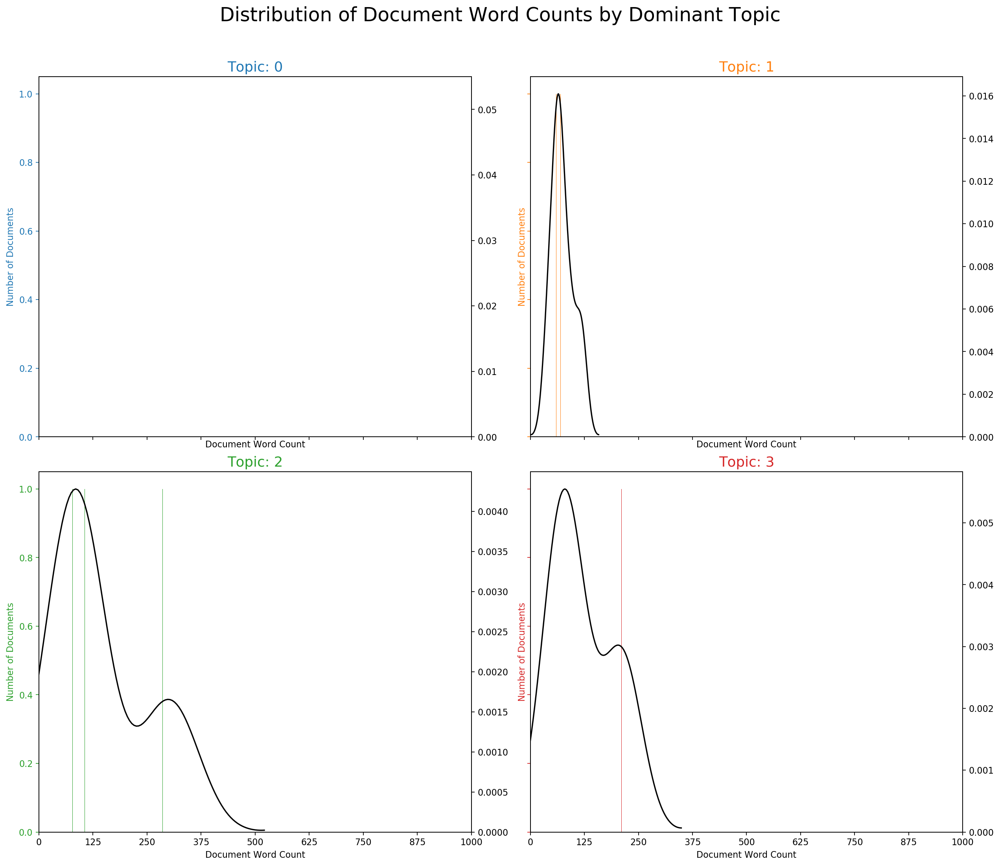

In [62]:
import seaborn as sns
import matplotlib.colors as mcolors
cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]  # more colors: 'mcolors.XKCD_COLORS'

fig, axes = plt.subplots(2,2,figsize=(16,14), dpi=160, sharex=True, sharey=True)

for i, ax in enumerate(axes.flatten()):    
    df_dominant_topic_sub = df_dominant_topic.loc[df_dominant_topic.Dominant_Topic == i, :]
    doc_lens = [len(d) for d in df_dominant_topic_sub.Text]
    ax.hist(doc_lens, bins = 1000, color=cols[i])
    ax.tick_params(axis='y', labelcolor=cols[i], color=cols[i])
    sns.kdeplot(doc_lens, color="black", shade=False, ax=ax.twinx())
    ax.set(xlim=(0, 1000), xlabel='Document Word Count')
    ax.set_ylabel('Number of Documents', color=cols[i])
    ax.set_title('Topic: '+str(i), fontdict=dict(size=16, color=cols[i]))

fig.tight_layout()
fig.subplots_adjust(top=0.90)
plt.xticks(np.linspace(0,1000,9))
fig.suptitle('Distribution of Document Word Counts by Dominant Topic', fontsize=22)
plt.show()

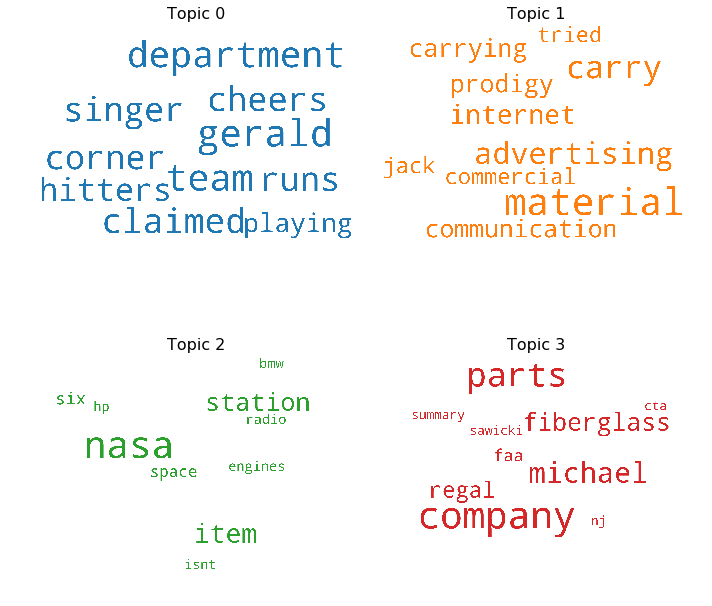

IndexError: list index out of range

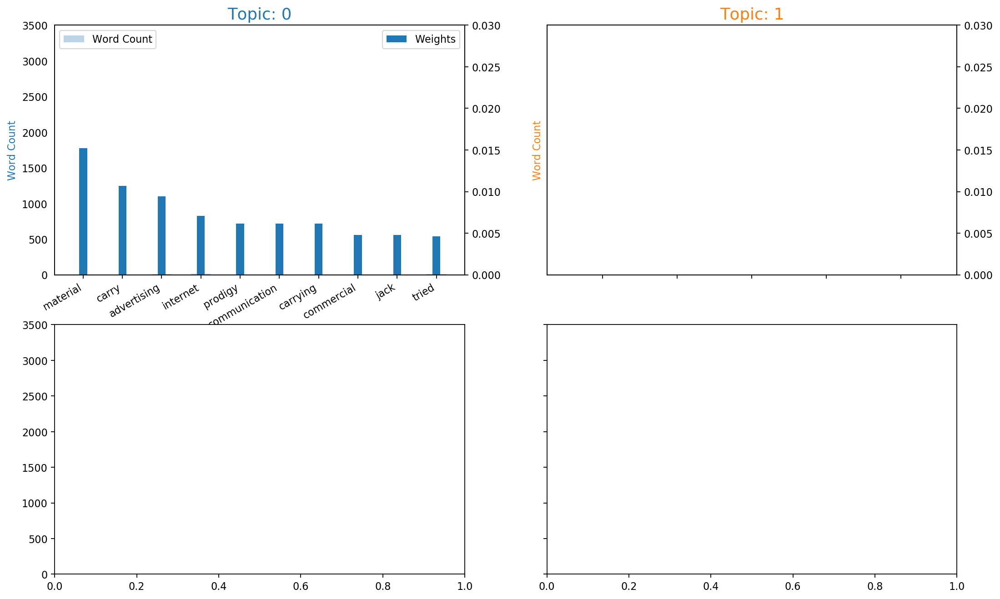

In [81]:
from collections import Counter
topics = lda_model.show_topics(formatted=False)
data_flat = [w for w_list in data_words_bigrams for w in w_list]
counter = Counter(data_flat)

out = []
for i, topic in topics:
    for word, weight in topic:
        out.append([word, i , weight, counter[word]])

df = pd.DataFrame(out, columns=['word', 'topic_id', 'importance', 'word_count'])        

# Plot Word Count and Weights of Topic Keywords
fig, axes = plt.subplots(2, 2, figsize=(16,10), sharey=True, dpi=160)
cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]
for i, ax in enumerate(axes.flatten()):
    ax.bar(x='word', height="word_count", data=df.loc[df.topic_id==i, :], color=cols[i], width=0.5, alpha=0.3, label='Word Count')
    ax_twin = ax.twinx()
    ax_twin.bar(x='word', height="importance", data=df.loc[df.topic_id==i, :], color=cols[i], width=0.2, label='Weights')
    ax.set_ylabel('Word Count', color=cols[i])
    ax_twin.set_ylim(0, 0.030); ax.set_ylim(0, 3500)
    ax.set_title('Topic: ' + str(i), color=cols[i], fontsize=16)
    ax.tick_params(axis='y', left=False)
    ax.set_xticklabels(df.loc[df.topic_id==i, 'word'], rotation=30, horizontalalignment= 'right')
    ax.legend(loc='upper left'); ax_twin.legend(loc='upper right')

fig.tight_layout(w_pad=2)    
fig.suptitle('Word Count and Importance of Topic Keywords', fontsize=22, y=1.05)    
plt.show()

TypeError: 'int' object is not subscriptable

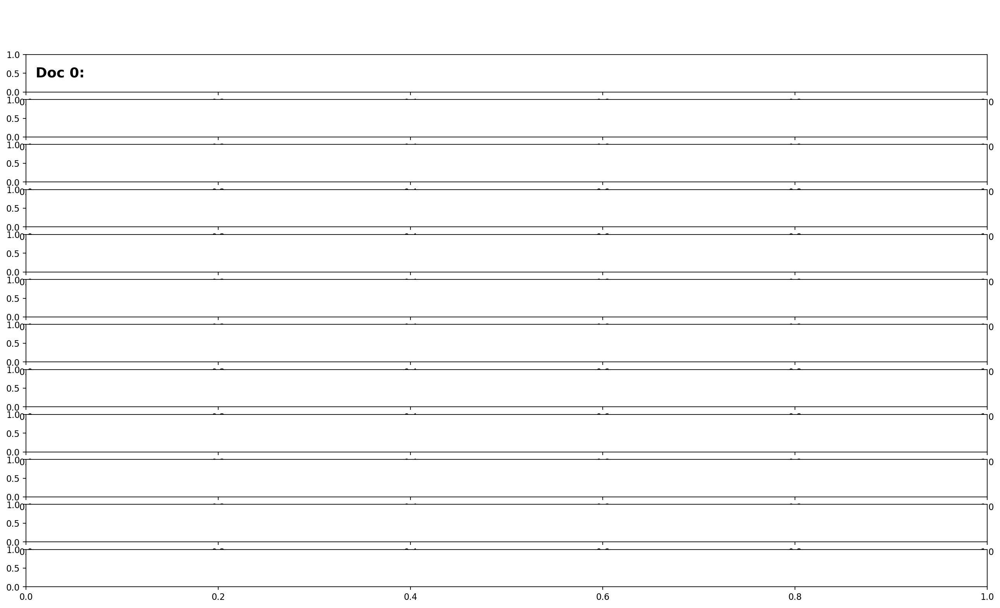

In [80]:
# Sentence Coloring of N Sentences
from matplotlib.patches import Rectangle

def sentences_chart(lda_model=lda_model, corpus=corpus, start = 0, end = 13):
    corp = corpus[start:end]
    mycolors = [color for name, color in mcolors.TABLEAU_COLORS.items()]

    fig, axes = plt.subplots(end-start, 1, figsize=(20, (end-start)*0.95), dpi=160)       
    axes[0].axis('off')
    for i, ax in enumerate(axes):
        if i > 0:
            corp_cur = corp[i-1] 
            topic_percs, wordid_topics, wordid_phivalues = lda_model[corp_cur]
            word_dominanttopic = [(lda_model.id2word[wd], topic[0]) for wd, topic in wordid_topics]    
            ax.text(0.01, 0.5, "Doc " + str(i-1) + ": ", verticalalignment='center',
                    fontsize=16, color='black', transform=ax.transAxes, fontweight=700)

            # Draw Rectange
            topic_percs_sorted = sorted(topic_percs, key=lambda x: (x[1]), reverse=True)
            ax.add_patch(Rectangle((0.0, 0.05), 0.99, 0.90, fill=None, alpha=1, 
                                   color=mycolors[topic_percs_sorted[0][0]], linewidth=2))

            word_pos = 0.06
            for j, (word, topics) in enumerate(word_dominanttopic):
                if j < 14:
                    ax.text(word_pos, 0.5, word,
                            horizontalalignment='left',
                            verticalalignment='center',
                            fontsize=16, color=mycolors[topics],
                            transform=ax.transAxes, fontweight=700)
                    word_pos += .009 * len(word)  # to move the word for the next iter
                    ax.axis('off')
            ax.text(word_pos, 0.5, '. . .',
                    horizontalalignment='left',
                    verticalalignment='center',
                    fontsize=16, color='black',
                    transform=ax.transAxes)       

    plt.subplots_adjust(wspace=0, hspace=0)
    plt.suptitle('Sentence Topic Coloring for Documents: ' + str(start) + ' to ' + str(end-2), fontsize=22, y=0.95, fontweight=700)
    plt.tight_layout()
    plt.show()

sentences_chart() 

In [68]:
# Sentence Coloring of N Sentences
def topics_per_document(model, corpus, start=0, end=1):
    corpus_sel = corpus[start:end]
    dominant_topics = []
    topic_percentages = []
    for i, corp in enumerate(corpus_sel):
        topic_percs, wordid_topics, wordid_phivalues = model[corp]
        dominant_topic = sorted(topic_percs, key = lambda x: x[1], reverse=True)[0][0]
        dominant_topics.append((i, dominant_topic))
        topic_percentages.append(topic_percs)
    return(dominant_topics, topic_percentages)

dominant_topics, topic_percentages = topics_per_document(model=lda_model, corpus=corpus, end=-1)            

# Distribution of Dominant Topics in Each Document
df = pd.DataFrame(dominant_topics, columns=['Document_Id', 'Dominant_Topic'])
dominant_topic_in_each_doc = df.groupby('Dominant_Topic').size()
df_dominant_topic_in_each_doc = dominant_topic_in_each_doc.to_frame(name='count').reset_index()

# Total Topic Distribution by actual weight
topic_weightage_by_doc = pd.DataFrame([dict(t) for t in topic_percentages])
df_topic_weightage_by_doc = topic_weightage_by_doc.sum().to_frame(name='count').reset_index()

# Top 3 Keywords for each Topic
topic_top3words = [(i, topic) for i, topics in lda_model.show_topics(formatted=False) 
                                 for j, (topic, wt) in enumerate(topics) if j < 3]

df_top3words_stacked = pd.DataFrame(topic_top3words, columns=['topic_id', 'words'])
df_top3words = df_top3words_stacked.groupby('topic_id').agg(', \n'.join)
df_top3words.reset_index(level=0,inplace=True)

In [69]:
from matplotlib.ticker import FuncFormatter

# Plot
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 4), dpi=120, sharey=True)

# Topic Distribution by Dominant Topics
ax1.bar(x='Dominant_Topic', height='count', data=df_dominant_topic_in_each_doc, width=.5, color='firebrick')
ax1.set_xticks(range(df_dominant_topic_in_each_doc.Dominant_Topic.unique().__len__()))
tick_formatter = FuncFormatter(lambda x, pos: 'Topic ' + str(x)+ '\n' + df_top3words.loc[df_top3words.topic_id==x, 'words'].values[0])
ax1.xaxis.set_major_formatter(tick_formatter)
ax1.set_title('Number of Documents by Dominant Topic', fontdict=dict(size=10))
ax1.set_ylabel('Number of Documents')
ax1.set_ylim(0, 1000)

# Topic Distribution by Topic Weights
ax2.bar(x='index', height='count', data=df_topic_weightage_by_doc, width=.5, color='steelblue')
ax2.set_xticks(range(df_topic_weightage_by_doc.index.unique().__len__()))
ax2.xaxis.set_major_formatter(tick_formatter)
ax2.set_title('Number of Documents by Topic Weightage', fontdict=dict(size=10))

plt.show()

IndexError: index 0 is out of bounds for axis 0 with size 0

<Figure size 1200x480 with 2 Axes>

In [70]:
# Get topic weights and dominant topics ------------
from sklearn.manifold import TSNE
from bokeh.plotting import figure, output_file, show
from bokeh.models import Label
from bokeh.io import output_notebook

# Get topic weights
topic_weights = []
for i, row_list in enumerate(lda_model[corpus]):
    topic_weights.append([w for i, w in row_list[0]])

# Array of topic weights    
arr = pd.DataFrame(topic_weights).fillna(0).values

# Keep the well separated points (optional)
arr = arr[np.amax(arr, axis=1) > 0.35]

# Dominant topic number in each doc
topic_num = np.argmax(arr, axis=1)

# tSNE Dimension Reduction
tsne_model = TSNE(n_components=2, verbose=1, random_state=0, angle=.99, init='pca')
tsne_lda = tsne_model.fit_transform(arr)

# Plot the Topic Clusters using Bokeh
output_notebook()
n_topics = 4
mycolors = np.array([color for name, color in mcolors.TABLEAU_COLORS.items()])
plot = figure(title="t-SNE Clustering of {} LDA Topics".format(n_topics), 
              plot_width=900, plot_height=700)
plot.scatter(x=tsne_lda[:,0], y=tsne_lda[:,1], color=mycolors[topic_num])
show(plot)

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 143 samples in 0.000s...
[t-SNE] Computed neighbors for 143 samples in 0.088s...
[t-SNE] Computed conditional probabilities for sample 143 / 143
[t-SNE] Mean sigma: 0.041431
[t-SNE] KL divergence after 250 iterations with early exaggeration: 51.400875
[t-SNE] Error after 1000 iterations: 0.173647


Loading BokehJS ...

In [71]:
import pyLDAvis.gensim
pyLDAvis.enable_notebook()
vis = pyLDAvis.gensim.prepare(lda_model, corpus, dictionary=lda_model.id2word)
vis

C:\Users\sunny\Anaconda3\lib\site-packages\pyLDAvis\_prepare.py:257: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=True'.

To retain the current behavior and silence the warning, pass sort=False

  return pd.concat([default_term_info] + list(topic_dfs))


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
5      0.285238  0.060712       1        1  27.514181
7      0.209370  0.113793       2        1  16.883732
19     0.129053 -0.055571       3        1   8.992061
9      0.112505 -0.284923       4        1   7.884880
2      0.138996  0.052157       5        1   7.533635
18    -0.040043  0.026630       6        1   5.033538
1      0.034982 -0.014095       7        1   4.244776
13    -0.019801 -0.001161       8        1   3.230160
4     -0.050883  0.024271       9        1   2.957903
6     -0.051351  0.041870      10        1   2.763033
12    -0.040772  0.025114      11        1   2.751954
16    -0.102809  0.009139      12        1   2.714308
8     -0.041981 -0.046850      13        1   1.915716
15    -0.069045  0.006265      14        1   1.207695
3     -0.095021  0.016746      15        1   1.041126
10    -0.063519 -0.003486      16        1   0.971697
14    -0.079691  0.007643      17        1   0.887064
17    -0.090908  0.005056      18        1   0.662141
0     -0.085027  0.009200      19        1   0.565944
11    -0.079295  0.007489      20        1   0.244460, topic_info=     Category        Freq                Term       Total  loglift  logprob
term                                                                       
243   Default   36.000000             windows   36.000000  30.0000  30.0000
4311  Default   30.000000              window   30.000000  29.0000  29.0000
612   Default   26.000000            graphics   26.000000  28.0000  28.0000
482   Default  103.000000              people  103.000000  27.0000  27.0000
1882  Default   26.000000                 bus   26.000000  26.0000  26.0000
228   Default   29.000000            software   29.000000  25.0000  25.0000
25    Default  154.000000               lines  154.000000  24.0000  24.0000
2278  Default   26.000000               image   26.000000  23.0000  23.0000
231   Default   38.000000               state   38.000000  22.0000  22.0000
2306  Default   12.000000                nasa   12.000000  21.0000  21.0000
4201  Default   22.000000               input   22.000000  20.0000  20.0000
253   Default   94.000000                dont   94.000000  19.0000  19.0000
19    Default   74.000000                host   74.000000  18.0000  18.0000
51    Default   66.000000          university   66.000000  17.0000  17.0000
7     Default   20.000000                 car   20.000000  16.0000  16.0000
35    Default  147.000000        organization  147.000000  15.0000  15.0000
4256  Default   20.000000                  pc   20.000000  14.0000  14.0000
4222  Default   32.000000                guns   32.000000  13.0000  13.0000
727   Default   27.000000              public   27.000000  12.0000  12.0000
1159  Default   37.000000             believe   37.000000  11.0000  11.0000
82    Default   15.000000                 guy   15.000000  10.0000  10.0000
3702  Default   14.000000               islam   14.000000   9.0000   9.0000
34    Default   69.000000        nntp_posting   69.000000   8.0000   8.0000
2680  Default   28.000000                 gun   28.000000   7.0000   7.0000
175   Default  117.000000               would  117.000000   6.0000   6.0000
2450  Default   16.000000              memory   16.000000   5.0000   5.0000
1082  Default   19.000000                  vs   19.000000   4.0000   4.0000
2234  Default   26.000000                data   26.000000   3.0000   3.0000
1904  Default   17.000000               video   17.000000   2.0000   2.0000
4801  Default   17.000000          controller   17.000000   1.0000   1.0000
...       ...         ...                 ...         ...      ...      ...
3210  Topic20    0.091316               haydn    0.790461   3.8556  -6.2797
1131  Topic20    0.580334             michael    6.630716   3.5780  -4.4305
2478  Topic20    0.091236              buying    3.486097   2.3708  -6.2806
110   Topic20    0.091316        

In [22]:
doc_lda = lda_model[corpus]

In [73]:
#Compute Model Perplexity and Coherence Score
#Model perplexity and topic coherence provide a convenient measure to judge how good a given topic model is. 
#In my experience, topic coherence score, in particular, has been more helpful.
# Compute Perplexity
print('\nPerplexity: ', lda_model.log_perplexity(corpus))  # a measure of how good the model is. lower the better.

# Compute Coherence Score
coherence_model_lda = CoherenceModel(model=lda_model, texts=data_words_bigrams, dictionary=id2word, coherence='c_v')
coherence_lda = coherence_model_lda.get_coherence()
print('\nCoherence Score: ', coherence_lda) #Higher the better


Perplexity:  -16.505079386093183

Coherence Score:  0.48013366931633283


In [74]:
#Visualize the topics-keywords
pyLDAvis.enable_notebook()
vis = pyLDAvis.gensim.prepare(lda_model, corpus, id2word)
vis
#Each bubble on the left-hand side plot represents a topic. The larger the bubble, the more prevalent is that topic.
#A good topic model will have fairly big, non-overlapping bubbles scattered throughout the chart instead of 
#being clustered in one quadrant.
#A model with too many topics, will typically have many overlaps, small sized bubbles clustered in one region of the chart.
#Alright, if you move the cursor over one of the bubbles, the words and bars on the right-hand side will update. 
#These words are the salient keywords that form the selected topic.
#We have successfully built a good looking topic model.


C:\Users\sunny\Anaconda3\lib\site-packages\pyLDAvis\_prepare.py:257: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=True'.

To retain the current behavior and silence the warning, pass sort=False

  return pd.concat([default_term_info] + list(topic_dfs))


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
18     0.369132 -0.114119       1        1  40.578060
6      0.278740  0.019623       2        1  12.947561
3      0.297259 -0.111539       3        1  12.009932
2      0.219500  0.005068       4        1   8.699031
7      0.186805  0.004130       5        1   6.690360
5      0.110687  0.444185       6        1   5.004949
9      0.088134 -0.080362       7        1   2.343710
8      0.020525 -0.030515       8        1   2.274899
14    -0.023142  0.033975       9        1   2.052376
4     -0.068592  0.018550      10        1   1.640978
19    -0.040656 -0.024507      11        1   1.482954
12    -0.121706 -0.004643      12        1   1.254317
17    -0.139509 -0.011869      13        1   0.607481
16    -0.146281 -0.013755      14        1   0.577248
10    -0.151876 -0.015500      15        1   0.548571
13    -0.165741 -0.020347      16        1   0.368759
11    -0.173158 -0.023454      17        1   0.285645
15    -0.175797 -0.023495      18        1   0.270995
1     -0.177657 -0.024136      19        1   0.209925
0     -0.186666 -0.027289      20        1   0.152250, topic_info=      Category          Freq                  Term         Total  loglift  \
term                                                                        
5128   Default  68738.000000                    ax  68738.000000  30.0000   
23     Default  19069.000000                 lines  19069.000000  29.0000   
33     Default  18196.000000          organization  18196.000000  28.0000   
49     Default   8356.000000            university   8356.000000  27.0000   
32     Default   7624.000000          nntp_posting   7624.000000  26.0000   
4587   Default   4989.000000                   max   4989.000000  25.0000   
17     Default   6758.000000                  host   6758.000000  24.0000   
167    Default  15076.000000                 would  15076.000000  23.0000   
2295   Default   2861.000000                 space   2861.000000  22.0000   
433    Default   7565.000000                  also   7565.000000  21.0000   
541    Default  14222.000000                   one  14222.000000  20.0000   
518    Default   2756.000000                   god   2756.000000  19.0000   
1194   Default   2724.000000                 jesus   2724.000000  18.0000   
463    Default   7795.000000                people   7795.000000  17.0000   
58     Default  11688.000000               article  11688.000000  16.0000   
2907   Default   3629.000000           information   3629.000000  15.0000   
242    Default   9910.000000                  dont   9910.000000  14.0000   
233    Default   2542.000000               windows   2542.000000  13.0000   
1613   Default   2288.000000            government   2288.000000  12.0000   
1129   Default   3199.000000               believe   3199.000000  11.0000   
224    Default   4334.000000                system   4334.000000  10.0000   
106    Default   5320.000000                   two   5320.000000   9.0000   
725    Default   4768.000000                    us   4768.000000   8.0000   
471    Default   4158.000000                  said   4158.000000   7.0000   
874    Default   2063.000000                   law   2063.000000   6.0000   
363    Default  12266.000000                writes  12266.000000   5.0000   
1230   Default   4324.000000                 right   4324.000000   4.0000   
1      Default   4532.000000                anyone   4532.000000   3.0000   
376    Default   3932.000000                 reply   3932.000000   2.0000   
339    Default   4192.000000                   say   4192.000000   1.0000   
...        ...           ...                   ...           ...      ...   
1743   Topic20     11.646609              tenn_div     12.855236   6.3887   
4710   Topic20     10.291780                    aw     11.500407   6.3764   
1491   Topic20      9.536201         anymore_weird     10.744827   6.3681 

In [126]:
import os
os.environ.update({'MALLET_HOME': r'F:/Data Science/JigSaw/Fast revision/NLP/Topic Modelling/'})
mallet_path = 'F:/Data Science/JigSaw/Fast revision/NLP/Topic Modelling/mallet-2.0.8/bin/|mallet'

#import os
#from gensim.models.wrappers import LdaMallet

#os.environ['MALLET_HOME'] = 'C:/ ... /mallet-2.0.8/'

In [127]:
#Building LDA Mallet Model
#So far you have seen Gensim’s inbuilt version of the LDA algorithm. Mallet’s version, however, often gives a better quality of topics.
#Gensim provides a wrapper to implement Mallet’s LDA from within Gensim itself. 
# You only need to download the zipfile, unzip it and provide the path to mallet in the unzipped directory to gensim.models.wrappers.LdaMallet. 
# Download File: http://mallet.cs.umass.edu/dist/mallet-2.0.8.zip
mallet_path = 'F:/Data Science/JigSaw/Fast revision/NLP/Topic Modelling/mallet-2.0.8/bin' # update this path
ldamallet = gensim.models.wrappers.LdaMallet(mallet_path, corpus=corpus, num_topics=20, id2word=id2word)# Download File: http://mallet.cs.umass.edu/dist/mallet-2.0.8.zip

CalledProcessError: Command 'F:/Data Science/JigSaw/Fast revision/NLP/Topic Modelling/mallet-2.0.8/bin import-file --preserve-case --keep-sequence --remove-stopwords --token-regex "\S+" --input C:\Users\sunny\AppData\Local\Temp\b52b96_corpus.txt --output C:\Users\sunny\AppData\Local\Temp\b52b96_corpus.mallet' returned non-zero exit status 1.

In [ ]:
# Show Topics
pprint(ldamallet.show_topics(formatted=False))

# Compute Coherence Score
coherence_model_ldamallet = CoherenceModel(model=ldamallet, texts=data_lemmatized, dictionary=id2word, coherence='c_v')
coherence_ldamallet = coherence_model_ldamallet.get_coherence()
print('\nCoherence Score: ', coherence_ldamallet)

In [78]:
#How to find the optimal number of topics for LDA?
#My approach to finding the optimal number of topics is to build many LDA models
#with different values of number of topics (k) and pick the one that gives the highest coherence value.
def compute_coherence_values(dictionary, corpus, texts, limit, start=2, step=3):
    """
    Compute c_v coherence for various number of topics

    Parameters:
    ----------
    dictionary : Gensim dictionary
    corpus : Gensim corpus
    texts : List of input texts
    limit : Max num of topics

    Returns:
    -------
    model_list : List of LDA topic models
    coherence_values : Coherence values corresponding to the LDA model with respective number of topics
    """
    coherence_values = []
    model_list = []
    for num_topics in range(start, limit, step):
       # model = gensim.models.wrappers.LdaMallet(mallet_path, corpus=corpus, num_topics=num_topics, id2word=id2word)
        model =  gensim.models.ldamodel.LdaModel(corpus=corpus,id2word=id2word,num_topics=num_topics,random_state=100,update_every=1,
                                           chunksize=100,
                                           passes=10,
                                           alpha='auto',
                                           per_word_topics=True)
    
        model_list.append(model)
        coherencemodel = CoherenceModel(model=model, texts=texts, dictionary=dictionary, coherence='c_v')
        coherence_values.append(coherencemodel.get_coherence())

    return model_list, coherence_values

In [79]:
# Can take a long time to run.
model_list, coherence_values = compute_coherence_values(dictionary=id2word, corpus=corpus, texts=data_words_bigrams, start=2, limit=40, step=6)

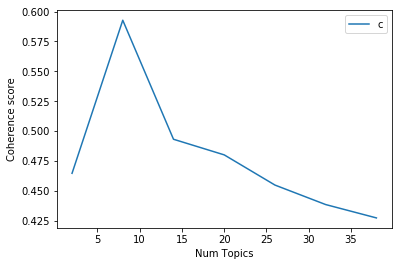

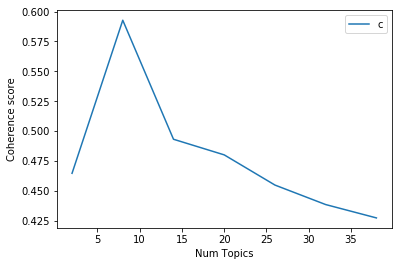

In [80]:
# Show graph
limit=40; start=2; step=6;
x = range(start, limit, step)
plt.plot(x, coherence_values)
plt.xlabel("Num Topics")
plt.ylabel("Coherence score")
plt.legend(("coherence_values"), loc='best')
plt.show()
# Show graph
limit=40; start=2; step=6;
x = range(start, limit, step)
plt.plot(x, coherence_values)
plt.xlabel("Num Topics")
plt.ylabel("Coherence score")
plt.legend(("coherence_values"), loc='best')
plt.show()

In [81]:
# Print the coherence scores
for m, cv in zip(x, coherence_values):
    print("Num Topics =", m, " has Coherence Value of", round(cv, 4))
#If the coherence score seems to keep increasing, it may make better sense to pick the model
#that gave the highest CV before flattening out. This is exactly the case here.
#So for further steps I will choose the model with 20 topics itself.

Num Topics = 2  has Coherence Value of 0.4647
Num Topics = 8  has Coherence Value of 0.5927
Num Topics = 14  has Coherence Value of 0.4932
Num Topics = 20  has Coherence Value of 0.4801
Num Topics = 26  has Coherence Value of 0.4549
Num Topics = 32  has Coherence Value of 0.4386
Num Topics = 38  has Coherence Value of 0.4274


In [82]:
# Select the model and print the topics
optimal_model = model_list[3]
model_topics = optimal_model.show_topics(formatted=False)
pprint(optimal_model.print_topics(num_words=10))

[(0,
  '0.053*"uk" + 0.037*"claiming" + 0.026*"hewlett_packard" + 0.024*"cc" + '
  '0.011*"skills" + 0.011*"david_veal" + 0.009*"laughed" + 0.005*"skill" + '
  '0.005*"motto" + 0.004*"cont_education"'),
 (1,
  '0.059*"genocide" + 0.037*"islam" + 0.033*"principles" + 0.030*"moving" + '
  '0.026*"patients" + 0.026*"round" + 0.023*"carl" + 0.022*"hmm" + '
  '0.010*"financial" + 0.009*"benedikt_rosenau"'),
 (2,
  '0.025*"system" + 0.024*"information" + 0.021*"also" + 0.018*"available" + '
  '0.015*"data" + 0.014*"software" + 0.013*"program" + 0.012*"using" + '
  '0.012*"may" + 0.012*"number"'),
 (3,
  '0.019*"said" + 0.015*"us" + 0.014*"people" + 0.011*"first" + 0.011*"day" + '
  '0.010*"years" + 0.009*"year" + 0.008*"two" + 0.008*"told" + '
  '0.007*"president"'),
 (4,
  '0.062*"car" + 0.053*"hockey" + 0.032*"bike" + 0.023*"cars" + 0.021*"air" + '
  '0.017*"corporation" + 0.016*"hall" + 0.015*"edge" + 0.014*"ride" + '
  '0.013*"traffic"'),
 (5,
  '0.805*"ax" + 0.058*"max" + 0.005*"scsi" +

In [128]:
#One of the practical application of topic modeling is to determine what topic a given document is about.
#To find that, we find the topic number that has the highest percentage contribution in that document.
#The format_topics_sentences() function below nicely aggregates this information in a presentable table.
def format_topics_sentences(ldamodel=lda_model, corpus=corpus, texts=data):
    # Init output
    sent_topics_df = pd.DataFrame()

    # Get main topic in each document
    for i, row in enumerate(ldamodel[corpus]):
    
        row = sorted(row[0], key=lambda x: (x[1]), reverse=True)
        # Get the Dominant topic, Perc Contribution and Keywords for each document
        for j, (topic_num, prop_topic) in enumerate(row):
            if j == 0:  # => dominant topic
                wp = ldamodel.show_topic(topic_num)
                topic_keywords = ", ".join([word for word, prop in wp])
                sent_topics_df = sent_topics_df.append(pd.Series([int(topic_num), round(prop_topic,4), topic_keywords]), ignore_index=True)
            else:
                break
    sent_topics_df.columns = ['Dominant_Topic', 'Perc_Contribution', 'Topic_Keywords']

    # Add original text to the end of the output
    contents = pd.Series(texts)
    sent_topics_df = pd.concat([sent_topics_df, contents], axis=1)
    return(sent_topics_df)




In [ ]:
df_topic_sents_keywords = format_topics_sentences(ldamodel=optimal_model, corpus=corpus, texts=data)



asjhhhhhhhhhhhhhas
([(2, 0.13382539), (3, 0.12632607), (4, 0.075317904), (6, 0.2037615), (7, 0.016967349), (15, 0.114510424), (16, 0.015996793), (18, 0.283248)], [(0, [2]), (1, [6, 18]), (2, [3, 18]), (3, []), (4, [3]), (5, [2, 3, 18]), (6, [4]), (7, [18, 3, 6]), (8, [3, 18]), (9, [16]), (10, [2]), (11, [3, 18, 7]), (12, [2]), (13, []), (14, []), (15, []), (16, [3]), (17, [6]), (18, [2]), (19, [6, 2]), (20, [18, 6]), (21, [18]), (22, []), (23, [6, 18]), (24, [18]), (25, [6, 3, 18]), (26, [3, 18]), (27, [6, 2]), (28, [15]), (29, [2]), (30, [2, 18, 3]), (31, [15]), (32, [6]), (33, [6, 18]), (34, [15]), (35, [6, 18]), (36, [18, 2]), (37, [15]), (38, [18]), (39, [18, 3]), (40, [18]), (41, [2, 18]), (42, [18, 2, 3]), (43, [15]), (44, [15]), (45, []), (46, [6]), (47, [18]), (48, [15]), (49, [6]), (50, [18]), (51, [15]), (52, [18]), (53, [3, 18])], [(0, [(2, 0.9997428)]), (1, [(6, 1.7901536), (18, 0.20978007)]), (2, [(3, 0.6871499), (18, 0.31241086)]), (3, []), (4, [(3, 0.9994442)]), (5, [(2,

([(2, 0.020705754), (3, 0.1081907), (4, 0.24158493), (6, 0.18994224), (7, 0.014463211), (18, 0.40930477)], [(1, [6, 18]), (17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (38, [18]), (58, [18, 6]), (88, [18, 2, 3]), (102, [4, 7]), (138, [18, 6]), (143, [18]), (147, [18, 6]), (167, [18]), (261, [18, 7]), (262, [4]), (263, [18, 2]), (264, [18]), (265, [3, 6, 18, 2]), (266, [18]), (267, [4]), (268, []), (269, [4]), (270, [4]), (271, [3]), (272, [18, 7]), (273, [18]), (274, [18]), (275, [18, 3]), (276, [3]), (277, [4]), (278, []), (279, [18]), (280, [4]), (281, [6, 3]), (282, [4]), (283, []), (284, [6]), (285, []), (286, []), (287, [3, 18]), (288, [6]), (289, []), (290, [2, 7]), (291, [3]), (292, [18]), (293, []), (294, [6]), (295, [6]), (296, [3]), (297, [3]), (298, [4, 6]), (299, [6, 18]), (300, [3]), (301, [3]), (302, []), (303, [4, 18]), (304, []), (305, [6, 4, 18]), (306, [4]), (307, [18]), (308, [18]), (309, [4, 3]), (310, [6]), (311, [4]), (312, [6, 18]), (313, [4]), (314, [4]), 

([(2, 0.020210816), (3, 0.017446825), (6, 0.05698063), (7, 0.022471732), (8, 0.016830243), (9, 0.044137135), (11, 0.13994613), (18, 0.65348506)], [(7, [18]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (58, [18, 6]), (167, [18]), (244, [18]), (265, [18, 6, 3, 2]), (279, [18]), (284, [6]), (339, [18, 9]), (347, [18]), (363, [18, 6]), (383, [18]), (416, [18]), (420, [18]), (423, [18]), (463, [18, 9, 3, 8]), (481, [18, 9]), (483, []), (484, [18]), (485, [18]), (486, [11]), (487, [9]), (488, [11]), (489, []), (490, [18]), (491, [18, 2]), (492, [18]), (493, [18]), (494, [18, 11]), (495, [11]), (496, [18, 3]), (497, [18]), (498, [18, 3, 8]), (499, [18]), (500, []), (501, [18]), (502, []), (503, []), (504, [11]), (505, [6, 14, 3]), (506, [8]), (507, []), (508, [18, 7]), (509, [18]), (510, []), (511, [18]), (512, [18]), (513, [2, 18, 6, 9]), (514, [18]), (515, [18]), (516, [1]), (517, [18]), (518, [9]), (519, [9]), (520, [7, 3]), (521, []), (522, [18]), (523, [11]), (524, [11]), (525, []), (526, 

([(2, 0.015608206), (3, 0.08808083), (4, 0.41690207), (6, 0.11626889), (7, 0.017783437), (8, 0.013680199), (12, 0.012458335), (13, 0.0113803195), (14, 0.038301677), (18, 0.245594), (19, 0.0131071275)], [(6, [4]), (23, [6, 18]), (26, [18, 3]), (32, [6]), (33, [6, 18]), (36, [18, 2]), (106, [3, 18, 7]), (121, [6]), (263, [18, 2]), (275, [18, 3, 19]), (340, [4]), (363, [18, 6]), (376, [6, 18]), (416, [18]), (450, [18, 3]), (570, [18]), (729, [4]), (730, [4]), (731, [13]), (732, [4]), (733, [18]), (734, [6]), (735, [4, 14]), (736, []), (737, [4]), (738, [4]), (739, [4]), (740, [4]), (741, [4]), (742, []), (743, [4]), (744, []), (745, [4]), (746, [4]), (747, []), (748, [4]), (749, [4]), (750, []), (751, [18, 6, 2]), (752, [18, 3]), (753, [19]), (754, []), (755, [4]), (756, [14]), (757, [4]), (758, [4]), (759, [18, 4, 3]), (760, [4]), (761, [4]), (762, [4]), (763, [3, 6]), (764, [4]), (765, [4]), (766, [18]), (767, [4]), (768, [18]), (769, [3]), (770, [4]), (771, [3]), (772, [6, 3, 18]), (77

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.3059566), (3, 0.03547044), (6, 0.23406799), (7, 0.015178916), (14, 0.017767958), (18, 0.3629635)], [(7, [18, 6]), (17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (58, [18, 6]), (79, [18]), (163, [18, 6]), (245, [18, 3]), (284, [6]), (363, [18, 6]), (375, [2, 6, 3, 18]), (376, [6, 18]), (433, [2, 18]), (536, [18]), (540, [18]), (541, [18]), (631, [2, 3]), (759, [18, 3]), (789, [18, 3]), (798, [18, 3]), (912, [18]), (927, []), (928, [2]), (929, []), (930, []), (931, [18, 3]), (932, [2]), (933, [2]), (934, [2]), (935, [18]), (936, []), (937, [2, 18]), (938, [6]), (939, [2]), (940, [2]), (941, []), (942, [2]), (943, []), (944, []), (945, [6]), (946, []), (947, [18]), (948, []), (949, [2]), (950, [2]), (951, []), (952, [18]), (953, [6]), (954, [2]), (955, []), (956, []), (957, [2, 18]), (958, [6]), (959, []), (960, [2, 7]), (961, [2]), (962, []), (963, [14]), (964, [2]), (965, [18]), (966, [18]), (967, []), (968, [18]), (969,

([(2, 0.09532797), (3, 0.07831114), (4, 0.01360117), (6, 0.14070053), (7, 0.14438014), (10, 0.059667975), (12, 0.011802625), (14, 0.023328999), (17, 0.09593018), (18, 0.3221616)], [(6, [4]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (42, [18, 2, 3]), (49, [6]), (58, [18, 6]), (97, [2]), (138, [18, 6]), (339, [18]), (364, [7, 3]), (375, [6, 2, 7, 3, 18]), (379, [6, 18, 3, 8]), (419, [18, 3]), (440, [2]), (453, [7, 18]), (541, [18, 3]), (574, [12]), (592, [18, 6]), (600, [6, 18, 7]), (613, [7]), (624, [6, 3]), (772, [6, 3, 18]), (862, [18]), (881, [18]), (915, [18, 7]), (971, []), (974, [3]), (981, [18, 2, 6]), (991, []), (996, [18, 3]), (1000, [10]), (1001, [7, 17]), (1045, [3, 6]), (1075, [2, 6, 18, 7]), (1077, []), (1078, [17]), (1079, [17]), (1080, [18, 3]), (1081, [17]), (1082, [2, 18]), (1083, [2]), (1084, [3]), (1085, [18]), (1086, [10]), (1087, [7]), (1088, [18]), (1089, [14]), (1090, []), (1091, [18]), (1092, [2, 6, 18, 3]), (1093, []), (1094, [7, 18, 3]), (1095, [17]), (1096, [1

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.04592324), (3, 0.16753767), (6, 0.26913083), (7, 0.15520109), (14, 0.011770426), (18, 0.2829905)], [(17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (274, [18]), (276, [3, 7]), (284, [6]), (596, [3, 2, 18]), (654, [18]), (945, [6]), (1267, []), (1268, []), (1269, [3, 9]), (1270, []), (1271, [7]), (1272, [7]), (1273, [7]), (1274, [3]), (1275, []), (1276, [7])], [(17, [(6, 0.99998486)]), (23, [(6, 0.9424483), (18, 0.057545707)]), (32, [(6, 0.99998665)]), (33, [(6, 0.9454518), (18, 0.054541897)]), (274, [(18, 0.99988395)]), (276, [(3, 0.94950175), (7, 0.047022108)]), (284, [(6, 0.99992543)]), (596, [(2, 0.1856272), (3, 0.783388), (18, 0.030842176)]), (654, [(18, 0.9967276)]), (945, [(6, 0.9991432)]), (1267, []), (1268, []), (1269, [(3, 0.98750716), (9, 0.010467834)]), (1270, []), (1271, [(7, 0.99875814)]), (1272, [(7, 0.9998982)]), (1273, [(7, 0.9998872)]), (1274, [(3, 0.99949723)]), (1275, []), (1276, [(7, 0.99980164)])])
a

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(0, 0.014296304), (2, 0.05845039), (3, 0.17880587), (4, 0.013236399), (6, 0.014400077), (7, 0.037686467), (8, 0.055965617), (18, 0.5906155), (19, 0.01891849)], [(2, [3, 18]), (7, [18, 3]), (8, [3, 18]), (19, [2, 6]), (20, [18, 6]), (23, [18, 6]), (26, [18, 3]), (29, [2]), (33, [18, 6]), (39, [18, 3]), (47, [18]), (49, [6, 18]), (50, [18]), (53, [3, 18]), (58, [18, 6]), (70, [18]), (71, [18, 3]), (106, [18, 3, 7]), (129, [18, 6]), (138, [18, 6]), (139, [2, 7, 18, 6]), (143, [18]), (163, [18]), (164, [18, 3]), (167, [18]), (213, [6]), (224, [2, 18, 7, 6]), (242, [18]), (252, [3, 8, 2, 7]), (263, [18, 2]), (264, [18]), (265, [3, 18, 2, 6]), (266, [18]), (274, [18]), (276, [3, 8, 7]), (281, [3, 6, 17]), (287, [3, 18]), (290, [2, 7]), (299, [18, 6]), (315, [3, 18]), (316, [18, 7]), (318, [18]), (319, [3, 18, 9]), (321, [18, 3]), (327, [18, 2, 3]), (331, [18]), (332, [18, 7, 3]), (339, [18, 9]), (345, [18, 4, 7]), (347, [18, 3]), (358, 

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.036559615), (3, 0.02189974), (6, 0.110288545), (7, 0.01280744), (9, 0.013249991), (18, 0.7823987)], [(1, [6, 18]), (7, [18]), (23, [6, 18]), (26, [18, 3]), (33, [6, 18]), (49, [6]), (138, [18, 6]), (139, [6, 2, 18, 7]), (141, [18, 2]), (143, [18]), (167, [18]), (184, [18]), (212, [18, 6]), (244, [18]), (339, [18, 9]), (354, [18]), (358, [18]), (376, [6, 18]), (406, [18]), (422, [18]), (433, [18, 2]), (446, [18]), (447, [18]), (482, [18, 6, 2, 3]), (496, [18]), (518, [9]), (522, [18, 3]), (554, [18, 6]), (560, [18]), (562, [18]), (592, [18, 6]), (696, [6, 18, 7]), (725, [18, 3, 9]), (796, [18, 3]), (867, [2]), (881, [18]), (890, [18, 2, 9]), (1010, [18]), (1025, [18, 3]), (1100, [18, 9]), (1129, [18, 9]), (1231, [18]), (1241, [18]), (1458, [18]), (1584, [18, 7]), (1713, [18, 3]), (1729, [2, 7]), (1774, [18]), (1776, [6]), (1777, [18, 2]), (1778, [18]), (1779, [6]), (1780, [18]), (1781, []), (1782, []), (1783, [18]), (1784, [1

([(2, 0.044307645), (3, 0.112869166), (4, 0.060667478), (6, 0.2606233), (7, 0.014869038), (12, 0.116724014), (17, 0.04718259), (18, 0.31980765)], [(1, [6, 18]), (6, [4]), (16, [3]), (17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (46, [6]), (49, [6]), (72, [18]), (106, [3, 18, 7]), (121, [6]), (129, [18, 6]), (149, [2]), (159, [18]), (308, [18]), (383, [18]), (398, [6, 18, 3]), (433, [18, 2, 3]), (600, [6, 18]), (678, [6, 3, 18]), (734, [6]), (893, [18, 3]), (918, [18]), (1010, [18]), (1158, [18]), (1278, [6]), (1339, [18]), (1470, [3]), (1559, [2, 18, 6]), (1772, [18]), (1886, [3, 7]), (1917, [18, 2]), (1921, [3]), (1935, []), (1936, [6]), (1937, [17]), (1938, [6]), (1939, [17]), (1940, [18, 2]), (1941, []), (1942, [18, 3]), (1943, [18, 3]), (1944, [12]), (1945, [12]), (1946, [12]), (1947, []), (1948, [12]), (1949, [17]), (1950, [12]), (1951, [12]), (1952, []), (1953, [6, 7]), (1954, [18, 2]), (1955, [18, 2]), (1956, [18]), (1957, []), (1958, [6]), (1959, [6]), (1960, [12]), (1961

([(2, 0.13576324), (3, 0.039276488), (6, 0.3800586), (7, 0.02247848), (18, 0.35851374), (19, 0.021060282)], [(20, [18, 6]), (23, [6, 18]), (33, [6, 18]), (129, [6, 18]), (134, [18, 6]), (258, [2]), (378, [18]), (447, [18]), (763, [6, 3]), (906, [18]), (945, [6]), (947, [18]), (1113, [2, 6, 18]), (1122, [18]), (1189, [19, 7]), (1834, [6, 18]), (1955, [18, 2]), (2050, []), (2051, [6, 18]), (2052, [18]), (2053, [6]), (2054, [2]), (2055, [6]), (2056, []), (2057, [6]), (2058, []), (2059, [18, 3]), (2060, [18]), (2061, [6]), (2062, [6]), (2063, [6]), (2064, [2]), (2065, []), (2066, [18]), (2067, [18, 2]), (2068, [6]), (2069, [6]), (2070, [6]), (2071, [6]), (2072, [6])], [(20, [(6, 0.36098763), (18, 0.6389937)]), (23, [(6, 0.948273), (18, 0.05172288)]), (33, [(6, 0.9509885), (18, 0.04900721)]), (129, [(6, 0.5638037), (18, 0.43617624)]), (134, [(6, 0.45862806), (18, 0.53689367)]), (258, [(2, 0.99990624)]), (378, [(18, 0.99882936)]), (447, [(18, 0.9998888)]), (763, [(3, 0.2446852), (6, 0.748044

([(2, 0.09973788), (3, 0.20544508), (6, 0.045393378), (7, 0.014214987), (14, 0.44064724), (18, 0.1556654), (19, 0.015426929)], [(8, [3, 18]), (16, [3]), (20, [18, 6]), (23, [6, 18]), (29, [2]), (32, [6]), (33, [6, 18]), (49, [6]), (53, [3, 18]), (62, [3]), (83, [6]), (87, [3, 7]), (106, [3, 18, 7]), (138, [18, 6]), (167, [18]), (224, [2, 6, 18]), (253, [2, 18, 3]), (300, [3]), (315, [3, 18]), (317, [3, 18]), (332, [18, 7, 3]), (347, [18, 3]), (358, [18]), (377, [6, 18]), (395, [3, 18, 7]), (403, [18, 7]), (410, [14, 3, 2, 18]), (412, [14, 3, 7]), (416, [18]), (420, [18]), (434, [18]), (471, [3]), (491, [2, 18]), (505, [14, 6, 3]), (543, [14]), (563, [18]), (578, [6, 18]), (592, [18, 6]), (594, [3, 2]), (610, [3]), (632, [18]), (633, [3, 18]), (642, [3, 18]), (655, [3, 18]), (670, [6]), (717, [18, 3]), (728, [3, 6]), (752, [18, 3]), (789, [3, 18]), (798, [18, 3]), (811, [3, 18]), (834, [18]), (903, [14, 18]), (905, [2, 18]), (939, [2]), (963, [14]), (981, [18, 2, 6]), (997, [14]), (1075

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.016625782), (3, 0.18516846), (4, 0.013853278), (6, 0.21031614), (7, 0.06419594), (9, 0.017191807), (18, 0.4704575)], [(20, [18, 6]), (23, [6, 18]), (33, [6, 18]), (53, [3, 18]), (129, [18, 6]), (141, [18, 2]), (242, [18]), (318, [18]), (321, [18, 3, 7]), (354, [18]), (363, [18, 6]), (364, [3, 7]), (377, [6]), (433, [18, 2, 3]), (508, [18, 7]), (599, [18]), (600, [6, 18, 7]), (602, [18]), (632, [18]), (692, [3, 7, 18]), (752, [18, 3, 9]), (759, [18, 3]), (762, [4]), (779, [6, 18]), (798, [18, 3]), (862, [18]), (894, [18, 3]), (1010, [18]), (1080, [18, 3]), (1117, [7]), (1157, [3, 9]), (1230, [18, 3]), (1263, [3, 7]), (1369, [18, 9]), (1458, [18]), (1713, [18, 3]), (1774, [18]), (1784, [18]), (1790, [18]), (1805, [18, 3]), (1821, [18, 7]), (1974, [18]), (2025, [18, 6, 7]), (2130, [7]), (2250, [3, 9]), (2325, [18, 3]), (2326, []), (2327, [6, 18]), (2328, [6]), (2329, [3]), (2330, []), (2331, [6]), (2332, [6]), (2333, []), (2334

([(2, 0.0383101), (3, 0.046955813), (4, 0.036190804), (6, 0.11249542), (7, 0.042052556), (17, 0.07795305), (18, 0.62180024)], [(6, [4]), (23, [6, 18]), (33, [6, 18]), (49, [6]), (53, [3, 18]), (58, [18, 6]), (72, [18]), (121, [6]), (138, [18, 6]), (143, [18]), (167, [18]), (242, [18]), (350, [4]), (363, [18, 6]), (364, [7, 3]), (397, [18, 6, 3]), (548, [18]), (563, [18]), (652, [18]), (759, [18, 3]), (798, [18, 3]), (831, [7, 18]), (1116, [18]), (1216, [18, 2, 3]), (1226, [18, 2]), (1241, [18]), (1281, [18]), (1390, [18, 6]), (1400, [18, 3]), (1415, [2]), (1492, [18, 19]), (1594, [18, 7, 3]), (1676, [7, 18]), (1713, [18, 3]), (1772, [18]), (1821, [18, 7]), (1937, [17]), (2025, [18, 6, 7]), (2213, [18]), (2440, [17]), (2441, []), (2442, [6]), (2443, [6]), (2444, []), (2445, [18]), (2446, []), (2447, []), (2448, [3]), (2449, []), (2450, [18]), (2451, []), (2452, []), (2453, []), (2454, [18]), (2455, [18]), (2456, []), (2457, [18]), (2458, [17]), (2459, []), (2460, [18]), (2461, [18]), (2

([(2, 0.03673246), (3, 0.114724115), (6, 0.034812164), (7, 0.03713155), (8, 0.34060982), (18, 0.41209745), (19, 0.0100843115)], [(2, [3, 18]), (7, [18, 3]), (8, [3, 18]), (16, [3]), (17, [6]), (20, [18, 6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (41, [2, 18]), (58, [18, 6]), (68, [3]), (70, [18]), (110, [3]), (116, [7, 18, 6]), (129, [18, 6]), (141, [18, 2]), (159, [18, 8, 19]), (164, [18, 3]), (205, [18, 3]), (242, [18]), (257, [18, 6]), (258, [2]), (272, [18, 7]), (279, [18]), (318, [18]), (327, [18, 2, 3]), (332, [18, 7, 3]), (363, [18, 6]), (364, [3, 7]), (379, [8, 18, 6, 3]), (395, [3, 18, 7]), (397, [18, 3, 6]), (398, [6, 18, 3]), (405, [18]), (406, [18]), (409, [8, 18, 2]), (420, [18]), (423, [18]), (424, [18, 7, 2]), (433, [18, 2, 3]), (450, [18, 3]), (463, [8, 18, 3]), (464, [18]), (471, [3]), (480, [18, 2]), (499, [18]), (508, [18, 7]), (540, [18]), (541, [18, 3]), (544, [8, 18, 3]), (562, [18]), (563, [18]), (600, [18, 6, 7]), (619, [18]), (692, [3, 7, 18]), (701, [8, 2])

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.085615024), (3, 0.07196265), (5, 0.01907215), (6, 0.067411564), (8, 0.022594094), (9, 0.32620394), (10, 0.023781525), (18, 0.3561935)], [(2, [18, 3, 9]), (5, [2, 18, 3]), (23, [6, 18]), (33, [6, 18]), (68, [3]), (84, [9, 18, 19]), (106, [18, 3, 7]), (157, [6, 3]), (167, [18]), (205, [18, 3]), (315, [18, 3]), (327, [18, 2]), (339, [9, 18]), (354, [18]), (358, [18]), (374, [9, 18, 3]), (379, [8, 6, 18, 3]), (421, [2, 18]), (433, [18, 2, 3]), (434, [18]), (456, [9]), (481, [9, 18]), (518, [9]), (541, [18, 3]), (566, [9, 18, 3]), (632, [18]), (650, [18, 3]), (672, [9, 18]), (725, [9, 3, 18]), (779, [18, 6]), (890, [9, 18, 2]), (976, [18, 9, 3]), (992, [18]), (1036, [18]), (1052, [10, 18, 6]), (1089, [9]), (1096, [9, 18, 19]), (1123, [18]), (1133, [9]), (1142, [9]), (1150, [9, 18, 19]), (1173, [9, 18, 7]), (1204, [3]), (1208, [18, 9]), (1265, [18, 3]), (1319, [18, 2, 3]), (1401, [9, 18]), (1402, [18]), (1416, [19]), (1505, [9, 3,

([(2, 0.057349373), (3, 0.1972613), (6, 0.09013385), (7, 0.03821872), (8, 0.23710266), (13, 0.050338663), (14, 0.02047264), (18, 0.28579068)], [(23, [6, 18]), (33, [6, 18]), (58, [18, 6]), (62, [3]), (83, [6]), (363, [18, 6]), (376, [6, 18]), (403, [7, 18]), (416, [18]), (540, [18]), (554, [18, 6]), (663, [3]), (751, [18, 2, 6]), (853, [3, 2, 18]), (912, [18, 3]), (1105, [18, 2]), (1290, [8, 18]), (1355, [18, 3]), (1366, [8, 18, 3]), (1780, [18]), (1841, [8, 18]), (1922, [18, 7]), (1928, [13]), (1982, [3, 18, 2]), (2009, [3, 2, 18, 6]), (2637, [18]), (2887, []), (2888, []), (2889, [3]), (2890, []), (2891, []), (2892, [8]), (2893, []), (2894, [8]), (2895, []), (2896, [7]), (2897, [18, 14]), (2898, [8]), (2899, [8]), (2900, [14]), (2901, [8, 4]), (2902, [8]), (2903, []), (2904, []), (2905, [8]), (2906, [18]), (2907, [2]), (2908, [8]), (2909, [8]), (2910, [8]), (2911, [3]), (2912, []), (2913, [3]), (2914, [18]), (2915, [8, 7]), (2916, [3]), (2917, [2, 18]), (2918, []), (2919, []), (2920, 

([(2, 0.018606016), (3, 0.052435488), (6, 0.09727179), (7, 0.05171956), (9, 0.08597911), (12, 0.036824517), (14, 0.022884008), (15, 0.061951313), (18, 0.5320492)], [(11, [18, 3, 7]), (23, [6, 18]), (33, [6, 18]), (49, [6]), (53, [3, 18]), (84, [18, 9]), (90, [18]), (106, [18, 7, 3]), (138, [18, 6]), (144, [18, 6]), (205, [18, 3]), (255, [18, 3]), (318, [18]), (329, [6, 7]), (375, [6, 3, 7, 18, 2]), (395, [18, 3, 7]), (412, [3, 7, 14]), (433, [18, 2]), (541, [18, 3]), (602, [18]), (638, [18, 7]), (642, [18, 3]), (648, [7]), (733, [18]), (751, [18, 6, 2]), (772, [6, 18, 3]), (798, [18, 3]), (854, [18]), (876, [18]), (884, [18]), (912, [18]), (1233, [18]), (1234, [18]), (1248, [18, 9]), (1283, [18]), (1339, [18, 14]), (1713, [18, 3]), (1751, [18]), (1759, [18]), (1838, [6]), (1932, [18]), (1955, [18, 2]), (2052, [18]), (2060, [18]), (2375, [10]), (2378, [7]), (2460, [18]), (2532, [18, 2]), (2533, [18, 2]), (2733, [18, 2]), (2745, [18]), (3012, [18]), (3013, [15]), (3014, [12]), (3015, [])

([(2, 0.021310337), (3, 0.058591485), (4, 0.21324825), (6, 0.072079524), (7, 0.1553931), (8, 0.042543296), (18, 0.4120512)], [(17, [6]), (20, [18, 6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (53, [3, 18]), (58, [18, 6]), (116, [7, 18, 6]), (138, [18, 6]), (143, [18]), (167, [18]), (202, [7, 6, 3]), (242, [18]), (257, [18, 6]), (263, [18, 2]), (266, [18]), (276, [3, 8, 7]), (279, [18]), (290, [7, 2]), (327, [18, 2]), (358, [18]), (363, [18, 6]), (364, [7, 3]), (397, [18, 3, 6, 7]), (409, [18, 8, 2]), (447, [18]), (469, [8, 2]), (482, [18, 6, 3, 2]), (541, [18]), (696, [7, 6, 18]), (798, [18, 3]), (821, [18]), (881, [18]), (912, [18, 7]), (966, [18]), (974, [3]), (996, [18, 3]), (1010, [18]), (1041, [18]), (1078, [17]), (1403, [18, 7]), (1481, [7, 3]), (1553, [4]), (1559, [18, 2, 6, 7]), (1569, [7, 3]), (1613, [8]), (1800, [18]), (1956, [18]), (2060, [18]), (2362, [4]), (2466, [18]), (2470, [6, 18]), (2616, [18]), (2641, [4]), (2703, [18, 2, 8]), (2744, [18]), (3124, [8, 7]), (3128, [1

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.014771417), (3, 0.23323438), (6, 0.074730426), (7, 0.013112683), (9, 0.3480041), (13, 0.011765027), (17, 0.012320692), (18, 0.26827717)], [(23, [6, 18]), (33, [6, 18]), (58, [18, 6]), (164, [18, 3]), (167, [18]), (242, [18]), (326, [9, 3]), (374, [9, 3, 18]), (518, [9]), (532, [3, 18]), (541, [18, 3]), (556, [18]), (696, [6, 18, 3, 7]), (725, [3, 9, 18]), (817, [3, 18]), (881, [18]), (893, [18, 3]), (923, [3]), (935, [18]), (966, [18]), (1142, [9]), (1144, [9]), (1153, [9]), (1157, [9, 3]), (1196, [9, 3]), (1255, [3, 6]), (1257, [9, 18]), (1269, [9, 3]), (1534, [9, 3]), (1655, [9]), (1749, [18]), (1805, [18, 3]), (1831, [3]), (1834, [9, 18, 6]), (2237, [6, 18]), (2338, [18, 3]), (2691, [3]), (2796, [9]), (3234, [3, 9]), (3334, [18]), (3461, [3]), (3462, []), (3463, [9]), (3464, [9]), (3465, [9]), (3466, [9]), (3467, []), (3468, [9]), (3469, [9]), (3470, [3]), (3471, [3]), (3472, []), (3473, [9]), (3474, [3, 9]), (3475, [3]),

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(1, 0.15695257), (2, 0.055410355), (3, 0.058567762), (6, 0.084800385), (7, 0.018171003), (9, 0.038616218), (11, 0.015318914), (14, 0.10276354), (18, 0.41179818), (19, 0.03486407)], [(8, [3, 18]), (23, [6, 18]), (33, [6, 18]), (58, [18, 6]), (79, [18]), (224, [2, 6, 18, 7]), (264, [18]), (339, [18, 9]), (349, [6, 14]), (363, [18, 6]), (383, [18]), (446, [18]), (486, [11]), (497, [18, 3]), (499, [18]), (516, [1]), (517, [18]), (518, [9]), (634, [1]), (645, [14]), (677, [18]), (771, [3]), (853, [2, 3, 18, 19]), (1057, [18, 3]), (1089, [14, 9]), (1127, [18, 3]), (1150, [18, 9, 19]), (1168, [18, 3, 6]), (1226, [18, 2]), (1233, [18]), (1772, [18]), (1993, [14]), (2010, [1]), (2051, [14, 6, 18]), (2060, [18]), (2289, [14, 19]), (2292, [18, 19]), (2304, [2]), (2761, [18]), (3281, [19]), (3508, [1]), (3688, []), (3689, [1]), (3690, [1]), (3691, []), (3692, [1]), (3693, []), (3694, []), (3695, []), (3696, []), (3697, [1]), (3698, [1]), (369

([(2, 0.024235409), (3, 0.24982679), (6, 0.013616565), (7, 0.014767638), (8, 0.04414833), (9, 0.08095786), (14, 0.01609625), (18, 0.48542696), (19, 0.053697884)], [(5, [3, 18, 2]), (7, [18, 3]), (8, [3, 18]), (20, [18, 6]), (23, [18, 6]), (33, [18, 6]), (38, [18]), (47, [18]), (50, [18]), (53, [3, 18]), (63, [3, 18, 6, 7]), (70, [18, 3]), (71, [18, 3]), (74, [18, 14]), (85, [2, 18, 6]), (106, [3, 18, 7]), (129, [18, 6]), (132, [18]), (138, [18, 6]), (141, [18, 2]), (143, [18]), (163, [18]), (164, [18, 3]), (166, [18]), (172, [9, 2, 18]), (205, [18, 3]), (212, [18, 6]), (242, [18]), (245, [18, 3]), (253, [18, 3, 2]), (255, [18, 3]), (263, [18, 2]), (274, [18]), (307, [18]), (318, [18]), (319, [3, 18, 9]), (321, [18, 3]), (336, [18]), (344, [4]), (345, [18, 4, 7]), (356, [18, 2, 6, 7]), (361, [18, 7]), (375, [3, 2, 18, 6, 7]), (383, [18]), (391, [18, 3]), (397, [18, 3, 6]), (406, [18]), (419, [18, 3]), (423, [18]), (433, [18, 2, 3]), (446, [18]), (450, [18, 3]), (463, [3, 18, 9, 8]), (46

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.1695942), (3, 0.26497152), (4, 0.052863218), (5, 0.014280004), (6, 0.16831172), (7, 0.015806975), (12, 0.014860166), (18, 0.27509272)], [(1, [6, 18]), (6, [4]), (17, [6]), (19, [6, 2]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (60, [18, 2]), (68, [3]), (134, [18, 6, 3]), (157, [6, 3]), (165, [18]), (167, [18]), (189, [6, 3, 18]), (213, [6]), (282, [4]), (364, [3, 7]), (371, [2]), (376, [6, 18]), (409, [18, 2]), (433, [2, 18, 3]), (522, [18, 3]), (562, [18]), (592, [18, 6]), (596, [3, 2, 18]), (597, [18]), (632, [18]), (685, [3]), (692, [3, 7, 18]), (725, [3, 18]), (867, [2]), (901, [18]), (1025, [3, 18]), (1140, [18, 3]), (1263, [3, 7]), (1287, [12]), (1470, [3]), (1647, [6, 18]), (1741, [3]), (2106, [2, 18, 14]), (2221, [2, 18, 3]), (2315, [3]), (3100, [18]), (3740, [5]), (3860, [4]), (3991, [3]), (4006, [2]), (4007, [2]), (4008, []), (4009, [2]), (4010, []), (4011, [3, 2]), (4012, []), (4013, []), (4014, []), (4015, []), (

([(2, 0.042610325), (3, 0.3218957), (6, 0.0379745), (7, 0.018870099), (9, 0.16925193), (18, 0.35487068), (19, 0.021641754)], [(6, [4]), (7, [18, 3]), (8, [3, 18]), (23, [6, 18]), (26, [3, 18]), (33, [6, 18]), (42, [18, 3, 2]), (46, [6]), (47, [18]), (49, [6]), (53, [3, 18]), (58, [18, 6]), (106, [3, 18, 7]), (134, [18, 3, 6]), (143, [18]), (167, [18]), (185, [18]), (205, [18, 3]), (244, [18]), (264, [18]), (279, [18]), (308, [18]), (315, [3, 18]), (317, [9, 3, 18]), (327, [18, 2, 3]), (333, [18]), (339, [18, 9]), (347, [18, 3]), (358, [18]), (363, [18, 6]), (374, [9, 3, 18]), (379, [3, 18, 6, 8]), (391, [18, 3, 6]), (398, [6, 3, 18]), (406, [18]), (416, [18]), (419, [18, 3]), (423, [18]), (433, [18, 2, 3]), (463, [3, 18, 9, 8]), (464, [18]), (471, [3, 9]), (496, [18, 3]), (513, [2, 9, 18, 6]), (518, [9]), (536, [18]), (541, [18, 3]), (554, [18, 6]), (562, [18]), (563, [18, 9]), (565, [18]), (577, [18, 3, 6]), (578, [6, 18]), (589, [14]), (619, [18]), (625, [3, 6, 2]), (632, [18]), (650

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.034169804), (3, 0.032934234), (6, 0.55936927), (7, 0.030465601), (18, 0.3021314)], [(17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (49, [6]), (83, [6]), (104, [6]), (129, [6, 18]), (138, [18, 6]), (163, [18, 6]), (167, [18]), (233, [6]), (354, [18]), (541, [18]), (772, [6, 18, 3]), (976, [18, 3]), (1121, [6, 18]), (1180, [18, 6, 3]), (1233, [18]), (1400, [18, 3]), (1535, [18]), (1805, [18, 3]), (1851, [6]), (1855, [6]), (2069, [6]), (2350, [18, 3]), (3267, [6]), (4187, []), (4188, [6]), (4189, []), (4190, [6]), (4191, [6]), (4192, []), (4193, [6]), (4194, []), (4195, [6]), (4196, []), (4197, [2, 6]), (4198, [6]), (4199, [6]), (4200, []), (4201, []), (4202, [7, 6]), (4203, [6]), (4204, []), (4205, [6]), (4206, []), (4207, [6]), (4208, [6]), (4209, [6]), (4210, [6])], [(17, [(6, 0.999993)]), (23, [(6, 0.97001904), (18, 0.029978124)]), (32, [(6, 0.9999938)]), (33, [(6, 0.9716271), (18, 0.028369997)]), (49, [(6, 0.9997521)]

([(2, 0.05447854), (3, 0.120592125), (6, 0.12622167), (7, 0.043585848), (9, 0.014661915), (18, 0.6108534)], [(17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (58, [18, 6]), (106, [18, 3, 7]), (129, [18, 6]), (143, [18]), (151, [18]), (168, [2]), (257, [18, 6]), (363, [18, 6]), (376, [6, 18]), (395, [3, 18, 7]), (410, [3, 18, 2]), (465, [18, 3, 7]), (619, [18]), (798, [18, 3]), (808, [18, 3]), (845, [18]), (902, [2]), (1230, [18, 3]), (1338, [3, 18]), (1339, [18]), (1526, [18]), (1748, [18]), (1802, [18]), (1915, [18]), (2206, [18]), (2535, [18]), (2685, [7]), (2907, [2]), (3375, [6, 18]), (3648, [7]), (3977, [18]), (4179, [18, 6, 3]), (4191, [6]), (4289, [18]), (4290, []), (4291, [18]), (4292, [18]), (4293, []), (4294, [18]), (4295, [18]), (4296, [18]), (4297, [18]), (4298, [3]), (4299, []), (4300, [3]), (4301, [18]), (4302, [3]), (4303, [18]), (4304, []), (4305, [18]), (4306, []), (4307, [18]), (4308, [3]), (4309, []), (4310, [9]), (4311, [18]), (4312, [18]), (4313, [])], [(17, [(6

([(2, 0.037804037), (3, 0.12780645), (4, 0.2871571), (6, 0.05588063), (7, 0.014971612), (13, 0.025850983), (18, 0.4057916), (19, 0.02511698)], [(20, [18, 6]), (23, [6, 18]), (33, [6, 18]), (35, [6, 18]), (58, [18, 6]), (84, [18, 19]), (115, [4]), (138, [18, 6]), (143, [18]), (212, [18, 6]), (245, [18, 3]), (292, [18, 19]), (305, [4, 6, 18]), (309, [4, 3]), (339, [18]), (363, [18, 6]), (375, [3, 6, 2, 18, 7]), (376, [6, 18]), (405, [18]), (416, [18]), (463, [18, 3, 8]), (478, [3]), (499, [18]), (541, [18, 3]), (613, [7]), (640, [6, 3]), (655, [3, 18]), (677, [18]), (708, [4]), (759, [18, 3, 4]), (769, [3]), (798, [18, 3]), (804, [18]), (880, [18, 7]), (890, [18, 2]), (1034, [18]), (1091, [18]), (1097, [2]), (1121, [18, 6]), (1169, [18, 2, 19]), (1230, [18, 3, 8]), (1241, [18]), (1254, [18]), (1369, [18, 19]), (1391, [3, 8]), (1453, [18, 3]), (1454, [2]), (1634, [3, 2]), (1643, [18, 2]), (1659, [18]), (1748, [18]), (1770, [18]), (1772, [18]), (1774, [18]), (1780, [18]), (1907, [3, 13]), 

([(2, 0.022924392), (3, 0.14977773), (4, 0.0127295535), (6, 0.2730423), (7, 0.10638933), (9, 0.06972624), (11, 0.030067122), (18, 0.30551586), (19, 0.012704325)], [(23, [6, 18]), (33, [6, 18]), (38, [18]), (68, [3]), (86, [6, 7]), (105, [7, 6, 18]), (138, [18, 6]), (167, [18]), (264, [18]), (274, [18]), (319, [3, 18, 9]), (387, [7]), (389, [6, 7]), (397, [18, 6, 3]), (490, [18]), (499, [18]), (554, [18, 6]), (566, [3, 9, 18]), (597, [18]), (599, [18, 19]), (647, [6]), (650, [18, 3]), (725, [3, 18, 9]), (848, [18, 3, 9]), (862, [18]), (863, [6, 18]), (918, [18, 9]), (947, [18]), (976, [18, 3, 9]), (1010, [18]), (1133, [9]), (1135, [6, 18, 9, 3]), (1391, [3]), (1470, [3]), (1505, [3, 18, 9]), (1623, [9]), (1793, [18, 6]), (1888, [3]), (2273, [3]), (2475, [6]), (2494, [4]), (2759, [6]), (2843, [18, 3]), (2889, [3]), (2968, [6]), (3058, [3]), (3414, [9]), (3484, [9]), (3763, [3]), (3879, [18]), (3947, [18]), (4030, [7]), (4105, [6, 9]), (4338, [18]), (4410, [19]), (4448, [6, 3]), (4483, [7

([(2, 0.16816194), (3, 0.0646801), (4, 0.03433966), (5, 0.076941125), (6, 0.11159298), (7, 0.24284604), (12, 0.010763366), (18, 0.2727665)], [(23, [6, 18]), (25, [6, 18, 3]), (33, [6, 18]), (49, [6]), (58, [18, 6]), (63, [6, 7, 3, 18]), (96, [7]), (102, [7, 4]), (116, [7, 6, 18]), (129, [18, 6]), (132, [18]), (138, [18, 6]), (144, [18, 6]), (163, [18, 6]), (167, [18]), (168, [2]), (171, [2]), (199, [12]), (219, [2]), (220, [2]), (224, [2, 7, 6, 18]), (241, [5]), (246, [4]), (274, [18]), (290, [7, 2]), (319, [18, 3]), (327, [2, 18]), (339, [18]), (388, [2, 18]), (389, [6, 7]), (491, [2, 18]), (505, [6, 3]), (508, [7, 18]), (536, [18]), (562, [18]), (632, [18, 7]), (638, [18, 7]), (678, [6, 18, 3]), (847, [18, 6]), (853, [2, 3, 18]), (862, [18]), (876, [18]), (879, [7, 18]), (890, [18, 2]), (981, [18, 2, 6]), (996, [18, 3]), (1003, [7]), (1010, [18]), (1067, [7]), (1094, [7, 18, 3]), (1106, [18, 2, 3]), (1136, [7, 6]), (1180, [18, 3, 6]), (1190, [6, 18]), (1259, [2, 7]), (1266, [2, 18]),

([(2, 0.07141344), (3, 0.10749395), (5, 0.011432199), (6, 0.08270696), (7, 0.01156168), (9, 0.014952861), (13, 0.020476589), (16, 0.16448322), (18, 0.47179732), (19, 0.026514256)], [(0, [2]), (23, [6, 18]), (30, [18, 2, 3]), (32, [6]), (33, [6, 18]), (41, [2, 18]), (47, [18]), (53, [3, 18]), (138, [18, 6]), (143, [18]), (157, [6, 3]), (185, [18]), (205, [18, 3]), (244, [18]), (327, [18, 2, 3]), (376, [6, 18]), (379, [6, 18, 3, 8]), (433, [18, 2, 3]), (450, [18, 3]), (465, [18, 3]), (526, []), (536, [18]), (556, [18]), (698, [18, 3]), (798, [18, 3]), (1025, [18, 3]), (1091, [18]), (1092, [18, 2, 3, 6]), (1100, [18, 9]), (1127, [18, 3]), (1150, [18, 9, 19]), (1216, [18, 2, 3]), (1384, [18, 19, 9]), (1536, [18]), (1597, [3, 2]), (1730, [18, 3]), (1772, [18]), (1780, [18]), (1805, [18, 3]), (1844, [18]), (2028, [18, 2, 6]), (2059, [18, 3]), (2146, [18]), (2470, [16, 6, 18]), (2616, [18]), (2717, [18, 9]), (3105, [3, 18, 7]), (3208, [19, 9]), (3346, [18]), (3531, [18, 19]), (3661, [18]), (3

([(2, 0.061656173), (3, 0.06753306), (4, 0.02539862), (6, 0.20254242), (7, 0.02184871), (14, 0.04480172), (15, 0.09006032), (16, 0.17933325), (18, 0.27612528)], [(9, [16]), (17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (58, [18, 6]), (85, [6, 2, 18]), (130, [2, 6]), (163, [18, 6]), (242, [18]), (243, [6]), (281, [14, 6, 3]), (363, [18, 6]), (376, [6, 18]), (420, [18]), (606, [14, 6, 19]), (695, [16]), (700, [18, 2, 6]), (712, [18, 3]), (801, [3]), (895, [18, 4]), (1805, [18, 3]), (2295, [14]), (2501, [2, 7]), (2539, [15]), (4580, [18, 3]), (4751, [4]), (4786, [16]), (4787, [15]), (4788, []), (4789, []), (4790, [15]), (4791, []), (4792, [16]), (4793, [16]), (4794, [15]), (4795, []), (4796, []), (4797, [15]), (4798, [16]), (4799, []), (4800, []), (4801, [16]), (4802, [16]), (4803, []), (4804, [16])], [(9, [(16, 0.99997956)]), (17, [(6, 0.9999801)]), (23, [(6, 0.9260117), (18, 0.07398064)]), (32, [(6, 0.9999823)]), (33, [(6, 0.9298091), (18, 0.07018282)]), (58, [(6, 0.4295282), (18,

([(2, 0.024247311), (3, 0.12280552), (4, 0.0137425745), (6, 0.045006257), (7, 0.06023871), (9, 0.10648999), (10, 0.012255771), (13, 0.060136415), (14, 0.013822557), (18, 0.5272554)], [(1, [18, 6]), (7, [18, 3]), (8, [3, 18]), (17, [6]), (20, [18, 6]), (23, [6, 18]), (26, [18, 3]), (30, [18, 3, 2]), (32, [6]), (33, [6, 18]), (47, [18]), (49, [6]), (58, [18, 6]), (63, [3, 18, 6, 7]), (68, [3]), (83, [6]), (87, [3, 7, 18]), (132, [18]), (143, [18]), (159, [9, 18]), (163, [18]), (167, [18]), (172, [9, 2, 18]), (185, [18]), (205, [18, 3]), (242, [18]), (264, [18]), (316, [18, 7]), (318, [18]), (333, [18, 7]), (339, [18, 9]), (363, [18, 6]), (395, [3, 18, 7]), (419, [18, 3]), (420, [18]), (463, [18, 3, 9]), (464, [18]), (471, [3, 9]), (487, [9]), (518, [9]), (536, [18]), (541, [18, 3]), (548, [18]), (554, [18, 6]), (556, [18, 7]), (561, [18]), (563, [18, 9]), (565, [18]), (566, [18, 9, 3]), (592, [18, 6]), (624, [6, 3]), (642, [3, 18]), (655, [3, 18]), (656, [18]), (663, [9, 3]), (689, [3]),

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.09641137), (3, 0.048730806), (4, 0.02750042), (5, 0.1509776), (6, 0.29431832), (7, 0.07232733), (12, 0.025259232), (18, 0.2428251)], [(1, [6, 18]), (23, [6, 18]), (27, [6, 2]), (32, [6]), (33, [6, 18]), (46, [6]), (86, [6, 7]), (176, [2]), (219, [2]), (242, [18]), (284, [6]), (400, [6]), (410, [3, 2, 18, 14]), (535, [18, 3]), (1851, [6]), (2015, [18, 6]), (2443, [6]), (2501, [2, 7]), (2536, [4]), (3117, [18]), (4325, [7]), (4896, []), (4897, [5]), (4898, []), (4899, [5]), (4900, []), (4901, [5]), (4902, []), (4903, [5]), (4904, []), (4905, []), (4906, []), (4907, [12]), (4908, [5])], [(1, [(6, 0.936021), (18, 0.06395523)]), (23, [(6, 0.95473623), (18, 0.04525835)]), (27, [(2, 0.123744845), (6, 0.87621754)]), (32, [(6, 0.999988)]), (33, [(6, 0.9571276), (18, 0.04286675)]), (46, [(6, 0.99997234)]), (86, [(6, 0.9223313), (7, 0.07754516)]), (176, [(2, 0.99985236)]), (219, [(2, 0.9999042)]), (242, [(18, 0.9999644)]), (284, [(6, 0

([(1, 0.013845992), (2, 0.057443537), (3, 0.04162791), (6, 0.15776828), (7, 0.015895467), (9, 0.028902164), (16, 0.04089993), (18, 0.6145508)], [(7, [18]), (17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (129, [18, 6]), (138, [18, 6]), (205, [18, 3]), (219, [2]), (242, [18]), (274, [18]), (279, [18]), (284, [6]), (310, [6]), (316, [18, 7]), (321, [18, 3]), (359, [18]), (389, [6, 7]), (459, [9]), (463, [18, 3, 9]), (490, [18]), (499, [18]), (541, [18]), (632, [18]), (655, [18, 3]), (663, [9, 3]), (717, [18, 3]), (779, [18, 6]), (852, [18, 3]), (1010, [18]), (1075, [6, 2, 18]), (1091, [18]), (1281, [18]), (1341, [6, 18, 7]), (1512, [18]), (1750, [18, 3]), (1989, [18]), (2060, [18]), (2571, [18]), (2875, [18, 7]), (3300, [18]), (3353, [2, 18]), (3698, [1]), (4169, [18, 6]), (4218, [16]), (4553, [2]), (4961, [18]), (5031, []), (5032, []), (5033, []), (5034, []), (5035, []), (5036, []), (5037, []), (5038, []), (5039, []), (5040, []), (5041, []), (5042, []), (5043, []), (5044, []), (5045

([(2, 0.053990982), (3, 0.049098), (5, 0.07461045), (6, 0.34312478), (7, 0.14182669), (17, 0.026549345), (18, 0.255612)], [(17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (49, [6]), (106, [7, 18, 3]), (139, [6, 7, 2, 18]), (175, [7]), (186, [6]), (356, [6, 18, 2, 7]), (433, [18, 2, 3]), (541, [18]), (632, [18]), (1075, [6, 2, 7, 18]), (1356, [7]), (1365, [6]), (2237, [6]), (2294, [17]), (2443, [6]), (3008, [6, 18]), (3740, [5]), (4742, [7]), (5127, []), (5128, [5]), (5129, []), (5130, []), (5131, []), (5132, []), (5133, []), (5134, []), (5135, []), (5136, []), (5137, []), (5138, []), (5139, []), (5140, []), (5141, []), (5142, []), (5143, []), (5144, []), (5145, []), (5146, []), (5147, [])], [(17, [(6, 0.9999884)]), (23, [(6, 0.95911777), (18, 0.040877584)]), (32, [(6, 0.9999897)]), (33, [(6, 0.961287), (18, 0.038708095)]), (49, [(6, 0.99965656)]), (106, [(3, 0.17648889), (7, 1.4736605), (18, 0.34977877)]), (139, [(2, 0.1179256), (6, 0.5853433), (7, 0.26938418), (18, 0.027270999)]),

([(2, 0.020576235), (3, 0.16960298), (6, 0.110641174), (7, 0.03313248), (8, 0.04057153), (9, 0.120975345), (11, 0.015107652), (14, 0.050543547), (18, 0.41631043)], [(23, [6, 18]), (32, [6]), (33, [6, 18]), (49, [6]), (58, [18, 6]), (87, [3, 7, 18]), (167, [18]), (242, [18]), (363, [18, 6]), (410, [3, 14, 18, 2]), (419, [18, 3]), (433, [18, 2, 3]), (461, [9, 8]), (463, [18, 3, 9, 8]), (541, [18, 3]), (592, [18, 6]), (642, [3, 18]), (678, [3, 6, 18]), (771, [3]), (876, [18]), (987, [3]), (1129, [9, 18]), (1515, [18]), (1613, [8]), (1661, [3]), (1667, [18]), (1726, [9, 8]), (1921, [3]), (1942, [18, 3]), (2293, [14]), (2317, [14]), (2399, [18]), (2741, [18, 7]), (2843, [18, 3]), (2878, [3]), (3464, [9]), (3466, [9]), (3483, [9]), (3495, [9]), (3533, [3, 9]), (4183, [9]), (4248, [14]), (4258, [7]), (4513, [11]), (4743, [3]), (4953, [18]), (5232, []), (5233, []), (5234, []), (5235, []), (5236, []), (5237, []), (5238, []), (5239, []), (5240, []), (5241, []), (5242, []), (5243, []), (5244, [])

([(0, 0.019857926), (2, 0.028120698), (3, 0.07736322), (4, 0.034857538), (6, 0.04303982), (7, 0.011829719), (8, 0.19022316), (16, 0.028989725), (18, 0.54202694), (19, 0.012651662)], [(6, [4]), (7, [18]), (8, [3, 18]), (19, [6, 2]), (23, [6, 18]), (33, [6, 18]), (35, [6, 18]), (47, [18]), (49, [6]), (58, [18, 6]), (84, [18, 19]), (88, [18, 2, 3]), (106, [18, 3, 7]), (129, [18, 6]), (134, [18, 6, 3]), (138, [18, 6]), (141, [18, 2]), (143, [18]), (144, [18, 6]), (167, [18]), (184, [18]), (185, [18]), (205, [18, 3]), (242, [18]), (244, [18]), (245, [18, 3]), (246, [4]), (261, [18, 7, 19]), (275, [18, 3, 19]), (294, [6]), (295, [6]), (306, [4]), (318, [18]), (320, [3]), (321, [18, 3]), (332, [18, 7]), (347, [18, 3]), (353, [4]), (354, [18]), (358, [18]), (362, [18]), (363, [18, 6]), (364, [3, 7]), (379, [8, 18, 6, 3]), (405, [18]), (409, [8, 18, 2]), (416, [18]), (420, [18]), (442, [8]), (450, [18, 3]), (453, [18, 7]), (461, [8]), (463, [18, 8, 3]), (464, [18]), (491, [18, 2]), (498, [18, 8

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.06945779), (3, 0.08095103), (5, 0.058329485), (6, 0.13471891), (7, 0.14200287), (10, 0.029603882), (14, 0.019444568), (18, 0.4379526)], [(23, [6, 18]), (33, [6, 18]), (47, [18]), (163, [18, 6]), (186, [6]), (224, [2, 6, 7, 18]), (242, [18]), (310, [6]), (422, [18]), (433, [18, 2, 3]), (541, [18, 3]), (563, [18]), (655, [18, 3]), (678, [6, 18, 3]), (804, [18]), (815, [18, 3]), (832, [18]), (881, [18]), (966, [18]), (975, [7]), (1032, [2, 18, 7]), (1089, [14]), (1129, [18]), (1226, [18, 2]), (1272, [7]), (1343, [2, 18, 3]), (1365, [6]), (1524, [18]), (1606, [3]), (1627, [7, 18]), (1729, [2, 7]), (1800, [18]), (1852, [10]), (1922, [18, 7]), (2864, [3]), (3105, [3, 18, 7]), (3125, [7]), (3729, [5]), (3740, [5]), (4039, []), (4234, [5]), (4252, [7]), (4541, [18]), (4574, [7]), (4601, [7]), (4721, [18]), (4729, [18]), (4831, [6]), (4840, [2, 6]), (5034, []), (5102, []), (5141, []), (5151, []), (5155, []), (5279, []), (5282, []), (

([(2, 0.061489824), (3, 0.23796318), (4, 0.036377028), (5, 0.010721154), (6, 0.17716987), (7, 0.032638077), (14, 0.05810863), (18, 0.3672245)], [(7, [18, 3, 6]), (17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (35, [6, 18]), (49, [6]), (58, [18, 6]), (106, [3, 18, 7]), (129, [18, 6]), (134, [18, 6, 3]), (147, [18, 6]), (231, [2]), (242, [18]), (244, [18]), (321, [18, 3]), (363, [18, 6]), (364, [3, 7]), (400, [6]), (410, [3, 14, 18, 2]), (419, [18, 3]), (420, [18]), (505, [6, 3, 14]), (514, [18, 3]), (554, [18, 6]), (577, [18, 3, 6]), (592, [18, 6]), (618, [3, 18]), (655, [3, 18]), (685, [3]), (691, [3]), (769, [3]), (772, [3, 6, 18]), (865, [18]), (881, [18]), (931, [3, 18]), (966, [18]), (987, [3]), (1010, [18]), (1092, [3, 6, 18, 2]), (1106, [18, 3, 2]), (1183, [18, 3]), (1226, [18, 2]), (1233, [18]), (1343, [3, 2, 18]), (1516, [2, 18]), (1531, [18]), (1534, [3]), (1724, [2, 3, 6, 18]), (1921, [3]), (1930, [3]), (2067, [18, 2]), (2101, [6, 7]), (2215, [14]), (2268, [2, 14]), (229

([(2, 0.14861329), (3, 0.038542833), (6, 0.21318227), (7, 0.0910707), (12, 0.11218111), (18, 0.35018858)], [(1, [6, 18]), (23, [6, 18]), (33, [6, 18]), (83, [6]), (167, [18]), (201, [2]), (206, [12]), (219, [2]), (233, [12, 6]), (290, [2, 7]), (400, [6]), (590, [12]), (613, [7]), (632, [18]), (847, [18, 6]), (1034, [18]), (1117, [7]), (1266, [2, 18, 6]), (1486, [2, 18]), (1936, [6]), (1954, [18, 2]), (2083, [18, 7]), (2237, [6, 18]), (2457, [18]), (3774, [6]), (3867, [18, 3]), (4948, [18]), (5594, []), (5598, []), (5599, []), (5600, []), (5601, []), (5602, []), (5603, []), (5604, []), (5605, []), (5606, []), (5607, []), (5608, []), (5609, []), (5610, []), (5611, []), (5612, []), (5613, []), (5614, []), (5615, []), (5616, [])], [(1, [(6, 0.8774876), (18, 0.12248112)]), (23, [(6, 0.9117037), (18, 0.08828903)]), (33, [(6, 0.91616917), (18, 0.08382318)]), (83, [(6, 0.9999231)]), (167, [(18, 1.999968)]), (201, [(2, 0.9997985)]), (206, [(12, 0.9999082)]), (219, [(2, 2.9998221)]), (233, [(6, 

([(2, 0.014696664), (3, 0.16300966), (6, 0.03762033), (7, 0.024019944), (9, 0.1397665), (18, 0.5931284), (19, 0.011959884)], [(7, [18, 3]), (8, [3, 18]), (11, [3, 18, 7]), (20, [18, 6]), (21, [18]), (23, [6, 18]), (25, [6, 3, 18]), (26, [18, 3]), (33, [6, 18]), (42, [18, 3, 2]), (68, [3]), (106, [18, 3, 7]), (134, [18, 6, 3]), (138, [18, 6]), (141, [18, 2]), (143, [18]), (164, [18, 3]), (167, [18]), (242, [18]), (255, [18, 3]), (279, [18]), (307, [18]), (339, [18, 9]), (347, [18, 3]), (349, [6, 7]), (358, [18]), (413, [7]), (443, [9]), (450, [18, 3]), (456, [9]), (459, [9]), (463, [18, 3, 9]), (464, [18]), (474, [3, 9]), (497, [18, 3]), (518, [9]), (536, [18]), (540, [18]), (541, [18, 3]), (554, [18, 6]), (556, [18, 7]), (563, [18, 9]), (566, [9, 18, 3]), (568, [18]), (570, [18]), (604, [18]), (633, [3, 18]), (650, [18, 3]), (663, [9, 3]), (672, [9, 18]), (696, [18, 6, 7, 3]), (811, [3, 18]), (822, [18, 9]), (850, [2]), (852, [18, 3]), (872, [7]), (876, [18]), (891, [3]), (893, [18, 3]

([(2, 0.08389517), (3, 0.055962753), (4, 0.033056933), (6, 0.4196069), (7, 0.030821476), (14, 0.035246275), (18, 0.29234087)], [(23, [6, 18]), (33, [6, 18]), (49, [6]), (125, [6, 2]), (224, [2, 6, 18]), (299, [6, 18]), (513, [2, 6, 18]), (541, [18]), (602, [18]), (628, [14]), (696, [6, 18, 7]), (794, [4]), (824, [6, 7]), (1365, [6]), (1479, [18, 3]), (2061, [6]), (2937, [6, 3, 7]), (3320, [18]), (5034, []), (5158, []), (5770, []), (5771, []), (5772, []), (5773, []), (5774, []), (5775, []), (5776, []), (5777, []), (5778, []), (5779, []), (5780, []), (5781, []), (5782, []), (5783, []), (5784, []), (5785, []), (5786, [])], [(23, [(6, 0.9617164), (18, 0.038279697)]), (33, [(6, 0.96375316), (18, 0.036242884)]), (49, [(6, 0.9996804)]), (125, [(2, 0.06564807), (6, 0.9343121)]), (224, [(2, 0.68327934), (6, 0.28405544), (18, 0.023262272)]), (299, [(6, 0.80679905), (18, 0.19306259)]), (513, [(2, 1.2096183), (6, 0.69133383), (18, 0.098404095)]), (541, [(18, 0.9903821)]), (602, [(18, 0.9997829)]),

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.03072488), (3, 0.06517031), (6, 0.5227949), (7, 0.052526224), (14, 0.031339303), (18, 0.24682818)], [(1, [6, 18]), (17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (46, [6]), (125, [6, 2]), (272, [18, 7]), (420, [18]), (660, [6]), (882, [7, 18]), (1834, [6, 18]), (1838, [6]), (1858, [6]), (2063, [6]), (2071, [6]), (2247, [14]), (2443, [6]), (2470, [6, 18]), (3183, [6, 3]), (3785, [18]), (4374, [3]), (4432, [6, 7, 18]), (4805, [6]), (5889, []), (5890, []), (5891, []), (5892, []), (5893, []), (5894, []), (5895, []), (5896, []), (5897, []), (5898, []), (5899, []), (5900, []), (5901, []), (5902, []), (5903, []), (5904, []), (5905, []), (5906, []), (5907, []), (5908, []), (5909, []), (5910, []), (5911, []), (5912, []), (5913, []), (5914, [])], [(1, [(6, 0.9629616), (18, 0.037024792)]), (17, [(6, 0.9999926)]), (23, [(6, 0.9740148), (18, 0.025982087)]), (32, [(6, 0.9999933)]), (33, [(6, 0.9754139), (18, 0.024582889)]), (46, [(6,

([(2, 0.13592647), (3, 0.08653583), (6, 0.28009558), (7, 0.11422666), (8, 0.025599454), (12, 0.07551645), (18, 0.24116369)], [(17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (83, [6]), (104, [6, 2]), (182, [2]), (366, [18]), (383, [18]), (505, [6, 3]), (513, [2, 6, 18]), (590, [12]), (692, [7, 3, 18]), (759, [18, 3]), (905, [2, 18]), (1470, [3]), (1772, [18]), (2119, [8]), (2188, [2]), (2189, [12, 6]), (2312, [2, 3]), (3299, [6, 12]), (3795, [7]), (4325, [7]), (5078, []), (5643, []), (5993, []), (5994, []), (5995, []), (5996, []), (5997, []), (5998, []), (5999, []), (6000, []), (6001, []), (6002, []), (6003, []), (6004, []), (6005, []), (6006, []), (6007, []), (6008, []), (6009, []), (6010, []), (6011, []), (6012, []), (6013, []), (6014, []), (6015, []), (6016, []), (6017, []), (6018, []), (6019, []), (6020, []), (6021, []), (6022, []), (6023, []), (6024, [])], [(17, [(6, 3.9999428)]), (23, [(6, 0.952764), (18, 0.047230396)]), (32, [(6, 0.9999874)]), (33, [(6, 0.9552546), (18, 0.04

([(1, 0.01407954), (2, 0.1318424), (3, 0.04309136), (6, 0.32567358), (7, 0.039006364), (12, 0.043131124), (18, 0.3701267)], [(17, [6]), (23, [6, 18]), (24, [18]), (25, [6, 18, 3]), (27, [6, 2]), (30, [2, 18, 3]), (32, [6]), (33, [6, 18]), (46, [6]), (50, [18]), (88, [2, 18, 3]), (138, [18, 6]), (139, [6, 2, 7, 18]), (144, [6, 18]), (167, [18]), (355, [2, 6, 18]), (376, [6, 18]), (377, [6]), (414, [12]), (480, [18, 2]), (590, [12]), (600, [6, 18, 7]), (613, [7]), (632, [18]), (701, [2, 7, 8]), (724, [6]), (863, [6, 18]), (890, [18, 2]), (914, [18]), (1043, [18]), (1088, [18]), (1092, [6, 2, 18, 3]), (1136, [6, 7]), (1137, [6]), (1278, [6]), (1529, [18]), (1696, [18, 7]), (1805, [18, 3]), (1936, [6]), (2188, [2]), (2396, []), (2506, [2]), (2803, [18]), (2985, [3]), (3342, [18, 3]), (3692, [1]), (4016, [6, 2, 3, 7]), (5034, []), (5183, []), (5412, []), (5429, []), (5570, []), (5632, []), (5643, []), (5714, []), (5989, []), (6076, []), (6077, []), (6078, []), (6079, []), (6080, []), (6081,

([(2, 0.048918698), (3, 0.03986055), (4, 0.13011445), (5, 0.02394902), (6, 0.19065258), (7, 0.06904723), (17, 0.023280594), (18, 0.43012702)], [(7, [18, 6]), (23, [6, 18]), (33, [6, 18]), (47, [18]), (60, [18, 2]), (100, [5]), (213, [6]), (280, [4]), (340, [4]), (405, [18]), (541, [18]), (752, [18, 3]), (876, [18]), (879, [7, 18]), (1018, [2]), (1052, [18, 6]), (1492, [18, 19]), (1641, [18]), (1749, [18]), (2133, [7]), (2147, []), (2327, [6, 18]), (2966, [17]), (2984, [18, 7]), (5487, []), (5714, []), (5936, []), (6173, []), (6174, []), (6175, []), (6176, []), (6177, []), (6178, []), (6179, []), (6180, []), (6181, []), (6182, []), (6183, []), (6184, []), (6185, []), (6186, []), (6187, [])], [(7, [(6, 0.01009103), (18, 0.9862271)]), (23, [(6, 0.88124996), (18, 0.11874205)]), (33, [(6, 0.8870651), (18, 0.112926625)]), (47, [(18, 0.9999184)]), (60, [(2, 0.02067765), (18, 0.97885853)]), (100, [(5, 0.99142647)]), (213, [(6, 2.9996898)]), (280, [(4, 1.9999154)]), (340, [(4, 3.9991777)]), (40

([(2, 0.19969769), (3, 0.029074118), (5, 0.02423161), (6, 0.09631845), (7, 0.074425496), (18, 0.5365333)], [(7, [18]), (17, [6]), (19, [2, 6]), (23, [6, 18]), (30, [2, 18, 3]), (32, [6]), (38, [18]), (47, [18]), (75, [5]), (83, [6]), (92, [18]), (106, [7, 18, 3]), (138, [18, 6]), (141, [2, 18]), (143, [18]), (163, [18, 6]), (164, [18, 3]), (165, [18]), (167, [18]), (176, [2]), (206, [12]), (233, [6, 12]), (242, [18]), (245, [18, 3]), (259, [7]), (264, [18]), (266, [18]), (279, [18]), (303, [18, 4]), (316, [18, 7]), (318, [18]), (333, [18, 7]), (337, [6, 18]), (358, [18]), (363, [18, 6]), (375, [2, 6, 7, 3, 18]), (392, [18]), (405, [18]), (412, [7, 3, 14]), (419, [18]), (433, [2, 18]), (439, [2]), (447, [18]), (450, [18]), (471, [3, 18]), (482, [18, 6, 2, 3]), (541, [18, 3]), (548, [18]), (562, [18]), (563, [18]), (570, [18]), (592, [18, 6]), (600, [18, 6, 7]), (611, [11]), (677, [18]), (772, [6, 18, 3]), (798, [18, 3]), (807, [18]), (812, [18]), (815, [18, 3]), (817, [18, 3]), (826, [2

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.13889395), (3, 0.14257425), (4, 0.03313322), (6, 0.115424246), (7, 0.057972375), (8, 0.037664272), (12, 0.024177914), (18, 0.43025407)], [(23, [6, 18]), (33, [6, 18]), (58, [18, 6]), (70, [18]), (144, [18, 6]), (274, [18]), (339, [18]), (347, [18, 3]), (363, [18, 6]), (406, [18]), (414, [12]), (416, [18]), (463, [18, 3, 8]), (465, [18, 3, 7]), (491, [2, 18]), (505, [6, 3]), (536, [18]), (540, [18]), (566, [3, 18]), (604, [18]), (619, [18]), (625, [3, 6, 2]), (700, [18, 2, 6]), (708, [4]), (710, [6, 18]), (751, [18, 2, 6]), (877, [8]), (904, [8, 18]), (909, [7]), (958, [6]), (964, [2]), (1105, [2, 18]), (1125, [18]), (1216, [18, 2, 3]), (1230, [18, 8, 3]), (1250, [7]), (1284, [12]), (1294, [3]), (1335, [3]), (1342, [3]), (1475, [18, 2]), (1540, [2]), (1556, [3, 8]), (1724, [2, 3, 18, 6]), (1729, [2, 7]), (1777, [18, 2]), (2108, [3]), (2221, [2, 18, 8, 3]), (2303, [3, 18]), (2397, [18, 2]), (2536, [4]), (2637, [18]), (2704, [2

([(2, 0.16298434), (3, 0.0357374), (5, 0.05518093), (6, 0.17324209), (7, 0.08918888), (10, 0.023683261), (18, 0.43434733)], [(1, [6, 18]), (17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (58, [18, 6]), (64, [6]), (67, [5]), (129, [18, 6]), (143, [18]), (163, [18, 6]), (167, [18]), (185, [18, 7]), (211, [12]), (224, [2, 6, 7, 18]), (242, [18]), (263, [18, 2]), (294, [6]), (323, [6, 2]), (329, [6, 7]), (333, [18, 7]), (347, [18, 3]), (354, [18]), (356, [2, 18, 6, 7]), (358, [18]), (363, [18, 6]), (398, [6, 18, 3]), (405, [18]), (424, [18, 7, 2]), (433, [2, 18]), (446, [18]), (450, [18, 3]), (480, [18, 2]), (536, [18]), (541, [18]), (548, [18]), (560, [18]), (592, [18, 6]), (600, [6, 18, 7]), (798, [18, 3]), (826, [2]), (861, [18, 2]), (876, [18]), (879, [7, 18]), (881, [18]), (953, [6, 5]), (975, [7]), (1030, [18]), (1067, [7]), (1097, [2]), (1135, [18, 6, 3]), (1150, [18]), (1233, [18]), (1241, [18]), (1259, [2, 7]), (1278, [6]), (1343, [2, 18, 3]), (1404, [18]), (1451, [18, 2, 6]),

([(2, 0.05141171), (3, 0.045820687), (4, 0.024653519), (5, 0.021341028), (6, 0.24224293), (7, 0.027389193), (14, 0.026047595), (18, 0.5279054)], [(7, [18, 6]), (17, [6]), (23, [6, 18]), (25, [6, 18, 3]), (32, [6]), (33, [6, 18]), (58, [18, 6]), (167, [18]), (260, [5]), (358, [18]), (363, [18, 6]), (375, [6, 2, 3, 18, 7]), (383, [18]), (389, [6, 7]), (482, [6, 18, 2, 3]), (582, [14]), (592, [18, 6]), (604, [18]), (728, [6, 3]), (808, [18, 3]), (881, [18]), (915, [18, 7]), (1171, [18]), (1422, [18, 2, 3]), (1487, [18, 3]), (1791, [6, 18, 4]), (2018, [18, 7]), (2359, [18, 3]), (2399, [18]), (2536, [4]), (2847, [18]), (2952, [2]), (3197, [18]), (4073, [18]), (4230, []), (4419, [6, 18]), (5136, []), (5643, []), (6478, []), (6479, []), (6480, []), (6481, []), (6482, []), (6483, []), (6484, []), (6485, []), (6486, []), (6487, []), (6488, []), (6489, [])], [(7, [(6, 0.010543446), (18, 0.98581594)]), (17, [(6, 0.9999835)]), (23, [(6, 0.8858069), (18, 0.11418692)]), (25, [(3, 0.02031619), (6, 0.

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.0948327), (3, 0.106940545), (4, 0.011986327), (6, 0.3527157), (7, 0.045067973), (8, 0.01254805), (14, 0.015468954), (18, 0.2969485), (19, 0.010349944)], [(23, [6, 18]), (33, [6, 18]), (83, [6]), (258, [2]), (2327, [6, 18]), (2351, [6]), (2358, [6]), (3344, [3, 18, 2]), (6649, []), (6650, []), (6651, []), (6652, []), (6653, []), (6654, []), (6655, [])], [(23, [(6, 0.9539911), (18, 0.046004336)]), (33, [(6, 0.95642006), (18, 0.04357512)]), (83, [(6, 0.9999533)]), (258, [(2, 0.9998453)]), (2327, [(6, 0.9591938), (18, 0.04072368)]), (2351, [(6, 0.99625945)]), (2358, [(6, 0.9961078)]), (3344, [(2, 0.06425869), (3, 0.8345809), (18, 0.100927755)]), (6649, []), (6650, []), (6651, []), (6652, []), (6653, []), (6654, []), (6655, [])])
asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.12826104), (3, 0.0755817), (5, 0.02819563), (6, 0.27026334), (7, 0.07694589), (8, 0.03299837), (14, 0.05771005), (18, 0.28776222)], [(23, [6,

([(2, 0.013587872), (3, 0.0779722), (6, 0.06625864), (7, 0.10991486), (8, 0.011141298), (9, 0.023243116), (18, 0.6603716), (19, 0.010775286)], [(7, [18]), (16, [3, 9]), (20, [18, 6]), (23, [6, 18]), (26, [18, 3]), (30, [18, 3, 2]), (33, [6, 18]), (46, [6]), (58, [18, 6]), (87, [7, 3, 18]), (104, [6, 18, 2]), (129, [18, 6]), (138, [18, 6]), (167, [18]), (212, [18, 6]), (256, [18]), (339, [18, 9]), (358, [18]), (363, [18, 6]), (375, [7, 6, 3, 18, 2]), (382, [6]), (395, [18, 7, 3]), (463, [18, 3, 9, 8]), (465, [18, 3, 7]), (480, [18]), (481, [18, 9]), (499, [18]), (518, [9]), (540, [18]), (541, [18, 3]), (553, [18]), (556, [18, 7]), (563, [18, 9]), (602, [18]), (618, [3, 18]), (632, [18]), (642, [18, 3]), (643, [14]), (672, [18, 9]), (675, [18, 8]), (692, [7, 3, 18]), (725, [18, 3, 9]), (798, [18, 3]), (862, [18]), (881, [18]), (890, [18, 9, 2]), (893, [18, 3]), (912, [18]), (925, [18, 2]), (973, [3, 6, 8]), (975, [7]), (981, [18, 6, 2]), (1010, [18]), (1025, [18, 3]), (1057, [18, 3]), (1

([(2, 0.050344277), (3, 0.12309763), (5, 0.023925124), (6, 0.18492337), (7, 0.07951425), (8, 0.08860962), (13, 0.04327817), (17, 0.043904416), (18, 0.32199723)], [(23, [6, 18]), (32, [6]), (33, [6, 18]), (58, [18, 6]), (106, [7, 3, 18]), (139, [6, 7, 2, 18]), (224, [2, 6, 7, 18]), (317, [18, 3, 9]), (363, [18, 6]), (374, [3, 18]), (376, [6, 18]), (710, [6, 18]), (714, [13]), (725, [3, 18]), (840, [18]), (881, [18]), (1101, [17]), (1293, [7, 3]), (1451, [18, 2, 6]), (1650, [8]), (2120, [3]), (2701, [8, 7]), (2867, [5]), (3113, [13]), (3128, [18]), (3522, [3]), (3863, [8]), (3911, [8]), (4556, [7]), (5835, []), (6784, []), (6785, []), (6786, []), (6787, []), (6788, []), (6789, []), (6790, []), (6791, []), (6792, []), (6793, []), (6794, []), (6795, []), (6796, []), (6797, []), (6798, []), (6799, []), (6800, []), (6801, []), (6802, []), (6803, [])], [(23, [(6, 0.906344), (18, 0.09364765)]), (32, [(6, 0.9999804)]), (33, [(6, 0.9110541), (18, 0.08893719)]), (58, [(6, 0.36796075), (18, 0.6320

([(2, 0.052049458), (3, 0.115653716), (6, 0.10168489), (7, 0.12673981), (11, 0.021398574), (18, 0.5119361), (19, 0.025028706)], [(23, [6, 18]), (33, [6, 18]), (58, [18, 6]), (106, [7, 18, 3]), (164, [18, 3]), (176, [2]), (257, [18, 6]), (290, [7, 2]), (339, [18]), (363, [18, 6]), (446, [18]), (496, [18, 3]), (499, [18]), (544, [18, 3]), (563, [18]), (632, [18]), (720, [18, 3]), (876, [18]), (966, [18]), (977, [7]), (1272, [7]), (1459, [3]), (1805, [18, 3]), (2310, [19]), (2946, [7]), (3716, [11]), (4098, [3]), (4529, [3]), (4845, [18]), (5435, []), (5526, []), (6867, []), (6868, []), (6869, []), (6870, []), (6871, []), (6872, []), (6873, []), (6874, []), (6875, []), (6876, []), (6877, []), (6878, []), (6879, []), (6880, []), (6881, []), (6882, []), (6883, []), (6884, []), (6885, []), (6886, []), (6887, []), (6888, []), (6889, []), (6890, []), (6891, []), (6892, [])], [(23, [(6, 0.7597714), (18, 0.24021527)]), (33, [(6, 0.76998264), (18, 0.23000331)]), (58, [(6, 0.3196955), (18, 1.68027

([(2, 0.05753735), (3, 0.06650575), (4, 0.035721157), (6, 0.1905034), (7, 0.0566179), (12, 0.013066518), (16, 0.022994258), (17, 0.012200758), (18, 0.52447516)], [(1, [6, 18]), (5, [18, 3, 2]), (7, [18]), (17, [6]), (20, [18, 6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (49, [6]), (58, [18, 6]), (64, [6]), (70, [18]), (84, [18]), (121, [6]), (138, [18, 6]), (169, [2]), (189, [6, 18, 3]), (264, [18]), (274, [18]), (363, [18, 6]), (385, [12]), (400, [6]), (405, [18]), (463, [18, 3]), (482, [18, 6, 2, 3]), (496, [18, 3]), (541, [18, 3]), (546, [18, 2]), (553, [18]), (677, [18]), (725, [18, 3]), (865, [18]), (876, [18]), (881, [18]), (1052, [18, 6]), (1068, [4]), (1121, [18, 6]), (1158, [18]), (1246, [18]), (1310, [3, 2]), (1366, [18, 3]), (1449, [18]), (1667, [18]), (1749, [18]), (1800, [18]), (1823, [7]), (1828, [7, 3, 18]), (1838, [6]), (1940, [18, 2, 7]), (2018, [18, 7]), (2025, [18, 6, 7]), (2307, [3, 2]), (2321, [4]), (2440, [17]), (2875, [18, 7]), (2957, [2]), (4416, [16]), (4536, 

([(2, 0.11322427), (3, 0.028506126), (5, 0.015102757), (6, 0.38720828), (7, 0.046417136), (12, 0.056446146), (18, 0.337102)], [(20, [18, 6]), (23, [6, 18]), (24, [18]), (27, [6, 2]), (33, [6, 18]), (38, [18]), (86, [6, 7]), (106, [7, 18, 3]), (138, [18, 6]), (164, [18, 3]), (167, [18]), (206, [12]), (219, [2]), (233, [6, 12]), (237, [5]), (242, [18]), (243, [6]), (258, [2]), (279, [18]), (284, [6]), (347, [18, 3]), (363, [18, 6]), (407, []), (423, [18]), (453, [18, 7]), (465, [18, 3, 7]), (482, [6, 18, 2, 3]), (540, [18]), (541, [18]), (553, [18]), (559, [18, 3]), (592, [6, 18]), (600, [6, 18, 7]), (604, [18]), (701, [2, 7, 8]), (712, [18, 3]), (728, [6, 3]), (779, [6, 18]), (876, [18]), (958, [6]), (975, [7]), (1032, [2, 18, 7]), (1071, [12]), (1075, [6, 2, 18]), (1121, [18, 6]), (1122, [18]), (1129, [18]), (1150, [18]), (1216, [18, 2, 3]), (1230, [18, 3]), (1259, [2, 7]), (1403, [18, 7]), (1538, [2]), (1641, [18]), (1647, [6, 18]), (1729, [2, 7]), (1749, [18]), (1752, [6, 3]), (1771,

([(2, 0.09723082), (3, 0.034833007), (4, 0.021446183), (6, 0.12970592), (7, 0.17533767), (8, 0.043666486), (14, 0.031532723), (18, 0.45111015)], [(17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (58, [18, 6]), (144, [18, 6]), (149, [2]), (167, [18]), (266, [18]), (274, [18]), (321, [18, 7, 3]), (347, [18, 3]), (358, [18]), (363, [18, 6]), (374, [18, 3]), (376, [6, 18]), (420, [18]), (450, [18, 3]), (482, [18, 6, 2, 3]), (535, [18, 3]), (540, [18]), (554, [18, 6]), (588, [14]), (592, [18, 6]), (631, [2, 3]), (660, [8, 6]), (701, [8, 2, 7]), (815, [18, 3]), (821, [18]), (872, [7]), (881, [18]), (890, [18, 2]), (893, [18, 3]), (909, [7]), (911, [7]), (912, [18, 7]), (966, [18]), (1020, [6]), (1121, [18, 6]), (1122, [18]), (1156, [18]), (1230, [18, 8, 3]), (1283, [18]), (1333, [6]), (1347, []), (1451, [18, 2, 6]), (1480, [18, 2]), (1486, [18, 2]), (1693, [18]), (1953, [6, 7]), (2028, [2, 18, 6]), (2188, [2, 7]), (2260, [3]), (2638, [8]), (2721, [7, 8]), (2771, [2]), (2858, [2]), (2938, 

([(2, 0.15603378), (3, 0.058513418), (4, 0.014406295), (6, 0.05072624), (7, 0.119290136), (8, 0.015424205), (12, 0.013383421), (14, 0.015410253), (16, 0.01245741), (18, 0.5180182), (19, 0.015105882)], [(7, [18]), (8, [3, 18]), (9, [16]), (20, [18, 6]), (23, [6, 18]), (38, [18]), (47, [18]), (88, [2, 18, 3]), (106, [7, 18, 3]), (163, [18]), (167, [18]), (220, [2]), (224, [2, 7, 18, 6]), (279, [18]), (389, [6, 7]), (406, [18]), (447, [18]), (450, [18, 3]), (485, [18]), (541, [18]), (548, [18]), (740, [4]), (796, [18, 3]), (798, [18, 3]), (815, [18, 3]), (823, [18]), (858, [7]), (872, [7]), (902, [2]), (918, [18]), (947, [18]), (957, [18, 2]), (970, [18]), (1029, [18]), (1041, [18]), (1075, [2, 6, 18, 7]), (1080, [18, 3]), (1122, [18]), (1168, [18, 3, 6]), (1265, [18, 3]), (1283, [18]), (1425, [2]), (1429, [19, 8]), (1446, [2, 19]), (1467, []), (1536, [18, 8]), (1651, [18]), (1701, [18, 3]), (2014, [18, 8, 3]), (2188, [2]), (2295, [14]), (2501, [2, 7]), (2633, [3]), (2741, [18, 7]), (2761

([(0, 0.017539818), (2, 0.1788405), (3, 0.0826401), (6, 0.2877117), (7, 0.023960583), (12, 0.023523992), (14, 0.023584433), (15, 0.051892564), (18, 0.27833277)], [(1, [6, 18]), (17, [6]), (23, [6, 18]), (27, [6, 2]), (32, [6]), (33, [6, 18]), (46, [6]), (88, [2, 18, 3, 6]), (129, [6, 18]), (138, [18, 6]), (143, [18]), (233, [6, 12]), (316, [18, 7]), (358, [18]), (376, [6, 18]), (382, [6]), (465, [18, 3, 7]), (853, [2, 3, 18]), (1097, [2]), (1122, [18]), (1246, [18]), (1791, [6, 18]), (1840, [6]), (1986, [3, 18, 7]), (2105, [3]), (2179, [14]), (2187, [2, 6]), (2397, [18, 2]), (3014, [12]), (3228, [15]), (3722, []), (3752, [6]), (3766, [2]), (4343, [2, 18]), (5008, [0]), (5097, []), (5310, []), (5311, []), (5312, []), (5316, []), (5319, []), (5321, []), (5328, []), (5816, []), (7194, []), (7195, []), (7196, []), (7197, []), (7198, []), (7199, []), (7200, []), (7201, [])], [(1, [(6, 0.92533636), (18, 0.07463951)]), (17, [(6, 0.9999862)]), (23, [(6, 0.94699854), (18, 0.052996013)]), (27, [

([(2, 0.08884985), (3, 0.1564862), (4, 0.019880084), (6, 0.17047156), (7, 0.05194707), (18, 0.47776103)], [(23, [6, 18]), (26, [18, 3]), (33, [6, 18]), (42, [18, 3, 2]), (58, [18, 6]), (87, [3, 7, 18]), (97, [2]), (106, [3, 18, 7]), (115, [4]), (122, [6]), (165, [18]), (167, [18]), (245, [18, 3]), (256, [18]), (294, [6]), (312, [6, 18]), (339, [18]), (362, [18]), (363, [18, 6]), (592, [18, 6]), (600, [6, 18, 7]), (931, [3, 18]), (976, [18, 3]), (1045, [3, 6]), (1129, [18]), (1131, [18]), (1214, [18]), (1589, [3, 2]), (1652, [18, 2]), (1713, [18, 3]), (1774, [18]), (2335, [18]), (2703, [2, 18]), (2968, [6]), (3058, [3]), (3170, [3]), (3341, [18]), (3346, [18]), (3650, [2]), (3745, [2]), (4076, [7]), (4433, [18]), (4554, [3, 2]), (4585, [7, 3, 4]), (5136, []), (5584, []), (6485, []), (7259, []), (7260, []), (7261, []), (7262, []), (7263, []), (7264, []), (7265, []), (7266, []), (7267, []), (7268, []), (7269, []), (7270, []), (7271, []), (7272, []), (7273, []), (7274, []), (7275, []), (72

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.025676366), (3, 0.080008656), (4, 0.02328669), (6, 0.15366481), (7, 0.07500973), (9, 0.10966929), (12, 0.019374743), (18, 0.46511716), (19, 0.02226619)], [(23, [6, 18]), (27, [6, 2]), (30, [18, 2, 3]), (33, [6, 18]), (58, [18, 6]), (129, [18, 6]), (147, [18, 6]), (274, [18]), (316, [18, 7]), (363, [18, 6]), (446, [18]), (519, [9]), (554, [18, 6]), (556, [18, 7]), (574, [12]), (700, [18, 2, 6]), (881, [18]), (1010, [18]), (1088, [18]), (1096, [9, 18, 19]), (1195, [9, 6, 18, 7]), (1257, [18, 9]), (1468, [3]), (1477, [18]), (1515, [18]), (1696, [18, 7]), (1728, [18, 3]), (1855, [6]), (1871, [3]), (1963, [6]), (2406, [18]), (2407, [9]), (2416, [9]), (2417, [9]), (2431, [9]), (3281, [19]), (3748, [7, 4]), (4105, [6, 9]), (4285, [7]), (4571, [7]), (4855, [4]), (5436, []), (5472, []), (6016, []), (6938, []), (6946, []), (7364, []), (7365, []), (7366, []), (7367, []), (7368, []), (7369, []), (7370, []), (7371, []), (7372, []), (7373

([(1, 0.016683463), (2, 0.05195059), (3, 0.14866407), (6, 0.14747229), (7, 0.02477089), (18, 0.56913465)], [(23, [6, 18]), (32, [6]), (33, [6, 18]), (38, [18]), (47, [18]), (49, [6]), (52, [18]), (58, [18, 6]), (83, [6]), (138, [18, 6]), (167, [18]), (333, [18]), (363, [18, 6]), (379, [6, 18, 3, 8]), (419, [18, 3]), (422, [18]), (447, [18]), (463, [18, 3]), (484, [18]), (554, [18, 6]), (638, [18, 7]), (642, [3, 18]), (691, [3]), (821, [18]), (853, [3, 2, 18]), (879, [18, 7]), (894, [18, 3]), (895, [18]), (1241, [18]), (1257, [18]), (1391, [3]), (1530, [18]), (1643, [18, 2]), (1841, [18]), (1886, [3, 7]), (1989, [18]), (2383, [18]), (2601, [3]), (2937, [6, 3, 7]), (2957, [2, 19]), (3342, [18, 3]), (3563, [3, 7]), (3702, [1]), (3839, [18, 3]), (5053, []), (5093, []), (5282, []), (5771, []), (6041, []), (7215, []), (7296, []), (7462, []), (7463, []), (7464, []), (7465, []), (7466, []), (7467, []), (7468, []), (7469, []), (7470, []), (7471, []), (7472, []), (7473, []), (7474, []), (7475, [

([(1, 0.014619223), (2, 0.024453266), (3, 0.15764983), (6, 0.14056914), (7, 0.0309204), (9, 0.04012422), (11, 0.028717197), (17, 0.029378628), (18, 0.5040542)], [(17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (38, [18]), (49, [6]), (58, [18, 6]), (138, [18, 6]), (164, [18, 3]), (317, [9, 18, 3]), (347, [18, 3]), (363, [18, 6]), (397, [18, 3, 6]), (450, [18, 3]), (463, [18, 3, 9]), (487, [9]), (488, [11]), (547, [18]), (563, [18, 9]), (566, [18, 3, 9]), (638, [18, 7]), (650, [18, 3]), (678, [3, 6, 18]), (811, [3, 18]), (854, [18]), (862, [18]), (974, [3]), (976, [18, 3, 9]), (1129, [18, 9]), (1201, [3]), (1233, [18]), (1281, [18]), (1401, [9, 18]), (1807, [18]), (1942, [18, 3]), (1972, [17]), (1983, [7]), (1992, [18]), (2066, [18]), (2572, []), (2589, [18, 2, 7]), (2663, [3]), (2843, [18, 3]), (3230, [17]), (3573, [3]), (3697, [1]), (3784, [6]), (3861, [18]), (4115, [18]), (4374, [3]), (4419, [6, 18]), (4541, [18]), (5161, []), (5758, []), (6355, []), (7570, []), (7571, []), (7572,

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.12741636), (3, 0.09477234), (6, 0.10977949), (7, 0.042004686), (8, 0.06322754), (16, 0.010230445), (17, 0.022118649), (18, 0.51910883)], [(1, [6, 18]), (7, [18]), (17, [6]), (20, [18, 6]), (23, [6, 18]), (26, [18, 3]), (32, [6]), (33, [6, 18]), (35, [6, 18]), (58, [18, 6]), (73, [17]), (106, [18, 7, 3]), (143, [18]), (159, [18, 8]), (164, [18, 3]), (212, [18, 6]), (220, [2]), (242, [18]), (244, [18]), (252, [8, 3, 2, 7]), (284, [6]), (310, [6]), (316, [18, 7]), (338, [18]), (354, [18]), (363, [18, 6]), (364, [3, 7]), (375, [2, 6, 3, 7, 18]), (379, [8, 6, 18, 3]), (383, [18]), (384, [18, 3]), (397, [18, 3, 6]), (410, [3, 18, 2]), (416, [18]), (422, [18]), (453, [18, 7]), (465, [18, 3, 7]), (478, [3]), (536, [18]), (554, [18, 6]), (570, [18]), (592, [18, 6]), (632, [18]), (678, [18, 6, 3]), (691, [3]), (692, [3, 7, 18]), (694, [18, 6]), (700, [18, 2, 6]), (796, [18, 3]), (848, [18, 3]), (901, [18]), (957, [18, 2]), (1020, [6])

([(2, 0.08211357), (3, 0.08316077), (6, 0.22032596), (7, 0.06887524), (18, 0.47828987), (19, 0.023196913)], [(12, [2]), (23, [6, 18]), (33, [6, 18]), (46, [6]), (128, [6, 2]), (167, [18]), (184, [18]), (205, [18, 3]), (242, [18]), (245, [18, 3]), (318, [18]), (354, [18]), (376, [6, 18]), (592, [18, 6]), (663, [3, 9]), (717, [18, 3]), (779, [6, 18]), (798, [18, 3]), (815, [18, 3]), (895, [18]), (915, [18, 7]), (950, [2]), (1010, [18]), (1140, [18, 3]), (1273, [7]), (1785, [6, 18, 7]), (2552, [19]), (2742, [18]), (3008, [6, 18]), (4569, [7]), (5022, [3]), (5280, []), (5333, []), (7669, []), (7730, []), (7731, []), (7732, []), (7733, []), (7734, []), (7735, []), (7736, []), (7737, []), (7738, []), (7739, []), (7740, []), (7741, []), (7742, []), (7743, []), (7744, []), (7745, []), (7746, [])], [(12, [(2, 1.9992507)]), (23, [(6, 0.88603175), (18, 0.1139615)]), (33, [(6, 0.89164144), (18, 0.10835142)]), (46, [(6, 0.99996275)]), (128, [(2, 0.12722872), (6, 0.87210166)]), (167, [(18, 0.9999884

([(2, 0.10098959), (3, 0.109087445), (4, 0.020350358), (6, 0.05984272), (7, 0.015499846), (14, 0.039808534), (18, 0.59967583), (19, 0.024784492)], [(7, [18]), (17, [6]), (20, [18, 6]), (23, [6, 18]), (25, [6, 18, 3]), (29, [2]), (32, [6]), (33, [6, 18]), (49, [6]), (52, [18]), (53, [3, 18]), (58, [18, 6]), (70, [18]), (71, [18, 3]), (84, [18, 19]), (86, [6, 7]), (106, [18, 3, 7]), (129, [18, 6]), (132, [18]), (134, [18, 6, 3]), (138, [18, 6]), (141, [18, 2]), (143, [18]), (163, [18]), (164, [18, 3]), (167, [18]), (185, [18]), (212, [18, 6]), (220, [2]), (224, [2, 18, 6, 7]), (242, [18]), (245, [18, 3]), (257, [18, 6]), (260, [5]), (265, [3, 18, 2, 6]), (275, [18, 3, 19]), (281, [14, 3, 6, 17]), (303, [18, 4]), (316, [18, 7]), (319, [18, 3]), (321, [18, 3]), (331, [18]), (332, [18, 7]), (339, [18]), (349, [6, 14]), (355, [2, 18, 6]), (363, [18, 6]), (379, [18, 6, 3]), (406, [18]), (416, [18]), (422, [18]), (433, [18, 2, 3]), (447, [18]), (465, [18, 3]), (471, [3, 18]), (478, [3]), (482,

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.08068661), (3, 0.036396652), (6, 0.15808342), (7, 0.022173937), (12, 0.042127814), (14, 0.09775561), (18, 0.52396744)], [(23, [6, 18]), (33, [6, 18]), (49, [6]), (57, [18]), (58, [18, 6]), (164, [18, 3]), (256, [18]), (356, [18, 2, 6]), (363, [18, 6]), (383, [18]), (423, [18]), (433, [18, 2]), (560, [18]), (573, [12]), (592, [18, 6]), (700, [18, 2, 6]), (850, [2]), (905, [2, 18]), (995, [18]), (1122, [18]), (1164, [18]), (1195, [6, 18]), (1531, [18]), (1793, [18, 6]), (1955, [18, 2]), (2106, [14, 2, 18]), (2165, [14]), (2181, [14]), (2244, [14]), (2675, [6]), (3300, [18]), (3333, [18, 2]), (5653, []), (6329, []), (7861, []), (7862, []), (7863, []), (7864, []), (7865, []), (7866, []), (7867, []), (7868, []), (7869, []), (7870, []), (7871, []), (7872, []), (7873, []), (7874, []), (7875, []), (7876, []), (7877, [])], [(23, [(6, 0.8330462), (18, 0.16694468)]), (33, [(6, 0.8407956), (18, 0.15919498)]), (49, [(6, 0.9984101)]), (57

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(0, 0.0245589), (2, 0.032328915), (3, 0.051147383), (4, 0.024217267), (6, 0.38792235), (7, 0.05286736), (18, 0.3730426)], [(23, [6, 18]), (33, [6, 18]), (35, [6, 18]), (46, [6]), (116, [7, 6, 18]), (125, [6, 2]), (212, [6, 18]), (272, [18, 7]), (400, [6]), (541, [18]), (597, [18]), (918, [18]), (945, [6]), (953, [6]), (1333, [6]), (1851, [6]), (2442, [6]), (2496, [4, 3]), (3320, [18]), (3752, [6]), (4294, [18]), (4297, [18]), (4305, [18]), (5004, [0]), (5063, []), (5103, []), (5280, []), (5296, []), (5330, []), (6412, []), (6993, []), (7032, []), (7942, []), (7943, []), (7944, []), (7945, []), (7946, []), (7947, []), (7948, []), (7949, []), (7950, []), (7951, []), (7952, []), (7953, []), (7954, []), (7955, []), (7956, []), (7957, [])], [(23, [(6, 0.9473103), (18, 0.05268568)]), (33, [(6, 0.95007366), (18, 0.04992213)]), (35, [(6, 0.98935205), (18, 0.010626274)]), (46, [(6, 0.9999792)]), (116, [(6, 0.7877777), (7, 1.029665), (18, 0

([(2, 0.084937386), (3, 0.052312776), (4, 0.015160871), (6, 0.12072642), (7, 0.043482702), (8, 0.025130458), (9, 0.11922081), (15, 0.011142152), (16, 0.088304214), (18, 0.4234589)], [(2, [18, 3, 9]), (5, [18, 2, 3]), (23, [6, 18]), (33, [6, 18]), (34, [15]), (53, [3, 18]), (88, [2, 18, 3]), (172, [2, 9, 18]), (182, [2]), (205, [18, 3]), (242, [18]), (256, [18]), (327, [18, 2]), (363, [18, 6]), (420, [18]), (427, [4]), (433, [18, 2]), (455, [9, 18]), (481, [9, 18]), (491, [2, 18]), (498, [18, 3, 8]), (505, [6, 3]), (570, [18]), (798, [18, 3]), (874, [8]), (918, [18, 9]), (1003, [7, 18]), (1080, [18, 3]), (1088, [18]), (1106, [18, 9, 2, 3]), (1127, [18, 3]), (1135, [9, 18, 6, 3]), (1150, [9, 18]), (1167, [18, 3, 7]), (1250, [7]), (1265, [18, 3]), (1307, []), (1647, [18, 6]), (1656, [9, 18]), (1693, [18]), (1713, [18, 3]), (1726, [9, 8]), (1794, [18]), (1969, [18, 3]), (2066, [18]), (2083, [18, 7]), (2237, [6, 18]), (2443, [6]), (2470, [16, 6, 18]), (2499, [6]), (2729, [18]), (2860, [18])

([(2, 0.15271373), (3, 0.042021085), (5, 0.04458403), (6, 0.16124885), (7, 0.0568741), (12, 0.012953156), (15, 0.02232611), (18, 0.48376623)], [(23, [6, 18]), (33, [6, 18]), (49, [6]), (50, [18]), (58, [18, 6]), (102, [7, 4]), (111, []), (167, [18]), (168, [2]), (169, [2]), (224, [2, 6, 18, 7]), (274, [18]), (317, [18, 3]), (329, [6, 7]), (333, [18, 7]), (363, [18, 6]), (375, [2, 6, 7, 3, 18]), (378, [18]), (400, [6]), (491, [2, 18]), (541, [18]), (566, [18, 3]), (604, [18]), (677, [18]), (759, [18, 3]), (965, [18]), (1003, [7, 18]), (1010, [18]), (1020, [6]), (1032, [2, 18]), (1057, [18, 3]), (1066, [15]), (1075, [2, 6, 18]), (1091, [18]), (1129, [18]), (1241, [18]), (1486, [2, 18]), (1652, [18, 2]), (1750, [18, 3]), (1777, [18, 2]), (1785, [6, 18, 7]), (1791, [6, 18]), (1800, [18]), (1854, [18, 6]), (1922, [18, 7]), (1943, [18, 3]), (2083, [18, 7]), (2433, [18]), (2845, [2]), (3070, [12]), (3300, [18]), (3491, [18, 3]), (4005, [3]), (4234, [5]), (4294, [18]), (4305, [18]), (4564, [2,

([(2, 0.07558576), (3, 0.08378259), (6, 0.07327781), (7, 0.013943101), (9, 0.22455181), (10, 0.013186362), (18, 0.47406545), (19, 0.017441645)], [(5, [18, 3, 2]), (23, [6, 18]), (33, [6, 18]), (47, [18]), (58, [18, 6]), (81, [18]), (144, [18, 6]), (159, [9, 18, 19]), (242, [18]), (318, [18]), (321, [18, 3]), (339, [18, 9]), (362, [18]), (363, [18, 6]), (375, [2, 6, 3, 18, 7]), (379, [6, 18, 3, 8]), (419, [18, 3]), (450, [18, 3]), (471, [3, 9]), (492, [18, 19]), (518, [9]), (540, [18]), (541, [18, 3]), (650, [18, 3]), (663, [9, 3]), (890, [18, 9, 2]), (894, [18]), (896, [18]), (908, [18, 9, 3]), (925, [2, 18]), (994, [10]), (1029, [18]), (1113, [2, 18, 6]), (1133, [9]), (1194, [9]), (1254, [18]), (1257, [18, 9]), (1260, []), (1403, [18]), (1404, [18, 19]), (1505, [9, 3, 18]), (1524, [18]), (1534, [9, 3]), (1623, [9]), (1726, [9]), (1757, [18]), (1869, [3]), (2028, [18, 2, 6]), (2391, [18]), (2821, [9]), (2840, [2]), (3212, [19, 18]), (3218, [9]), (3854, [3, 19]), (3872, [3]), (3874, [9,

([(2, 0.034169592), (3, 0.05272116), (6, 0.04515996), (7, 0.01836154), (9, 0.2059652), (11, 0.010827432), (18, 0.46197507), (19, 0.16107205)], [(5, [18, 3, 2]), (7, [18]), (17, [6]), (20, [18, 6]), (23, [6, 18]), (26, [18, 3]), (30, [18, 2, 3]), (32, [6]), (33, [6, 18]), (35, [6, 18]), (39, [18, 3]), (49, [6]), (58, [18, 6]), (106, [18, 3, 7]), (134, [18, 6]), (138, [18, 6]), (159, [9, 19, 18]), (163, [18]), (164, [18, 3]), (167, [18]), (220, [2]), (224, [2, 18, 6, 7]), (242, [18]), (263, [18, 2]), (292, [19, 18]), (331, [18]), (337, [6, 18]), (339, [18, 9]), (347, [18, 3]), (358, [18]), (363, [18, 6]), (388, [2, 18]), (395, [18, 3, 7]), (404, [3, 7]), (416, [18]), (433, [18, 2, 3]), (447, [18]), (448, [2]), (450, [18, 3]), (463, [18, 9, 3]), (471, [3, 9, 18]), (484, [18]), (486, [11]), (487, [9]), (491, [2, 18]), (492, [19, 18]), (494, [18, 11]), (499, [18]), (505, [6, 3, 14]), (513, [2, 9, 18, 6]), (518, [9]), (519, [9]), (536, [18]), (539, [18, 2]), (541, [18]), (544, [9, 18, 3]), (

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.19809774), (3, 0.0619026), (5, 0.015236154), (6, 0.17539734), (7, 0.019414766), (11, 0.014276296), (15, 0.014392663), (18, 0.4705447)], [(1, [6, 18]), (7, [18]), (17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (70, [18]), (129, [18, 6]), (138, [18, 6]), (167, [18]), (220, [2]), (249, [2]), (274, [18]), (300, [3]), (310, [6]), (321, [18, 3]), (331, [18]), (416, [18]), (532, [18, 3]), (579, [11]), (592, [18, 6]), (600, [6, 18, 7]), (876, [18]), (879, [18, 7]), (1047, [3]), (1100, [18]), (1121, [18, 6]), (1136, [6, 7]), (1180, [18, 6, 3]), (1241, [18]), (1254, [18]), (1547, [18, 6]), (1559, [2, 18, 6]), (1561, [18]), (2124, [2, 14]), (2196, [2]), (2327, [6, 18]), (2620, [2]), (2856, [18]), (2907, [2]), (3189, [6]), (3410, [2, 18]), (3628, [18]), (4006, [2]), (4011, [2, 3]), (4211, [15]), (4343, [2, 18]), (4581, [5]), (4944, [18]), (5828, []), (6490, []), (6562, []), (7622, []), (7796, []), (8085, []), (8206, []), (8207, [])

([(2, 0.03639239), (3, 0.09744132), (6, 0.16424426), (7, 0.021069743), (8, 0.040713426), (13, 0.020122273), (14, 0.069966726), (17, 0.021718038), (18, 0.47872785), (19, 0.023176422)], [(17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (58, [18, 6]), (205, [18, 3]), (266, [18]), (281, [14, 6, 3, 17]), (284, [6]), (363, [18, 6]), (416, [18]), (463, [18, 3, 8]), (559, [18, 3]), (560, [18]), (653, [13]), (677, [18]), (720, [18, 3]), (756, [14]), (822, [18]), (854, [18]), (881, [18]), (1025, [18, 3]), (1202, [18, 3]), (1228, [18]), (1488, [3, 8]), (1531, [18, 8]), (1613, [8]), (2073, [18, 8]), (2124, [14, 2]), (3588, [17]), (3981, [18]), (4339, [19]), (4840, [2, 6]), (5635, []), (5712, []), (6666, []), (8276, []), (8277, []), (8278, []), (8279, []), (8280, []), (8281, []), (8282, []), (8283, []), (8284, []), (8285, []), (8286, []), (8287, []), (8288, [])], [(17, [(6, 0.99997514)]), (23, [(6, 0.850872), (18, 0.14911914)]), (32, [(6, 0.99997795)]), (33, [(6, 0.85793495), (18, 0.1420558)]), 

([(2, 0.0262523), (3, 0.044736385), (5, 0.045359883), (6, 0.3141802), (7, 0.06171348), (10, 0.07364163), (18, 0.40024382)], [(1, [6, 18]), (17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (47, [18]), (64, [6]), (83, [6]), (104, [6, 18, 2]), (129, [18, 6]), (138, [18, 6]), (167, [18]), (224, [6, 2, 18, 7]), (337, [6]), (354, [18]), (375, [6, 7, 3, 2, 18]), (419, [18, 3]), (554, [18, 6]), (779, [6, 18]), (1063, [18, 6, 3]), (1118, [7]), (1122, [18]), (1241, [18]), (1695, [6, 18]), (1837, [10]), (1856, [7]), (1857, [10]), (1915, [18]), (2015, [18, 6]), (2108, [3]), (2237, [6, 18]), (2443, [6]), (3861, [18]), (3976, [18, 3]), (4252, [7]), (4837, [5]), (4838, [5]), (4846, []), (4949, [18]), (5063, []), (5064, []), (5067, []), (5118, []), (5122, []), (6405, []), (7003, []), (7113, []), (7114, []), (8373, []), (8374, []), (8375, []), (8376, []), (8377, [])], [(1, [(6, 1.8068751), (18, 0.19308208)]), (17, [(6, 0.9999873)]), (23, [(6, 0.93097484), (18, 0.06902026)]), (32, [(6, 0.9999889)]), 

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.04584724), (3, 0.06537672), (4, 0.010360861), (5, 0.039246168), (6, 0.34973904), (7, 0.075767845), (8, 0.010846409), (14, 0.01337121), (18, 0.34029922)], [(7, [18, 6]), (23, [6, 18]), (33, [6, 18]), (35, [6, 18]), (46, [6]), (58, [6, 18]), (376, [6, 18]), (624, [6, 3]), (696, [6, 18, 7]), (1008, [7]), (1246, [18]), (3192, []), (4899, [5]), (5218, []), (8480, []), (8481, []), (8482, [])], [(7, [(6, 0.023734188), (18, 0.96860486)]), (23, [(6, 0.946728), (18, 0.053267404)]), (33, [(6, 0.94952035), (18, 0.050474968)]), (35, [(6, 0.98922676), (18, 0.010748847)]), (46, [(6, 0.99997646)]), (58, [(6, 0.5167022), (18, 0.48328394)]), (376, [(6, 0.96995866), (18, 0.030020311)]), (624, [(3, 0.02667374), (6, 0.97317886)]), (696, [(6, 0.814056), (7, 0.08469358), (18, 0.09767207)]), (1008, [(7, 0.9995026)]), (1246, [(18, 0.9998768)]), (3192, []), (4899, [(5, 0.9869815)]), (5218, []), (8480, []), (8481, []), (8482, [])])
asjhhhhhhhhhhhhhas


([(2, 0.065590054), (3, 0.314623), (6, 0.047303755), (7, 0.07003591), (8, 0.08674738), (12, 0.013952873), (14, 0.017084029), (18, 0.367467)], [(5, [3, 18, 2]), (7, [18, 3]), (8, [3, 18]), (23, [6, 18]), (33, [6, 18]), (47, [18]), (49, [6]), (53, [3, 18]), (110, [3]), (129, [18, 6]), (138, [18, 6]), (141, [18, 2]), (167, [18]), (176, [2]), (252, [3, 8, 7, 2, 14]), (261, [7, 18]), (287, [3, 18]), (319, [3, 18]), (321, [18, 3, 7]), (331, [18]), (333, [18, 7]), (354, [18]), (356, [18, 2, 7, 6]), (363, [18, 6]), (390, [2, 3]), (395, [3, 7, 18]), (422, [18]), (426, [18]), (450, [18, 3]), (463, [3, 18, 8]), (465, [3, 18, 7]), (471, [3]), (540, [18]), (541, [18, 3]), (554, [18, 6]), (556, [18, 7]), (612, [18]), (632, [18]), (692, [3, 7, 18]), (752, [18, 3]), (798, [18, 3]), (805, [18, 2]), (821, [18]), (854, [18]), (861, [18, 2]), (881, [18]), (902, [2]), (912, [18, 3]), (973, [3, 8, 6]), (992, [18]), (1019, [8]), (1021, [8]), (1026, [3, 8]), (1032, [2, 18, 7]), (1057, [18, 3]), (1063, [18, 3,

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.1727102), (3, 0.04214568), (5, 0.023433363), (6, 0.36742255), (7, 0.06714965), (18, 0.27917692)], [(5, [2, 18, 3]), (23, [6, 18]), (30, [2, 18, 3]), (32, [6]), (33, [6, 18]), (49, [6]), (63, [6, 18, 7, 3]), (83, [6]), (154, [7]), (189, [6, 18, 3]), (192, [2]), (204, [2]), (210, [2]), (237, [5]), (242, [18]), (337, [6]), (376, [6, 18]), (433, [2, 18]), (592, [6, 18]), (700, [2, 18, 6]), (894, [18]), (953, [6, 5]), (1195, [6, 18, 7]), (1365, [6]), (2101, [6, 7]), (2413, [18]), (3320, [18]), (4558, [2]), (4660, [7]), (5068, []), (6059, []), (7103, []), (8604, []), (8605, []), (8606, []), (8607, []), (8608, []), (8609, []), (8610, []), (8611, [])], [(5, [(2, 0.65955216), (3, 0.12620005), (18, 0.21412535)]), (23, [(6, 0.95819473), (18, 0.041800976)]), (30, [(2, 0.6627409), (3, 0.030780219), (18, 0.3063742)]), (32, [(6, 0.99999046)]), (33, [(6, 0.960411), (18, 0.039584503)]), (49, [(6, 0.99964935)]), (63, [(3, 0.055021662), (6, 0.

([(2, 0.16417488), (3, 0.23678073), (4, 0.023133015), (6, 0.09618224), (7, 0.16372797), (8, 0.087688446), (14, 0.021507736), (15, 0.022538757), (18, 0.14128834), (19, 0.013630421)], [(0, [2]), (7, [18, 3, 6]), (23, [6, 18]), (33, [6, 18]), (44, [15]), (49, [6]), (62, [3]), (73, [17]), (106, [7, 3, 18]), (110, [3]), (118, [2]), (141, [2, 18]), (167, [18]), (224, [2, 7, 6]), (245, [3, 18]), (252, [3, 8, 7, 2, 14]), (259, [7]), (281, [3, 14, 6, 17]), (327, [2, 18, 3]), (371, [2]), (375, [3, 2, 7, 6]), (379, [8, 6, 3, 18]), (395, [3, 7, 18]), (405, [18]), (417, [2]), (433, [2, 18, 3]), (471, [3, 9]), (594, [3, 2]), (600, [6, 7, 18]), (648, [7]), (650, [3, 18]), (701, [8, 2, 7]), (724, [6]), (741, [4]), (762, [4]), (763, [3, 6, 7]), (822, [18, 9]), (874, [8]), (875, [3, 18]), (877, [8]), (1018, [2]), (1045, [3, 6]), (1057, [3, 18]), (1080, [18, 3]), (1117, [7]), (1140, [18, 3]), (1211, [3, 8]), (1250, [7]), (1322, [3, 8]), (1331, [14]), (1356, [7]), (1479, [3, 18]), (1481, [7, 3]), (1531, [

([(2, 0.09705644), (3, 0.108114675), (6, 0.17373915), (7, 0.09288224), (18, 0.48215756)], [(23, [6, 18]), (33, [6, 18]), (53, [3, 18]), (58, [18, 6]), (138, [18, 6]), (149, [2]), (160, [18]), (166, [18]), (245, [18, 3]), (276, [3, 7]), (321, [18, 3, 7]), (363, [18, 6]), (375, [6, 2, 3, 7, 18]), (499, [18]), (535, [18, 3]), (562, [18]), (592, [18, 6]), (934, [2]), (996, [18, 3]), (1080, [18, 3]), (1216, [18, 2, 3]), (1226, [18, 2]), (1230, [18, 3]), (1322, [3]), (1506, [18, 3]), (1531, [18]), (1559, [2, 18, 6]), (1791, [6, 18]), (1834, [18, 6]), (2059, [18, 3]), (2060, [18]), (2661, [18]), (3774, [6]), (4041, [7]), (4043, [7]), (4062, [7]), (4195, [6]), (4594, [2]), (4610, [7]), (7451, []), (8048, []), (8747, []), (8748, []), (8749, []), (8750, []), (8751, []), (8752, []), (8753, []), (8754, []), (8755, []), (8756, []), (8757, [])], [(23, [(6, 0.8575868), (18, 0.14240478)]), (33, [(6, 1.7287647), (18, 0.27121758)]), (53, [(3, 0.8512156), (18, 0.14868374)]), (58, [(6, 0.2659252), (18, 0.

([(2, 0.012730452), (3, 0.05644273), (6, 0.062305167), (7, 0.028141312), (8, 0.21932474), (9, 0.02193351), (14, 0.010366717), (16, 0.032579906), (18, 0.5445771)], [(1, [6, 18]), (23, [6, 18]), (33, [6, 18]), (49, [6]), (58, [18, 6]), (129, [18, 6]), (138, [18, 6]), (143, [18]), (160, [18]), (163, [18]), (167, [18]), (205, [18, 3]), (212, [18, 6]), (242, [18]), (244, [18]), (339, [18, 9]), (347, [18, 3]), (356, [18, 6, 2, 7]), (358, [18]), (364, [3, 7]), (379, [8, 18, 6]), (398, [6, 18, 3]), (446, [18]), (450, [18, 3]), (463, [18, 8, 3, 9]), (541, [18]), (556, [18, 7]), (562, [18]), (599, [18]), (632, [18]), (655, [18, 3]), (720, [18, 3]), (779, [18, 6]), (976, [18, 3, 9]), (981, [18, 6, 2]), (1005, [18, 3, 9]), (1010, [18]), (1021, [8]), (1022, [8]), (1024, []), (1026, [8, 3]), (1080, [18, 3]), (1113, [18, 2, 6]), (1121, [18, 6]), (1122, [18]), (1127, [18, 3]), (1129, [18, 9]), (1133, [9]), (1139, [8, 18, 2]), (1140, [18]), (1141, [18, 9]), (1153, [9]), (1220, [18]), (1230, [18, 8, 3])

([(2, 0.03401508), (3, 0.15097664), (6, 0.2649841), (7, 0.044630703), (14, 0.030664336), (18, 0.42821196)], [(20, [18, 6]), (23, [6, 18]), (33, [6, 18]), (35, [6, 18]), (141, [18, 2]), (213, [6]), (245, [18, 3]), (333, [18, 7]), (376, [6, 18]), (412, [3, 7, 14]), (592, [18, 6]), (596, [3, 2, 18]), (610, [3]), (694, [18, 6]), (876, [18]), (893, [18, 3]), (901, [18]), (945, [6]), (963, [14]), (1127, [18, 3]), (1293, [7, 3, 4]), (1774, [18]), (2059, [18, 3]), (2060, [18]), (2237, [6, 18]), (2472, [6, 18, 7]), (4238, [3]), (4541, [18]), (5096, []), (5330, []), (5483, []), (5552, []), (7737, []), (8889, []), (8910, []), (8911, []), (8912, []), (8913, []), (8914, []), (8915, []), (8916, []), (8917, []), (8918, []), (8919, []), (8920, []), (8921, [])], [(20, [(6, 0.24490255), (18, 0.75507885)]), (23, [(6, 0.91323304), (18, 0.08676122)]), (33, [(6, 0.9176283), (18, 0.082365684)]), (35, [(6, 0.98195195), (18, 0.018016236)]), (141, [(2, 0.1425316), (18, 0.8574115)]), (213, [(6, 0.9999268)]), (24

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.03989693), (3, 0.046819076), (6, 0.29124928), (7, 0.04538768), (10, 0.042390585), (12, 0.055686917), (18, 0.44708878)], [(1, [6, 18]), (20, [18, 6]), (23, [6, 18]), (30, [18, 2, 3]), (33, [6, 18]), (46, [6]), (165, [18]), (185, [18]), (205, [18, 3]), (242, [18]), (294, [6]), (299, [6, 18]), (310, [6]), (347, [18, 3]), (358, [18]), (382, [6]), (433, [18, 2]), (434, [18]), (482, [6, 18, 2, 3]), (485, [18]), (490, [18]), (677, [18]), (697, [6, 18]), (779, [6, 18]), (858, [7]), (1025, [18, 3]), (1136, [6, 7]), (1180, [18, 6, 3]), (1216, [18, 2, 3]), (1230, [18, 3]), (1241, [18]), (1246, [18]), (1281, [18]), (1333, [6]), (1772, [18]), (1852, [10]), (1858, [6]), (1958, [6]), (2273, [3]), (2413, [18]), (2443, [6]), (2840, [2]), (2868, [12]), (2869, [12, 7]), (3183, [6, 3]), (3321, [18]), (3773, [7]), (4190, [6]), (5057, []), (5121, []), (5122, []), (5147, []), (5283, []), (6439, []), (6773, []), (7639, []), (8138, []), (8153, []), 

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.12877466), (3, 0.028165856), (5, 0.03252542), (6, 0.3039946), (7, 0.010030234), (8, 0.020588743), (14, 0.07320754), (18, 0.38077992)], [(1, [6, 18]), (20, [18, 6]), (23, [6, 18]), (33, [6, 18]), (35, [6, 18]), (46, [6]), (49, [6]), (52, [18]), (113, [2]), (125, [6, 2]), (167, [18]), (185, [18]), (220, [2]), (241, [5]), (317, [18, 3]), (358, [18]), (359, [18]), (376, [6, 18]), (382, [6]), (391, [18, 6]), (398, [6, 18]), (416, [18]), (443, [8, 9]), (465, [18, 3]), (485, [18]), (491, [2, 18]), (592, [6, 18]), (628, [14]), (655, [18, 3]), (725, [18, 3]), (779, [6, 18]), (821, [18]), (860, [18]), (861, [18, 2]), (890, [18, 2]), (947, [18]), (973, [6, 8, 3]), (1180, [18, 6, 3]), (1230, [18, 8, 3]), (1333, [6]), (1529, [18]), (1636, [18]), (1665, [18, 6, 3]), (1682, [2, 3]), (1782, []), (1841, [18, 8]), (1844, [18]), (1851, [6]), (1943, [18, 3]), (2051, [6, 14, 18]), (2060, [18]), (2206, [18]), (2235, [14]), (2281, [14]), (2613, [6

([(2, 0.02890552), (3, 0.10905157), (5, 0.01283459), (6, 0.026893584), (7, 0.038884487), (9, 0.11886472), (12, 0.010704097), (18, 0.57814896), (19, 0.056219615)], [(0, [2]), (7, [18, 3]), (20, [18, 6]), (23, [18, 6]), (33, [18, 6]), (35, [6, 18]), (38, [18]), (56, [18, 7]), (58, [18, 6]), (63, [18, 3, 6, 7]), (70, [18]), (87, [3, 7, 18]), (116, [7, 18, 6]), (129, [18, 6]), (138, [18, 6]), (139, [7, 2, 18, 6]), (160, [18]), (163, [18]), (164, [18, 3]), (167, [18]), (185, [18, 7]), (205, [18, 3]), (212, [18, 6]), (231, [2]), (242, [18]), (245, [18, 3]), (257, [18, 6]), (274, [18]), (317, [9, 18, 3]), (321, [18, 3, 7]), (332, [18, 7, 3]), (333, [18, 7]), (336, [18]), (339, [18, 9]), (347, [18, 3]), (354, [18]), (356, [18, 2, 7, 6]), (358, [18]), (363, [18, 6]), (375, [3, 2, 6, 18, 7]), (395, [3, 18, 7]), (396, [3, 7]), (397, [18, 3, 6]), (416, [18]), (423, [18]), (433, [18, 2, 3]), (447, [18]), (450, [18, 3]), (455, [18, 9, 19]), (463, [18, 3, 9, 8]), (464, [18]), (482, [18, 3, 6, 2]), (4

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.052516367), (3, 0.040672094), (6, 0.28428525), (7, 0.038471922), (14, 0.021048205), (18, 0.53020954)], [(5, [18, 2, 3]), (17, [6]), (20, [18, 6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (129, [18, 6]), (143, [18]), (242, [18]), (245, [18, 3]), (274, [18]), (307, [18]), (358, [18]), (363, [18, 6]), (376, [6, 18]), (395, [18, 3, 7]), (400, [6]), (433, [18, 2]), (560, [18]), (823, [18]), (876, [18]), (1010, [18]), (1075, [6, 2, 18]), (1105, [18, 2]), (1216, [18, 2, 3]), (1250, [7]), (1333, [6]), (1531, [18]), (1696, [18, 7]), (1800, [18]), (1920, [6]), (2003, [18]), (2006, [18]), (2021, [18]), (2033, []), (2051, [6, 18, 14]), (2066, [18]), (2247, [14]), (2327, [6, 18]), (2360, [6, 3]), (2443, [6]), (2661, [18]), (2907, [2]), (3100, [18]), (3203, [6, 18]), (3265, [18]), (3319, [18]), (3391, [6]), (4842, [6]), (5696, []), (6925, []), (7108, []), (7215, []), (9233, []), (9234, []), (9235, []), (9236, []), (9237, []), (9238, []),

([(2, 0.08485638), (3, 0.13989273), (4, 0.033062942), (6, 0.14292297), (7, 0.06696444), (8, 0.07250794), (9, 0.032281484), (14, 0.010763016), (16, 0.05388801), (18, 0.3308508)], [(23, [6, 18]), (33, [6, 18]), (363, [18, 6]), (364, [3, 7]), (410, [3, 18, 2, 14]), (463, [18, 3, 8, 9]), (619, [18]), (701, [8, 2, 7]), (751, [18, 2, 6]), (772, [3, 6, 18]), (853, [2, 3, 18]), (1033, [16]), (1139, [8, 18, 2]), (2194, [18, 2, 14]), (2261, [3]), (2531, [7]), (2643, [8]), (2843, [18, 3]), (2854, [9]), (3156, [4]), (4705, [16]), (5203, []), (6346, []), (6454, []), (8397, []), (8918, []), (9322, []), (9323, []), (9324, []), (9325, []), (9326, []), (9327, []), (9328, []), (9329, []), (9330, []), (9331, []), (9332, []), (9333, []), (9334, [])], [(23, [(6, 0.8762085), (18, 0.12378065)]), (33, [(6, 0.88223726), (18, 0.11775142)]), (363, [(6, 0.15111908), (18, 0.8488607)]), (364, [(3, 0.53741336), (7, 0.46253046)]), (410, [(2, 0.13360791), (3, 0.64969367), (14, 0.016487371), (18, 0.20009074)]), (463, [

([(2, 0.04015171), (3, 0.18395911), (6, 0.13675724), (7, 0.04234845), (8, 0.021086963), (9, 0.062245186), (11, 0.013589317), (18, 0.4745751)], [(8, [3, 18]), (20, [18, 6]), (23, [6, 18]), (33, [6, 18]), (38, [18]), (46, [6]), (167, [18]), (189, [6, 3, 18]), (245, [18, 3]), (255, [18, 3]), (274, [18]), (316, [18, 7]), (317, [9, 18, 3]), (356, [18, 2, 6, 7]), (420, [18]), (443, [9, 8]), (450, [18, 3]), (462, [9]), (463, [18, 3, 9, 8]), (464, [18]), (509, [18]), (540, [18]), (541, [18, 3]), (632, [18]), (640, [6, 3]), (694, [18, 6]), (751, [18, 6, 2]), (798, [18, 3]), (893, [18, 3]), (1121, [18, 6]), (1129, [18, 9]), (1157, [9, 3]), (1180, [18, 3, 6]), (1209, [18, 3, 9, 7]), (1233, [18]), (1263, [3, 7]), (1272, [7]), (1647, [18, 6]), (1693, [18]), (2003, [18]), (2134, [3]), (2139, [7]), (2484, [8]), (2499, [6]), (2599, [6, 2, 18]), (2722, [3, 8]), (2733, [18, 2]), (2907, [2]), (3319, [18]), (3344, [3, 18, 2]), (3774, [6]), (3874, [9, 3]), (3885, [3]), (3982, [3]), (4475, [18]), (4513, [11

([(2, 0.06108341), (3, 0.11156817), (6, 0.018271921), (7, 0.053530455), (8, 0.3277572), (14, 0.0105211185), (16, 0.014564509), (17, 0.017856536), (18, 0.3329482), (19, 0.04798311)], [(7, [18, 3]), (20, [18, 6]), (23, [18, 6]), (26, [18, 3]), (33, [18, 6]), (35, [6, 18]), (38, [18]), (39, [18, 3]), (47, [18]), (49, [6]), (50, [18]), (58, [18, 6]), (62, [3]), (63, [3, 18, 7, 6]), (84, [18, 19]), (97, [2]), (105, [7, 18, 6]), (106, [7, 3, 18]), (109, [17]), (129, [18, 6]), (132, [18]), (138, [18, 6]), (147, [18, 6]), (164, [18, 3]), (167, [18]), (172, [2, 18]), (185, [18, 7]), (205, [18, 3]), (214, [7, 2]), (215, [2]), (224, [2, 18, 7, 6]), (244, [18]), (246, [4]), (253, [18, 2, 3]), (257, [18, 6]), (272, [18, 7]), (318, [18]), (332, [18, 7, 3]), (339, [18]), (347, [18, 3]), (354, [18]), (356, [18, 2, 7, 6]), (358, [18]), (361, [18, 7]), (363, [18, 6]), (364, [3, 7]), (371, [2]), (374, [3, 18]), (375, [3, 2, 7, 6, 18]), (376, [6, 18]), (379, [8, 18, 3, 6]), (395, [3, 18, 7]), (405, [18]),

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.061519474), (3, 0.17352478), (6, 0.11102436), (7, 0.15746212), (13, 0.026378792), (14, 0.0150543805), (18, 0.4280355)], [(20, [18, 6]), (23, [6, 18]), (33, [6, 18]), (38, [18]), (47, [18]), (49, [6]), (53, [3, 18]), (58, [18, 6]), (88, [2, 18, 3]), (138, [18, 6]), (205, [18, 3]), (316, [18, 7]), (363, [18, 6]), (364, [7, 3]), (396, [3, 7]), (397, [18, 3, 6, 7]), (419, [18, 3]), (541, [18, 3]), (556, [18, 7]), (602, [18]), (633, [3, 18]), (692, [3, 7, 18]), (769, [3]), (798, [18, 3]), (901, [18]), (989, [18]), (1034, [18]), (1272, [7]), (1293, [7, 3]), (1400, [18, 3]), (1647, [18, 6]), (1762, [7, 3]), (1791, [18, 6]), (1887, [3]), (1953, [6, 7]), (2744, [18]), (3053, [18]), (3216, [13]), (3309, [7]), (3470, [3]), (3491, [18, 3]), (3890, [7]), (4075, [7]), (4436, [18, 7]), (4508, [6]), (4774, [3, 14]), (4872, [18]), (4969, [2]), (5776, []), (5779, []), (6636, []), (6979, []), (6990, []), (6991, []), (6993, []), (7001, []), (72

([(2, 0.034080096), (3, 0.06976052), (4, 0.015647408), (5, 0.025324507), (6, 0.094247274), (7, 0.06738353), (12, 0.025867034), (14, 0.022147285), (18, 0.62709457)], [(8, [3, 18]), (20, [18, 6]), (23, [6, 18]), (26, [18, 3]), (33, [6, 18]), (38, [18]), (42, [18, 3, 2]), (49, [6]), (66, [5]), (106, [18, 7, 3]), (116, [7, 18, 6]), (138, [18, 6]), (154, [7]), (164, [18, 3]), (165, [18]), (185, [18]), (255, [18, 3]), (317, [18, 3]), (318, [18]), (332, [18, 7]), (355, [2, 6, 18]), (379, [6, 18, 3, 8]), (482, [18, 6, 3, 2]), (540, [18]), (541, [18, 3]), (563, [18]), (612, [18]), (632, [18]), (650, [18, 3]), (712, [18, 3]), (845, [18]), (880, [18, 7]), (893, [18, 3]), (895, [18, 4]), (935, [18]), (963, [14]), (1088, [18]), (1105, [18, 2]), (1118, [7]), (1125, [18]), (1226, [18, 2]), (1254, [18]), (1284, [12]), (1531, [18]), (1559, [18, 2, 6]), (1948, [12]), (1958, [6]), (2009, [18, 3, 2, 6]), (2197, [7]), (2460, [18]), (2599, [18, 6, 2]), (2661, [18]), (2856, [18]), (2897, [18, 14]), (3428, [4

([(2, 0.039522916), (3, 0.10899735), (4, 0.029752206), (6, 0.14936715), (7, 0.029617185), (8, 0.035721008), (14, 0.043159585), (18, 0.53970903), (19, 0.012616216)], [(2, [18, 3]), (17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (35, [6, 18]), (49, [6]), (58, [18, 6]), (116, [7, 6, 18]), (138, [18, 6]), (141, [18, 2]), (147, [18, 6]), (167, [18]), (231, [2]), (242, [18]), (256, [18]), (257, [18, 6]), (267, [4]), (270, [4]), (280, [4]), (295, [6]), (332, [18, 7, 3]), (333, [18]), (337, [6]), (339, [18]), (355, [2, 6, 18]), (363, [18, 6]), (395, [3, 18, 7]), (400, [6]), (409, [18, 8, 2]), (410, [3, 18, 14, 2]), (420, [18]), (465, [18, 3, 7]), (493, [18]), (505, [6, 3, 14]), (559, [18, 3]), (632, [18]), (692, [3, 7, 18]), (759, [18, 3, 4]), (876, [18]), (879, [18, 7]), (881, [18]), (918, [18]), (966, [18]), (987, [3]), (1010, [18]), (1075, [6, 2, 18]), (1091, [18]), (1092, [18, 6, 3, 2]), (1100, [18]), (1140, [18, 3]), (1214, [18]), (1216, [18, 3, 2]), (1226, [18, 2]), (1230, [18, 8, 3

([(2, 0.03686296), (3, 0.1597021), (4, 0.010162348), (6, 0.09461138), (7, 0.07598203), (14, 0.043417227), (18, 0.54098475)], [(8, [3, 18]), (20, [18, 6]), (23, [6, 18]), (26, [18, 3]), (33, [6, 18]), (40, [18]), (53, [3, 18]), (58, [18, 6]), (104, [6, 2, 18]), (105, [7, 18, 6]), (164, [18, 3]), (260, [5]), (261, [18, 7]), (272, [18, 7]), (308, [18]), (317, [18, 3]), (347, [18, 3]), (356, [18, 2, 6, 7]), (363, [18, 6]), (374, [18, 3]), (389, [6, 7]), (463, [18, 3]), (464, [18]), (562, [18]), (590, [12]), (592, [18, 6]), (597, [18]), (604, [18]), (606, [14, 6]), (613, [7]), (619, [18]), (678, [3, 18, 6]), (692, [3, 7, 18]), (728, [3, 6]), (732, [4]), (798, [18, 3]), (833, []), (834, [18]), (862, [18]), (865, [18]), (893, [18, 3]), (908, [18, 3]), (912, [18, 3]), (923, [3]), (947, [18]), (957, [18, 2]), (1010, [18]), (1091, [18]), (1100, [18]), (1122, [18]), (1135, [18, 3, 6]), (1141, [18]), (1215, [18]), (1233, [18]), (1241, [18]), (1265, [18, 3]), (1352, [3]), (1447, [6]), (1458, [18]),

([(2, 0.04577693), (3, 0.15182544), (6, 0.10224558), (7, 0.070669524), (8, 0.022129854), (10, 0.016510436), (14, 0.021405961), (18, 0.5425674)], [(23, [6, 18]), (33, [6, 18]), (83, [6]), (106, [18, 7, 3]), (164, [18, 3]), (347, [18, 3]), (358, [18]), (363, [18, 6]), (364, [3, 7]), (416, [18]), (420, [18]), (433, [18, 2, 3]), (560, [18]), (563, [18]), (616, [3]), (666, [18, 6]), (692, [3, 7, 18]), (966, [18]), (995, [18]), (1016, [3, 6]), (1089, [14]), (1136, [6, 7, 3]), (1290, [18, 8]), (1314, [3]), (1339, [18, 14]), (1355, [18, 3]), (1403, [18, 7]), (1411, [3]), (1512, [18, 7]), (1523, [7, 6]), (1559, [18, 2, 6]), (1759, [18]), (1772, [18]), (1780, [18]), (1837, [10]), (1932, [18]), (2136, [7]), (2805, [2]), (3119, [18]), (3297, [18]), (4662, [8]), (4967, [18]), (5359, []), (5803, []), (7422, []), (7891, []), (8239, []), (8748, []), (8918, []), (9272, []), (9354, []), (9355, []), (9374, []), (9376, []), (9385, []), (9387, []), (9834, []), (9857, []), (9858, []), (9859, []), (9860, [])

([(2, 0.174982), (3, 0.04894964), (6, 0.28947687), (7, 0.06384594), (16, 0.050061155), (18, 0.3153702), (19, 0.020460483)], [(1, [6, 18]), (17, [6]), (23, [6, 18]), (25, [6, 18, 3]), (32, [6]), (33, [6, 18]), (83, [6]), (85, [2, 6, 18]), (104, [6, 2, 18]), (167, [18]), (189, [6, 18, 3]), (219, [2]), (290, [2, 7]), (355, [2, 6, 18]), (416, [18]), (592, [6, 18]), (652, [18]), (694, [18, 6]), (852, [18, 3]), (1075, [2, 6, 18]), (1118, [7]), (1290, [18, 8]), (1577, [7]), (1784, [18]), (1800, [18, 19]), (1841, [18, 7]), (1851, [6]), (2149, []), (2327, [6, 18]), (2443, [6]), (2613, [6]), (2814, [2]), (2897, [18, 14]), (2984, [18, 7]), (3058, [3]), (3286, [19]), (4296, [18]), (4801, [16]), (5380, []), (5720, []), (5871, []), (9916, []), (9917, []), (9918, []), (9919, []), (9920, []), (9921, []), (9922, []), (9923, []), (9924, []), (9925, []), (9926, []), (9927, []), (9928, []), (9929, []), (9930, [])], [(1, [(6, 0.916451), (18, 0.08352534)]), (17, [(6, 0.9999863)]), (23, [(6, 0.94052386), (18

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.016605537), (3, 0.29637873), (4, 0.08410156), (6, 0.050478727), (7, 0.055299863), (11, 0.013090255), (16, 0.026051784), (18, 0.43156382)], [(9, [16]), (11, [3, 18, 7]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (38, [18]), (44, [15]), (81, [18]), (106, [3, 18, 7]), (129, [18, 6]), (134, [18, 6, 3]), (141, [18, 2]), (164, [18, 3]), (167, [18]), (256, [18]), (279, [18]), (287, [3, 18]), (300, [3]), (319, [3, 18]), (321, [18, 3, 7]), (347, [18, 3]), (359, [18]), (363, [18, 6]), (364, [3, 7]), (376, [6, 18]), (406, [18]), (410, [3, 18, 14, 2]), (422, [18]), (427, [4]), (433, [18, 2, 3]), (450, [18, 3]), (463, [3, 18]), (465, [3, 18, 7]), (471, [3]), (513, [2, 18, 6]), (522, [18, 3]), (536, [18]), (556, [18, 7]), (596, [3, 2, 18]), (615, [14]), (678, [3, 18, 6]), (679, [3]), (692, [3, 7, 18]), (696, [18, 6, 7, 3]), (722, [18]), (739, [4]), (746, [4]), (748, [4]), (757, [4]), (758, [4]), (759, [18, 3, 4]), (760, [4]), (761, [4]), (

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.060158134), (3, 0.058787122), (5, 0.032022923), (6, 0.1839279), (7, 0.035461914), (14, 0.010801499), (18, 0.56181705)], [(23, [6, 18]), (33, [6, 18]), (129, [18, 6]), (308, [18]), (363, [18, 6]), (374, [18, 3]), (400, [6]), (808, [18, 3]), (1300, [18]), (1403, [18, 7]), (1570, [18]), (1917, [18, 2]), (2060, [18]), (2140, [18, 7, 6]), (2714, [18]), (4297, [18]), (4311, [18]), (4840, [2, 6]), (4903, [5]), (5056, []), (5104, []), (6473, []), (8351, []), (10038, []), (10039, []), (10040, []), (10041, []), (10042, []), (10043, []), (10044, []), (10045, []), (10046, []), (10047, []), (10048, []), (10049, []), (10050, []), (10051, [])], [(23, [(6, 0.8429642), (18, 0.15702783)]), (33, [(6, 0.8503359), (18, 0.14965577)]), (129, [(6, 0.27455968), (18, 0.7254192)]), (308, [(18, 0.999711)]), (363, [(6, 0.118947774), (18, 0.88104004)]), (374, [(3, 0.2162769), (18, 0.7766544)]), (400, [(6, 0.99988693)]), (808, [(3, 0.03936513), (18, 0.960

([(2, 0.40953407), (3, 0.048345257), (6, 0.1522583), (7, 0.024418198), (9, 0.018330943), (14, 0.026267612), (17, 0.02201346), (18, 0.2793591)], [(17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (49, [6]), (65, [17]), (88, [2, 18]), (104, [6, 2, 18]), (121, [6]), (172, [2, 9]), (371, [2]), (374, [18, 9, 3]), (388, [2, 18]), (420, [18]), (433, [2, 18]), (463, [18, 3, 9]), (541, [18]), (586, []), (592, [18, 6]), (690, [18]), (720, [18, 3]), (853, [2, 3, 18]), (976, [18, 3, 9]), (1168, [18, 6, 3]), (1233, [18]), (1365, [6]), (1372, [2]), (1477, [18]), (1589, [2, 3]), (1800, [18, 9]), (1805, [18, 3]), (1940, [2, 18, 7]), (1962, [17]), (2124, [2, 14]), (2140, [18, 7, 6]), (2202, [14]), (2213, [18]), (2221, [2, 18]), (2307, [2, 3]), (2406, [18]), (2416, [9]), (2757, [2, 18]), (2853, [2, 18, 9]), (2900, [14]), (2942, [2]), (2974, [3]), (3068, [6]), (3106, [2]), (3143, [7]), (3622, [2, 18]), (4007, [2]), (4239, [2]), (4475, [18]), (4608, [2]), (5201, []), (5817, []), (6993, []), (8900, []), 

([(2, 0.028926268), (3, 0.11976549), (4, 0.055221092), (6, 0.06681018), (7, 0.07005887), (8, 0.020491745), (10, 0.034290154), (18, 0.5805691)], [(23, [6, 18]), (33, [6, 18]), (35, [6, 18]), (38, [18]), (42, [18, 3, 2]), (44, [15]), (49, [6]), (58, [18, 6]), (79, [18]), (88, [18, 2, 3]), (105, [18, 7, 6]), (106, [18, 7, 3]), (129, [18, 6]), (132, [18]), (138, [18, 6]), (163, [18]), (164, [18, 3]), (205, [18, 3]), (220, [2]), (224, [2, 18, 6, 7]), (242, [18]), (245, [18, 3]), (266, [18]), (274, [18]), (306, [4]), (318, [18]), (319, [18, 3]), (333, [18, 7]), (339, [18]), (348, [4]), (349, [6, 14, 7]), (358, [18]), (363, [18, 6]), (366, [18]), (377, [6, 18]), (416, [18]), (426, [18]), (446, [18]), (450, [18, 3]), (465, [18, 3, 7]), (496, [18, 3]), (513, [2, 18, 6]), (541, [18, 3]), (554, [18, 6]), (566, [18, 3]), (592, [18, 6]), (600, [18, 6, 7]), (602, [18]), (631, [3, 2]), (648, [7]), (655, [3, 18]), (663, [3]), (694, [18, 6]), (725, [3, 18]), (733, [18]), (737, [4]), (762, [4]), (779, [

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.048096728), (3, 0.06310792), (5, 0.048365958), (6, 0.21956204), (7, 0.120003864), (14, 0.037576098), (15, 0.031873323), (16, 0.06735657), (18, 0.33565623)], [(1, [6, 18]), (7, [18, 6]), (17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (67, [5]), (264, [18]), (272, [18, 7]), (308, [18]), (398, [6, 18, 3]), (416, [18]), (422, [18]), (445, [2]), (554, [18, 6]), (589, [14]), (647, [6]), (906, [18]), (1003, [7]), (1272, [7]), (1476, [3]), (1627, [7, 18]), (1817, [7]), (1834, [6, 18]), (1934, [7, 3]), (1996, [18]), (2063, [6]), (2071, [6]), (2187, [2, 6, 14]), (2470, [6, 16, 18]), (2874, [3]), (3022, [18]), (3043, [15]), (3169, [18]), (3896, [18]), (4251, [14]), (4272, [7]), (4436, [18, 7]), (4679, [16]), (4699, [16]), (4797, [15]), (4820, [6]), (5096, []), (5514, []), (5714, []), (7752, []), (8545, []), (9737, []), (10211, []), (10212, []), (10213, []), (10214, []), (10215, []), (10216, []), (10217, []), (10218, []), (10219, [

([(2, 0.03551623), (3, 0.26644275), (6, 0.035298552), (7, 0.010783329), (8, 0.09899299), (9, 0.045430228), (18, 0.47553438)], [(5, [3, 18, 2]), (16, [3, 9]), (20, [18, 6]), (23, [6, 18]), (26, [3, 18]), (33, [6, 18]), (35, [6, 18]), (49, [6, 18]), (68, [3]), (85, [2, 18, 6]), (129, [18, 6]), (132, [18]), (138, [18, 6]), (159, [18, 9, 8, 19]), (164, [18, 3]), (167, [18]), (172, [2, 9, 18]), (213, [6]), (242, [18]), (245, [18, 3]), (256, [18]), (264, [18]), (274, [18]), (276, [3, 8]), (279, [18]), (307, [18]), (319, [3, 18, 9]), (331, [18]), (339, [18, 9]), (347, [18, 3]), (354, [18]), (358, [18]), (383, [18]), (395, [3, 18, 7]), (405, [18]), (419, [18, 3]), (447, [18]), (450, [18, 3]), (456, [9]), (461, [8, 9]), (463, [3, 18, 8, 9]), (473, [9, 2]), (480, [18, 2]), (490, [18]), (499, [18]), (522, [18, 3]), (540, [18]), (541, [18, 3]), (544, [18, 8, 9, 3]), (554, [18, 6]), (559, [3, 18]), (560, [18]), (563, [18, 9]), (566, [3, 18, 9]), (577, [18, 3, 6]), (600, [18, 6, 7]), (619, [18]), (6

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.065542094), (3, 0.06491721), (4, 0.027389633), (6, 0.26231954), (7, 0.13029934), (11, 0.037505586), (12, 0.039845362), (16, 0.02032021), (18, 0.31713662)], [(17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (58, [18, 6]), (115, [4]), (156, [7, 4]), (193, [2]), (284, [6]), (321, [18, 7, 3]), (363, [18, 6]), (562, [18]), (655, [18, 3]), (696, [6, 7, 18]), (700, [18, 2, 6]), (734, [6]), (892, [18]), (1183, [18, 3]), (1656, [18]), (1791, [6, 18, 4]), (1815, [7]), (1951, [12]), (2018, [7, 18]), (2250, [3]), (2478, [12]), (2502, [6, 18]), (2565, [18]), (2672, [7]), (2915, [7]), (3320, [18]), (3730, [11]), (3805, [6, 7]), (4705, [16]), (5472, []), (7461, []), (7814, []), (9750, []), (9977, []), (10359, []), (10360, []), (10361, []), (10362, []), (10363, []), (10364, []), (10365, []), (10366, []), (10367, [])], [(17, [(6, 0.99998474)]), (23, [(6, 0.9341963), (18, 0.06579781)]), (32, [(6, 0.9999865)]), (33, [(6, 0.93760204), (18, 0

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.19396639), (3, 0.027466075), (5, 0.015053883), (6, 0.2823951), (7, 0.09199275), (18, 0.35728824)], [(7, [18, 6]), (17, [6]), (18, [2]), (23, [6, 18]), (24, [18]), (32, [6]), (33, [6, 18]), (38, [18]), (46, [6]), (83, [6]), (104, [6, 2, 18]), (125, [6, 2]), (138, [18, 6]), (167, [18]), (168, [2]), (255, [18, 3]), (358, [18]), (363, [18, 6]), (434, [18]), (464, [18]), (577, [18, 6, 3]), (600, [6, 18, 7]), (850, [2]), (880, [18, 7]), (902, [2]), (925, [2, 18]), (1092, [2, 6, 18, 3]), (1121, [18, 6]), (1226, [18, 2]), (1229, [6, 18]), (1266, [2, 18, 6]), (1343, [2, 18, 3]), (1840, [6]), (2009, [2, 18, 3, 6]), (2018, [7, 18]), (2101, [6, 7]), (2470, [6, 18]), (2506, [2]), (3752, [6]), (3779, [18, 7]), (4265, [7]), (4311, [18]), (4594, [2]), (4903, [5]), (5078, []), (5082, []), (5643, []), (6003, []), (6092, []), (6433, []), (6440, []), (7311, []), (7952, []), (8772, []), (9735, []), (11585, []), (11586, []), (11587, []), (11588, 

([(2, 0.068425745), (3, 0.17259052), (6, 0.067838006), (7, 0.04762489), (8, 0.030263439), (9, 0.017355388), (14, 0.015772955), (18, 0.5582386)], [(8, [3, 18]), (20, [18, 6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (38, [18]), (40, [18]), (47, [18]), (49, [6]), (58, [18, 6]), (138, [18, 6]), (163, [18]), (189, [6, 18, 3]), (192, [2]), (204, [2]), (210, [2]), (242, [18]), (245, [18, 3]), (255, [18, 3]), (256, [18]), (257, [18, 6]), (263, [18, 2]), (287, [3, 18]), (331, [18]), (339, [18, 9]), (347, [18, 3]), (358, [18]), (363, [18, 6]), (365, [18]), (379, [8, 18, 6, 3]), (383, [18]), (417, [2]), (426, [18]), (443, [9, 8]), (446, [18]), (463, [18, 3, 8, 9]), (464, [18]), (471, [3, 9]), (536, [18]), (540, [18]), (563, [18]), (592, [18, 6]), (623, [14]), (632, [18]), (633, [3, 18]), (655, [3, 18]), (671, [18, 3]), (677, [18]), (692, [3, 7, 18]), (694, [18, 6]), (720, [18, 3]), (734, [6]), (735, [14]), (751, [18, 2, 6]), (831, [7, 18]), (832, [18]), (861, [18, 2]), (877, [8]), (893, [18, 3]

([(2, 0.060687628), (3, 0.067434825), (6, 0.47472262), (7, 0.086144336), (18, 0.26882115)], [(17, [6]), (20, [18, 6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (35, [6]), (46, [6]), (58, [6, 18]), (97, [2]), (125, [6, 2]), (388, [2, 18]), (400, [6]), (423, [18]), (624, [6, 3]), (734, [6]), (808, [18, 3]), (958, [6]), (1136, [6, 7]), (1589, [3, 2]), (1647, [6, 18]), (1859, [6]), (2009, [2, 3, 18, 6]), (2059, [18, 3, 6]), (2063, [6]), (2237, [6]), (2442, [6]), (2937, [6, 3, 7]), (3022, [18]), (3068, [6]), (3662, [3]), (3731, [18]), (3805, [6, 7]), (4555, [7]), (4816, [6]), (4831, [6]), (4921, [18]), (5762, []), (6459, []), (6775, []), (7482, []), (8020, []), (8669, []), (9055, []), (9342, []), (9575, []), (11720, []), (11721, []), (11722, []), (11723, []), (11724, []), (11725, []), (11726, []), (11727, []), (11728, []), (11729, [])], [(17, [(6, 0.9999918)]), (20, [(6, 1.4631858), (18, 1.5367538)]), (23, [(6, 0.9686482), (18, 0.031348437)]), (32, [(6, 0.9999927)]), (33, [(6, 0.9703275), (

([(2, 0.040356375), (3, 0.208869), (6, 0.06041167), (7, 0.02218162), (8, 0.035413228), (12, 0.02066316), (14, 0.021749372), (18, 0.57271475)], [(7, [18, 3]), (8, [3, 18]), (17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (42, [18, 3, 2]), (47, [18]), (63, [3, 18, 6, 7]), (90, [18]), (106, [3, 18, 7]), (141, [18, 2]), (143, [18]), (149, [2]), (163, [18]), (185, [18]), (224, [2, 18, 6, 7]), (242, [18]), (257, [18, 6]), (272, [18, 7]), (274, [18]), (318, [18]), (326, [3, 9]), (339, [18]), (347, [18, 3]), (363, [18, 6]), (396, [3, 7]), (423, [18]), (426, [18]), (433, [18, 2, 3]), (473, [2]), (514, [18, 3]), (541, [18, 3]), (544, [18, 3, 8]), (562, [18]), (563, [18]), (570, [18]), (581, [7]), (587, [14]), (599, [18, 19]), (604, [18]), (725, [3, 18]), (798, [18, 3]), (815, [18, 3]), (848, [18, 3]), (865, [18]), (869, [18]), (874, [8]), (876, [18]), (893, [18, 3]), (964, [2]), (966, [18]), (1025, [3, 18]), (1028, [3]), (1055, [18]), (1088, [18]), (1116, [18]), (1215, [18]), (1233, [18]), (

([(2, 0.084688455), (3, 0.0819306), (6, 0.12802704), (7, 0.04622909), (8, 0.026280887), (14, 0.014863775), (17, 0.054446183), (18, 0.5149238), (19, 0.021981927)], [(23, [6, 18]), (32, [6]), (33, [6, 18]), (58, [18, 6]), (88, [2, 18, 3]), (141, [18, 2]), (257, [18, 6]), (358, [18]), (363, [18, 6]), (364, [7, 3]), (384, [18, 3]), (410, [3, 18, 2, 14]), (541, [18, 3]), (751, [18, 2, 6]), (1039, [8]), (1091, [18]), (1114, [7]), (1400, [18, 3]), (1454, [2]), (1488, [3, 8]), (1651, [18]), (1834, [18, 6]), (1996, [18]), (2059, [18, 3]), (2060, [18]), (2397, [18, 2]), (2509, [19]), (3230, [17]), (3237, [18, 3]), (3588, [17]), (3653, [2, 18]), (4774, [3, 14]), (5102, []), (5415, []), (5777, []), (6403, []), (6497, []), (7821, []), (8918, []), (10287, []), (11675, []), (11896, []), (11897, []), (11898, []), (11899, []), (11900, []), (11901, []), (11902, []), (11903, []), (11904, []), (11905, []), (11906, []), (11907, []), (11908, []), (11909, []), (11910, []), (11911, []), (11912, [])], [(23, [(

([(2, 0.047945343), (3, 0.060436536), (4, 0.033125434), (6, 0.28561413), (7, 0.09188587), (10, 0.024120055), (14, 0.031593457), (18, 0.4028278)], [(1, [6, 18]), (23, [6, 18]), (26, [18, 3]), (27, [6, 2]), (33, [6, 18]), (35, [6, 18]), (46, [6]), (64, [6]), (71, [18, 3]), (83, [6]), (129, [18, 6]), (134, [18, 6, 3]), (138, [18, 6]), (141, [18, 2]), (143, [18]), (144, [18, 6]), (156, [7, 4]), (163, [18, 6]), (164, [18, 3]), (167, [18]), (213, [6]), (242, [18]), (347, [18, 3]), (363, [18, 6]), (364, [7, 3]), (395, [7, 18, 3]), (433, [18, 2, 3]), (447, [18]), (463, [18, 3]), (513, [2, 6, 18]), (541, [18, 3]), (544, [18, 3]), (554, [18, 6]), (566, [18, 3]), (592, [18, 6]), (609, [14]), (632, [18]), (633, [3, 18]), (648, [7]), (677, [18]), (685, [3]), (725, [3, 18]), (762, [4]), (769, [3]), (780, [7, 6]), (811, [3, 18]), (815, [18, 3]), (879, [7, 18]), (881, [18]), (884, [18]), (895, [18, 4]), (966, [18]), (995, [18]), (996, [18, 3]), (1025, [18, 3]), (1032, [2, 18, 7]), (1106, [18, 2, 3]), 

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.26778367), (3, 0.12179707), (6, 0.09518251), (7, 0.12353332), (14, 0.13214308), (18, 0.22216123)], [(2, [3, 18, 9]), (16, [3, 9]), (20, [18, 6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (42, [2, 18, 3]), (49, [6]), (53, [3, 18]), (56, [7, 18]), (58, [18, 6]), (63, [6, 3, 7, 18]), (83, [6]), (87, [7, 3]), (88, [2, 18, 3]), (95, [14, 3]), (97, [2]), (104, [6, 2, 18]), (106, [7, 3, 18]), (130, [2, 6]), (141, [2, 18]), (143, [18]), (163, [18, 6]), (166, [18]), (167, [18]), (171, [2]), (172, [2, 9]), (176, [2]), (193, [2]), (201, [2]), (205, [18, 3]), (213, [6]), (214, [2, 7]), (219, [2]), (220, [2]), (224, [2, 6, 7, 18]), (252, [14, 2, 3, 7]), (281, [14, 3, 6]), (290, [2, 7]), (294, [6]), (300, [3]), (308, [18]), (310, [6]), (316, [18, 7]), (321, [18, 3, 7]), (323, [2, 6]), (327, [2, 18, 3]), (349, [6, 14, 7]), (356, [2, 18, 7, 6]), (358, [18]), (364, [7, 3]), (371, [2]), (375, [2, 3, 6, 7, 18]), (387, [7]), (389, [6, 7]), (390

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.05587654), (3, 0.036739048), (5, 0.021850813), (6, 0.36735284), (7, 0.1489937), (12, 0.048205994), (14, 0.045885984), (18, 0.23959798)], [(17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (35, [6]), (58, [6, 18]), (64, [6]), (125, [6, 2]), (129, [6, 18]), (164, [18, 3]), (219, [2]), (247, [5]), (272, [18, 7]), (295, [6]), (403, [7, 18]), (420, [18]), (590, [12]), (608, [14]), (727, [6]), (963, [14]), (975, [7]), (1851, [6]), (2189, [6, 12, 14]), (2501, [7, 2]), (2973, [18, 6]), (3780, [6]), (3795, [7]), (4301, [18]), (4555, [7]), (6004, []), (6700, []), (6934, []), (7952, []), (8902, []), (8904, []), (9931, []), (12262, []), (12263, []), (12264, []), (12265, []), (12266, []), (12267, []), (12268, []), (12269, []), (12270, []), (12271, []), (12272, []), (12273, []), (12274, []), (12275, []), (12276, [])], [(17, [(6, 0.9999892)]), (23, [(6, 0.9640952), (18, 0.035900492)]), (32, [(6, 0.9999905)]), (33, [(6, 0.9660097), (18, 0

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.116347246), (3, 0.13167064), (6, 0.31335157), (7, 0.07763446), (16, 0.027191672), (18, 0.27326074)], [(2, [3, 18]), (23, [6, 18]), (27, [6, 2]), (33, [6, 18]), (35, [6]), (371, [2]), (375, [6, 2, 3, 7, 18]), (578, [6, 18]), (597, [18]), (1265, [18, 3]), (1333, [6]), (1355, [18, 3]), (1356, [7]), (1365, [6]), (1854, [6, 18]), (3106, [2]), (3148, [7]), (3525, [6, 2]), (3981, [18]), (4352, [3]), (4698, [16]), (4740, [3]), (4998, [2]), (5063, []), (5076, []), (6910, []), (9715, []), (12293, []), (12294, []), (12295, []), (12296, []), (12297, []), (12298, []), (12299, []), (12300, []), (12301, []), (12302, []), (12303, []), (12304, []), (12305, []), (12306, []), (12307, []), (12308, []), (12309, []), (12310, []), (12311, []), (12312, []), (12313, []), (12314, []), (12315, []), (12316, []), (12317, []), (12318, [])], [(2, [(3, 0.69977003), (18, 0.29972124)]), (23, [(6, 0.9521902), (18, 0.047804683)]), (27, [(2, 0.13902545), (6, 0.

([(2, 0.040455565), (3, 0.20105007), (6, 0.06343148), (7, 0.02222504), (8, 0.027471147), (9, 0.016428739), (13, 0.029462557), (18, 0.55415136), (19, 0.03536468)], [(8, [3, 18]), (20, [18, 6]), (23, [6, 18]), (26, [18, 3]), (33, [6, 18]), (47, [18]), (49, [6]), (58, [18, 6]), (68, [3]), (71, [18, 3]), (97, [2]), (138, [18, 6]), (163, [18, 6]), (164, [18, 3]), (167, [18]), (242, [18]), (276, [3, 8]), (316, [18, 7]), (361, [18, 7]), (363, [18, 6]), (383, [18]), (395, [3, 18, 7]), (398, [6, 18, 3]), (416, [18]), (422, [18]), (433, [18, 2, 3]), (463, [18, 3, 8, 9]), (465, [18, 3, 7]), (471, [3, 9]), (491, [2, 18]), (499, [18]), (541, [18, 3]), (548, [18]), (550, [18]), (566, [3, 18, 9]), (592, [18, 6]), (599, [18, 19]), (632, [18]), (712, [3, 18]), (725, [3, 18, 9]), (752, [18, 3, 9]), (769, [3]), (796, [18, 3]), (845, [18]), (901, [18]), (906, [18]), (908, [18, 3, 9]), (912, [18, 3]), (935, [18]), (1010, [18]), (1011, [3, 7]), (1019, [8]), (1100, [18, 9]), (1105, [18, 2]), (1142, [9]), (11

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.10666025), (3, 0.07537428), (4, 0.011729002), (6, 0.15220389), (7, 0.06524833), (9, 0.16491094), (14, 0.021276942), (18, 0.3423069), (19, 0.03817286)], [(11, [3, 7, 18]), (16, [3, 9]), (23, [6, 18]), (33, [6, 18]), (39, [18, 3]), (70, [18]), (143, [18]), (167, [18]), (172, [9, 2, 18]), (205, [18, 3]), (339, [18, 9]), (347, [18, 3]), (358, [18]), (363, [18, 6]), (433, [2, 18, 3]), (434, [18]), (450, [18, 3]), (481, [9, 18]), (518, [9]), (541, [18, 3]), (560, [18]), (563, [18, 9]), (565, [18]), (566, [9, 18, 3]), (578, [6, 18]), (604, [18]), (612, [18]), (725, [9, 3, 18]), (780, [7, 6]), (919, [7, 18]), (1020, [6]), (1129, [9, 18]), (1131, [18]), (1135, [9, 18, 6, 3]), (1145, [9]), (1169, [18, 2, 19]), (1259, [2, 7]), (1303, [3]), (1328, [18, 2, 3]), (1336, [19]), (1492, [19, 18]), (1529, [9, 18, 19]), (1656, [9, 18]), (1749, [18]), (1800, [9, 18, 19]), (1983, [7]), (2069, [6]), (2101, [6, 7]), (2313, [18, 9]), (2353, [9]), (2

([(2, 0.03844065), (3, 0.11173915), (6, 0.08497227), (7, 0.023366297), (8, 0.021667013), (18, 0.68272895)], [(23, [6, 18]), (26, [18, 3]), (33, [6, 18]), (58, [18, 6]), (105, [18, 7, 6]), (167, [18]), (274, [18]), (347, [18, 3]), (363, [18, 6]), (532, [18, 3]), (541, [18]), (544, [18, 3, 8]), (563, [18]), (597, [18]), (600, [18, 6, 7]), (845, [18]), (893, [18, 3]), (992, [18]), (1010, [18]), (1088, [18]), (1127, [18, 3]), (1567, [18]), (1821, [18, 7]), (2212, [18]), (2303, [18, 3]), (2307, [3, 2]), (2359, [18, 3]), (2491, [8]), (2674, [18]), (2814, [2]), (2843, [18, 3]), (2979, [3, 18, 7]), (3034, [18]), (3111, [18, 6]), (3534, [3]), (3867, [18, 3]), (4582, []), (5037, []), (5124, []), (5277, []), (5281, []), (5685, []), (5786, []), (5827, []), (6138, []), (6398, []), (7312, []), (7468, []), (8646, []), (9704, []), (10019, []), (12507, []), (12508, []), (12509, []), (12510, []), (12511, []), (12512, []), (12513, []), (12514, []), (12515, []), (12516, []), (12517, []), (12518, []), (125

([(2, 0.015600931), (3, 0.15742366), (4, 0.058676805), (6, 0.19151463), (7, 0.022783939), (8, 0.01486883), (15, 0.011131258), (18, 0.50809216)], [(7, [18, 3]), (8, [3, 18]), (17, [6]), (20, [18, 6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (47, [18]), (49, [6]), (58, [18, 6]), (86, [6, 7]), (129, [18, 6]), (138, [18, 6]), (164, [18, 3]), (242, [18]), (243, [6]), (266, [18]), (280, [4]), (281, [6, 3, 14]), (301, [3]), (312, [6, 18]), (313, [4]), (318, [18]), (319, [3, 18]), (340, [4]), (363, [18, 6]), (374, [3, 18]), (389, [6, 7]), (447, [18]), (471, [3]), (480, [18, 2]), (482, [18, 6, 3, 2]), (541, [18, 3]), (548, [18]), (554, [18, 6]), (563, [18]), (592, [18, 6]), (602, [18]), (633, [3, 18]), (655, [3, 18]), (771, [3]), (798, [18, 3]), (874, [8]), (895, [18, 4]), (1029, [18]), (1106, [18, 3]), (1108, [3, 4]), (1127, [18, 3]), (1158, [18]), (1233, [18]), (1261, [18, 3]), (1403, [18, 7]), (1411, [3]), (1542, [18]), (1556, [3, 8]), (1777, [18, 2]), (1805, [18, 3]), (1940, [18, 2, 7]), (

([(2, 0.07983616), (3, 0.05282702), (6, 0.40068206), (7, 0.029312741), (14, 0.067955464), (18, 0.31378192)], [(23, [6, 18]), (33, [6, 18]), (35, [6]), (46, [6]), (49, [6]), (129, [6, 18]), (138, [18, 6]), (167, [18]), (376, [6, 18]), (398, [6, 18]), (433, [18, 2]), (606, [14, 6]), (696, [6, 18, 7]), (815, [18, 3]), (824, [6, 7]), (843, []), (1092, [6, 18, 2, 3]), (1579, [6, 18]), (2124, [14, 2]), (2613, [6]), (3024, [14]), (3745, [2]), (3802, [6]), (4541, [18]), (5068, []), (5239, []), (5590, []), (6852, []), (8437, []), (9095, []), (12646, []), (12647, []), (12648, []), (12649, [])], [(23, [(6, 0.9569773), (18, 0.04301868)]), (33, [(6, 0.9592555), (18, 0.040740393)]), (35, [(6, 0.9913725)]), (46, [(6, 0.99997973)]), (49, [(6, 0.9996397)]), (129, [(6, 0.61064154), (18, 0.3893378)]), (138, [(6, 0.254806), (18, 0.7451706)]), (167, [(18, 0.999982)]), (376, [(6, 0.97585124), (18, 0.024130411)]), (398, [(6, 0.95048094), (18, 0.040796023)]), (433, [(2, 0.4305373), (18, 0.55800325)]), (606, [

([(2, 0.036906853), (3, 0.09549395), (6, 0.1821303), (7, 0.031765755), (9, 0.12560369), (10, 0.0137865245), (18, 0.48006293), (19, 0.016739063)], [(19, [6, 2]), (23, [6, 18]), (33, [6, 18]), (49, [6]), (50, [18]), (58, [18, 6]), (85, [6, 2, 18]), (88, [18, 2, 3]), (106, [18, 3, 7]), (121, [6]), (125, [6, 2]), (138, [18, 6]), (166, [18]), (167, [18]), (294, [6]), (317, [9, 18, 3]), (319, [9, 18, 3]), (332, [18, 7]), (363, [18, 6]), (377, [6, 18]), (447, [18]), (450, [18, 3]), (490, [18]), (499, [18]), (518, [9]), (541, [18, 3]), (547, [18]), (570, [18]), (632, [18]), (663, [9, 3]), (691, [3]), (694, [18, 6]), (720, [18, 3]), (751, [18, 6, 2]), (824, [6, 7]), (848, [18, 9, 3]), (863, [18, 6]), (890, [18, 9, 2]), (896, [18]), (925, [18, 2]), (970, [18]), (976, [18, 9, 3]), (994, [10]), (1025, [18, 3]), (1032, [18, 2, 7]), (1052, [10, 18, 6]), (1057, [18, 3]), (1080, [18, 3]), (1089, [9, 14]), (1092, [18, 6, 3, 2]), (1129, [18, 9]), (1140, [18, 3]), (1141, [18, 9]), (1142, [9]), (1169, [18

([(2, 0.06956577), (3, 0.23093534), (5, 0.018381994), (6, 0.1317944), (7, 0.02795982), (8, 0.011419195), (9, 0.18229067), (14, 0.012322835), (18, 0.28893918)], [(7, [18, 3, 6]), (19, [6, 2]), (20, [18, 6]), (23, [6, 18]), (25, [6, 3, 18]), (26, [3, 18]), (27, [6, 2]), (33, [6, 18]), (46, [6]), (58, [18, 6]), (97, [2]), (106, [3, 18, 7]), (130, [2, 6]), (143, [18]), (163, [18, 6]), (164, [18, 3]), (242, [18]), (281, [3, 6, 14]), (331, [18]), (354, [18]), (363, [18, 6]), (382, [6]), (383, [18]), (390, [2, 3]), (447, [18]), (463, [3, 18, 9]), (532, [3, 18]), (536, [18]), (541, [18, 3]), (559, [3, 18]), (596, [3, 2, 18]), (624, [6, 3]), (655, [3, 18]), (678, [3, 6, 18]), (725, [3, 9, 18]), (751, [18, 2, 6]), (769, [3]), (894, [18, 3]), (1034, [18]), (1091, [18]), (1092, [3, 6, 18, 2]), (1122, [18]), (1145, [9]), (1180, [18, 3, 6]), (1196, [9, 3]), (1319, [18, 3, 2]), (1384, [9, 18, 19]), (1534, [3, 9]), (1613, [8]), (1764, [19, 7]), (1869, [3]), (1888, [3]), (2039, [5]), (2040, [5]), (2048

([(2, 0.024694314), (3, 0.09373326), (6, 0.10896208), (7, 0.015235401), (9, 0.10403491), (11, 0.07286718), (18, 0.5496536)], [(20, [18, 6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (58, [18, 6]), (163, [18, 6]), (185, [18]), (242, [18]), (245, [18, 3]), (284, [6]), (358, [18]), (363, [18, 6]), (450, [18, 3]), (505, [6, 3]), (524, [11]), (528, [11, 18]), (529, [11, 9]), (552, [11]), (565, [18]), (569, [11]), (725, [3, 18, 9]), (845, [18]), (853, [3, 2, 18]), (881, [18]), (1010, [18]), (1080, [18, 3]), (1121, [18, 6]), (1208, [18, 9]), (1216, [18, 3, 2]), (1230, [18, 3]), (1465, [3]), (1470, [3]), (1479, [18, 3]), (1693, [18]), (1772, [18]), (1775, [18]), (1990, [9, 18]), (2041, [18]), (2073, [9, 18]), (2271, [18, 2]), (2340, [3]), (2407, [9]), (2416, [9]), (2422, [9]), (2431, [9]), (2435, [9]), (2853, [18, 9, 2]), (3298, [18]), (3435, [18]), (3440, [18]), (3550, [18]), (3731, [18]), (5436, []), (5770, []), (6133, []), (6220, []), (6308, []), (6421, []), (7326, []), (9340, []), (12016, 

([(2, 0.062830746), (3, 0.17425366), (6, 0.07329511), (7, 0.024539161), (8, 0.016168553), (9, 0.01197276), (18, 0.6091897)], [(7, [18, 3]), (8, [3, 18]), (17, [6]), (20, [18, 6]), (23, [6, 18]), (26, [18, 3]), (32, [6]), (33, [6, 18]), (58, [18, 6]), (138, [18, 6]), (141, [18, 2]), (164, [18, 3]), (167, [18]), (220, [2]), (279, [18]), (284, [6]), (310, [6]), (347, [18, 3]), (358, [18]), (363, [18, 6]), (410, [3, 18, 2, 14]), (416, [18]), (420, [18]), (422, [18]), (423, [18]), (424, [18, 2, 7]), (433, [18, 2, 3]), (471, [3, 9]), (499, [18]), (505, [6, 3, 14]), (541, [18, 3]), (592, [18, 6]), (729, [4]), (751, [18, 2, 6]), (798, [18, 3]), (853, [3, 2, 18]), (885, [18, 7]), (890, [18, 2, 9]), (893, [18, 3]), (905, [2, 18]), (912, [18, 3]), (973, [3, 6, 8]), (976, [18, 3]), (1010, [18]), (1080, [18, 3]), (1088, [18]), (1129, [18, 9]), (1140, [18, 3]), (1196, [3, 9]), (1230, [18, 3, 8]), (1233, [18]), (1294, [3]), (1343, [3, 2, 18]), (1479, [18, 3]), (1488, [3, 8]), (1536, [18, 8]), (1556, 

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.17003825), (3, 0.04451012), (6, 0.27397522), (7, 0.13314475), (17, 0.018352266), (18, 0.31914866)], [(1, [6, 18]), (5, [2, 18, 3]), (17, [6]), (23, [6, 18]), (27, [6, 2]), (32, [6]), (33, [6, 18]), (38, [18]), (46, [6]), (49, [6]), (58, [18, 6]), (87, [7, 3]), (129, [6, 18]), (138, [18, 6]), (163, [18, 6]), (171, [2]), (219, [2]), (258, [2]), (375, [6, 2, 7, 3, 18]), (384, [18, 3]), (400, [6]), (417, [2]), (433, [2, 18]), (631, [2, 3]), (710, [6, 18]), (1003, [7]), (1005, [18, 3]), (1129, [18]), (1241, [18]), (1835, [7]), (2018, [7, 18]), (2213, [18]), (2470, [6, 18]), (2556, [2, 18]), (2624, [7, 18]), (2744, [18]), (2978, [17]), (3765, [2]), (3778, [6, 7]), (3795, [7]), (3805, [6, 7]), (4252, [7]), (4278, [2, 7, 3]), (5297, []), (5643, []), (6004, []), (6490, []), (6655, []), (6835, []), (7629, []), (8528, []), (8631, []), (8767, []), (9131, []), (10360, []), (11627, []), (12993, []), (12994, []), (12995, []), (12996, []), 

([(2, 0.09809259), (3, 0.14375734), (6, 0.08954584), (7, 0.06118406), (9, 0.022602204), (18, 0.5614003)], [(7, [18, 3]), (20, [18, 6]), (23, [6, 18]), (24, [18]), (33, [6, 18]), (38, [18]), (40, [18]), (53, [3, 18]), (58, [18, 6]), (60, [18, 2]), (87, [3, 7, 18]), (88, [2, 18, 3]), (106, [18, 7, 3]), (121, [6]), (134, [18, 6, 3]), (138, [18, 6]), (141, [18, 2]), (143, [18]), (148, [2]), (163, [18, 6]), (164, [18, 3]), (167, [18]), (193, [2]), (242, [18]), (258, [2]), (264, [18]), (266, [18]), (299, [18, 6]), (321, [18, 3, 7]), (327, [18, 2]), (331, [18]), (356, [18, 2, 6, 7]), (363, [18, 6]), (364, [3, 7]), (374, [18, 3, 9]), (375, [3, 2, 6, 7, 18]), (397, [18, 3, 6]), (398, [6, 18, 3]), (416, [18]), (419, [18, 3]), (426, [18]), (447, [18]), (450, [18, 3]), (485, [18]), (498, [18, 3]), (522, [18, 3]), (532, [18, 3]), (536, [18]), (559, [18, 3]), (562, [18]), (578, [6, 18]), (592, [18, 6]), (618, [3, 18]), (619, [18]), (632, [18]), (633, [3, 18]), (650, [18, 3]), (678, [3, 18, 6]), (692

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.0401564), (3, 0.13932343), (4, 0.012864527), (6, 0.19433393), (7, 0.11912313), (10, 0.010974578), (13, 0.010815001), (14, 0.011492123), (18, 0.44383594)], [(7, [18, 3, 6]), (17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (58, [18, 6]), (125, [6, 2]), (129, [18, 6]), (138, [18, 6]), (139, [6, 7, 2, 18]), (144, [18, 6]), (147, [18, 6]), (259, [7]), (317, [18, 3]), (347, [18, 3]), (354, [18]), (363, [18, 6]), (377, [6]), (396, [3, 7]), (471, [3]), (474, [3]), (508, [18, 7]), (514, [18, 3]), (541, [18, 3]), (560, [18]), (600, [6, 18, 7]), (602, [18]), (692, [3, 7, 18]), (752, [18, 3]), (762, [4]), (763, [3, 6, 7]), (779, [6, 18]), (796, [18, 3]), (989, [18]), (1003, [7]), (1080, [18, 3]), (1117, [7]), (1118, [7]), (1136, [6, 7, 3]), (1230, [18, 3]), (1246, [18]), (1255, [3, 6]), (1319, [18, 3, 2]), (1352, [3]), (1451, [18, 2, 6]), (1478, [18]), (1651, [18]), (1695, [6, 18]), (1805, [18, 3]), (1834, [6, 18]), (1928, [13]), (1

([(2, 0.07849482), (3, 0.13330205), (6, 0.106844544), (7, 0.15342952), (8, 0.01950965), (14, 0.015806466), (16, 0.053692173), (18, 0.40749344)], [(11, [3, 7, 18]), (20, [18, 6]), (23, [6, 18]), (26, [18, 3]), (30, [18, 2, 3]), (33, [6, 18]), (38, [18]), (39, [18, 3]), (58, [18, 6]), (85, [2, 6, 18]), (110, [3]), (129, [18, 6]), (143, [18]), (163, [18, 6]), (164, [18, 3]), (167, [18]), (276, [3, 7, 8]), (333, [18, 7]), (358, [18]), (363, [18, 6]), (375, [3, 6, 7, 2, 18]), (398, [6, 18, 3]), (416, [18]), (419, [18, 3]), (422, [18]), (429, []), (433, [18, 2, 3]), (446, [18]), (465, [18, 3, 7]), (490, [18]), (494, [18, 11]), (496, [18, 3]), (541, [18, 3]), (566, [3, 18]), (578, [6, 18]), (600, [6, 18, 7]), (611, [11]), (613, [7]), (632, [18]), (660, [6, 8]), (677, [18]), (751, [18, 2, 6]), (838, []), (848, [18, 3]), (862, [18]), (882, [7, 18]), (911, [7]), (989, [18]), (995, [18]), (1026, [3, 8]), (1075, [2, 6, 18, 7]), (1106, [18, 2, 3]), (1180, [18, 3, 6]), (1214, [18]), (1228, [18]), (1

([(2, 0.018751634), (3, 0.08492146), (4, 0.047955725), (5, 0.010708003), (6, 0.15726727), (7, 0.04645328), (9, 0.012373323), (11, 0.010030396), (18, 0.5850108)], [(6, [4]), (7, [18]), (17, [6]), (20, [18, 6]), (23, [6, 18]), (26, [18, 3]), (32, [6]), (33, [6, 18]), (47, [18]), (58, [18, 6]), (122, [6]), (129, [18, 6]), (138, [18, 6]), (143, [18]), (167, [18]), (242, [18]), (284, [6]), (294, [6]), (295, [6]), (319, [18, 3, 9]), (336, [18]), (349, [6]), (356, [18, 6, 2, 7]), (363, [18, 6]), (376, [6, 18]), (419, [18, 3]), (422, [18]), (450, [18, 3]), (471, [3, 9]), (480, [18, 2]), (505, [6, 3]), (544, [18, 3, 9]), (556, [18, 7]), (599, [18]), (610, [3]), (666, [18, 6]), (759, [18, 3, 4]), (768, [18]), (831, [7, 18]), (852, [18, 3]), (876, [18]), (900, [18]), (935, [18]), (1010, [18]), (1127, [18, 3]), (1165, [3, 18]), (1233, [18]), (1241, [18]), (1261, [18, 3]), (1319, [18, 3, 2]), (1355, [18, 3]), (1438, [18]), (1515, [18]), (1693, [18]), (1752, [6, 3]), (1869, [3]), (1979, [7]), (2169,

([(2, 0.06709933), (3, 0.04284627), (6, 0.06443662), (7, 0.020320369), (14, 0.0645975), (18, 0.5594158), (19, 0.17030174)], [(8, [3, 18]), (23, [6, 18]), (25, [6, 18, 3]), (33, [6, 18]), (38, [18]), (49, [6]), (58, [18, 6]), (70, [18]), (71, [18]), (104, [6, 2, 18]), (116, [7, 18, 6]), (129, [18, 6]), (130, [2, 6, 18]), (138, [18, 6]), (141, [18, 2]), (160, [18]), (166, [18]), (167, [18]), (205, [18, 3]), (292, [18, 19]), (316, [18, 7]), (327, [18, 2]), (347, [18, 3]), (363, [18, 6]), (416, [18]), (422, [18]), (423, [18]), (433, [18, 2]), (445, [2]), (446, [18]), (447, [18]), (450, [18, 3]), (463, [18, 3]), (480, [18, 2]), (527, [2, 18]), (540, [18]), (541, [18, 3]), (553, [18]), (592, [18, 6]), (597, [18]), (604, [18]), (606, [19, 14, 6]), (610, [3]), (632, [18]), (728, [6, 3]), (751, [18, 2, 6]), (780, [7, 6]), (821, [18]), (876, [18]), (881, [18]), (886, [19, 18]), (890, [18, 2]), (918, [18, 19]), (947, [18]), (952, [18]), (976, [18, 3]), (992, [18]), (1100, [18]), (1129, [18]), (11

([(2, 0.08642219), (3, 0.06779777), (6, 0.3807298), (7, 0.11336541), (18, 0.30910844)], [(1, [6, 18]), (5, [2, 18, 3]), (23, [6, 18]), (33, [6, 18]), (46, [6]), (95, [3, 14]), (129, [6, 18]), (167, [18]), (233, [6]), (257, [18, 6]), (259, [7]), (295, [6]), (354, [18]), (389, [6, 7]), (398, [6, 18, 3]), (403, [7, 18]), (426, [18]), (482, [6, 18, 2, 3]), (541, [18, 3]), (554, [18, 6]), (592, [6, 18]), (624, [6, 3]), (861, [18, 2]), (862, [18]), (902, [2]), (1003, [7]), (1069, []), (1113, [2, 6, 18]), (1127, [18, 3]), (1278, [6]), (1838, [6]), (2410, [7]), (2876, [6]), (2968, [6]), (3778, [6, 7]), (3795, [7]), (4252, [7]), (5096, []), (5271, []), (5425, []), (5469, []), (5890, []), (6284, []), (6398, []), (6655, []), (6775, []), (6835, []), (9785, []), (11922, []), (12853, []), (12997, []), (13318, []), (13319, []), (13320, []), (13321, []), (13322, []), (13323, [])], [(1, [(6, 0.936809), (18, 0.063172676)]), (5, [(2, 0.40366575), (3, 0.29251432), (18, 0.30366436)]), (23, [(6, 0.9553024),

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.09216458), (3, 0.050235175), (6, 0.1601582), (7, 0.044595808), (8, 0.016356675), (14, 0.01709568), (18, 0.59573936)], [(23, [6, 18]), (33, [6, 18]), (41, [2, 18]), (132, [18]), (163, [18, 6]), (184, [18]), (236, [6, 3]), (332, [18, 7]), (363, [18, 6]), (396, [3, 7]), (420, [18]), (447, [18]), (513, [2, 6, 18]), (541, [18]), (600, [6, 18, 7]), (677, [18]), (879, [18, 7]), (881, [18]), (945, [6]), (957, [18, 2]), (995, [18]), (1010, [18]), (1080, [18, 3]), (1114, [7]), (1121, [18, 6]), (1141, [18]), (1222, [2, 18]), (1248, [18]), (1254, [18]), (1355, [18, 3]), (1373, [2, 18]), (1487, [18, 3]), (1489, []), (1559, [2, 18, 6, 7]), (1619, [18, 7, 3]), (1670, [18, 3]), (1791, [18, 6]), (1855, [6]), (1953, [6, 7]), (2188, [2]), (2338, [18, 3]), (2397, [18, 2]), (2432, [18, 7]), (2661, [18, 8]), (2900, [14]), (2919, []), (2923, [8]), (2969, [3]), (3203, [6, 18]), (3290, [18, 2]), (3297, [18]), (3300, [18]), (3345, []), (3410, [2, 18]

([(2, 0.13614453), (3, 0.047771823), (6, 0.19816993), (7, 0.09439795), (17, 0.010121829), (18, 0.47270504)], [(17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (49, [6]), (58, [18, 6]), (71, [18]), (104, [6, 2, 18]), (132, [18]), (165, [18]), (169, [2]), (294, [6]), (327, [18, 2]), (339, [18]), (356, [2, 18, 6, 7]), (358, [18]), (363, [18, 6]), (366, [18]), (375, [6, 2, 7, 3, 18]), (379, [6, 18, 3]), (383, [18]), (384, [18, 3]), (389, [6, 7]), (395, [7, 18, 3]), (405, [18]), (423, [18]), (450, [18, 3]), (501, [18]), (536, [18]), (554, [18, 6]), (565, [18]), (613, [7]), (805, [2, 18]), (821, [18]), (853, [2, 3, 18]), (854, [18]), (885, [18, 7]), (899, [18]), (912, [18]), (1030, [18]), (1094, [7, 18, 3]), (1128, [3]), (1129, [18]), (1233, [18]), (1246, [18]), (1266, [2, 18, 6]), (1272, [7]), (1378, [18]), (1400, [18, 3]), (1418, [2]), (1422, [18, 2, 3, 7]), (1639, [18]), (1750, [18, 3]), (1752, [6, 3]), (1828, [7, 3, 18]), (1852, [10]), (1942, [18, 3]), (2136, [7]), (2188, [2, 7]), (22

([(2, 0.050995756), (3, 0.17757505), (6, 0.09334125), (7, 0.25569), (10, 0.02007251), (18, 0.35680702)], [(23, [6, 18]), (33, [6, 18]), (39, [3, 18]), (68, [3]), (106, [7, 3, 18]), (154, [7]), (165, [18]), (245, [18, 3]), (347, [18, 3]), (356, [18, 2, 7, 6]), (374, [3, 18]), (395, [7, 3, 18]), (396, [3, 7]), (465, [3, 18, 7]), (480, [18, 2]), (768, [18]), (808, [18, 3]), (1010, [18]), (1263, [3, 7]), (1460, [7, 3]), (1647, [18, 6]), (1772, [18]), (2009, [3, 18, 2, 6]), (2307, [3, 2]), (2377, [10]), (2378, [7]), (2880, [18]), (3129, [7]), (3493, [3]), (4037, []), (4041, [7]), (4043, [7]), (4048, [7]), (4053, [7]), (4062, [7]), (4097, [7]), (4992, [2]), (5776, []), (6546, []), (8593, []), (9171, []), (13593, []), (13594, []), (13595, []), (13596, []), (13597, []), (13598, []), (13599, [])], [(23, [(6, 0.8074788), (18, 0.19250584)]), (33, [(6, 0.8161525), (18, 0.18383135)]), (39, [(3, 0.5101547), (18, 0.48963073)]), (68, [(3, 0.9998765)]), (106, [(3, 0.38523751), (7, 1.3699911), (18, 0.24

<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.017087582), (3, 0.19444166), (4, 0.017729796), (6, 0.13663153), (7, 0.20273004), (10, 0.013184322), (12, 0.06171842), (14, 0.040205244), (15, 0.012325698), (18, 0.28584823)], [(17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (46, [6]), (49, [6]), (60, [18]), (106, [7, 3, 18]), (154, [7]), (259, [7]), (308, [18]), (331, [18]), (364, [7, 3]), (395, [7, 3, 18]), (474, [3]), (541, [18, 3]), (559, [3, 18]), (602, [18]), (793, [4]), (798, [18, 3]), (815, [18, 3]), (861, [18, 2]), (875, [18, 3]), (963, [14]), (1003, [7]), (1195, [6, 18, 7]), (1236, []), (1479, [3, 18]), (1594, [7, 18, 3]), (1651, [18]), (1699, [18, 4]), (1779, [6]), (1825, [7]), (2108, [3]), (2307, [3, 2]), (2357, [3]), (2377, [10]), (2378, [7]), (2842, [6]), (2979, [3, 7, 18]), (3034, [18]), (3041, [15]), (3045, [12]), (3309, [7]), (3820, [18]), (3826, [3, 18]), (4028, [7, 3]), (4070, [7]), (4184, [3]), (4308, [3]), (4960, [18]), (5229, []), (5352, []), (5453, []), (5507, []), (5

([(2, 0.036207996), (3, 0.2498443), (4, 0.016617242), (6, 0.20679611), (7, 0.018494045), (8, 0.047478076), (12, 0.015416325), (14, 0.017757813), (18, 0.37271646)], [(23, [6, 18]), (33, [6, 18]), (53, [3, 18]), (86, [6, 7]), (167, [18]), (243, [6]), (299, [6, 18]), (317, [3, 18]), (379, [6, 8, 18, 3]), (416, [18]), (434, [18]), (471, [3]), (541, [18, 3]), (798, [18, 3]), (815, [18, 3]), (840, [18]), (842, [18, 7]), (848, [18, 3]), (865, [18]), (874, [8]), (876, [18]), (881, [18]), (891, [3]), (901, [18]), (966, [18]), (1128, [3]), (1136, [6, 3, 7]), (1164, [18]), (1328, [3, 18, 2]), (1333, [6]), (1343, [3, 2, 18]), (1363, [3]), (1430, [18, 19]), (1589, [3, 2]), (1869, [3]), (1887, [3]), (1900, [3, 7]), (1948, [12]), (2202, [14]), (2472, [6, 18, 7]), (2847, [18, 3]), (2937, [6, 3, 7]), (3063, [6]), (3119, [18]), (3131, [3]), (3334, [18]), (3396, [18, 2, 7]), (4209, [6]), (4226, [3]), (4308, [3]), (4412, [4]), (4608, [2]), (5027, [3]), (5210, []), (5291, []), (5381, []), (5576, []), (5586

([(2, 0.047178313), (3, 0.09868143), (6, 0.17726067), (7, 0.09336934), (8, 0.01154131), (18, 0.5186797)], [(23, [6, 18]), (33, [6, 18]), (58, [18, 6]), (224, [2, 6, 18, 7]), (321, [18, 3, 7]), (376, [6, 18]), (397, [18, 6, 3]), (541, [18, 3]), (876, [18]), (893, [18, 3]), (1226, [18, 2]), (1257, [18]), (1400, [18, 3]), (1638, [7]), (1647, [18, 6]), (2014, [18, 3, 8]), (2350, [18, 3]), (2454, [18]), (2502, [6, 18]), (2569, [3]), (3124, [7, 8]), (3731, [18]), (3981, [18]), (4202, [7, 6]), (9869, []), (10177, []), (13723, []), (13724, []), (13725, []), (13726, []), (13727, []), (13728, []), (13729, [])], [(23, [(6, 0.8495729), (18, 0.15041885)]), (33, [(6, 0.856687), (18, 0.14330432)]), (58, [(6, 0.50718874), (18, 1.4927839)]), (224, [(2, 0.6364489), (6, 0.21293414), (7, 0.07296623), (18, 0.077566534)]), (321, [(3, 0.033380028), (7, 0.0182285), (18, 0.9483077)]), (376, [(6, 0.9112143), (18, 0.088745795)]), (397, [(3, 0.11477055), (6, 0.13858217), (18, 0.7399061)]), (541, [(3, 0.010536583)

([(2, 0.036645565), (3, 0.22143468), (6, 0.13650198), (7, 0.026445251), (8, 0.06880242), (9, 0.023041453), (13, 0.012963064), (17, 0.013345781), (18, 0.43878156)], [(4, [3]), (17, [6]), (20, [18, 6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (49, [6]), (58, [18, 6]), (70, [18, 3]), (85, [6, 2, 18]), (167, [18]), (274, [18]), (279, [18]), (356, [18, 2, 6, 7]), (363, [18, 6]), (377, [6, 18]), (387, [7]), (391, [18, 6, 3]), (395, [3, 18, 7]), (548, [18]), (592, [18, 6]), (597, [18]), (610, [3]), (612, [18]), (632, [18]), (881, [18]), (896, [18]), (918, [18, 9]), (966, [18]), (976, [18, 3, 9]), (1010, [18]), (1088, [18]), (1100, [18, 9]), (1129, [18, 9]), (1196, [3, 9]), (1214, [18]), (1261, [18, 3]), (1265, [18, 3]), (1310, [3]), (1335, [3]), (1453, [18, 3]), (1602, [8]), (1645, [8, 3]), (1800, [18, 9]), (1932, [18]), (1954, [18, 2]), (2028, [18, 6, 2]), (2200, [2]), (2689, [8]), (3336, [13]), (3469, [9]), (3470, [3]), (3506, [17]), (3512, [3]), (3529, [3]), (3545, [8, 3]), (3872, [3]), (

([(1, 0.027369283), (2, 0.10953201), (3, 0.3732947), (6, 0.03511462), (7, 0.023132917), (8, 0.117499806), (9, 0.011498515), (14, 0.041930057), (17, 0.02390793), (18, 0.19654909), (19, 0.03008341)], [(8, [3, 18]), (16, [3]), (23, [6, 18]), (42, [3, 18, 2]), (46, [6]), (53, [3, 18]), (63, [3, 6, 18, 7]), (71, [18, 3]), (84, [18, 19, 9]), (88, [2, 3, 18]), (141, [2, 18]), (159, [18, 19, 9, 8]), (164, [18, 3]), (172, [2, 9]), (219, [2]), (255, [18, 3]), (319, [3, 18, 9]), (327, [2, 18, 3]), (331, [18]), (347, [18, 3]), (356, [2, 18, 6, 7]), (364, [3, 7]), (375, [3, 2, 6, 7, 18]), (376, [6, 18]), (379, [8, 3, 6, 18]), (395, [3, 18, 7]), (409, [8, 18, 2]), (410, [3, 14, 2, 18]), (420, [18]), (433, [2, 18, 3]), (449, [8, 9]), (463, [3, 18, 8, 9]), (478, [3]), (482, [3, 18, 2, 6]), (505, [6, 3, 14]), (513, [2, 18, 6, 9]), (516, [1]), (539, [2, 18]), (566, [3, 18, 9]), (589, [14]), (614, []), (631, [3, 2]), (655, [3, 18]), (692, [3, 7]), (701, [8, 2]), (705, [7, 18]), (784, [8]), (848, [3, 18, 

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.13218734), (3, 0.07504755), (6, 0.3954243), (7, 0.029113518), (18, 0.30135667)], [(19, [6, 2]), (20, [18, 6]), (23, [6, 18]), (33, [6, 18]), (49, [6]), (121, [6]), (138, [18, 6]), (143, [18]), (157, [6, 3]), (167, [18]), (171, [2]), (219, [2]), (233, [6]), (1559, [2, 18, 6]), (1805, [18, 3]), (2069, [6]), (3714, []), (3752, [6]), (4302, [3]), (5455, []), (7536, []), (10982, []), (11627, []), (12196, []), (12779, []), (13897, []), (13898, []), (13899, [])], [(19, [(2, 0.19303589), (6, 0.8069255)]), (20, [(6, 0.41362947), (18, 0.5863497)]), (23, [(6, 0.9581436), (18, 0.04185245)]), (33, [(6, 0.96036243), (18, 0.039633363)]), (49, [(6, 0.9996494)]), (121, [(6, 0.9999422)]), (138, [(6, 0.26029396), (18, 0.73968184)]), (143, [(18, 0.9999377)]), (157, [(3, 0.036414262), (6, 0.96352595)]), (167, [(18, 0.9999813)]), (171, [(2, 0.999946)]), (219, [(2, 1.9998626)]), (233, [(6, 1.995975)]), (1559, [(2, 0.67349994), (6, 0.1301501), (18,

([(2, 0.0789836), (3, 0.08517693), (4, 0.010541453), (6, 0.10831452), (7, 0.05155904), (17, 0.017378759), (18, 0.61348194)], [(23, [6, 18]), (33, [6, 18]), (35, [6, 18]), (47, [18]), (58, [18, 6]), (70, [18]), (129, [18, 6]), (141, [18, 2]), (164, [18, 3]), (202, [7, 6, 3]), (272, [18, 7]), (274, [18]), (275, [18, 3]), (339, [18]), (347, [18, 3]), (355, [2, 6, 18]), (356, [18, 2, 6, 7]), (363, [18, 6]), (364, [7, 3]), (376, [6, 18]), (383, [18]), (416, [18]), (419, [18, 3]), (450, [18, 3]), (463, [18, 3]), (541, [18, 3]), (554, [18, 6]), (617, [3, 18, 6, 7]), (632, [18]), (703, [6, 18]), (710, [18, 6]), (772, [6, 3, 18]), (881, [18]), (886, [18]), (890, [18, 2]), (947, [18]), (964, [2]), (1010, [18]), (1210, [3]), (1233, [18]), (1421, [6]), (1500, [18]), (1536, [18]), (1681, [18]), (1684, [3, 8]), (1730, [18, 3]), (1749, [18]), (1801, [18]), (1805, [18, 3]), (1812, [18]), (1936, [6]), (1954, [18, 2]), (2028, [18, 2, 6]), (2108, [3]), (2234, [18]), (2391, [18]), (2531, [7]), (2661, [18]

([(2, 0.030377137), (3, 0.047290646), (4, 0.06927049), (6, 0.22855735), (7, 0.025277896), (8, 0.13093841), (18, 0.42654973)], [(17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (58, [18, 6]), (115, [4]), (134, [18, 6]), (139, [6, 2, 18, 7]), (167, [18]), (317, [18, 3, 9]), (363, [18, 6]), (379, [8, 6, 18, 3]), (389, [6, 7]), (480, [18, 2]), (541, [18]), (759, [18, 3, 4]), (874, [8]), (1123, [18]), (1232, [18, 6, 3]), (1650, [8]), (2536, [4]), (4115, [18]), (4607, [4]), (4864, [18]), (5294, []), (6043, []), (6479, []), (6482, []), (13920, []), (14030, []), (14031, []), (14032, []), (14033, []), (14034, []), (14035, [])], [(17, [(6, 0.9999823)]), (23, [(6, 0.90056235), (18, 0.099431016)]), (32, [(6, 0.99998444)]), (33, [(6, 0.905533), (18, 0.09445997)]), (58, [(6, 0.7053544), (18, 1.2946166)]), (115, [(4, 0.99993765)]), (134, [(6, 0.2949993), (18, 0.6990487)]), (139, [(2, 0.11002835), (6, 0.7376884), (7, 0.06310313), (18, 0.089034475)]), (167, [(18, 0.999987)]), (317, [(3, 0.16121998),

([(2, 0.12421851), (3, 0.15996799), (6, 0.05743765), (7, 0.09993492), (18, 0.52395046)], [(2, [3, 18]), (4, [3]), (7, [18, 3]), (23, [6, 18]), (27, [2, 6]), (33, [6, 18]), (70, [18]), (128, [6, 2]), (129, [18, 6]), (138, [18, 6]), (143, [18]), (147, [18, 6]), (164, [18, 3]), (167, [18]), (205, [18, 3]), (242, [18]), (274, [18]), (290, [2, 7]), (309, [3, 4]), (331, [18]), (333, [18, 7]), (339, [18]), (348, [4]), (356, [18, 2, 7, 6]), (358, [18]), (388, [2, 18]), (398, [6, 18, 3]), (409, [18, 2]), (416, [18]), (419, [18, 3]), (433, [18, 2, 3]), (448, [2]), (464, [18]), (465, [18, 3, 7]), (480, [18, 2]), (482, [18, 6, 2, 3]), (490, [18]), (522, [18, 3]), (541, [18, 3]), (554, [18, 6]), (563, [18]), (594, [2, 3]), (619, [18]), (632, [18]), (655, [3, 18]), (689, [3]), (712, [3, 18]), (720, [18, 3]), (725, [3, 18]), (779, [18, 6]), (798, [18, 3]), (872, [7]), (895, [18, 4]), (968, [18]), (976, [18, 3]), (1010, [18]), (1037, [18, 3]), (1080, [18, 3]), (1092, [18, 2, 3, 6]), (1121, [18, 6]), (

([(2, 0.2046435), (3, 0.05662903), (4, 0.01128355), (6, 0.036257137), (7, 0.17934684), (8, 0.025478622), (18, 0.45307946), (19, 0.011175238)], [(0, [2]), (1, [18, 6]), (7, [18, 3, 6]), (17, [6]), (23, [6, 18]), (26, [18, 3]), (27, [2, 6]), (30, [2, 18, 3]), (32, [6]), (33, [6, 18]), (38, [18]), (41, [2, 18]), (49, [6]), (50, [18]), (58, [18, 6]), (62, [3]), (76, [5]), (77, [5]), (85, [2, 18, 6]), (86, [7, 6]), (87, [7, 3, 18]), (97, [2]), (106, [7, 18, 3]), (129, [18, 6]), (130, [2, 6]), (138, [18, 6]), (139, [2, 7, 6, 18]), (141, [2, 18]), (143, [18]), (144, [18, 6]), (164, [18, 3]), (167, [18]), (185, [18, 7]), (205, [18, 3]), (219, [2]), (224, [2, 7, 18, 6]), (242, [18]), (244, [18]), (246, [4]), (254, [6, 7]), (255, [18, 3]), (258, [2]), (309, [3, 4]), (316, [18, 7]), (321, [18, 7, 3]), (333, [18, 7]), (339, [18]), (347, [18, 3]), (353, [4]), (355, [2, 18, 6]), (356, [2, 18, 7, 6]), (371, [2]), (384, [18, 3]), (390, [2]), (397, [18, 3, 6, 7]), (403, [7, 18]), (406, [18]), (410, [2,

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.12962687), (3, 0.045476843), (6, 0.33624896), (7, 0.035167076), (15, 0.023890056), (18, 0.37295645)], [(19, [6, 2]), (23, [6, 18]), (33, [6, 18]), (43, [15]), (50, [18]), (63, [6, 18, 3, 7]), (88, [2, 18, 3]), (97, [2]), (129, [6, 18]), (141, [18, 2]), (236, [6]), (363, [18, 6]), (400, [6]), (484, [18]), (600, [6, 18, 7]), (751, [18, 6, 2]), (798, [18, 3]), (1333, [6]), (1807, [18]), (2066, [18]), (2101, [6, 7]), (2188, [2]), (3778, [6, 7]), (3999, [18, 7, 19]), (4637, [18, 3]), (4825, [6]), (5432, []), (7004, []), (8607, []), (9218, []), (11942, []), (11964, []), (11966, []), (14196, []), (14197, []), (14198, []), (14199, []), (14200, []), (14201, []), (14202, []), (14203, []), (14204, []), (14205, []), (14206, [])], [(19, [(2, 0.21831281), (6, 0.7816431)]), (23, [(6, 0.9394578), (18, 0.06053757)]), (33, [(6, 0.94260806), (18, 0.057387106)]), (43, [(15, 0.9994778)]), (50, [(18, 0.9996547)]), (63, [(3, 0.06296783), (6, 0.781

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.017157417), (3, 0.06761661), (6, 0.068686455), (7, 0.17648917), (9, 0.022522122), (14, 0.0103056235), (15, 0.037561715), (17, 0.015700333), (18, 0.54470843), (19, 0.01327064)], [(7, [18, 3]), (23, [6, 18]), (27, [6, 2]), (33, [6, 18]), (38, [18]), (49, [6]), (50, [18]), (53, [3, 18]), (138, [18, 6]), (143, [18]), (164, [18, 3]), (244, [18]), (256, [18]), (259, [7]), (316, [18, 7]), (321, [18, 7, 3]), (347, [18, 3]), (363, [18, 6]), (364, [7, 3]), (383, [18]), (397, [18, 3, 6, 7]), (416, [18]), (421, [18, 2]), (480, [18]), (518, [9]), (522, [18, 3]), (541, [18]), (556, [18, 7]), (592, [18, 6]), (599, [18, 19]), (602, [18]), (632, [18, 7]), (645, [14]), (648, [7]), (672, [18, 9]), (678, [18, 6, 3]), (796, [18, 3]), (798, [18, 3]), (854, [18]), (876, [18]), (890, [18, 9, 2]), (893, [18, 3]), (912, [18, 7]), (976, [18, 3, 9]), (1066, [15]), (1080, [18, 3]), (1117, [7]), (1169, [18, 2, 19]), (1243, [7, 19, 3]), (1257, [18, 9]), (

([(2, 0.028864292), (3, 0.031914007), (6, 0.1679368), (7, 0.14865614), (18, 0.58702475)], [(17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (35, [6, 18]), (41, [18, 2]), (58, [18, 6]), (60, [18, 2]), (85, [6, 18, 2]), (88, [18, 2, 3]), (130, [6, 2, 18]), (141, [18, 2]), (143, [18]), (154, [7]), (164, [18, 3]), (242, [18]), (245, [18, 3]), (256, [18]), (257, [18, 6]), (308, [18]), (312, [6, 18]), (318, [18]), (337, [6]), (347, [18, 3]), (356, [18, 6, 2, 7]), (363, [18, 6]), (376, [6, 18]), (378, [18]), (395, [7, 18, 3]), (406, [18]), (424, [7, 18, 2]), (433, [18, 2]), (450, [18, 3]), (482, [18, 6, 2, 3]), (499, [18]), (541, [18]), (578, [6, 18]), (597, [18]), (600, [6, 18, 7]), (647, [6]), (648, [7]), (751, [18, 6, 2]), (822, [18]), (901, [18]), (968, [18]), (970, [18]), (973, [6, 3]), (989, [18]), (1011, [7, 3]), (1080, [18, 3]), (1106, [18, 2]), (1117, [7]), (1127, [18, 3]), (1141, [18]), (1150, [18]), (1169, [18, 2]), (1180, [18, 6, 3]), (1195, [6, 18, 7]), (1215, [18]), (1333, [6

([(2, 0.025049388), (3, 0.21653412), (6, 0.06599076), (7, 0.030266728), (8, 0.06778322), (9, 0.042487692), (14, 0.018851904), (18, 0.483808), (19, 0.04073699)], [(20, [18, 6]), (23, [6, 18]), (33, [6, 18]), (38, [18]), (58, [18, 6]), (138, [18, 6]), (163, [18, 6]), (164, [18, 3]), (167, [18]), (202, [3, 7, 6]), (205, [18, 3]), (257, [18, 6]), (339, [18, 9]), (363, [18, 6]), (383, [18]), (384, [18, 3]), (397, [18, 3, 6]), (410, [3, 18, 14, 2]), (422, [18]), (463, [3, 18, 8, 9]), (465, [18, 3, 7]), (481, [18, 9]), (487, [9]), (492, [19, 18]), (539, [18, 2]), (541, [18, 3]), (553, [18]), (562, [18]), (566, [3, 18, 9]), (592, [18, 6]), (616, [3]), (632, [18]), (725, [3, 18, 9]), (728, [3, 6]), (759, [18, 3]), (779, [18, 6]), (840, [18]), (854, [18]), (874, [8]), (890, [18, 9, 2]), (901, [18]), (947, [18]), (968, [18]), (1010, [18]), (1019, [8]), (1039, [8]), (1091, [18]), (1105, [18, 2]), (1120, [18, 2]), (1127, [18, 3]), (1131, [18]), (1141, [18, 9]), (1142, [9]), (1144, [9]), (1158, [18]

([(2, 0.106525585), (3, 0.08325179), (6, 0.06340852), (7, 0.025177095), (9, 0.19891484), (11, 0.012800566), (18, 0.39320493), (19, 0.09008408)], [(8, [3, 18]), (16, [3, 9]), (19, [2, 6]), (20, [18, 6]), (23, [6, 18]), (33, [6, 18]), (53, [3, 18]), (58, [18, 6]), (71, [18, 3]), (132, [18]), (134, [18, 6, 3]), (139, [2, 6, 7, 18]), (141, [18, 2]), (147, [18, 6]), (171, [2]), (220, [2]), (231, [2]), (272, [18, 7]), (317, [9, 18, 3]), (318, [18]), (319, [9, 18, 3]), (330, [19, 18, 2]), (333, [18, 7]), (339, [18, 9]), (363, [18, 6]), (374, [9, 18, 3]), (376, [6, 18]), (377, [6, 18]), (383, [18]), (423, [18]), (447, [18]), (449, [9, 8]), (450, [18, 3]), (463, [18, 9, 3]), (464, [18]), (486, [11]), (487, [9]), (488, [11]), (512, [19, 18]), (540, [18]), (541, [18, 3]), (548, [18]), (556, [18, 7]), (566, [9, 18, 3]), (600, [18, 6, 7]), (606, [19, 14, 6]), (613, [7]), (655, [3, 18]), (663, [9, 3]), (667, [18]), (670, [6]), (700, [18, 2, 6]), (720, [18, 3]), (725, [9, 3, 18]), (798, [18, 3]), (82

([(2, 0.028953666), (3, 0.12118272), (6, 0.078271344), (7, 0.02406256), (8, 0.017075501), (9, 0.2298309), (14, 0.0214779), (18, 0.45693102)], [(7, [18, 3]), (23, [6, 18]), (33, [6, 18]), (38, [18]), (58, [18, 6]), (68, [3]), (74, [18, 14]), (85, [6, 2, 18]), (116, [7, 18, 6]), (167, [18]), (205, [18, 3]), (336, [18]), (358, [18]), (363, [18, 6]), (423, [18]), (435, [9]), (436, [9]), (437, [9]), (438, [9]), (468, [9]), (470, [9]), (471, [3, 9]), (472, [9]), (473, [9, 2]), (474, [3, 9]), (476, [9]), (481, [9, 18]), (487, [9]), (499, [18]), (518, [9]), (627, [14]), (678, [3, 18, 6]), (692, [3, 7, 18]), (772, [3, 6, 18]), (881, [18]), (912, [18, 3]), (947, [18]), (981, [18, 6, 2]), (992, [18]), (1096, [9, 18]), (1144, [9]), (1216, [18, 3, 2, 9]), (1257, [18, 9]), (1373, [18, 2]), (1487, [18, 3]), (1749, [18]), (2307, [3, 2]), (2406, [18]), (2422, [9]), (2431, [9]), (2628, [8, 4]), (2741, [18, 7]), (2880, [18]), (2939, [3]), (3926, [3]), (3942, [9]), (5215, []), (5279, []), (6388, []), (716

([(2, 0.04189521), (3, 0.04364448), (6, 0.3292548), (7, 0.04154792), (9, 0.016924147), (14, 0.047080036), (18, 0.45097965)], [(17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (46, [6]), (49, [6]), (86, [6, 7]), (141, [18, 2]), (167, [18]), (205, [18, 3]), (233, [6]), (242, [18]), (279, [18]), (294, [6]), (358, [18]), (379, [6, 18, 3, 8]), (398, [6, 18]), (419, [18, 3]), (423, [18]), (443, [9, 8]), (482, [6, 18, 2, 3]), (505, [6, 14]), (592, [18, 6]), (639, [14]), (779, [6, 18]), (881, [18]), (897, [18]), (901, [18]), (1003, [7, 18]), (1140, [18]), (1453, [18, 3]), (1695, [6, 18]), (1821, [18, 7]), (1841, [18]), (2252, [14]), (2501, [2, 7]), (2613, [6]), (2676, [18]), (2937, [6, 3, 7]), (2968, [6]), (3429, [18, 9]), (3774, [6]), (3779, [18, 7]), (4373, [18]), (4518, [3]), (4967, [18]), (5643, []), (6191, []), (6276, []), (6775, []), (6829, []), (9655, []), (9834, []), (12167, []), (12580, []), (13003, []), (14493, []), (14494, []), (14495, []), (14496, []), (14497, []), (14498, []), 

([(2, 0.040453054), (3, 0.029136019), (5, 0.011570678), (6, 0.25776437), (7, 0.10833635), (12, 0.01404622), (18, 0.50474864), (19, 0.012161436)], [(7, [18, 6]), (20, [18, 6]), (23, [6, 18]), (27, [6, 2]), (33, [6, 18]), (38, [18]), (46, [6]), (49, [6]), (58, [18, 6]), (72, [18]), (83, [6]), (102, [7]), (129, [18, 6]), (132, [18]), (134, [18, 6]), (138, [18, 6]), (143, [18]), (147, [18, 6]), (163, [18, 6]), (167, [18]), (168, [2]), (185, [18, 7]), (205, [18, 3]), (233, [6, 12]), (243, [6]), (257, [18, 6]), (273, [18]), (274, [18]), (305, [6, 18, 7]), (318, [18]), (356, [18, 6, 2, 7]), (363, [18, 6]), (382, [6]), (389, [6, 7]), (390, [2]), (395, [7, 18, 3]), (398, [6, 18]), (410, [18, 3, 2, 14]), (420, [18]), (480, [18, 2]), (490, [18]), (548, [18]), (590, [12]), (592, [18, 6]), (600, [6, 18, 7]), (632, [18]), (638, [18, 7]), (650, [18, 3]), (700, [18, 2, 6]), (734, [6]), (751, [18, 6, 2]), (759, [18, 3]), (780, [7, 6]), (812, [18]), (823, [18]), (831, [7, 18]), (847, [18, 6]), (861, [18

([(0, 0.05273622), (2, 0.051198978), (3, 0.09936253), (6, 0.0943394), (7, 0.058185197), (8, 0.017393738), (18, 0.6037708)], [(4, [3]), (8, [3, 18]), (19, [6, 2]), (20, [18, 6]), (23, [6, 18]), (26, [18, 3]), (30, [18, 2, 3]), (33, [6, 18]), (35, [6, 18]), (47, [18]), (49, [6]), (53, [3, 18]), (58, [18, 6]), (79, [18]), (88, [18, 2, 3]), (129, [18, 6]), (138, [18, 6]), (143, [18]), (167, [18]), (242, [18]), (266, [18]), (315, [18, 3]), (327, [18, 2, 3]), (339, [18]), (347, [18, 3]), (356, [18, 2, 6, 7]), (358, [18]), (363, [18, 6]), (403, [7, 18]), (417, [2]), (420, [18]), (434, [18]), (450, [18, 3]), (463, [18, 3, 8]), (484, [18]), (485, [18]), (536, [18]), (541, [18]), (565, [18]), (592, [18, 6]), (599, [18]), (612, [18]), (650, [18, 3]), (655, [18, 3]), (656, [18]), (798, [18, 3]), (811, [3, 18]), (815, [18, 3]), (900, [18]), (905, [2, 18]), (931, [18, 3]), (963, [14]), (965, [18]), (996, [18, 3]), (1008, [7]), (1010, [18]), (1032, [18, 2, 7]), (1091, [18]), (1092, [18, 3, 6, 2]), (1

([(2, 0.044503577), (3, 0.056523256), (6, 0.4686087), (7, 0.032351673), (14, 0.0111293765), (18, 0.32364196)], [(17, [6]), (23, [6, 18]), (27, [6, 2]), (32, [6]), (33, [6, 18]), (35, [6]), (46, [6]), (49, [6]), (236, [6]), (242, [18]), (376, [6, 18]), (382, [6]), (535, [18, 3]), (541, [18]), (1092, [6, 18, 2, 3]), (1226, [18, 2]), (2189, [6]), (14641, []), (14642, []), (14643, []), (14644, []), (14645, []), (14646, []), (14647, []), (14648, []), (14649, []), (14650, [])], [(17, [(6, 0.99999154)]), (23, [(6, 0.9620494), (18, 0.037947167)]), (27, [(2, 0.062303513), (6, 1.9376446)]), (32, [(6, 0.99999255)]), (33, [(6, 0.964069), (18, 0.035927378)]), (35, [(6, 0.99242234)]), (46, [(6, 0.9999827)]), (49, [(6, 0.9996839)]), (236, [(6, 0.9927957)]), (242, [(18, 0.9999735)]), (376, [(6, 0.97874814), (18, 0.021236284)]), (382, [(6, 0.9999509)]), (535, [(3, 0.03538952), (18, 0.96421826)]), (541, [(18, 0.9914434)]), (1092, [(2, 0.076773345), (3, 0.06579675), (6, 0.67822254), (18, 0.17912172)]), (

([(2, 0.14257902), (3, 0.06719195), (6, 0.3656459), (7, 0.064217925), (12, 0.033396065), (18, 0.2694027)], [(17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (46, [6]), (58, [6, 18]), (86, [6, 7]), (97, [2]), (125, [6, 2]), (183, [12]), (233, [6, 12]), (259, [7]), (410, [3, 2, 18, 14]), (453, [18, 7]), (779, [6, 18]), (824, [6, 7]), (863, [6, 18]), (981, [18, 6, 2]), (1092, [6, 2, 18, 3]), (1589, [2, 3]), (2907, [2]), (4470, [18]), (5458, []), (9932, []), (14703, []), (14704, []), (14705, []), (14706, []), (14707, []), (14708, []), (14709, []), (14710, [])], [(17, [(6, 0.9999892)]), (23, [(6, 0.9595376), (18, 0.040457956)]), (32, [(6, 0.99999046)]), (33, [(6, 0.9616856), (18, 0.038309854)]), (46, [(6, 0.9999778)]), (58, [(6, 0.58790886), (18, 0.4120763)]), (86, [(6, 0.94560176), (7, 0.054296803)]), (97, [(2, 1.9998125)]), (125, [(2, 0.12877792), (6, 0.87117916)]), (183, [(12, 0.99989676)]), (233, [(6, 0.79275674), (12, 0.2072113)]), (259, [(7, 0.99985635)]), (410, [(2, 0.3434881), (3

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.021632638), (3, 0.05071797), (4, 0.08001889), (6, 0.16010056), (7, 0.01857811), (9, 0.04466247), (16, 0.094464205), (18, 0.48062068), (19, 0.019592032)], [(20, [18, 6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (58, [18, 6]), (138, [18, 6]), (144, [18, 6]), (242, [18]), (363, [18, 6]), (374, [9, 18, 3]), (376, [6, 18]), (405, [18]), (443, [9]), (522, [18, 3]), (560, [18]), (640, [6, 3]), (708, [4]), (735, [4, 14]), (759, [18, 3, 4]), (890, [18, 9, 2]), (992, [18]), (1005, [18, 9, 3]), (1010, [18]), (1512, [18, 7]), (1785, [6, 18, 7]), (1805, [18, 3]), (1955, [16, 18]), (2470, [6, 16, 18]), (2514, [19]), (3414, [9]), (3566, [18]), (4218, [16]), (4480, [18]), (4679, [16]), (4680, [16]), (4691, [16]), (4699, [16]), (4735, [4]), (4739, [3]), (4763, [4]), (5691, []), (6858, []), (9431, []), (9506, []), (9741, []), (11141, []), (13522, []), (14294, []), (14829, []), (14830, []), (14831, []), (14832, []), (14833, []), (14834, []), 

([(0, 0.011604273), (2, 0.0827962), (3, 0.1561088), (6, 0.15816323), (7, 0.04176102), (9, 0.0342848), (10, 0.012444107), (14, 0.03874582), (18, 0.44337347)], [(1, [6, 18]), (5, [3, 18, 2]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (47, [18]), (58, [18, 6]), (83, [6]), (138, [18, 6]), (167, [18]), (185, [18]), (242, [18]), (284, [6]), (296, [3]), (363, [18, 6]), (376, [6, 18]), (463, [18, 3, 9]), (490, [18]), (518, [9]), (540, [18]), (541, [18, 3]), (563, [18, 9]), (592, [18, 6]), (625, [3, 6, 2]), (725, [3, 18, 9]), (763, [3, 6, 7]), (798, [18, 3]), (821, [18]), (847, [18, 6]), (958, [6]), (968, [18]), (990, [10]), (1010, [18]), (1011, [3, 7]), (1057, [18, 3]), (1063, [18, 3, 6]), (1122, [18]), (1127, [18, 3]), (1150, [18, 9]), (1179, [3, 9]), (1195, [6, 9, 18, 7]), (1343, [2, 3, 18]), (1393, [2]), (1480, [18, 2]), (1777, [18, 2]), (1828, [3, 7, 18]), (1883, [3]), (1888, [3]), (1929, [18]), (1969, [18, 3]), (2127, []), (2194, [18, 2, 14]), (2295, [14]), (2728, [7]), (2732, [18, 3]), (2

([(1, 0.010861634), (2, 0.036200713), (3, 0.07423487), (4, 0.02364473), (6, 0.100504726), (7, 0.13996796), (18, 0.5766787), (19, 0.0172791)], [(23, [6, 18]), (26, [18, 3]), (33, [6, 18]), (38, [18]), (49, [6]), (58, [18, 6]), (63, [6, 18, 7, 3]), (116, [7, 18, 6]), (129, [18, 6]), (130, [2, 6, 18]), (143, [18]), (157, [6, 3]), (164, [18, 3]), (167, [18]), (185, [18, 7]), (272, [18, 7]), (274, [18]), (329, [6, 7]), (356, [18, 2, 7, 6]), (363, [18, 6]), (390, [2, 3]), (406, [18]), (541, [18, 3]), (548, [18]), (556, [18, 7]), (566, [18, 3]), (619, [18]), (648, [7]), (700, [18, 2, 6]), (762, [4]), (765, [4]), (842, [18, 7]), (845, [18]), (848, [18, 3]), (893, [18, 3]), (966, [18]), (1010, [18]), (1057, [18, 3]), (1091, [18]), (1117, [7]), (1141, [18]), (1165, [18, 3]), (1190, [18, 6]), (1303, [3]), (1453, [18, 3]), (1569, [7, 3]), (1590, [18]), (1777, [18, 2]), (1817, [7]), (1869, [3]), (1986, [7, 18, 3]), (2049, [18]), (2055, [6]), (2325, [18, 3]), (2463, [18, 3]), (2973, [18, 6]), (3034,

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.11580269), (3, 0.048864882), (6, 0.31826234), (7, 0.068646945), (18, 0.38320065)], [(1, [6, 18]), (17, [6]), (20, [18, 6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (46, [6]), (47, [18]), (49, [6]), (116, [7, 6, 18]), (256, [18]), (382, [6]), (499, [18]), (505, [6]), (632, [18]), (850, [2]), (897, [18]), (902, [2]), (937, [2, 18]), (1232, [18, 6, 3]), (1801, [18]), (2221, [2, 18, 3]), (3648, [7]), (5489, []), (6107, []), (6110, []), (6458, []), (6685, []), (8395, []), (9745, []), (12353, []), (12355, []), (15052, []), (15053, []), (15054, [])], [(1, [(6, 0.908103), (18, 0.091875516)]), (17, [(6, 0.9999874)]), (20, [(6, 0.30506277), (18, 0.6949181)]), (23, [(6, 0.93440694), (18, 0.065588176)]), (32, [(6, 0.99998885)]), (33, [(6, 0.9378026), (18, 0.062192265)]), (46, [(6, 0.99997437)]), (47, [(18, 0.9999078)]), (49, [(6, 0.99943984)]), (116, [(6, 0.28716123), (7, 0.6288543), (18, 0.083908275)]), (256, [(18, 0.9997474)]), (382,

([(2, 0.12008859), (3, 0.03963807), (6, 0.20808792), (7, 0.13129763), (12, 0.014860973), (18, 0.45624804)], [(1, [6, 18]), (17, [6]), (20, [18, 6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (38, [18]), (49, [6]), (58, [18, 6]), (88, [2, 18, 3]), (129, [18, 6]), (138, [18, 6]), (163, [18, 6]), (167, [18]), (171, [2]), (242, [18]), (245, [18, 3]), (279, [18]), (294, [6]), (363, [18, 6]), (375, [6, 2, 7, 3, 18]), (376, [6, 18]), (389, [6, 7]), (433, [18, 2]), (446, [18]), (450, [18, 3]), (541, [18]), (577, [18, 6, 3]), (592, [18, 6]), (596, [2, 3, 18]), (604, [18]), (808, [18, 3]), (919, [7, 18]), (970, [18]), (1063, [18, 6, 3]), (1094, [7, 18, 3]), (1127, [18, 3]), (1216, [18, 2, 3]), (1258, [7]), (1531, [18]), (1647, [18, 6]), (1674, [6, 18, 3]), (1693, [18]), (1938, [6]), (2213, [18]), (2868, [12]), (3068, [6, 7]), (4239, [2]), (4555, [7]), (4574, [7]), (4835, [7, 3]), (5032, []), (5092, []), (5141, []), (5425, []), (5498, []), (5537, []), (5831, []), (6829, []), (7587, []), (8270, [])

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.03951411), (3, 0.061579224), (6, 0.39236015), (7, 0.047755204), (10, 0.03140612), (12, 0.03413941), (14, 0.011105186), (18, 0.32810318)], [(1, [6, 18]), (17, [6]), (19, [6, 2]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (49, [6]), (52, [18]), (160, [18]), (847, [18, 6]), (989, [18]), (1828, [7, 3, 18]), (1852, [10]), (1858, [6]), (2472, [6, 18, 7]), (2868, [12]), (3781, [6]), (5122, []), (5788, []), (6959, []), (8361, []), (8922, []), (12197, []), (13165, []), (15401, []), (15402, []), (15403, []), (15404, []), (15405, [])], [(1, [(6, 0.9351809), (18, 0.06480121)]), (17, [(6, 0.99998987)]), (19, [(2, 0.05094286), (6, 0.9490112)]), (23, [(6, 0.954127), (18, 0.04586892)]), (32, [(6, 0.999991)]), (33, [(6, 0.9565493), (18, 0.043446526)]), (49, [(6, 1.99923)]), (52, [(18, 0.9992771)]), (160, [(18, 0.99959886)]), (847, [(6, 0.06777913), (18, 0.93186694)]), (989, [(18, 0.9996788)]), (1828, [(3, 0.29673553), (7, 0.5272293), (18, 0.1

([(2, 0.0639237), (3, 0.11504503), (6, 0.06445791), (7, 0.01877791), (8, 0.08022008), (14, 0.024002524), (18, 0.57559466), (19, 0.033335038)], [(17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (39, [18, 3]), (47, [18]), (58, [18, 6]), (63, [18, 3, 6, 7]), (97, [2]), (104, [6, 2, 18]), (129, [18, 6]), (138, [18, 6]), (158, [2]), (167, [18]), (172, [2, 18]), (205, [18, 3]), (224, [2, 18, 6, 7]), (264, [18]), (287, [18, 3]), (318, [18]), (327, [18, 2]), (332, [18, 7, 3]), (347, [18, 3]), (358, [18]), (363, [18, 6]), (383, [18]), (388, [2, 18]), (395, [3, 18, 7]), (410, [3, 18, 14, 2]), (420, [18]), (422, [18]), (423, [18]), (433, [18, 2, 3]), (434, [18]), (463, [18, 3, 8]), (465, [18, 3]), (480, [18, 2]), (499, [18]), (505, [6, 3, 14]), (541, [18, 3]), (548, [18]), (562, [18]), (594, [3, 2]), (597, [18]), (604, [18]), (655, [18, 3]), (671, [18, 3]), (725, [3, 18]), (830, [18]), (866, [18]), (892, [18]), (893, [18, 3]), (908, [18, 3]), (920, [18]), (947, [18]), (966, [18]), (968, [18]),

([(2, 0.06901655), (3, 0.13613112), (4, 0.019249098), (6, 0.22750568), (7, 0.043081455), (9, 0.019255659), (12, 0.032776184), (18, 0.42504424)], [(20, [18, 6]), (23, [6, 18]), (33, [6, 18]), (52, [18]), (58, [18, 6]), (129, [18, 6]), (163, [18, 6]), (167, [18]), (202, [6, 3, 7]), (300, [3]), (363, [18, 6]), (396, [3, 7]), (463, [18, 3, 9]), (482, [6, 18, 3, 2]), (541, [18, 3]), (592, [18, 6]), (594, [3, 2]), (632, [18]), (759, [18, 3]), (772, [6, 3, 18]), (822, [18, 9]), (881, [18]), (966, [18]), (1136, [6, 7, 3]), (1187, [3]), (1220, [18]), (1245, [18, 7]), (1259, [2, 7]), (1292, [12]), (1341, [6, 18, 7]), (1524, [18]), (1618, [18]), (1678, [4]), (1752, [6, 3]), (1890, [3]), (1987, [7]), (2237, [6, 18]), (2353, [9]), (2868, [12]), (3068, [6]), (3753, [2]), (4580, [18, 3]), (5032, []), (6163, []), (8342, []), (8609, []), (11727, []), (13302, []), (13425, []), (15306, []), (15480, []), (15481, []), (15482, []), (15483, []), (15484, []), (15485, []), (15486, []), (15487, []), (15488, [])

([(2, 0.07231099), (3, 0.1186303), (6, 0.1393576), (7, 0.087421454), (10, 0.016509907), (14, 0.3796553), (18, 0.15457478)], [(23, [6, 18]), (32, [6]), (33, [6, 18]), (68, [3]), (83, [6]), (87, [7, 3]), (329, [6, 7]), (410, [14, 3, 2, 18]), (430, [7]), (505, [6, 14, 3]), (556, [18, 7]), (903, [14]), (1102, [10]), (1263, [3, 7]), (1276, [7]), (1561, [18]), (1594, [7, 18, 3]), (2055, [6]), (2067, [2, 18]), (2165, [14]), (2173, [14]), (2188, [2]), (2225, [14]), (2227, [14]), (2231, [14]), (2240, [14]), (2242, [14]), (2243, [14]), (2248, [14]), (2249, [14]), (2252, [14]), (2261, [3, 14]), (2265, [14]), (2269, [14]), (2270, [14]), (2272, [14]), (2286, [14]), (2293, [14]), (2296, [14]), (2317, [14]), (2815, [2]), (3461, [3]), (3764, [2]), (4778, [14]), (4823, [3, 18]), (4884, [7]), (5022, [3]), (6406, []), (7859, []), (8639, []), (8662, []), (9405, []), (9889, []), (12185, []), (12244, []), (12605, []), (13549, []), (15008, []), (15518, []), (15519, []), (15520, []), (15521, []), (15522, []),

([(2, 0.18997663), (3, 0.035040118), (6, 0.17772013), (7, 0.15788896), (12, 0.011609442), (14, 0.0340612), (15, 0.010954842), (18, 0.35158432)], [(7, [18, 6]), (19, [6, 2]), (23, [6, 18]), (25, [6, 18, 3]), (27, [6, 2]), (33, [6, 18]), (46, [6]), (58, [18, 6]), (86, [6, 7]), (90, [18]), (129, [18, 6]), (138, [18, 6]), (139, [2, 7, 6, 18]), (167, [18]), (219, [2]), (224, [2, 6, 7, 18]), (245, [18, 3]), (253, [2, 18, 3]), (255, [18, 3]), (261, [7, 18, 19]), (272, [18, 7]), (274, [18]), (293, []), (294, [6]), (354, [18]), (355, [2, 6, 18]), (356, [2, 18, 6, 7]), (363, [18, 6]), (366, [18]), (382, [6]), (389, [6, 7]), (398, [6, 18, 3]), (406, [18]), (409, [18, 2]), (417, [2]), (433, [2, 18]), (446, [18]), (450, [18, 3]), (482, [6, 18, 2, 3]), (491, [2, 18]), (501, [18]), (536, [18]), (539, [2, 18]), (541, [18]), (596, [2, 3, 18]), (599, [18, 19]), (600, [6, 18, 7]), (604, [18]), (624, [6, 3]), (642, [18, 3]), (696, [6, 7, 18]), (751, [2, 18, 6]), (779, [6, 18]), (780, [7, 6]), (794, [4]), 

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.032827158), (3, 0.07253399), (4, 0.015128834), (6, 0.12863499), (7, 0.05394742), (12, 0.013983957), (14, 0.016113013), (18, 0.6468551)], [(1, [6, 18]), (23, [6, 18]), (30, [18, 2, 3]), (33, [6, 18]), (46, [6]), (47, [18]), (58, [18, 6]), (83, [6]), (85, [6, 18, 2]), (88, [18, 2, 3]), (115, [4]), (129, [18, 6]), (138, [18, 6]), (167, [18]), (242, [18]), (264, [18]), (310, [6]), (318, [18]), (319, [18, 3]), (363, [18, 6]), (413, [7]), (420, [18]), (426, [18]), (433, [18, 2, 3]), (490, [18]), (535, [18, 3]), (541, [18]), (632, [18]), (720, [18, 3]), (759, [18, 3]), (798, [18, 3]), (815, [18, 3]), (881, [18]), (890, [18, 2]), (912, [18]), (992, [18]), (996, [18, 3]), (1080, [18, 3]), (1106, [18, 2, 3]), (1245, [18, 7]), (1254, [18]), (1369, [18]), (1496, [18, 7]), (1674, [18, 3, 6]), (1759, [18]), (2025, [18, 7, 6]), (2249, [14]), (2481, [12]), (2752, [18]), (2838, []), (2874, [3]), (2973, [18, 6]), (3025, [18]), (3190, [6]), (3

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.043085337), (3, 0.229827), (6, 0.12008051), (7, 0.07593137), (9, 0.039775755), (18, 0.46028364)], [(23, [6, 18]), (33, [6, 18]), (49, [6]), (58, [18, 6]), (185, [18, 7]), (245, [18, 3]), (363, [18, 6]), (446, [18]), (554, [18, 6]), (592, [18, 6]), (607, [18]), (610, [3]), (725, [3, 18, 9]), (853, [3, 2, 18]), (896, [18]), (918, [18, 9]), (947, [18]), (989, [18]), (1131, [18]), (1241, [18]), (1477, [18]), (1627, [18, 7]), (1772, [18]), (1844, [18]), (1961, [3, 2]), (2105, [3]), (2188, [2, 7]), (2350, [18, 3]), (2457, [18]), (2470, [6, 18]), (2566, [18]), (2613, [6]), (2717, [18, 9]), (2856, [18, 9]), (2937, [3, 6, 7]), (3469, [9]), (3881, [3]), (3892, [9]), (3923, [3, 9]), (3943, [18, 7, 9, 3]), (4061, [3]), (4184, [3]), (4260, [7]), (4472, [3]), (4774, [3, 14]), (5167, []), (5531, []), (6736, []), (8419, []), (8589, []), (15022, []), (15434, []), (15666, []), (15667, []), (15668, []), (15669, []), (15670, [])], [(23, [(6, 0.

([(2, 0.11550197), (3, 0.09718648), (6, 0.36109596), (7, 0.03944636), (10, 0.021638455), (14, 0.032854214), (18, 0.29078007)], [(23, [6, 18]), (29, [2]), (33, [6, 18]), (46, [6]), (49, [6]), (105, [6, 18, 7]), (125, [6, 2]), (138, [18, 6]), (167, [18]), (209, []), (219, [2]), (274, [18]), (376, [6, 18]), (412, [3, 7, 14]), (433, [2, 18, 3]), (541, [18, 3]), (563, [18]), (780, [6, 7]), (863, [6, 18]), (1113, [2, 6, 18]), (1195, [6, 18]), (1457, [3, 18]), (1779, [6]), (1840, [6]), (2028, [6, 2, 18]), (2214, [2]), (2373, [10]), (2874, [3]), (3068, [6]), (3399, [6]), (3460, [14]), (5032, []), (5114, []), (5281, []), (5892, []), (6600, []), (7622, []), (8083, []), (8922, []), (9145, []), (9260, []), (9635, []), (11675, []), (13807, []), (13957, []), (15739, []), (15740, []), (15741, []), (15742, []), (15743, []), (15744, []), (15745, []), (15746, []), (15747, []), (15748, [])], [(23, [(6, 0.955725), (18, 0.044270646)]), (29, [(2, 0.9997655)]), (33, [(6, 0.95806646), (18, 0.041928954)]), (46

([(2, 0.06540455), (3, 0.16937168), (6, 0.15810627), (7, 0.10967754), (8, 0.01944219), (16, 0.015135169), (18, 0.4328287)], [(20, [18, 6]), (23, [6, 18]), (33, [6, 18]), (49, [6]), (83, [6]), (138, [18, 6]), (160, [18]), (167, [18]), (171, [2]), (264, [18]), (281, [3, 6, 14]), (363, [18, 6]), (376, [6, 18]), (463, [18, 3, 8]), (517, [18]), (540, [18]), (562, [18]), (592, [18, 6]), (594, [3, 2]), (696, [6, 7, 18, 3]), (725, [3, 18]), (808, [18, 3]), (872, [7]), (881, [18]), (1010, [18]), (1158, [18]), (1169, [18, 2]), (1335, [3]), (1437, [18, 3]), (1487, [18, 3]), (1531, [18, 8]), (1613, [8]), (1618, [18]), (1669, [18]), (1785, [6, 7, 18]), (1932, [18]), (1934, [7, 3]), (2014, [18, 3, 8]), (2568, [3]), (2883, [3]), (2946, [7]), (2986, [3]), (3280, [3, 18]), (3485, [3]), (3760, [2]), (3992, [18]), (4143, [3]), (4214, [16]), (4215, [7]), (4263, [7]), (4266, [7]), (4608, [2]), (5499, []), (5847, []), (6602, []), (7139, []), (7165, []), (7877, []), (8719, []), (9235, []), (9703, []), (9951,

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.06269094), (3, 0.052915927), (5, 0.03112921), (6, 0.20379119), (7, 0.116177104), (12, 0.059016388), (14, 0.010513475), (18, 0.41146302)], [(23, [6, 18]), (33, [6, 18]), (49, [6]), (154, [7]), (167, [18]), (183, [12]), (382, [6]), (406, [18]), (414, [12]), (1841, [18, 7]), (2399, [18]), (2937, [6, 7, 3]), (3287, [18, 19]), (3320, [18]), (3740, [5]), (4252, [7]), (4311, [18]), (4986, [2]), (7041, []), (15838, []), (15839, []), (15840, []), (15841, []), (15842, []), (15843, []), (15844, [])], [(23, [(6, 0.8920744), (18, 0.10791813)]), (33, [(6, 0.89742106), (18, 0.10257111)]), (49, [(6, 0.9990361)]), (154, [(7, 0.9998102)]), (167, [(18, 0.9999864)]), (183, [(12, 0.99994975)]), (382, [(6, 0.99988264)]), (406, [(18, 0.9998726)]), (414, [(12, 0.99992555)]), (1841, [(7, 0.026264338), (18, 0.9697814)]), (2399, [(18, 0.9995633)]), (2937, [(3, 0.093690164), (6, 0.7274269), (7, 0.1787064)]), (3287, [(18, 0.9110473), (19, 0.08807557)]),

([(2, 0.25015667), (3, 0.03270211), (4, 0.022065636), (5, 0.011140207), (6, 0.23928769), (7, 0.036670923), (12, 0.01159428), (13, 0.010449104), (14, 0.03247937), (15, 0.019978676), (17, 0.010787266), (18, 0.31065434)], [(17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (35, [6, 18]), (46, [6]), (58, [18, 6]), (97, [2]), (118, [2]), (130, [2, 6]), (139, [2, 6, 7, 18]), (143, [18]), (171, [2]), (176, [2]), (220, [2]), (236, [6]), (310, [6]), (327, [2, 18]), (363, [18, 6]), (390, [2]), (398, [6, 18, 3]), (420, [18]), (433, [2, 18]), (434, [18]), (453, [18, 7]), (490, [18]), (554, [18, 6]), (572, [14]), (590, [12]), (632, [18]), (678, [6, 18, 3]), (751, [2, 18, 6]), (847, [18, 6]), (850, [2]), (925, [2, 18]), (975, [7]), (1099, [7]), (1135, [6, 18, 3]), (1212, [18]), (1226, [18, 2]), (1266, [2, 18, 6]), (1610, [18]), (1695, [6, 18]), (1922, [18, 7]), (1956, [18]), (2032, [6]), (2049, [18]), (2157, [2]), (2213, [18]), (2225, [14]), (2235, [14]), (2501, [2, 7]), (3135, [18, 7]), (3168, [17

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.048790213), (3, 0.03911003), (4, 0.04310821), (6, 0.15317705), (7, 0.16740595), (10, 0.11435014), (14, 0.044769302), (15, 0.020316446), (18, 0.3364894)], [(1, [6, 18]), (23, [6, 18]), (33, [6, 18]), (49, [6]), (56, [7, 18]), (58, [18, 6]), (106, [7, 18, 3]), (259, [7]), (327, [18, 2]), (363, [18, 6]), (383, [18]), (592, [18, 6]), (648, [7]), (650, [18, 3]), (749, [4]), (762, [4]), (867, [2]), (963, [14]), (1010, [18]), (1772, [18]), (1844, [18]), (2369, [10]), (2378, [7]), (2565, [18]), (2937, [6, 7, 3]), (2940, [10]), (2941, [10]), (2954, [10]), (3128, [18]), (4076, [7]), (4097, [7]), (4787, [15]), (5617, []), (5675, []), (6126, []), (6139, []), (6362, []), (7944, []), (9996, []), (13630, []), (14498, []), (15821, []), (15945, []), (15946, [])], [(1, [(6, 0.8404872), (18, 0.15947041)]), (23, [(6, 0.8836678), (18, 0.11632227)]), (33, [(6, 0.8893791), (18, 0.11061046)]), (49, [(6, 0.99894726)]), (56, [(7, 0.75085574), (18, 0.

([(2, 0.32147413), (3, 0.10016438), (4, 0.11938164), (6, 0.20923656), (7, 0.05158348), (12, 0.0335097), (14, 0.011250829), (18, 0.13124718)], [(1, [6, 18]), (6, [4]), (7, [18, 3, 6]), (19, [2, 6]), (23, [6, 18]), (29, [2]), (33, [6, 18]), (35, [6]), (46, [6]), (49, [6]), (52, [18]), (97, [2]), (116, [7, 6, 18]), (125, [6, 2]), (141, [2, 18]), (236, [6, 3]), (280, [4]), (298, [4, 6]), (329, [6, 7]), (349, [6, 14]), (364, [3, 7]), (376, [6, 18]), (405, [18]), (433, [2, 18, 3]), (574, [12]), (594, [2, 3]), (751, [2, 6, 18]), (793, [4]), (1094, [7, 18, 3]), (1106, [18, 2, 3]), (1195, [6, 18, 7]), (1246, [18]), (1278, [6]), (1488, [3]), (1676, [7, 18]), (1779, [6]), (1851, [6]), (1961, [3, 2]), (1982, [2, 3, 18]), (2025, [6, 18, 7]), (2100, [3]), (2203, [14]), (2237, [6, 18]), (2271, [2, 18]), (2322, [3]), (2357, [3]), (2470, [6, 18]), (2660, [2]), (2685, [7]), (2907, [2]), (2963, [17]), (3124, [7, 8]), (3192, []), (3662, [3]), (3826, [3, 18]), (3875, [2, 18]), (4907, [12]), (5096, []), (52

([(2, 0.06977985), (3, 0.17536382), (4, 0.029732505), (6, 0.077811696), (7, 0.074574426), (8, 0.01747625), (14, 0.030897371), (18, 0.50312394)], [(8, [3, 18]), (23, [6, 18]), (26, [18, 3]), (33, [6, 18]), (58, [18, 6]), (68, [3]), (106, [3, 7, 18]), (143, [18]), (242, [18]), (245, [18, 3]), (274, [18]), (327, [18, 2, 3]), (363, [18, 6]), (366, [18]), (374, [3, 18]), (395, [3, 18, 7]), (397, [18, 3, 6]), (424, [18, 7, 2]), (433, [18, 2, 3]), (492, [18, 19]), (540, [18]), (541, [18, 3]), (548, [18]), (594, [3, 2]), (600, [18, 6, 7]), (632, [18]), (725, [3, 18]), (779, [18, 6]), (862, [18]), (882, [7, 18]), (942, [2]), (947, [18]), (981, [18, 2, 6]), (996, [18, 3]), (997, [14]), (1400, [18, 3]), (1419, [3, 2]), (1531, [18, 8]), (1613, [8]), (1695, [18, 6]), (1724, [2, 3, 18, 6]), (1748, [18]), (1750, [3, 18]), (2219, [14]), (2304, [2]), (2307, [3, 2]), (2348, [3]), (2350, [18, 3]), (3090, [7]), (3149, [4]), (3163, [4]), (3221, [18]), (3347, [18]), (4177, [3]), (4454, [3]), (5286, []), (56

([(2, 0.034269616), (3, 0.24530011), (6, 0.08232888), (7, 0.019408604), (8, 0.1230411), (18, 0.45593342), (19, 0.015824992)], [(16, [3]), (23, [6, 18]), (33, [6, 18]), (106, [3, 18, 7]), (149, [2]), (166, [18]), (242, [18]), (252, [3, 8, 2, 7]), (255, [18, 3]), (292, [18, 19]), (363, [18, 6]), (372, [18]), (376, [6, 18]), (422, [18]), (443, [8]), (450, [18, 3]), (463, [3, 18, 8]), (541, [18, 3]), (562, [18]), (597, [18]), (616, [3]), (725, [3, 18]), (784, [8]), (796, [18, 3]), (798, [18, 3]), (815, [18, 3]), (848, [18, 3]), (876, [18]), (877, [8]), (890, [18, 2]), (1010, [18]), (1092, [3, 18, 6, 2]), (1094, [18, 7, 3]), (1195, [18, 6]), (1233, [18]), (1241, [18]), (1265, [18, 3]), (1355, [18, 3]), (1391, [3, 8]), (1435, [19]), (1524, [18]), (1613, [8]), (1619, [3, 18, 7]), (1750, [3, 18]), (1805, [18, 3]), (1918, [3]), (1966, [3]), (2014, [18, 8, 3]), (2169, [18, 2]), (2271, [18, 2, 19]), (2399, [18]), (2643, [8]), (2673, [3, 8]), (2701, [8]), (2883, [3]), (3441, [8, 2]), (3547, [8]), 

([(1, 0.09609792), (2, 0.0531885), (3, 0.053159185), (6, 0.10910181), (7, 0.015655337), (9, 0.10151972), (11, 0.077832244), (18, 0.441495), (19, 0.024700498)], [(7, [18]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (58, [18, 6]), (163, [18, 6]), (242, [18]), (274, [18]), (284, [6]), (321, [18, 3]), (363, [18, 6]), (416, [18]), (463, [18, 9, 3]), (488, [11]), (490, [18]), (498, [18, 3]), (505, [6, 3]), (518, [9]), (524, [11]), (528, [11, 18]), (529, [11, 9]), (541, [18, 3]), (552, [11]), (569, [11]), (853, [2, 3, 18, 19]), (881, [18]), (1005, [18, 9, 3]), (1082, [18, 2]), (1241, [18]), (1257, [18, 9]), (1336, [19]), (1375, [18, 19]), (1505, [18, 9, 3]), (1578, [9, 2, 18]), (1774, [18]), (2382, [9, 18]), (2840, [2]), (2860, [18]), (3401, [9, 19]), (3412, [18]), (3539, [9]), (3625, [1]), (3633, [1]), (3697, [1]), (3926, [3]), (4153, []), (5346, []), (5742, []), (5743, []), (5744, []), (5748, []), (5749, []), (5750, []), (5752, []), (5755, []), (5756, []), (5757, []), (5758, []), (5759, []),

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.119165264), (3, 0.071093336), (5, 0.033687066), (6, 0.23508808), (7, 0.054369982), (8, 0.0386312), (15, 0.032370634), (18, 0.38322055)], [(23, [6, 18]), (24, [18]), (33, [6, 18]), (42, [18, 2, 3]), (49, [6]), (83, [6]), (129, [18, 6]), (138, [18, 6]), (163, [18, 6]), (167, [18]), (220, [2]), (258, [2]), (276, [3, 8, 7]), (279, [18]), (395, [18, 3, 7]), (423, [18]), (424, [18, 7, 2]), (480, [18, 2]), (541, [18, 3]), (600, [6, 18, 7]), (694, [18, 6]), (725, [3, 18]), (808, [18, 3]), (817, [3, 18]), (862, [18]), (1066, [15]), (1075, [2, 6, 18]), (1208, [18]), (1216, [18, 2, 3]), (1343, [2, 18, 3]), (1523, [7, 6]), (1851, [6]), (2649, [8]), (2754, [18]), (2805, [2]), (2897, [18, 14]), (2923, [8]), (3525, [6, 2]), (3740, [5]), (3774, [6]), (3776, [6]), (4569, [7]), (4587, [5]), (4730, [15]), (6330, []), (6528, []), (6667, []), (6668, []), (7128, []), (8534, []), (8694, []), (9427, []), (9710, []), (9858, []), (12144, []), (12294,

([(2, 0.06484093), (3, 0.06311706), (6, 0.20003207), (7, 0.024072422), (13, 0.019374555), (14, 0.024688976), (18, 0.56590337)], [(1, [6, 18]), (23, [6, 18]), (26, [18, 3]), (33, [6, 18]), (50, [18]), (83, [6]), (138, [18, 6]), (141, [18, 2]), (163, [18, 6]), (167, [18]), (171, [2]), (242, [18]), (254, [6, 7]), (256, [18]), (446, [18]), (599, [18]), (617, [6, 3, 18, 7]), (769, [3]), (798, [18, 3]), (898, []), (912, [18]), (968, [18]), (1010, [18]), (1140, [18]), (1261, [18, 3]), (1406, [6]), (1554, [18]), (1695, [6, 18]), (1777, [18, 2]), (2295, [14]), (2428, [18, 7]), (2443, [6]), (2791, [18]), (4382, [13]), (4911, [18]), (4973, [2]), (5031, []), (5610, []), (5713, []), (8483, []), (9732, []), (16189, []), (16190, []), (16191, []), (16192, []), (16193, []), (16194, []), (16195, []), (16196, [])], [(1, [(6, 0.8044025), (18, 0.19556694)]), (23, [(6, 0.85566485), (18, 0.14432797)]), (26, [(3, 0.20582783), (18, 0.7941002)]), (33, [(6, 0.86253744), (18, 0.13745491)]), (50, [(18, 0.9997751)]

([(2, 0.13797088), (3, 0.04002987), (6, 0.27074513), (7, 0.08942158), (8, 0.035398547), (14, 0.058222745), (15, 0.014395364), (18, 0.3294681)], [(17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (35, [6, 18]), (50, [18]), (58, [18, 6]), (106, [7, 18, 3]), (143, [18]), (220, [2]), (254, [6, 7]), (363, [18, 6]), (375, [6, 2, 7, 3, 18]), (376, [6, 18]), (389, [6, 7]), (419, [18, 3]), (423, [18]), (433, [2, 18]), (563, [18]), (592, [6, 18]), (618, [3, 18]), (660, [6, 8]), (829, [18]), (850, [2]), (881, [18]), (966, [18]), (1075, [2, 6, 18, 7]), (1092, [6, 2, 18, 3]), (1118, [7]), (1168, [18, 6, 3]), (1282, [6]), (1496, [7, 18]), (1647, [6, 18]), (1785, [6, 7, 18]), (1834, [6, 18]), (1851, [6]), (1954, [18, 2]), (2009, [2, 18, 3, 6]), (2164, [14]), (2188, [2]), (2235, [14]), (2236, [14]), (2412, [2, 18]), (2485, [7]), (2491, [8]), (2592, [8]), (2856, [18]), (3091, [7]), (3140, [7]), (3804, [6]), (3917, [18, 3]), (4311, [18]), (4608, [2]), (4797, [15]), (5302, []), (5313, []), (5314, []), 

([(2, 0.100253865), (3, 0.089085035), (6, 0.43016303), (7, 0.08033763), (10, 0.017013522), (14, 0.021280967), (18, 0.21686153), (19, 0.016457174)], [(23, [6, 18]), (27, [6, 2]), (29, [2]), (33, [6, 18]), (49, [6]), (97, [2]), (121, [6]), (156, [7]), (171, [2]), (224, [2, 6, 7, 18]), (245, [18, 3]), (361, [18, 7]), (397, [6, 18, 3]), (405, [18]), (433, [2, 18, 3]), (453, [7, 18]), (600, [6, 18, 7]), (728, [6, 3]), (772, [6, 3, 18]), (815, [18, 3]), (1223, [19, 7]), (1341, [6, 7, 18]), (1357, [7]), (1365, [6]), (1671, [6, 3]), (1852, [10]), (2393, [18]), (2937, [6, 3, 7]), (3005, [6]), (3008, [6, 18]), (3614, [6, 3]), (3615, [6, 3]), (4188, [6]), (4253, [14]), (6017, []), (6675, []), (7666, []), (9925, []), (11771, []), (12370, []), (12753, []), (12754, []), (12758, []), (12760, []), (12761, []), (12763, []), (12766, []), (12767, []), (12768, []), (12769, []), (16246, [])], [(23, [(6, 0.9721176), (18, 0.027878689)]), (27, [(2, 0.18540639), (6, 1.8145412)]), (29, [(2, 0.99973154)]), (33, 

([(2, 0.031986173), (3, 0.06680024), (4, 0.017761547), (6, 0.17595178), (7, 0.09801798), (11, 0.014695005), (14, 0.018969625), (18, 0.54987407)], [(17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (38, [18]), (49, [6]), (58, [18, 6]), (87, [7, 3, 18]), (129, [18, 6]), (245, [18, 3]), (272, [18, 7]), (274, [18]), (321, [18, 3, 7]), (363, [18, 6]), (395, [18, 7, 3]), (419, [18, 3]), (508, [18, 7]), (535, [18, 3]), (541, [18]), (607, [18]), (624, [6, 3]), (632, [18]), (678, [6, 18, 3]), (692, [7, 3, 18]), (708, [4]), (815, [18, 3]), (901, [18]), (976, [18, 3]), (1100, [18]), (1184, [7]), (1201, [3]), (1372, [2]), (1584, [18, 7]), (1601, [18]), (1647, [18, 6]), (1713, [18, 3]), (1775, [18]), (1805, [18, 3]), (1943, [18, 3]), (2085, [7]), (2224, [11]), (2472, [6, 18, 7]), (2586, [18, 8]), (2700, [18]), (3005, [6]), (3645, [18]), (4091, [7]), (4248, [14]), (4264, [7, 3]), (5441, []), (5811, []), (5928, []), (5932, []), (6043, []), (6128, []), (6156, []), (6254, []), (6639, []), (7153, []),

([(2, 0.08726021), (3, 0.06649361), (4, 0.013809249), (6, 0.1017819), (7, 0.053094786), (8, 0.029496124), (12, 0.0339968), (14, 0.025310261), (18, 0.53878665), (19, 0.03785781)], [(20, [18, 6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (58, [18, 6]), (63, [6, 18, 3, 7]), (90, [18]), (121, [6]), (129, [18, 6]), (138, [18, 6]), (145, [2]), (171, [2]), (193, [2]), (211, [12]), (242, [18]), (267, [4]), (272, [18, 7]), (363, [18, 6]), (426, [18]), (463, [18, 3, 8]), (480, [18, 2]), (528, [18]), (541, [18]), (592, [18, 6]), (597, [18]), (631, [2, 3]), (632, [18]), (655, [18, 3]), (725, [18, 3]), (780, [7, 6]), (798, [18, 3]), (808, [18, 3]), (881, [18]), (908, [18, 3]), (966, [18]), (976, [18, 3]), (1226, [18, 2]), (1236, []), (1343, [2, 18, 3]), (1427, [2]), (1457, [18, 19, 3]), (1703, []), (1771, [18]), (1772, [18]), (1774, [18]), (1823, [7]), (1882, [3]), (2178, [18]), (2272, [14]), (2304, [2]), (2390, [18]), (2437, [18]), (2623, [19]), (2661, [18, 8]), (2671, [14]), (2691, [3, 8]), (2695

([(2, 0.06250428), (3, 0.1531645), (5, 0.04255612), (6, 0.12768164), (7, 0.14104305), (14, 0.014425305), (18, 0.4397879)], [(20, [18, 6]), (23, [6, 18]), (25, [6, 3, 18]), (26, [18, 3]), (33, [6, 18]), (38, [18]), (58, [18, 6]), (102, [7, 4]), (129, [18, 6]), (138, [18, 6]), (143, [18]), (202, [7, 3, 6]), (213, [6]), (219, [2]), (236, [6, 3]), (242, [18]), (244, [18]), (255, [18, 3]), (272, [18, 7]), (299, [18, 6]), (333, [18, 7]), (347, [18, 3]), (363, [18, 6]), (376, [6, 18]), (389, [6, 7]), (412, [3, 7, 14]), (424, [7, 18, 2]), (450, [18, 3]), (482, [18, 6, 3, 2]), (492, [18, 19]), (514, [18, 3]), (541, [18, 3]), (554, [18, 6]), (578, [6, 18]), (597, [18]), (600, [6, 18, 7]), (632, [18]), (694, [18, 6]), (751, [18, 2, 6]), (798, [18, 3, 7]), (845, [18]), (853, [3, 2, 18]), (876, [18]), (881, [18]), (918, [18]), (945, [6]), (963, [14]), (1010, [18]), (1034, [18]), (1045, [3, 6]), (1075, [2, 6, 18, 7]), (1087, [7]), (1108, [3, 4]), (1122, [18]), (1127, [18, 3]), (1149, [18]), (1169, [

([(2, 0.16103318), (3, 0.06762986), (6, 0.15820627), (7, 0.10810531), (9, 0.047994994), (14, 0.0731143), (18, 0.35688904)], [(20, [18, 6]), (23, [6, 18]), (33, [6, 18]), (35, [6, 18]), (47, [18]), (58, [18, 6]), (105, [7, 18, 6]), (125, [6, 2]), (172, [2, 9, 18]), (252, [14, 2, 7, 3]), (257, [18, 6]), (272, [18, 7]), (281, [14, 6, 3]), (347, [18, 3]), (358, [18]), (363, [18, 6]), (389, [6, 7]), (396, [7, 3]), (499, [18]), (518, [9]), (536, [18]), (613, [7]), (735, [14]), (887, [18, 7]), (975, [7]), (981, [18, 2, 6]), (1075, [2, 6, 18, 7]), (1097, [2]), (1195, [6, 9, 18, 7]), (1233, [18]), (1265, [18, 3]), (1821, [7, 18]), (2202, [14]), (2307, [3, 2]), (2397, [18, 2]), (2506, [2]), (2703, [2, 18]), (2791, [18]), (2907, [2]), (3477, [9]), (3668, [18]), (4011, [2, 3]), (4169, [18, 6]), (4470, [18]), (4944, [18]), (5183, []), (5446, []), (5860, []), (6573, []), (7874, []), (7955, []), (8102, []), (8293, []), (8525, []), (8871, []), (8889, []), (9046, []), (12226, []), (13066, []), (13160, 

([(2, 0.023596922), (3, 0.06571534), (6, 0.11405867), (7, 0.24822551), (14, 0.030905439), (16, 0.015720425), (18, 0.47214437)], [(20, [18, 6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (58, [18, 6]), (70, [18]), (106, [7, 18, 3]), (154, [7]), (163, [18, 6]), (205, [18, 3]), (294, [6]), (363, [18, 6]), (395, [7, 18, 3]), (446, [18]), (465, [18, 3, 7]), (511, [18]), (554, [18, 6]), (559, [18, 3]), (592, [18, 6]), (597, [18]), (655, [18, 3]), (769, [3]), (848, [18, 3]), (876, [18]), (966, [18]), (983, [7]), (1054, [16]), (1117, [7]), (1195, [6, 18, 7]), (1215, [18]), (1272, [7]), (1319, [18, 3, 2]), (1422, [18, 2, 7, 3]), (1622, [18, 3]), (1693, [18]), (1772, [18]), (1844, [18]), (1943, [18, 3]), (1984, [7]), (2124, [14, 2]), (2220, [14]), (2685, [7]), (3025, [18]), (3309, [7]), (4059, [7]), (4097, [7]), (4139, [7, 3]), (4325, [7]), (4433, [18]), (5031, []), (5507, []), (5563, []), (6042, []), (6762, []), (6979, []), (6987, []), (6990, []), (6991, []), (6993, []), (6994, []), (7728, []), 

([(2, 0.031518172), (3, 0.13149384), (6, 0.27899897), (7, 0.08120402), (18, 0.4220885)], [(7, [18, 6, 3]), (20, [18, 6]), (23, [6, 18]), (33, [6, 18]), (35, [6, 18]), (46, [6]), (49, [6]), (106, [7, 18, 3]), (141, [18, 2]), (265, [6, 3, 18, 2]), (288, [6]), (316, [18, 7]), (398, [6, 18, 3]), (541, [18, 3]), (602, [18]), (763, [3, 6, 7]), (1230, [18, 3]), (1263, [3, 7]), (1656, [18]), (1791, [6, 18]), (2059, [18, 3]), (2338, [18, 3]), (2915, [7]), (3169, [18]), (3309, [7]), (3510, [18]), (3819, [3]), (4737, [3]), (6042, []), (6832, []), (6929, []), (7249, []), (7256, []), (7557, []), (8424, []), (9448, []), (9451, []), (9843, []), (11677, []), (14597, []), (16506, []), (16507, [])], [(7, [(3, 0.014732053), (6, 0.015073889), (18, 0.970157)]), (20, [(6, 0.25775224), (18, 0.7422293)]), (23, [(6, 0.9184946), (18, 0.08149994)]), (33, [(6, 0.9226459), (18, 0.07734838)]), (35, [(6, 1.9662458), (18, 0.033693668)]), (46, [(6, 0.9999706)]), (49, [(6, 0.99929315)]), (106, [(3, 0.2881197), (7, 0.41

([(2, 0.105935566), (3, 0.075593375), (6, 0.37739012), (7, 0.09726536), (10, 0.017281594), (12, 0.05494793), (18, 0.23556434)], [(17, [6]), (19, [6, 2]), (27, [6, 2]), (32, [6]), (33, [6, 18]), (35, [6]), (156, [7]), (167, [18]), (219, [2]), (233, [6, 12]), (236, [6, 3]), (254, [6, 7]), (294, [6]), (300, [3]), (375, [6, 2, 3, 7, 18]), (376, [6, 18]), (389, [6, 7]), (396, [3, 7]), (398, [6, 18, 3]), (418, [12]), (420, [18]), (600, [6, 18, 7]), (613, [7]), (858, [7]), (866, [18]), (912, [18, 7, 3]), (953, [6]), (1097, [2]), (1108, [3]), (1113, [2, 6, 18]), (1805, [18, 3]), (2025, [6, 18, 7]), (2365, [10]), (3068, [6]), (3434, [2, 18, 6, 3]), (3655, [18]), (3805, [6, 7]), (4104, [2, 3]), (4145, [12]), (4193, [6]), (4233, [12]), (4274, [7]), (4301, [18]), (4448, [6]), (4998, [2]), (5835, []), (6248, []), (6412, []), (7665, []), (8415, []), (9369, []), (9400, []), (10366, []), (12320, []), (12708, []), (12710, []), (12772, []), (13258, []), (14273, []), (16559, []), (16560, []), (16561, [])

([(2, 0.13701922), (3, 0.07323074), (6, 0.35019407), (7, 0.07828066), (9, 0.043217655), (18, 0.29108077)], [(0, [2]), (1, [6, 18]), (17, [6]), (23, [6, 18]), (26, [18, 3]), (27, [6, 2]), (32, [6]), (33, [6, 18]), (35, [6, 18]), (38, [18]), (49, [6]), (102, [7]), (139, [6, 2, 7, 18]), (143, [18]), (158, [2]), (163, [18, 6]), (167, [18]), (310, [6]), (315, [3, 18]), (329, [6, 7]), (364, [7, 3]), (375, [6, 2, 3, 7, 18]), (410, [3, 2, 18]), (471, [3, 9]), (480, [18, 2]), (565, [18]), (566, [18, 3, 9]), (596, [2, 3, 18]), (692, [7, 3, 18]), (772, [6, 3, 18]), (858, [7]), (918, [18, 9]), (966, [18]), (1063, [18, 6, 3]), (1075, [6, 2, 18]), (1094, [7, 18, 3]), (1121, [18, 6]), (1180, [18, 6, 3]), (1246, [18]), (1356, [7]), (1594, [18, 7, 3]), (1851, [6]), (1938, [6]), (1954, [18, 2]), (1958, [6]), (2063, [6]), (2069, [6]), (2071, [6]), (2188, [2]), (2353, [9]), (2952, [2]), (3068, [6]), (3203, [6, 18]), (3752, [6]), (4579, [2, 3]), (4924, [18]), (5455, []), (7112, []), (8325, []), (8941, []),

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.06242082), (3, 0.102173194), (6, 0.23903891), (7, 0.034842715), (8, 0.048835583), (10, 0.023515828), (14, 0.025597328), (17, 0.03867032), (18, 0.4045971)], [(17, [6]), (23, [6, 18]), (27, [6, 2]), (30, [18, 2, 3]), (32, [6]), (33, [6, 18]), (35, [6, 18]), (46, [6]), (49, [6]), (53, [3, 18]), (56, [18, 7]), (70, [18]), (132, [18]), (167, [18]), (224, [2, 6, 18, 7]), (316, [18, 7]), (355, [2, 6, 18]), (356, [18, 2, 6, 7]), (375, [6, 3, 2, 7, 18]), (376, [6, 18]), (382, [6]), (420, [18]), (433, [18, 2, 3]), (434, [18]), (447, [18]), (544, [18, 8, 3]), (546, [18, 2]), (553, [18]), (570, [18]), (592, [18, 6]), (692, [3, 7, 18]), (786, [14]), (798, [18, 3]), (821, [18]), (905, [2, 18, 6]), (915, [18, 7]), (994, [10]), (1010, [18]), (1015, [8]), (1106, [18, 2, 3]), (1155, [18, 8]), (1202, [18, 3]), (1203, [3]), (1229, [6, 18]), (1281, [18]), (1331, [14]), (1404, [18]), (1556, [8, 3]), (1594, [18, 7, 3]), (1613, [8]), (1638, [7]), (

([(2, 0.19594282), (3, 0.19138521), (5, 0.021720799), (6, 0.2648436), (7, 0.0491822), (17, 0.021493757), (18, 0.21081933)], [(17, [6]), (23, [6, 18]), (29, [2]), (32, [6]), (33, [6, 18]), (49, [6]), (53, [3, 18]), (87, [3, 7]), (88, [2, 18, 3]), (308, [18]), (375, [6, 2, 3, 7, 18]), (400, [6]), (433, [2, 18, 3]), (491, [2, 18]), (882, [7, 18]), (902, [2]), (949, [2]), (1333, [6]), (1559, [2, 18, 6]), (1578, [2, 18]), (2558, [5]), (2613, [6]), (2814, [2]), (2963, [17]), (2984, [18, 7]), (3334, [18]), (3840, [3, 18]), (4002, [3]), (4472, [3]), (4508, [6]), (4744, [3]), (5285, []), (7536, []), (7733, []), (9342, []), (10240, []), (11347, []), (11639, []), (14166, []), (14765, []), (16021, []), (16565, []), (16668, []), (16937, []), (16938, []), (16939, []), (16940, []), (16941, []), (16942, []), (16943, []), (16944, []), (16945, []), (16946, []), (16947, []), (16948, []), (16949, []), (16950, []), (16951, [])], [(17, [(6, 0.999985)]), (23, [(6, 0.95632887), (18, 0.04366514)]), (29, [(2, 0

([(2, 0.09397506), (3, 0.1843705), (6, 0.09522461), (7, 0.04282938), (9, 0.060610354), (10, 0.017254619), (13, 0.01699069), (14, 0.022707889), (16, 0.032990735), (18, 0.40627396)], [(5, [3, 2, 18]), (20, [18, 6]), (23, [6, 18]), (53, [3, 18]), (60, [18, 2]), (141, [18, 2]), (201, [2]), (492, [18, 19]), (652, [18]), (772, [3, 6, 18]), (861, [18, 2]), (1092, [3, 18, 2, 6]), (1135, [18, 3, 9, 6]), (1145, [9]), (1194, [9]), (1310, [3, 2]), (1338, [3, 18]), (1400, [18, 3]), (1423, [14]), (1487, [18, 3]), (1713, [18, 3]), (2174, [18, 14]), (2331, [6]), (2413, [18]), (2428, [18, 7]), (2599, [2, 6, 18]), (2668, [3, 2, 18]), (2674, [18]), (2762, [18]), (2778, [10]), (2979, [3, 7, 18]), (3038, [18]), (3054, [13]), (3101, []), (3135, [18, 7]), (3260, [2, 18]), (3926, [3]), (3976, [18, 3]), (4140, [9]), (4465, [18, 7]), (4585, [7, 3]), (4686, [16]), (5552, []), (5580, []), (5760, []), (6290, []), (6459, []), (6885, []), (7666, []), (7753, []), (7930, []), (8639, []), (11912, []), (12588, []), (131

([(2, 0.030477593), (3, 0.10150429), (4, 0.022846755), (5, 0.020343395), (6, 0.20104818), (7, 0.030715501), (12, 0.021056268), (14, 0.041650143), (18, 0.485857), (19, 0.021980062)], [(1, [6, 18]), (17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (38, [18]), (132, [18]), (138, [18, 6]), (141, [18, 2]), (255, [18, 3]), (294, [6]), (321, [18, 3]), (327, [18, 2]), (346, [4]), (363, [18, 6]), (376, [6, 18]), (378, [18]), (396, [3, 7]), (471, [3]), (554, [18, 6]), (698, [18, 3]), (890, [18, 2]), (966, [18]), (1010, [18]), (1233, [18]), (1713, [18, 3]), (1728, [18, 3]), (1776, [6]), (1786, [18]), (1791, [6, 18, 4]), (1828, [3, 7, 18]), (1948, [12]), (2211, [14]), (2219, [14]), (2324, [18, 3, 2]), (2413, [18]), (2514, [19]), (3840, [3, 18]), (4315, [18, 7]), (4587, [5]), (5537, []), (6845, []), (6848, []), (6858, []), (8046, []), (8054, []), (9340, []), (10122, []), (11278, []), (15183, []), (15319, []), (16123, []), (17045, []), (17046, []), (17047, []), (17048, []), (17049, []), (17050, [

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.051916365), (3, 0.045742907), (4, 0.043791328), (6, 0.16223899), (7, 0.155921), (8, 0.019364383), (14, 0.04776167), (15, 0.014298179), (16, 0.028192196), (18, 0.3550973), (19, 0.060405668)], [(1, [6, 18]), (23, [6, 18]), (33, [6, 18]), (138, [18, 6]), (163, [18, 6]), (166, [18]), (337, [6]), (339, [18]), (353, [4]), (356, [18, 2, 6, 7]), (358, [18]), (389, [6, 7]), (391, [18, 6]), (406, [18]), (450, [18, 3]), (480, [18, 2]), (565, [18]), (566, [18, 3]), (589, [14]), (600, [6, 18, 7]), (697, [18, 6]), (740, [4]), (772, [6, 3, 18]), (822, [18]), (862, [18]), (872, [7]), (877, [8]), (1008, [7]), (1075, [6, 2, 18, 7]), (1219, [14]), (1475, [18, 2]), (1512, [18, 7]), (1559, [2, 18, 6, 7]), (1761, [15]), (1940, [18, 2, 7]), (2101, [7, 6]), (2132, [7]), (2197, [7]), (2289, [19, 14]), (2290, [14]), (2610, [19, 8]), (2810, [18, 3]), (2938, [7]), (3861, [18]), (4040, [3]), (4202, [7]), (4214, [16]), (4337, [19, 18]), (4369, [19]), (45

([(2, 0.0656801), (3, 0.157183), (4, 0.015083085), (6, 0.20123489), (7, 0.068749614), (9, 0.06315551), (11, 0.024042066), (15, 0.012561185), (18, 0.37001455)], [(17, [6]), (20, [18, 6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (88, [2, 18, 3]), (106, [7, 3, 18]), (121, [6]), (134, [18, 6, 3]), (138, [18, 6]), (139, [6, 2, 7, 18]), (319, [3, 18, 9]), (375, [6, 3, 2, 7, 18]), (383, [18]), (398, [6, 18, 3]), (419, [18, 3]), (474, [3, 9]), (480, [18, 2]), (513, [2, 6, 18, 9]), (522, [18, 3]), (541, [18, 3]), (611, [11]), (613, [7]), (632, [18]), (655, [3, 18]), (678, [6, 3, 18]), (771, [3]), (794, [4]), (798, [18, 3]), (881, [18]), (938, [6]), (1246, [18]), (1307, []), (1365, [6]), (1610, [18]), (1656, [18, 9]), (1750, [3, 18]), (1795, [18]), (1889, [3]), (1953, [6, 7]), (1966, [3]), (1992, [18]), (2781, [9]), (2850, [15]), (2939, [3]), (2942, [2]), (3008, [6, 18]), (3117, [18]), (3189, [6]), (3458, [18]), (3723, [11]), (3926, [3]), (4026, []), (4058, [7]), (4101, [9]), (4123, [3]), (4136

([(2, 0.022193696), (3, 0.12019301), (6, 0.0823802), (7, 0.03972809), (8, 0.016659012), (13, 0.08192471), (14, 0.021968817), (18, 0.57124627), (19, 0.025827423)], [(17, [6]), (20, [18, 6]), (23, [6, 18]), (26, [18, 3]), (30, [18, 3, 2]), (32, [6]), (33, [6, 18]), (47, [18]), (49, [6]), (58, [18, 6]), (72, [18]), (88, [18, 2, 3]), (110, [3]), (116, [7, 18, 6]), (141, [18, 2]), (143, [18]), (154, [7]), (159, [18, 19, 8]), (163, [18, 6]), (175, [7]), (205, [18, 3]), (242, [18]), (257, [18, 6]), (266, [18]), (272, [18, 7]), (279, [18]), (284, [6]), (299, [18, 6]), (337, [6, 18]), (358, [18]), (363, [18, 6]), (375, [3, 6, 2, 18, 7]), (376, [6, 18]), (377, [6, 18]), (383, [18]), (389, [6, 7]), (405, [18]), (433, [18, 2, 3]), (446, [18]), (447, [18]), (450, [18, 3]), (463, [18, 3, 8]), (471, [3, 18]), (536, [18]), (541, [18, 3]), (546, [18, 2, 19]), (563, [18]), (570, [18]), (592, [18, 6]), (606, [19, 14, 6]), (613, [7]), (650, [18, 3]), (660, [6, 8]), (684, [18, 8]), (692, [3, 7, 18]), (719,

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.019961083), (3, 0.11581724), (6, 0.10075884), (7, 0.017267669), (8, 0.026237756), (9, 0.019204339), (15, 0.030041976), (17, 0.045029826), (18, 0.59841084)], [(23, [6, 18]), (26, [18, 3]), (33, [6, 18]), (38, [18]), (49, [6]), (71, [18, 3]), (138, [18, 6]), (167, [18]), (185, [18]), (242, [18]), (287, [18, 3]), (332, [18, 7, 3]), (363, [18, 6]), (463, [18, 3, 8, 9]), (541, [18, 3]), (592, [18, 6]), (862, [18]), (893, [18, 3]), (894, [18]), (981, [18, 6, 2]), (1010, [18]), (1025, [18, 3]), (1066, [15]), (1091, [18]), (1230, [18, 3, 8]), (1233, [18]), (1265, [18, 3]), (1443, [3]), (1492, [18, 19]), (1613, [8]), (2464, [17]), (2684, [18, 9]), (2843, [18, 3]), (2970, [17]), (3096, [18, 2]), (3320, [18]), (3403, [18]), (3506, [17]), (3602, [18, 8]), (3763, [3]), (4183, [9]), (4437, [3]), (4730, [15]), (4822, [6]), (4960, [18]), (4967, [18]), (5238, []), (5993, []), (6548, []), (6632, []), (7268, []), (8359, []), (8380, []), (8477,

([(1, 0.013325372), (2, 0.031317748), (3, 0.059384357), (4, 0.016211836), (6, 0.099603765), (7, 0.116125606), (10, 0.026606219), (11, 0.013553593), (14, 0.017507661), (18, 0.5849436)], [(23, [6, 18]), (33, [6, 18]), (58, [18, 6]), (70, [18]), (132, [18]), (332, [18, 7]), (333, [18, 7]), (347, [18, 3]), (363, [18, 6]), (374, [18, 3]), (384, [18, 3]), (416, [18]), (433, [18, 2]), (498, [18, 3]), (499, [18]), (541, [18]), (579, [11]), (602, [18]), (632, [18]), (633, [3, 18]), (643, [14]), (652, [18]), (678, [18, 6, 3]), (798, [18, 3]), (947, [18]), (1010, [18]), (1195, [18, 6, 7]), (1241, [18]), (1245, [18, 7]), (1403, [18, 7]), (1505, [18, 3]), (2237, [6, 18]), (2369, [10]), (2397, [18]), (2567, [7, 18]), (2842, [6]), (3443, [18]), (3444, [4, 8]), (3669, [2]), (3702, [1]), (3922, [18]), (4038, [7]), (4071, [7]), (4075, [7]), (4088, [7]), (4376, [3]), (4572, [7]), (5229, []), (5860, []), (6152, []), (6160, []), (6180, []), (6444, []), (7667, []), (8171, []), (8627, []), (10159, []), (1020

([(2, 0.049020156), (3, 0.10420777), (5, 0.041276973), (6, 0.12978637), (7, 0.012098827), (9, 0.19187528), (16, 0.021169335), (17, 0.021197041), (18, 0.4096147)], [(7, [18, 3]), (23, [6, 18]), (29, [2]), (33, [6, 18]), (46, [6]), (58, [18, 6]), (64, [6]), (79, [18]), (138, [18, 6]), (157, [6, 3]), (159, [9, 18]), (160, [18]), (165, [18]), (242, [18]), (321, [18, 3]), (333, [18]), (363, [18, 6]), (374, [9, 18, 3]), (471, [3, 9]), (541, [18, 3]), (592, [18, 6]), (624, [6, 3]), (696, [6, 18, 7, 3]), (725, [9, 3, 18]), (798, [18, 3]), (834, [18]), (881, [18]), (908, [18, 9, 3]), (925, [2, 18]), (1005, [18, 9, 3]), (1010, [18]), (1096, [9, 18]), (1133, [9]), (1142, [9]), (1180, [18, 3, 6]), (1226, [18, 2]), (1233, [18]), (1411, [3]), (1443, [3]), (1531, [18]), (1651, [18]), (1747, [18]), (1777, [18, 2]), (1834, [18, 9, 6]), (2039, [5]), (2040, [5]), (2048, []), (2221, [18, 2, 3]), (2239, [9]), (2568, [3]), (2709, [18]), (3414, [9]), (3473, [9]), (3474, [3, 9]), (3475, [3]), (3510, [18]), (3

([(3, 0.11672897), (6, 0.09858418), (7, 0.013701295), (9, 0.15021366), (13, 0.030815765), (18, 0.5480714), (19, 0.010025755)], [(23, [6, 18]), (27, [6, 2]), (30, [18, 3, 2]), (33, [6, 18]), (35, [6, 18]), (38, [18]), (49, [6]), (58, [18, 6]), (70, [18]), (129, [18, 6]), (138, [18, 6]), (141, [18, 2]), (143, [18]), (159, [9, 18, 19]), (163, [18, 6]), (167, [18]), (172, [9, 2, 18]), (205, [18, 3]), (242, [18]), (279, [18]), (281, [3, 6, 14]), (292, [18, 19]), (305, [6, 18]), (315, [3, 18]), (317, [9, 18, 3]), (333, [18]), (339, [18, 9]), (358, [18]), (363, [18, 6]), (379, [6, 18, 8, 3]), (416, [18]), (420, [18]), (434, [18]), (447, [18]), (463, [18, 3, 9, 8]), (518, [9]), (540, [18]), (541, [18, 3]), (544, [18, 9, 3, 8]), (548, [18]), (560, [18]), (562, [18]), (592, [18, 6]), (597, [18]), (618, [3, 18]), (663, [9, 3]), (687, []), (725, [3, 9, 18]), (798, [18, 3]), (840, [18]), (845, [18]), (861, [18, 2]), (874, [8]), (881, [18]), (890, [18, 9, 2]), (893, [18, 3]), (901, [18]), (925, [18,

([(2, 0.0327601), (3, 0.1055708), (4, 0.027786566), (6, 0.24108298), (7, 0.045233216), (13, 0.019030085), (16, 0.019615259), (18, 0.47207612)], [(9, [16]), (17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (35, [6, 18]), (47, [18]), (56, [18, 7]), (85, [6, 2, 18]), (130, [6, 2]), (143, [18]), (167, [18]), (272, [18, 7]), (332, [18, 7, 3]), (376, [6, 18]), (419, [18, 3]), (447, [18]), (453, [18, 7]), (577, [18, 3, 6]), (655, [3, 18]), (678, [6, 18, 3]), (881, [18]), (958, [6]), (1080, [18, 3]), (1226, [18, 2]), (1290, [18, 8]), (1647, [18, 6]), (1693, [18]), (1921, [3]), (2613, [6]), (2697, [18]), (2744, [18]), (3132, [13]), (3748, [7, 4]), (3860, [4]), (4163, [3]), (4311, [18]), (4373, [18]), (4397, [3]), (5207, []), (5461, []), (5700, []), (6050, []), (6563, []), (6725, []), (7678, []), (8476, []), (8748, []), (9599, []), (11887, []), (13254, []), (13310, []), (14684, []), (17377, []), (17378, []), (17379, []), (17380, []), (17381, []), (17382, []), (17383, []), (17384, []), (17385,

([(1, 0.048635326), (2, 0.031712513), (3, 0.067008376), (6, 0.074027665), (7, 0.015383035), (8, 0.13696286), (14, 0.06464206), (15, 0.013017104), (18, 0.52730674)], [(5, [18, 3, 2]), (20, [18, 6]), (23, [6, 18]), (33, [6, 18]), (38, [18]), (53, [3, 18]), (58, [18, 6]), (63, [18, 6, 3, 7]), (132, [18]), (164, [18, 3]), (167, [18]), (205, [18, 3]), (242, [18]), (266, [18]), (272, [18, 7]), (354, [18]), (358, [18]), (363, [18, 6]), (376, [6, 18]), (416, [18]), (433, [18, 2, 3]), (592, [18, 6]), (847, [18]), (881, [18]), (908, [18, 3]), (947, [18]), (1010, [18]), (1129, [18]), (1139, [8, 18, 2]), (1290, [8, 18]), (1366, [8, 18, 3]), (1388, [18, 6]), (1393, [2]), (1689, [18]), (1750, [18, 3]), (1759, [18]), (1786, [18]), (1841, [18, 8]), (2202, [14]), (2247, [14]), (2744, [18]), (2892, [8]), (2905, [8]), (2908, [8]), (2909, [8]), (2915, [8, 7]), (2921, [8]), (2925, [8]), (3180, [3]), (4459, [18]), (4475, [18]), (4652, [1]), (4663, [1]), (4673, [3]), (4797, [15]), (4950, [18]), (5458, []), (

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.015660377), (3, 0.31515467), (6, 0.11363108), (7, 0.01806093), (8, 0.017222377), (13, 0.12114372), (18, 0.34828264), (19, 0.024140127)], [(1, [6, 18]), (5, [3, 18, 2]), (11, [3, 18, 7]), (17, [6]), (20, [18, 6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (35, [6, 18]), (40, [18]), (47, [18]), (58, [18, 6]), (79, [18]), (98, [3]), (134, [18, 6, 3]), (236, [6, 3]), (244, [18]), (257, [18, 6]), (271, [3]), (321, [18, 3]), (327, [18, 2, 3]), (339, [18]), (356, [18, 6, 2, 7]), (363, [18, 6]), (376, [6, 18]), (383, [18]), (397, [18, 3, 6]), (405, [18]), (447, [18]), (480, [18]), (482, [18, 6, 3, 2]), (490, [18]), (541, [18, 3]), (577, [18, 3, 6]), (578, [6, 18]), (592, [18, 6]), (619, [18]), (660, [6, 8]), (678, [3, 6, 18]), (719, [18]), (725, [3, 18]), (728, [3, 6]), (759, [18, 3]), (763, [3, 6]), (772, [3, 6, 18]), (793, [4]), (798, [18, 3]), (801, [3]), (847, [18, 6]), (861, [18, 2]), (876, [18]), (893, [18, 3]), (912, [18, 3]),

([(2, 0.07707347), (3, 0.12043062), (4, 0.028962607), (6, 0.1223779), (7, 0.03295091), (8, 0.042073984), (9, 0.017721891), (10, 0.013408425), (14, 0.039700657), (17, 0.020481639), (18, 0.47060505)], [(5, [3, 18, 2]), (17, [6]), (20, [18, 6]), (23, [6, 18]), (26, [18, 3]), (32, [6]), (33, [6, 18]), (73, [17]), (88, [2, 18, 3]), (132, [18]), (147, [18, 6]), (156, [7, 4]), (167, [18]), (193, [2]), (205, [18, 3]), (213, [6]), (245, [18, 3]), (252, [3, 14, 8, 2, 7]), (276, [3, 8, 7]), (309, [3, 4]), (339, [18, 9]), (363, [18, 6]), (376, [6, 18]), (391, [18, 6, 3]), (416, [18]), (419, [18, 3]), (420, [18]), (434, [18]), (450, [18, 3]), (464, [18]), (485, [18]), (541, [18, 3]), (565, [18]), (566, [18, 3, 9]), (592, [18, 6]), (675, [8, 18]), (699, [6]), (701, [8, 2, 7]), (734, [6]), (751, [18, 2, 6]), (772, [3, 6, 18]), (822, [18, 9]), (848, [18, 3, 9]), (861, [18, 2]), (874, [8]), (881, [18]), (882, [18, 7]), (890, [18, 2, 9]), (912, [18]), (918, [18, 9]), (925, [2, 18]), (931, [3, 18]), (100

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(0, 0.012958921), (2, 0.060726907), (3, 0.07067542), (6, 0.27385798), (7, 0.061088186), (8, 0.019770818), (10, 0.013842711), (18, 0.46020424)], [(20, [18, 6]), (23, [6, 18]), (33, [6, 18]), (79, [18]), (169, [2]), (185, [18, 7]), (274, [18]), (279, [18]), (358, [18]), (378, [18]), (379, [6, 8, 18, 3]), (395, [18, 3, 7]), (422, [18]), (433, [18, 2, 3]), (463, [18, 3, 8]), (499, [18]), (541, [18, 3]), (577, [18, 6, 3]), (640, [6, 3]), (678, [6, 18, 3]), (751, [18, 6, 2]), (847, [18, 6]), (854, [18]), (953, [6]), (1343, [2, 18, 3]), (1495, [7]), (1496, [18, 7]), (1535, [18]), (1695, [6, 18]), (1838, [6]), (1849, [6]), (1852, [10]), (1900, [3, 7]), (1922, [18, 7]), (1958, [6]), (2063, [6]), (2071, [6]), (2221, [18, 2, 8, 3]), (2271, [18, 2]), (2453, []), (2532, [18, 2]), (2661, [18, 8]), (2923, [8]), (2973, [18, 6]), (3037, [18]), (3140, [7]), (3377, [18]), (3614, [6, 3]), (3615, [6, 3]), (3653, [2, 18]), (3731, [18]), (4073, [18]), (

([(2, 0.05231571), (3, 0.09805413), (6, 0.18698838), (7, 0.028263815), (13, 0.013772042), (18, 0.48164448), (19, 0.109763846)], [(16, [3]), (20, [18, 6]), (23, [6, 18]), (33, [6, 18]), (42, [18, 3, 2]), (47, [18]), (58, [18, 6]), (86, [6, 7]), (129, [18, 6]), (164, [18, 3]), (242, [18]), (276, [3, 7]), (363, [18, 6]), (374, [18, 3]), (389, [6, 7]), (481, [18]), (496, [18, 3]), (592, [18, 6]), (600, [6, 18, 7]), (606, [19, 6, 14]), (759, [18, 3]), (848, [18, 3, 19]), (890, [18, 2]), (893, [18, 3]), (918, [18, 19]), (966, [18]), (976, [18, 3]), (1005, [18, 3]), (1008, [7]), (1050, [6, 3]), (1063, [18, 6, 3]), (1106, [18, 2, 3]), (1216, [18, 3, 2]), (1233, [18]), (1246, [18]), (1427, [2]), (1463, [18, 19]), (1942, [18, 3]), (2060, [18]), (2273, [3]), (2289, [19]), (2310, [19]), (2475, [6]), (2599, [6, 2, 18]), (2907, [2]), (2968, [6]), (2974, [3]), (3096, [18, 19, 2]), (3113, [13]), (3121, [18]), (3212, [19, 18]), (4410, [19]), (5819, []), (6874, []), (9038, []), (9939, []), (12628, []), 

([(2, 0.20198153), (3, 0.053826496), (6, 0.35779884), (7, 0.045349117), (14, 0.010800578), (18, 0.2687654)], [(19, [6, 2]), (23, [6, 18]), (83, [6]), (104, [6, 2]), (167, [18]), (376, [6, 18]), (397, [18, 6, 3]), (1113, [2, 6, 18]), (1791, [6, 18]), (1936, [6]), (2724, [6]), (3211, [7, 18]), (3410, [2, 18]), (3669, [2]), (3774, [6]), (4575, [6]), (4608, [2]), (5060, []), (5257, []), (7021, []), (7616, []), (7669, []), (13289, []), (14167, []), (15577, []), (17647, []), (17648, []), (17649, []), (17650, []), (17651, []), (17652, []), (17653, []), (17654, []), (17655, []), (17656, []), (17657, [])], [(19, [(2, 0.2951377), (6, 0.7048248)]), (23, [(6, 0.958831), (18, 0.041164447)]), (83, [(6, 0.9999547)]), (104, [(2, 0.10017143), (6, 0.8914527)]), (167, [(18, 0.9999789)]), (376, [(6, 0.9769088), (18, 0.02307065)]), (397, [(3, 0.07488378), (6, 0.40150762), (18, 0.5198063)]), (1113, [(2, 0.72055626), (6, 0.1805484), (18, 0.098837726)]), (1791, [(6, 0.81629664), (18, 0.18299921)]), (1936, [(6

([(2, 0.14369783), (3, 0.13412745), (6, 0.14201337), (7, 0.053166326), (8, 0.061671294), (17, 0.01865911), (18, 0.41045156)], [(7, [18, 3]), (23, [6, 18]), (33, [6, 18]), (35, [6, 18]), (58, [18, 6]), (167, [18]), (220, [2]), (258, [2]), (363, [18, 6]), (364, [3, 7]), (366, [18]), (375, [2, 6, 3, 7, 18]), (540, [18]), (578, [6, 18]), (689, [3]), (712, [3, 18]), (725, [3, 18]), (879, [7, 18]), (918, [18]), (1026, [8, 3]), (1272, [7]), (1278, [6]), (1488, [3, 8]), (1740, [18]), (1741, [3]), (1751, [18]), (2466, [18]), (2770, [18]), (2907, [2]), (2923, [8]), (2966, [17]), (3046, [18]), (3260, [2, 18]), (4729, [18]), (5635, []), (5802, []), (7344, []), (8561, []), (8897, []), (9233, []), (9579, []), (9978, []), (12229, []), (12650, []), (12734, []), (13377, []), (15392, []), (15506, []), (15897, []), (16989, []), (17695, []), (17696, []), (17697, []), (17698, []), (17699, []), (17700, []), (17701, []), (17702, []), (17703, []), (17704, []), (17705, []), (17706, []), (17707, []), (17708, []

([(2, 0.19179153), (3, 0.03383947), (5, 0.011713432), (6, 0.33495754), (7, 0.090059325), (18, 0.31278887)], [(23, [6, 18]), (33, [6, 18]), (58, [6, 18]), (63, [6, 18, 7, 3]), (121, [6]), (129, [6, 18]), (138, [18, 6]), (219, [2]), (224, [2, 6, 7, 18]), (237, [5]), (279, [18]), (284, [6]), (299, [6, 18]), (318, [18]), (363, [18, 6]), (383, [18]), (397, [18, 6, 3]), (417, [2]), (419, [18, 3]), (433, [2, 18]), (482, [6, 18, 2, 3]), (540, [18]), (542, [2, 18]), (624, [6, 3]), (779, [6, 18]), (798, [18, 3]), (826, [2]), (858, [7]), (881, [18]), (895, [18]), (902, [2]), (915, [18, 7]), (966, [18]), (975, [7]), (981, [18, 2, 6]), (1003, [7, 18]), (1010, [18]), (1113, [2, 6, 18]), (1173, [7, 18]), (1195, [6, 18, 7]), (1259, [2, 7]), (1266, [2, 18, 6]), (1319, [18, 2, 3]), (1579, [6, 18]), (1838, [6]), (1858, [6]), (2059, [18, 3]), (2304, [2]), (2350, [18, 3]), (2499, [6]), (2556, [2, 18]), (2624, [7, 18]), (2834, [2, 18]), (3294, [18]), (3434, [2, 18, 6]), (4518, [3]), (4574, [7]), (4814, [6])

([(2, 0.21171638), (3, 0.058830444), (6, 0.33582273), (7, 0.07062034), (12, 0.018169653), (14, 0.017166048), (18, 0.26254818)], [(7, [18, 6, 3]), (17, [6]), (19, [6, 2]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (49, [6]), (58, [6, 18]), (86, [6, 7]), (125, [6, 2]), (129, [6, 18]), (164, [18, 3]), (166, [18]), (171, [2]), (183, [12]), (185, [18, 7]), (205, [18, 3]), (219, [2]), (224, [2, 6, 7, 18]), (233, [6, 12]), (256, [18]), (290, [2, 7]), (363, [18, 6]), (376, [6, 18]), (379, [6, 18, 3, 8]), (383, [18]), (390, [2]), (398, [6, 18, 3]), (505, [6, 3]), (600, [6, 18, 7]), (763, [6, 3, 7]), (845, [18]), (902, [2]), (981, [18, 2, 6]), (996, [18, 3]), (1003, [7, 18]), (1020, [6]), (1246, [18]), (1776, [6]), (2009, [2, 3, 18, 6]), (2217, [14]), (2339, [3]), (2704, [2, 18]), (2858, [2]), (3090, [7]), (3434, [2, 18, 6]), (3669, [2]), (3805, [6, 7]), (4252, [7]), (4374, [3]), (4487, [2]), (4840, [2, 6]), (4929, [18]), (5281, []), (5728, []), (5788, []), (5982, []), (6004, []), (6194, []), (62

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.02134329), (3, 0.038355883), (4, 0.028911956), (6, 0.16122952), (7, 0.06223483), (13, 0.02636492), (14, 0.04495592), (18, 0.5924398)], [(20, [18, 6]), (23, [6, 18]), (33, [6, 18]), (38, [18]), (47, [18]), (164, [18, 3]), (167, [18]), (274, [18]), (287, [18, 3]), (321, [18, 7, 3]), (358, [18]), (450, [18]), (553, [18]), (578, [6, 18]), (588, [14]), (592, [18, 6]), (650, [18, 3]), (822, [18]), (860, [18]), (862, [18]), (881, [18]), (931, [18, 3]), (945, [6]), (968, [18]), (1034, [18]), (1094, [7, 18, 3]), (1104, [18]), (1127, [18, 3]), (1141, [18]), (1233, [18]), (1319, [18, 2, 3]), (1388, [18, 6]), (1422, [18, 2, 3, 7]), (1487, [18, 3]), (1518, [4]), (1628, [18]), (1651, [18]), (1656, [18]), (1834, [18, 6]), (2050, []), (2051, [6, 14, 18]), (2062, [6]), (2063, [6]), (2066, [18]), (2071, [6]), (2227, [14]), (2295, [14]), (3008, [6, 18]), (3124, [7, 8]), (3138, [7, 2]), (3161, [3, 7]), (3655, [18]), (3943, [18, 7]), (4590, [7, 

([(2, 0.21228275), (3, 0.06614842), (4, 0.025061622), (6, 0.09878631), (7, 0.21688388), (14, 0.16997337), (18, 0.1907371)], [(11, [7, 3, 18]), (23, [6, 18]), (30, [2, 18, 3]), (32, [6]), (33, [6, 18]), (36, [2, 18]), (53, [3, 18]), (212, [6, 18]), (356, [2, 18, 7, 6]), (395, [7, 3, 18]), (473, [2]), (616, [3]), (648, [7]), (692, [7, 3, 18]), (876, [18]), (915, [7, 18]), (954, [2]), (957, [2, 18]), (1094, [7, 18, 3]), (1117, [7]), (1148, [7]), (1263, [7, 3]), (1293, [7, 4, 3]), (1423, [14]), (1594, [7, 18, 3]), (1936, [6]), (2009, [2, 3, 18, 6]), (2178, [18]), (2202, [14]), (2220, [14]), (2240, [14]), (2249, [14]), (2272, [14]), (2378, [7]), (2390, [18]), (2437, [18]), (2646, [3]), (3034, [18]), (3718, []), (4006, [2]), (4009, [2]), (4029, []), (4032, [7]), (4044, [7]), (4047, []), (4054, []), (4060, [4]), (4070, [7]), (4075, [7]), (4078, []), (4087, []), (4089, [7, 3]), (4188, [6]), (4250, [14]), (4260, [7]), (4844, [6]), (5229, []), (5905, []), (5976, []), (6045, []), (6494, []), (656

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.117574), (3, 0.06593493), (4, 0.034007274), (5, 0.014837775), (6, 0.3055366), (7, 0.056210164), (11, 0.013769909), (12, 0.028168416), (13, 0.013998519), (15, 0.10260607), (18, 0.21275881), (19, 0.016313815)], [(6, [4]), (12, [2]), (17, [6]), (23, [6, 18]), (28, [15]), (32, [6]), (33, [6, 18]), (34, [15]), (37, [15]), (48, [15]), (49, [6]), (58, [6, 18]), (83, [6]), (85, [2, 6, 18]), (102, [7, 4]), (121, [6]), (125, [6, 2]), (130, [2, 6]), (154, [7]), (164, [18, 3]), (186, [6]), (224, [2, 6, 7, 18]), (375, [6, 2, 3, 7, 18]), (390, [2]), (410, [3, 2, 18, 14]), (482, [6, 18, 2, 3]), (497, [18, 3]), (632, [18]), (769, [3]), (853, [2, 3, 18, 19]), (1355, [18, 3]), (1365, [6]), (1791, [6, 18, 4]), (2025, [6, 18, 7]), (2049, [18]), (2224, [11]), (2514, [19]), (3025, [18]), (3078, [12]), (3118, [7, 18]), (3173, [5]), (3189, [6]), (3250, [18, 3]), (3375, [6, 18]), (4264, [7, 3]), (4782, [13]), (5068, []), (5127, []), (5995, []), (778

([(2, 0.027284032), (3, 0.033487424), (5, 0.037702736), (6, 0.3799481), (7, 0.07537761), (12, 0.0493071), (13, 0.019103358), (18, 0.33969718)], [(17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (49, [6]), (58, [6, 18]), (102, [7, 4]), (107, [5]), (129, [6, 18]), (189, [6, 18, 3]), (233, [6, 12]), (363, [18, 6]), (379, [6, 18, 3]), (383, [18]), (423, [18]), (541, [18]), (724, [6]), (779, [6, 18]), (901, [18]), (1075, [6, 2, 18, 7]), (1228, [18]), (1246, [18]), (1695, [6, 18]), (1838, [6]), (1858, [6]), (2025, [18, 6, 7]), (2410, [7]), (2443, [6]), (3115, [18]), (3499, [18]), (4233, [12]), (4234, [5]), (4294, [18]), (4836, [6]), (4982, [13]), (5041, []), (5096, []), (5455, []), (6787, []), (6845, []), (8916, []), (9023, []), (9108, []), (15732, []), (16286, []), (18132, []), (18133, []), (18134, []), (18135, []), (18136, []), (18137, []), (18138, []), (18139, []), (18140, []), (18141, [])], [(17, [(6, 0.99998957)]), (23, [(6, 0.9509017), (18, 0.049094073)]), (32, [(6, 0.99999076)]), (

([(2, 0.08467724), (3, 0.044437226), (6, 0.31139067), (7, 0.056165252), (12, 0.027846014), (16, 0.12606867), (18, 0.29642493)], [(23, [6, 18]), (32, [6]), (33, [6, 18]), (116, [7, 6, 18]), (138, [18, 6]), (206, [12]), (224, [2, 6, 18, 7]), (295, [6]), (347, [18, 3]), (376, [6, 18]), (491, [2, 18]), (1365, [6]), (1785, [6, 18, 7]), (2470, [6, 16, 18]), (2860, [18]), (3115, [18]), (3947, [18]), (4679, [16]), (4680, [16]), (4690, [16]), (4691, [16]), (4699, [16]), (5140, []), (5296, []), (5886, []), (6257, []), (6421, []), (8343, []), (9742, []), (12007, []), (13604, []), (14206, []), (14257, []), (14956, []), (16227, []), (17175, []), (18184, []), (18185, []), (18186, []), (18187, []), (18188, []), (18189, []), (18190, []), (18191, []), (18192, []), (18193, [])], [(23, [(6, 0.94784665), (18, 0.05214831)]), (32, [(6, 0.9999886)]), (33, [(6, 0.9505832), (18, 0.049411464)]), (116, [(6, 0.66517603), (7, 1.1822983), (18, 0.15234502)]), (138, [(6, 0.21837045), (18, 0.7816036)]), (206, [(12, 0.

([(2, 0.13438322), (3, 0.3462798), (5, 0.011288357), (6, 0.086597726), (7, 0.026974434), (8, 0.08144705), (14, 0.034870308), (16, 0.011550481), (17, 0.02187923), (18, 0.22930573)], [(7, [18, 3, 6]), (23, [6, 18]), (30, [2, 3, 18]), (32, [6]), (33, [6, 18]), (49, [6]), (110, [3]), (192, [2]), (204, [2]), (210, [2]), (244, [18]), (265, [3, 2, 6, 18]), (276, [3, 8]), (321, [18, 3]), (331, [18]), (364, [3, 7]), (379, [8, 6, 3, 18]), (395, [3, 18, 7]), (433, [2, 18, 3]), (471, [3]), (478, [3]), (493, [18]), (566, [3, 18]), (578, [6, 18]), (692, [3, 7, 18]), (891, [3]), (1094, [7, 3, 18]), (1222, [2, 18]), (1295, [17]), (1304, []), (1342, [3]), (1391, [3, 8]), (1392, [3]), (1470, [3]), (1481, [3, 7]), (1488, [3, 8]), (1594, [18, 3, 7]), (1613, [8]), (1731, [3]), (1732, [3]), (1805, [18, 3]), (1998, [18]), (2100, [3]), (2158, [3]), (2193, [14]), (2238, [14]), (2357, [3]), (2556, [2, 18]), (2570, [8]), (2721, [8, 7]), (2776, [3]), (2859, [8]), (2916, [3]), (2934, [5]), (2937, [3, 6, 7]), (2942

([(1, 0.014610551), (2, 0.12904166), (3, 0.08948546), (4, 0.046885643), (6, 0.16705723), (7, 0.12853837), (8, 0.013917426), (10, 0.13607591), (14, 0.039471917), (18, 0.21499144)], [(11, [7, 3, 18]), (17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (49, [6]), (87, [7, 3]), (379, [6, 8, 18, 3]), (388, [2, 18]), (395, [7, 3, 18]), (410, [3, 14, 2, 18]), (433, [2, 18, 3]), (536, [18]), (700, [2, 18, 6]), (759, [18, 3, 4]), (762, [4]), (763, [3, 6, 7]), (768, [18]), (808, [18, 3]), (963, [14]), (1025, [3, 18]), (1052, [10, 6, 18]), (1094, [7, 18, 3]), (1117, [7]), (1263, [3, 7]), (1273, [7]), (1326, [14]), (2063, [6]), (2071, [6]), (2174, [18, 14]), (2374, [10]), (2470, [6, 18]), (2576, [8, 18]), (2659, [3, 7]), (2744, [18]), (3702, [1]), (3761, [7, 2, 18]), (4009, [2]), (4325, [7]), (4555, [7]), (4579, [2, 4, 3]), (4885, [10]), (5092, []), (6042, []), (6122, []), (6126, []), (6139, []), (6184, []), (7219, []), (7312, []), (7665, []), (7875, []), (10192, []), (10366, []), (12391, []), (1

([(2, 0.04582604), (3, 0.06471999), (4, 0.0103560705), (6, 0.44289815), (7, 0.038938295), (8, 0.010841394), (14, 0.0133650275), (18, 0.31802917)], [(20, [18, 6]), (23, [6, 18]), (33, [6, 18]), (46, [6]), (49, [6]), (129, [6, 18]), (233, [6]), (398, [6, 18]), (541, [18]), (2063, [6]), (2071, [6]), (5429, []), (6004, []), (18420, []), (18421, []), (18422, [])], [(20, [(6, 0.42942572), (18, 0.5705549)]), (23, [(6, 0.96066606), (18, 0.039330266)]), (33, [(6, 0.9627565), (18, 0.037239715)]), (46, [(6, 0.9999817)]), (49, [(6, 0.9996719)]), (129, [(6, 0.6326256), (18, 0.36735502)]), (233, [(6, 1.9950923)]), (398, [(6, 0.9532837), (18, 0.037264522)]), (541, [(18, 0.9900927)]), (2063, [(6, 0.9999079)]), (2071, [(6, 0.99988157)]), (5429, []), (6004, []), (18420, []), (18421, []), (18422, [])])
asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.074915685), (3, 0.03801538), (4, 0.026022406), (6, 0.19012038), (7, 0.073645756), (13, 0.019611433), (18, 0.5555183)], [(0, [2]), (1, [6, 18]),

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.06403203), (3, 0.07067838), (6, 0.33451033), (7, 0.06217089), (14, 0.029997155), (18, 0.39036164)], [(19, [6, 2]), (20, [18, 6]), (23, [6, 18]), (33, [6, 18]), (49, [6]), (138, [18, 6]), (167, [18]), (189, [6, 18, 3]), (290, [2, 7]), (332, [18, 7]), (339, [18]), (389, [6, 7]), (541, [18]), (592, [6, 18]), (597, [18]), (769, [3]), (847, [18, 6]), (975, [7]), (1278, [6]), (2188, [2]), (2295, [14]), (2937, [6, 3, 7]), (2968, [6]), (3861, [18]), (4205, [6]), (4541, [18]), (4580, [18, 3]), (4822, [6]), (6122, []), (7001, []), (7154, []), (7325, []), (7689, []), (7780, []), (8513, []), (11922, []), (14249, []), (14288, []), (14427, []), (17813, []), (18484, []), (18485, []), (18486, [])], [(19, [(2, 0.11241532), (6, 0.8875344)]), (20, [(6, 0.31217173), (18, 0.6878097)]), (23, [(6, 1.8728396), (18, 0.12715116)]), (33, [(6, 0.939718), (18, 0.06027716)]), (49, [(6, 0.9994583)]), (138, [(6, 0.18460618), (18, 0.8153735)]), (167, [(18, 

([(2, 0.071809046), (3, 0.247505), (6, 0.059911262), (7, 0.025109865), (9, 0.30776015), (16, 0.013184914), (18, 0.24797593)], [(9, [16]), (23, [6, 18]), (33, [6, 18]), (58, [18, 6]), (167, [18]), (363, [18, 6]), (374, [9, 3, 18]), (433, [18, 2, 3]), (463, [3, 9, 18]), (518, [9]), (663, [9, 3]), (698, [3, 18]), (769, [3]), (890, [9, 18, 2]), (968, [18]), (981, [18, 2, 6]), (1157, [9, 3]), (1194, [9]), (1201, [3]), (1350, [9, 3]), (1411, [3]), (1726, [9]), (1805, [18, 3]), (1812, [18]), (1831, [3]), (2009, [3, 2, 18, 6]), (2300, [3]), (2338, [18, 3]), (2408, [18]), (2632, [3, 18]), (3393, [18]), (3478, [9]), (3826, [3, 18]), (3851, [3]), (3874, [9, 3]), (3897, [3, 9]), (3923, [3, 9]), (3997, [9]), (4076, [7]), (4141, [9]), (4182, [9, 3]), (4515, []), (4969, [2]), (5075, []), (5083, []), (5212, []), (5721, []), (6380, []), (6553, []), (6556, []), (7578, []), (7729, []), (8132, []), (9020, []), (12028, []), (12289, []), (14121, []), (17824, []), (17838, []), (18541, []), (18542, []), (1854

([(2, 0.13794573), (3, 0.03468367), (4, 0.016657477), (5, 0.020279143), (6, 0.19866829), (7, 0.11350209), (8, 0.033069823), (12, 0.03198961), (14, 0.012365889), (17, 0.011212469), (18, 0.3785412)], [(1, [6, 18]), (17, [6]), (20, [18, 6]), (23, [6, 18]), (25, [6, 18, 3]), (26, [18, 3]), (32, [6]), (33, [6, 18]), (49, [6]), (84, [18]), (102, [7, 4]), (116, [7, 6, 18]), (132, [18]), (138, [18, 6]), (141, [2, 18]), (167, [18]), (321, [18, 7, 3]), (354, [18]), (398, [6, 18, 3]), (414, [12]), (415, [12]), (422, [18]), (433, [2, 18]), (482, [6, 18, 2, 3]), (689, [3]), (798, [18, 3]), (847, [18, 6]), (863, [6, 18]), (875, [18, 3]), (879, [7, 18]), (903, [14, 18]), (912, [18]), (921, [18]), (966, [18]), (1075, [2, 6, 18, 7]), (1088, [18]), (1094, [7, 18, 3]), (1113, [2, 18, 6]), (1116, [18]), (1535, [18]), (1851, [6]), (2124, [2, 14]), (2187, [2, 6]), (2876, [6]), (2894, [8]), (2973, [18, 6]), (2980, [17]), (3154, [4]), (3290, [18, 2]), (3762, [2]), (3786, [6]), (4234, [5]), (4432, [7, 18, 6]),

([(2, 0.057916738), (3, 0.160228), (4, 0.033493545), (6, 0.11861963), (7, 0.03210592), (9, 0.018579738), (12, 0.032783568), (15, 0.016238408), (18, 0.50760525)], [(8, [3, 18]), (11, [3, 18, 7]), (17, [6]), (23, [6, 18]), (30, [18, 2, 3]), (32, [6]), (33, [6, 18]), (58, [18, 6]), (97, [2]), (106, [3, 18, 7]), (115, [4]), (129, [18, 6]), (166, [18]), (167, [18]), (224, [2, 6, 18, 7]), (264, [18]), (339, [18, 9]), (358, [18]), (363, [18, 6]), (397, [18, 3, 6]), (413, [7]), (461, [9, 8, 3]), (471, [3, 9]), (478, [3]), (541, [18, 3]), (566, [3, 18, 9]), (577, [18, 3, 6]), (655, [3, 18]), (690, [18]), (694, [18, 6]), (845, [18]), (901, [18]), (918, [18, 9]), (996, [18, 3]), (1156, [18]), (1215, [18]), (1226, [18, 2]), (1233, [18]), (1245, [18, 7]), (1303, [3]), (1341, [6, 18, 7]), (1369, [18, 9]), (1388, [18, 6]), (1391, [3]), (1479, [18, 3]), (1487, [18, 3]), (1561, [18]), (1618, [18]), (1731, [3]), (1750, [18, 3]), (1777, [18, 2]), (1800, [18, 9]), (1831, [3]), (1871, [3]), (1942, [18, 3])

([(2, 0.10721428), (3, 0.09615598), (4, 0.056983344), (6, 0.321144), (7, 0.0547812), (8, 0.025679424), (18, 0.28834373)], [(17, [6]), (19, [6, 2]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (49, [6]), (72, [18]), (96, [7]), (121, [6]), (253, [2, 18, 3]), (280, [4]), (624, [6, 3]), (701, [8, 2, 7]), (1080, [18, 3]), (1229, [6, 18]), (2447, []), (2456, []), (2695, [18, 3, 8]), (3318, [2]), (3656, [3]), (4051, []), (4507, [3, 6]), (4844, [6]), (4998, [2]), (6036, []), (15454, []), (18649, []), (18650, []), (18651, []), (18652, []), (18653, []), (18654, []), (18655, [])], [(17, [(6, 0.99998754)]), (19, [(2, 0.19062716), (6, 0.8093248)]), (23, [(6, 0.9507839), (18, 0.049211062)]), (32, [(6, 0.99998903)]), (33, [(6, 0.953374), (18, 0.046620797)]), (49, [(6, 0.9995843)]), (72, [(18, 1.9932058)]), (96, [(7, 0.9964852)]), (121, [(6, 0.99992836)]), (253, [(2, 0.47357503), (3, 0.058138058), (18, 0.46787378)]), (280, [(4, 1.9997755)]), (624, [(3, 0.04793819), (6, 0.9519057)]), (701, [(2, 0.32661012

([(2, 0.07626225), (3, 0.1025177), (5, 0.031717997), (6, 0.083729826), (7, 0.05457044), (8, 0.04717187), (18, 0.5824398)], [(5, [18, 3, 2]), (20, [18, 6]), (23, [6, 18]), (33, [6, 18]), (83, [6]), (106, [18, 7, 3]), (138, [18, 6]), (163, [18, 6]), (167, [18]), (220, [2]), (237, [5]), (242, [18]), (245, [18, 3]), (257, [18, 6]), (308, [18]), (363, [18, 6]), (395, [18, 3, 7]), (426, [18]), (433, [18, 2, 3]), (446, [18]), (496, [18, 3]), (536, [18]), (540, [18]), (541, [18, 3]), (577, [18, 3, 6]), (632, [18]), (650, [18, 3]), (779, [18, 6]), (826, [2]), (829, [18]), (861, [18, 2]), (881, [18]), (887, [18, 7]), (896, [18]), (904, [8, 18, 7]), (924, [3, 18]), (966, [18]), (992, [18]), (1037, [18, 3]), (1075, [2, 6, 18, 7]), (1080, [18, 3]), (1088, [18]), (1127, [18, 3]), (1208, [18]), (1255, [3, 6]), (1388, [18, 6]), (1458, [18]), (1594, [18, 7, 3]), (1634, [2, 3]), (1695, [18, 6]), (1805, [18, 3]), (1828, [7, 3, 18]), (2213, [18]), (2540, [5]), (3204, [18]), (4022, [3]), (4076, [7]), (4197

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.029297074), (3, 0.11060729), (6, 0.06828649), (7, 0.0541773), (9, 0.02151814), (14, 0.02014198), (15, 0.016218167), (17, 0.03994297), (18, 0.6177289)], [(0, [2]), (5, [18, 3, 2]), (7, [18]), (17, [6]), (23, [6, 18]), (28, [15]), (32, [6]), (33, [6, 18]), (34, [15]), (38, [18]), (42, [18, 3, 2]), (49, [6]), (58, [18, 6]), (87, [3, 7, 18]), (116, [7, 18, 6]), (129, [18, 6]), (138, [18, 6]), (159, [18, 9]), (163, [18]), (167, [18]), (205, [18, 3]), (242, [18]), (245, [18, 3]), (252, [3, 14, 7, 2]), (266, [18]), (321, [18, 3]), (333, [18, 7]), (358, [18]), (363, [18, 6]), (379, [18, 6, 3, 8]), (395, [3, 18, 7]), (416, [18]), (419, [18, 3]), (420, [18]), (422, [18]), (423, [18]), (434, [18]), (450, [18, 3]), (465, [18, 3, 7]), (484, [18]), (491, [18, 2]), (498, [18, 3]), (518, [9]), (540, [18]), (541, [18, 3]), (546, [18, 2]), (599, [18]), (604, [18]), (631, [3, 2]), (848, [18, 3, 9]), (861, [18, 2]), (862, [18]), (912, [18]), (9

([(2, 0.033949584), (3, 0.35332897), (6, 0.038799755), (18, 0.55063367)], [(5, [3, 18, 2]), (7, [18, 3]), (23, [6, 18]), (24, [18]), (33, [6, 18]), (38, [18]), (68, [3]), (72, [18]), (92, [18]), (95, [3]), (104, [6, 18, 2]), (106, [3, 18, 7]), (129, [18, 6]), (134, [18, 3, 6]), (138, [18, 6]), (143, [18]), (164, [18, 3]), (167, [18]), (171, [2]), (185, [18]), (212, [18, 6]), (220, [2]), (242, [18]), (245, [18, 3]), (257, [18, 6]), (264, [18]), (271, [3]), (279, [18]), (299, [18, 6]), (316, [18, 7]), (319, [3, 18]), (333, [18]), (336, [18]), (339, [18]), (347, [18, 3]), (354, [18]), (355, [2, 18, 6]), (391, [18, 3]), (392, [18]), (395, [3, 18, 7]), (416, [18]), (419, [18, 3]), (422, [18]), (446, [18]), (450, [18, 3]), (463, [3, 18]), (464, [18]), (471, [3]), (480, [18, 2]), (482, [18, 3, 6, 2]), (490, [18]), (497, [18, 3]), (509, [18, 19]), (541, [18, 3]), (592, [18, 6]), (597, [18]), (600, [18, 6, 7]), (604, [18]), (610, [3]), (617, [3, 18, 6]), (618, [3, 18]), (619, [18]), (625, [3, 6

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.031615425), (3, 0.12124118), (4, 0.16223617), (6, 0.12166126), (7, 0.114437915), (8, 0.015912943), (10, 0.025633723), (11, 0.013059539), (13, 0.02545097), (14, 0.01782032), (16, 0.013663129), (18, 0.32273588)], [(23, [6, 18]), (32, [6]), (33, [6, 18]), (56, [7, 18]), (87, [7, 3]), (104, [6, 2, 18]), (129, [18, 6]), (149, [2]), (310, [6]), (339, [18]), (364, [7, 3]), (375, [6, 3, 7, 2, 18]), (376, [6, 18]), (387, [7]), (495, [11]), (536, [18]), (548, [18]), (692, [3, 7, 18]), (739, [4]), (746, [4]), (748, [4]), (757, [4]), (758, [4]), (759, [18, 3, 4]), (760, [4]), (761, [4]), (764, [4]), (775, [4]), (790, [4]), (801, [3]), (803, [4]), (815, [18, 3]), (881, [18]), (992, [18]), (1164, [18]), (1301, [14]), (1339, [18, 14]), (1718, [18]), (1821, [7, 18]), (1898, [13]), (1922, [18, 7]), (1953, [6, 7]), (2006, [18]), (2060, [18]), (2108, [3]), (2355, [3]), (2374, [10]), (2378, [7]), (2579, [8]), (2940, [10]), (3058, [3]), (3388, [

([(2, 0.045764744), (3, 0.17922737), (6, 0.19479796), (7, 0.057944402), (12, 0.03848005), (14, 0.024197929), (18, 0.42416897)], [(1, [6, 18]), (17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (90, [18]), (138, [18, 6]), (176, [2]), (244, [18]), (284, [6]), (358, [18]), (363, [18, 6]), (471, [3]), (541, [18, 3]), (572, [14]), (590, [12]), (858, [7]), (992, [18]), (1010, [18]), (1088, [18]), (1092, [6, 3, 18, 2]), (1263, [3, 7]), (1512, [18, 7]), (1786, [18]), (1834, [6, 18]), (1956, [18]), (2121, [18]), (2338, [18, 3]), (2463, [18, 3]), (3105, [3, 18, 7]), (3240, [3, 18, 2]), (3346, [18]), (4376, [3]), (4486, [6]), (4509, [7]), (4528, [3]), (4628, [3]), (6105, []), (6107, []), (6108, []), (6109, []), (6111, []), (6112, []), (6113, []), (6114, []), (6115, []), (6252, []), (7249, []), (7487, []), (8140, []), (9446, []), (9710, []), (12933, []), (18065, []), (18876, []), (18877, []), (18878, []), (18879, []), (18880, []), (18881, []), (18882, []), (18883, [])], [(1, [(6, 0.84294146), (1

([(2, 0.024798317), (3, 0.07378875), (6, 0.1454162), (7, 0.02107108), (8, 0.024217851), (9, 0.15731353), (10, 0.020438733), (18, 0.49558517)], [(23, [6, 18]), (33, [6, 18]), (74, [18, 14]), (134, [18, 6, 3]), (242, [18]), (245, [18, 3]), (312, [6, 9, 18]), (347, [18, 3]), (363, [18, 6]), (518, [9]), (519, [9]), (562, [18]), (647, [6]), (725, [9, 3, 18]), (759, [18, 3]), (894, [18]), (976, [18, 9, 3]), (1010, [18]), (1015, [8]), (1029, [18]), (1057, [18, 3]), (1122, [18]), (1129, [9, 18]), (1194, [9]), (1421, [6]), (1623, [9]), (2059, [18, 3]), (2273, [3]), (2854, [9]), (2940, [10]), (3401, [9, 19]), (3531, [18]), (5382, []), (6398, []), (7288, []), (7383, []), (7879, []), (7880, []), (7881, []), (7883, []), (7884, []), (7885, []), (7887, []), (7888, []), (7889, []), (7890, []), (7891, []), (18925, []), (18926, []), (18927, [])], [(23, [(6, 0.8287663), (18, 0.17122385)]), (33, [(6, 0.8366752), (18, 0.1633144)]), (74, [(14, 0.033965662), (18, 0.9655939)]), (134, [(3, 0.020063592), (6, 0.

([(2, 0.025051847), (3, 0.23127739), (4, 0.048554216), (5, 0.010305538), (6, 0.09462835), (7, 0.0723401), (8, 0.018777505), (9, 0.01776794), (12, 0.010658725), (18, 0.4406161)], [(8, [3, 18]), (23, [6, 18]), (33, [6, 18]), (38, [18]), (70, [18, 3]), (115, [4]), (122, [6]), (129, [18, 6]), (138, [18, 6]), (143, [18]), (164, [18, 3]), (189, [6, 3, 18]), (287, [3, 18]), (318, [18]), (319, [3, 18, 9]), (348, [4]), (375, [3, 6, 7, 2, 18]), (379, [6, 8, 18, 3]), (395, [3, 18, 7]), (397, [18, 3, 6]), (419, [18, 3]), (424, [18, 7, 2]), (464, [18]), (535, [18, 3]), (556, [18, 7]), (562, [18]), (600, [18, 6, 7]), (663, [3, 9]), (678, [3, 18, 6]), (708, [4]), (759, [18, 3, 4]), (763, [3, 6, 7]), (768, [18]), (771, [3]), (772, [3, 6, 18]), (798, [18, 3]), (801, [3]), (815, [18, 3]), (847, [18, 6]), (874, [8]), (893, [18, 3]), (895, [18, 4]), (1055, [18]), (1091, [18]), (1190, [18, 6]), (1238, [3]), (1241, [18]), (1265, [18, 3]), (1359, [7]), (1403, [18, 7]), (1430, [18, 9, 19]), (1457, [3, 18]), (

([(2, 0.044736616), (3, 0.08425685), (4, 0.011526381), (6, 0.22654215), (7, 0.24374112), (8, 0.0117748), (9, 0.044091046), (18, 0.30892164)], [(23, [6, 18]), (27, [6, 2]), (33, [6, 18]), (35, [6, 18]), (58, [18, 6]), (90, [18]), (125, [6, 2]), (163, [18, 6]), (164, [18, 3]), (202, [7, 6, 3]), (254, [6, 7]), (272, [18, 7]), (299, [6, 18]), (306, [4]), (355, [2, 6, 18]), (366, [18]), (374, [9, 18, 3]), (391, [18, 6, 3]), (424, [7, 18, 2]), (482, [6, 18, 3, 2]), (518, [9]), (547, [18]), (597, [18]), (632, [18]), (690, [18]), (727, [6]), (759, [18, 3]), (815, [18, 3]), (867, [2]), (881, [18]), (1016, [6, 3]), (1092, [6, 18, 3, 2]), (1103, [17]), (1123, [18]), (1136, [6, 7, 3]), (1145, [9]), (1250, [7]), (1272, [7]), (1294, [3]), (1328, [3, 18, 2]), (1365, [6]), (1506, [3, 18]), (1817, [7]), (1820, [7]), (1831, [3]), (1922, [7, 18]), (2213, [18]), (2445, [18]), (2532, [18, 2]), (2661, [18, 8]), (2738, [6]), (2859, [8]), (3010, [6]), (3068, [6, 7]), (3071, [6]), (3469, [9]), (3824, [18]), (3

([(2, 0.04820551), (3, 0.09705976), (4, 0.011446873), (6, 0.10696349), (7, 0.016052712), (8, 0.19527969), (10, 0.018747414), (16, 0.01875374), (17, 0.010572791), (18, 0.4464174), (19, 0.01745827)], [(17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (38, [18]), (49, [6]), (88, [2, 18, 3]), (141, [18, 2]), (167, [18]), (281, [3, 6, 17, 14]), (339, [18]), (364, [3, 7]), (372, [18]), (422, [18]), (442, [8]), (450, [18, 3]), (455, [18]), (485, [18]), (491, [2, 18]), (497, [18, 3]), (499, [18]), (505, [6, 3]), (541, [18, 3]), (606, [19, 6, 14]), (619, [18]), (691, [3]), (692, [3, 7, 18]), (802, [18]), (805, [18, 2]), (808, [18, 3]), (842, [18, 7]), (861, [18, 2]), (893, [18, 3]), (957, [18, 2]), (968, [18]), (1020, [6]), (1021, [8]), (1022, [8]), (1052, [10, 18, 6]), (1139, [8, 18, 2]), (1157, [3, 9]), (1195, [6, 18]), (1230, [18, 8, 3]), (1241, [18]), (1254, [18]), (1263, [3, 7]), (1319, [18, 2, 3]), (1401, [18, 9]), (1531, [18, 8]), (1641, [18]), (1854, [18, 6]), (1937, [17]), (2576, [8,

([(2, 0.051721513), (3, 0.107339114), (6, 0.12761907), (7, 0.025448374), (13, 0.046168666), (16, 0.024806088), (17, 0.046776988), (18, 0.5198763)], [(23, [6, 18]), (26, [18, 3]), (33, [6, 18]), (39, [18, 3]), (138, [18, 6]), (205, [18, 3]), (318, [18]), (363, [18, 6]), (566, [18, 3]), (570, [18]), (668, [13]), (763, [3, 6]), (856, [18]), (893, [18, 3]), (912, [18]), (1010, [18]), (1018, [2]), (1034, [18]), (1281, [18]), (1647, [18, 6]), (1671, [3, 6]), (1775, [18]), (1967, [17]), (2303, [18, 3]), (2861, [13]), (2966, [17]), (3416, [18]), (4705, [16]), (6787, []), (7262, []), (8105, []), (8978, []), (15167, []), (17295, []), (19133, []), (19134, []), (19135, []), (19136, []), (19137, []), (19138, []), (19139, [])], [(23, [(6, 0.7984993), (18, 0.20148966)]), (26, [(3, 0.33447036), (18, 0.6654637)]), (33, [(6, 0.8074815), (18, 0.19250688)]), (39, [(3, 0.28954557), (18, 0.71024203)]), (138, [(6, 0.057417277), (18, 0.9425651)]), (205, [(3, 0.050304525), (18, 0.9496579)]), (318, [(18, 0.9999

([(2, 0.0821205), (3, 0.039882213), (6, 0.19275352), (7, 0.03111809), (12, 0.041375108), (14, 0.026070753), (18, 0.52968365), (19, 0.023639293)], [(17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (42, [18, 2, 3]), (58, [18, 6]), (172, [2, 18]), (303, [18]), (329, [6, 7]), (339, [18]), (363, [18, 6]), (389, [6, 7]), (463, [18, 3]), (548, [18]), (573, [12]), (574, [12]), (609, [14]), (897, [18]), (1010, [18]), (1030, [18]), (1041, [18]), (1094, [18, 7, 3]), (1113, [2, 18, 6]), (1158, [18]), (1226, [18, 2]), (1281, [18]), (1377, [19]), (1422, [18, 2, 3]), (1536, [18]), (1713, [18, 3]), (1759, [18]), (1956, [18]), (2907, [2]), (3655, [18]), (4910, [18]), (5057, []), (5062, []), (10953, []), (14640, []), (19195, []), (19196, []), (19197, []), (19198, []), (19199, []), (19200, []), (19201, []), (19202, []), (19203, []), (19204, []), (19205, []), (19206, []), (19207, []), (19208, [])], [(17, [(6, 0.9999789)]), (23, [(6, 0.85893106), (18, 0.14106132)]), (32, [(6, 0.99998134)]), (33, [(6, 0.

([(2, 0.081918605), (3, 0.04327427), (6, 0.19754761), (7, 0.15945412), (8, 0.031192658), (14, 0.031569872), (18, 0.42990005)], [(17, [6]), (20, [18, 6]), (23, [6, 18]), (27, [6, 2]), (32, [6]), (33, [6, 18]), (58, [18, 6]), (63, [6, 7, 18, 3]), (138, [18, 6]), (143, [18]), (176, [2]), (242, [18]), (279, [18]), (347, [18, 3]), (363, [18, 6]), (375, [6, 7, 2, 3, 18]), (389, [6, 7]), (422, [18]), (484, [18]), (536, [18]), (541, [18, 3]), (624, [6, 3]), (632, [18]), (840, [18]), (842, [7, 18]), (844, [7]), (1010, [18]), (1032, [2, 18, 7]), (1091, [18]), (1131, [18]), (1226, [18, 2]), (1333, [6]), (1374, [18, 2, 8]), (1713, [18, 3]), (1774, [18]), (1851, [6]), (1932, [18]), (2124, [14, 2]), (2151, [7]), (2195, [14]), (2221, [18, 2, 8, 3]), (2257, [2]), (2531, [7]), (2701, [8, 7]), (2938, [7]), (2946, [7]), (3151, [7]), (3341, [18]), (3517, [8]), (4095, [7, 3]), (4188, [6]), (4266, [7]), (4279, [7]), (4315, [7, 18]), (4740, [3]), (5068, []), (5282, []), (5436, []), (5992, []), (6760, []), (6

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.1057245), (3, 0.06888795), (6, 0.29941413), (7, 0.07321359), (14, 0.056376096), (18, 0.34034362)], [(7, [18, 6]), (23, [6, 18]), (33, [6, 18]), (35, [6, 18]), (46, [6]), (49, [6]), (157, [6, 3]), (398, [6, 18, 3]), (554, [18, 6]), (600, [6, 18, 7]), (902, [2]), (981, [18, 6, 2]), (2188, [2]), (2235, [14]), (2236, [14]), (3135, [18, 7]), (3300, [18]), (3486, [3, 9]), (3947, [18]), (3999, [18, 7, 19]), (4265, [7]), (5104, []), (5112, []), (6003, []), (6391, []), (9524, []), (10890, []), (19322, []), (19323, [])], [(7, [(6, 0.020239063), (18, 0.97095704)]), (23, [(6, 0.93795687), (18, 0.062037818)]), (33, [(6, 0.94118035), (18, 0.058814168)]), (35, [(6, 0.9873598), (18, 0.012611852)]), (46, [(6, 0.9999725)]), (49, [(6, 0.99947083)]), (157, [(3, 0.044018056), (6, 0.9559029)]), (398, [(3, 0.032013092), (6, 1.8510206), (18, 0.11689713)]), (554, [(6, 0.21727648), (18, 0.7826246)]), (600, [(6, 1.4939005), (7, 0.0742431), (18, 0.4317

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.047794156), (3, 0.10226638), (5, 0.059942637), (6, 0.22963339), (7, 0.029690025), (12, 0.031819284), (14, 0.020000204), (15, 0.015637781), (18, 0.43762243)], [(1, [6, 18]), (17, [6]), (23, [6, 18]), (26, [18, 3]), (32, [6]), (33, [6, 18]), (43, [15]), (46, [6]), (63, [6, 3, 18, 7]), (66, [5]), (70, [18]), (116, [7, 6, 18]), (132, [18]), (143, [18]), (284, [6]), (333, [18, 7]), (398, [6, 18, 3]), (513, [2, 6, 18]), (563, [18]), (573, [12]), (650, [18, 3]), (724, [6]), (798, [18, 3]), (847, [18, 6]), (861, [18, 2]), (879, [18, 7]), (937, [2, 18]), (966, [18]), (1195, [6, 18]), (1282, [6]), (1559, [18, 2, 6]), (1561, [18]), (1750, [18, 3]), (1772, [18]), (1960, [12]), (2260, [3]), (2307, [3, 2]), (2359, [18, 3]), (2804, [18]), (2873, [5]), (2880, [18]), (3420, [14]), (4302, [3]), (4581, [5]), (5097, []), (5358, []), (5743, []), (5953, []), (6226, []), (6330, []), (8083, []), (9473, []), (9710, []), (11314, []), (15104, []), (20

([(2, 0.015269436), (3, 0.14441071), (5, 0.013140625), (6, 0.07692612), (7, 0.049728334), (9, 0.056018677), (18, 0.61917937)], [(20, [18, 6]), (23, [6, 18]), (26, [18, 3]), (33, [6, 18]), (38, [18]), (121, [6]), (165, [18]), (242, [18]), (274, [18]), (275, [18, 3]), (276, [3, 7]), (321, [18, 3]), (347, [18, 3]), (383, [18]), (419, [18, 3]), (420, [18]), (434, [18]), (512, [18]), (522, [18, 3]), (541, [18, 3]), (556, [18, 7]), (563, [18, 9]), (597, [18]), (607, [18]), (617, [3, 18, 6, 7]), (652, [18]), (796, [18, 3]), (815, [18, 3]), (885, [18, 7]), (891, [3]), (893, [18, 3]), (983, [7]), (989, [18]), (1010, [18]), (1122, [18]), (1129, [18, 9]), (1153, [9]), (1194, [9]), (1220, [18]), (1230, [18, 3]), (1281, [18]), (1641, [18]), (1674, [3, 18, 6]), (1713, [18, 3]), (1775, [18]), (1943, [18, 3]), (2432, [18, 7]), (2684, [18, 9]), (2723, [7]), (2856, [18, 9]), (2973, [18, 6]), (3058, [3]), (3068, [6, 7]), (3170, [3]), (3173, [5]), (3346, [18]), (3495, [9]), (3662, [3]), (3665, [18, 3]), (

([(2, 0.09410147), (3, 0.07539), (6, 0.2952705), (7, 0.0144448085), (10, 0.04547938), (12, 0.03906017), (18, 0.41056854)], [(1, [6, 18]), (8, [3, 18]), (17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (58, [18, 6]), (70, [18]), (130, [2, 6]), (139, [6, 2, 18, 7]), (167, [18]), (233, [6, 12]), (265, [6, 3, 18, 2]), (356, [18, 2, 6]), (363, [18, 6]), (389, [6]), (390, [2]), (398, [6, 18, 3]), (416, [18]), (433, [18, 2, 3]), (490, [18]), (578, [6, 18]), (592, [18, 6]), (616, [3]), (619, [18]), (655, [18, 3]), (719, [18]), (751, [18, 6, 2]), (779, [6, 18]), (821, [18]), (912, [18]), (1075, [6, 2, 18]), (1105, [2, 18]), (1113, [2, 18, 6]), (1125, [18]), (1529, [18]), (1695, [6, 18]), (1770, [18]), (1852, [10]), (1890, [3]), (2188, [2]), (2268, [2]), (2397, [18, 2]), (3014, [12]), (3152, [3, 7]), (3292, [18]), (3585, [18, 3]), (3846, [18]), (4311, [18]), (4834, [6]), (4836, [6]), (4913, [18]), (5032, []), (5085, []), (5103, []), (5121, []), (5122, []), (5257, []), (5610, []), (6092, []), 

([(2, 0.08498091), (3, 0.14188194), (6, 0.061008085), (7, 0.04116902), (9, 0.06307734), (10, 0.011308157), (12, 0.012289948), (13, 0.011143395), (16, 0.011390666), (18, 0.5315253), (19, 0.014115008)], [(23, [6, 18]), (33, [6, 18]), (38, [18]), (40, [18]), (47, [18]), (56, [18, 7]), (58, [18, 6]), (132, [18]), (138, [18, 6]), (164, [18, 3]), (167, [18]), (205, [18, 3]), (255, [18, 3]), (259, [7]), (266, [18]), (318, [18]), (321, [18, 3]), (339, [18, 9]), (354, [18]), (358, [18]), (419, [18, 3]), (528, [18]), (592, [18, 6]), (610, [3]), (632, [18]), (686, []), (751, [18, 2, 6]), (798, [18, 3]), (815, [18, 3]), (893, [18, 3]), (902, [2]), (981, [18, 2, 6]), (1010, [18]), (1016, [3, 6]), (1018, [2]), (1025, [18, 3]), (1034, [18]), (1129, [18, 9]), (1141, [18, 9]), (1142, [9]), (1194, [9]), (1241, [18]), (1273, [7]), (1343, [2, 3, 18]), (1394, [2]), (1397, [3]), (1450, [13]), (1656, [18, 9]), (1728, [18, 3]), (1750, [18, 3]), (1831, [3]), (1834, [18, 6, 9]), (2009, [3, 18, 2]), (2031, [2]),

([(2, 0.012750388), (3, 0.16573246), (6, 0.040804904), (7, 0.018356621), (8, 0.037150186), (9, 0.17196336), (18, 0.42987385), (19, 0.10815108)], [(2, [3, 18, 9]), (4, [3]), (20, [18, 6]), (23, [6, 18]), (26, [3, 18]), (33, [6, 18]), (47, [18]), (49, [6]), (58, [18, 6]), (84, [9, 19, 18]), (139, [6, 18, 7, 2]), (141, [18, 2]), (163, [18]), (167, [18]), (205, [18, 3]), (242, [18]), (261, [18, 19, 7]), (272, [18, 7]), (317, [9, 18, 3]), (332, [18, 7, 3]), (339, [18, 9]), (354, [18]), (363, [18, 6]), (395, [3, 18, 7]), (404, [3, 7]), (405, [18]), (420, [18]), (443, [9, 8]), (450, [18, 3]), (463, [18, 3, 9, 8]), (484, [18]), (485, [18]), (490, [18]), (518, [9]), (519, [9]), (540, [18]), (541, [18, 3]), (544, [9, 18, 3, 8]), (566, [9, 3, 18]), (600, [18, 6, 7]), (606, [19, 6, 14]), (619, [18]), (663, [9, 3]), (677, [18]), (708, [4]), (725, [3, 9, 18]), (752, [18, 9, 3]), (759, [18, 3]), (779, [18, 6]), (798, [18, 3]), (837, [18]), (853, [3, 2, 18, 19]), (861, [18, 2]), (881, [18]), (886, [19

([(2, 0.03158517), (3, 0.17465276), (6, 0.03024229), (7, 0.01592303), (9, 0.13205862), (18, 0.5887525)], [(23, [18, 6]), (26, [18, 3]), (30, [18, 3, 2]), (33, [18, 6]), (42, [18, 3, 2]), (68, [3]), (132, [18]), (134, [18, 6, 3]), (138, [18, 6]), (141, [18, 2]), (143, [18]), (156, [7]), (160, [18]), (163, [18]), (165, [18]), (167, [18]), (185, [18]), (213, [6]), (242, [18]), (274, [18]), (317, [9, 18, 3]), (339, [18, 9]), (347, [18, 3]), (356, [18, 2, 6, 7]), (416, [18]), (443, [9]), (450, [18, 3]), (463, [18, 3, 9]), (471, [3, 9]), (481, [9, 18]), (484, [18]), (485, [18]), (490, [18]), (513, [2, 18, 9, 6]), (518, [9]), (541, [18, 3]), (554, [18, 6]), (563, [18, 9]), (592, [18, 6]), (600, [18, 6, 7]), (612, [18]), (632, [18]), (642, [3, 18]), (654, [18]), (678, [3, 18, 6]), (694, [18, 6]), (763, [3, 6]), (798, [18, 3]), (815, [18, 3]), (821, [18]), (823, [18]), (847, [18]), (861, [18, 2]), (862, [18]), (881, [18]), (884, [18]), (890, [18, 9, 2]), (901, [18]), (918, [18, 9]), (976, [18, 

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.033821568), (3, 0.21531494), (4, 0.013813689), (6, 0.16370581), (7, 0.037993416), (9, 0.015183037), (14, 0.014749566), (17, 0.022499355), (18, 0.46582)], [(7, [18, 3]), (17, [6]), (20, [18, 6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (47, [18]), (49, [6]), (58, [18, 6]), (68, [3]), (87, [3, 7]), (129, [18, 6]), (138, [18, 6]), (143, [18]), (172, [2, 9, 18]), (205, [18, 3]), (210, [2]), (259, [7]), (274, [18]), (280, [4]), (294, [6]), (363, [18, 6]), (397, [18, 3, 6]), (423, [18]), (424, [18, 7, 2]), (443, [9, 8]), (463, [3, 18, 9]), (497, [18, 3]), (517, [18]), (522, [18, 3]), (536, [18]), (563, [18]), (592, [18, 6]), (597, [18]), (625, [3, 6, 2]), (678, [3, 6, 18]), (699, [6]), (772, [3, 6, 18]), (801, [3]), (808, [18, 3]), (848, [18, 3, 9]), (881, [18]), (894, [18, 3]), (1025, [3, 18]), (1029, [18]), (1080, [18, 3]), (1167, [3, 18, 7]), (1265, [18, 3]), (1488, [3]), (1556, [3, 8]), (1587, [3]), (1591, [3]), (1674, [3, 18

([(2, 0.08063062), (3, 0.19740887), (6, 0.110717945), (7, 0.0105393855), (8, 0.037844323), (14, 0.01901194), (17, 0.076937936), (18, 0.45330444)], [(20, [18, 6]), (23, [6, 18]), (33, [6, 18]), (58, [18, 6]), (129, [18, 6]), (141, [18, 2]), (147, [18, 6]), (163, [18, 6]), (165, [18]), (185, [18]), (205, [18, 3]), (242, [18]), (245, [18, 3]), (257, [18, 6]), (265, [3, 18, 2, 6]), (281, [3, 17, 6, 14]), (287, [3, 18]), (315, [3, 18]), (317, [18, 3]), (319, [3, 18]), (363, [18, 6]), (379, [8, 6, 18, 3]), (398, [6, 18, 3]), (423, [18]), (433, [18, 2, 3]), (443, [8]), (447, [18]), (463, [18, 3, 8]), (469, [2, 8]), (482, [18, 6, 3, 2]), (498, [18, 3, 8]), (539, [18, 2]), (541, [18, 3]), (544, [18, 3, 8]), (562, [18]), (566, [3, 18]), (592, [18, 6]), (600, [18, 6]), (692, [3, 18, 7]), (700, [18, 2, 6]), (727, [6]), (848, [18, 3]), (874, [8]), (918, [18]), (1001, [17, 7]), (1080, [18, 3]), (1082, [18, 2]), (1104, [18]), (1122, [18]), (1156, [18]), (1204, [3]), (1226, [18, 2]), (1230, [18, 3, 8]

([(2, 0.14713272), (3, 0.04015545), (5, 0.01923123), (6, 0.12463326), (7, 0.15514687), (12, 0.078381605), (18, 0.40071294)], [(1, [6, 18]), (5, [2, 18, 3]), (17, [6]), (19, [6, 2]), (20, [18, 6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (42, [18, 2, 3]), (43, [15]), (46, [6]), (49, [6]), (58, [18, 6]), (70, [18]), (79, [18]), (87, [7, 3]), (105, [7, 18, 6]), (106, [7, 18, 3]), (108, [5]), (116, [7, 6, 18]), (122, [6]), (138, [18, 6]), (143, [18]), (154, [7]), (163, [18, 6]), (164, [18, 3]), (169, [2]), (176, [2]), (183, [12]), (206, [12]), (211, [12]), (224, [2, 6, 7, 18]), (233, [12, 6]), (242, [18]), (254, [6, 7]), (258, [2]), (259, [7]), (264, [18]), (279, [18]), (294, [6]), (318, [18]), (329, [6, 7]), (333, [18, 7]), (347, [18, 3]), (358, [18]), (364, [7, 3]), (375, [2, 6, 7, 3, 18]), (416, [18]), (417, [2]), (420, [18]), (433, [2, 18]), (471, [3, 18]), (482, [18, 6, 2, 3]), (491, [2, 18]), (509, [18]), (562, [18]), (596, [2, 3, 18]), (597, [18]), (617, [6, 7, 3, 18]), (632, [18])

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.08110778), (3, 0.12597835), (6, 0.062280156), (7, 0.022246467), (9, 0.014309777), (14, 0.035582125), (16, 0.027073931), (18, 0.6062098)], [(7, [18, 3]), (20, [18, 6]), (23, [6, 18]), (26, [18, 3]), (30, [18, 2, 3]), (33, [6, 18]), (49, [6]), (58, [18, 6]), (70, [18]), (164, [18, 3]), (205, [18, 3]), (213, [6]), (231, [2]), (287, [18, 3]), (318, [18]), (332, [18, 7, 3]), (363, [18, 6]), (405, [18]), (412, [3, 14, 7]), (419, [18, 3]), (423, [18]), (447, [18]), (448, [2]), (463, [18, 3, 9]), (464, [18]), (481, [18, 9]), (492, [18, 19]), (518, [9]), (540, [18]), (554, [18, 6]), (592, [18, 6]), (815, [18, 3]), (822, [18, 9]), (845, [18]), (861, [18, 2]), (876, [18]), (918, [18, 9]), (963, [14]), (970, [18]), (976, [18, 3, 9]), (1005, [18, 3, 9]), (1080, [18, 3]), (1091, [18]), (1092, [18, 2, 3, 6]), (1141, [18]), (1166, [3]), (1167, [18, 3, 7]), (1169, [18, 2]), (1183, [18, 3]), (1220, [18]), (1343, [2, 18, 3]), (1388, [18, 6]), 

([(2, 0.09087165), (3, 0.3363707), (6, 0.12542176), (7, 0.013841235), (8, 0.026564458), (12, 0.0126908), (14, 0.025092429), (18, 0.34052002), (19, 0.013444368)], [(4, [3]), (5, [3, 2, 18]), (23, [6, 18]), (33, [6, 18]), (49, [6]), (63, [3, 6, 18]), (150, [2]), (164, [18, 3]), (185, [18]), (224, [2, 6, 18]), (356, [2, 18, 6]), (419, [18, 3]), (420, [18]), (433, [18, 2, 3]), (540, [18]), (563, [18]), (616, [3]), (619, [18]), (861, [18, 2]), (890, [18, 2]), (905, [2, 18]), (969, [2]), (981, [18, 2, 6]), (996, [3, 18]), (1016, [3, 6]), (1233, [18]), (1300, [18]), (1319, [18, 3, 2]), (1403, [18]), (1544, [8]), (1646, [3, 8, 7]), (1685, [18]), (1713, [18, 3]), (1840, [6]), (1855, [6]), (2238, [14]), (2295, [14]), (2323, [3, 18]), (2397, [18, 2]), (2677, [3, 8]), (2868, [12]), (2914, [18]), (2976, [3]), (3365, [18]), (3367, [18]), (3595, [18, 3]), (3668, [18, 19]), (3761, [2, 18, 7]), (3805, [6, 7]), (4606, [2]), (4707, [19]), (4967, [18]), (5068, []), (5815, []), (5850, []), (5936, []), (607

([(2, 0.057754066), (3, 0.091921955), (5, 0.017074954), (6, 0.18002398), (7, 0.052359726), (8, 0.04148073), (12, 0.07612214), (13, 0.030590197), (14, 0.07830885), (15, 0.045083348), (18, 0.30921236)], [(23, [6, 18]), (33, [6, 18]), (58, [18, 6]), (95, [3, 14]), (160, [18]), (164, [18, 3]), (211, [12]), (252, [14, 3, 8, 2, 7]), (281, [14, 6, 3]), (356, [18, 2, 6, 7]), (363, [18, 6]), (405, [18]), (433, [18, 2, 3]), (464, [18]), (490, [18]), (513, [2, 6, 18]), (540, [18]), (541, [18, 3]), (590, [12]), (608, [14]), (632, [18]), (779, [6, 18]), (824, [6, 7]), (1015, [8]), (1025, [3, 18]), (1075, [6, 2, 18, 7]), (1216, [18, 2, 3]), (1250, [7]), (1273, [7]), (1388, [18, 6]), (1838, [6]), (1869, [3]), (2073, [18, 8]), (2203, [14]), (2289, [14, 19]), (2979, [3, 7, 18]), (3043, [15]), (3275, [2, 14]), (3303, [6]), (3826, [3, 18]), (4233, [12]), (4382, [13]), (4829, [6]), (4903, [5]), (5164, []), (5176, []), (5330, []), (5643, []), (7206, []), (7291, []), (8767, []), (10048, []), (13158, []), (1

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.09081209), (3, 0.052164227), (6, 0.2818699), (7, 0.06533489), (14, 0.01817505), (16, 0.0713011), (18, 0.3820754), (19, 0.015313974)], [(23, [6, 18]), (29, [2]), (32, [6]), (33, [6, 18]), (49, [6]), (58, [18, 6]), (106, [7, 18, 3]), (125, [6, 2]), (129, [18, 6]), (160, [18]), (299, [6, 18]), (376, [6, 18]), (412, [3, 7, 14]), (450, [18, 3]), (541, [18, 3]), (592, [18, 6]), (734, [6]), (763, [6, 3, 7]), (831, [7, 18]), (847, [18, 6]), (873, [18]), (879, [7, 18]), (1005, [18, 3]), (1010, [18]), (1034, [18]), (1097, [2]), (1195, [6, 18, 7]), (1208, [18]), (1311, [3]), (1344, [18, 8]), (1652, [18, 2]), (1775, [18]), (1779, [6]), (1955, [16, 18, 2]), (2214, [2]), (2217, [14]), (2338, [18, 3]), (2399, [18]), (2443, [6]), (2470, [6, 16, 18]), (2514, [19]), (2668, [2, 18, 3]), (2811, [6, 18]), (2973, [18, 6]), (3006, [6]), (3406, [7, 18]), (3748, [7]), (3794, [6]), (3802, [6]), (3943, [18, 7]), (4536, [18]), (4679, [16]), (4680, [16]

([(2, 0.0855658), (3, 0.10546061), (4, 0.011111382), (6, 0.21853346), (7, 0.04272732), (8, 0.011632103), (13, 0.076377556), (14, 0.014339796), (18, 0.3789699)], [(33, [6, 18]), (279, [18]), (371, [2]), (389, [6, 7]), (1888, [3]), (1936, [6]), (2003, [18]), (2847, [18]), (4471, [13]), (21176, []), (21177, []), (21178, []), (21179, []), (21180, []), (21181, []), (21182, []), (21183, []), (21184, []), (21185, []), (21186, [])], [(33, [(6, 0.9103827), (18, 0.08960967)]), (279, [(18, 0.9999181)]), (371, [(2, 0.9996103)]), (389, [(6, 0.97408444), (7, 0.025843767)]), (1888, [(3, 0.9994701)]), (1936, [(6, 0.9997484)]), (2003, [(18, 0.9989076)]), (2847, [(18, 0.9904464)]), (4471, [(13, 1.999438)]), (21176, []), (21177, []), (21178, []), (21179, []), (21180, []), (21181, []), (21182, []), (21183, []), (21184, []), (21185, []), (21186, [])])
asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.07713354), (3, 0.0815924), (4, 0.010016626), (6, 0.3245789), (7, 0.05571742), (8, 0.010486041),

([(2, 0.046520352), (3, 0.065085895), (6, 0.24523067), (7, 0.025237989), (14, 0.030645752), (18, 0.5379822)], [(17, [6]), (20, [18, 6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (50, [18]), (58, [18, 6]), (70, [18]), (138, [18, 6]), (358, [18]), (563, [18]), (592, [18, 6]), (650, [18, 3]), (821, [18]), (862, [18]), (938, [6]), (966, [18]), (1113, [18, 2, 6]), (2874, [3]), (3117, [18]), (4253, [14]), (4840, [6, 2]), (5280, []), (5699, []), (6425, []), (6666, []), (6690, []), (8293, []), (9656, []), (10302, []), (14934, []), (14937, []), (15479, []), (16602, []), (19699, []), (21233, []), (21234, []), (21235, []), (21236, []), (21237, []), (21238, []), (21239, []), (21240, [])], [(17, [(6, 0.9999836)]), (20, [(6, 0.1913225), (18, 0.8086617)]), (23, [(6, 0.8847621), (18, 0.11523182)]), (32, [(6, 0.9999854)]), (33, [(6, 0.89042675), (18, 0.10956694)]), (50, [(18, 0.9997628)]), (58, [(6, 0.31594512), (18, 0.68404275)]), (70, [(18, 0.99710095)]), (138, [(6, 0.2111233), (18, 1.7888445)]), (35

([(2, 0.06391928), (3, 0.080623575), (4, 0.021535374), (6, 0.16891134), (7, 0.0192214), (8, 0.021820966), (15, 0.017970238), (18, 0.57243216)], [(23, [6, 18]), (33, [6, 18]), (47, [18]), (49, [6]), (50, [18]), (58, [18, 6]), (121, [6]), (129, [18, 6]), (138, [18, 6]), (163, [18, 6]), (244, [18]), (281, [6, 3, 14]), (389, [6, 7]), (390, [2, 3]), (471, [3]), (541, [18]), (752, [18, 3]), (854, [18]), (995, [18]), (1005, [18, 3]), (1060, [4]), (1066, [15]), (1122, [18]), (1216, [18, 2, 3]), (1239, [3, 19]), (1281, [18]), (1430, [18, 19]), (1749, [18]), (1838, [6]), (2338, [18, 3]), (2643, [8]), (3341, [18]), (3879, [18]), (4881, [2]), (5041, []), (5343, []), (5405, []), (5824, []), (6858, []), (7268, []), (7648, []), (12989, []), (17677, []), (19055, []), (21271, []), (21272, [])], [(23, [(6, 0.83105457), (18, 0.1689372)]), (33, [(6, 0.8388784), (18, 0.16111286)]), (47, [(18, 0.9999392)]), (49, [(6, 0.9983892)]), (50, [(18, 0.99977773)]), (58, [(6, 0.45669237), (18, 1.543282)]), (121, [(6,

([(2, 0.16390145), (3, 0.14409445), (4, 0.01416936), (6, 0.09942146), (7, 0.047358014), (8, 0.043801468), (18, 0.4748444)], [(2, [3, 18]), (7, [18, 3]), (19, [2, 6]), (20, [18, 6]), (23, [6, 18]), (30, [2, 18, 3]), (33, [6, 18]), (49, [6]), (58, [18, 6]), (138, [18, 6]), (141, [18, 2]), (212, [18, 6]), (245, [18, 3]), (252, [3, 2, 8, 7]), (264, [18]), (272, [18, 7]), (279, [18]), (316, [18, 7]), (321, [18, 3, 7]), (355, [2, 6, 18]), (363, [18, 6]), (383, [18]), (391, [18, 6, 3]), (396, [3, 7]), (423, [18]), (433, [2, 18, 3]), (447, [18]), (463, [18, 3, 8]), (471, [3]), (480, [18, 2]), (498, [18, 3, 8]), (563, [18]), (592, [18, 6]), (600, [18, 6, 7]), (613, [7]), (701, [8, 2, 7]), (740, [4]), (751, [18, 2, 6]), (808, [18, 3]), (823, [18]), (876, [18]), (911, [7]), (935, [18]), (965, [18]), (966, [18]), (970, [18, 3]), (987, [3]), (992, [18]), (995, [18]), (996, [18, 3]), (1010, [18]), (1019, [8]), (1022, [8]), (1055, [18]), (1091, [18]), (1106, [18, 2, 3]), (1164, [18]), (1226, [18, 2])

([(2, 0.062305965), (3, 0.086786546), (6, 0.2530829), (7, 0.17211887), (14, 0.03958292), (18, 0.36005208)], [(17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (58, [18, 6]), (87, [7, 3]), (106, [7, 18, 3]), (116, [7, 6, 18]), (129, [18, 6]), (138, [18, 6]), (144, [18, 6]), (155, [2]), (213, [6]), (245, [18, 3]), (281, [6, 14, 3]), (316, [18, 7]), (318, [18]), (332, [18, 7]), (356, [18, 2, 6, 7]), (363, [18, 6]), (433, [18, 2, 3]), (450, [18, 3]), (453, [7, 18]), (490, [18]), (499, [18]), (592, [18, 6]), (600, [6, 18, 7]), (604, [18]), (640, [6, 3]), (720, [18, 3]), (780, [7, 6]), (831, [7, 18]), (920, [18]), (1003, [7]), (1127, [18, 3]), (1137, [6]), (1195, [6, 18, 7]), (1508, [18, 3]), (1578, [2, 18]), (1699, [18]), (1854, [6, 18]), (1922, [7, 18]), (1982, [18, 3, 2]), (1986, [7, 3, 18]), (2031, [2]), (2124, [14, 2]), (2225, [14]), (2250, [3]), (2567, [7, 18]), (2568, [3]), (3008, [6, 18]), (3068, [6, 7]), (3103, [6, 7]), (3320, [18]), (4265, [7]), (4448, [6, 3]), (4590, [7, 3]), (5

([(2, 0.07575911), (3, 0.13242087), (6, 0.08058087), (7, 0.06740295), (9, 0.02511712), (11, 0.016847234), (18, 0.5586432), (19, 0.02657947)], [(7, [18, 3]), (17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (38, [18]), (58, [18, 6]), (129, [18, 6]), (158, [2]), (163, [18, 6]), (164, [18, 3]), (167, [18]), (205, [18, 3]), (212, [18, 6]), (244, [18]), (245, [18, 3]), (333, [18, 7]), (363, [18, 6]), (395, [3, 18, 7]), (419, [18, 3]), (433, [18, 2, 3]), (447, [18]), (450, [18, 3]), (488, [11]), (490, [18]), (559, [18, 3]), (566, [18, 3, 9]), (592, [18, 6]), (597, [18]), (642, [3, 18]), (672, [18, 9]), (696, [6, 18, 7, 3]), (725, [3, 18, 9]), (759, [18, 3]), (798, [18, 3]), (808, [18, 3]), (821, [18]), (858, [7]), (881, [18]), (890, [18, 2, 9]), (923, [3]), (947, [18]), (976, [18, 3, 9]), (981, [18, 2, 6]), (1029, [18]), (1034, [18]), (1092, [18, 3, 2, 6]), (1195, [18, 9, 6, 7]), (1233, [18]), (1235, [19]), (1369, [18, 9, 19]), (1378, [18]), (1400, [18, 3]), (1651, [18]), (1652, [18, 2]),

([(2, 0.048538163), (3, 0.09888261), (6, 0.083897986), (7, 0.14029571), (14, 0.015677093), (15, 0.013689602), (18, 0.5715996)], [(6, [4]), (20, [18, 6]), (23, [6, 18]), (26, [18, 3]), (33, [6, 18]), (49, [6]), (58, [18, 6]), (116, [7, 18, 6]), (138, [18, 6]), (139, [7, 6, 2, 18]), (143, [18]), (164, [18, 3]), (167, [18]), (171, [2]), (205, [18, 3]), (224, [2, 7, 6, 18]), (254, [6, 7]), (264, [18]), (272, [18, 7]), (332, [18, 7, 3]), (347, [18, 3]), (358, [18]), (363, [18, 6]), (375, [7, 6, 3, 2, 18]), (387, [7]), (391, [18, 6]), (395, [7, 18, 3]), (426, [18]), (433, [18, 2, 3]), (471, [3]), (482, [18, 6, 3, 2]), (540, [18]), (556, [18, 7]), (562, [18]), (563, [18]), (582, [14]), (592, [18, 6]), (600, [18, 6, 7]), (619, [18]), (752, [18, 3]), (779, [18, 6]), (798, [18, 3]), (808, [18, 3]), (815, [18, 3]), (844, [7]), (881, [18]), (885, [18, 7]), (893, [18, 3]), (909, [7]), (912, [18]), (921, [18]), (995, [18]), (1003, [7, 18]), (1025, [18, 3]), (1066, [15]), (1075, [2, 6, 18, 7]), (1080

([(2, 0.11992921), (3, 0.03831079), (5, 0.0618927), (6, 0.16584837), (7, 0.084881194), (8, 0.043380752), (12, 0.012172333), (18, 0.44406748), (19, 0.012688811)], [(20, [18, 6]), (23, [6, 18]), (33, [6, 18]), (58, [18, 6]), (67, [5]), (85, [2, 6, 18]), (130, [2, 6]), (138, [18, 6]), (163, [18, 6]), (167, [18]), (211, [12]), (274, [18]), (295, [6]), (310, [6]), (347, [18, 3]), (356, [2, 18, 6, 7]), (358, [18]), (363, [18, 6]), (376, [6, 18]), (391, [18, 6]), (424, [18, 7, 2]), (433, [18, 2, 3]), (446, [18]), (482, [18, 6, 2, 3]), (540, [18]), (617, [6, 18, 3, 7]), (692, [7, 3, 18]), (806, [18]), (880, [18, 7]), (893, [18, 3]), (917, [7]), (935, [18]), (1047, [3]), (1057, [18, 3]), (1063, [18, 6, 3]), (1067, [7]), (1088, [18]), (1129, [18]), (1259, [2, 7]), (1276, [7]), (1388, [18, 6]), (1512, [18, 7]), (1579, [18, 6]), (2188, [2, 7]), (2338, [18, 3]), (2413, [18]), (2491, [8]), (2520, [8]), (2875, [18, 7]), (2880, [18]), (2945, [19]), (2996, [6]), (3189, [6]), (3320, [18]), (3648, [7]), 

([(2, 0.16578461), (3, 0.19281891), (6, 0.07702674), (7, 0.038656846), (9, 0.018864533), (14, 0.26503292), (17, 0.03147197), (18, 0.180915)], [(23, [6, 18]), (33, [6, 18]), (58, [18, 6]), (68, [3]), (130, [2, 6]), (143, [18]), (167, [18]), (169, [2]), (171, [2]), (224, [2, 6, 7, 18]), (281, [14, 3, 6, 17]), (318, [18]), (327, [2, 18, 3]), (375, [2, 3, 6, 7, 18]), (390, [2, 3]), (395, [3, 7, 18]), (398, [6, 3, 18]), (410, [14, 3, 2, 18]), (471, [3, 9]), (482, [18, 6, 2, 3]), (491, [2, 18]), (513, [2, 6, 18]), (566, [3, 18, 9]), (600, [6, 18, 7]), (606, [14, 6]), (617, [3, 6, 18, 7]), (692, [3, 7, 18]), (710, [6, 18]), (798, [18, 3]), (861, [18, 2]), (902, [2]), (997, [14]), (1080, [18, 3]), (1089, [14, 9]), (1092, [2, 3, 6, 18]), (1111, [17]), (1131, [18]), (1168, [18, 3, 6]), (1311, [3]), (1415, [2]), (1470, [3]), (1569, [3, 7]), (1645, [3]), (1676, [7, 18]), (1682, [3, 2]), (1690, [18]), (1852, [10]), (1954, [18, 2]), (2064, [2]), (2105, [3]), (2124, [14, 2]), (2165, [14]), (2188, [2]

([(2, 0.06371285), (3, 0.14138314), (4, 0.01999161), (5, 0.010545134), (6, 0.171392), (7, 0.096168995), (12, 0.01997678), (18, 0.4410269)], [(7, [18, 3]), (23, [6, 18]), (33, [6, 18]), (34, [15]), (58, [18, 6]), (116, [7, 6, 18]), (139, [6, 7, 2, 18]), (154, [7]), (165, [18]), (167, [18]), (205, [18, 3]), (237, [5]), (242, [18]), (244, [18]), (318, [18]), (339, [18]), (363, [18, 6]), (374, [3, 18]), (396, [3, 7]), (398, [6, 18, 3]), (433, [18, 2, 3]), (514, [18, 3]), (541, [18, 3]), (560, [18]), (577, [18, 3, 6]), (592, [18, 6]), (596, [3, 2, 18]), (602, [18]), (604, [18]), (634, [1]), (640, [6, 3]), (655, [3, 18]), (678, [6, 3, 18]), (717, [18, 3]), (728, [6, 3]), (763, [3, 6, 7]), (853, [2, 3, 18]), (854, [18]), (901, [18]), (949, [2]), (964, [2]), (1003, [7, 18]), (1088, [18]), (1091, [18]), (1180, [18, 3, 6]), (1190, [6, 18]), (1232, [18, 3, 6]), (1272, [7]), (1487, [18, 3]), (1617, [18, 2]), (1651, [18]), (1652, [18, 2]), (1805, [18, 3]), (1816, [7]), (1901, [3]), (1959, [6]), (22

([(2, 0.024791203), (3, 0.19537595), (4, 0.05552082), (6, 0.12905122), (7, 0.11405661), (8, 0.016716719), (9, 0.036648065), (10, 0.017954446), (11, 0.017773839), (12, 0.038990736), (13, 0.023653487), (14, 0.025813896), (16, 0.012264853), (18, 0.25879508), (19, 0.01308447)], [(21, [18]), (23, [6, 18]), (29, [2]), (33, [6, 18]), (53, [3, 18]), (132, [18]), (157, [6, 3]), (164, [18, 3]), (242, [18]), (310, [6]), (317, [9, 3, 18]), (333, [18, 7]), (358, [18]), (374, [3, 9, 18]), (397, [18, 3, 6, 7]), (412, [3, 7, 14]), (430, [7]), (443, [9, 8]), (490, [18]), (498, [18, 3, 8]), (539, [18, 2]), (550, [18]), (578, [6, 18]), (581, [7]), (592, [18, 6]), (616, [3]), (635, []), (640, [6, 3]), (663, [3, 9]), (692, [3, 7, 18]), (737, [4]), (759, [18, 3, 4]), (762, [4]), (771, [3]), (772, [3, 6, 18]), (815, [3, 18]), (853, [3, 2, 18]), (870, [18]), (973, [3, 6, 8]), (1004, [10]), (1047, [3]), (1050, [3, 6]), (1094, [7, 18, 3]), (1117, [7]), (1129, [18, 9]), (1135, [3, 18, 6, 9]), (1149, [18]), (1195

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.07006675), (3, 0.046182733), (6, 0.039770015), (9, 0.23534168), (13, 0.015618784), (18, 0.5166125), (19, 0.03845833)], [(16, [3, 9]), (23, [6, 18]), (30, [18, 2, 3]), (33, [6, 18]), (35, [6, 18]), (58, [18, 6]), (71, [18]), (85, [2, 18, 6]), (138, [18, 6]), (139, [2, 6, 18, 7]), (143, [18]), (164, [18, 3]), (167, [18]), (205, [18, 3]), (242, [18]), (317, [9, 18, 3]), (319, [9, 18, 3]), (332, [18, 7]), (347, [18, 3]), (358, [18]), (363, [18, 6]), (416, [18]), (420, [18]), (433, [18, 2, 3]), (447, [18]), (450, [18, 3]), (456, [9]), (463, [18, 9, 3]), (464, [18]), (480, [18, 2]), (493, [18]), (497, [18, 3]), (513, [2, 9, 18, 6]), (518, [9]), (541, [18, 3]), (546, [18, 2, 19]), (548, [18]), (561, [18]), (566, [9, 18, 3]), (632, [18]), (675, [18, 8]), (684, [18, 8]), (691, [3]), (725, [9, 18, 3]), (751, [18, 2, 6]), (798, [18, 3]), (808, [18, 3]), (815, [18, 3]), (821, [18]), (848, [18, 9, 3, 19]), (893, [18, 3]), (908, [18, 9, 3

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(1, 0.015466477), (2, 0.09656246), (3, 0.07839562), (6, 0.15196995), (7, 0.036506128), (9, 0.020353388), (14, 0.02623272), (18, 0.5212096), (19, 0.028538132)], [(17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (58, [18, 6]), (70, [18]), (106, [18, 7, 3]), (138, [18, 6]), (205, [18, 3]), (231, [2]), (242, [18]), (396, [3, 7]), (405, [18]), (416, [18]), (433, [18, 2]), (448, [2]), (450, [18, 3]), (463, [18, 3, 9]), (512, [18, 19]), (546, [18, 2, 19]), (599, [18, 19]), (632, [18]), (853, [2, 3, 18]), (876, [18]), (881, [18]), (912, [18]), (963, [14]), (970, [18]), (976, [18, 3, 9]), (1045, [3, 6]), (1092, [18, 2, 6, 3]), (1145, [9]), (1220, [18]), (1226, [18, 2]), (1293, [7, 3, 4]), (1384, [18, 19, 9]), (1464, [19]), (1624, []), (1749, [18]), (1774, [18]), (1777, [18, 2]), (1834, [18, 6, 9]), (2028, [18, 2, 6]), (2124, [2, 14]), (2146, [18]), (2221, [18, 2, 3]), (2313, [18, 9]), (2499, [6, 19]), (3697, [1]), (3924, []), (3953, [3]

([(2, 0.056968514), (3, 0.04659749), (6, 0.15934324), (7, 0.019653648), (8, 0.02865713), (9, 0.12849478), (11, 0.08358758), (18, 0.40350926), (19, 0.047073368)], [(23, [6, 18]), (32, [6]), (33, [6, 18]), (58, [18, 6]), (139, [6, 2, 18, 7]), (164, [18, 3]), (210, [2]), (242, [18]), (284, [6]), (318, [18]), (363, [18, 6]), (391, [18, 6]), (461, [9, 8]), (524, [11]), (528, [11, 18]), (529, [11, 9]), (552, [11]), (569, [11]), (570, [18]), (632, [18]), (647, [6]), (678, [6, 18, 3]), (1091, [18]), (1100, [18, 9]), (1155, [19, 18, 8]), (1169, [18, 2, 19]), (1942, [18, 3]), (2083, [18, 19, 7]), (2407, [9]), (2417, [9]), (2422, [9]), (2431, [9]), (2435, [9]), (2566, [18]), (2737, [8]), (2753, [18]), (3213, [19]), (3282, [19]), (3763, [3]), (3798, [18, 6, 7]), (3899, [9]), (4419, [6, 18]), (4977, [2]), (6133, []), (6219, []), (6220, []), (6291, []), (6421, []), (6666, []), (7705, []), (7713, []), (11611, []), (11613, []), (11614, []), (11616, []), (11617, []), (11618, []), (11619, []), (11620, [

([(2, 0.049421817), (3, 0.19579764), (6, 0.11217391), (7, 0.01947703), (13, 0.018385487), (18, 0.54509), (19, 0.021368878)], [(2, [3, 18]), (23, [6, 18]), (33, [6, 18]), (38, [18]), (70, [18]), (164, [18, 3]), (167, [18]), (287, [3, 18]), (312, [6, 18]), (358, [18]), (406, [18]), (434, [18]), (455, [18]), (499, [18]), (541, [18, 3]), (554, [18, 6]), (592, [18, 6]), (655, [3, 18]), (690, [18]), (691, [3]), (728, [3, 6]), (772, [3, 6, 18]), (901, [18]), (966, [18]), (992, [18]), (1025, [3, 18]), (1121, [18, 6]), (1168, [18, 3, 6]), (1203, [3]), (1222, [2, 18]), (1257, [18]), (1314, [3]), (1372, [2]), (1487, [18, 3]), (1579, [18, 6]), (1618, [18]), (1831, [3]), (1966, [3]), (3244, [19]), (4436, [18, 7]), (4861, [13]), (5103, []), (5207, []), (5507, []), (6822, []), (7325, []), (8891, []), (8898, []), (9247, []), (9338, []), (12610, []), (13887, []), (14486, []), (18270, []), (20861, []), (21942, []), (21943, []), (21944, []), (21945, []), (21946, []), (21947, []), (21948, []), (21949, [])

([(2, 0.12442894), (3, 0.049685013), (6, 0.08571651), (7, 0.031473808), (9, 0.23316446), (14, 0.01690899), (18, 0.37575385), (19, 0.056189213)], [(2, [18, 3, 9]), (7, [18]), (23, [6, 18]), (33, [6, 18]), (47, [18]), (49, [6]), (58, [18, 6]), (84, [9, 18, 19]), (138, [18, 6]), (157, [6, 3]), (167, [18]), (172, [9, 2]), (220, [2]), (253, [18, 2, 3]), (318, [18]), (347, [18, 3]), (375, [2, 6, 3, 7, 18]), (385, [12]), (400, [6]), (416, [18]), (420, [18]), (433, [2, 18]), (443, [9]), (448, [2]), (492, [19, 18]), (499, [18]), (518, [9]), (519, [9]), (540, [18]), (541, [18]), (560, [18]), (592, [18, 6]), (692, [3, 7, 18]), (700, [18, 2, 6]), (701, [2, 7, 8]), (725, [9, 3, 18]), (848, [18, 9, 3, 19]), (861, [18, 2]), (892, [18]), (925, [2, 18]), (970, [18]), (1005, [18, 9, 3]), (1010, [18]), (1032, [2, 18]), (1080, [18, 3]), (1096, [9, 19, 18]), (1129, [9, 18]), (1130, [9, 3]), (1133, [9]), (1141, [18, 9]), (1142, [9]), (1145, [9]), (1195, [9, 6, 18]), (1246, [18]), (1250, [7]), (1319, [18, 2,

([(1, 0.023990639), (2, 0.0858083), (3, 0.215046), (4, 0.01022708), (6, 0.09112558), (7, 0.05305727), (12, 0.05657666), (13, 0.016892316), (14, 0.018750153), (18, 0.40392825), (19, 0.013974408)], [(23, [6, 18]), (29, [2]), (33, [6, 18]), (38, [18]), (49, [6]), (87, [3, 7]), (106, [3, 18, 7]), (110, [3]), (163, [18, 6]), (164, [18, 3]), (205, [18, 3]), (221, []), (249, [2]), (264, [18]), (265, [3, 18, 2, 6]), (327, [18, 2, 3]), (339, [18]), (356, [18, 2, 6, 7]), (358, [18]), (364, [3, 7]), (379, [6, 18, 3, 8]), (406, [18]), (409, [18, 2]), (420, [18]), (433, [18, 2, 3]), (446, [18]), (480, [18, 2]), (499, [18]), (535, [18, 3]), (541, [18, 3]), (553, [18]), (566, [3, 18]), (599, [18, 19]), (610, [3]), (624, [6, 3]), (698, [3, 18]), (725, [3, 18]), (772, [3, 6, 18]), (788, [4]), (917, [7]), (966, [18]), (1018, [2]), (1071, [12]), (1121, [18, 6]), (1180, [18, 3, 6]), (1215, [18]), (1233, [18]), (1263, [3, 7]), (1300, [18]), (1344, [18, 8]), (1373, [2, 18]), (1374, [18, 2]), (1393, [2]), (1

([(2, 0.078228794), (3, 0.19097908), (4, 0.017846225), (6, 0.053412765), (7, 0.022711622), (8, 0.05873713), (14, 0.012983002), (17, 0.036572758), (18, 0.5034753)], [(7, [18, 3]), (8, [3, 18]), (20, [18, 6]), (23, [6, 18]), (33, [6, 18]), (58, [18, 6]), (60, [18, 2]), (87, [3, 7, 18]), (129, [18, 6]), (132, [18]), (138, [18, 6]), (139, [2, 6, 18, 7]), (144, [18, 6]), (163, [18]), (164, [18, 3]), (167, [18]), (185, [18]), (213, [6]), (242, [18]), (245, [18, 3]), (264, [18]), (279, [18]), (281, [3, 17, 14, 6]), (332, [18, 7, 3]), (333, [18]), (339, [18]), (354, [18]), (364, [3, 7]), (383, [18]), (395, [3, 18, 7]), (397, [18, 3, 6]), (423, [18]), (433, [18, 2, 3]), (448, [2]), (449, [8]), (450, [18, 3]), (463, [18, 3, 8]), (471, [3]), (473, [2]), (496, [18, 3]), (517, [18]), (539, [18, 2]), (541, [18, 3]), (553, [18]), (560, [18]), (563, [18]), (607, [18]), (619, [18]), (655, [3, 18]), (674, [18]), (692, [3, 7, 18]), (732, [4]), (784, [8]), (811, [3, 18]), (854, [18]), (861, [18, 2]), (881

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.047646157), (3, 0.13762952), (6, 0.09148539), (8, 0.0530897), (14, 0.027742887), (17, 0.07672356), (18, 0.50795716), (19, 0.031528477)], [(7, [18, 3, 6]), (16, [3]), (20, [18, 6]), (23, [6, 18]), (26, [18, 3]), (33, [6, 18]), (35, [6, 18]), (38, [18]), (39, [18, 3]), (49, [6]), (58, [18, 6]), (73, [17]), (129, [18, 6]), (138, [18, 6]), (167, [18]), (213, [6]), (242, [18]), (244, [18]), (245, [18, 3]), (252, [3, 8, 14, 2, 7]), (276, [3, 8]), (294, [6]), (347, [18, 3]), (361, [18]), (363, [18, 6]), (379, [8, 6, 18, 3]), (383, [18]), (434, [18]), (445, [2]), (447, [18]), (463, [18, 3, 8]), (464, [18]), (465, [18, 3]), (490, [18]), (499, [18]), (541, [18, 3]), (554, [18, 6]), (556, [18]), (560, [18]), (566, [18, 3]), (570, [18]), (592, [18, 6]), (604, [18]), (675, [8, 18]), (678, [3, 18, 6]), (734, [6]), (751, [18, 2, 6]), (763, [3, 6]), (779, [18, 6]), (784, [8]), (796, [18, 3]), (848, [18, 3, 19]), (860, [18]), (861, [18, 2]),

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.05203159), (3, 0.12250094), (6, 0.046637878), (7, 0.08731696), (10, 0.063430496), (14, 0.019535752), (18, 0.5642631)], [(1, [18, 6]), (2, [3, 18]), (7, [18, 3]), (20, [18, 6]), (23, [6, 18]), (30, [18, 2, 3]), (33, [6, 18]), (38, [18]), (52, [18]), (53, [3, 18]), (58, [18, 6]), (60, [18, 2]), (68, [3]), (70, [18]), (94, [5]), (106, [7, 18, 3]), (116, [7, 18, 6]), (129, [18, 6]), (134, [18, 6, 3]), (138, [18, 6]), (141, [18, 2]), (143, [18]), (157, [6, 3]), (159, [18, 19]), (166, [18]), (167, [18]), (224, [2, 18, 7, 6]), (242, [18]), (244, [18]), (245, [18, 3]), (259, [7]), (266, [18]), (273, [18]), (274, [18]), (287, [18, 3]), (310, [6]), (317, [18, 3]), (318, [18]), (321, [18, 3, 7]), (347, [18, 3]), (358, [18]), (362, [18]), (363, [18, 6]), (364, [7, 3]), (374, [18, 3]), (383, [18]), (389, [6, 7]), (395, [3, 18, 7]), (397, [18, 3, 6, 7]), (419, [18, 3]), (422, [18]), (423, [18]), (424, [18, 7, 2]), (447, [18]), (450, [18, 

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.020132005), (3, 0.14143595), (4, 0.01625763), (6, 0.12647614), (7, 0.015450321), (8, 0.045954883), (11, 0.011191981), (14, 0.014251623), (18, 0.5927095)], [(20, [18, 6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (38, [18]), (47, [18]), (58, [18, 6]), (79, [18]), (121, [6]), (138, [18, 6]), (164, [18, 3]), (205, [18, 3]), (242, [18]), (262, [4]), (284, [6]), (296, [3]), (305, [6, 18, 4]), (316, [18, 7]), (318, [18]), (333, [18]), (338, [18, 4]), (363, [18, 6]), (376, [6, 18]), (397, [18, 3, 6]), (447, [18]), (498, [18, 3, 8]), (563, [18]), (592, [18, 6]), (597, [18]), (600, [18, 6]), (692, [3, 7, 18]), (766, [18]), (772, [3, 6, 18]), (815, [18, 3]), (947, [18]), (966, [18]), (1005, [18, 3]), (1010, [18]), (1029, [18]), (1037, [18, 3]), (1094, [18, 7, 3]), (1158, [18]), (1180, [18, 3, 6]), (1210, [3]), (1241, [18]), (1338, [3, 18]), (1391, [3, 8]), (1400, [18, 3]), (1504, [18]), (1838, [6]), (2146, [18]), (2291, [14, 19]), (23

([(2, 0.038422294), (3, 0.043665476), (4, 0.08348966), (6, 0.19139294), (7, 0.030028718), (12, 0.022219403), (18, 0.5575371), (19, 0.014501785)], [(1, [6, 18]), (20, [18, 6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (35, [6, 18]), (38, [18]), (46, [6]), (47, [18]), (58, [18, 6]), (115, [4]), (138, [18, 6]), (141, [18, 2]), (160, [18]), (163, [18, 6]), (167, [18]), (312, [6, 18]), (376, [6, 18]), (395, [18, 3, 7]), (398, [6, 18, 3]), (419, [18, 3]), (420, [18]), (434, [18]), (450, [18, 3]), (480, [18, 2]), (541, [18]), (600, [6, 18, 7]), (632, [18]), (706, [18, 3]), (782, [4]), (798, [18, 3]), (861, [18, 2]), (881, [18]), (893, [18, 3]), (894, [18]), (1005, [18, 3]), (1010, [18]), (1149, [18]), (1150, [18, 19]), (1180, [18, 6, 3]), (1341, [6, 18, 7]), (1366, [18, 3]), (1446, [2, 19]), (1529, [18, 19]), (1547, [18, 6]), (1634, [2, 3]), (1647, [18, 6]), (1652, [18, 2]), (1656, [18]), (1695, [6, 18]), (1738, [4]), (1785, [6, 18, 7]), (1828, [7, 18, 3]), (1856, [7]), (1955, [18, 2]), (1982

([(2, 0.0319557), (3, 0.10526437), (4, 0.07464194), (6, 0.15657109), (7, 0.035514116), (8, 0.05004955), (13, 0.012956185), (18, 0.5103203)], [(23, [6, 18]), (26, [18, 3]), (33, [6, 18]), (38, [18]), (39, [18, 3]), (47, [18]), (58, [18, 6]), (72, [18]), (79, [18]), (83, [6]), (87, [3, 7, 18]), (115, [4]), (122, [6]), (129, [18, 6]), (160, [18]), (163, [18, 6]), (167, [18]), (245, [18, 3]), (343, [4]), (347, [18, 3]), (363, [18, 6]), (379, [8, 6, 18, 3]), (398, [6, 18, 3]), (420, [18]), (440, [2]), (541, [18, 3]), (596, [3, 2, 18]), (708, [4]), (712, [18, 3]), (720, [18, 3]), (728, [6, 3]), (815, [18, 3]), (862, [18]), (901, [18]), (904, [8, 18]), (911, [7]), (970, [18]), (1030, [18]), (1080, [18, 3]), (1094, [18, 7, 3]), (1121, [18, 6]), (1127, [18, 3]), (1135, [18, 6, 3]), (1254, [18]), (1512, [18, 7]), (1622, [18, 3]), (1726, [8]), (1805, [18, 3]), (1841, [18, 8]), (1940, [18, 2, 7]), (2397, [18, 2]), (2661, [18, 8]), (2937, [6, 3, 7]), (3010, [6]), (3054, [13]), (3071, [6]), (3088, [

([(2, 0.057324708), (3, 0.07271162), (6, 0.18591599), (7, 0.07612207), (10, 0.019340364), (14, 0.16345349), (18, 0.3879313)], [(23, [6, 18]), (27, [6, 2]), (33, [6, 18]), (49, [6]), (88, [2, 18, 3]), (97, [2]), (116, [7, 6, 18]), (134, [18, 6, 3]), (141, [18, 2]), (242, [18]), (363, [18, 6]), (481, [18]), (548, [18]), (563, [18]), (592, [18, 6]), (600, [6, 18, 7]), (619, [18]), (638, [18, 7]), (678, [6, 18, 3]), (1089, [14]), (1104, [18]), (1127, [18, 3]), (1519, [10]), (1841, [18, 7]), (2060, [18]), (2235, [14]), (2236, [14]), (2250, [3]), (2295, [14]), (2613, [6]), (3443, [18]), (3778, [6, 7]), (3795, [7]), (3915, [14]), (4126, [3]), (4286, [7]), (5587, []), (5796, []), (6458, []), (7215, []), (7286, []), (7333, []), (8328, []), (8530, []), (8639, []), (8675, []), (9129, []), (11596, []), (11794, []), (12226, []), (14340, []), (16083, []), (19654, []), (20642, []), (22317, []), (22318, []), (22319, []), (22320, []), (22321, [])], [(23, [(6, 0.8897696), (18, 0.11022225)]), (27, [(2, 0

([(2, 0.08311764), (3, 0.06447781), (5, 0.019641437), (6, 0.2855401), (7, 0.011383354), (12, 0.030190336), (13, 0.037344806), (14, 0.012614722), (18, 0.43938696)], [(1, [6, 18]), (2, [18, 3]), (7, [18, 6, 3]), (23, [6, 18]), (33, [6, 18]), (49, [6]), (55, [5]), (58, [18, 6]), (64, [6]), (79, [18]), (110, [3]), (138, [18, 6]), (169, [2]), (173, [12]), (206, [12]), (233, [6, 12]), (242, [18]), (287, [18, 3]), (323, [6, 2]), (347, [18, 3]), (363, [18, 6]), (366, [18]), (377, [6]), (389, [6, 7]), (406, [18]), (417, [2]), (424, [18, 2, 7]), (433, [18, 2]), (450, [18, 3]), (513, [2, 6, 18]), (541, [18]), (597, [18]), (647, [6]), (678, [6, 18, 3]), (779, [6, 18]), (845, [18]), (893, [18, 3]), (902, [2]), (968, [18]), (970, [18]), (1005, [18, 3]), (1010, [18]), (1080, [18, 3]), (1113, [2, 18, 6]), (1195, [6, 18]), (1281, [18]), (1400, [18, 3]), (1451, [18, 2, 6]), (1610, [18]), (1713, [18, 3]), (1719, [18, 3]), (1752, [6, 3]), (1805, [18, 3]), (1869, [3]), (1956, [18]), (2052, [18]), (2213, [1

([(2, 0.02954887), (3, 0.027155057), (5, 0.027750341), (6, 0.13155927), (7, 0.26272538), (15, 0.014249452), (18, 0.48389298)], [(7, [18, 6, 3]), (17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (47, [18]), (56, [7, 18]), (67, [5]), (90, [18]), (106, [7, 18, 3]), (116, [7, 6, 18]), (129, [18, 6]), (138, [18, 6]), (141, [18, 2]), (163, [18, 6]), (167, [18]), (242, [18]), (245, [18, 3]), (279, [18]), (284, [6]), (287, [18, 3]), (316, [18, 7]), (333, [18, 7]), (339, [18]), (358, [18]), (363, [18, 6]), (375, [7, 6, 2, 3, 18]), (416, [18]), (419, [18]), (422, [18]), (433, [18, 2]), (446, [18]), (482, [18, 6, 2, 3]), (554, [18, 6]), (563, [18]), (600, [6, 18, 7]), (602, [18]), (632, [18, 7]), (725, [18, 3]), (779, [18, 6]), (780, [7, 6]), (796, [18, 3]), (798, [18, 3, 7]), (805, [18, 2]), (858, [7]), (887, [7, 18]), (897, [18]), (901, [18]), (979, [7]), (992, [18]), (1003, [7]), (1010, [18]), (1063, [18, 6, 3]), (1180, [18, 6]), (1246, [18]), (1451, [18, 2, 6]), (1530, [18]), (1619, [7, 18

([(2, 0.07393559), (3, 0.16665606), (4, 0.020677008), (5, 0.018384404), (6, 0.29018182), (7, 0.05413552), (18, 0.34192392)], [(17, [6]), (19, [6, 2]), (20, [18, 6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (49, [6]), (144, [6, 18]), (163, [18, 6]), (213, [6]), (305, [6, 18]), (355, [2, 6, 18]), (356, [18, 2, 6, 7]), (371, [2]), (471, [3]), (541, [18, 3]), (600, [6, 18, 7]), (602, [18]), (604, [18]), (763, [3, 6, 7]), (945, [6]), (976, [18, 3]), (1045, [3, 6]), (1072, [4]), (1127, [18, 3]), (1272, [7]), (1365, [6]), (1451, [18, 2, 6]), (1665, [3, 18, 6]), (2060, [18]), (2304, [2]), (2393, [18]), (2746, [7]), (3346, [18]), (3563, [3, 7]), (3779, [18, 7]), (3839, [3, 18]), (4188, [6]), (4234, [5]), (4238, [3]), (5477, []), (7591, []), (7783, []), (8748, []), (10212, []), (10602, []), (16246, []), (16393, []), (22406, []), (22407, []), (22408, []), (22409, []), (22410, [])], [(17, [(6, 0.9999863)]), (19, [(2, 0.1520724), (6, 0.8478723)]), (20, [(6, 0.31020772), (18, 0.68977106)]), (23, [(

([(2, 0.021863116), (3, 0.22090994), (6, 0.07660785), (9, 0.086781226), (18, 0.50262445), (19, 0.052378792)], [(1, [6, 18]), (17, [6]), (20, [18, 6]), (23, [6, 18]), (26, [3, 18]), (32, [6]), (33, [6, 18]), (58, [18, 6]), (95, [3, 14]), (106, [3, 18, 7]), (144, [18, 6]), (164, [18, 3]), (167, [18]), (236, [6, 3]), (242, [18]), (244, [18]), (252, [3, 14, 2, 8, 7]), (272, [18]), (274, [18]), (310, [6]), (317, [9, 18, 3]), (347, [18, 3]), (358, [18]), (363, [18, 6]), (364, [3, 7]), (397, [18, 3, 6]), (405, [18]), (410, [3, 18, 14, 2]), (416, [18]), (419, [18, 3]), (420, [18]), (446, [18]), (450, [18, 3]), (471, [3, 9]), (484, [18]), (499, [18]), (505, [6, 3, 14]), (509, [18, 19]), (514, [18, 3]), (541, [18, 3]), (548, [18]), (553, [18]), (559, [3, 18]), (565, [18]), (578, [6, 18]), (592, [18, 6]), (632, [18]), (752, [18, 3, 9]), (796, [18, 3]), (881, [18]), (892, [18]), (906, [18]), (924, [3, 18]), (1025, [3, 18]), (1113, [18, 2, 6]), (1129, [18, 9]), (1130, [9, 3]), (1172, [9]), (1196, [

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.02915868), (3, 0.10000584), (6, 0.2747568), (7, 0.06800227), (15, 0.021529911), (18, 0.45565704)], [(17, [6]), (23, [6, 18]), (30, [18, 3, 2]), (32, [6]), (33, [6, 18]), (44, [15]), (49, [6]), (58, [18, 6]), (138, [18, 6]), (164, [18, 3]), (242, [18]), (363, [18, 6]), (379, [6, 18, 3, 8]), (396, [3, 7]), (434, [18]), (471, [3, 18]), (562, [18]), (578, [6, 18]), (624, [6, 3]), (1010, [18]), (1129, [18]), (1230, [18, 3]), (1241, [18]), (1713, [18, 3]), (2597, [7]), (2676, [18]), (2968, [6]), (3780, [6]), (4059, [7]), (4289, [18]), (5217, []), (5218, []), (5219, []), (5220, []), (5222, []), (5224, []), (5225, []), (5226, []), (5228, []), (5229, []), (5230, []), (6197, []), (6366, []), (14500, []), (17330, []), (22460, []), (22461, []), (22462, [])], [(17, [(6, 0.99998534)]), (23, [(6, 0.91120386), (18, 0.08879061)]), (30, [(2, 0.12085135), (3, 0.12560265), (18, 0.75339043)]), (32, [(6, 0.9999871)]), (33, [(6, 0.9156925), (18, 0

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.07388501), (3, 0.14144903), (4, 0.035759516), (6, 0.22322902), (7, 0.033720907), (9, 0.041769225), (14, 0.0656545), (18, 0.33745095)], [(23, [6, 18]), (33, [6, 18]), (35, [6, 18]), (49, [6]), (117, [2]), (141, [18, 2]), (257, [18, 6]), (518, [9]), (947, [18]), (1096, [18, 9, 19]), (1230, [18, 3]), (1713, [18, 3]), (1886, [3, 7]), (2238, [14]), (2295, [14]), (2569, [3]), (2885, []), (3149, [4]), (3461, [3]), (3805, [6, 7]), (5068, []), (7344, []), (7933, []), (8077, []), (9616, []), (10127, []), (10143, []), (10242, []), (12022, []), (12557, []), (13949, []), (17488, []), (18998, []), (21034, []), (21039, []), (21040, []), (22491, []), (22492, []), (22493, []), (22494, [])], [(23, [(6, 0.9178982), (18, 0.0820948)]), (33, [(6, 0.9220772), (18, 0.077915505)]), (35, [(6, 0.98298305), (18, 0.016978405)]), (49, [(6, 0.99928445)]), (117, [(2, 0.99521697)]), (141, [(2, 0.34806755), (18, 0.65187687)]), (257, [(6, 0.25564492), (18, 0.

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.19287969), (3, 0.07026787), (5, 0.07960503), (6, 0.21704437), (7, 0.047054153), (12, 0.015631426), (14, 0.017984228), (16, 0.014527261), (18, 0.32255712)], [(5, [2, 18, 3]), (7, [18, 6, 3]), (17, [6]), (19, [6, 2]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (35, [6, 18]), (42, [18, 2, 3]), (49, [6]), (58, [18, 6]), (107, [5]), (138, [18, 6]), (171, [2]), (176, [2]), (219, [2]), (323, [6, 2]), (339, [18]), (355, [2, 6, 18]), (363, [18, 6]), (375, [2, 6, 3, 7, 18]), (395, [3, 18, 7]), (509, [18]), (536, [18]), (554, [18, 6]), (650, [18, 3]), (808, [18, 3]), (890, [18, 2]), (975, [7]), (1128, [3]), (1136, [6, 7]), (1246, [18]), (1278, [6]), (1869, [3]), (1940, [2, 18, 7]), (2018, [18, 7]), (2028, [2, 6, 18]), (2055, [6]), (2060, [18]), (2252, [14]), (2624, [18, 7]), (2814, [2]), (2822, [2]), (2952, [2]), (3070, [12]), (3270, [18]), (3410, [2, 18]), (3709, [6]), (3794, [6]), (4583, [5]), (4802, [16]), (4924, [18]), (4971, [2]), (

([(2, 0.043860022), (3, 0.05546742), (6, 0.31358078), (7, 0.05165485), (12, 0.029188268), (17, 0.027219983), (18, 0.42364386)], [(23, [6, 18]), (27, [6, 2]), (33, [6, 18]), (38, [18]), (129, [18, 6]), (134, [18, 6]), (141, [18, 2]), (733, [18]), (1355, [18, 3]), (1365, [6]), (1674, [6, 18, 3]), (1707, [18, 2, 3]), (1838, [6]), (1996, [18]), (2521, [12]), (2978, [17]), (3111, [6, 18]), (4573, [7]), (4926, [18]), (5482, []), (6356, []), (8646, []), (9426, []), (11627, []), (13957, []), (14097, []), (14320, []), (22567, []), (22568, []), (22569, []), (22570, []), (22571, []), (22572, [])], [(23, [(6, 0.9267505), (18, 0.07324455)]), (27, [(2, 0.047786262), (6, 0.9521754)]), (33, [(6, 0.9305131), (18, 0.0694817)]), (38, [(18, 0.9999428)]), (129, [(6, 0.4714708), (18, 0.52850866)]), (134, [(6, 0.3685471), (18, 0.62514955)]), (141, [(2, 0.18368143), (18, 0.81626374)]), (733, [(18, 2.9990299)]), (1355, [(3, 0.08824288), (18, 0.9112686)]), (1365, [(6, 1.9998963)]), (1674, [(3, 0.17373689), (6, 

([(2, 0.084680274), (3, 0.13518204), (6, 0.064782195), (7, 0.01927121), (9, 0.10481091), (14, 0.019381106), (18, 0.5436503)], [(2, [3, 18, 9]), (19, [2, 6]), (20, [18, 6]), (23, [6, 18]), (27, [6, 2]), (33, [6, 18]), (47, [18]), (53, [3, 18]), (58, [18, 6]), (61, [18]), (97, [2]), (102, [7, 4]), (104, [6, 2, 18]), (134, [18, 6, 3]), (141, [18, 2]), (143, [18]), (185, [18]), (188, [2]), (202, [3, 6, 7]), (205, [18, 3]), (272, [18, 7]), (333, [18]), (339, [18, 9]), (354, [18]), (355, [2, 18, 6]), (356, [18, 2, 6, 7]), (363, [18, 6]), (384, [18, 3]), (406, [18]), (420, [18]), (422, [18]), (463, [18, 3, 9]), (465, [18, 3, 7]), (481, [18, 9]), (484, [18]), (499, [18]), (513, [2, 18, 9, 6]), (540, [18]), (541, [18, 3]), (544, [18, 9, 3]), (549, [18]), (562, [18]), (563, [18, 9]), (566, [18, 9, 3]), (592, [18, 6]), (596, [3, 2, 18]), (597, [18]), (604, [18]), (612, [18]), (655, [3, 18]), (697, [18, 6]), (751, [18, 2, 6]), (848, [18, 9, 3]), (852, [18, 3]), (863, [18, 6]), (896, [18]), (901, [

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.07385206), (3, 0.1273308), (6, 0.31672996), (7, 0.025806652), (18, 0.3966265)], [(1, [6, 18]), (7, [18, 6, 3]), (19, [6, 2]), (23, [6, 18]), (33, [6, 18]), (49, [6]), (129, [18, 6]), (167, [18]), (171, [2]), (398, [6, 18, 3]), (416, [18]), (536, [18]), (541, [18, 3]), (811, [3, 18]), (1230, [18, 3]), (1278, [6]), (1601, [18]), (1724, [2, 6, 3, 18]), (2740, [3, 8]), (2842, [6]), (3840, [3, 18]), (4383, [3]), (4963, [18]), (6391, []), (12639, []), (22626, []), (22627, [])], [(1, [(6, 1.8094505), (18, 0.19050667)]), (7, [(3, 0.015030325), (6, 0.0182457), (18, 0.9666846)]), (19, [(2, 0.27217853), (6, 1.7277176)]), (23, [(6, 0.9319231), (18, 0.06807198)]), (33, [(6, 0.9354385), (18, 0.06455635)]), (49, [(6, 1.9988348)]), (129, [(6, 0.4911411), (18, 0.5088378)]), (167, [(18, 0.99998593)]), (171, [(2, 0.999897)]), (398, [(3, 0.029858876), (6, 0.90686095), (18, 0.063248165)]), (416, [(18, 0.99993336)]), (536, [(18, 0.9999177)]), (54

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.09935274), (3, 0.07175938), (6, 0.2039893), (7, 0.05015284), (8, 0.052042503), (18, 0.48606673)], [(17, [6]), (21, [18]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (58, [18, 6]), (88, [2, 18, 3]), (132, [18]), (143, [18]), (166, [18]), (171, [2]), (274, [18]), (347, [18, 3]), (363, [18, 6]), (364, [7, 3]), (390, [2]), (395, [18, 3, 7]), (499, [18]), (522, [18, 3]), (631, [2, 3]), (885, [18, 7]), (970, [18]), (1011, [3, 7]), (1137, [6]), (1233, [18]), (1369, [18]), (1671, [6, 3]), (1726, [8]), (1828, [7, 3, 18]), (1940, [18, 2, 7]), (2060, [18]), (2436, [18, 7]), (2499, [6]), (2907, [2]), (2996, [6]), (3812, [18]), (4536, [18]), (4752, [8]), (4814, [6]), (4836, [6]), (5122, []), (5520, []), (5903, []), (5931, []), (10217, []), (13438, []), (13728, []), (15524, []), (15599, []), (18320, []), (20412, []), (22684, []), (22685, []), (22686, []), (22687, []), (22688, []), (22689, [])], [(17, [(6, 0.99998033)]), (21, [(18, 0.9996385

([(2, 0.16089524), (3, 0.06536727), (4, 0.03070012), (6, 0.18049453), (7, 0.045493774), (8, 0.031040654), (14, 0.05637507), (18, 0.39156285)], [(23, [6, 18]), (33, [6, 18]), (49, [6]), (141, [2, 18]), (265, [2, 6, 18, 3]), (416, [18]), (798, [18, 3]), (862, [18]), (867, [2]), (1057, [18, 3]), (1226, [18, 2]), (1722, [2]), (1750, [18, 3]), (2238, [14]), (2295, [14]), (2304, [2]), (2567, [18, 7]), (2908, [8]), (3149, [4]), (3412, [18]), (3805, [6, 7]), (4387, [18, 6, 7]), (5034, []), (5068, []), (5472, []), (5649, []), (6733, []), (7344, []), (7920, []), (9818, []), (21034, []), (21039, []), (21040, []), (22491, []), (22711, []), (22712, []), (22713, []), (22714, []), (22715, []), (22716, []), (22717, []), (22718, []), (22719, []), (22720, []), (22721, [])], [(23, [(6, 0.88474286), (18, 0.11524867)]), (33, [(6, 0.89040816), (18, 0.109583065)]), (49, [(6, 0.9989613)]), (141, [(2, 0.52825737), (18, 0.47170827)]), (265, [(2, 0.68190944), (3, 0.35852674), (6, 0.5537284), (18, 0.4054429)]), (

([(2, 0.0424079), (3, 0.06597345), (4, 0.021257982), (6, 0.071574375), (7, 0.043650348), (8, 0.10013598), (14, 0.010659679), (18, 0.6251438)], [(20, [18, 6]), (23, [6, 18]), (33, [6, 18]), (47, [18]), (129, [18, 6]), (138, [18, 6]), (141, [18, 2]), (149, [2]), (184, [18]), (236, [6, 3]), (244, [18]), (274, [18]), (279, [18]), (308, [18]), (318, [18]), (333, [18, 7]), (338, [18, 4]), (355, [2, 18, 6]), (356, [18, 2, 6, 7]), (384, [18, 3]), (397, [18, 3, 6]), (405, [18]), (412, [3, 7, 14]), (424, [18, 7, 2]), (482, [18, 6, 3, 2]), (508, [18, 7]), (592, [18, 6]), (597, [18]), (604, [18]), (617, [3, 18, 6, 7]), (671, [18, 3]), (678, [18, 6, 3]), (691, [3]), (692, [3, 7, 18]), (759, [18, 3]), (766, [18]), (798, [18, 3]), (812, [18]), (876, [18]), (881, [18]), (887, [18, 7]), (892, [18]), (947, [18]), (966, [18]), (977, [7]), (989, [18]), (1008, [7]), (1022, [8]), (1029, [18]), (1036, [18]), (1091, [18]), (1100, [18]), (1105, [18, 2]), (1139, [8, 18, 2]), (1281, [18]), (1390, [18, 6]), (1531

([(1, 0.012836397), (2, 0.098074324), (3, 0.08581923), (6, 0.08976821), (7, 0.10724141), (8, 0.03212562), (11, 0.013088599), (14, 0.018568601), (16, 0.025792692), (18, 0.4964991)], [(23, [6, 18]), (30, [18, 2, 3]), (33, [6, 18]), (129, [18, 6]), (138, [18, 6]), (164, [18, 3]), (167, [18]), (224, [2, 6, 7, 18]), (305, [6, 18, 7]), (333, [18, 7]), (376, [6, 18]), (395, [7, 18, 3]), (406, [18]), (416, [18]), (446, [18]), (536, [18]), (541, [18]), (547, [18]), (554, [18, 6]), (570, [18]), (610, [3]), (634, [1]), (650, [18, 3]), (701, [8, 2, 7]), (796, [18, 3]), (853, [2, 3, 18]), (861, [18, 2]), (865, [18]), (872, [7]), (885, [18, 7]), (893, [18, 3]), (909, [7]), (970, [18]), (1046, [3]), (1075, [2, 6, 18, 7]), (1082, [18, 2]), (1100, [18]), (1259, [2, 7]), (1319, [18, 2, 3]), (1366, [18, 8, 3]), (1487, [18, 3]), (1671, [3, 6]), (2013, [18]), (2184, [18, 14]), (2224, [11]), (2235, [14]), (2271, [18, 2]), (2566, [18]), (2938, [7]), (3341, [18]), (3491, [18, 3]), (3531, [18]), (3872, [3]), (

([(2, 0.061620872), (3, 0.19482571), (4, 0.014381846), (6, 0.10920881), (7, 0.059782103), (17, 0.012617016), (18, 0.4882164), (19, 0.037360437)], [(1, [6, 18]), (7, [18, 3, 6]), (17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (58, [18, 6]), (143, [18]), (356, [18, 2, 6, 7]), (363, [18, 6]), (420, [18]), (422, [18]), (423, [18]), (450, [18, 3]), (463, [18, 3]), (471, [3]), (490, [18]), (497, [18, 3]), (597, [18]), (663, [3]), (779, [18, 6]), (815, [18, 3]), (822, [18]), (823, [18]), (853, [3, 2, 18, 19]), (879, [7, 18]), (901, [18]), (1045, [3, 6]), (1080, [18, 3]), (1106, [18, 3, 2]), (1215, [18]), (1274, [3]), (1388, [18, 6]), (1391, [3]), (1425, [2]), (1536, [18]), (1594, [18, 7, 3]), (1652, [18, 2]), (1747, [18]), (1759, [18]), (2134, [3, 19]), (2360, [3, 6]), (2433, [18]), (2470, [6, 18]), (2552, [19]), (2889, [3]), (2911, [3]), (3261, [19]), (3444, [4, 8]), (3588, [17]), (3655, [18]), (4260, [7]), (4629, [3]), (4673, [3]), (4743, [3]), (4762, [3]), (5221, []), (5703, []), (581

([(1, 0.054529328), (2, 0.09042162), (3, 0.13996957), (4, 0.01751429), (6, 0.2101112), (7, 0.03330864), (8, 0.031949487), (13, 0.014738267), (18, 0.38240817)], [(5, [3, 2, 18]), (7, [18, 3, 6]), (17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (47, [18]), (49, [6]), (58, [18, 6]), (104, [6, 2, 18]), (172, [2, 18]), (249, [2]), (255, [18, 3]), (272, [18, 7]), (274, [18]), (363, [18, 6]), (395, [3, 18, 7]), (398, [6, 18, 3]), (450, [18, 3]), (480, [18, 2]), (490, [18]), (541, [18, 3]), (546, [18, 2]), (678, [6, 3, 18]), (740, [4]), (779, [6, 18]), (862, [18]), (880, [18, 7]), (893, [18, 3]), (901, [18]), (1531, [18, 8]), (1559, [2, 18, 6]), (1695, [6, 18]), (1749, [18]), (1917, [18, 2]), (2009, [3, 2, 18, 6]), (2134, [3]), (2335, [18]), (2898, [8]), (2911, [3]), (2957, [2]), (3170, [3]), (4043, [7]), (4165, [3]), (4473, [13]), (4664, [1]), (4673, [3]), (4808, [6]), (4844, [6]), (5171, []), (5384, []), (6556, []), (6577, []), (8258, []), (9176, []), (10325, []), (11790, []), (12930, []

([(2, 0.02714424), (3, 0.14308813), (4, 0.011816967), (6, 0.06901937), (7, 0.24118568), (9, 0.013200382), (10, 0.010135204), (16, 0.022054302), (18, 0.44389474)], [(1, [6, 18]), (7, [18, 3]), (11, [7, 3, 18]), (23, [6, 18]), (26, [18, 3]), (32, [6]), (33, [6, 18]), (38, [18]), (53, [3, 18]), (58, [18, 6]), (87, [7, 3]), (129, [18, 6]), (132, [18]), (138, [18, 6]), (141, [18, 2]), (154, [7]), (157, [6, 3]), (164, [18, 3]), (167, [18]), (202, [7, 3, 6]), (205, [18, 3]), (220, [2]), (242, [18]), (244, [18]), (245, [18, 3]), (259, [7]), (312, [6, 18, 9]), (345, [18, 7, 4]), (347, [18, 3]), (356, [18, 7, 2, 6]), (363, [18, 6]), (364, [7, 3]), (376, [6, 18]), (395, [7, 3, 18]), (397, [18, 3, 6, 7]), (423, [18]), (464, [18]), (490, [18]), (504, [11]), (514, [18, 3]), (541, [18, 3]), (556, [18, 7]), (597, [18]), (632, [18, 7]), (638, [18, 7]), (652, [18]), (692, [7, 3, 18]), (733, [18]), (746, [4]), (798, [18, 3]), (801, [3]), (815, [18, 3]), (823, [18]), (854, [18]), (860, [18]), (896, [18]),

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.034622908), (3, 0.024470815), (4, 0.03301411), (5, 0.011834547), (6, 0.10364693), (7, 0.116370946), (12, 0.0122456895), (14, 0.014157705), (17, 0.011458116), (18, 0.62364393)], [(7, [18]), (23, [6, 18]), (33, [6, 18]), (38, [18]), (58, [18, 6]), (106, [7, 18, 3]), (125, [6, 2]), (129, [18, 6]), (143, [18]), (167, [18]), (259, [7]), (261, [7, 18]), (272, [18, 7]), (279, [18]), (305, [6, 18, 7, 4]), (332, [18, 7]), (363, [18, 6]), (375, [6, 7, 2, 18, 3]), (397, [18, 6, 3]), (433, [18, 2]), (434, [18]), (463, [18, 3]), (480, [18, 2]), (541, [18]), (577, [18, 6, 3]), (592, [18, 6]), (613, [7]), (650, [18, 3]), (751, [18, 6, 2]), (761, [4]), (1080, [18]), (1091, [18]), (1100, [18]), (1104, [18]), (1112, [7]), (1121, [18, 6]), (1127, [18]), (1180, [18]), (1230, [18, 3]), (1422, [18, 2, 7, 3]), (1453, [18, 3]), (1577, [7]), (1641, [18]), (1686, [18]), (1800, [18]), (1987, [7]), (2018, [18, 7]), (2025, [18, 7, 6]), (2059, [18, 3]), 

([(2, 0.1478724), (3, 0.060575843), (4, 0.017746), (5, 0.069618255), (6, 0.09131579), (7, 0.036846478), (8, 0.010030565), (10, 0.031306084), (12, 0.024433397), (14, 0.018680502), (18, 0.4830117)], [(23, [6, 18]), (30, [2, 18, 3]), (33, [6, 18]), (84, [18]), (87, [3, 7, 18]), (91, [5]), (164, [18, 3]), (167, [18]), (205, [18, 3]), (243, [6]), (245, [18, 3]), (266, [18]), (272, [18, 7]), (310, [6]), (354, [18]), (356, [2, 18, 6, 7]), (363, [18, 6]), (383, [18]), (389, [6, 7]), (395, [18, 3, 7]), (416, [18]), (420, [18]), (433, [2, 18]), (446, [18]), (448, [2]), (480, [18, 2]), (497, [18, 3]), (541, [18]), (548, [18]), (779, [18, 6]), (815, [18, 3]), (816, [18]), (830, [18]), (912, [18]), (970, [18]), (1019, [8]), (1025, [18, 3]), (1032, [2, 18, 7]), (1122, [18]), (1169, [18, 2]), (1209, [18, 7, 3]), (1281, [18]), (1339, [18, 14]), (1400, [18, 3]), (1458, [18]), (1480, [2, 18]), (1516, [2, 18]), (1594, [18, 7, 3]), (1634, [2, 3]), (1638, [7]), (1679, [18]), (1695, [18, 6]), (1729, [2, 7])

([(2, 0.033435434), (3, 0.12003991), (4, 0.052337565), (6, 0.085862465), (7, 0.011349983), (8, 0.09431295), (9, 0.04995209), (14, 0.030808613), (17, 0.044410557), (18, 0.45876986)], [(17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (58, [18, 6]), (129, [18, 6]), (138, [18, 6]), (160, [18]), (167, [18]), (245, [18, 3]), (256, [18]), (279, [18]), (281, [14, 3, 17, 6]), (332, [18, 7, 3]), (339, [18, 9]), (356, [18, 2, 6]), (363, [18, 6]), (375, [3, 6, 2, 18, 7]), (379, [8, 6, 18, 3]), (398, [6, 18, 3]), (406, [18]), (423, [18]), (442, [8]), (463, [18, 3, 8, 9]), (464, [18]), (473, [9, 2]), (480, [18, 2]), (537, [11]), (553, [18]), (626, [14]), (650, [18, 3]), (675, [8, 18]), (722, [18]), (740, [4]), (784, [8]), (794, [4]), (861, [18, 2]), (874, [8]), (885, [18]), (890, [18, 9, 2]), (897, [18]), (912, [18, 3]), (918, [18, 9]), (1022, [8]), (1075, [6, 2, 18]), (1091, [18]), (1129, [18, 9]), (1208, [18, 9]), (1216, [18, 3, 2]), (1254, [18]), (1281, [18]), (1295, [17]), (1334, [14]), (1404

([(2, 0.091967426), (3, 0.075575225), (6, 0.0950736), (7, 0.023818307), (10, 0.13711248), (18, 0.5382203)], [(23, [6, 18]), (33, [6, 18]), (58, [18, 6]), (70, [18]), (141, [18, 2]), (167, [18]), (169, [2]), (287, [18, 3]), (321, [18, 3]), (363, [18, 6]), (364, [3, 7]), (395, [18, 3, 7]), (398, [6, 18, 3]), (433, [18, 2]), (447, [18]), (463, [18, 3]), (482, [18, 6, 2, 3]), (485, [18]), (499, [18]), (536, [18]), (541, [18]), (881, [18]), (947, [18]), (949, [2]), (974, [3]), (984, [10]), (985, [10]), (988, [10]), (993, [10]), (1000, [10]), (1012, [10]), (1122, [18]), (1180, [18, 3]), (1246, [18]), (1394, [2]), (1512, [18]), (1674, [18, 3, 6]), (1791, [18, 6]), (2445, [18]), (3287, [18, 19]), (5103, []), (5286, []), (5793, []), (6912, []), (8046, []), (16729, []), (22154, []), (22157, []), (22164, []), (22170, []), (22171, []), (23035, [])], [(23, [(6, 0.74040884), (18, 0.25957748)]), (33, [(6, 0.75117356), (18, 0.24881193)]), (58, [(6, 0.14645311), (18, 0.85353184)]), (70, [(18, 0.9964203

([(2, 0.09381138), (3, 0.06141464), (5, 0.039088305), (6, 0.4599431), (7, 0.022342326), (13, 0.019787678), (18, 0.26056507)], [(17, [6]), (23, [6, 18]), (25, [6, 18, 3]), (27, [6, 2]), (32, [6]), (33, [6, 18]), (35, [6, 18]), (46, [6]), (138, [18, 6]), (224, [2, 6, 18]), (233, [6]), (236, [6]), (294, [6]), (316, [18, 7]), (388, [2, 18]), (433, [2, 18, 3]), (482, [6, 18, 2, 3]), (535, [18, 3]), (566, [18, 3]), (592, [6, 18]), (600, [6, 18]), (902, [2]), (953, [6, 5]), (1643, [2, 18]), (1953, [6, 7]), (2691, [3, 8]), (2876, [6]), (3320, [18]), (4169, [6, 18]), (4320, [13]), (4837, [5]), (4838, [5]), (4846, []), (5064, []), (6425, []), (6847, []), (8377, []), (11278, []), (12007, []), (12747, []), (13116, []), (13122, []), (14223, []), (14525, []), (19632, []), (23053, []), (23054, []), (23055, []), (23056, []), (23057, [])], [(17, [(6, 0.9999914)]), (23, [(6, 0.96870035), (18, 0.031296127)]), (25, [(3, 0.032024007), (6, 1.926348), (18, 0.041550692)]), (27, [(2, 0.080643214), (6, 0.919331

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.038965054), (3, 0.096401386), (4, 0.07449406), (6, 0.13215001), (7, 0.017487448), (8, 0.039721396), (14, 0.078567356), (18, 0.5028343)], [(7, [18]), (17, [6]), (20, [18, 6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (58, [18, 6]), (102, [4, 7]), (129, [18, 6]), (141, [18, 2]), (242, [18]), (316, [18, 7]), (321, [18, 3]), (333, [18]), (347, [18, 3]), (363, [18, 6]), (395, [3, 18, 7]), (433, [18, 2, 3]), (447, [18]), (480, [18, 2]), (485, [18]), (505, [6, 14, 3]), (554, [18, 6]), (617, [3, 6, 18, 7]), (632, [18]), (650, [18, 3]), (696, [6, 18, 7, 3]), (798, [18, 3]), (854, [18]), (863, [18, 6]), (881, [18]), (891, [3]), (981, [18, 6, 2]), (997, [14]), (1025, [18, 3]), (1127, [18, 3]), (1372, [2]), (1486, [18, 2]), (1693, [18]), (1710, [18, 14]), (1791, [18, 6, 4]), (1887, [3]), (1942, [18, 3]), (2060, [18]), (2181, [14]), (2199, [3]), (2235, [14]), (2236, [14]), (2286, [14]), (2324, [18, 3, 2]), (2362, [4]), (2470, [6, 18]), (

([(2, 0.02732075), (3, 0.10968285), (4, 0.013098207), (6, 0.109543405), (7, 0.036208488), (8, 0.09294332), (17, 0.029938482), (18, 0.56324613)], [(7, [18, 3]), (17, [6]), (23, [6, 18]), (25, [6, 18, 3]), (32, [6]), (33, [6, 18]), (35, [6, 18]), (58, [18, 6]), (97, [2]), (110, [3]), (138, [18, 6]), (147, [18, 6]), (163, [18, 6]), (164, [18, 3]), (167, [18]), (205, [18, 3]), (242, [18]), (244, [18]), (259, [7]), (284, [6]), (332, [18, 7]), (363, [18, 6]), (405, [18]), (463, [18, 3, 8]), (484, [18]), (517, [18]), (541, [18, 3]), (554, [18, 6]), (563, [18]), (570, [18]), (578, [6, 18]), (721, [18]), (751, [18, 6, 2]), (759, [18, 3]), (815, [18, 3]), (874, [8]), (965, [18]), (992, [18]), (996, [18, 3]), (1010, [18]), (1026, [8, 3]), (1028, [3]), (1075, [6, 2, 18, 7]), (1080, [18, 3]), (1108, [3, 4]), (1127, [18, 3]), (1228, [18]), (1245, [18, 7]), (1246, [18]), (1366, [8, 18, 3]), (1548, [8]), (1569, [3, 7]), (1603, [18]), (1613, [8]), (2060, [18]), (2115, [8]), (2146, [18]), (2221, [18, 8,

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.022534354), (3, 0.11760704), (6, 0.12434003), (7, 0.018481662), (9, 0.1733436), (18, 0.4528096), (19, 0.05668891)], [(1, [6, 18]), (20, [18, 6]), (23, [6, 18]), (33, [6, 18]), (38, [18]), (49, [6]), (159, [9, 18, 19]), (167, [18]), (212, [18, 6]), (242, [18]), (244, [18]), (354, [18]), (374, [9, 18, 3]), (420, [18]), (446, [18]), (450, [18, 3]), (463, [18, 3, 9]), (471, [3, 9]), (478, [3]), (485, [18]), (494, [18]), (752, [18, 9, 3]), (808, [18, 3]), (1091, [18]), (1129, [9, 18]), (1133, [9]), (1144, [9]), (1223, [19]), (1257, [18, 9]), (1492, [19, 18]), (2096, [19]), (2791, [18]), (2843, [18, 3]), (2853, [18, 9, 2]), (3050, [9]), (3573, [3]), (3833, [9]), (4040, [3]), (4369, [9, 19]), (5075, []), (5696, []), (6826, []), (8711, []), (9041, []), (11719, []), (12368, []), (13385, []), (13504, []), (13616, []), (14325, []), (18167, []), (20757, []), (23234, []), (23235, []), (23236, []), (23237, []), (23238, []), (23239, []), (

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.13273488), (3, 0.034443863), (6, 0.3214552), (7, 0.067312844), (12, 0.017946528), (14, 0.020742238), (17, 0.046326727), (18, 0.3307664)], [(7, [18, 6]), (17, [6]), (19, [6, 2]), (23, [6, 18]), (25, [6, 18, 3]), (27, [6, 2]), (32, [6]), (33, [6, 18]), (46, [6]), (49, [6]), (58, [6, 18]), (99, [17]), (138, [18, 6]), (167, [18]), (219, [2]), (224, [2, 6, 7, 18]), (355, [2, 6, 18]), (356, [2, 18, 6, 7]), (382, [6]), (389, [6, 7]), (398, [6, 18]), (406, [18]), (409, [18, 2]), (446, [18]), (505, [6]), (536, [18]), (599, [18]), (600, [6, 18, 7]), (858, [7]), (879, [7, 18]), (1048, [17]), (1088, [18]), (1094, [7, 18, 3]), (1113, [2, 6, 18]), (1594, [18, 7, 3]), (1962, [17]), (2070, [6]), (2164, [14]), (2729, [18]), (2868, [12]), (3889, [18]), (4507, [6, 3]), (5122, []), (6367, []), (7076, []), (7201, []), (7296, []), (9129, []), (9260, []), (9735, []), (13497, []), (14816, []), (15586, []), (15589, []), (15604, []), (23293, [])], [(

<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.11018178), (3, 0.04063171), (6, 0.33229917), (7, 0.040501233), (12, 0.06910183), (18, 0.3550085)], [(23, [6, 18]), (33, [6, 18]), (46, [6]), (85, [6, 2, 18]), (116, [7, 6, 18]), (143, [18]), (144, [6, 18]), (274, [18]), (376, [6, 18]), (400, [6]), (850, [2]), (1091, [18]), (1097, [2]), (1257, [18]), (1284, [12]), (1287, [12]), (1709, [18, 7]), (1749, [18]), (1834, [6, 18]), (1840, [6]), (1841, [18]), (2028, [6, 2, 18]), (2188, [2]), (3014, [12]), (3203, [6, 18]), (3804, [6]), (4436, [18, 7]), (5787, []), (5909, []), (6012, []), (6237, []), (7482, []), (7859, []), (8070, []), (9181, []), (11588, []), (12570, []), (13718, []), (13726, []), (15522, []), (15591, []), (15837, []), (16786, []), (23316, []), (23317, []), (23318, []), (23319, [])], [(23, [(6, 0.9416203), (18, 0.058375046)]), (33, [(6, 0.94466454), (18, 0.055330485)]), (46, [(6, 2.999926)]), (85, [(2, 0.4342792), (6, 0.4980383), (18, 0.067605615)]), (116, [(6, 0.42142394), (7, 0.469711

([(2, 0.020891316), (3, 0.22762062), (6, 0.052308552), (7, 0.016374849), (9, 0.024759471), (14, 0.013109422), (18, 0.625851)], [(7, [18, 3]), (8, [3, 18]), (20, [18, 6]), (23, [6, 18]), (30, [18, 3, 2]), (33, [6, 18]), (38, [18]), (40, [18]), (47, [18]), (49, [6, 18]), (53, [3, 18]), (63, [3, 18, 6, 7]), (68, [3]), (70, [18]), (71, [18, 3]), (87, [3, 7, 18]), (116, [7, 18, 6]), (125, [6, 2]), (129, [18, 6]), (134, [18, 6, 3]), (138, [18, 6]), (141, [18, 2]), (143, [18]), (163, [18, 6]), (164, [18, 3]), (167, [18]), (168, [2]), (185, [18]), (205, [18, 3]), (242, [18]), (245, [18, 3]), (257, [18, 6]), (264, [18]), (272, [18, 7]), (274, [18]), (279, [18]), (303, [18, 4]), (317, [18, 3, 9]), (318, [18]), (321, [18, 3]), (333, [18]), (339, [18, 9]), (347, [18, 3]), (356, [18, 2, 6, 7]), (358, [18]), (364, [3, 7]), (376, [6, 18]), (379, [18, 6, 3]), (383, [18]), (390, [2, 3]), (395, [3, 18, 7]), (397, [18, 3, 6]), (398, [6, 18, 3]), (405, [18]), (406, [18]), (427, [4]), (433, [18, 2, 3]), (4

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(1, 0.08873295), (2, 0.09163758), (3, 0.06416507), (6, 0.16629946), (7, 0.0332915), (14, 0.011426844), (18, 0.48096493)], [(20, [18, 6]), (23, [6, 18]), (33, [6, 18]), (58, [18, 6]), (164, [18, 3]), (363, [18, 6]), (433, [18, 2]), (499, [18]), (517, [18]), (554, [18, 6]), (1135, [18, 6, 3]), (1265, [18, 3]), (2221, [18, 2, 3]), (2304, [2]), (3689, [1]), (3690, [1]), (3706, [1]), (5764, []), (6700, []), (8477, []), (13268, []), (14510, []), (15944, []), (17273, []), (24734, []), (32181, [])], [(20, [(6, 0.1477719), (18, 0.85220945)]), (23, [(6, 0.8491015), (18, 0.15088955)]), (33, [(6, 0.8562341), (18, 0.14375651)]), (58, [(6, 0.25289825), (18, 0.7470869)]), (164, [(3, 0.03474097), (18, 0.9652269)]), (363, [(6, 0.12397599), (18, 0.87600976)]), (433, [(2, 0.35998148), (18, 0.6314048)]), (499, [(18, 0.99991065)]), (517, [(18, 0.9996562)]), (554, [(6, 0.09364667), (18, 0.9062729)]), (1135, [(3, 0.105929606), (6, 0.28774756), (18, 0.60

([(2, 0.012413325), (3, 0.19956452), (6, 0.04550166), (7, 0.0135891205), (8, 0.039036747), (9, 0.037949614), (18, 0.6144342), (19, 0.0148704685)], [(16, [3, 9]), (20, [18, 6]), (23, [6, 18]), (33, [6, 18]), (49, [6]), (58, [18, 6]), (132, [18]), (138, [18, 6]), (164, [18, 3]), (166, [18]), (167, [18]), (172, [9, 2, 18]), (213, [6]), (242, [18]), (245, [18, 3]), (256, [18]), (264, [18]), (274, [18]), (276, [3, 8]), (307, [18]), (347, [18, 3]), (354, [18]), (358, [18]), (363, [18, 6]), (376, [6, 18]), (395, [3, 18, 7]), (405, [18]), (416, [18]), (419, [18, 3]), (420, [18]), (434, [18]), (463, [18, 3, 8, 9]), (490, [18]), (514, [18, 3]), (522, [18, 3]), (541, [18, 3]), (544, [18, 9, 3, 8]), (554, [18, 6]), (559, [3, 18]), (563, [18, 9]), (566, [3, 18, 9]), (577, [18, 3, 6]), (600, [18, 6, 7]), (619, [18]), (650, [18, 3]), (684, [18, 8]), (700, [18, 2, 6]), (712, [3, 18]), (725, [3, 18, 9]), (811, [3, 18]), (871, [18]), (874, [8]), (881, [18]), (890, [18, 9, 2]), (893, [18, 3]), (908, [18,

([(2, 0.07278516), (3, 0.082414985), (5, 0.07032689), (6, 0.33095703), (7, 0.053160004), (12, 0.026135735), (18, 0.3199084), (19, 0.017063152)], [(17, [6]), (19, [6, 2]), (20, [18, 6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (49, [6]), (67, [5]), (104, [6, 2, 18]), (129, [6, 18]), (138, [18, 6]), (212, [6, 18]), (242, [18]), (363, [18, 6]), (375, [6, 2, 3, 7, 18]), (385, [12]), (389, [6, 7]), (400, [6]), (597, [18]), (678, [6, 3, 18]), (796, [18, 3]), (854, [18]), (1010, [18]), (1180, [18, 6, 3]), (1187, [3]), (1241, [18]), (1523, [7, 6]), (1559, [2, 18, 6]), (1634, [2, 3]), (1784, [18]), (1823, [7]), (1828, [7, 3, 18]), (2031, [2]), (2312, [2, 3]), (2535, [18]), (2613, [6]), (2847, [18]), (2869, [12, 7]), (2996, [6]), (3183, [6, 3]), (3334, [18]), (3840, [3, 18]), (3976, [18, 3]), (4369, [19]), (4507, [3, 6]), (4508, [6]), (5032, []), (5082, []), (5612, []), (5728, []), (5819, []), (5869, []), (5956, []), (6308, []), (6835, []), (7076, []), (7078, []), (7302, []), (7786, []), (7809,

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.035600416), (3, 0.2007813), (5, 0.01889578), (6, 0.13522735), (7, 0.12187628), (12, 0.019676743), (18, 0.43067375)], [(7, [18, 3]), (16, [3]), (23, [6, 18]), (33, [6, 18]), (49, [6]), (130, [6, 2, 18]), (138, [18, 6]), (154, [7]), (205, [18, 3]), (239, [5]), (272, [18, 7]), (319, [3, 18]), (358, [18]), (364, [7, 3]), (395, [3, 7, 18]), (446, [18]), (548, [18]), (562, [18]), (578, [6, 18]), (597, [18]), (692, [3, 7, 18]), (763, [3, 6, 7]), (815, [18, 3]), (848, [18, 3]), (854, [18]), (893, [18, 3]), (918, [18]), (1091, [18]), (1117, [7]), (1183, [18, 3]), (1265, [18, 3]), (1523, [7, 6]), (1764, [7, 19]), (1869, [3]), (3008, [6, 18]), (3045, [12]), (3309, [7]), (3594, [3]), (3653, [18, 2]), (3814, [18]), (3820, [18]), (3871, [3]), (5507, []), (5531, []), (5674, []), (5942, []), (7257, []), (8591, []), (9865, []), (11632, []), (12129, []), (13648, []), (13718, []), (18118, []), (20979, []), (21536, []), (26236, []), (34085, [])

([(2, 0.05785957), (3, 0.11785246), (6, 0.15372501), (7, 0.06356977), (9, 0.036593277), (13, 0.016269835), (14, 0.020653838), (18, 0.5050777)], [(17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (138, [18, 6]), (143, [18]), (167, [18]), (244, [18]), (255, [18, 3]), (331, [18]), (333, [18, 7]), (355, [2, 6, 18]), (363, [18, 6]), (375, [6, 3, 2, 7, 18]), (423, [18]), (522, [18, 3]), (541, [18, 3]), (592, [18, 6]), (618, [3, 18]), (769, [3]), (779, [18, 6]), (861, [18, 2]), (890, [18, 2, 9]), (918, [18, 9]), (1045, [3, 6]), (1075, [6, 2, 18, 7]), (1091, [18]), (1158, [18]), (1216, [18, 3, 2]), (1230, [18, 3]), (1241, [18]), (1266, [2, 18, 6]), (1424, [13]), (1488, [3]), (1682, [3, 2]), (1841, [18, 7]), (3050, [9]), (3143, [7]), (3443, [18]), (4073, [18]), (4209, [6]), (4248, [14]), (4276, [7]), (5257, []), (5631, []), (5633, []), (7446, []), (7850, []), (8703, []), (9107, []), (9702, []), (9710, []), (9834, []), (10345, []), (11378, []), (12270, []), (12964, []), (13726, []), (14322, []

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.14480974), (3, 0.036708638), (6, 0.22770214), (7, 0.115883194), (12, 0.033877566), (14, 0.013262132), (17, 0.010704374), (18, 0.39899015)], [(17, [6]), (19, [6, 2]), (20, [18, 6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (58, [18, 6]), (63, [6, 18, 7, 3]), (83, [6]), (86, [6, 7]), (88, [2, 18]), (129, [18, 6]), (141, [2, 18]), (143, [18]), (167, [18]), (169, [2]), (211, [12]), (231, [2]), (242, [18]), (254, [6, 7]), (259, [7]), (363, [18, 6]), (398, [6, 18, 3]), (406, [18]), (420, [18]), (434, [18]), (463, [18, 3]), (565, [18]), (570, [18]), (619, [18]), (631, [2, 3]), (632, [18]), (650, [18, 3]), (724, [6]), (725, [18, 3]), (751, [18, 2, 6]), (905, [2, 18, 6]), (960, [2, 7]), (963, [14]), (966, [18]), (1003, [7, 18]), (1071, [12]), (1091, [18]), (1100, [18]), (1226, [18, 2]), (1286, [7, 18]), (1559, [2, 18, 6]), (1594, [18, 7, 3]), (1647, [6, 18]), (1713, [18, 3]), (1749, [18]), (1942, [18, 3]), (1954, [18, 2]), (1956, [18

([(2, 0.0471407), (3, 0.060853686), (6, 0.23729883), (7, 0.16273835), (18, 0.44757384)], [(1, [6, 18]), (23, [6, 18]), (33, [6, 18]), (46, [6]), (58, [18, 6]), (125, [6, 2]), (138, [18, 6]), (167, [18]), (220, [2]), (244, [18]), (312, [6, 18]), (339, [18]), (395, [7, 18, 3]), (398, [6, 18, 3]), (406, [18]), (423, [18]), (600, [6, 18, 7]), (862, [18]), (1025, [18, 3]), (1118, [7]), (1169, [18, 2]), (1233, [18]), (1480, [18, 2]), (1841, [18, 7]), (1986, [7, 18, 3]), (2413, [18]), (2674, [18]), (2880, [18]), (2937, [6, 7, 3]), (3375, [6, 18]), (4076, [7]), (4202, [7, 6]), (4308, [3]), (4573, [7]), (5643, []), (6100, []), (6284, []), (7575, []), (10455, []), (13137, []), (13160, []), (13508, []), (14552, []), (20223, []), (37567, []), (37568, []), (37569, []), (37570, []), (37571, []), (37572, []), (37573, []), (37574, [])], [(1, [(6, 0.86196077), (18, 0.13801189)]), (23, [(6, 0.9000158), (18, 0.09997788)]), (33, [(6, 0.90501094), (18, 0.094982386)]), (46, [(6, 0.9999656)]), (58, [(6, 0.35

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.07423151), (3, 0.09360068), (6, 0.25412154), (7, 0.027031478), (8, 0.05458813), (15, 0.02549452), (18, 0.41842285)], [(17, [6]), (20, [18, 6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (35, [6, 18]), (58, [18, 6]), (88, [2, 18, 3]), (242, [18]), (310, [6]), (363, [18, 6]), (376, [6, 18]), (433, [18, 2, 3]), (434, [18]), (700, [18, 2, 6]), (733, [18]), (1761, [15]), (2108, [3]), (2110, [3]), (2116, [8]), (2117, [8]), (3341, [18]), (5737, []), (5738, []), (6042, []), (7988, []), (9829, []), (12020, []), (12605, []), (13596, []), (26632, []), (33533, []), (33537, []), (37768, [])], [(17, [(6, 0.99998415)]), (20, [(6, 0.24081492), (18, 0.75916594)]), (23, [(6, 0.9114551), (18, 0.0885388)]), (32, [(6, 0.9999859)]), (33, [(6, 0.9159321), (18, 0.084061496)]), (35, [(6, 0.9815529), (18, 0.018413734)]), (58, [(6, 0.38243008), (18, 0.6175558)]), (88, [(2, 1.200454), (3, 0.082918935), (18, 0.7069826)]), (242, [(18, 1.9999593)]), (310, 

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.027418932), (3, 0.08376922), (6, 0.06544411), (7, 0.017291637), (9, 0.07081024), (14, 0.019403834), (18, 0.63580406), (19, 0.055865742)], [(5, [18, 3, 2]), (16, [3, 9]), (23, [6, 18]), (33, [6, 18]), (56, [18, 7]), (85, [18, 2, 6]), (160, [18]), (164, [18, 3]), (167, [18]), (275, [18, 19, 3]), (317, [9, 18, 3]), (363, [18, 6]), (383, [18]), (409, [18, 2]), (416, [18]), (420, [18]), (446, [18]), (463, [18, 3, 9]), (499, [18]), (518, [9]), (553, [18]), (672, [18, 9]), (768, [18]), (846, [18]), (852, [18, 3]), (881, [18]), (886, [18, 19]), (914, [18]), (1029, [18]), (1142, [9]), (1143, [9]), (1223, [19]), (1343, [18, 3, 2]), (1648, [3, 9]), (1656, [18, 9]), (1705, [18]), (1710, [18, 14]), (1711, [3]), (1793, [18, 6]), (1800, [18, 9, 19]), (2295, [14]), (2303, [18, 3]), (2335, [18]), (2610, [19]), (3100, [18]), (3286, [19]), (3393, [18]), (4115, [18]), (4337, [18, 19]), (5696, []), (6418, []), (6710, []), (7109, []), (7650, []),

([(2, 0.037387438), (3, 0.13607709), (4, 0.07015272), (6, 0.08200536), (7, 0.018697169), (8, 0.021714812), (12, 0.01418813), (18, 0.5757623), (19, 0.014554057)], [(0, [2]), (6, [4]), (8, [3, 18]), (11, [3, 18, 7]), (21, [18]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (44, [15]), (53, [3, 18]), (58, [18, 6]), (90, [18]), (106, [18, 3, 7]), (129, [18, 6]), (134, [18, 6, 3]), (138, [18, 6]), (141, [18, 2]), (160, [18]), (163, [18, 6]), (167, [18]), (205, [18, 3]), (263, [18, 2]), (264, [18]), (274, [18]), (279, [18]), (294, [6]), (316, [18, 7]), (327, [18, 2]), (333, [18]), (339, [18]), (354, [18]), (355, [2, 18, 6]), (356, [18, 2, 6, 7]), (363, [18, 6]), (364, [3, 7]), (376, [6, 18]), (420, [18]), (424, [18, 7, 2]), (433, [18, 2, 3]), (499, [18]), (536, [18]), (592, [18, 6]), (619, [18]), (632, [18]), (638, [18, 7]), (666, [18, 6]), (685, [3]), (728, [3, 6]), (759, [18, 3, 4]), (772, [3, 6, 18]), (798, [18, 3]), (848, [18, 3]), (862, [18]), (879, [18, 7]), (881, [18]), (901, [18]), (996,

([(2, 0.026578246), (3, 0.11696991), (4, 0.019160816), (6, 0.14873873), (7, 0.05162322), (8, 0.044728737), (16, 0.016168863), (18, 0.53557974), (19, 0.022083519)], [(9, [16]), (17, [6]), (23, [6, 18]), (26, [18, 3]), (32, [6]), (33, [6, 18]), (47, [18]), (49, [6]), (58, [18, 6]), (106, [18, 7, 3]), (121, [6]), (129, [18, 6]), (132, [18]), (134, [18, 6, 3]), (138, [18, 6]), (149, [2]), (163, [18, 6]), (167, [18]), (236, [6, 3]), (242, [18]), (244, [18]), (261, [18, 7, 19]), (308, [18]), (318, [18]), (363, [18, 6]), (406, [18]), (419, [18, 3]), (433, [18, 2, 3]), (447, [18]), (463, [18, 3, 8]), (499, [18]), (554, [18, 6]), (592, [18, 6]), (600, [6, 18, 7]), (607, [18]), (678, [6, 18, 3]), (717, [18, 3]), (725, [3, 18]), (732, [4]), (759, [18, 3]), (798, [18, 3]), (881, [18]), (885, [18, 7]), (968, [18]), (970, [18]), (996, [18, 3]), (1005, [18, 3]), (1010, [18]), (1033, [16]), (1118, [7]), (1121, [18, 6]), (1122, [18]), (1165, [3, 18]), (1226, [18, 2]), (1230, [18, 8, 3]), (1233, [18]), 

([(2, 0.037112407), (3, 0.17449301), (4, 0.11279641), (6, 0.12251229), (7, 0.032640405), (18, 0.48334903), (19, 0.014130255)], [(6, [4]), (8, [3, 18]), (23, [6, 18]), (33, [6, 18]), (38, [18]), (39, [18, 3]), (47, [18]), (58, [18, 6]), (87, [3, 7, 18]), (102, [4, 7]), (115, [4]), (122, [6]), (129, [18, 6]), (134, [18, 6, 3]), (242, [18]), (243, [6]), (245, [18, 3]), (256, [18]), (257, [18, 6]), (280, [4]), (287, [3, 18]), (288, [6]), (314, [4]), (345, [18, 4, 7]), (353, [4]), (358, [18]), (363, [18, 6]), (419, [18, 3]), (424, [18, 7, 2]), (522, [18, 3]), (540, [18]), (592, [18, 6]), (632, [18]), (676, [3]), (678, [3, 6, 18]), (703, [6, 18]), (735, [4, 14]), (815, [18, 3]), (881, [18]), (912, [18, 3]), (931, [3, 18]), (934, [2]), (1005, [18, 3]), (1025, [3, 18]), (1183, [18, 3]), (1230, [18, 3]), (1241, [18]), (1303, [3]), (1470, [3]), (1478, [18, 19]), (1629, [18]), (1749, [18]), (1800, [18]), (2945, [19]), (3025, [18]), (3662, [3]), (3867, [18, 3]), (3872, [3]), (3976, [18, 3]), (4024

([(2, 0.13217425), (3, 0.044757783), (6, 0.24640103), (7, 0.111669786), (12, 0.04380844), (18, 0.37299332)], [(17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (35, [6, 18]), (49, [6]), (84, [18]), (183, [12]), (202, [7, 6, 3]), (259, [7]), (420, [18]), (505, [6, 3]), (607, [18]), (613, [7]), (696, [6, 7, 18]), (766, [18]), (798, [18, 3]), (847, [18, 6]), (905, [2, 18]), (912, [18]), (937, [2, 18]), (1008, [7]), (1010, [18]), (1121, [18, 6]), (1122, [18]), (1266, [2, 18, 6]), (1851, [6]), (1934, [7, 3]), (2506, [2]), (6056, []), (7016, []), (9745, []), (30172, []), (34969, []), (37563, []), (37861, []), (37862, []), (37863, [])], [(17, [(6, 0.9999838)]), (23, [(6, 0.9183628), (18, 0.08163102)]), (32, [(6, 0.9999855)]), (33, [(6, 0.9225201), (18, 0.077473335)]), (35, [(6, 0.9830898), (18, 0.016875781)]), (49, [(6, 0.99929035)]), (84, [(18, 0.9925726)]), (183, [(12, 1.9998641)]), (202, [(3, 0.082342155), (6, 0.45625228), (7, 0.46124074)]), (259, [(7, 0.9999253)]), (420, [(18, 0.9999211

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.05084632), (3, 0.18305841), (6, 0.1913714), (7, 0.106051214), (15, 0.017106114), (17, 0.033525422), (18, 0.37979007)], [(7, [18, 3, 6]), (20, [18, 6]), (23, [6, 18]), (33, [6, 18]), (106, [7, 3, 18]), (129, [18, 6]), (134, [18, 6, 3]), (149, [2]), (164, [18, 3]), (205, [18, 3]), (242, [18]), (254, [6, 7]), (255, [18, 3]), (347, [18, 3]), (363, [18, 6]), (421, [2, 18]), (592, [18, 6]), (648, [7]), (798, [18, 3]), (815, [18, 3]), (876, [18]), (1117, [7]), (1255, [3, 6]), (1411, [3]), (1475, [18, 2]), (1779, [6]), (2130, [7]), (2323, [3, 18]), (2350, [18, 3]), (2613, [6]), (3036, [15]), (3481, [17]), (3763, [3]), (3812, [18]), (4105, [6]), (4260, [7]), (4507, [3, 6]), (5691, []), (5696, []), (5776, []), (6727, []), (7225, []), (7288, []), (8328, []), (8387, []), (10090, []), (11632, []), (13598, []), (13636, []), (13967, []), (14262, []), (14272, []), (14279, []), (17130, []), (18986, []), (28492, []), (37810, []), (37894, []),

([(0, 0.013437132), (2, 0.034898378), (3, 0.1558808), (4, 0.010696459), (6, 0.04799406), (7, 0.22985584), (10, 0.044694148), (17, 0.027067797), (18, 0.40475988)], [(1, [6, 18]), (5, [3, 18, 2]), (11, [7, 3, 18]), (23, [6, 18]), (33, [6, 18]), (42, [18, 3, 2]), (47, [18]), (49, [6]), (87, [7, 3]), (88, [18, 2, 3]), (97, [2]), (141, [18, 2]), (164, [18, 3]), (167, [18]), (185, [18, 7]), (205, [18, 3]), (254, [6, 7]), (279, [18]), (316, [18, 7]), (318, [18]), (329, [7, 6]), (347, [18, 3]), (358, [18]), (364, [7, 3]), (383, [18]), (395, [7, 3, 18]), (410, [3, 18, 2]), (431, [12]), (447, [18]), (450, [18, 3]), (465, [18, 3, 7]), (474, [3]), (535, [18, 3]), (597, [18]), (604, [18]), (632, [18, 7]), (633, [3, 18]), (642, [3, 18]), (648, [7]), (692, [7, 3, 18]), (696, [7, 18, 6, 3]), (759, [18, 3, 4]), (763, [3, 7, 6]), (798, [18, 3, 7]), (848, [18, 3]), (861, [18, 2]), (867, [2]), (881, [18]), (901, [18]), (912, [18, 7, 3]), (914, [18]), (947, [18]), (968, [18]), (972, [7]), (992, [18]), (101

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.0666421), (3, 0.10723065), (6, 0.15039472), (7, 0.03550842), (10, 0.028509649), (14, 0.025435751), (18, 0.5367079), (19, 0.028169889)], [(5, [18, 3, 2]), (17, [6]), (23, [6, 18]), (27, [6, 2]), (32, [6]), (33, [6, 18]), (43, [15]), (47, [18]), (49, [6]), (58, [18, 6]), (63, [6, 18, 3, 7]), (71, [18, 3]), (97, [2]), (106, [18, 3, 7]), (129, [18, 6]), (147, [18, 6]), (149, [2]), (159, [18, 19]), (163, [18, 6]), (164, [18, 3]), (167, [18]), (241, [5]), (242, [18]), (279, [18]), (309, [3]), (316, [18, 7]), (318, [18]), (354, [18]), (358, [18]), (361, [18, 7]), (363, [18, 6]), (398, [6, 18, 3]), (416, [18]), (421, [2, 18]), (422, [18]), (423, [18]), (434, [18]), (446, [18]), (447, [18]), (450, [18, 3]), (453, [18, 7]), (498, [18, 3]), (513, [2, 6, 18]), (541, [18, 3]), (592, [18, 6]), (596, [3, 2, 18]), (597, [18]), (604, [18]), (660, [6]), (694, [18, 6]), (710, [6, 18]), (712, [18, 3]), (768, [18]), (779, [18, 6]), (780, [7, 6])

([(2, 0.03218014), (3, 0.12137089), (6, 0.06072228), (7, 0.031956214), (8, 0.026382627), (14, 0.052110955), (17, 0.018739492), (18, 0.60309315), (19, 0.025557458)], [(7, [18]), (20, [18, 6]), (23, [6, 18]), (33, [6, 18]), (35, [6, 18]), (38, [18]), (49, [6]), (53, [3, 18]), (58, [18, 6]), (138, [18, 6]), (163, [18]), (167, [18]), (244, [18]), (307, [18]), (317, [18, 3]), (319, [18, 3]), (327, [18, 2]), (347, [18, 3]), (354, [18]), (358, [18]), (363, [18, 6]), (366, [18]), (375, [3, 6, 2, 18, 7]), (391, [18, 3]), (405, [18]), (410, [3, 18, 14, 2]), (416, [18]), (447, [18]), (461, [8, 3]), (463, [18, 3, 8]), (516, [1]), (555, [18]), (562, [18]), (566, [18, 3]), (592, [18, 6]), (607, [18]), (632, [18]), (691, [3]), (717, [18, 3]), (881, [18]), (896, [18]), (966, [18]), (976, [18, 3]), (1010, [18]), (1050, [3, 6, 17]), (1105, [18, 2]), (1113, [18, 2, 6]), (1121, [18, 6]), (1122, [18]), (1123, [18]), (1158, [18]), (1168, [18, 3, 6]), (1180, [18, 3, 6]), (1208, [18]), (1216, [18, 3, 2]), (12

([(0, 0.02236262), (2, 0.20140402), (3, 0.020980863), (4, 0.035864424), (5, 0.045213398), (6, 0.1572086), (7, 0.08858411), (10, 0.0262857), (12, 0.08033838), (13, 0.011455001), (16, 0.015267256), (18, 0.27769265)], [(17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (55, [5]), (97, [2]), (100, [5]), (138, [18, 6]), (141, [2, 18]), (143, [18]), (147, [18, 6]), (167, [18]), (171, [2]), (193, [2]), (195, [7]), (205, [18, 3]), (211, [12]), (212, [6, 18]), (219, [2]), (233, [12, 6]), (242, [18]), (244, [18]), (261, [7, 18]), (266, [18]), (284, [6]), (295, [6]), (298, [6, 4]), (317, [18, 3]), (356, [2, 18, 6, 7]), (376, [6, 18]), (383, [18]), (384, [18, 3]), (403, [7, 18]), (410, [2, 18, 3, 14]), (416, [18]), (419, [18, 3]), (445, [2]), (450, [18, 3]), (482, [6, 18, 2, 3]), (513, [2, 6, 18]), (540, [18]), (573, [12]), (592, [18, 6]), (600, [6, 18, 7]), (602, [18]), (619, [18]), (700, [2, 18, 6]), (701, [2, 7]), (759, [18, 3, 4]), (798, [18, 3, 7]), (824, [6, 7]), (850, [2]), (853, [2, 3, 18

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.14638905), (3, 0.08827599), (5, 0.013264229), (6, 0.1679739), (7, 0.05018238), (9, 0.09331353), (12, 0.013844389), (18, 0.40339196)], [(20, [18, 6]), (23, [6, 18]), (33, [6, 18]), (49, [6]), (58, [18, 6]), (147, [18, 6]), (164, [18, 3]), (183, [12]), (224, [2, 6, 18, 7]), (242, [18]), (258, [2]), (274, [18]), (294, [6]), (339, [18, 9]), (363, [18, 6]), (398, [6, 18, 3]), (416, [18]), (509, [18]), (518, [9]), (560, [18]), (632, [18]), (650, [18, 3]), (724, [6]), (725, [3, 9, 18]), (798, [18, 3]), (812, [18]), (834, [18]), (1003, [7, 18]), (1400, [18, 3]), (1559, [2, 18, 6]), (1648, [3, 9]), (1667, [18]), (1716, [18, 3]), (1791, [6, 18]), (1834, [6, 18, 9]), (1844, [18]), (1969, [18, 3]), (1982, [18, 2, 3]), (2009, [2, 3, 18, 6]), (2566, [18]), (2858, [2]), (2873, [5]), (2957, [2, 19]), (3344, [3, 18, 2]), (3563, [3, 7]), (3778, [6, 7]), (4043, [7]), (4264, [3, 7]), (4436, [18, 7]), (4541, [18]), (5309, []), (5643, []), (6189,

([(2, 0.07973715), (3, 0.18367292), (4, 0.015550686), (6, 0.118197456), (7, 0.071104966), (8, 0.03041421), (9, 0.025273403), (12, 0.29467827), (14, 0.010767752), (18, 0.15204723)], [(16, [3, 9]), (18, [2]), (23, [6, 18]), (25, [6, 3, 18]), (27, [6, 2]), (33, [6, 18]), (97, [2]), (183, [12]), (201, [2]), (205, [18, 3]), (212, [6, 18]), (213, [6]), (219, [2]), (224, [2, 6, 7, 18]), (259, [7]), (276, [3, 8, 7]), (284, [6]), (314, [4]), (358, [18]), (375, [3, 6, 2, 7, 18]), (397, [3, 18, 6, 7]), (400, [6]), (413, [7]), (430, [7]), (463, [3, 18, 8, 9]), (566, [3, 18, 9]), (592, [6, 18]), (596, [3, 2, 18]), (602, [18]), (624, [6, 3]), (631, [3, 2]), (677, [18]), (692, [3, 7, 18]), (725, [3, 18, 9]), (733, [18]), (763, [3, 6, 7]), (765, [4]), (798, [18, 3]), (831, [7, 18]), (848, [3, 18, 9]), (981, [18, 2, 6]), (987, [3]), (996, [3, 18]), (1045, [3, 6]), (1108, [3, 4]), (1115, [14]), (1133, [9]), (1135, [3, 6, 18, 9]), (1274, [3]), (1310, [3, 2]), (1365, [6]), (1488, [3, 8]), (1559, [2, 18, 6

([(2, 0.056070726), (3, 0.10586685), (4, 0.017471414), (6, 0.037490595), (7, 0.11852368), (18, 0.62979317)], [(7, [18, 3]), (20, [18, 6]), (23, [18, 6]), (33, [6, 18]), (34, [15]), (53, [3, 18]), (102, [7, 4]), (129, [18, 6]), (132, [18]), (138, [18, 6]), (139, [7, 2, 18, 6]), (143, [18]), (164, [18, 3]), (167, [18]), (171, [2]), (184, [18]), (205, [18, 3]), (245, [18, 3]), (263, [18, 2]), (279, [18]), (287, [18, 3]), (332, [18, 7]), (339, [18]), (347, [18, 3]), (358, [18]), (395, [7, 18, 3]), (416, [18]), (433, [18, 2, 3]), (446, [18]), (447, [18]), (463, [18, 3]), (480, [18, 2]), (482, [18, 6, 3, 2]), (556, [18, 7]), (562, [18]), (600, [18, 6, 7]), (612, [18]), (619, [18]), (632, [18]), (633, [3, 18]), (655, [18, 3]), (733, [18]), (768, [18]), (784, [8]), (796, [18, 3]), (798, [18, 3]), (804, [18]), (815, [18, 3]), (831, [7, 18]), (860, [18]), (881, [18]), (893, [18, 3]), (960, [7, 2]), (981, [18, 2, 6]), (1010, [18]), (1011, [7, 3]), (1025, [18, 3]), (1029, [18]), (1032, [18, 2, 7])

([(2, 0.13253102), (3, 0.06775381), (6, 0.12767406), (7, 0.13139415), (8, 0.011601199), (9, 0.075850956), (14, 0.017030595), (18, 0.40992618)], [(23, [6, 18]), (33, [6, 18]), (41, [2, 18]), (49, [6]), (52, [18]), (58, [18, 6]), (85, [2, 6, 18]), (102, [7]), (129, [18, 6]), (141, [18, 2]), (147, [18, 6]), (163, [18, 6]), (171, [2]), (211, [12]), (231, [2]), (245, [18, 3]), (257, [18, 6]), (265, [2, 18, 3, 6]), (272, [18, 7]), (317, [9, 18, 3]), (361, [18, 7]), (363, [18, 6]), (375, [2, 6, 7, 3, 18]), (376, [6, 18]), (389, [6, 7]), (398, [6, 18, 3]), (423, [18]), (439, [2, 9]), (482, [18, 6, 2, 3]), (518, [9]), (519, [9]), (539, [18, 2]), (546, [18, 2]), (578, [6, 18]), (613, [7]), (632, [18]), (678, [6, 18, 3]), (694, [18, 6]), (696, [6, 7, 18]), (780, [7, 6]), (784, [8]), (801, [3]), (852, [18, 3]), (853, [2, 3, 18]), (881, [18]), (890, [18, 2, 9]), (925, [2, 18]), (929, []), (996, [18, 3]), (1018, [2]), (1084, [3]), (1091, [18]), (1092, [2, 18, 6, 3]), (1127, [18, 3]), (1139, [18, 2, 

([(2, 0.08897878), (3, 0.13200404), (5, 0.026659893), (6, 0.21584111), (7, 0.12059308), (18, 0.38387272)], [(17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (35, [6, 18]), (58, [18, 6]), (91, [5]), (97, [2]), (138, [18, 6]), (157, [6, 3]), (205, [18, 3]), (272, [18, 7]), (284, [6]), (310, [6]), (347, [18, 3]), (349, [6, 7]), (363, [18, 6]), (376, [6, 18]), (377, [6]), (390, [2, 3]), (395, [3, 7, 18]), (430, [7]), (433, [18, 2, 3]), (463, [18, 3]), (541, [18, 3]), (581, [7]), (602, [18]), (677, [18]), (798, [18, 3]), (912, [18, 3, 7]), (1091, [18]), (1117, [7]), (1123, [18]), (1179, [3]), (1180, [18, 3, 6]), (1230, [18, 3]), (1303, [3]), (1338, [3, 18]), (1627, [7, 18]), (1719, [18, 3]), (1749, [18]), (1762, [7, 3]), (1786, [18]), (2066, [18]), (2221, [2, 18, 3]), (2674, [18]), (2685, [7]), (2814, [2]), (3653, [2, 18]), (3761, [7, 18, 2]), (4302, [3]), (4840, [2, 6]), (5229, []), (5673, []), (6740, []), (8116, []), (8382, []), (8386, []), (8391, []), (8394, []), (11944, []), (12604, 

([(2, 0.13724166), (3, 0.09720764), (4, 0.061976023), (6, 0.1656878), (7, 0.048116628), (9, 0.02452288), (14, 0.018382605), (18, 0.42117882)], [(1, [6, 18]), (20, [18, 6]), (23, [6, 18]), (24, [18]), (33, [6, 18]), (38, [18]), (56, [18, 7]), (58, [18, 6]), (106, [18, 7, 3]), (141, [18, 2]), (242, [18]), (258, [2]), (312, [6, 18, 9]), (321, [18, 3, 7]), (356, [2, 18, 6, 7]), (363, [18, 6]), (376, [6, 18]), (395, [3, 18, 7]), (396, [3, 7]), (449, [9, 8]), (471, [3, 9]), (597, [18]), (600, [6, 18, 7]), (879, [7, 18]), (906, [18]), (912, [18]), (1089, [14, 9]), (1129, [18, 9]), (1265, [18, 3]), (1459, [3]), (1594, [18, 7, 3]), (1953, [6, 7]), (2124, [2, 14]), (2146, [18]), (2397, [18, 2]), (3058, [3]), (3154, [4]), (3156, [4]), (3820, [18]), (4891, [4]), (5098, []), (5144, []), (5269, []), (5309, []), (5394, []), (5697, []), (6613, []), (6650, []), (7482, []), (8748, []), (11716, []), (12185, []), (12544, []), (13050, []), (13507, []), (15531, []), (15539, []), (16038, []), (19815, []), (2

([(2, 0.034680746), (3, 0.08546527), (6, 0.12638928), (7, 0.105341665), (9, 0.041432243), (14, 0.059032664), (18, 0.5123127)], [(7, [18]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (88, [18, 2, 3]), (163, [18, 6]), (321, [18, 3, 7]), (379, [6, 18, 3, 8]), (434, [18]), (463, [18, 3, 9]), (471, [3, 9]), (484, [18]), (541, [18, 3]), (554, [18, 6]), (632, [18]), (696, [6, 18, 7]), (720, [18, 3]), (780, [7, 6]), (798, [18, 3]), (1133, [9]), (1550, [18]), (2202, [14]), (2220, [14]), (2221, [18, 2, 3]), (2266, [14]), (2700, [18]), (2834, [18, 2]), (2986, [3]), (3342, [18, 3]), (3947, [18]), (4325, [7]), (4541, [18]), (5177, []), (5666, []), (8141, []), (11828, []), (12143, []), (12909, []), (15472, []), (15474, []), (17360, []), (17361, []), (22219, []), (28704, []), (32131, []), (36735, []), (38654, []), (38655, []), (38656, []), (38657, [])], [(7, [(18, 0.9867062)]), (23, [(6, 0.8015426), (18, 0.19844645)]), (32, [(6, 0.999971)]), (33, [(6, 0.81042135), (18, 0.18956715)]), (88, [(2, 0.345293

([(2, 0.054830026), (3, 0.1377587), (6, 0.0802578), (9, 0.1640778), (14, 0.018171752), (18, 0.49350893), (19, 0.022312764)], [(7, [18, 3]), (23, [6, 18]), (26, [18, 3]), (32, [6]), (33, [6, 18]), (47, [18]), (49, [6]), (141, [18, 2]), (143, [18]), (242, [18]), (271, [3]), (274, [18]), (331, [18]), (374, [9, 18, 3]), (410, [3, 18, 14, 2]), (416, [18]), (419, [18, 3]), (420, [18]), (433, [18, 2, 3]), (443, [9]), (465, [18, 3]), (471, [3, 9]), (494, [18]), (513, [2, 9, 18, 6]), (522, [18, 3]), (541, [18, 3]), (548, [18]), (554, [18, 6]), (625, [3, 6, 2]), (677, [18]), (759, [18, 3]), (801, [3]), (815, [18, 3]), (848, [18, 9, 3]), (890, [18, 9, 2]), (896, [18]), (970, [18]), (1029, [18]), (1075, [2, 6, 18]), (1091, [18]), (1092, [18, 3, 2, 6]), (1127, [18, 3]), (1133, [9]), (1142, [9]), (1165, [3, 18]), (1169, [18, 2, 19]), (1194, [9]), (1195, [9, 18, 6]), (1233, [18]), (1241, [18]), (1261, [18, 3]), (1424, [13]), (1492, [19, 18]), (1529, [18, 9, 19]), (1623, [9]), (1693, [18]), (1776, [6]

([(2, 0.2976394), (3, 0.06362232), (4, 0.011750134), (5, 0.028682588), (6, 0.16003607), (7, 0.0846206), (12, 0.010943632), (14, 0.013120469), (18, 0.31545964)], [(4, [3]), (5, [2, 18, 3]), (23, [6, 18]), (27, [6, 2]), (33, [6, 18]), (58, [18, 6]), (85, [2, 6, 18]), (86, [6, 7]), (88, [2, 18]), (138, [18, 6]), (144, [18, 6]), (168, [2]), (169, [2]), (205, [18, 3]), (228, []), (243, [6]), (245, [18, 3]), (274, [18]), (297, [3]), (318, [18]), (321, [18, 3, 7]), (333, [18, 7]), (356, [2, 18, 6, 7]), (363, [18, 6]), (400, [6]), (417, [2]), (433, [2, 18]), (482, [6, 18, 2, 3]), (513, [2, 6, 18]), (546, [2, 18]), (592, [18, 6]), (638, [18, 7]), (692, [7, 3, 18]), (697, [18, 6]), (751, [2, 18, 6]), (763, [3, 6, 7]), (798, [18, 3]), (876, [18]), (901, [18]), (902, [2]), (925, [2, 18]), (937, [2, 18]), (992, [18]), (1067, [7]), (1165, [3, 18]), (1259, [2, 7]), (1338, [3, 18]), (1422, [2, 18, 3]), (1451, [2, 18, 6]), (1547, [18, 6]), (1594, [18, 7, 3]), (1686, [18]), (1834, [6, 18]), (1942, [18, 

([(3, 0.088836096), (6, 0.05291828), (7, 0.3548191), (10, 0.025006108), (14, 0.015949536), (18, 0.41450164)], [(23, [6, 18]), (33, [6, 18]), (58, [18, 6]), (63, [7, 3, 18, 6]), (143, [18]), (154, [7]), (167, [18]), (205, [18, 3]), (259, [7]), (261, [7, 18, 19]), (274, [18]), (316, [18, 7]), (319, [18, 3]), (363, [18, 6]), (397, [18, 3, 6, 7]), (416, [18]), (423, [18]), (424, [7, 18]), (447, [18]), (471, [3, 18]), (477, []), (499, [18]), (553, [18]), (562, [18]), (600, [18, 7, 6]), (648, [7]), (650, [18, 3]), (712, [18, 3]), (717, [18, 3]), (733, [18]), (780, [7, 6]), (798, [18, 3]), (822, [18]), (848, [18, 3]), (879, [7, 18]), (918, [18]), (981, [18, 6, 2]), (1003, [7, 18]), (1005, [18, 3]), (1020, [6]), (1094, [7, 18, 3]), (1117, [7]), (1121, [18, 6]), (1357, [7]), (1385, [0]), (1386, []), (1400, [18, 3]), (1496, [7, 18]), (1508, [18, 3]), (1512, [18, 7]), (1536, [18]), (1569, [7, 3]), (1667, [18, 19]), (1757, [18]), (1805, [18, 3]), (1934, [7, 3]), (1936, [6]), (1943, [18, 3]), (2377

([(1, 0.06476267), (2, 0.0907899), (3, 0.08648922), (6, 0.06511455), (7, 0.036558125), (9, 0.059812598), (18, 0.5528669), (19, 0.026807738)], [(20, [18, 6]), (23, [6, 18]), (33, [6, 18]), (49, [6]), (58, [18, 6]), (141, [18, 2]), (143, [18]), (164, [18, 3]), (167, [18]), (205, [18, 3]), (231, [2]), (257, [18, 6]), (326, [9, 3]), (363, [18, 6]), (387, [7]), (422, [18]), (423, [18]), (433, [18, 2, 3]), (448, [2]), (498, [18, 3]), (536, [18]), (539, [18, 2]), (541, [18, 3]), (566, [18, 3, 9]), (650, [18, 3]), (804, [18]), (861, [18, 2]), (876, [18]), (881, [18]), (918, [18, 9]), (970, [18]), (1010, [18]), (1034, [18]), (1080, [18, 3]), (1082, [18, 2]), (1088, [18]), (1091, [18]), (1092, [18, 2, 3, 6]), (1096, [18, 9, 19]), (1179, [3, 9]), (1187, [3]), (1228, [18]), (1233, [18]), (1373, [2, 18]), (1403, [18, 7]), (1451, [18, 2]), (1508, [18, 3]), (1547, [18]), (1600, [18]), (1624, []), (1646, [3, 7, 19]), (1647, [18, 6]), (1665, [18, 3, 6]), (1777, [18, 2]), (1786, [18]), (1956, [18]), (20

([(2, 0.040128827), (3, 0.1230798), (4, 0.063225545), (6, 0.104613826), (7, 0.015277939), (8, 0.022282641), (12, 0.018981269), (18, 0.56591046), (19, 0.02474297)], [(6, [4]), (23, [6, 18]), (30, [18, 2, 3]), (33, [6, 18]), (35, [6, 18]), (42, [18, 3, 2]), (53, [3, 18]), (68, [3]), (106, [18, 3, 7]), (163, [18, 6]), (167, [18]), (224, [2, 6, 18, 7]), (242, [18]), (245, [18, 3]), (262, [4]), (272, [18, 7]), (277, [4]), (305, [6, 18, 4]), (310, [6]), (330, [18, 19, 2]), (332, [18, 7, 3]), (339, [18]), (358, [18]), (383, [18]), (409, [18, 8, 2]), (420, [18]), (484, [18]), (514, [18, 3]), (563, [18]), (566, [18, 3]), (592, [18, 6]), (647, [6]), (650, [18, 3]), (676, [3]), (678, [18, 3, 6]), (718, [3]), (769, [3]), (771, [3]), (779, [18, 6]), (798, [18, 3]), (815, [18, 3]), (879, [18, 7]), (881, [18]), (961, [2]), (976, [18, 3]), (1010, [18]), (1071, [12]), (1075, [6, 2, 18]), (1080, [18, 3]), (1088, [18]), (1165, [3, 18]), (1180, [18, 3, 6]), (1226, [18, 2]), (1230, [18, 3, 8]), (1248, [18]

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(1, 0.010232156), (2, 0.025589079), (3, 0.12705955), (4, 0.051873554), (6, 0.114006676), (7, 0.07140596), (10, 0.020238254), (16, 0.020561652), (17, 0.010906248), (18, 0.5295826)], [(1, [6, 18]), (7, [18, 3]), (20, [18, 6]), (23, [6, 18]), (30, [18, 3, 2]), (33, [6, 18]), (46, [6]), (49, [6]), (53, [3, 18]), (58, [18, 6]), (87, [3, 7, 18]), (105, [18, 7, 6]), (106, [7, 18, 3]), (129, [18, 6]), (167, [18]), (185, [18, 7]), (242, [18]), (245, [18, 3]), (279, [18]), (288, [6]), (321, [18, 3, 7]), (327, [18, 2]), (339, [18]), (358, [18]), (363, [18, 6]), (364, [7, 3]), (395, [3, 18, 7]), (406, [18]), (464, [18]), (474, [3]), (528, [18]), (562, [18]), (641, []), (678, [3, 18, 6]), (692, [3, 7, 18]), (745, [4]), (749, [4]), (759, [18, 3, 4]), (901, [18]), (1010, [18]), (1025, [18, 3]), (1029, [18]), (1091, [18]), (1111, [17]), (1117, [7]), (1208, [18]), (1281, [18]), (1344, [18, 8]), (1487, [18, 3]), (1713, [18, 3]), (1772, [18]), (1805

([(2, 0.071233995), (3, 0.14745462), (4, 0.013631283), (5, 0.011810302), (6, 0.048620287), (7, 0.037576932), (9, 0.045106985), (11, 0.011321226), (13, 0.011313539), (14, 0.018293507), (18, 0.492861), (19, 0.079164974)], [(7, [18, 3]), (8, [3, 18]), (16, [3, 9]), (23, [6, 18]), (33, [6, 18]), (58, [18, 6]), (134, [18, 6, 3]), (141, [18, 2]), (172, [2, 9, 18]), (205, [18, 3]), (279, [18]), (363, [18, 6]), (405, [18]), (420, [18]), (422, [18]), (433, [18, 2, 3]), (450, [18, 3]), (463, [18, 3, 9]), (488, [11]), (541, [18, 3]), (548, [18]), (599, [18, 19]), (632, [18]), (692, [3, 7, 18]), (752, [18, 3, 9]), (912, [18, 3]), (1010, [18]), (1037, [18, 3]), (1097, [2]), (1139, [18, 2]), (1142, [9]), (1144, [9]), (1200, [13]), (1215, [18]), (1226, [18, 2]), (1233, [18]), (1234, [18]), (1266, [2, 18]), (1337, [14]), (1357, [7]), (1419, [3, 2]), (1470, [3]), (1492, [19, 18]), (1648, [3, 9]), (1676, [7, 18]), (1728, [18, 3]), (2028, [18, 2, 6]), (2124, [2, 14]), (2153, [18, 7]), (2292, [18, 19]), (

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.09856615), (3, 0.055438604), (6, 0.33417413), (7, 0.112785675), (12, 0.018757379), (18, 0.34263965)], [(17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (58, [6, 18]), (83, [6]), (106, [7, 18, 3]), (138, [18, 6]), (139, [6, 2, 7, 18]), (143, [18]), (242, [18]), (253, [18, 2, 3]), (259, [7]), (279, [18]), (356, [2, 18, 6, 7]), (376, [6, 18]), (385, [12]), (400, [6]), (439, [2]), (592, [6, 18]), (632, [18]), (638, [18, 7]), (678, [6, 18, 3]), (862, [18]), (873, [18]), (995, [18]), (1020, [6]), (1045, [6, 3]), (1067, [7]), (1647, [6, 18]), (1695, [6, 18]), (1713, [18, 3]), (1882, [3]), (1942, [18, 3]), (2059, [18, 3]), (2133, [7]), (2443, [6]), (2613, [6]), (3006, [6]), (3794, [6]), (3890, [7]), (4202, [7, 6]), (4985, [2]), (5118, []), (7043, []), (8155, []), (10420, []), (12610, []), (14535, []), (14536, []), (14540, []), (14546, []), (15621, []), (15746, []), (16786, []), (16851, []), (20280, []), (21339, []), (24864, []), 

([(2, 0.18128972), (3, 0.042318165), (5, 0.020215401), (6, 0.11819981), (7, 0.029800203), (14, 0.035123), (16, 0.013598665), (18, 0.5157692), (19, 0.026570912)], [(20, [18, 6]), (23, [6, 18]), (25, [6, 18, 3]), (33, [6, 18]), (47, [18]), (58, [18, 6]), (70, [18]), (121, [6]), (129, [18, 6]), (138, [18, 6]), (139, [2, 6, 18, 7]), (163, [18, 6]), (167, [18]), (169, [2]), (224, [2, 6, 18, 7]), (261, [18, 7, 19]), (272, [18, 7]), (279, [18]), (307, [18]), (312, [6, 18]), (321, [18, 3]), (355, [2, 6, 18]), (358, [18]), (363, [18, 6]), (364, [7, 3]), (389, [6, 7]), (398, [6, 18, 3]), (433, [2, 18]), (482, [18, 6, 2, 3]), (508, [18, 7]), (513, [2, 6, 18]), (522, [18, 3]), (541, [18, 3]), (563, [18]), (592, [18, 6]), (600, [18, 6, 7]), (724, [6]), (751, [18, 2, 6]), (798, [18, 3]), (826, [2]), (847, [18, 6]), (850, [2]), (854, [18]), (856, [18]), (880, [18, 7]), (881, [18]), (893, [18, 3]), (981, [18, 2, 6]), (1010, [18]), (1032, [2, 18]), (1067, [7]), (1075, [2, 6, 18]), (1088, [18]), (1092, 

([(2, 0.055237982), (3, 0.24595374), (4, 0.02951322), (5, 0.022484224), (6, 0.0871864), (7, 0.028381575), (12, 0.012823811), (14, 0.014752318), (15, 0.011503367), (18, 0.47651964)], [(7, [18, 3]), (23, [6, 18]), (33, [6, 18]), (35, [6, 18]), (39, [3, 18]), (58, [18, 6]), (106, [3, 18, 7]), (129, [18, 6]), (134, [18, 6, 3]), (242, [18]), (244, [18]), (321, [18, 3]), (363, [18, 6]), (364, [3, 7]), (419, [18, 3]), (514, [18, 3]), (540, [18]), (554, [18, 6]), (577, [18, 3, 6]), (590, [12]), (592, [18, 6]), (604, [18]), (618, [3, 18]), (655, [3, 18]), (691, [3]), (769, [3]), (772, [3, 6, 18]), (865, [18]), (881, [18]), (931, [3, 18]), (966, [18]), (987, [3]), (1010, [18]), (1106, [18, 3, 2]), (1136, [6, 7, 3]), (1140, [18, 3]), (1183, [18, 3]), (1226, [18, 2]), (1233, [18]), (1343, [3, 2, 18]), (1366, [18, 3]), (1394, [2]), (1516, [2, 18]), (1534, [3]), (1667, [18]), (1724, [2, 3, 18, 6]), (1921, [3]), (1930, [3]), (1954, [18, 2]), (2137, []), (2494, [4]), (2558, [5]), (2843, [18, 3]), (302

([(2, 0.020656768), (3, 0.20947221), (6, 0.112363204), (7, 0.018539382), (8, 0.070980474), (10, 0.014380641), (15, 0.014029772), (18, 0.5121925)], [(5, [3, 18, 2]), (23, [6, 18]), (33, [6, 18]), (42, [18, 3, 2]), (49, [6]), (58, [18, 6]), (71, [18, 3]), (147, [18, 6]), (185, [18]), (242, [18]), (321, [18, 3]), (347, [18, 3]), (363, [18, 6]), (446, [18]), (541, [18, 3]), (570, [18]), (594, [3, 2]), (596, [3, 2, 18]), (599, [18]), (604, [18]), (619, [18]), (717, [18, 3]), (725, [3, 18]), (772, [3, 6, 18]), (784, [8]), (815, [18, 3]), (908, [18, 3]), (919, [18, 7]), (1010, [18]), (1066, [15]), (1100, [18]), (1106, [18, 3]), (1520, [3]), (1556, [3, 8]), (1565, [3, 18]), (1667, [18]), (1684, [3, 8]), (1714, [8, 3]), (1800, [18]), (1922, [18, 7]), (2303, [3, 18]), (2323, [3, 18]), (2327, [6, 18]), (2365, [10]), (2939, [3]), (2973, [18, 6]), (3044, [18]), (3145, [3]), (3320, [18]), (3568, [18, 8]), (3943, [18, 3, 7]), (4514, [6]), (5279, []), (5711, []), (6038, []), (6305, []), (7022, []), (7

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.057264384), (3, 0.09679873), (6, 0.11306506), (7, 0.032256704), (9, 0.13033883), (14, 0.023101754), (18, 0.5164929), (19, 0.010313979)], [(5, [18, 3, 2]), (7, [18]), (20, [18, 6]), (23, [6, 18]), (26, [18, 3]), (33, [6, 18]), (38, [18]), (39, [18, 3]), (49, [6]), (52, [18]), (58, [18, 6]), (125, [6, 2]), (141, [18, 2]), (143, [18]), (205, [18, 3]), (231, [2]), (242, [18]), (256, [18]), (258, [2]), (312, [6, 9, 18]), (321, [18, 3, 7]), (349, [6, 14]), (358, [18]), (363, [18, 6]), (376, [6, 18]), (420, [18]), (434, [18]), (499, [18]), (509, [18, 19]), (518, [9]), (519, [9]), (577, [18, 3, 6]), (589, [14]), (597, [18]), (600, [18, 6, 7]), (728, [6, 3]), (779, [18, 6]), (796, [18, 3]), (798, [18, 3]), (815, [18, 3]), (893, [18, 3]), (901, [18]), (902, [2]), (981, [18, 2, 6]), (1010, [18]), (1085, [18]), (1088, [18]), (1091, [18]), (1122, [18]), (1127, [18, 3]), (1133, [9]), (1135, [9, 18, 6, 3]), (1233, [18]), (1246, [18]), (136

([(2, 0.031913675), (3, 0.16126207), (4, 0.03909925), (5, 0.026923766), (6, 0.117294766), (7, 0.08320248), (14, 0.052668076), (18, 0.4666791)], [(7, [18, 3]), (20, [18, 6]), (23, [6, 18]), (33, [6, 18]), (40, [18]), (47, [18]), (76, [5]), (90, [18]), (98, [3]), (116, [7, 6, 18]), (147, [18, 6]), (205, [18, 3]), (219, [2]), (242, [18]), (244, [18]), (255, [18, 3]), (318, [18]), (356, [18, 2, 6, 7]), (395, [3, 18, 7]), (419, [18, 3]), (471, [3]), (490, [18]), (541, [18, 3]), (578, [6, 18]), (584, [14]), (588, [14]), (610, [3]), (632, [18]), (770, [4]), (858, [7]), (900, [18]), (901, [18]), (953, [6, 5]), (1106, [18, 3, 2]), (1183, [18, 3]), (1208, [18]), (1403, [18, 7]), (1531, [18]), (1594, [18, 7, 3]), (1600, [18]), (1757, [18]), (1828, [7, 3, 18]), (1831, [3]), (1840, [6]), (2063, [6]), (2261, [3, 14]), (2338, [18, 3]), (2393, [18]), (2532, [18, 2]), (3325, [3, 7]), (3847, [18]), (4064, [7]), (4500, [7]), (4596, [5]), (5080, []), (5122, []), (6003, []), (6237, []), (7469, []), (7952, 

([(2, 0.072921306), (3, 0.05762013), (5, 0.06526696), (6, 0.20025206), (7, 0.076507606), (10, 0.08590972), (12, 0.012809198), (18, 0.40558726)], [(20, [18, 6]), (23, [6, 18]), (33, [6, 18]), (49, [6]), (58, [18, 6]), (64, [6]), (66, [5]), (100, [5]), (102, [7, 4]), (129, [18, 6]), (143, [18]), (163, [18, 6]), (205, [18, 3]), (224, [2, 6, 7, 18]), (279, [18]), (305, [6, 18, 7]), (315, [18, 3]), (363, [18, 6]), (383, [18]), (433, [18, 2]), (445, [2]), (482, [6, 18, 2, 3]), (541, [18]), (718, [3]), (759, [18, 3]), (815, [18, 3]), (865, [18]), (901, [18]), (975, [7]), (1005, [18, 3]), (1010, [18]), (1025, [18, 3]), (1030, [18]), (1071, [12]), (1113, [2, 18, 6]), (1121, [18, 6]), (1177, [7]), (1241, [18]), (1281, [18]), (1344, [18, 8]), (1834, [6, 18]), (1837, [10]), (1844, [18]), (1858, [6]), (1996, [18]), (2059, [18, 3]), (2876, [6]), (3341, [18]), (4234, [5]), (4252, [7]), (4294, [18]), (4820, [6]), (4825, [6]), (5063, []), (5135, []), (5267, []), (5282, []), (5283, []), (5297, []), (625

([(2, 0.02164446), (3, 0.21792993), (6, 0.19248585), (7, 0.123403355), (8, 0.017618733), (14, 0.05039856), (18, 0.35167927)], [(16, [3]), (17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (49, [6]), (58, [18, 6]), (88, [18, 2, 3]), (106, [7, 3, 18]), (129, [18, 6]), (212, [6, 18]), (259, [7]), (272, [18, 7]), (358, [18]), (363, [18, 6]), (471, [3]), (505, [6, 3, 14]), (541, [18, 3]), (592, [18, 6]), (627, [14]), (633, [3, 18]), (725, [3, 18]), (759, [18, 3]), (874, [8]), (966, [18]), (1050, [6, 3]), (1080, [18, 3]), (1210, [3]), (1216, [18, 3, 2]), (1504, [18]), (1512, [18, 7]), (1750, [3, 18]), (1841, [18, 8, 7]), (1890, [3]), (2252, [14]), (2399, [18]), (2897, [18, 14]), (2937, [6, 3, 7]), (3234, [3]), (3309, [7]), (3820, [18]), (4036, [3, 7]), (4064, [7]), (4096, []), (4115, [18]), (4188, [6]), (4308, [3]), (4436, [18, 7]), (4518, [3]), (5025, [3]), (5905, []), (6042, []), (6067, []), (6665, []), (6938, []), (7550, []), (8982, []), (9409, []), (9753, []), (9885, []), (9889, []), (

([(2, 0.036158312), (3, 0.056435645), (6, 0.2821079), (7, 0.09856315), (14, 0.010240501), (18, 0.4581372)], [(17, [6]), (23, [6, 18]), (27, [6, 2]), (32, [6]), (33, [6, 18]), (138, [18, 6]), (358, [18]), (366, [18]), (376, [6, 18]), (710, [6, 18]), (1003, [7, 18]), (1045, [6, 3]), (1841, [18, 7]), (3116, [7, 6]), (4272, [7]), (4933, [18]), (4935, [18]), (4955, [18]), (4958, [18]), (5156, []), (5330, []), (6004, []), (7957, []), (8523, []), (12108, []), (16850, []), (16893, []), (17706, []), (38986, []), (38987, []), (38988, []), (38989, [])], [(17, [(6, 0.9999857)]), (23, [(6, 0.9126035), (18, 0.08739103)]), (27, [(2, 0.0402035), (6, 0.95975316)]), (32, [(6, 0.9999874)]), (33, [(6, 0.91702783), (18, 0.082966484)]), (138, [(6, 0.13831356), (18, 0.8616681)]), (358, [(18, 0.9999593)]), (366, [(18, 0.9997286)]), (376, [(6, 0.9499359), (18, 0.050038543)]), (710, [(6, 0.77433574), (18, 0.22552553)]), (1003, [(7, 0.98677844), (18, 0.013138465)]), (1045, [(3, 0.28245315), (6, 0.7173095)]), (18

([(2, 0.101266004), (3, 0.07715628), (4, 0.012472377), (6, 0.32950988), (7, 0.047904678), (8, 0.013056878), (14, 0.016096227), (18, 0.33647183), (19, 0.010769638)], [(19, [6, 2]), (23, [6, 18]), (33, [6, 18]), (129, [6, 18]), (356, [2, 18, 6, 7]), (3068, [6]), (4840, [2, 6]), (5355, []), (7397, []), (12095, []), (12112, []), (17211, []), (17440, []), (24859, []), (24992, []), (26339, []), (26341, [])], [(19, [(2, 0.16799697), (6, 0.8319541)]), (23, [(6, 0.94409657), (18, 0.055898488)]), (33, [(6, 0.9470191), (18, 0.052975837)]), (129, [(6, 0.5435291), (18, 0.4564479)]), (356, [(2, 0.3561329), (6, 0.28382865), (7, 0.021825861), (18, 0.33816534)]), (3068, [(6, 0.9970421)]), (4840, [(2, 0.6005349), (6, 0.39936393)]), (5355, []), (7397, []), (12095, []), (12112, []), (17211, []), (17440, []), (24859, []), (24992, []), (26339, []), (26341, [])])
asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.048040155), (3, 0.057051197), (6, 0.37314916), (7, 0.13631454), (10, 0.030543908), (1

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.0708903), (3, 0.08425922), (6, 0.21858783), (7, 0.09798231), (18, 0.46498746), (19, 0.021981861)], [(1, [6, 18]), (17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (38, [18]), (63, [6, 18, 3, 7]), (72, [18]), (129, [18, 6]), (168, [2]), (224, [2, 6, 7, 18]), (244, [18]), (245, [18, 3]), (294, [6]), (316, [18, 7]), (392, [18]), (423, [18]), (447, [18]), (463, [18, 3]), (485, [18]), (613, [7]), (678, [6, 18, 3]), (752, [18, 3]), (965, [18]), (1063, [18, 6, 3]), (1786, [18]), (1869, [3]), (1890, [3]), (1936, [6]), (1953, [6, 7]), (2509, [19]), (2973, [18, 6]), (3117, [18]), (3731, [18]), (4555, [7]), (4574, [7]), (4921, [18]), (4973, [2]), (5032, []), (5776, []), (6250, []), (7366, []), (7546, []), (8357, []), (8644, []), (8646, []), (9053, []), (9146, []), (9783, []), (12108, []), (13155, []), (16192, []), (17126, []), (18370, []), (18971, []), (21489, []), (28727, []), (33131, []), (39057, []), (39058, []), (39059, []), (39

([(2, 0.026675496), (3, 0.09643182), (6, 0.15923882), (7, 0.12579845), (18, 0.5409364)], [(17, [6]), (23, [6, 18]), (26, [18, 3]), (32, [6]), (33, [6, 18]), (58, [18, 6]), (87, [7, 3, 18]), (134, [18, 6, 3]), (138, [18, 6]), (255, [18, 3]), (272, [18, 7]), (347, [18, 3]), (358, [18]), (363, [18, 6]), (379, [6, 18, 3, 8]), (405, [18]), (450, [18, 3]), (541, [18, 3]), (633, [3, 18]), (733, [18]), (893, [18, 3]), (1183, [18, 3]), (1290, [18, 8]), (1647, [18, 6]), (1817, [7]), (1932, [18]), (2322, [3]), (3034, [18]), (3875, [18, 2]), (4085, [7]), (4139, [7, 3]), (4479, [18]), (4510, [7]), (5531, []), (7895, []), (9656, []), (13795, []), (13805, []), (14765, []), (16242, []), (17957, []), (18037, []), (18941, []), (21976, []), (26471, []), (26474, []), (26475, []), (26476, []), (27305, []), (29006, []), (34549, []), (39088, []), (39089, []), (39090, []), (39091, []), (39092, [])], [(17, [(6, 0.99997437)]), (23, [(6, 0.8295809), (18, 0.1704102)]), (26, [(3, 0.30268362), (18, 0.6972502)]), (3

([(2, 0.08529687), (3, 0.07676041), (5, 0.010988684), (6, 0.04385878), (7, 0.19249418), (8, 0.04947372), (18, 0.47541004), (19, 0.024522994)], [(0, [2]), (1, [6, 18]), (7, [18]), (8, [3, 18]), (20, [18, 6]), (23, [6, 18]), (33, [6, 18]), (38, [18]), (49, [6]), (50, [18]), (58, [18, 6]), (71, [18, 3]), (87, [7, 3, 18]), (129, [18, 6]), (138, [18, 6]), (139, [7, 2, 6, 18]), (141, [18, 2]), (143, [18]), (163, [18]), (164, [18, 3]), (167, [18]), (171, [2]), (176, [2]), (184, [18]), (185, [18, 7]), (224, [2, 7, 18, 6]), (242, [18]), (245, [18, 3]), (274, [18]), (279, [18]), (317, [18, 3]), (318, [18]), (331, [18]), (347, [18, 3]), (354, [18]), (356, [18, 2, 7, 6]), (358, [18]), (359, [18]), (363, [18, 6]), (374, [18, 3]), (375, [7, 2, 3, 6, 18]), (395, [7, 18, 3]), (405, [18]), (412, [7, 3, 14]), (420, [18]), (423, [18]), (434, [18]), (439, [2]), (446, [18]), (447, [18]), (450, [18, 3]), (455, [18, 19]), (463, [18, 3, 8]), (478, [3]), (480, [18, 2]), (481, [18]), (482, [18, 6, 2, 3]), (484,

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.044579763), (3, 0.08247015), (6, 0.1980917), (7, 0.09491242), (18, 0.5414022)], [(17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (47, [18]), (58, [18, 6]), (72, [18]), (121, [6]), (129, [18, 6]), (138, [18, 6]), (167, [18]), (171, [2]), (195, [7]), (264, [18]), (363, [18, 6]), (405, [18]), (485, [18]), (578, [6, 18]), (671, [18, 3]), (678, [6, 18, 3]), (699, [6]), (772, [6, 3, 18]), (815, [18, 3]), (915, [18, 7]), (1010, [18]), (1129, [18]), (1168, [18, 3, 6]), (1183, [18, 3]), (1233, [18]), (1388, [18, 6]), (1411, [3]), (1531, [18]), (1641, [18]), (1759, [18]), (1817, [7]), (1958, [6]), (1959, [6]), (2169, [18, 2]), (2275, [3, 14]), (2359, [18, 3]), (2616, [18]), (2711, [18, 7]), (2733, [18, 2]), (3025, [18]), (3377, [18]), (3914, []), (4148, [2, 7, 3]), (4590, [7, 3]), (4591, [7]), (4729, [18]), (5488, []), (5593, []), (5700, []), (6042, []), (6421, []), (6740, []), (8396, []), (9079, []), (9251, []), (12882, []), (128

([(2, 0.1601436), (3, 0.04859506), (4, 0.024635421), (6, 0.21655935), (7, 0.09274642), (12, 0.022649338), (14, 0.026029218), (18, 0.37601143)], [(5, [2, 18, 3]), (23, [6, 18]), (33, [6, 18]), (205, [18, 3]), (242, [18]), (305, [6, 18, 7, 4]), (356, [2, 18, 6, 7]), (395, [7, 18, 3]), (398, [6, 18, 3]), (588, [14]), (590, [12]), (600, [6, 18, 7]), (732, [4]), (779, [6, 18]), (850, [2]), (1195, [6, 18, 7]), (1230, [18, 3]), (1529, [18]), (1759, [18]), (1922, [18, 7]), (2350, [18, 3]), (2599, [2, 6, 18]), (2942, [2]), (3221, [18]), (3575, [7, 18]), (4019, [18, 3]), (4265, [7]), (4292, [18]), (4834, [6]), (5076, []), (5078, []), (5360, []), (5384, []), (5643, []), (5961, []), (6021, []), (6194, []), (6284, []), (6740, []), (7018, []), (7574, []), (8351, []), (10763, []), (14637, []), (18685, []), (30571, []), (38759, []), (39157, []), (39158, []), (39159, []), (39160, []), (39161, []), (39162, []), (39163, []), (39164, []), (39165, []), (39166, []), (39167, []), (39168, [])], [(5, [(2, 0.57

([(2, 0.07420233), (3, 0.08626836), (4, 0.05980032), (6, 0.13100013), (7, 0.09365316), (11, 0.034897715), (18, 0.4869444)], [(6, [4]), (8, [3, 18]), (11, [3, 7, 18]), (12, [2]), (17, [6]), (23, [6, 18]), (26, [18, 3]), (27, [6, 2]), (32, [6]), (33, [6, 18]), (54, [5]), (58, [18, 6]), (63, [6, 18, 3, 7]), (70, [18]), (74, [18, 14]), (88, [2, 18, 3]), (90, [18]), (102, [7, 4]), (105, [7, 18, 6]), (125, [6, 2]), (129, [18, 6]), (141, [18, 2]), (164, [18, 3]), (166, [18]), (167, [18]), (184, [18]), (185, [18, 7]), (205, [18, 3]), (213, [6]), (243, [6]), (257, [18, 6]), (272, [18, 7]), (274, [18]), (279, [18]), (280, [4]), (290, [7, 2]), (294, [6]), (304, []), (305, [6, 18, 4, 7]), (321, [18, 3, 7]), (329, [6, 7]), (347, [18, 3]), (358, [18]), (363, [18, 6]), (364, [7, 3]), (378, [18]), (416, [18]), (420, [18]), (422, [18]), (447, [18]), (450, [18, 3]), (474, [3]), (480, [18, 2]), (496, [18, 3]), (498, [18, 3]), (508, [18, 7]), (592, [18, 6]), (597, [18]), (604, [18]), (616, [3]), (632, [18

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.038221132), (3, 0.052267928), (6, 0.4463919), (7, 0.032193698), (14, 0.010800161), (18, 0.35866046)], [(19, [6, 2]), (23, [6, 18]), (33, [6, 18]), (35, [6]), (46, [6]), (86, [6, 7]), (143, [18]), (167, [18]), (312, [6, 18]), (389, [6]), (554, [18, 6]), (1180, [18, 6, 3]), (1431, [18]), (1776, [6]), (2475, [6]), (2968, [6]), (3341, [18]), (4844, [6]), (7742, []), (13660, []), (39221, [])], [(19, [(2, 0.04332468), (6, 0.95663494)]), (23, [(6, 0.95586497), (18, 0.044131543)]), (33, [(6, 0.9581994), (18, 0.04179689)]), (35, [(6, 0.9911439)]), (46, [(6, 0.9999818)]), (86, [(6, 0.98257875), (7, 0.017335257)]), (143, [(18, 0.9999479)]), (167, [(18, 0.99998426)]), (312, [(6, 0.97182214), (18, 0.027797949)]), (389, [(6, 0.99078274)]), (554, [(6, 0.28452602), (18, 0.71538806)]), (1180, [(3, 0.018162575), (6, 0.06919422), (18, 0.91255105)]), (1431, [(18, 0.9991391)]), (1776, [(6, 0.9999463)]), (2475, [(6, 0.99960715)]), (2968, [(6, 0.9

([(2, 0.096230924), (3, 0.026126914), (5, 0.012589699), (6, 0.24077436), (7, 0.10499888), (12, 0.016773757), (15, 0.011746094), (17, 0.012160005), (18, 0.45642707)], [(1, [6, 18]), (19, [6, 2]), (23, [6, 18]), (25, [6, 18, 3]), (33, [6, 18]), (38, [18]), (46, [6]), (58, [18, 6]), (116, [7, 6, 18]), (144, [18, 6]), (163, [18, 6]), (164, [18, 3]), (211, [12]), (233, [6, 12]), (258, [2]), (272, [18, 7]), (273, [18]), (295, [6]), (333, [18, 7]), (354, [18]), (358, [18]), (361, [18, 7]), (363, [18, 6]), (417, [2]), (420, [18]), (563, [18]), (592, [18, 6]), (604, [18]), (779, [6, 18]), (850, [2]), (896, [18]), (902, [2]), (975, [7]), (981, [18, 6, 2]), (1003, [7, 18]), (1075, [6, 2, 18, 7]), (1091, [18]), (1103, [17]), (1127, [18, 3]), (1150, [18]), (1233, [18]), (1339, [18]), (1559, [2, 18, 6]), (1647, [6, 18]), (1840, [6]), (2143, [7]), (2313, [18]), (2738, [6]), (3039, [18]), (3341, [18]), (3344, [3, 18, 2]), (3721, [7]), (4190, [6]), (4247, []), (4249, []), (4265, [7]), (4787, [15]), (48

([(2, 0.100949876), (3, 0.046549335), (4, 0.014651961), (5, 0.030423587), (6, 0.19972022), (7, 0.082717605), (10, 0.010765611), (12, 0.03194627), (16, 0.010881766), (17, 0.01090558), (18, 0.445131)], [(1, [6, 18]), (17, [6]), (23, [6, 18]), (26, [18, 3]), (32, [6]), (33, [6, 18]), (42, [18, 2, 3]), (46, [6]), (58, [18, 6]), (67, [5]), (75, [5]), (102, [7, 4]), (106, [7, 18, 3]), (159, [18]), (183, [12]), (219, [2]), (224, [2, 6, 7, 18]), (233, [6, 12]), (244, [18]), (254, [6, 7]), (255, [18, 3]), (279, [18]), (294, [6]), (363, [18, 6]), (382, [6]), (405, [18]), (416, [18]), (417, [2]), (420, [18]), (426, [18]), (450, [18, 3]), (491, [2, 18]), (539, [18, 2]), (563, [18]), (592, [18, 6]), (613, [7]), (676, [3]), (779, [6, 18]), (798, [18, 3]), (858, [7]), (902, [2]), (912, [18, 7]), (986, [4]), (1003, [7, 18]), (1011, [7, 3]), (1055, [18]), (1075, [2, 6, 18, 7]), (1168, [18, 6, 3]), (1458, [18]), (1693, [18]), (1695, [6, 18]), (1777, [18, 2]), (1837, [10]), (1838, [6]), (1917, [18, 2]), 

([(2, 0.08760723), (3, 0.20623285), (6, 0.21809037), (7, 0.019388404), (12, 0.07051532), (14, 0.030327747), (18, 0.3503743)], [(5, [3, 2, 18]), (17, [6]), (20, [18, 6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (35, [6, 18]), (46, [6]), (63, [6, 3, 18, 7]), (88, [2, 18, 3, 6]), (96, [7]), (97, [2]), (129, [18, 6]), (138, [18, 6]), (167, [18]), (321, [18, 3]), (327, [18, 2, 3]), (375, [6, 3, 2, 18, 7]), (382, [6]), (398, [6, 18, 3]), (414, [12]), (419, [18, 3]), (421, [2, 18]), (447, [18]), (463, [3, 18]), (471, [3]), (484, [18]), (541, [18, 3]), (654, [18]), (678, [6, 3, 18]), (696, [6, 18, 7, 3]), (811, [3, 18]), (815, [18, 3]), (847, [18, 6]), (876, [18]), (893, [18, 3]), (970, [18, 3]), (981, [18, 6, 2]), (996, [18, 3]), (1080, [18, 3]), (1121, [18, 6]), (1300, [18]), (1333, [6]), (1338, [3, 18]), (1339, [18, 14]), (1343, [2, 3, 18]), (1716, [3, 18]), (1731, [3]), (1776, [6]), (1805, [18, 3]), (1831, [3]), (1834, [6, 18]), (1917, [18, 2]), (1957, []), (2052, [18]), (2236, [14]), (22

([(2, 0.070901096), (3, 0.082634605), (6, 0.07346836), (7, 0.1344488), (12, 0.010751197), (14, 0.021270493), (18, 0.57955617)], [(1, [6, 18]), (23, [6, 18]), (33, [6, 18]), (49, [6]), (60, [18, 2]), (63, [18, 6, 3, 7]), (71, [18, 3]), (87, [7, 3, 18]), (88, [2, 18, 3]), (141, [18, 2]), (164, [18, 3]), (167, [18]), (205, [18, 3]), (242, [18]), (272, [18, 7]), (273, [18]), (274, [18]), (279, [18]), (362, [18]), (363, [18, 6]), (364, [7, 3]), (372, [18]), (450, [18, 3]), (453, [7, 18]), (498, [18, 3]), (560, [18]), (592, [18, 6]), (602, [18]), (632, [18]), (633, [3, 18]), (638, [18, 7]), (642, [18, 3]), (692, [7, 3, 18]), (861, [18, 2]), (906, [18]), (1066, [15]), (1075, [2, 6, 18, 7]), (1088, [18]), (1094, [7, 18, 3]), (1233, [18]), (1254, [18]), (1272, [7]), (1422, [18, 2, 3, 7]), (1496, [7, 18]), (1569, [7, 3]), (1634, [2, 3]), (1652, [18, 2]), (1669, [18]), (1707, [18, 2, 3]), (1749, [18]), (1771, [18]), (1828, [7, 3, 18]), (1954, [18, 2]), (2060, [18]), (2132, [7]), (2204, [14]), (25

([(2, 0.06999818), (3, 0.064254045), (4, 0.056100633), (6, 0.37571803), (7, 0.025346749), (15, 0.035076696), (17, 0.018977195), (18, 0.28261203), (19, 0.03985004)], [(17, [6]), (19, [6, 2]), (23, [6, 18]), (25, [6, 18, 3]), (32, [6]), (33, [6, 18]), (46, [6]), (83, [6]), (104, [6, 2]), (167, [18]), (398, [6, 18, 3]), (433, [18, 2, 3]), (548, [18]), (592, [6, 18]), (632, [18]), (696, [6, 18, 7]), (973, [6, 3, 8]), (1257, [18]), (1785, [6, 18, 7]), (1791, [6, 18, 4]), (2153, [18, 7]), (2188, [2]), (2237, [6]), (2271, [18, 2, 19]), (2362, [4]), (2470, [6, 18]), (2535, [18]), (2552, [19]), (2601, [3]), (2632, [3, 18, 8]), (2917, [2, 18]), (3146, [4]), (3155, [4]), (3174, [17]), (3227, [6]), (3228, [15]), (3403, [18]), (3774, [6]), (5153, []), (5308, []), (5350, []), (6184, []), (6224, []), (6433, []), (15266, []), (15440, []), (22535, []), (28060, []), (30242, []), (39307, []), (39308, []), (39309, []), (39310, []), (39311, []), (39312, []), (39313, []), (39314, []), (39315, []), (39316, [

([(1, 0.012391582), (2, 0.032674294), (3, 0.11049208), (4, 0.05039586), (6, 0.14187336), (7, 0.014631388), (15, 0.047832124), (18, 0.56409454)], [(6, [4]), (7, [18]), (23, [6, 18]), (27, [6, 2]), (33, [6, 18]), (38, [18]), (49, [6]), (58, [18, 6]), (129, [18, 6]), (148, [2]), (163, [18, 6]), (164, [18, 3]), (242, [18]), (243, [6]), (266, [18]), (280, [4]), (358, [18]), (363, [18, 6]), (406, [18]), (447, [18]), (480, [18, 2]), (482, [18, 6, 3, 2]), (522, [18, 3]), (565, [18]), (616, [3]), (632, [18]), (672, [18]), (703, [6, 18]), (724, [6]), (798, [18, 3]), (808, [18, 3]), (815, [18, 3]), (912, [18]), (931, [18, 3]), (1010, [18]), (1106, [18, 3, 2]), (1121, [18, 6]), (1231, [18]), (1233, [18]), (1257, [18]), (1261, [18, 3]), (1457, [3, 18]), (1465, [3]), (1542, [18]), (1777, [18, 2]), (2028, [18, 6, 2]), (2153, [18, 7]), (2303, [18, 3]), (3013, [15]), (3375, [6, 18]), (3458, [18]), (3698, [1]), (4367, [3]), (4372, [18]), (4383, [3]), (4787, [15]), (4797, [15]), (5446, []), (5576, []), (

<class 'tuple'>
asjhhhhhhhhhhhhhas
([(1, 0.012104523), (2, 0.054804605), (3, 0.10244257), (5, 0.024671905), (6, 0.1431652), (7, 0.029640337), (15, 0.012414281), (18, 0.5940784)], [(7, [18]), (23, [6, 18]), (33, [6, 18]), (52, [18]), (58, [18, 6]), (138, [18, 6]), (143, [18]), (159, [18]), (163, [18, 6]), (164, [18, 3]), (167, [18]), (205, [18, 3]), (272, [18, 7]), (274, [18]), (355, [2, 6, 18]), (356, [18, 2, 6, 7]), (363, [18, 6]), (391, [18, 6]), (423, [18]), (536, [18]), (541, [18, 3]), (548, [18]), (562, [18]), (570, [18]), (592, [18, 6]), (597, [18]), (599, [18]), (600, [18, 6, 7]), (624, [6, 3]), (634, [1]), (647, [6]), (734, [6]), (840, [18]), (848, [18, 3]), (858, [7]), (887, [18, 7]), (945, [6]), (1121, [18, 6]), (1127, [18, 3]), (1226, [18, 2]), (1241, [18]), (1366, [18, 3]), (1584, [18, 7]), (1693, [18]), (1804, [18]), (1954, [18, 2]), (2060, [18]), (2100, [3]), (2432, [18, 7]), (2472, [6, 18, 7]), (2952, [2]), (2968, [6]), (3008, [6, 18]), (3152, [3, 7]), (3922, [18]), (401

([(2, 0.100878075), (3, 0.023779271), (4, 0.012013029), (5, 0.039823353), (6, 0.41556385), (7, 0.05869373), (8, 0.012156833), (10, 0.0102775125), (12, 0.03380841), (17, 0.01041016), (18, 0.2605315)], [(1, [6, 18]), (17, [6]), (20, [18, 6]), (23, [6, 18]), (27, [6, 2]), (29, [2]), (32, [6]), (33, [6, 18]), (40, [18]), (46, [6]), (49, [6]), (66, [5]), (67, [5]), (116, [7, 6, 18]), (138, [18, 6]), (167, [18]), (171, [2]), (183, [12]), (206, [12]), (213, [6]), (219, [2]), (233, [6, 12]), (294, [6]), (328, []), (355, [2, 6, 18]), (371, [2]), (389, [6, 7]), (398, [6, 18]), (433, [2, 18]), (480, [18, 2]), (513, [2, 6, 18]), (541, [18, 3]), (554, [18, 6]), (632, [18]), (728, [6, 3]), (840, [18]), (872, [7]), (953, [6, 5]), (958, [6]), (981, [18, 6, 2]), (1216, [18, 2, 3, 5]), (1233, [18]), (1241, [18]), (1772, [18]), (1774, [18]), (1776, [6]), (1852, [10]), (1954, [18, 2]), (2063, [6]), (2071, [6]), (2499, [6]), (2923, [8]), (2942, [2]), (2957, [2]), (2996, [6]), (3014, [12]), (3068, [6]), (31

([(2, 0.13649367), (3, 0.10076428), (6, 0.22755457), (7, 0.05126629), (8, 0.02612729), (18, 0.4118377)], [(23, [6, 18]), (32, [6]), (33, [6, 18]), (49, [6]), (58, [18, 6]), (141, [18, 2]), (163, [18, 6]), (242, [18]), (319, [18, 3]), (347, [18, 3]), (363, [18, 6]), (375, [6, 2, 3, 7, 18]), (420, [18]), (480, [18, 2]), (600, [6, 18, 7]), (848, [18, 3]), (876, [18]), (1411, [3]), (2009, [2, 3, 18, 6]), (2506, [2]), (2565, [18]), (2874, [3]), (2923, [8]), (3140, [7]), (3297, [18]), (3410, [2, 18]), (3776, [6]), (4007, [2]), (4016, [6, 2, 3, 7]), (4387, [6, 7, 18]), (4541, [18]), (4558, [2]), (5816, []), (6462, []), (7022, []), (7422, []), (7891, []), (8452, []), (9353, []), (9363, []), (9364, []), (9367, []), (9374, []), (9376, []), (9377, []), (9383, []), (9385, []), (9387, []), (9960, []), (12804, []), (13497, []), (14214, []), (15687, []), (15688, []), (15689, []), (15692, []), (15693, []), (15694, []), (15696, []), (15697, []), (15698, []), (18448, []), (23115, []), (27869, []), (3168

([(2, 0.054422878), (3, 0.2217779), (4, 0.07353075), (6, 0.12437211), (7, 0.07879735), (16, 0.013574296), (18, 0.3884895)], [(6, [4]), (7, [18, 3]), (17, [6]), (19, [6, 2]), (23, [6, 18]), (26, [3, 18]), (29, [2]), (30, [18, 2, 3]), (32, [6]), (33, [6, 18]), (35, [6, 18]), (39, [3, 18]), (42, [18, 3, 2]), (44, [15]), (47, [18]), (49, [6]), (53, [3, 18]), (54, [5]), (56, [7, 18]), (58, [18, 6]), (60, [18, 2]), (63, [3, 6, 18, 7]), (84, [18, 9]), (88, [2, 18, 3]), (90, [18]), (94, [5]), (100, [5]), (102, [7, 4]), (104, [6, 2, 18]), (105, [7, 18, 6]), (106, [3, 7, 18]), (125, [6, 2]), (129, [18, 6]), (141, [18, 2]), (143, [18]), (144, [18, 6]), (156, [7, 4]), (157, [6, 3]), (160, [18]), (161, [2]), (164, [18, 3]), (167, [18]), (185, [18, 7]), (205, [18, 3]), (212, [18, 6]), (213, [6]), (224, [2, 6, 7, 18]), (242, [18]), (245, [18, 3]), (253, [18, 2, 3]), (257, [18, 6]), (262, [4]), (264, [18]), (267, [4]), (272, [18, 7]), (274, [18]), (275, [18, 3]), (280, [4]), (281, [3, 6, 14, 17]), (29

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.054842524), (3, 0.1939434), (6, 0.079056896), (7, 0.026918676), (9, 0.054027885), (18, 0.5256632), (19, 0.038780198)], [(23, [6, 18]), (33, [6, 18]), (39, [18, 3]), (58, [18, 6]), (88, [2, 18, 3]), (129, [18, 6]), (143, [18]), (147, [18, 6]), (167, [18]), (212, [18, 6]), (224, [2, 6, 18, 7]), (242, [18]), (316, [18, 7]), (317, [9, 18, 3]), (354, [18]), (363, [18, 6]), (375, [3, 6, 2, 18, 7]), (433, [18, 2, 3]), (450, [18, 3]), (463, [18, 3, 9]), (570, [18]), (577, [18, 3, 6]), (592, [18, 6]), (625, [3, 6, 2]), (717, [18, 3]), (808, [18, 3]), (853, [3, 2, 18, 19]), (947, [18]), (957, [18, 2]), (989, [18]), (1052, [18, 6]), (1118, [7]), (1650, [9, 8]), (1705, [18]), (2350, [18, 3]), (2810, [18, 3]), (2853, [18, 2, 9]), (3170, [3]), (3628, [18]), (3872, [3]), (3891, [19]), (3901, [18]), (3923, [3, 9]), (3976, [18, 3]), (4020, [3]), (4140, [9]), (4141, [9]), (4278, [3, 2, 7]), (4467, [3]), (4541, [18]), (4707, [19]), (5120, []),

([(2, 0.39112586), (3, 0.016935393), (6, 0.071606465), (7, 0.14701642), (10, 0.049982242), (14, 0.0252864), (18, 0.26144212)], [(11, [7, 18, 3]), (17, [6]), (19, [2, 6]), (20, [18, 6]), (23, [6, 18]), (26, [18, 3]), (30, [2, 18, 3]), (33, [6, 18]), (35, [6, 18]), (39, [18, 3]), (49, [6]), (56, [7, 18]), (70, [18, 3]), (74, [18, 14]), (83, [6]), (84, [18, 19]), (85, [2, 6, 18]), (87, [7, 3]), (88, [2, 18, 3]), (90, [18]), (96, [7]), (97, [2]), (109, [17]), (116, [7, 6, 18]), (118, [2]), (125, [2, 6]), (128, [2, 6]), (129, [18, 6]), (130, [2, 6]), (139, [2, 7, 6, 18]), (141, [2, 18]), (143, [18]), (144, [18, 6]), (164, [18, 3]), (167, [18]), (171, [2]), (176, [2]), (211, [12]), (212, [18, 6]), (219, [2]), (220, [2]), (224, [2, 7, 6]), (242, [18]), (244, [18]), (256, [18]), (272, [18, 7]), (321, [18, 7, 3]), (327, [2, 18]), (349, [6, 14, 7]), (356, [2, 18, 7, 6]), (358, [18]), (361, [18, 7]), (364, [7, 3]), (371, [2]), (374, [18, 3]), (375, [2, 7, 6, 3, 18]), (376, [6, 18]), (383, [18]), 

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.06949752), (3, 0.05631212), (4, 0.030920768), (6, 0.16861711), (7, 0.027020212), (9, 0.041791722), (14, 0.038083922), (18, 0.48065463), (19, 0.05329128)], [(23, [6, 18]), (27, [6, 2]), (33, [6, 18]), (58, [18, 6]), (167, [18]), (317, [9, 18, 3]), (363, [18, 6]), (406, [18]), (597, [18]), (759, [18, 3]), (1265, [18, 3]), (1943, [18, 3]), (2536, [4]), (2719, []), (3275, [2, 14]), (3421, [19]), (4248, [14]), (4729, [18]), (4840, [2, 6]), (6657, []), (9421, []), (14340, []), (15625, []), (16298, []), (16299, []), (33080, []), (39700, [])], [(23, [(6, 0.85253215), (18, 0.14745907)]), (27, [(2, 0.14701948), (6, 0.8529144)]), (33, [(6, 0.85952944), (18, 0.1404614)]), (58, [(6, 0.7741178), (18, 2.225838)]), (167, [(18, 0.9999884)]), (317, [(3, 0.25254622), (9, 1.5339196), (18, 1.2132932)]), (363, [(6, 0.38082457), (18, 2.619133)]), (406, [(18, 0.99989176)]), (597, [(18, 0.99989134)]), (759, [(3, 0.075183295), (18, 0.91656655)]), (12

([(2, 0.05326905), (3, 0.032020304), (6, 0.17332068), (7, 0.07070885), (12, 0.09703666), (14, 0.03888995), (16, 0.034607712), (18, 0.46907735)], [(23, [6, 18]), (32, [6]), (33, [6, 18]), (46, [6]), (86, [6, 7]), (129, [18, 6]), (138, [18, 6]), (163, [18, 6]), (233, [12, 6]), (245, [18, 3]), (347, [18, 3]), (358, [18]), (363, [18, 6]), (420, [18]), (480, [18, 2]), (590, [12]), (600, [6, 18, 7]), (735, [14]), (751, [18, 6, 2]), (1003, [7, 18]), (1029, [18]), (1104, [18]), (1121, [18, 6]), (1451, [18, 2, 6]), (1656, [18]), (1826, [7]), (2235, [14]), (2313, [18]), (2942, [2]), (3346, [18]), (3410, [2, 18]), (3779, [18, 7]), (4222, [16]), (4509, [7]), (5999, []), (6794, []), (7510, []), (10062, []), (10221, []), (11602, []), (14658, []), (17568, []), (31965, []), (35216, []), (35217, []), (36839, []), (38608, []), (39717, []), (39718, [])], [(23, [(6, 0.8609281), (18, 0.1390634)]), (32, [(6, 0.9999793)]), (33, [(6, 0.8675889), (18, 0.13240226)]), (46, [(6, 0.9999522)]), (86, [(6, 0.8724575)

([(2, 0.03110937), (3, 0.06094846), (6, 0.24953525), (7, 0.062380645), (9, 0.022278883), (12, 0.018796349), (14, 0.021629011), (15, 0.016867219), (17, 0.03304056), (18, 0.4586379)], [(1, [6, 18]), (20, [18, 6]), (23, [6, 18]), (33, [6, 18]), (49, [6]), (85, [6, 2, 18]), (167, [18]), (213, [6]), (242, [18]), (363, [18, 6]), (406, [18]), (419, [18, 3]), (463, [18, 3, 9]), (464, [18]), (725, [3, 18, 9]), (822, [18, 9]), (1066, [15]), (1118, [7]), (1180, [18, 6, 3]), (1371, [6]), (1400, [18, 3]), (1403, [18, 7]), (1451, [18, 2, 6]), (1523, [7, 6]), (1800, [18, 9]), (1812, [18]), (2014, [18, 3]), (2613, [6]), (2711, [18, 7]), (2868, [12]), (2978, [17]), (3460, [14]), (4310, [9]), (4325, [7]), (4379, [3]), (4816, [6]), (5032, []), (5537, []), (6398, []), (6927, []), (7738, []), (8155, []), (14786, []), (14948, []), (15403, []), (16557, []), (19012, []), (24859, []), (29380, []), (39745, []), (39746, [])], [(1, [(6, 0.8653058), (18, 0.13466817)]), (20, [(6, 0.6660496), (18, 2.333897)]), (23, 

([(0, 0.018762367), (2, 0.045821644), (3, 0.06625411), (4, 0.048143186), (5, 0.020978944), (6, 0.20941773), (7, 0.05753551), (18, 0.4768588), (19, 0.022583434)], [(23, [6, 18]), (33, [6, 18]), (49, [6]), (58, [18, 6]), (167, [18]), (224, [2, 6, 18, 7]), (236, [6, 3]), (363, [18, 6]), (484, [18]), (490, [18]), (513, [2, 6, 18]), (592, [18, 6]), (602, [18]), (613, [7]), (632, [18]), (759, [18, 3, 4]), (762, [4]), (966, [18]), (992, [18]), (1108, [3, 4]), (1210, [3]), (1233, [18]), (1421, [6]), (1651, [18]), (1695, [6, 18]), (1805, [18, 3]), (1817, [7]), (2041, [18]), (2849, [6]), (2873, [5]), (4369, [19]), (4710, [0]), (4932, [18]), (5663, []), (5728, []), (6122, []), (6320, []), (6485, []), (6901, []), (8091, []), (8907, []), (9582, []), (12139, []), (14659, []), (14746, []), (15766, []), (26168, []), (28111, []), (31909, []), (33076, []), (39779, []), (39780, []), (39781, []), (39782, []), (39783, []), (39784, []), (39785, []), (39786, []), (39787, [])], [(23, [(6, 0.88093734), (18, 0.

([(2, 0.119416766), (3, 0.08121957), (4, 0.02159183), (5, 0.01933941), (6, 0.11911685), (7, 0.076062396), (8, 0.022657523), (11, 0.017863799), (18, 0.49357995)], [(5, [2, 18, 3]), (23, [6, 18]), (33, [6, 18]), (38, [18]), (58, [18, 6]), (87, [7, 3, 18]), (115, [4]), (122, [6]), (138, [18, 6]), (144, [18, 6]), (279, [18]), (290, [2, 7]), (300, [3]), (339, [18]), (356, [18, 2, 6, 7]), (358, [18]), (363, [18, 6]), (554, [18, 6]), (796, [18, 3]), (798, [18, 3]), (901, [18]), (919, [7, 18]), (942, [2]), (1131, [18]), (1180, [18, 3, 6]), (1183, [18, 3]), (1190, [18, 6]), (1241, [18]), (1246, [18]), (1388, [18, 6]), (1523, [7, 6]), (1722, [2]), (1805, [18, 3]), (1815, [7]), (2188, [2]), (2648, [18]), (2961, [11]), (3839, [18, 3, 8]), (4157, [8]), (4438, [3, 18]), (4587, [5]), (4993, [2]), (5034, []), (5080, []), (5151, []), (5500, []), (6244, []), (6847, []), (7679, []), (8354, []), (8395, []), (9776, []), (10036, []), (11930, []), (14885, []), (14890, []), (18301, []), (18984, []), (22408, [

([(1, 0.013389949), (2, 0.11101782), (3, 0.06785701), (4, 0.01684408), (6, 0.27239934), (7, 0.016944934), (12, 0.028180795), (14, 0.08735185), (18, 0.3392491), (19, 0.02884578)], [(1, [6, 18]), (20, [18, 6]), (23, [6, 18]), (27, [6, 2]), (33, [6, 18]), (42, [18, 2, 3]), (53, [3, 18]), (63, [6, 18, 3, 7]), (83, [6]), (85, [2, 6, 18]), (138, [18, 6]), (220, [2]), (327, [18, 2]), (347, [18, 3]), (356, [2, 18, 6]), (376, [6, 18]), (396, [3, 7]), (416, [18]), (505, [6, 14, 3]), (535, [18, 3]), (710, [6, 18]), (728, [6, 3]), (751, [18, 6, 2]), (807, [18]), (912, [18]), (915, [18, 7]), (981, [18, 6, 2]), (1149, [18]), (1241, [18]), (1431, [18]), (1647, [6, 18]), (1791, [6, 18, 4]), (1849, [6]), (2124, [14, 2]), (2179, [14]), (2221, [2, 18, 3]), (2237, [6, 18]), (2247, [14]), (2442, [6]), (2470, [6, 18]), (2512, [1]), (2514, [19]), (2673, [3]), (2676, [18]), (3070, [12]), (3108, [18]), (3153, [4]), (3460, [14]), (3510, [18]), (4973, [2]), (5102, []), (5455, []), (5803, []), (5997, []), (6199, 

([(1, 0.0126846675), (2, 0.033022), (3, 0.05264919), (6, 0.15729243), (7, 0.0253505), (9, 0.036428325), (18, 0.5057578), (19, 0.15167637)], [(17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (53, [3, 18]), (58, [18, 6]), (129, [18, 6]), (164, [18, 3]), (167, [18]), (176, [2]), (274, [18]), (284, [6]), (339, [18, 9]), (356, [18, 6, 2, 7]), (358, [18]), (363, [18, 6]), (374, [18, 9, 3]), (463, [18, 3, 9]), (464, [18]), (492, [19, 18]), (515, [18]), (600, [6, 18, 7]), (606, [19, 6, 14]), (617, [6, 18, 3, 7]), (717, [18, 3]), (759, [18, 3]), (908, [18, 9, 3]), (1010, [18]), (1100, [18, 9]), (1233, [18]), (1281, [18]), (1404, [18, 19]), (1523, [7, 6]), (1700, [18]), (1800, [18, 9, 19]), (1834, [18, 6, 9]), (2417, [9]), (2661, [18]), (2834, [18, 2]), (2948, [19]), (3068, [6]), (3191, [6]), (3473, [9]), (3702, [1]), (3761, [18, 2, 7]), (3999, [19, 18, 7]), (5027, [3]), (6210, []), (6212, []), (6214, []), (6219, []), (6220, []), (6227, []), (6926, []), (9203, []), (13467, []), (15169, []), (

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.08568643), (3, 0.058609832), (4, 0.095910594), (6, 0.34609511), (7, 0.03504779), (14, 0.040263686), (18, 0.28220505)], [(23, [6, 18]), (33, [6, 18]), (46, [6]), (49, [6]), (125, [6, 2]), (144, [6, 18]), (224, [2, 6, 18, 7]), (761, [4]), (1355, [18, 3]), (1365, [6]), (2163, [14]), (3156, [4]), (3805, [6, 7]), (4517, [18]), (5484, []), (7783, []), (9857, []), (11627, []), (16054, []), (18359, []), (21895, []), (33020, []), (39366, [])], [(23, [(6, 0.9553275), (18, 0.04466781)]), (33, [(6, 0.9576892), (18, 0.042306043)]), (46, [(6, 0.99997634)]), (49, [(6, 0.99962413)]), (125, [(2, 0.15887079), (6, 1.8410327)]), (144, [(6, 0.6050717), (18, 0.39476097)]), (224, [(2, 1.4423493), (6, 0.48822814), (7, 0.022359507), (18, 0.04696698)]), (761, [(4, 1.9998202)]), (1355, [(3, 0.1317914), (18, 0.8674955)]), (1365, [(6, 0.999953)]), (2163, [(14, 0.99357)]), (3156, [(4, 0.9998785)]), (3805, [(6, 0.96194285), (7, 0.037932403)]), (4517, [(18

([(2, 0.06981272), (3, 0.07610211), (4, 0.06410075), (6, 0.31325164), (7, 0.098070346), (14, 0.02426268), (18, 0.32062605)], [(17, [6]), (23, [6, 18]), (25, [6, 18, 3]), (32, [6]), (33, [6, 18]), (42, [18, 2, 3]), (79, [18]), (121, [6]), (134, [18, 6, 3]), (167, [18]), (284, [6]), (356, [18, 6, 2, 7]), (592, [6, 18]), (597, [18]), (600, [6, 18, 7]), (678, [6, 18, 3]), (728, [6, 3]), (767, [4]), (844, [7]), (876, [18]), (1108, [3, 4]), (1136, [6, 7]), (1195, [6, 18, 7]), (1600, [18]), (2025, [18, 6, 7]), (2295, [14]), (2393, [18]), (2442, [6]), (2536, [4]), (3133, [7]), (4109, [3]), (4197, [2, 6]), (4202, [7, 6]), (4264, [7, 3]), (5269, []), (5477, []), (6658, []), (7491, []), (8278, []), (9785, []), (10053, []), (12320, []), (12332, []), (24460, []), (39913, [])], [(17, [(6, 0.9999873)]), (23, [(6, 0.94400805), (18, 0.055987004)]), (25, [(3, 0.029492736), (6, 0.9334891), (18, 0.03696266)]), (32, [(6, 0.99998873)]), (33, [(6, 0.9469347), (18, 0.053059977)]), (42, [(2, 0.18220179), (3, 0

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.109919704), (3, 0.06467936), (4, 0.04408078), (5, 0.018858561), (6, 0.21010181), (7, 0.18711996), (9, 0.019998496), (10, 0.018128881), (14, 0.022668114), (18, 0.28138718)], [(17, [6]), (23, [6, 18]), (32, [6]), (58, [18, 6]), (63, [6, 7, 3, 18]), (83, [6]), (90, [18]), (97, [2]), (102, [7, 4]), (106, [7, 18, 3]), (156, [7, 4]), (190, [2]), (224, [2, 6, 7, 18]), (272, [18, 7]), (333, [18, 7]), (347, [18, 3]), (397, [18, 6, 3, 7]), (541, [18, 3]), (740, [4]), (761, [4]), (798, [18, 3]), (1127, [18, 3]), (1229, [6, 18]), (1341, [6, 7, 18]), (1352, [3]), (1365, [6]), (1479, [18, 3]), (1496, [7, 18]), (1852, [10]), (1940, [2, 18, 7]), (2197, [7]), (2779, [9]), (2793, [5]), (3272, [14]), (3296, [2]), (3396, [7, 18, 2]), (3914, []), (4264, [7, 3]), (4463, []), (4485, [6]), (4562, [7]), (4590, [7, 3]), (4606, [2]), (5054, []), (5076, []), (5518, []), (6005, []), (6273, []), (6275, []), (6425, []), (6439, []), (6714, []), (8207, []),

([(2, 0.015657295), (3, 0.20516045), (4, 0.014948569), (6, 0.1283436), (7, 0.13871606), (8, 0.01505734), (14, 0.028268006), (15, 0.012408457), (16, 0.014286988), (18, 0.411046)], [(11, [3, 7, 18]), (23, [6, 18]), (39, [3, 18]), (53, [3, 18]), (64, [6]), (68, [3]), (74, [18, 14]), (106, [7, 3, 18]), (164, [18, 3]), (167, [18]), (259, [7]), (308, [18]), (321, [18, 3, 7]), (358, [18]), (406, [18]), (455, [18]), (490, [18]), (604, [18]), (689, [3]), (692, [3, 7, 18]), (698, [3, 18]), (759, [18, 3]), (769, [3]), (793, [4]), (798, [18, 3]), (815, [18, 3]), (875, [18, 3]), (894, [18, 3]), (901, [18]), (931, [3, 18]), (1010, [18]), (1080, [18, 3]), (1214, [18]), (1250, [7]), (1495, [7]), (1618, [18]), (1695, [6, 18]), (1774, [18]), (1821, [7, 18]), (1825, [7]), (1834, [18, 6]), (1955, [18, 16]), (2063, [6]), (2071, [6]), (2252, [14]), (2307, [3]), (2322, [3]), (2378, [7]), (2432, [18, 7]), (2841, [6]), (2910, [8]), (3036, [15]), (3047, []), (3309, [7]), (3311, [18, 6]), (3341, [18]), (3486, [3

([(2, 0.033709187), (3, 0.093477786), (6, 0.021983514), (7, 0.010862674), (9, 0.1966602), (18, 0.6009015), (19, 0.02422648)], [(20, [18, 6]), (23, [18, 6]), (33, [18, 6]), (38, [18]), (53, [3, 18]), (57, [18]), (72, [18]), (87, [3, 7, 18]), (129, [18, 6]), (138, [18]), (141, [18, 2]), (163, [18]), (167, [18]), (205, [18, 3]), (257, [18, 6]), (272, [18]), (279, [18]), (317, [9, 18, 3]), (318, [18]), (319, [9, 18, 3]), (358, [18]), (361, [18]), (371, [2]), (398, [18, 6, 3]), (422, [18]), (423, [18]), (433, [18, 2, 3]), (434, [18]), (447, [18]), (450, [18, 3]), (463, [18, 9, 3]), (484, [18]), (492, [19, 18]), (499, [18]), (518, [9]), (541, [18]), (544, [18, 9, 3]), (548, [18]), (553, [18]), (562, [18]), (565, [18]), (566, [9, 18, 3]), (599, [18, 19]), (600, [18, 6, 7]), (604, [18]), (619, [18]), (638, [18, 7]), (719, [18]), (725, [9, 3, 18]), (759, [18, 3]), (772, [3, 18, 6]), (798, [18, 3]), (811, [3, 18]), (847, [18, 6]), (881, [18]), (890, [18, 9, 2]), (893, [18, 3]), (905, [18, 2]), (

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.1238033), (3, 0.16077007), (6, 0.31689784), (7, 0.029888026), (12, 0.04971696), (14, 0.036728565), (18, 0.23652945)], [(17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (46, [6]), (104, [6, 2]), (281, [6, 3, 14]), (290, [2, 7]), (433, [2, 18, 3]), (779, [6, 18]), (861, [18, 2]), (896, [18]), (1222, [2, 18]), (1451, [2, 18, 6]), (1851, [6]), (2108, [3]), (2295, [14]), (2329, [3]), (2528, [12]), (2858, [2]), (3303, [6]), (3991, [3]), (4240, []), (4577, [3, 7]), (6462, []), (6782, []), (8891, []), (12273, []), (14544, []), (21552, []), (24037, []), (39974, []), (39975, []), (39976, []), (39977, [])], [(17, [(6, 0.9999874)]), (23, [(6, 0.95905465), (18, 0.0409403)]), (32, [(6, 0.9999888)]), (33, [(6, 0.9612271), (18, 0.03876762)]), (46, [(6, 1.9999485)]), (104, [(2, 0.069756694), (6, 0.92162436)]), (281, [(3, 0.2767404), (6, 0.48421174), (14, 0.23894376)]), (290, [(2, 0.857461), (7, 0.14216639)]), (433, [(2, 0.6133227), (3, 0.

([(2, 0.093252175), (3, 0.09041597), (4, 0.02262473), (6, 0.22275375), (7, 0.02871754), (14, 0.0172245), (18, 0.5051635)], [(17, [6]), (20, [18, 6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (46, [6]), (58, [18, 6]), (79, [18]), (85, [2, 6, 18]), (129, [18, 6]), (130, [2, 6]), (143, [18]), (147, [18, 6]), (317, [18, 3]), (319, [18, 3]), (363, [18, 6]), (376, [6, 18]), (419, [18, 3]), (433, [18, 2, 3]), (447, [18]), (463, [18, 3]), (469, [2]), (491, [2, 18]), (541, [18, 3]), (712, [18, 3]), (876, [18]), (881, [18]), (901, [18]), (1010, [18]), (1052, [18, 6]), (1075, [6, 2, 18]), (1120, [18, 2]), (1122, [18]), (1127, [18, 3]), (1226, [18, 2]), (1265, [18, 3]), (1343, [2, 18, 3]), (1357, [7]), (1378, [18]), (1400, [18, 3]), (1430, [18, 19]), (1470, [3]), (1512, [18, 7]), (1584, [18, 7]), (1647, [18, 6]), (1707, [18, 2, 3]), (1774, [18]), (1888, [3]), (1896, [3]), (1932, [18]), (1997, [18]), (2006, [18]), (2021, [18]), (2124, [2, 14]), (2225, [14]), (3068, [6]), (3103, [6, 7]), (3428, [4])

([(2, 0.016890809), (3, 0.14773662), (6, 0.121396475), (7, 0.113768004), (11, 0.010277074), (15, 0.010399181), (18, 0.5554571)], [(7, [18, 3]), (23, [6, 18]), (24, [18]), (30, [18, 3, 2]), (33, [6, 18]), (34, [15]), (53, [3, 18]), (58, [18, 6]), (70, [18, 3]), (139, [7, 6, 18, 2]), (154, [7]), (205, [18, 3]), (272, [18, 7]), (274, [18]), (281, [3, 6, 14]), (347, [18, 3]), (363, [18, 6]), (364, [7, 3]), (375, [3, 6, 7, 18, 2]), (450, [18, 3]), (463, [18, 3]), (499, [18]), (523, [11]), (540, [18]), (541, [18, 3]), (602, [18]), (619, [18]), (667, [18]), (692, [3, 7, 18]), (733, [18]), (759, [18, 3]), (763, [3, 6, 7]), (769, [3]), (798, [18, 3]), (815, [18, 3]), (881, [18]), (891, [3]), (912, [18, 3]), (989, [18]), (1010, [18]), (1029, [18]), (1117, [7]), (1180, [18, 3, 6]), (1214, [18]), (1245, [18, 7]), (1610, [18]), (1660, []), (1750, [18, 3]), (1801, [18]), (2015, [18, 6]), (2307, [3, 2]), (2378, [7]), (2569, [3]), (2722, [3, 8]), (2842, [6]), (3053, [18]), (3115, [18]), (3189, [6]), (

([(2, 0.19134384), (3, 0.2018352), (6, 0.048478637), (7, 0.13810755), (8, 0.01869011), (14, 0.06539257), (18, 0.29811624), (19, 0.011781097)], [(7, [18, 3, 6]), (8, [3, 18]), (12, [2]), (16, [3]), (23, [6, 18]), (26, [3, 18]), (29, [2]), (33, [6, 18]), (49, [6]), (53, [3, 18]), (70, [18, 3]), (74, [14, 18]), (87, [7, 3]), (97, [2]), (102, [7, 4]), (105, [7, 18, 6]), (106, [7, 3, 18]), (118, [2]), (129, [18, 6]), (138, [18, 6]), (141, [2, 18]), (143, [18]), (167, [18]), (171, [2]), (213, [6]), (245, [18, 3]), (266, [18]), (274, [18]), (275, [18, 3, 19]), (287, [3, 18]), (290, [2, 7]), (316, [18, 7]), (318, [18]), (329, [7, 6]), (339, [18, 9]), (356, [2, 18, 7, 6]), (358, [18]), (375, [2, 3, 7, 6, 18]), (377, [6, 18]), (395, [3, 7, 18]), (396, [3, 7]), (409, [18, 2, 8]), (417, [2]), (419, [18, 3]), (433, [2, 18, 3]), (453, [7, 18]), (465, [3, 18, 7]), (471, [3, 9, 18]), (473, [2, 9]), (478, [3]), (482, [18, 2, 3, 6]), (491, [2, 18]), (522, [18, 3]), (541, [18, 3]), (550, [18]), (556, [18

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.14633861), (3, 0.040566303), (4, 0.04092231), (6, 0.08668573), (7, 0.17214784), (8, 0.012036911), (9, 0.011935219), (14, 0.012708459), (18, 0.46399412)], [(5, [2, 18, 3]), (23, [6, 18]), (33, [6, 18]), (58, [18, 6]), (71, [18]), (163, [18, 6]), (164, [18, 3]), (167, [18]), (168, [2]), (290, [7, 2]), (332, [18, 7]), (347, [18, 3]), (354, [18]), (356, [2, 18, 7, 6]), (358, [18]), (363, [18, 6]), (424, [7, 18, 2]), (459, [9]), (536, [18]), (539, [18, 2]), (541, [18]), (592, [18, 6]), (677, [18]), (847, [18, 6]), (879, [7, 18]), (947, [18]), (966, [18]), (976, [18, 3, 9]), (1003, [7]), (1010, [18]), (1094, [7, 18, 3]), (1105, [2, 18]), (1121, [18, 6]), (1129, [18, 9]), (1140, [18]), (1177, [7]), (1272, [7]), (1501, [3]), (1559, [2, 18, 6, 7]), (1647, [18, 6]), (1695, [18, 6]), (1759, [18]), (2031, [2]), (2060, [18]), (2196, [2]), (2197, [7]), (2205, [14]), (2350, [18, 3]), (2470, [6, 18]), (2501, [2, 7]), (2532, [2, 18]), (2744,

([(2, 0.016258663), (3, 0.0498387), (6, 0.09759076), (7, 0.10372652), (9, 0.074348405), (12, 0.02626461), (14, 0.028929204), (15, 0.056677), (18, 0.5114776)], [(11, [7, 18, 3]), (17, [6]), (20, [18, 6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (49, [6]), (53, [3, 18]), (58, [18, 6]), (84, [18, 9, 19]), (90, [18]), (106, [7, 18, 3]), (138, [18, 6]), (143, [18]), (144, [18, 6]), (205, [18, 3]), (255, [18, 3]), (274, [18]), (307, [18]), (318, [18]), (329, [6, 7]), (339, [18, 9]), (363, [18, 6]), (364, [7, 3]), (375, [6, 7, 3, 18, 2]), (395, [7, 18, 3]), (412, [7, 3, 14]), (433, [18, 2]), (541, [18, 3]), (602, [18]), (616, [3]), (638, [18, 7]), (642, [18, 3]), (648, [7]), (692, [7, 3, 18]), (733, [18]), (751, [18, 6, 2]), (772, [6, 18, 3]), (798, [18, 3]), (854, [18]), (876, [18]), (884, [18]), (912, [18]), (1010, [18]), (1091, [18]), (1117, [7]), (1215, [18]), (1233, [18]), (1234, [18]), (1248, [18, 9]), (1283, [18]), (1339, [18, 14]), (1400, [18, 3]), (1668, [18, 6, 2]), (1713, [18, 3])

([(2, 0.072597824), (3, 0.060919464), (6, 0.13180548), (7, 0.1450858), (14, 0.01808736), (16, 0.01399993), (18, 0.50630957), (19, 0.028092276)], [(17, [6]), (20, [18, 6]), (23, [6, 18]), (27, [6, 2]), (32, [6]), (33, [6, 18]), (58, [18, 6]), (85, [2, 6, 18]), (141, [18, 2]), (220, [2]), (349, [6, 14, 7]), (363, [18, 6]), (376, [6, 18]), (395, [7, 18, 3]), (416, [18]), (419, [18, 3]), (484, [18]), (490, [18]), (541, [18]), (544, [18, 3]), (555, [18]), (570, [18]), (592, [18, 6]), (613, [7]), (719, [18]), (808, [18, 3]), (854, [18]), (862, [18]), (876, [18]), (908, [18, 3]), (966, [18]), (1005, [18, 3]), (1063, [18, 6, 3]), (1080, [18, 3]), (1106, [18, 2, 3]), (1118, [7]), (1228, [18]), (1230, [18, 3]), (1261, [18, 3]), (1326, [14]), (1338, [3, 18]), (1415, [2]), (1435, [19]), (2312, [2, 3]), (2399, [18]), (2949, [7]), (3117, [18]), (3334, [18]), (3510, [18]), (3603, [2, 3]), (4212, [16]), (4263, [7]), (4325, [7]), (4410, [19]), (5022, [3]), (5266, []), (5382, []), (6132, []), (7468, [])

([(2, 0.051666085), (3, 0.05604043), (6, 0.08814577), (7, 0.16102012), (18, 0.6127086)], [(8, [3, 18]), (23, [6, 18]), (33, [6, 18]), (49, [6]), (70, [18]), (74, [18]), (94, [5]), (129, [18, 6]), (138, [18, 6]), (141, [18, 2]), (147, [18, 6]), (154, [7]), (184, [18]), (185, [18, 7]), (242, [18]), (254, [6, 7]), (290, [7, 2]), (317, [18, 3]), (321, [18, 7, 3]), (339, [18]), (356, [18, 2, 7, 6]), (357, [3]), (358, [18]), (405, [18]), (416, [18]), (419, [18, 3]), (426, [18]), (433, [18, 2, 3]), (447, [18]), (450, [18, 3]), (463, [18, 3]), (508, [18, 7]), (540, [18]), (541, [18]), (551, []), (562, [18]), (563, [18]), (581, [7]), (599, [18]), (632, [18]), (655, [18, 3]), (692, [7, 3, 18]), (728, [6, 3]), (759, [18, 3]), (780, [7, 6]), (796, [18, 3]), (807, [18]), (848, [18, 3]), (891, [3]), (901, [18]), (966, [18]), (968, [18]), (1003, [7, 18]), (1010, [18]), (1018, [2]), (1025, [18, 3]), (1091, [18]), (1094, [7, 18, 3]), (1100, [18]), (1122, [18]), (1141, [18]), (1165, [18, 3]), (1232, [18

([(2, 0.18822233), (3, 0.036799796), (6, 0.27189687), (7, 0.020063004), (12, 0.03655342), (18, 0.4061262)], [(17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (35, [6, 18]), (47, [18]), (58, [18, 6]), (83, [6]), (97, [2]), (167, [18]), (176, [2]), (178, [12]), (331, [18]), (349, [6]), (363, [18, 6]), (376, [6, 18]), (398, [6, 18]), (463, [18, 3]), (590, [12]), (652, [18]), (798, [18, 3]), (867, [2]), (908, [18, 3]), (912, [18]), (1171, [18]), (1497, [18]), (1805, [18, 3]), (1943, [18, 3]), (2397, [18, 2]), (2695, [18, 3]), (2841, [6]), (2880, [18]), (2952, [2]), (3138, [2, 7]), (3801, [6]), (4006, [2]), (4012, []), (4013, []), (4195, [6]), (4948, [18]), (5285, []), (5472, []), (5803, []), (6421, []), (6450, []), (6714, []), (7629, []), (7944, []), (9215, []), (9231, []), (10062, []), (12300, []), (13791, []), (14533, []), (14555, []), (14923, []), (18259, []), (19155, []), (30244, []), (31096, []), (40167, []), (40168, [])], [(17, [(6, 0.99998534)]), (23, [(6, 0.91963506), (18, 0.080

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.06300367), (3, 0.18326047), (4, 0.067887366), (6, 0.17619699), (7, 0.02781749), (8, 0.040093068), (11, 0.018142307), (13, 0.0184292), (18, 0.37430802)], [(23, [6, 18]), (33, [6, 18]), (81, [18]), (102, [4, 7]), (163, [18, 6]), (242, [18]), (319, [3, 18]), (396, [3, 7]), (427, [4]), (445, [2]), (482, [6, 18, 3, 2]), (541, [18, 3]), (668, [13]), (708, [4]), (853, [3, 2, 18]), (877, [8]), (878, [8]), (935, [18]), (1005, [18, 3]), (1010, [18]), (1174, [18]), (1499, [18]), (1652, [18, 2]), (1668, [6, 18, 2]), (1834, [6, 18]), (1934, [3, 7]), (2063, [6]), (2071, [6]), (2470, [6, 18]), (2494, [4]), (2661, [18, 8]), (2742, [18]), (2889, [3]), (3185, []), (3303, [6]), (3412, [18]), (3520, [3, 2]), (3926, [3]), (4177, [3]), (4492, [11]), (5286, []), (5470, []), (6546, []), (6569, []), (6809, []), (7639, []), (7663, []), (7665, []), (7675, []), (7676, []), (7677, []), (7742, []), (7746, []), (9631, []), (13819, []), (15047, []), (16140

([(2, 0.04159519), (3, 0.11925617), (4, 0.07098228), (6, 0.22978306), (7, 0.039308816), (14, 0.013160675), (18, 0.42628205)], [(17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (58, [18, 6]), (242, [18]), (363, [18, 6]), (412, [3, 7, 14]), (450, [18, 3]), (986, [4]), (1339, [18, 14]), (1784, [18]), (2176, [3]), (2321, [4]), (2843, [18, 3]), (6726, []), (13488, []), (14772, []), (24632, []), (30705, []), (33729, []), (33730, []), (33731, []), (36153, []), (40224, []), (40225, []), (40226, []), (40227, [])], [(17, [(6, 0.9999822)]), (23, [(6, 0.90015477), (18, 0.09983854)]), (32, [(6, 0.99998426)]), (33, [(6, 0.9051436), (18, 0.09484927)]), (58, [(6, 0.3516407), (18, 0.64834464)]), (242, [(18, 0.99998)]), (363, [(6, 0.18483517), (18, 0.8151499)]), (412, [(3, 0.85258996), (7, 0.12870048), (14, 0.01836066)]), (450, [(3, 0.037197374), (18, 0.96276397)]), (986, [(4, 0.9995348)]), (1339, [(14, 0.014631956), (18, 0.98507315)]), (1784, [(18, 0.9993858)]), (2176, [(3, 0.99913496)]), (2321, [(4

([(2, 0.07156408), (3, 0.05076825), (5, 0.018841794), (6, 0.104427665), (7, 0.17752302), (8, 0.026581462), (9, 0.021885907), (18, 0.4855414)], [(0, [2]), (17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (43, [15]), (50, [18]), (86, [6, 7]), (141, [18, 2]), (143, [18]), (160, [18]), (164, [18, 3]), (167, [18]), (182, [2]), (272, [18, 7]), (290, [7, 2]), (310, [6]), (317, [18, 9, 3]), (375, [7, 6, 2, 3, 18]), (376, [6, 18]), (389, [6, 7]), (395, [7, 18, 3]), (416, [18]), (419, [18, 3]), (423, [18]), (455, [18, 9]), (518, [9]), (536, [18]), (571, [7]), (632, [18]), (642, [18, 3]), (700, [18, 2, 6]), (701, [8, 7, 2]), (725, [18, 3, 9]), (862, [18]), (881, [18]), (968, [18]), (1010, [18]), (1022, [8]), (1032, [2, 18, 7]), (1080, [18, 3]), (1216, [18, 2, 3]), (1241, [18]), (1247, [3]), (1319, [18, 2, 3]), (1333, [6]), (1417, [13]), (1475, [18, 9, 2]), (1505, [18, 3, 9, 8]), (1531, [18, 8]), (1584, [18, 7]), (1613, [8]), (1670, [18, 3]), (1772, [18]), (1774, [18]), (1790, [18]), (1800, [18

([(2, 0.045145452), (3, 0.25531465), (4, 0.05897781), (6, 0.14742571), (7, 0.051442683), (12, 0.010210359), (13, 0.017862843), (14, 0.020334302), (18, 0.35400435)], [(1, [6, 18]), (6, [4]), (12, [2]), (17, [6]), (23, [6, 18]), (26, [3, 18]), (32, [6]), (33, [6, 18]), (46, [6]), (58, [18, 6]), (87, [3, 7]), (106, [3, 7, 18]), (115, [4]), (122, [6]), (129, [18, 6]), (132, [18]), (138, [18, 6]), (147, [18, 6]), (154, [7]), (155, [2]), (167, [18]), (242, [18]), (244, [18]), (245, [18, 3]), (294, [6]), (314, [4]), (317, [3, 18]), (333, [18, 7]), (355, [2, 6, 18]), (358, [18]), (363, [18, 6]), (419, [18, 3]), (463, [3, 18]), (482, [18, 6, 3, 2]), (540, [18]), (541, [18, 3]), (582, [14]), (611, [11]), (612, [18]), (678, [3, 6, 18]), (712, [3, 18]), (763, [3, 6, 7]), (769, [3]), (798, [18, 3]), (799, [12]), (801, [3]), (815, [3, 18]), (847, [18, 6]), (881, [18]), (1025, [3, 18]), (1063, [18, 3, 6]), (1136, [6, 7, 3]), (1222, [2, 18]), (1230, [18, 3]), (1241, [18]), (1254, [18]), (1343, [3, 2, 

([(2, 0.10815946), (3, 0.055501804), (5, 0.028413838), (6, 0.2158111), (7, 0.067907885), (10, 0.014509535), (12, 0.016812662), (18, 0.47135934)], [(7, [18, 6]), (20, [18, 6]), (23, [6, 18]), (33, [6, 18]), (38, [18]), (40, [18]), (50, [18]), (62, [3]), (64, [6]), (70, [18]), (84, [18]), (90, [18]), (95, [3, 14]), (102, [7, 4]), (106, [7, 18, 3]), (116, [7, 6, 18]), (129, [18, 6]), (138, [18, 6]), (143, [18]), (164, [18, 3]), (167, [18]), (183, [12]), (185, [18, 7]), (242, [18]), (243, [6]), (245, [18, 3]), (254, [6, 7]), (266, [18]), (274, [18]), (279, [18]), (295, [6]), (383, [18]), (389, [6, 7]), (395, [18, 7, 3]), (406, [18]), (422, [18]), (423, [18]), (426, [18]), (433, [18, 2]), (446, [18]), (453, [18, 7]), (465, [18, 3, 7]), (480, [18, 2]), (482, [6, 18, 2, 3]), (499, [18]), (513, [2, 6, 18]), (563, [18]), (575, [14]), (590, [12]), (597, [18]), (650, [18, 3]), (655, [18, 3]), (678, [6, 18, 3]), (712, [18, 3]), (719, [18]), (724, [6]), (732, [4]), (734, [6]), (759, [18, 3]), (779,

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.072038904), (3, 0.033521514), (5, 0.010486021), (6, 0.20998172), (7, 0.041819654), (10, 0.05485375), (12, 0.019835224), (18, 0.53823745)], [(1, [6, 18]), (7, [18]), (20, [18, 6]), (23, [6, 18]), (33, [6, 18]), (35, [6, 18]), (38, [18]), (58, [18, 6]), (64, [6]), (70, [18]), (79, [18]), (106, [18, 7, 3]), (141, [18, 2]), (163, [18, 6]), (167, [18]), (193, [2]), (212, [18, 6]), (213, [6]), (236, [6, 3]), (257, [18, 6]), (272, [18, 7]), (275, [18, 3]), (305, [6, 18]), (337, [6]), (339, [18]), (356, [18, 2, 6, 7]), (358, [18]), (363, [18, 6]), (376, [6, 18]), (398, [6, 18, 3]), (406, [18]), (420, [18]), (423, [18]), (496, [18, 3]), (505, [6]), (536, [18]), (541, [18]), (590, [12]), (678, [6, 18, 3]), (759, [18, 3]), (808, [18, 3]), (811, [18, 3]), (812, [18]), (845, [18]), (854, [18]), (858, [7]), (862, [18]), (876, [18]), (901, [18]), (915, [18, 7]), (956, []), (1075, [6, 2, 18]), (1120, [18, 2]), (1121, [18, 6]), (1127, [18, 3

([(1, 0.01250715), (2, 0.038025547), (3, 0.24308974), (4, 0.07455834), (6, 0.14579333), (7, 0.015059984), (8, 0.015496663), (18, 0.432071)], [(6, [4]), (23, [6, 18]), (33, [6, 18]), (49, [6]), (163, [18, 6]), (167, [18]), (242, [18]), (244, [18]), (263, [18, 2]), (334, [18, 4]), (355, [2, 6, 18]), (375, [3, 6, 2, 18, 7]), (383, [18]), (419, [18, 3]), (420, [18]), (485, [18]), (565, [18]), (592, [18, 6]), (632, [18]), (685, [3]), (692, [3, 7, 18]), (728, [3, 6]), (734, [6]), (852, [18, 3]), (912, [18, 3]), (918, [18]), (966, [18]), (996, [18, 3]), (1028, [3]), (1216, [18, 3, 2]), (1428, [1]), (1465, [3]), (1532, [18]), (1653, [2]), (1671, [3, 6]), (1674, [3, 18, 6]), (1693, [18]), (1740, [18]), (1844, [18]), (1890, [3]), (1938, [6]), (2213, [18]), (2338, [18, 3]), (2360, [3, 6]), (2701, [8, 7]), (2875, [18, 7]), (3068, [6]), (3320, [18]), (4099, [4, 3]), (5946, []), (7004, []), (7771, []), (9939, []), (13328, []), (16565, []), (17366, []), (23820, []), (24364, []), (26076, []), (40321, 

([(2, 0.058670834), (3, 0.080559686), (6, 0.20950012), (7, 0.012028064), (9, 0.07497487), (14, 0.032067627), (18, 0.48799184), (19, 0.026851801)], [(7, [18]), (17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (35, [6, 18]), (49, [6]), (85, [6, 2, 18]), (129, [18, 6]), (160, [18]), (163, [18, 6]), (167, [18]), (242, [18]), (272, [18]), (274, [18]), (358, [18]), (363, [18, 6]), (366, [18]), (376, [6, 18]), (410, [3, 18, 14, 2]), (463, [18, 3, 9]), (505, [6, 3, 14]), (518, [9]), (578, [6, 18]), (592, [18, 6]), (619, [18]), (625, [3, 6, 2]), (650, [18, 3]), (717, [18, 3]), (918, [18, 9]), (966, [18]), (992, [18]), (1010, [18]), (1088, [18]), (1092, [6, 18, 2, 3]), (1120, [18, 2]), (1129, [18, 9]), (1133, [9]), (1142, [9]), (1266, [2, 18, 6]), (1282, [6]), (1301, [14]), (1652, [18, 2]), (1844, [18]), (1976, []), (2073, [9, 18]), (2124, [14, 2]), (2290, [14]), (2338, [18, 3]), (2840, [2]), (2854, [9]), (3105, [3, 18, 7]), (3247, [19, 2, 18]), (3290, [18, 2]), (3704, [9, 7]), (3759, [2]), (

([(2, 0.08820972), (3, 0.10458499), (6, 0.058483474), (7, 0.0539754), (8, 0.10529517), (11, 0.06333539), (14, 0.011241553), (16, 0.020338073), (18, 0.46479648), (19, 0.011851413)], [(1, [6, 18]), (7, [18, 3]), (16, [3]), (17, [6]), (20, [18, 6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (38, [18]), (42, [18, 2, 3]), (47, [18]), (58, [18, 6]), (70, [18]), (87, [3, 7, 18]), (106, [18, 7, 3]), (116, [7, 18, 6]), (121, [6]), (129, [18, 6]), (141, [18, 2]), (167, [18]), (185, [18]), (242, [18]), (264, [18]), (310, [6]), (321, [18, 3, 7]), (327, [18, 2]), (383, [18]), (387, [7]), (397, [18, 3, 6]), (405, [18]), (419, [18, 3]), (420, [18]), (423, [18]), (424, [18, 7, 2]), (434, [18]), (447, [18]), (450, [18, 3]), (463, [18, 3, 8]), (465, [18, 3, 7]), (478, [3]), (482, [18, 6, 2, 3]), (484, [18]), (498, [18, 3, 8]), (499, [18]), (508, [18, 7]), (537, [11]), (541, [18, 3]), (553, [18]), (559, [18, 3]), (560, [18]), (562, [18]), (563, [18]), (565, [18]), (594, [2, 3]), (600, [18, 6, 7]), (612, [

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(0, 0.017839836), (2, 0.18382846), (3, 0.037317447), (6, 0.3129193), (7, 0.09075354), (15, 0.018579885), (18, 0.2954335)], [(1, [6, 18]), (17, [6]), (20, [18, 6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (43, [15]), (46, [6]), (141, [2, 18]), (284, [6]), (294, [6]), (485, [18]), (527, [2, 18]), (532, [18, 3]), (899, [18, 19]), (918, [18]), (945, [6]), (957, [2, 18]), (1067, [7]), (1136, [6, 7]), (1195, [6, 18, 7]), (1216, [2, 18, 3]), (1270, []), (1271, [7]), (1273, [7]), (1579, [6, 18]), (2703, [2, 18]), (3025, [18]), (3260, [2, 18]), (4579, [2, 3]), (4867, [18]), (4872, [18]), (5004, [0]), (5116, []), (5142, []), (5151, []), (5981, []), (6829, []), (6910, []), (6973, []), (7422, []), (7891, []), (8226, []), (8238, []), (9719, []), (10254, []), (11469, []), (11864, []), (11881, []), (11989, []), (12203, []), (14454, []), (14929, []), (15269, []), (16199, []), (16540, []), (26153, []), (27873, []), (27877, []), (40404, []), (4040

([(2, 0.113749884), (3, 0.06035377), (6, 0.040650822), (7, 0.02499196), (9, 0.11358634), (10, 0.028872645), (18, 0.5606849), (19, 0.03996497)], [(7, [18, 3]), (20, [18, 6]), (23, [6, 18]), (26, [18, 3]), (33, [6, 18]), (38, [18]), (49, [6, 18]), (58, [18, 6]), (106, [18, 3, 7]), (134, [18, 6]), (143, [18]), (147, [18, 6]), (164, [18, 3]), (167, [18]), (185, [18]), (224, [2, 18, 6, 7]), (242, [18]), (245, [18, 3]), (257, [18, 6]), (261, [18, 7, 19]), (266, [18]), (327, [18, 2]), (336, [18]), (339, [18, 9]), (349, [6, 7]), (358, [18]), (363, [18, 6]), (374, [9, 18, 3]), (447, [18]), (455, [18, 9]), (463, [18, 9, 3]), (481, [18, 9]), (482, [18, 2, 6, 3]), (485, [18]), (539, [18, 2]), (541, [18, 3]), (562, [18]), (570, [18]), (592, [18, 6]), (600, [18, 6, 7]), (619, [18]), (632, [18]), (655, [18, 3]), (692, [3, 7, 18]), (712, [18, 3]), (724, [6]), (751, [18, 2, 6]), (853, [2, 3, 18, 19]), (854, [18]), (863, [18, 6]), (890, [18, 9, 2]), (892, [18]), (895, [18]), (896, [18]), (908, [18, 9, 3

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(0, 0.038940206), (2, 0.027418869), (3, 0.05564453), (5, 0.022241605), (6, 0.4383302), (7, 0.060187064), (18, 0.31102136)], [(1, [6, 18]), (20, [18, 6]), (23, [6, 18]), (27, [6, 2]), (33, [6, 18]), (125, [6, 2]), (167, [18]), (236, [6]), (237, [5]), (400, [6]), (482, [6, 18, 3, 2]), (517, [18]), (554, [18, 6]), (592, [6, 18]), (616, [3]), (1195, [6, 18, 7]), (1241, [18]), (1273, [7]), (1333, [6]), (1776, [6]), (2015, [18, 6]), (4569, [7]), (5004, [0]), (5181, []), (6059, []), (9117, []), (24158, []), (26147, []), (39006, []), (40445, []), (40446, []), (40447, []), (40448, []), (40449, []), (40450, [])], [(1, [(6, 0.9445496), (18, 0.055434395)]), (20, [(6, 1.2922986), (18, 1.7076434)]), (23, [(6, 0.9608723), (18, 0.03912416)]), (27, [(2, 0.03966337), (6, 1.9602808)]), (33, [(6, 0.9629521), (18, 0.037044138)]), (125, [(2, 0.03411966), (6, 1.9658004)]), (167, [(18, 0.99998194)]), (236, [(6, 0.99179715)]), (237, [(5, 0.9978496)]), (40

([(2, 0.031727888), (3, 0.044166762), (4, 0.028441489), (5, 0.02564341), (6, 0.3411947), (7, 0.068095945), (18, 0.41318628)], [(7, [18, 6]), (20, [18, 6]), (23, [6, 18]), (27, [6, 2]), (33, [6, 18]), (35, [6, 18]), (49, [6]), (104, [6, 18, 2]), (129, [18, 6]), (138, [18, 6]), (256, [18]), (398, [6, 18]), (420, [18]), (423, [18]), (554, [18, 6]), (592, [6, 18]), (728, [6, 3]), (881, [18]), (1246, [18]), (1954, [18, 2]), (3740, [5]), (3776, [6]), (4202, [7, 6]), (4392, [4]), (4569, [7]), (5100, []), (5982, []), (7107, []), (17259, []), (29052, []), (29053, []), (29054, []), (29057, []), (29059, []), (29063, []), (29066, []), (40484, [])], [(7, [(6, 0.019091807), (18, 0.9766474)]), (20, [(6, 0.30405596), (18, 0.6959263)]), (23, [(6, 0.9341152), (18, 0.06588025)]), (27, [(2, 0.02953414), (6, 0.97043)]), (33, [(6, 0.9375251), (18, 0.06247024)]), (35, [(6, 1.973077), (18, 0.026873767)]), (49, [(6, 0.9994378)]), (104, [(2, 0.013038624), (6, 0.972), (18, 0.014889102)]), (129, [(6, 0.4999097), 

([(2, 0.14363581), (3, 0.038496543), (4, 0.070505954), (6, 0.15520917), (7, 0.030621441), (9, 0.018888317), (18, 0.5106038)], [(6, [4]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (49, [6]), (58, [18, 6]), (83, [6]), (121, [6]), (129, [18, 6]), (138, [18, 6]), (145, [2]), (167, [18]), (192, [2]), (204, [2]), (210, [2]), (242, [18]), (255, [18, 3]), (280, [4]), (333, [18]), (363, [18, 6]), (447, [18]), (450, [18]), (469, [2]), (541, [18]), (563, [18]), (607, [18]), (751, [18, 2, 6]), (759, [18, 3, 4]), (893, [18, 3]), (1010, [18]), (1025, [18, 3]), (1063, [18, 6, 3]), (1105, [2, 18]), (1233, [18]), (1622, [18, 3]), (1647, [18, 6]), (1759, [18]), (1922, [18, 7]), (1982, [18, 2, 3]), (2847, [18]), (2984, [18, 7]), (3060, [9]), (3353, [2, 18]), (4585, [7, 4, 3]), (5289, []), (5728, []), (6486, []), (6544, []), (6596, []), (7446, []), (8889, []), (10164, []), (14601, []), (15499, []), (20574, []), (21370, []), (22202, []), (29329, []), (29330, []), (29332, []), (29334, []), (29335, []), (2933

([(2, 0.14679642), (3, 0.058039505), (5, 0.01634356), (6, 0.16185097), (7, 0.07796659), (18, 0.5125923)], [(17, [6]), (23, [6, 18]), (30, [2, 18, 3]), (32, [6]), (33, [6, 18]), (49, [6]), (50, [18]), (58, [18, 6]), (102, [7, 4]), (111, []), (129, [18, 6]), (164, [18, 3]), (167, [18]), (224, [2, 6, 18, 7]), (254, [6, 7]), (264, [18]), (274, [18]), (290, [2, 7]), (317, [18, 3]), (339, [18]), (347, [18, 3]), (356, [2, 18, 6, 7]), (363, [18, 6]), (375, [2, 6, 7, 3, 18]), (378, [18]), (389, [6, 7]), (400, [6]), (463, [18, 3]), (480, [18, 2]), (482, [18, 6, 2, 3]), (491, [2, 18]), (505, [6, 3]), (541, [18, 3]), (563, [18]), (597, [18]), (632, [18]), (647, [6]), (677, [18]), (759, [18, 3]), (821, [18]), (853, [2, 3, 18]), (902, [2]), (965, [18]), (1003, [7, 18]), (1010, [18]), (1020, [6]), (1030, [18]), (1057, [18, 3]), (1075, [2, 6, 18, 7]), (1080, [18, 3]), (1100, [18]), (1126, []), (1127, [18, 3]), (1129, [18]), (1169, [18, 2]), (1259, [2, 7]), (1303, [3]), (1350, [3]), (1486, [2, 18]), (1

([(2, 0.051025763), (3, 0.073760584), (4, 0.011531139), (6, 0.26138988), (7, 0.18076016), (8, 0.012323863), (14, 0.014881512), (18, 0.33324695)], [(23, [6, 18]), (33, [6, 18]), (157, [6, 3]), (259, [7]), (640, [6, 3]), (872, [7]), (1841, [18, 7]), (2984, [7, 18]), (4085, [7]), (5507, []), (5886, []), (12821, []), (13593, []), (13596, []), (19828, []), (29952, []), (31707, []), (40544, []), (40545, []), (40546, []), (40547, [])], [(23, [(6, 0.9301973), (18, 0.06979668)]), (33, [(6, 0.9337953), (18, 0.066198304)]), (157, [(3, 0.050367106), (6, 0.94954056)]), (259, [(7, 0.99995357)]), (640, [(3, 0.013861971), (6, 0.98600596)]), (872, [(7, 0.9999489)]), (1841, [(7, 0.050823733), (18, 0.94221693)]), (2984, [(7, 0.58779943), (18, 0.41204038)]), (4085, [(7, 0.99763125)]), (5507, []), (5886, []), (12821, []), (13593, []), (13596, []), (19828, []), (29952, []), (31707, []), (40544, []), (40545, []), (40546, []), (40547, [])])
asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.0931341

([(2, 0.2376867), (3, 0.12107554), (4, 0.021343324), (6, 0.09671365), (7, 0.095279925), (10, 0.020417728), (14, 0.1285118), (18, 0.2402041)], [(1, [6, 18]), (5, [2, 3, 18]), (7, [18, 3]), (8, [3, 18]), (11, [3, 7, 18]), (12, [2]), (18, [2]), (19, [2, 6]), (20, [18, 6]), (23, [6, 18]), (26, [3, 18]), (27, [2, 6]), (29, [2]), (32, [6]), (33, [6, 18]), (42, [2, 18, 3]), (43, [15]), (49, [6]), (53, [3, 18]), (54, [5]), (58, [18, 6]), (60, [18, 2]), (63, [6, 3, 7, 18]), (74, [14, 18]), (83, [6]), (84, [18, 19]), (87, [7, 3]), (88, [2, 18, 3]), (90, [18]), (97, [2]), (104, [6, 2, 18]), (125, [6, 2]), (129, [18, 6]), (130, [2, 6]), (138, [18, 6]), (141, [2, 18]), (143, [18]), (150, [2]), (157, [6, 3]), (158, [2]), (163, [18, 6]), (164, [18, 3]), (166, [18]), (167, [18]), (168, [2]), (169, [2]), (171, [2]), (172, [2]), (176, [2]), (205, [18, 3]), (213, [6]), (215, [2]), (219, [2]), (220, [2]), (224, [2, 6, 7, 18]), (236, [6, 3]), (242, [18]), (243, [6]), (244, [18]), (253, [2, 18, 3]), (258, [

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.07729309), (3, 0.04293259), (5, 0.025653958), (6, 0.392626), (7, 0.07170456), (10, 0.046490062), (12, 0.026631352), (18, 0.2695688)], [(17, [6]), (20, [18, 6]), (23, [6, 18]), (25, [6, 18, 3]), (32, [6]), (33, [6, 18]), (46, [6]), (64, [6]), (116, [7, 6, 18]), (337, [6]), (376, [6, 18]), (433, [18, 2]), (541, [18]), (590, [12]), (724, [6]), (876, [18]), (1837, [10]), (1857, [10]), (2724, [6]), (3434, [2, 18, 6, 3]), (4252, [7]), (4432, [7, 6, 18]), (4596, [5]), (6005, []), (7153, []), (12007, []), (14234, []), (14953, []), (17576, []), (39755, []), (40794, []), (40795, []), (40796, []), (40797, []), (40798, [])], [(17, [(6, 0.99999)]), (20, [(6, 0.87969357), (18, 1.120262)]), (23, [(6, 0.96223736), (18, 0.037758563)]), (25, [(3, 0.011686329), (6, 0.963038), (18, 0.025230106)]), (32, [(6, 0.999991)]), (33, [(6, 0.9642473), (18, 0.035748444)]), (46, [(6, 0.99997926)]), (64, [(6, 2.9998271)]), (116, [(6, 0.3276193), (7, 0.61879

([(2, 0.04634606), (3, 0.13022056), (4, 0.029833904), (6, 0.22495577), (7, 0.023615178), (18, 0.4955927), (19, 0.018720107)], [(17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (63, [6, 3, 18, 7]), (115, [4]), (242, [18]), (294, [6]), (317, [18, 3]), (318, [18]), (347, [18, 3]), (363, [18, 6]), (388, [2, 18]), (433, [18, 2, 3]), (450, [18, 3]), (482, [6, 18, 3, 2]), (562, [18]), (592, [18, 6]), (632, [18]), (676, [3]), (734, [6]), (966, [18]), (1010, [18]), (1104, [18]), (1381, [6, 2]), (1432, []), (1641, [18]), (1693, [18]), (1749, [18]), (1752, [6, 3]), (1834, [6, 18]), (2063, [6]), (2071, [6]), (2262, [18]), (2393, [18]), (2568, [3]), (3145, [3, 4]), (3320, [18]), (3861, [18]), (3879, [18]), (4024, [3]), (4117, [19]), (4742, [4, 7]), (4746, [3]), (7233, []), (7487, []), (7518, []), (7867, []), (12034, []), (12667, []), (14669, []), (14672, []), (14925, []), (15768, []), (16092, []), (16530, []), (17116, []), (20936, []), (20937, []), (25873, []), (30409, []), (31203, []), (40692, 

([(2, 0.078739956), (3, 0.09132414), (4, 0.022908049), (5, 0.021695381), (6, 0.11109973), (7, 0.08801255), (8, 0.010527677), (12, 0.022081789), (14, 0.037082523), (18, 0.49431172)], [(17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (49, [6]), (60, [18, 2]), (65, [17]), (76, [5]), (78, []), (83, [6]), (104, [6, 2, 18]), (105, [7, 18, 6]), (110, [3]), (116, [7, 18, 6]), (141, [18, 2]), (184, [18]), (195, [7]), (294, [6]), (315, [18, 3]), (331, [18]), (332, [18, 7, 3]), (395, [3, 18, 7]), (396, [3, 7]), (433, [18, 2, 3]), (460, [8]), (465, [18, 3, 7]), (496, [18, 3]), (499, [18]), (514, [18, 3]), (532, [18, 3]), (541, [18, 3]), (582, [14]), (600, [18, 6, 7]), (609, [14]), (712, [18, 3]), (720, [18, 3]), (769, [3]), (805, [18, 2]), (815, [18, 3]), (822, [18]), (881, [18]), (890, [18, 2]), (964, [2]), (966, [18]), (1167, [18, 3, 7]), (1171, [18]), (1177, [7]), (1230, [18, 3, 8]), (1233, [18]), (1356, [7]), (1512, [18, 7]), (1531, [18, 8]), (1643, [18, 2]), (1721, [4]), (1722, [2]), (1759

([(2, 0.10209685), (3, 0.042730387), (5, 0.02581865), (6, 0.2710241), (7, 0.015231977), (12, 0.03860183), (13, 0.037023116), (14, 0.016584566), (18, 0.4290339)], [(7, [18, 6]), (23, [6, 18]), (33, [6, 18]), (49, [6]), (55, [5]), (58, [18, 6]), (64, [6]), (79, [18]), (138, [18, 6]), (169, [2]), (173, [12]), (206, [12]), (233, [6, 12]), (323, [6, 2]), (363, [18, 6]), (377, [6]), (389, [6, 7]), (406, [18]), (417, [2]), (424, [18, 2, 7]), (450, [18, 3]), (513, [2, 6, 18]), (541, [18]), (597, [18]), (647, [6]), (779, [6, 18]), (845, [18]), (893, [18, 3]), (902, [2]), (970, [18]), (1005, [18, 3]), (1010, [18]), (1080, [18, 3]), (1113, [2, 18, 6]), (1195, [6, 18]), (1281, [18]), (1400, [18, 3]), (1451, [18, 2, 6]), (1713, [18, 3]), (1719, [18, 3]), (1752, [6, 3]), (1956, [18]), (2052, [18]), (2213, [18]), (2335, [18]), (2413, [18]), (2565, [18]), (2876, [6]), (3130, [13]), (3429, [18]), (3486, [3, 9]), (3757, [2]), (3804, [6]), (4016, [6, 2, 3]), (4278, [2, 3, 7]), (4324, [14]), (4808, [6]), 

([(2, 0.0350016), (3, 0.17193957), (4, 0.0484843), (6, 0.13597184), (7, 0.092979155), (9, 0.011256445), (10, 0.019289978), (18, 0.45783007)], [(11, [3, 7, 18]), (20, [18, 6]), (21, [18]), (23, [6, 18]), (33, [6, 18]), (38, [18]), (40, [18]), (49, [6]), (58, [18, 6]), (105, [7, 18, 6]), (134, [18, 6, 3]), (141, [18, 2]), (205, [18, 3]), (253, [18, 2, 3]), (321, [18, 3, 7]), (356, [18, 2, 6, 7]), (363, [18, 6]), (364, [7, 3]), (395, [3, 7, 18]), (397, [18, 3, 6, 7]), (426, [18]), (514, [18, 3]), (541, [18, 3]), (560, [18]), (597, [18]), (602, [18]), (619, [18]), (632, [18]), (678, [3, 6, 18]), (696, [6, 18, 7, 3]), (762, [4]), (763, [3, 6, 7]), (771, [3]), (815, [18, 3]), (891, [3]), (893, [18, 3]), (912, [18, 3]), (928, [2]), (1063, [18, 3, 6]), (1080, [18, 3]), (1180, [18, 3, 6]), (1205, [9]), (1210, [3]), (1246, [18]), (1261, [18, 3]), (1272, [7]), (1560, [10]), (1594, [18, 7, 3]), (1618, [18]), (1647, [18, 6]), (1651, [18]), (1713, [18, 3]), (1757, [18]), (1837, [10]), (1841, [18, 7]

([(2, 0.038719874), (3, 0.16246969), (4, 0.018153459), (6, 0.083240345), (7, 0.12118015), (15, 0.043396574), (18, 0.51526743)], [(8, [3, 18]), (17, [6]), (20, [18, 6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (38, [18]), (44, [15]), (49, [6]), (52, [18]), (58, [18, 6]), (68, [3]), (71, [18, 3]), (81, [18]), (84, [18]), (106, [7, 3, 18]), (129, [18, 6]), (138, [18, 6]), (163, [18, 6]), (185, [18, 7]), (264, [18]), (266, [18]), (272, [18, 7]), (279, [18]), (319, [3, 18]), (356, [18, 2, 7, 6]), (363, [18, 6]), (396, [3, 7]), (410, [3, 18, 2]), (420, [18]), (422, [18]), (423, [18]), (427, [4]), (433, [18, 2, 3]), (434, [18]), (446, [18]), (471, [3]), (482, [18, 6, 3, 2]), (490, [18]), (492, [18, 19]), (536, [18]), (541, [18, 3]), (544, [18, 3]), (559, [3, 18]), (560, [18]), (562, [18]), (592, [18, 6]), (602, [18]), (632, [18]), (633, [3, 18]), (640, [6, 3]), (648, [7]), (655, [3, 18]), (698, [18, 3]), (728, [3, 6]), (732, [4]), (743, [4]), (759, [18, 3]), (763, [3, 6, 7]), (771, [3]), (77

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.09133389), (3, 0.041782334), (4, 0.026374258), (6, 0.27107882), (7, 0.12154901), (14, 0.08883143), (18, 0.31936437)], [(17, [6]), (20, [18, 6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (35, [6, 18]), (147, [18, 6]), (205, [18, 3]), (224, [2, 6, 7, 18]), (376, [6, 18]), (379, [6, 18, 3, 8]), (728, [6, 3]), (1034, [18]), (1067, [7]), (1105, [2, 18]), (1273, [7]), (2101, [6, 7]), (2219, [14]), (2225, [14]), (2295, [14]), (2432, [18, 7]), (2869, [7]), (2984, [18, 7]), (3096, [18, 2]), (3154, [4]), (3169, [18]), (3943, [18, 7]), (4205, [6]), (4840, [2, 6]), (4986, [2]), (5153, []), (5403, []), (5691, []), (8898, []), (12071, []), (12552, []), (15010, []), (15611, []), (16602, []), (16850, []), (18540, []), (23159, []), (29147, []), (29173, []), (40904, []), (40905, []), (40906, [])], [(17, [(6, 0.9999852)]), (20, [(6, 0.30990097), (18, 0.6900762)]), (23, [(6, 0.93578535), (18, 0.064208925)]), (32, [(6, 0.9999869)]), (33, [(6, 0.

([(2, 0.06286278), (3, 0.0650844), (5, 0.035999205), (6, 0.40012392), (7, 0.0566413), (8, 0.03994006), (12, 0.019707445), (18, 0.28809854)], [(7, [18, 6, 3]), (23, [6, 18]), (33, [6, 18]), (46, [6]), (49, [6]), (138, [18, 6]), (183, [12]), (205, [18, 3]), (375, [6, 2, 3, 7, 18]), (395, [3, 18, 7]), (506, [8]), (541, [18, 3]), (631, [2, 3]), (876, [18]), (953, [6, 5]), (1075, [6, 2, 18]), (1169, [18, 2]), (1266, [2, 18, 6]), (1279, []), (1791, [6, 18]), (1828, [7, 3, 18]), (1841, [18, 8, 7]), (1851, [6]), (1954, [18, 2]), (2532, [18, 2]), (3068, [6]), (3805, [6, 7]), (4556, [7]), (4567, [8]), (4577, [3, 7]), (4825, [6]), (4834, [6]), (4837, [5]), (4838, [5]), (5063, []), (6202, []), (6412, []), (11278, []), (12710, []), (13932, []), (19632, []), (28339, []), (31649, []), (39003, []), (40106, []), (40109, []), (40913, [])], [(7, [(3, 0.010075825), (6, 0.031931747), (18, 0.9579385)]), (23, [(6, 0.960279), (18, 0.039717)]), (33, [(6, 0.9623892), (18, 0.037606698)]), (46, [(6, 0.99997985)])

([(2, 0.03856249), (3, 0.14950287), (4, 0.09155625), (6, 0.20190004), (7, 0.058103424), (18, 0.43758044)], [(6, [4]), (7, [18, 3, 6]), (19, [6, 2]), (23, [6, 18]), (24, [18]), (33, [6, 18]), (46, [6]), (104, [6, 2, 18]), (106, [3, 18, 7]), (121, [6]), (128, [6, 2]), (138, [18, 6]), (164, [18, 3]), (171, [2]), (185, [18, 7]), (224, [2, 6, 18, 7]), (242, [18]), (266, [18]), (279, [18]), (319, [3, 18]), (331, [18]), (357, [3]), (358, [18]), (364, [3, 7]), (383, [18]), (384, [18, 3]), (480, [18, 2]), (482, [6, 18, 3, 2]), (541, [18, 3]), (597, [18]), (712, [3, 18]), (732, [4]), (734, [6]), (779, [6, 18]), (833, []), (848, [18, 3]), (901, [18]), (905, [2, 18, 6]), (938, [6]), (1010, [18]), (1080, [18, 3]), (1127, [18, 3]), (1216, [18, 3, 2]), (1230, [18, 3]), (1282, [6]), (1547, [18, 6]), (1665, [3, 18, 6]), (1670, [18, 3]), (1791, [6, 18, 4]), (1887, [3]), (1959, [6]), (2059, [18, 3]), (2303, [3, 18]), (2338, [18, 3]), (2475, [6]), (2569, [3]), (2661, [18]), (2874, [3]), (3071, [6]), (3191

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.06612961), (3, 0.08505927), (6, 0.32849836), (7, 0.11228658), (18, 0.35130686)], [(1, [6, 18]), (19, [6, 2]), (20, [18, 6]), (23, [6, 18]), (33, [6, 18]), (46, [6]), (49, [6]), (132, [18]), (138, [18, 6]), (167, [18]), (219, [2]), (363, [18, 6]), (382, [6]), (724, [6]), (809, [18]), (845, [18]), (1052, [6, 18]), (1113, [2, 6, 18]), (1365, [6]), (1869, [3]), (2108, [3]), (3001, [6]), (4016, [6, 2, 7, 3]), (4115, [18]), (4252, [7]), (4294, [18]), (4325, [7]), (6829, []), (7783, []), (9888, []), (12707, []), (23947, []), (28023, []), (28673, []), (40960, []), (40961, [])], [(1, [(6, 0.91787255), (18, 0.082106516)]), (19, [(2, 0.11821516), (6, 0.88173383)]), (20, [(6, 0.3317704), (18, 0.66820943)]), (23, [(6, 0.9415609), (18, 0.058434382)]), (33, [(6, 0.94460815), (18, 0.055386912)]), (46, [(6, 0.99997526)]), (49, [(6, 0.99950385)]), (132, [(18, 0.9998698)]), (138, [(6, 0.19850743), (18, 0.80147016)]), (167, [(18, 0.9999841)]), 

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.04874514), (3, 0.07068532), (4, 0.018513985), (6, 0.2250639), (7, 0.027550684), (18, 0.5363143), (19, 0.03125984)], [(23, [6, 18]), (32, [6]), (33, [6, 18]), (58, [18, 6]), (138, [18, 6]), (147, [18, 6]), (160, [18]), (163, [18, 6]), (167, [18]), (376, [6, 18]), (893, [18, 3]), (894, [18]), (970, [18]), (1005, [18, 3]), (1080, [18, 3]), (1150, [18, 19]), (1278, [6]), (1529, [18, 19]), (1652, [18, 2]), (1695, [6, 18]), (1805, [18, 3]), (1955, [18, 2]), (2060, [18]), (2067, [18, 2]), (2081, [19]), (2496, [4, 3]), (3416, [18]), (3872, [3]), (4564, [2, 7, 4]), (4575, [6]), (6276, []), (9023, []), (16417, []), (17361, []), (22217, []), (22218, []), (22219, []), (22220, []), (22222, []), (22593, []), (40995, []), (40996, []), (40997, []), (40998, []), (40999, []), (41000, [])], [(23, [(6, 0.8758738), (18, 0.124119624)]), (32, [(6, 0.9999841)]), (33, [(6, 0.881917), (18, 0.11807612)]), (58, [(6, 0.29799443), (18, 0.7019931)]), (138

([(2, 0.05704847), (3, 0.09184725), (5, 0.07769684), (6, 0.4419041), (7, 0.033479303), (12, 0.018946385), (18, 0.26471218)], [(1, [6, 18]), (5, [3, 2, 18]), (7, [18, 6, 3]), (23, [6, 18]), (26, [18, 3]), (33, [6, 18]), (46, [6]), (47, [18]), (49, [6]), (116, [6, 7, 18]), (143, [18]), (164, [18, 3]), (167, [18]), (183, [12]), (224, [2, 6, 18, 7]), (233, [6, 12]), (239, [5]), (244, [18]), (254, [6]), (258, [2]), (264, [18]), (295, [6]), (299, [6, 18]), (356, [6, 18, 2, 7]), (382, [6]), (416, [18]), (423, [18]), (428, [12]), (471, [3]), (482, [6, 18, 3, 2]), (508, [18, 7]), (535, [18, 3]), (541, [18, 3]), (553, [18]), (556, [18, 7]), (592, [6, 18]), (617, [6, 3, 18, 7]), (698, [18, 3]), (728, [6, 3]), (734, [6]), (763, [6, 3]), (811, [3, 18]), (918, [18]), (953, [6, 5]), (1085, [18]), (1168, [18, 6, 3]), (1212, [18]), (1233, [18]), (1278, [6]), (1282, [6]), (1403, [18, 7]), (1470, [3]), (1647, [6, 18]), (1836, [5]), (1849, [6]), (1850, [5]), (1851, [6]), (1854, [6, 18]), (1858, [6]), (185

([(0, 0.010290467), (3, 0.14740053), (6, 0.030170316), (7, 0.07456974), (18, 0.6759617), (19, 0.021736784)], [(7, [18, 3]), (19, [6, 2]), (20, [18, 6]), (23, [18, 6]), (26, [18, 3]), (33, [18, 6]), (35, [6, 18]), (38, [18]), (47, [18]), (53, [3, 18]), (58, [18, 6]), (63, [3, 18, 7, 6]), (68, [3]), (70, [18]), (71, [18, 3]), (73, [17]), (84, [18, 19, 9]), (87, [3, 7, 18]), (116, [7, 18, 6]), (129, [18, 6]), (134, [18, 6, 3]), (138, [18, 6]), (141, [18, 2]), (143, [18]), (147, [18, 6]), (163, [18]), (164, [18, 3]), (166, [18]), (167, [18]), (242, [18]), (244, [18]), (256, [18]), (259, [7]), (266, [18]), (272, [18, 7]), (274, [18]), (275, [18, 3, 19]), (276, [3, 7, 8]), (279, [18]), (292, [18, 19]), (299, [18, 6]), (309, [3, 4]), (316, [18, 7]), (321, [18, 3, 7]), (329, [7, 6]), (333, [18, 7]), (339, [18]), (347, [18, 3]), (356, [18, 7, 6, 2]), (358, [18]), (363, [18, 6]), (364, [7, 3]), (375, [3, 7, 6, 18, 2]), (404, [3, 7]), (405, [18]), (423, [18]), (433, [18, 3, 2]), (447, [18]), (450

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.13918541), (3, 0.036015652), (5, 0.025964584), (6, 0.29838765), (7, 0.065816246), (9, 0.021518327), (12, 0.014505634), (18, 0.37366444)], [(23, [6, 18]), (33, [6, 18]), (46, [6]), (58, [18, 6]), (129, [18, 6]), (164, [18, 3]), (167, [18]), (171, [2]), (195, [7]), (205, [18, 3]), (218, []), (242, [18]), (243, [6]), (295, [6]), (363, [18, 6]), (376, [6, 18]), (382, [6]), (384, [18, 3]), (414, [12]), (420, [18]), (434, [18]), (450, [18, 3]), (465, [18, 3, 7]), (482, [6, 18, 2, 3]), (517, [18]), (539, [2, 18]), (541, [18]), (597, [18]), (600, [6, 18, 7]), (663, [9, 3]), (779, [6, 18]), (848, [18, 3, 9]), (858, [7]), (902, [2]), (905, [2, 18, 6]), (906, [18]), (919, [7, 18]), (1005, [18, 9, 3]), (1069, []), (1234, [18]), (1261, [18, 3]), (1486, [2, 18]), (1523, [7, 6]), (3001, [6]), (3008, [6, 18]), (3106, [2]), (3124, [7, 8]), (3434, [2, 18, 6, 3]), (3663, [2, 18]), (4006, [2]), (4814, [6]), (4816, [6]), (4837, [5]), (4840, [2, 

([(2, 0.08570582), (3, 0.07839085), (6, 0.06758001), (7, 0.071999684), (8, 0.044580236), (18, 0.5975022), (19, 0.01145575)], [(7, [18, 3, 6]), (23, [6, 18]), (25, [6, 18, 3]), (26, [18, 3]), (33, [6, 18]), (38, [18]), (49, [6]), (129, [18, 6]), (138, [18, 6]), (167, [18]), (171, [2]), (212, [18, 6]), (224, [2, 18, 6, 7]), (242, [18]), (244, [18]), (274, [18]), (318, [18]), (321, [18, 3, 7]), (339, [18, 9]), (354, [18]), (363, [18, 6]), (387, [7]), (391, [18, 6]), (419, [18, 3]), (422, [18]), (434, [18]), (447, [18]), (459, [9]), (463, [18, 3, 8, 9]), (480, [18, 2]), (482, [18, 6, 2, 3]), (499, [18]), (541, [18, 3]), (556, [18, 7]), (562, [18]), (570, [18]), (602, [18]), (617, [3, 18, 6, 7]), (656, [18]), (692, [3, 7, 18]), (698, [18, 3]), (717, [18, 3]), (728, [3, 6]), (763, [3, 6, 7]), (798, [18, 3]), (861, [18, 2]), (865, [18]), (867, [2]), (871, [18]), (874, [8]), (875, [18, 3]), (879, [7, 18]), (881, [18]), (886, [18, 19]), (931, [18, 3]), (935, [18]), (1075, [2, 6, 18, 7]), (1091,

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.011243353), (3, 0.19322634), (6, 0.086516075), (7, 0.037459783), (13, 0.14303789), (15, 0.03151977), (18, 0.44932622), (19, 0.013970534)], [(7, [18, 3]), (17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (35, [6, 18]), (49, [6]), (106, [3, 18, 7]), (129, [18, 6]), (134, [18, 6, 3]), (202, [3, 6, 7]), (242, [18]), (281, [3, 6]), (308, [18]), (327, [18, 2, 3]), (329, [6, 7]), (363, [18, 6]), (397, [18, 3, 6]), (424, [18, 7, 2]), (463, [18, 3, 9, 8]), (471, [3]), (480, [18]), (481, [18, 9]), (499, [18]), (505, [6, 3]), (513, [18, 6, 2, 9]), (541, [18, 3]), (554, [18, 6]), (597, [18]), (698, [18, 3]), (798, [18, 3]), (824, [6, 7]), (893, [18, 3]), (914, [18]), (947, [18]), (1066, [15]), (1088, [18]), (1094, [7, 18, 3]), (1104, [18]), (1158, [18]), (1226, [18, 2]), (1241, [18]), (1246, [18]), (1257, [18, 9]), (1424, [13]), (1647, [18, 6]), (1656, [18, 9]), (1750, [3, 18]), (1774, [18]), (1869, [3]), (1873, [13]), (1888, [3]), (

([(2, 0.084996015), (3, 0.10262634), (4, 0.017834721), (6, 0.19442056), (7, 0.21305759), (14, 0.010687486), (18, 0.3463588)], [(1, [6, 18]), (17, [6]), (20, [18, 6]), (23, [6, 18]), (27, [6, 2]), (32, [6]), (33, [6, 18]), (58, [18, 6]), (85, [2, 6, 18]), (116, [7, 6, 18]), (163, [18, 6]), (167, [18]), (168, [2]), (171, [2]), (253, [18, 2, 3]), (279, [18]), (294, [6]), (318, [18]), (321, [18, 7, 3]), (324, [4]), (356, [18, 2, 6, 7]), (395, [7, 3, 18]), (406, [18]), (421, [2, 18]), (463, [18, 3]), (481, [18]), (484, [18]), (520, [7, 3]), (536, [18]), (555, [18]), (584, [14]), (597, [18]), (600, [6, 18, 7]), (638, [18, 7]), (650, [18, 3]), (676, [3]), (694, [18, 6]), (696, [6, 7, 18, 3]), (804, [18]), (808, [18, 3]), (960, [7, 2]), (964, [2]), (1036, [18]), (1037, [18, 3]), (1097, [2, 7]), (1104, [18]), (1121, [18, 6]), (1259, [2, 7]), (1265, [18, 3]), (1338, [3, 18]), (1357, [7]), (1443, [3, 19]), (1452, [7, 6, 14]), (1647, [6, 18]), (1668, [6, 18, 2]), (1785, [6, 7, 18]), (1791, [6, 18,

([(2, 0.077481195), (3, 0.04102865), (6, 0.160514), (7, 0.04819321), (10, 0.074165136), (14, 0.025039313), (18, 0.5346244)], [(1, [6, 18]), (23, [6, 18]), (33, [6, 18]), (58, [18, 6]), (102, [7, 4]), (143, [18]), (242, [18]), (245, [18, 3]), (321, [18, 3]), (363, [18, 6]), (405, [18]), (448, [2]), (450, [18]), (604, [18]), (751, [18, 2, 6]), (881, [18]), (893, [18, 3]), (918, [18]), (973, [6, 3, 8]), (985, [10]), (1010, [18]), (1012, [10]), (1089, [14]), (1094, [7, 18, 3]), (1121, [18, 6]), (1122, [18]), (1216, [18, 2, 3]), (1233, [18]), (1319, [18, 2, 3]), (1480, [18, 2]), (1774, [18]), (1932, [18]), (2054, [2]), (4295, [18]), (4816, [6]), (5436, []), (6161, []), (6845, []), (7206, []), (7442, []), (7482, []), (7732, []), (7961, []), (7964, []), (8510, []), (8918, []), (9715, []), (12042, []), (12088, []), (12226, []), (12227, []), (16749, []), (20813, []), (21071, []), (22561, []), (29140, []), (30200, []), (32918, []), (41130, []), (41131, []), (41132, []), (41133, [])], [(1, [(6, 0

([(2, 0.030222612), (3, 0.07314168), (6, 0.23673566), (7, 0.036060557), (8, 0.013668463), (9, 0.061611634), (11, 0.012341497), (14, 0.051765777), (15, 0.012416038), (18, 0.44255564), (19, 0.015060193)], [(17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (58, [18, 6]), (84, [18, 9, 19]), (92, [18]), (125, [6, 2]), (129, [18, 6]), (141, [18, 2]), (166, [18]), (242, [18]), (256, [18]), (281, [14, 6, 3]), (303, [18]), (310, [6]), (339, [18, 9]), (363, [18, 6]), (376, [6, 18]), (398, [6, 18, 3]), (410, [3, 14, 18, 2]), (450, [18, 3]), (463, [18, 3, 9, 8]), (484, [18]), (486, [11]), (505, [6, 14, 3]), (518, [9]), (541, [18]), (578, [6, 18]), (613, [7]), (811, [3, 18]), (815, [18, 3]), (901, [18]), (1005, [18, 9, 3]), (1075, [6, 2, 18]), (1080, [18, 3]), (1171, [18, 9]), (1194, [9]), (1216, [18, 3, 2]), (1333, [6]), (1352, [3]), (1531, [18, 8]), (1727, [18]), (1749, [18]), (2014, [18, 3, 8]), (2019, []), (2124, [14, 2]), (2163, [14]), (2225, [14]), (2322, [3]), (2539, [15]), (2661, [18, 8])

([(2, 0.09712436), (3, 0.0657949), (4, 0.016218143), (6, 0.36879677), (7, 0.020551635), (8, 0.028763963), (18, 0.3777497)], [(17, [6]), (20, [18, 6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (58, [6, 18]), (63, [6, 18, 3, 7]), (88, [2, 18, 3, 6]), (125, [6, 2]), (139, [6, 2, 18, 7]), (163, [18, 6]), (189, [6, 18, 3]), (242, [18]), (265, [6, 2, 18, 3]), (294, [6]), (315, [18, 3]), (321, [18, 3]), (363, [18, 6]), (376, [6, 18]), (420, [18]), (450, [18, 3]), (465, [18, 3, 7]), (484, [18]), (505, [6, 3]), (600, [6, 18]), (821, [18]), (822, [18]), (981, [18, 6, 2]), (1092, [6, 2, 18, 3]), (1226, [18, 2]), (1333, [6]), (1559, [2, 18, 6]), (1584, [18, 7]), (1637, [3]), (1728, [18, 3]), (1915, [18]), (1934, [3, 7]), (2536, [4]), (3190, [6]), (3416, [18]), (3451, [6]), (3752, [6]), (3786, [6]), (4011, [2, 3]), (4333, [8]), (5156, []), (5269, []), (5271, []), (5355, []), (6775, []), (6789, []), (7047, []), (7583, []), (9297, []), (9349, []), (9351, []), (9352, []), (9360, []), (9361, []), (9362

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.018529499), (3, 0.15050569), (4, 0.017024074), (6, 0.060511623), (7, 0.018090725), (8, 0.050088447), (9, 0.021365551), (14, 0.017589096), (17, 0.10356823), (18, 0.5332293)], [(5, [3, 18, 2]), (7, [18, 3]), (8, [3, 18]), (23, [6, 18]), (33, [6, 18]), (38, [18]), (49, [6]), (58, [18, 6]), (167, [18]), (205, [18, 3]), (212, [18, 6]), (245, [18, 3]), (274, [18]), (308, [18]), (331, [18]), (333, [18]), (361, [18]), (363, [18, 6]), (382, [6]), (391, [18, 3, 6]), (397, [18, 3, 6]), (422, [18]), (423, [18]), (433, [18, 2, 3]), (446, [18]), (447, [18]), (463, [18, 3, 8, 9]), (474, [3, 9]), (522, [18, 3]), (548, [18]), (600, [18, 6, 7]), (604, [18]), (663, [3, 9]), (690, [18]), (701, [8, 2, 7]), (706, [18, 3]), (717, [18, 3]), (720, [18, 3]), (769, [3]), (808, [18, 3]), (890, [18, 9, 2]), (901, [18]), (912, [18, 3]), (966, [18]), (976, [18, 3, 9]), (1057, [18, 3]), (1121, [18, 6]), (1127, [18, 3]), (1180, [18, 3, 6]), (1204, [3]), (12

([(2, 0.069746725), (3, 0.3153311), (6, 0.054089446), (7, 0.041659806), (8, 0.020826979), (14, 0.016642243), (15, 0.013746383), (18, 0.4143048), (19, 0.033330597)], [(2, [3, 18]), (5, [3, 18, 2]), (17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (42, [18, 3, 2]), (49, [6]), (53, [3, 18]), (58, [18, 6]), (90, [18]), (106, [3, 18, 7]), (147, [18, 6]), (167, [18]), (263, [18, 2]), (272, [18, 7]), (321, [18, 3]), (333, [18, 7]), (339, [18]), (347, [18, 3]), (363, [18, 6]), (374, [3, 18]), (376, [6, 18]), (391, [18, 3, 6]), (398, [6, 3, 18]), (439, [2]), (447, [18]), (463, [3, 18, 8]), (471, [3]), (474, [3]), (480, [18, 2]), (522, [18, 3]), (541, [18, 3]), (544, [18, 3, 8]), (553, [18]), (562, [18]), (565, [18]), (577, [18, 3, 6]), (618, [3, 18]), (632, [18]), (650, [18, 3]), (655, [3, 18]), (671, [3, 18]), (701, [8, 2, 7]), (756, [14]), (759, [18, 3]), (811, [3, 18]), (821, [18]), (861, [18, 2]), (882, [7, 18]), (885, [18, 7]), (890, [18, 2]), (892, [18]), (897, [18]), (912, [18, 3]), (

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.11597957), (3, 0.032383252), (6, 0.37796032), (7, 0.14898093), (12, 0.06963309), (18, 0.21418932)], [(17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (35, [6]), (83, [6]), (104, [6, 2]), (125, [6, 2]), (167, [18]), (171, [2]), (206, [12]), (212, [6, 18]), (392, [18]), (554, [18, 6]), (573, [12]), (574, [12]), (613, [7]), (1075, [6, 2, 7, 18]), (1097, [2, 7]), (1120, [18, 2]), (1136, [6, 7]), (1851, [6]), (2018, [7, 18]), (2069, [6]), (2124, [2, 14]), (2497, []), (2937, [6, 7, 3]), (2968, [6]), (3008, [6, 18]), (3091, [7]), (3334, [18]), (3752, [6]), (4354, []), (5070, []), (5078, []), (5122, []), (5643, []), (5953, []), (5996, []), (8932, []), (9249, []), (24362, []), (41237, []), (41238, []), (41239, []), (41240, [])], [(17, [(6, 0.99998957)]), (23, [(6, 0.96874416), (18, 0.031251572)]), (32, [(6, 0.99999076)]), (33, [(6, 0.9704184), (18, 0.029577212)]), (35, [(6, 0.99378645)]), (83, [(6, 0.99995756)]), (104, [(2, 0.0560

([(2, 0.09610305), (3, 0.07381685), (6, 0.18528682), (7, 0.04694868), (8, 0.10584572), (14, 0.062170375), (18, 0.35378602), (19, 0.032833245)], [(23, [6, 18]), (33, [6, 18]), (49, [6]), (129, [18, 6]), (141, [18, 2]), (245, [18, 3]), (279, [18]), (356, [18, 2, 6, 7]), (433, [18, 2, 3]), (453, [18, 7]), (725, [3, 18]), (874, [8]), (877, [8]), (1089, [14]), (1377, [19]), (1668, [6, 18, 2]), (2238, [14]), (2632, [8, 3, 18]), (4969, [2]), (5103, []), (5214, []), (8313, []), (8844, []), (12384, []), (18751, []), (23215, []), (41260, [])], [(23, [(6, 0.8972895), (18, 0.10270213)]), (33, [(6, 0.902406), (18, 0.097585276)]), (49, [(6, 0.9990853)]), (129, [(6, 0.38117033), (18, 0.61880064)]), (141, [(2, 0.41089532), (18, 0.5890569)]), (245, [(3, 0.17884178), (18, 0.8210764)]), (279, [(18, 0.9999129)]), (356, [(2, 0.39885065), (6, 0.17345767), (7, 0.028127547), (18, 0.39951184)]), (433, [(2, 0.45077434), (3, 0.011073018), (18, 0.53709966)]), (453, [(7, 0.62885904), (18, 1.3699504)]), (725, [(3, 

([(2, 0.021689054), (3, 0.19193414), (6, 0.07670518), (7, 0.17332584), (18, 0.5079705)], [(1, [6, 18]), (7, [18, 3]), (17, [6]), (23, [6, 18]), (25, [6, 3, 18]), (32, [6]), (33, [6, 18]), (47, [18]), (49, [6]), (58, [18, 6]), (60, [18]), (64, [6]), (106, [7, 3, 18]), (129, [18, 6]), (139, [7, 6, 18, 2]), (143, [18]), (160, [18]), (167, [18]), (242, [18]), (252, [3, 7, 14, 2]), (259, [7]), (272, [18, 7]), (332, [18, 7, 3]), (334, [18]), (339, [18]), (358, [18]), (363, [18, 6]), (364, [7, 3]), (395, [3, 7, 18]), (396, [3, 7]), (406, [18]), (450, [18, 3]), (465, [18, 3, 7]), (471, [3]), (498, [18, 3]), (514, [18, 3]), (541, [18, 3]), (556, [18, 7]), (570, [18]), (581, [7]), (597, [18]), (600, [18, 6, 7]), (602, [18]), (610, [3]), (632, [18]), (650, [18, 3]), (692, [3, 7, 18]), (733, [18]), (759, [18, 3]), (763, [3, 6, 7]), (801, [3]), (881, [18]), (884, [18]), (893, [18, 3]), (912, [18, 3, 7]), (1001, [7]), (1010, [18]), (1011, [3, 7]), (1025, [3, 18]), (1029, [18]), (1091, [18]), (1117, 

([(1, 0.03296391), (2, 0.05651719), (3, 0.23324613), (6, 0.09713361), (7, 0.022255097), (8, 0.12777099), (9, 0.09125606), (18, 0.28855187), (19, 0.022108123)], [(23, [6, 18]), (33, [6, 18]), (42, [18, 3, 2]), (87, [3, 7]), (110, [3]), (157, [6, 3]), (164, [18, 3]), (245, [18, 3]), (395, [3, 18, 7]), (461, [8, 9]), (516, [1]), (592, [18, 6]), (679, [3]), (784, [8]), (826, [2]), (837, [18]), (895, [18]), (901, [18]), (973, [8, 3, 6]), (1010, [18]), (1019, [8]), (1043, [18]), (1092, [3, 18, 6, 2]), (1145, [9]), (1153, [9]), (1188, []), (1230, [18, 8, 3]), (1294, [3]), (1544, [8]), (1548, [8]), (1613, [8]), (1916, [3]), (2250, [3, 9]), (2501, [2, 7]), (2514, [19]), (2638, [8]), (2854, [9]), (2985, [3]), (3411, []), (3464, [9]), (3508, [1]), (3522, [3, 19]), (3530, [3]), (3877, [18]), (5286, []), (5628, []), (7790, []), (7940, []), (8551, []), (8941, []), (9840, []), (12286, []), (15781, []), (15999, []), (17372, []), (18169, []), (26345, []), (29349, []), (29852, []), (33408, []), (33806, 

([(2, 0.056823276), (3, 0.082551576), (4, 0.015517449), (5, 0.014263791), (6, 0.10547111), (7, 0.03037322), (8, 0.19411911), (18, 0.4749445)], [(1, [6, 18]), (16, [3]), (17, [6]), (20, [18, 6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (58, [18, 6]), (88, [2, 18, 3]), (94, [5]), (110, [3]), (129, [18, 6]), (132, [18]), (138, [18, 6]), (165, [18]), (167, [18]), (230, []), (242, [18]), (245, [18, 3]), (257, [18, 6]), (274, [18]), (317, [18, 3]), (319, [18, 3]), (358, [18]), (363, [18, 6]), (379, [8, 6, 18, 3]), (398, [6, 18, 3]), (447, [18]), (450, [18, 3]), (463, [18, 8, 3]), (464, [18]), (480, [18, 2]), (498, [18, 8, 3]), (539, [18, 2]), (540, [18]), (541, [18, 3]), (592, [18, 6]), (597, [18]), (599, [18]), (600, [18, 6, 7]), (663, [3]), (701, [8, 2, 7]), (798, [18, 3]), (845, [18]), (861, [18, 2]), (881, [18]), (910, [18]), (924, [3, 18]), (966, [18]), (1017, [8]), (1019, [8]), (1021, [8]), (1022, [8]), (1029, [18]), (1034, [18]), (1080, [18, 3]), (1094, [18, 7, 3]), (1113, [2, 18, 6]

([(2, 0.03789397), (3, 0.19850348), (6, 0.04902655), (7, 0.020448854), (8, 0.07178073), (9, 0.015224458), (14, 0.011677903), (16, 0.012973177), (18, 0.55977595)], [(1, [6, 18]), (7, [18, 3]), (8, [3, 18]), (20, [18, 6]), (21, [18]), (23, [6, 18]), (33, [6, 18]), (38, [18]), (39, [18, 3]), (42, [18, 3, 2]), (47, [18]), (68, [3]), (70, [18, 3]), (71, [18, 3]), (79, [18]), (85, [2, 18, 6]), (97, [2]), (106, [3, 18, 7]), (110, [3]), (129, [18, 6]), (132, [18]), (138, [18, 6]), (139, [2, 6, 18, 7]), (141, [18, 2]), (143, [18]), (144, [18, 6]), (163, [18, 6]), (164, [18, 3]), (167, [18]), (205, [18, 3]), (236, [6, 3]), (242, [18]), (244, [18]), (245, [18, 3]), (254, [6, 7]), (255, [18, 3]), (257, [18, 6]), (258, [2]), (274, [18]), (276, [3, 8]), (287, [3, 18]), (300, [3]), (308, [18]), (317, [18, 3, 9]), (318, [18]), (321, [18, 3, 7]), (327, [18, 2, 3]), (333, [18]), (339, [18, 9]), (354, [18]), (356, [18, 2, 6, 7]), (358, [18]), (375, [3, 6, 2, 18, 7]), (379, [8, 18, 6, 3]), (383, [18]), (3

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.03582154), (3, 0.04588044), (6, 0.29459158), (7, 0.09546541), (14, 0.033603556), (18, 0.44049242)], [(17, [6]), (20, [18, 6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (46, [6]), (138, [18, 6]), (143, [18]), (167, [18]), (356, [18, 6, 2, 7]), (376, [6, 18]), (398, [6, 18]), (480, [18, 2]), (541, [18]), (844, [7]), (882, [7, 18]), (1791, [6, 18]), (1851, [6]), (2249, [14]), (3083, []), (3117, [18]), (4314, []), (4651, [18]), (4918, []), (11936, []), (16357, []), (16393, []), (22408, []), (28137, []), (34874, []), (34953, []), (41383, []), (41384, []), (41385, [])], [(17, [(6, 0.9999864)]), (20, [(6, 0.2597915), (18, 0.7401908)]), (23, [(6, 0.919287), (18, 0.0807077)]), (32, [(6, 0.9999879)]), (33, [(6, 0.9234015), (18, 0.07659313)]), (46, [(6, 0.9999722)]), (138, [(6, 0.14899397), (18, 0.85098726)]), (143, [(18, 2.9998739)]), (167, [(18, 0.9999874)]), (356, [(2, 0.1212927), (6, 0.29238006), (7, 0.06973714), (18, 0.5165363)]),

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(1, 0.022516306), (2, 0.015604205), (3, 0.04717935), (6, 0.13156499), (7, 0.027223958), (17, 0.023221543), (18, 0.6400231), (19, 0.06869745)], [(5, [18, 3, 2]), (17, [6]), (23, [6, 18]), (25, [6, 18, 3]), (32, [6]), (33, [6, 18]), (49, [6]), (58, [18, 6]), (63, [6, 18, 3, 7]), (65, [17]), (129, [18, 6]), (134, [18, 6]), (143, [18]), (160, [18]), (164, [18, 3]), (167, [18]), (257, [18, 6]), (279, [18]), (332, [18, 7]), (339, [18]), (347, [18, 3]), (362, [18]), (363, [18, 6]), (374, [18, 3]), (406, [18]), (450, [18]), (471, [3, 18]), (498, [18, 3]), (520, [7, 3]), (592, [18, 6]), (612, [18]), (672, [18]), (678, [18, 6, 3]), (759, [18, 3]), (798, [18, 3]), (816, [18]), (823, [18]), (861, [18]), (935, [18]), (976, [18, 3]), (1127, [18, 3]), (1234, [18]), (1257, [18]), (1437, [18, 3]), (1647, [18, 6]), (1748, [18]), (1805, [18, 3]), (1962, [17]), (1986, [18, 7, 3]), (2032, [6]), (2428, [18, 7]), (2706, [18, 7]), (3169, [18]), (3197, [1

([(2, 0.08655361), (3, 0.17240301), (4, 0.033980597), (6, 0.17645901), (7, 0.029207723), (8, 0.02787902), (18, 0.45739996)], [(1, [6, 18]), (17, [6]), (20, [18, 6]), (23, [6, 18]), (29, [2]), (32, [6]), (33, [6, 18]), (58, [18, 6]), (97, [2]), (129, [18, 6]), (144, [18, 6]), (159, [18, 8]), (224, [2, 6, 18, 7]), (245, [18, 3]), (252, [3, 2, 8, 7, 14]), (354, [18]), (363, [18, 6]), (391, [18, 6, 3]), (395, [3, 18, 7]), (480, [18, 2]), (496, [18, 3]), (539, [18, 2]), (578, [6, 18]), (592, [18, 6]), (597, [18]), (600, [6, 18, 7]), (607, [18]), (612, [18]), (619, [18]), (631, [3, 2]), (632, [18]), (685, [3]), (740, [4]), (745, [4]), (808, [18, 3]), (834, [18]), (862, [18]), (869, [18]), (876, [18]), (890, [18, 2]), (937, [2, 18]), (968, [18]), (992, [18]), (1019, [8]), (1045, [3, 6]), (1047, [3]), (1113, [2, 18, 6]), (1141, [18]), (1228, [18]), (1281, [18]), (1339, [18]), (1513, [7]), (1594, [18, 3, 7]), (1602, [8]), (1674, [3, 18, 6]), (1750, [3, 18]), (1772, [18]), (1776, [6]), (1791, [6

([(2, 0.03006632), (3, 0.062131714), (6, 0.15488085), (7, 0.032910556), (8, 0.028233161), (9, 0.032781333), (11, 0.021830449), (18, 0.5965021)], [(23, [6, 18]), (27, [6, 2]), (33, [6, 18]), (49, [6]), (129, [18, 6]), (134, [18, 6, 3]), (164, [18, 3]), (245, [18, 3]), (303, [18]), (339, [18, 9]), (364, [3, 7]), (450, [18, 3]), (498, [18, 3, 8]), (632, [18]), (798, [18, 3]), (815, [18, 3]), (989, [18]), (1080, [18, 3]), (1195, [6, 18, 9]), (1216, [18, 3, 2]), (1230, [18, 8, 3]), (1281, [18]), (1529, [18, 9]), (1713, [18, 3]), (2744, [18]), (2843, [18, 3]), (2961, [11]), (3925, [9]), (4434, [18]), (4722, [8]), (6835, []), (8525, []), (16856, []), (17330, []), (17334, []), (17337, []), (19682, []), (21076, []), (41463, [])], [(23, [(6, 0.8101234), (18, 0.18986759)]), (27, [(2, 0.06241757), (6, 0.9375035)]), (33, [(6, 0.8187052), (18, 0.18128532)]), (49, [(6, 0.99814415)]), (129, [(6, 0.23125286), (18, 0.76872605)]), (134, [(3, 0.013781932), (6, 0.329357), (18, 1.6567042)]), (164, [(3, 0.02

([(2, 0.03496007), (3, 0.16730502), (6, 0.2080181), (7, 0.033904113), (10, 0.04024267), (17, 0.040578246), (18, 0.4287378)], [(17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (35, [6, 18]), (58, [18, 6]), (129, [18, 6]), (205, [18, 3]), (256, [18]), (333, [18]), (363, [18, 6]), (374, [3, 18]), (717, [18, 3]), (780, [6, 7]), (894, [18, 3]), (901, [18]), (1100, [18]), (1128, [3]), (1298, []), (1308, []), (1316, []), (1317, []), (1325, []), (1340, []), (1345, []), (1351, [3]), (1352, [3]), (1560, [10]), (1646, [3, 7, 8]), (1942, [18, 3]), (2221, [18, 2, 3]), (2408, [18]), (2889, [3]), (3100, [18]), (3307, [6]), (3434, [18, 2, 6, 3]), (3588, [17]), (3632, []), (3921, []), (3933, []), (4762, [3, 14]), (5222, []), (5246, []), (5823, []), (6293, []), (6535, []), (6832, []), (9009, []), (9313, []), (10327, []), (14489, []), (14812, []), (19127, []), (22107, []), (22286, []), (22580, []), (31446, []), (36718, []), (41488, []), (41489, []), (41490, []), (41491, []), (41492, []), (41493, []), 

([(2, 0.06666518), (3, 0.08989659), (6, 0.19767126), (7, 0.023600368), (8, 0.08988145), (9, 0.060719654), (18, 0.4186507), (19, 0.021607917)], [(7, [18, 6, 3]), (17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (49, [6]), (58, [18, 6]), (87, [3, 7, 18]), (147, [18, 6]), (242, [18]), (266, [18]), (355, [2, 6, 18]), (363, [18, 6]), (379, [8, 6, 18, 3]), (406, [18]), (461, [8, 9]), (496, [18, 3]), (631, [3, 2]), (690, [18]), (694, [18, 6]), (801, [3]), (808, [18, 3]), (1019, [8]), (1100, [18, 9]), (1216, [18, 2, 3]), (1515, [18]), (1602, [8]), (1613, [8]), (1713, [18, 3]), (1772, [18]), (1940, [18, 2]), (2268, [2, 14]), (2463, [18, 3]), (2677, [8, 3]), (3495, [9]), (3549, [18]), (4707, [19]), (4844, [6]), (5050, []), (5867, []), (6083, []), (8618, []), (9105, []), (11719, []), (12376, []), (12897, []), (13346, []), (15123, []), (16692, []), (21436, []), (29004, []), (31879, []), (33516, []), (37860, [])], [(7, [(3, 0.010028691), (6, 0.01075388), (18, 0.97917974)]), (17, [(6, 0.9999796)]

([(1, 0.027297754), (2, 0.06322931), (3, 0.13734579), (6, 0.21286178), (7, 0.018490003), (8, 0.039709203), (9, 0.07288275), (14, 0.044870894), (18, 0.361694)], [(8, [3, 18]), (23, [6, 18]), (33, [6, 18]), (49, [6]), (125, [6, 2]), (145, [2]), (147, [18, 6]), (242, [18]), (312, [6, 9, 18]), (363, [18, 6]), (366, [18]), (397, [18, 6, 3]), (453, [18, 7]), (478, [3]), (482, [6, 18, 3, 2]), (518, [9]), (568, [18]), (578, [6, 18]), (592, [18, 6]), (600, [6, 18]), (617, [3, 6, 18, 7]), (634, [1]), (676, [3]), (863, [6, 18]), (996, [18, 3]), (1208, [18, 9]), (1329, [14]), (1514, [18]), (1594, [18, 3, 7]), (1597, [3, 8, 2]), (1674, [3, 6, 18]), (2226, [14]), (2291, [14]), (2638, [8]), (2737, [8]), (2969, [3]), (3675, [8, 3]), (3698, [1]), (4729, [18]), (4933, [18]), (4955, [18]), (4998, [2]), (5225, []), (5758, []), (7930, []), (7978, []), (9476, []), (11745, []), (12366, []), (12382, []), (12594, []), (13129, []), (13378, []), (13859, []), (16083, []), (18549, []), (41520, []), (41521, [])], [

([(2, 0.07406937), (3, 0.16117796), (5, 0.016657429), (6, 0.18777433), (7, 0.055288635), (17, 0.053826246), (18, 0.41736796), (19, 0.010578926)], [(7, [18, 3, 6]), (8, [3, 18]), (20, [18, 6]), (23, [6, 18]), (33, [6, 18]), (40, [18]), (46, [6]), (138, [18, 6]), (164, [18, 3]), (185, [18, 7]), (224, [2, 6, 18, 7]), (244, [18]), (254, [6, 7]), (294, [6]), (299, [6, 18]), (332, [18, 7, 3]), (339, [18]), (354, [18]), (364, [3, 7]), (383, [18]), (395, [3, 18, 7]), (416, [18]), (419, [18, 3]), (420, [18]), (422, [18]), (455, [18]), (482, [6, 18, 3, 2]), (559, [3, 18]), (563, [18]), (592, [18, 6]), (652, [18]), (663, [3]), (678, [6, 3, 18]), (692, [3, 7, 18]), (724, [6]), (751, [18, 6, 2]), (798, [18, 3]), (918, [18]), (953, [6, 5]), (981, [18, 6, 2]), (1005, [18, 3]), (1047, [3]), (1091, [18]), (1104, [18]), (1106, [18, 2, 3]), (1114, [7]), (1121, [18, 6]), (1241, [18]), (1263, [3, 7]), (1333, [6]), (1350, [3, 19]), (1372, [2]), (1381, [2, 6]), (1438, [18]), (1450, [13]), (1458, [18]), (1752

([(2, 0.055146195), (3, 0.095518425), (4, 0.03981886), (6, 0.15106021), (7, 0.023023162), (15, 0.04038697), (18, 0.5655632)], [(20, [18, 6]), (23, [6, 18]), (33, [6, 18]), (49, [6]), (90, [18]), (105, [18, 6, 7]), (149, [2]), (224, [2, 6, 18, 7]), (242, [18]), (307, [18]), (339, [18]), (354, [18]), (363, [18, 6]), (383, [18]), (463, [18, 3]), (528, [18]), (540, [18]), (541, [18]), (592, [18, 6]), (632, [18]), (678, [6, 18, 3]), (751, [18, 6, 2]), (780, [6, 7]), (896, [18]), (996, [18, 3]), (1025, [18, 3]), (1066, [15]), (1080, [18, 3]), (1139, [18, 2]), (1180, [18, 3, 6]), (1215, [18]), (1246, [18]), (1266, [2, 18, 6]), (1282, [6]), (1487, [18, 3]), (1656, [18]), (1695, [18, 6]), (1713, [18, 3]), (1849, [6]), (1933, [3]), (2348, [3]), (2399, [18]), (2496, [4, 3]), (2535, [18]), (2834, [18, 2]), (3058, [3]), (3100, [18]), (3320, [18]), (4000, [18]), (4388, [4]), (4448, [6, 3]), (4577, [3, 7]), (4730, [15]), (5136, []), (5391, []), (6198, []), (6816, []), (7812, []), (8703, []), (11899, 

([(2, 0.05303304), (3, 0.118568204), (6, 0.039225474), (7, 0.01883754), (8, 0.0295765), (9, 0.10553476), (17, 0.018365862), (18, 0.5935933)], [(7, [18, 3]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (38, [18]), (57, [18]), (71, [18, 3]), (73, [17]), (98, [3]), (129, [18, 6]), (138, [18, 6]), (167, [18]), (224, [2, 18, 6, 7]), (231, [2]), (245, [18, 3]), (253, [18, 2, 3]), (264, [18]), (279, [18]), (317, [9, 18, 3]), (319, [18, 3, 9]), (336, [18]), (347, [18, 3]), (363, [18, 6]), (397, [18, 3, 6]), (420, [18]), (444, [9]), (446, [18]), (450, [18, 3]), (454, [17]), (456, [9]), (461, [9, 8]), (463, [18, 3, 9, 8]), (464, [18]), (467, [3]), (470, [9]), (491, [2, 18]), (544, [18, 9, 8, 3]), (548, [18]), (554, [18, 6]), (559, [18, 3]), (560, [18]), (596, [3, 2, 18]), (612, [18]), (674, [18]), (690, [18]), (831, [18, 7]), (880, [18, 7]), (881, [18]), (893, [18, 3]), (901, [18]), (918, [18, 9]), (947, [18]), (960, [2, 7]), (966, [18]), (968, [18]), (981, [18, 2, 6]), (1010, [18]), (1015, [8]), (

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.06926635), (3, 0.13811702), (4, 0.031080948), (6, 0.13364767), (7, 0.027873758), (8, 0.06758445), (11, 0.016373888), (14, 0.026822438), (18, 0.45317063), (19, 0.018073568)], [(6, [4]), (17, [6]), (20, [18, 6]), (23, [6, 18]), (24, [18]), (32, [6]), (33, [6, 18]), (58, [18, 6]), (102, [4, 7]), (118, [2]), (138, [18, 6]), (141, [18, 2]), (143, [18]), (157, [6, 3]), (164, [18, 3]), (193, [2]), (201, [2]), (245, [18, 3]), (275, [18, 3, 19]), (284, [6]), (295, [6]), (315, [3, 18]), (363, [18, 6]), (406, [18]), (446, [18]), (480, [18, 2]), (541, [18, 3]), (553, [18]), (578, [6, 18]), (592, [18, 6]), (666, [18, 6]), (677, [18]), (679, [3]), (700, [18, 2, 6]), (725, [3, 18]), (759, [18, 3]), (784, [8]), (877, [8]), (881, [18]), (892, [18]), (901, [18]), (966, [18]), (1010, [18]), (1141, [18]), (1179, [3]), (1180, [18, 3, 6]), (1198, [8, 3]), (1234, [18]), (1366, [8, 18, 3]), (1438, [18]), (1504, [18]), (1531, [18, 8]), (1785, [6, 18

([(2, 0.0729862), (3, 0.1664698), (6, 0.1068526), (7, 0.106731065), (16, 0.036172234), (17, 0.0144553585), (18, 0.45484924), (19, 0.016086904)], [(1, [6, 18]), (8, [3, 18]), (23, [6, 18]), (26, [18, 3]), (30, [18, 2, 3]), (33, [6, 18]), (47, [18]), (53, [3, 18]), (129, [18, 6]), (141, [18, 2]), (167, [18]), (176, [2]), (363, [18, 6]), (375, [3, 6, 2, 7, 18]), (396, [3, 7]), (416, [18]), (550, [18]), (559, [3, 18]), (566, [3, 18]), (632, [18]), (816, [18]), (848, [18, 3]), (909, [7]), (1010, [18]), (1032, [2, 18, 7]), (1050, [3, 6, 17]), (1063, [18, 3, 6]), (1174, [18]), (1195, [6, 18, 7]), (1272, [7]), (1281, [18]), (1319, [18, 2, 3]), (1335, [3]), (1506, [3, 18]), (1512, [18, 7]), (1575, [18]), (1684, [3, 8]), (1713, [18, 3]), (1805, [18, 3]), (1987, [7]), (2059, [18, 3]), (2124, [2, 14]), (2433, [18]), (2565, [18]), (2761, [18]), (2946, [7]), (2948, [19]), (2980, [17]), (2984, [18, 7]), (3129, [7]), (3142, [7]), (3191, [6, 8]), (3237, [18, 3]), (3522, [3, 19]), (3763, [3]), (3943, [1

([(2, 0.043488093), (3, 0.16780974), (6, 0.20424728), (7, 0.021228489), (9, 0.021306742), (11, 0.015770942), (17, 0.045713644), (18, 0.39515218), (19, 0.05712532)], [(20, [18, 6]), (23, [6, 18]), (33, [6, 18]), (79, [18]), (143, [18]), (163, [18, 6]), (242, [18]), (330, [19, 18, 2]), (376, [6, 18]), (465, [18, 3, 7]), (482, [6, 18, 3, 2]), (505, [6, 3]), (541, [18, 3]), (1099, [19, 7]), (1135, [18, 6, 3, 9]), (1169, [18, 19, 2]), (1191, [3, 9]), (1226, [18, 2]), (1623, [9]), (1851, [6]), (1921, [3]), (1982, [3, 18, 2]), (2028, [18, 6, 2]), (2199, [3]), (2224, [11]), (2303, [3, 18]), (2674, [18]), (2733, [18, 2]), (2977, [17]), (3068, [6]), (3174, [17]), (3237, [18, 3]), (3280, [3, 18]), (3281, [19]), (3344, [3, 18, 2]), (3622, [2, 18]), (3655, [18]), (3761, [18, 2, 7]), (3774, [6]), (3782, [6]), (4199, [6]), (4472, [3]), (4537, [18]), (4707, [19]), (5254, []), (6573, []), (8714, []), (9033, []), (9627, []), (10909, []), (11829, []), (12509, []), (15071, []), (16363, []), (17246, []), (

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.076551676), (3, 0.04876878), (4, 0.0150652975), (6, 0.10075029), (7, 0.024974858), (18, 0.7067581)], [(20, [18, 6]), (23, [6, 18]), (33, [6, 18]), (38, [18]), (58, [18, 6]), (129, [18, 6]), (141, [18, 2]), (167, [18]), (217, [2]), (233, [6]), (279, [18]), (331, [18]), (356, [18, 2, 6, 7]), (358, [18]), (363, [18, 6]), (406, [18]), (471, [3, 18]), (482, [18, 6, 2, 3]), (485, [18]), (542, [2, 18]), (981, [18, 2, 6]), (1080, [18, 3]), (1114, [7]), (1139, [18, 2]), (1158, [18]), (1343, [2, 18, 3]), (1647, [18, 6]), (1670, [18, 3]), (1713, [18, 3]), (1774, [18]), (1917, [18, 2]), (2641, [4]), (2744, [18]), (3197, [18]), (3300, [18]), (3345, []), (4042, [3]), (4199, [6]), (4311, [18]), (4312, [18]), (4729, [18]), (4998, [2]), (5048, []), (5080, []), (6439, []), (6458, []), (7926, []), (7928, []), (8812, []), (8825, []), (9816, []), (10048, []), (10456, []), (12944, []), (13812, []), (13813, []), (13814, []), (13816, []), (13817, [

([(2, 0.059989296), (3, 0.07678586), (6, 0.19735047), (7, 0.054677483), (8, 0.04102365), (9, 0.014296725), (11, 0.012486504), (14, 0.016095953), (18, 0.48559782), (19, 0.02617771)], [(17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (58, [18, 6]), (85, [6, 2, 18]), (139, [6, 2, 7, 18]), (167, [18]), (176, [2]), (279, [18]), (321, [18, 3, 7]), (363, [18, 6]), (376, [6, 18]), (450, [18, 3]), (480, [18, 2]), (482, [18, 6, 2, 3]), (484, [18]), (539, [18, 2]), (562, [18]), (592, [18, 6]), (632, [18]), (877, [8]), (947, [18]), (965, [18]), (973, [6, 8, 3]), (1010, [18]), (1131, [18]), (1180, [18, 3, 6]), (1190, [6, 18]), (1202, [18, 3]), (1226, [18, 2]), (1272, [7]), (1300, [18]), (1333, [6]), (1349, [14]), (1397, [3]), (1900, [3, 7]), (1932, [18]), (2072, [6]), (2122, [3]), (2501, [2, 7]), (2575, [8]), (2782, [18]), (2938, [7]), (2948, [19]), (3058, [3]), (3183, [6, 3]), (3281, [19]), (3412, [18]), (3469, [9]), (3510, [18]), (3585, [18, 3]), (3716, [11]), (3752, [6]), (3946, [8, 3]), (399

([(2, 0.20680387), (3, 0.056198426), (6, 0.036457893), (7, 0.16774875), (14, 0.015760208), (18, 0.4756586), (19, 0.01831516)], [(5, [2, 18, 3]), (7, [18, 3]), (16, [3]), (17, [6]), (20, [18, 6]), (23, [6, 18]), (24, [18]), (27, [2, 6]), (30, [2, 18, 3]), (32, [6]), (33, [6, 18]), (39, [18, 3]), (42, [18, 2, 3]), (53, [3, 18]), (68, [3]), (71, [18, 3]), (85, [2, 18, 6]), (88, [2, 18, 3]), (90, [18]), (92, [18]), (97, [2]), (104, [2, 6, 18]), (130, [2, 6]), (141, [2, 18]), (143, [18]), (163, [18]), (164, [18, 3]), (168, [2]), (171, [2]), (172, [2, 18, 9]), (205, [18, 3]), (213, [6]), (224, [2, 7, 18, 6]), (236, [6, 3]), (242, [18]), (257, [18, 6]), (263, [18, 2]), (272, [18, 7]), (274, [18]), (290, [2, 7]), (339, [18]), (347, [18, 3]), (354, [18]), (356, [2, 18, 7, 6]), (376, [6, 18]), (384, [18, 3]), (389, [6, 7]), (395, [7, 18, 3]), (433, [2, 18]), (446, [18]), (450, [18, 3]), (463, [18, 3, 8, 9]), (465, [18, 3, 7]), (482, [18, 2, 6, 3]), (484, [18]), (485, [18]), (498, [18, 3, 8]), (5

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.057306834), (3, 0.13794401), (4, 0.071118385), (6, 0.18537742), (7, 0.05891952), (8, 0.028390419), (11, 0.023227194), (14, 0.01441481), (18, 0.39013147)], [(17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (74, [18, 14]), (138, [18, 6]), (176, [2]), (374, [3, 18]), (447, [18]), (632, [18]), (696, [6, 18, 7, 3]), (801, [3]), (876, [18]), (966, [18]), (1019, [8]), (1272, [7]), (1481, [3, 7]), (1716, [3, 18]), (1805, [18, 3]), (1940, [18, 2, 7]), (2275, [3, 14]), (2362, [4]), (2397, [18, 2]), (2470, [6, 18]), (3146, [4]), (3155, [4]), (3290, [18, 2]), (3715, [11]), (4100, [3]), (5280, []), (6884, []), (6885, []), (7752, []), (13167, []), (13990, []), (26646, []), (28060, []), (30658, []), (41745, []), (41746, [])], [(17, [(6, 0.99997795)]), (23, [(6, 0.88829404), (18, 0.111697815)]), (32, [(6, 0.9999804)]), (33, [(6, 0.8938056), (18, 0.10618581)]), (74, [(14, 0.1325118), (18, 0.8669821)]), (138, [(6, 0.108924404), (18, 0.8910

([(2, 0.045419417), (3, 0.055306636), (4, 0.022707764), (5, 0.05502467), (6, 0.33578476), (7, 0.047812734), (18, 0.4003247)], [(1, [6, 18]), (17, [6]), (23, [6, 18]), (25, [6, 18, 3]), (32, [6]), (33, [6, 18]), (46, [6]), (49, [6]), (138, [18, 6]), (144, [6, 18]), (167, [18]), (376, [6, 18]), (383, [18]), (450, [18, 3]), (604, [18]), (613, [7]), (632, [18]), (876, [18]), (882, [7, 18]), (981, [18, 6, 2]), (1241, [18]), (1388, [18, 6]), (1530, [18]), (1749, [18]), (1838, [6]), (1851, [6]), (1996, [18]), (2015, [18, 6]), (2324, [18, 3, 2]), (3299, [6]), (3399, [6]), (3860, [4]), (4098, [3]), (4581, [5]), (4587, [5]), (4594, [2]), (5085, []), (5104, []), (5121, []), (5897, []), (6439, []), (6967, []), (7153, []), (7170, []), (8905, []), (10778, []), (10896, []), (12948, []), (13170, []), (13949, []), (14552, []), (23307, []), (29972, []), (33810, []), (41749, []), (41750, [])], [(1, [(6, 0.9091308), (18, 0.090848975)]), (17, [(6, 0.99998814)]), (23, [(6, 0.93516105), (18, 0.06483431)]), (

([(2, 0.027592387), (3, 0.15970607), (5, 0.022460615), (6, 0.166051), (7, 0.048456296), (10, 0.03228613), (14, 0.014447583), (18, 0.4854266), (19, 0.025995383)], [(23, [6, 18]), (33, [6, 18]), (38, [18]), (46, [6]), (53, [3, 18]), (58, [18, 6]), (106, [3, 18, 7]), (107, [5]), (116, [7, 6, 18]), (129, [18, 6]), (164, [18, 3]), (167, [18]), (264, [18]), (321, [18, 3, 7]), (332, [18, 7, 3]), (337, [6, 18]), (339, [18]), (358, [18]), (364, [3, 7]), (366, [18]), (375, [6, 3, 7, 2, 18]), (420, [18]), (541, [18, 3]), (548, [18]), (632, [18]), (692, [3, 7, 18]), (772, [3, 6, 18]), (779, [6, 18]), (798, [18, 3]), (801, [3]), (996, [18, 3]), (1010, [18]), (1100, [18]), (1127, [18, 3]), (1165, [3, 18]), (1232, [18, 3, 6]), (1618, [18]), (1619, [3, 18, 7]), (1693, [18]), (1749, [18]), (1771, [18]), (1852, [10]), (1992, [18]), (2059, [18, 3]), (2235, [14]), (2307, [3, 2]), (2337, [3]), (2472, [6, 18, 7]), (2552, [19]), (2969, [3]), (2973, [18, 6]), (3068, [6]), (3303, [6]), (3344, [3, 18, 2]), (354

([(2, 0.023021733), (3, 0.05344314), (4, 0.057188835), (6, 0.16901168), (7, 0.16553788), (8, 0.022573657), (9, 0.02074433), (10, 0.01842525), (14, 0.023058064), (18, 0.42604893)], [(23, [6, 18]), (33, [6, 18]), (36, [18, 2]), (49, [6]), (121, [6]), (129, [18, 6]), (134, [18, 6]), (143, [18]), (167, [18]), (315, [18, 3]), (395, [7, 18, 3]), (397, [18, 6, 3, 7]), (406, [18]), (563, [18]), (592, [18, 6]), (650, [18, 3]), (730, [4]), (738, [4]), (798, [18, 3]), (854, [18]), (897, [18]), (935, [18]), (1063, [18, 6, 3]), (1205, [9]), (1209, [18, 7, 3, 9]), (1255, [6, 3]), (1293, [7, 4]), (1357, [7]), (1841, [18, 8, 7]), (2060, [18]), (2165, [14]), (2365, [10]), (2470, [6, 18]), (2937, [6, 7, 3]), (3142, [7]), (3309, [7]), (3648, [7]), (4260, [7]), (4714, [8]), (4956, [18]), (6392, []), (6760, []), (7052, []), (7987, []), (8531, []), (9117, []), (9625, []), (10162, []), (23250, []), (24869, []), (27082, []), (27092, []), (28249, []), (29687, []), (31190, []), (41790, []), (41791, [])], [(23, 

([(1, 0.017214263), (2, 0.02316493), (3, 0.09674833), (6, 0.059928343), (7, 0.021337476), (9, 0.106830865), (18, 0.5519258), (19, 0.10537399)], [(23, [6, 18]), (32, [6]), (33, [6, 18]), (58, [18, 6]), (106, [18, 3, 7]), (147, [18, 6]), (167, [18]), (242, [18]), (275, [18, 19, 3]), (321, [18, 3]), (339, [18, 9]), (356, [18, 2, 6, 7]), (363, [18, 6]), (404, [3, 7]), (416, [18]), (423, [18]), (449, [9]), (450, [18, 3]), (463, [18, 3, 9]), (499, [18]), (536, [18]), (541, [18, 3]), (548, [18]), (577, [18, 3, 6]), (779, [18, 6]), (852, [18, 3]), (853, [3, 2, 18, 19]), (901, [18]), (912, [18]), (976, [18, 3, 9]), (989, [18]), (1010, [18]), (1034, [18]), (1140, [18, 3]), (1142, [9]), (1143, [9]), (1169, [18, 19, 2]), (1210, [3]), (1226, [18, 2]), (1233, [18]), (1265, [18, 3]), (1310, [3]), (1350, [19, 9, 3]), (1438, [18]), (1457, [19, 3, 18]), (1512, [18]), (1529, [19, 18, 9]), (1532, [18]), (1617, [18, 2]), (1652, [18, 2]), (1670, [18, 3]), (1695, [18, 6]), (1923, [3]), (1954, [18, 2]), (1956

([(2, 0.0349423), (3, 0.1277787), (6, 0.05868722), (7, 0.18907532), (14, 0.022437159), (18, 0.5391052)], [(7, [18, 3, 6]), (17, [6]), (20, [18, 6]), (23, [6, 18]), (24, [18]), (32, [6]), (33, [6, 18]), (38, [18]), (42, [18, 3, 2]), (106, [7, 18, 3]), (116, [7, 18, 6]), (129, [18, 6]), (138, [18, 6]), (141, [18, 2]), (143, [18]), (164, [18, 3]), (167, [18]), (193, [2]), (242, [18]), (254, [6, 7]), (256, [18]), (259, [7]), (272, [18, 7]), (274, [18]), (275, [18, 3]), (284, [6]), (316, [18, 7]), (318, [18]), (321, [18, 3, 7]), (332, [18, 7]), (339, [18]), (347, [18, 3]), (363, [18, 6]), (364, [7, 3]), (375, [7, 3, 6, 2, 18]), (376, [6, 18]), (384, [18, 3]), (395, [7, 3, 18]), (397, [18, 3, 6, 7]), (406, [18]), (422, [18]), (446, [18]), (447, [18]), (463, [18, 3]), (464, [18]), (490, [18]), (514, [18, 3]), (518, [9]), (522, [18, 3]), (536, [18]), (541, [18, 3]), (545, [11]), (556, [18, 7]), (581, [7]), (600, [18, 6, 7]), (616, [3]), (619, [18]), (632, [18, 7]), (633, [3, 18]), (640, [6, 3]

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.12885602), (3, 0.045941927), (6, 0.33088177), (7, 0.023487601), (9, 0.04649866), (15, 0.06116521), (18, 0.31617248)], [(23, [6, 18]), (25, [6, 18, 3]), (33, [6, 18]), (49, [6]), (121, [6]), (138, [18, 6]), (144, [6, 18]), (167, [18]), (212, [6, 18]), (379, [6, 18, 3, 8]), (388, [2, 18]), (463, [18, 3, 9]), (509, [18]), (539, [2, 18]), (650, [18, 3]), (947, [18]), (1066, [15]), (1144, [9]), (1373, [2, 18]), (1668, [6, 18, 2]), (2106, [2, 18, 14]), (2937, [6, 3, 7]), (3650, [2]), (4508, [6]), (4730, [15]), (5262, []), (5610, []), (6478, []), (7072, []), (8155, []), (9249, []), (10602, []), (14027, []), (16556, []), (18104, []), (21387, []), (41865, []), (41866, []), (41867, []), (41868, []), (41869, []), (41870, [])], [(23, [(6, 0.94763535), (18, 0.05235985)]), (25, [(3, 0.015359802), (6, 0.94955826), (18, 0.03502847)]), (33, [(6, 0.9503825), (18, 0.04961249)]), (49, [(6, 1.9991145)]), (121, [(6, 0.99993086)]), (138, [(6, 0.21

([(2, 0.032828562), (3, 0.06435891), (4, 0.026282147), (6, 0.34375525), (7, 0.08590359), (8, 0.026620364), (9, 0.024985867), (14, 0.09376164), (18, 0.27351788)], [(17, [6]), (23, [6, 18]), (30, [18, 2, 3]), (32, [6]), (33, [6, 18]), (46, [6]), (49, [6]), (58, [6, 18]), (281, [14, 6, 3]), (363, [18, 6]), (375, [6, 7, 3, 2, 18]), (505, [6, 14, 3]), (741, [4]), (901, [18]), (1117, [7]), (2052, [18]), (2184, [14, 18]), (2219, [14]), (2235, [14]), (2353, [9]), (2491, [8]), (2985, [3]), (3510, [18]), (3795, [7]), (3804, [6]), (4324, [14]), (4475, [18]), (4808, [6]), (4813, [6]), (4844, [6]), (5181, []), (7311, []), (7536, []), (8748, []), (9448, []), (9451, []), (9750, []), (11790, []), (12092, []), (13355, []), (13905, []), (14827, []), (15248, []), (18150, []), (18520, []), (20741, []), (22889, []), (23939, []), (26031, []), (30301, []), (40040, []), (40595, []), (41894, []), (41895, []), (41896, []), (41897, []), (41898, [])], [(17, [(6, 0.9999884)]), (23, [(6, 0.9562745), (18, 0.04372085

([(2, 0.21746436), (3, 0.10747755), (6, 0.06827127), (7, 0.09596006), (9, 0.016078895), (13, 0.01017397), (14, 0.017146736), (16, 0.010354049), (18, 0.43301693), (19, 0.010643968)], [(1, [6, 18]), (17, [6]), (20, [18, 6]), (23, [6, 18]), (29, [2]), (30, [2, 18, 3]), (32, [6]), (33, [6, 18]), (63, [3, 6, 18, 7]), (70, [18]), (96, [7]), (98, [3]), (125, [2, 6]), (134, [18, 6, 3]), (217, [2]), (224, [2, 6, 7, 18]), (244, [18]), (258, [2]), (275, [18, 3]), (331, [18]), (355, [2, 6, 18]), (356, [2, 18, 7, 6]), (375, [2, 3, 6, 7, 18]), (383, [18]), (395, [3, 7, 18]), (398, [6, 18, 3]), (419, [18, 3]), (420, [18]), (434, [18]), (447, [18]), (448, [2]), (464, [18]), (482, [18, 2, 6, 3]), (505, [6, 3, 14]), (513, [2, 18, 6, 9]), (530, []), (541, [18, 3]), (554, [18, 6]), (565, [18]), (572, [14]), (594, [2, 3]), (596, [2, 3, 18]), (617, [3, 18, 7, 6]), (663, [3, 9]), (696, [6, 7, 18, 3]), (772, [3, 6, 18]), (779, [18, 6]), (802, [18]), (862, [18]), (879, [7, 18]), (902, [2]), (912, [18]), (918, 

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.04203327), (3, 0.2680138), (5, 0.024177348), (6, 0.12145253), (7, 0.042076297), (8, 0.016520442), (9, 0.03968338), (11, 0.023247998), (14, 0.017397616), (18, 0.37732065), (19, 0.014967033)], [(1, [6, 18]), (4, [3]), (17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (40, [18]), (49, [6]), (58, [18, 6]), (68, [3]), (106, [3, 18, 7]), (129, [18, 6]), (139, [6, 2, 7, 18]), (141, [18, 2]), (163, [18, 6]), (164, [18, 3]), (242, [18]), (252, [3, 14, 7, 2, 8]), (363, [18, 6]), (450, [18, 3]), (514, [18, 3]), (518, [9]), (537, [11]), (544, [18, 3, 9, 8]), (554, [18, 6]), (610, [3]), (725, [3, 18, 9]), (752, [18, 3, 9]), (768, [18]), (789, [3, 18]), (964, [2]), (976, [18, 3, 9]), (1011, [3, 7]), (1113, [18, 2, 6]), (1142, [9]), (1246, [18]), (1255, [3, 6]), (1404, [18, 19]), (1548, [8]), (1641, [18]), (1728, [18, 3]), (1784, [18]), (1828, [3, 7, 18]), (1921, [3]), (2224, [11]), (2278, [18]), (2436, [18, 7]), (2674, [18]), (2946, [7]

([(2, 0.12702131), (3, 0.06180637), (5, 0.013468696), (6, 0.21189307), (7, 0.08570925), (11, 0.02508027), (12, 0.034561), (14, 0.014117979), (18, 0.41066414)], [(7, [18, 6]), (20, [18, 6]), (23, [6, 18]), (25, [6, 18, 3]), (27, [6, 2]), (33, [6, 18]), (50, [18]), (102, [7]), (104, [6, 2, 18]), (107, [5]), (129, [18, 6]), (132, [18]), (138, [18, 6]), (143, [18]), (147, [18, 6]), (160, [18]), (166, [18]), (167, [18]), (182, [2]), (183, [12]), (185, [18, 7]), (195, [7]), (211, [12]), (219, [2]), (224, [2, 6, 7, 18]), (233, [6, 12]), (245, [18, 3]), (254, [6, 7]), (258, [2]), (274, [18]), (294, [6]), (295, [6]), (318, [18]), (329, [6, 7]), (354, [18]), (356, [2, 18, 6, 7]), (358, [18]), (389, [6, 7]), (397, [18, 6, 3]), (422, [18]), (423, [18]), (430, [7]), (463, [18, 3]), (480, [18, 2]), (498, [18, 3]), (527, [2, 18]), (535, [18, 3]), (539, [18, 2]), (597, [18]), (600, [6, 18, 7]), (604, [18]), (624, [6, 3]), (625, [6, 3, 2]), (632, [18]), (678, [6, 18, 3]), (692, [7, 3, 18]), (696, [6, 1

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.098965324), (3, 0.09483766), (6, 0.4134363), (7, 0.072921425), (16, 0.017206946), (18, 0.2641991)], [(17, [6]), (23, [6, 18]), (26, [18, 3]), (27, [6, 2]), (32, [6]), (33, [6, 18]), (49, [6]), (63, [6, 3, 18, 7]), (104, [6, 2]), (121, [6]), (125, [6, 2]), (185, [18, 7]), (355, [2, 6, 18]), (371, [2]), (375, [6, 2, 3, 7, 18]), (389, [6, 7]), (395, [3, 7, 18]), (397, [18, 6, 3]), (541, [18, 3]), (618, [3, 18]), (700, [18, 2, 6]), (769, [3]), (958, [6]), (1016, [6, 3]), (1230, [18, 3]), (1333, [6]), (1341, [6, 7, 18]), (1671, [6, 3]), (1776, [6]), (1841, [18, 7]), (1844, [18]), (1958, [6]), (2237, [6]), (2406, [18]), (2499, [6]), (2668, [2, 3, 18]), (3037, [18]), (3133, [7]), (4044, [7]), (4239, [2]), (4569, [7]), (4801, [16]), (5140, []), (6910, []), (7992, []), (8207, []), (9129, []), (9218, []), (9519, []), (9785, []), (9925, []), (12084, []), (12179, []), (15392, []), (15612, []), (15968, []), (16229, []), (18695, []), (218

([(2, 0.032553945), (3, 0.14054702), (4, 0.010134052), (6, 0.043000042), (7, 0.025354346), (9, 0.07299934), (14, 0.024474243), (18, 0.6127217), (19, 0.018991638)], [(1, [18, 6]), (2, [3, 18, 9]), (7, [18, 3]), (23, [6, 18]), (26, [18, 3]), (33, [6, 18]), (49, [6, 18]), (52, [18]), (58, [18, 6]), (68, [3]), (70, [18]), (129, [18, 6]), (141, [18, 2]), (159, [18, 9, 19]), (163, [18, 6]), (167, [18]), (205, [18, 3]), (242, [18]), (244, [18]), (245, [18, 3]), (257, [18, 6]), (264, [18]), (266, [18]), (279, [18]), (317, [9, 18, 3]), (332, [18, 7, 3]), (339, [18, 9]), (347, [18, 3]), (354, [18]), (358, [18]), (359, [18]), (363, [18, 6]), (364, [3, 7]), (374, [9, 18, 3]), (375, [3, 6, 2, 18, 7]), (384, [18, 3]), (398, [6, 18, 3]), (406, [18]), (420, [18]), (421, [18, 2]), (422, [18]), (423, [18]), (433, [18, 2, 3]), (434, [18]), (450, [18, 3]), (463, [18, 3, 9]), (490, [18]), (499, [18]), (518, [9]), (519, [9]), (539, [18, 2]), (540, [18]), (541, [18, 3]), (548, [18]), (562, [18]), (563, [18, 

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.08570158), (3, 0.09235966), (6, 0.3617912), (7, 0.03444109), (14, 0.037174452), (18, 0.27534086), (19, 0.060405046)], [(1, [6, 18]), (17, [6]), (23, [6, 18]), (26, [18, 3]), (29, [2]), (30, [18, 2, 3]), (32, [6]), (33, [6, 18]), (121, [6]), (138, [18, 6]), (167, [18]), (323, [6, 2]), (728, [6, 3]), (1341, [6, 18, 7]), (2244, [14]), (2979, [3, 7, 18]), (3350, [19]), (5067, []), (6273, []), (6278, []), (7665, []), (8618, []), (29248, []), (29250, []), (31614, []), (42078, []), (42079, []), (42080, []), (42081, [])], [(1, [(6, 0.9409208), (18, 0.059059687)]), (17, [(6, 0.999989)]), (23, [(6, 0.9582656), (18, 0.041730035)]), (26, [(3, 0.44514832), (18, 0.5547452)]), (29, [(2, 0.99965984)]), (30, [(2, 0.44260463), (3, 0.11120889), (18, 0.44603032)]), (32, [(6, 0.9999902)]), (33, [(6, 0.9604782), (18, 0.039517168)]), (121, [(6, 0.9999365)]), (138, [(6, 0.2608823), (18, 0.73909116)]), (167, [(18, 0.9999794)]), (323, [(2, 0.41728473

([(2, 0.04393392), (3, 0.18595584), (6, 0.20249024), (7, 0.03176705), (8, 0.042926025), (15, 0.019239994), (18, 0.4332697)], [(23, [6, 18]), (33, [6, 18]), (35, [6, 18]), (81, [18]), (87, [3, 7, 18]), (281, [3, 6, 14]), (390, [2, 3]), (563, [18]), (632, [18]), (1045, [3, 6]), (1335, [3]), (1594, [18, 3, 7]), (1607, [18]), (1613, [8]), (1697, []), (1841, [18, 8]), (1888, [3]), (1914, [8]), (1934, [3, 7]), (2028, [18, 6, 2]), (2049, [18]), (2331, [6]), (2399, [18]), (2436, [18, 7]), (2539, [15]), (3183, [6, 3]), (3334, [18]), (3802, [6]), (3826, [3, 18]), (4529, [3]), (4933, [18]), (4935, [18]), (5068, []), (5151, []), (5480, []), (5845, []), (6128, []), (6184, []), (6601, []), (6740, []), (8292, []), (8713, []), (10217, []), (13882, []), (13962, []), (14145, []), (18097, []), (20802, []), (22804, []), (26070, []), (26852, []), (28468, []), (30400, []), (31967, []), (42100, []), (42101, []), (42102, []), (42103, [])], [(23, [(6, 0.88739455), (18, 0.11259808)]), (33, [(6, 0.8929453), (18,

([(2, 0.030373095), (3, 0.14292201), (4, 0.02930558), (6, 0.18041216), (7, 0.02960983), (9, 0.027781755), (10, 0.04754178), (18, 0.4674745)], [(7, [18, 3]), (20, [18, 6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (58, [18, 6]), (164, [18, 3]), (321, [18, 3]), (332, [18, 7, 3]), (363, [18, 6]), (376, [6, 18]), (689, [3]), (717, [18, 3]), (815, [18, 3]), (854, [18]), (893, [18, 3]), (1841, [18]), (2282, [3]), (2373, [10]), (2827, [9]), (2937, [6, 3, 7]), (2979, [3, 18, 7]), (4060, [4]), (4888, [18]), (5171, []), (5229, []), (5507, []), (5776, []), (6042, []), (6614, []), (7934, []), (8247, []), (10369, []), (11632, []), (13078, []), (15092, []), (18517, []), (18521, []), (26236, []), (28641, []), (30539, []), (30541, []), (30546, []), (42108, [])], [(7, [(3, 0.014547564), (18, 0.97679)]), (20, [(6, 0.16487946), (18, 0.83510184)]), (23, [(6, 0.86499274), (18, 0.13499896)]), (32, [(6, 0.9999798)]), (33, [(6, 0.8714879), (18, 0.12850346)]), (58, [(6, 0.27820334), (18, 0.721782)]), (164, [(3

([(2, 0.055722374), (3, 0.067030445), (6, 0.10472626), (7, 0.017266074), (8, 0.025667153), (9, 0.1983131), (18, 0.48647192), (19, 0.019397724)], [(7, [18]), (20, [18, 6]), (23, [6, 18]), (33, [6, 18]), (49, [6]), (79, [18]), (159, [9, 18, 19]), (317, [9, 18, 3]), (336, [18]), (339, [18, 9]), (446, [18]), (450, [18, 3]), (463, [18, 9, 3, 8]), (480, [18, 2]), (518, [9]), (519, [9]), (541, [18]), (554, [18, 6]), (640, [6, 3]), (752, [18, 9, 3]), (874, [8]), (881, [18]), (890, [18, 9, 2]), (893, [18, 3]), (965, [18]), (976, [18, 9, 3]), (1005, [18, 9, 3]), (1133, [9]), (1135, [9, 18, 6, 3]), (1230, [18, 8, 3]), (1246, [18]), (1384, [18, 9, 19]), (1388, [18, 6]), (1476, [3]), (1530, [18]), (1650, [9, 8]), (1772, [18]), (2028, [18, 2, 6]), (2250, [9, 3]), (2353, [9]), (2432, [18, 7]), (2820, []), (2840, [2]), (2843, [18, 3]), (2865, [3, 7]), (2875, [18, 7]), (3218, [9]), (3233, [19]), (3833, [9]), (5072, []), (5721, []), (6320, []), (6901, []), (7391, []), (8123, []), (8127, []), (9029, []),

([(0, 0.027788462), (2, 0.03292325), (3, 0.0877822), (6, 0.08028181), (7, 0.017824698), (9, 0.068363026), (18, 0.65288115)], [(7, [18]), (23, [6, 18]), (30, [18, 2, 3]), (32, [6]), (33, [6, 18]), (39, [18, 3]), (47, [18]), (106, [18, 3, 7]), (138, [18, 6]), (164, [18, 3]), (224, [2, 18, 6, 7]), (242, [18]), (318, [18]), (356, [18, 2, 6]), (363, [18, 6]), (422, [18]), (463, [18, 3, 9]), (471, [3, 9]), (517, [18]), (529, [9]), (541, [18, 3]), (548, [18]), (562, [18]), (563, [18, 9]), (875, [18, 3]), (876, [18]), (918, [18, 9]), (1010, [18]), (1143, [9]), (1179, [3, 9]), (1239, [3]), (1402, [18]), (1431, [18]), (1536, [18]), (1664, [0]), (1770, [18]), (1917, [18, 2]), (2178, [18]), (2390, [18]), (2400, [18]), (2406, [18]), (2407, [9]), (2431, [9]), (2437, [18]), (2972, [3]), (3798, [18, 6, 7]), (5246, []), (6602, []), (7886, []), (9855, []), (16210, []), (17021, []), (21047, []), (27444, []), (36171, []), (42124, []), (42125, [])], [(7, [(18, 0.9908803)]), (23, [(6, 0.66291624), (18, 0.33

asjhhhhhhhhhhhhhas
([(2, 0.06636781), (3, 0.04082437), (6, 0.34738138), (7, 0.040347032), (18, 0.4566393)], [(1, [6, 18]), (17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (46, [6]), (49, [6]), (86, [6, 7]), (121, [6]), (147, [18, 6]), (220, [2]), (284, [6]), (310, [6]), (321, [18, 3]), (339, [18]), (400, [6]), (416, [18]), (539, [18, 2]), (541, [18]), (554, [18, 6]), (613, [7]), (728, [6, 3]), (808, [18, 3]), (845, [18]), (1100, [18]), (1180, [18, 6, 3]), (1233, [18]), (1622, [18, 3]), (1647, [6, 18]), (1841, [18]), (1942, [18, 3]), (2214, [2]), (3273, [18]), (3416, [18]), (5308, []), (5700, []), (6787, []), (11784, []), (12577, []), (13738, []), (18989, []), (22247, []), (34940, []), (40995, []), (40996, []), (40997, []), (42135, []), (42136, []), (42137, []), (42138, [])], [(1, [(6, 0.9005414), (18, 0.099439256)]), (17, [(6, 0.9999885)]), (23, [(6, 0.9288383), (18, 0.07115725)]), (32, [(6, 0.9999899)]), (33, [(6, 0.93250155), (18, 0.067493826)]), (46, [(6, 0.99997663)]), (49, [(6

([(0, 0.019882306), (2, 0.04726877), (3, 0.13478169), (6, 0.18971701), (7, 0.04319789), (9, 0.08253445), (13, 0.020932006), (14, 0.04562995), (15, 0.020682154), (16, 0.021475185), (18, 0.3423327)], [(17, [6]), (23, [6, 18]), (26, [18, 3]), (31, [15]), (32, [6]), (33, [6, 18]), (68, [3]), (125, [6, 2]), (129, [18, 6]), (317, [9, 18, 3]), (363, [18, 6]), (824, [6, 7]), (912, [18, 3]), (1153, [9]), (1157, [9, 3]), (1180, [18, 3, 6]), (1183, [18, 3]), (1233, [18]), (1261, [18, 3]), (1350, [3, 9]), (1388, [18, 6]), (2249, [14]), (2295, [14]), (2307, [3, 2]), (2659, [3, 7]), (2774, [9]), (2861, [13]), (3022, [18]), (3115, [18]), (3598, [18, 9]), (3760, [2]), (4275, [7]), (4416, [16]), (5008, [0]), (5435, []), (5472, []), (5770, []), (6618, []), (7410, []), (8439, []), (9717, []), (9848, []), (12011, []), (13088, []), (17043, []), (17081, []), (19275, []), (20179, []), (21632, []), (22145, []), (25962, []), (26820, []), (34880, []), (42145, []), (42146, []), (42147, []), (42148, []), (42149, 

([(2, 0.14795493), (3, 0.05102864), (5, 0.08796131), (6, 0.12820467), (7, 0.08223421), (8, 0.011362635), (10, 0.018312078), (12, 0.045145895), (18, 0.41185048)], [(7, [18]), (17, [6]), (20, [18, 6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (46, [6]), (58, [18, 6]), (67, [5]), (75, [5]), (163, [18, 6]), (183, [12]), (193, [2]), (211, [12]), (219, [2]), (244, [18]), (274, [18]), (279, [18]), (321, [18, 3, 7]), (345, [18, 7]), (347, [18, 3]), (355, [2, 6, 18]), (363, [18, 6]), (391, [18, 6]), (424, [18, 7, 2]), (433, [2, 18, 3]), (484, [18]), (540, [18]), (563, [18]), (617, [6, 3, 18, 7]), (724, [6]), (751, [18, 2, 6]), (823, [18]), (858, [7]), (876, [18]), (917, [7]), (960, [2, 7]), (1047, [3]), (1092, [2, 18, 6, 3]), (1097, [2]), (1129, [18]), (1169, [18, 2]), (1241, [18]), (1259, [2, 7]), (1286, [7, 18]), (1388, [18, 6]), (1403, [18, 7]), (1486, [2, 18]), (1512, [18, 7]), (1579, [18, 6]), (1636, [18]), (1665, [18, 3, 6]), (1837, [10]), (1921, [3]), (1934, [7, 3]), (1956, [18]), (2069,

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.12317175), (3, 0.1654115), (5, 0.0214813), (6, 0.16927809), (7, 0.07033074), (8, 0.051028717), (9, 0.05953084), (18, 0.30453116)], [(20, [18, 6]), (23, [6, 18]), (30, [2, 18, 3]), (35, [6, 18]), (163, [18, 6]), (189, [6, 3, 18]), (371, [2]), (375, [6, 2, 3, 7, 18]), (410, [3, 2, 18]), (696, [6, 18, 7, 3]), (867, [2]), (905, [2, 18]), (975, [7]), (1037, [18, 3]), (1146, [9]), (1216, [18, 2, 3]), (1310, [3, 2]), (1322, [3, 8]), (1356, [7]), (1626, [9]), (1670, [3, 18]), (1724, [2, 3, 6, 18]), (1793, [18, 6]), (2014, [18, 8, 3]), (2059, [18, 3]), (2782, [18]), (2899, [8]), (2902, [8]), (3461, [3]), (3833, [9]), (4346, [3]), (4901, [5]), (5308, []), (5567, []), (5711, []), (6111, []), (7487, []), (7550, []), (8481, []), (9964, []), (13878, []), (14137, []), (17275, []), (20850, []), (22401, []), (22402, []), (28354, []), (39731, []), (42186, []), (42187, []), (42188, []), (42189, []), (42190, []), (42191, []), (42192, [])], [(20

([(2, 0.036121823), (3, 0.15265994), (6, 0.1025041), (7, 0.031325437), (8, 0.08905156), (9, 0.041681755), (18, 0.50507504), (19, 0.019123299)], [(7, [18, 3]), (23, [6, 18]), (33, [6, 18]), (58, [18, 6]), (143, [18]), (167, [18]), (205, [18, 3]), (224, [2, 6, 18, 7]), (242, [18]), (253, [18, 2, 3]), (257, [18, 6]), (274, [18]), (319, [3, 18, 9]), (327, [18, 2, 3]), (333, [18]), (354, [18]), (358, [18]), (363, [18, 6]), (364, [3, 7]), (374, [9, 18, 3]), (375, [3, 6, 2, 18, 7]), (379, [8, 6, 18, 3]), (382, [6]), (383, [18]), (385, [12]), (400, [6]), (419, [18, 3]), (422, [18]), (433, [18, 2, 3]), (450, [18, 3]), (455, [18, 9, 19]), (463, [18, 3, 8, 9]), (511, [18]), (533, []), (541, [18, 3]), (566, [18, 3, 9]), (570, [18]), (592, [18, 6]), (604, [18]), (613, [7]), (675, [8, 18]), (722, [18]), (725, [3, 18, 9]), (728, [3, 6]), (772, [3, 6, 18]), (784, [8]), (798, [18, 3]), (815, [18, 3]), (862, [18]), (881, [18]), (901, [18]), (966, [18]), (970, [18, 3]), (973, [8, 3, 6]), (1080, [18, 3]),

([(2, 0.03641536), (3, 0.16695787), (6, 0.23382045), (7, 0.0265234), (10, 0.022519635), (18, 0.46158656)], [(17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (49, [6]), (53, [3, 18]), (167, [18]), (422, [18]), (450, [18, 3]), (632, [18]), (842, [18, 7]), (863, [6, 18]), (873, [18]), (897, [18]), (970, [18, 3]), (989, [18]), (1075, [6, 2, 18]), (1156, [18]), (1195, [6, 18, 7]), (1228, [18]), (1451, [18, 2, 6]), (1470, [3]), (1752, [6, 3]), (1842, []), (1853, [10]), (2569, [3]), (3105, [3, 18]), (3253, [3]), (3875, [18, 2]), (4098, [3]), (5477, []), (6059, []), (7325, []), (7858, []), (9062, []), (10145, []), (32302, []), (32544, []), (35208, []), (42241, []), (42242, []), (42243, []), (42244, []), (42245, []), (42246, []), (42247, []), (42248, []), (42249, [])], [(17, [(6, 0.9999828)]), (23, [(6, 0.89534026), (18, 0.104653314)]), (32, [(6, 0.99998474)]), (33, [(6, 0.9005432), (18, 0.09945003)]), (49, [(6, 0.9990704)]), (53, [(3, 0.90432304), (18, 0.095609196)]), (167, [(18, 0.999988)]

([(2, 0.012291211), (3, 0.21933171), (4, 0.011260612), (6, 0.08966757), (7, 0.021990132), (9, 0.043532718), (18, 0.56537545), (19, 0.01225438)], [(6, [4]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (38, [18]), (49, [6]), (58, [18, 6]), (70, [18, 3]), (129, [18, 6]), (143, [18]), (160, [18]), (167, [18]), (244, [18]), (245, [18, 3]), (317, [9, 18, 3]), (321, [18, 3]), (339, [18, 9]), (358, [18]), (363, [18, 6]), (416, [18]), (443, [9]), (447, [18]), (463, [18, 3, 9]), (471, [3, 9]), (518, [9]), (540, [18]), (562, [18]), (563, [18, 9]), (566, [3, 18, 9]), (617, [3, 18, 6, 7]), (655, [3, 18]), (698, [18, 3]), (719, [18]), (752, [18, 3, 9]), (759, [18, 3]), (769, [3]), (798, [18, 3]), (885, [18, 7]), (899, [18, 19]), (976, [18, 3, 9]), (987, [3]), (989, [18]), (1025, [3, 18]), (1129, [18, 9]), (1130, [3, 9]), (1180, [18, 3]), (1196, [3, 9]), (1230, [18, 3]), (1282, [6]), (1437, [18, 3]), (1449, [18]), (1524, [18]), (1534, [3, 9]), (1594, [18, 3, 7]), (1656, [18, 9]), (1671, [3, 6]), (1770, 

([(2, 0.046302278), (3, 0.04337064), (6, 0.059352897), (7, 0.057827983), (8, 0.028705517), (18, 0.7481759)], [(1, [18, 6]), (20, [18, 6]), (23, [6, 18]), (33, [6, 18]), (35, [6, 18]), (52, [18]), (58, [18, 6]), (88, [18, 2, 3]), (105, [18, 7, 6]), (134, [18, 6]), (143, [18]), (163, [18]), (169, [2]), (205, [18, 3]), (244, [18]), (257, [18, 6]), (265, [18, 3, 2, 6]), (316, [18, 7]), (354, [18]), (356, [18, 2, 6, 7]), (363, [18, 6]), (366, [18]), (375, [6, 2, 7, 3, 18]), (392, [18]), (398, [6, 18, 3]), (403, [18, 7]), (420, [18]), (433, [18, 2]), (434, [18]), (490, [18]), (499, [18]), (541, [18]), (554, [18, 6]), (600, [18, 6, 7]), (617, [18, 3, 6, 7]), (632, [18]), (698, [18, 3]), (712, [18, 3]), (798, [18, 3]), (804, [18]), (805, [18, 2]), (806, [18]), (808, [18, 3]), (810, [18]), (811, [18, 3]), (812, [18]), (813, []), (814, [18]), (815, [18, 3]), (816, [18]), (817, [18, 3]), (818, []), (820, []), (822, [18]), (823, [18]), (824, [6, 7]), (827, [18]), (828, [18]), (830, [18]), (832, [1

([(2, 0.018604035), (3, 0.08005942), (6, 0.02915493), (7, 0.012422951), (9, 0.059427723), (18, 0.7295534), (19, 0.047811616)], [(7, [18]), (8, [3, 18]), (16, [3, 9]), (20, [18, 6]), (21, [18]), (23, [18, 6]), (26, [18, 3]), (30, [18, 3, 2]), (33, [18, 6]), (35, [6, 18]), (38, [18]), (42, [18, 3, 2]), (47, [18]), (58, [18, 6]), (71, [18]), (87, [3, 7, 18]), (101, [19]), (106, [18, 3, 7]), (129, [18, 6]), (134, [18, 6]), (138, [18, 6]), (143, [18]), (147, [18, 6]), (157, [6, 3]), (163, [18]), (164, [18, 3]), (167, [18]), (185, [18]), (205, [18, 3]), (212, [18, 6]), (242, [18]), (244, [18]), (272, [18, 7]), (312, [6, 18, 9]), (317, [9, 18, 3]), (318, [18]), (319, [18, 3, 9]), (321, [18, 3]), (332, [18, 7]), (333, [18, 7]), (339, [18, 9]), (347, [18, 3]), (355, [2, 18, 6]), (363, [18, 6]), (376, [6, 18]), (378, [18]), (383, [18]), (397, [18, 3, 6]), (409, [18, 2, 8]), (416, [18]), (419, [18, 3]), (420, [18]), (422, [18]), (423, [18]), (434, [18]), (443, [9, 8]), (450, [18, 3]), (455, [18, 

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.025521155), (3, 0.23315428), (6, 0.03249094), (7, 0.010211683), (8, 0.053822145), (9, 0.03293028), (17, 0.101911746), (18, 0.47441438), (19, 0.013977879)], [(5, [3, 18, 2]), (7, [18, 3]), (20, [18, 6]), (23, [6, 18]), (26, [3, 18]), (33, [6, 18]), (53, [3, 18]), (58, [18, 6]), (70, [18, 3]), (106, [3, 18, 7]), (138, [18, 6]), (143, [18]), (147, [18, 6]), (159, [18, 9, 19, 8]), (163, [18]), (164, [18, 3]), (167, [18]), (171, [2]), (205, [18, 3]), (244, [18]), (255, [18, 3]), (265, [3, 18, 2, 6]), (266, [18]), (281, [3, 17, 6, 14]), (315, [3, 18]), (318, [18]), (319, [3, 18, 9]), (358, [18]), (376, [6, 18]), (379, [8, 18, 3, 6]), (383, [18]), (406, [18]), (420, [18]), (433, [18, 2, 3]), (434, [18]), (447, [18]), (450, [18, 3]), (463, [3, 18, 8, 9]), (491, [18, 2]), (499, [18]), (539, [18, 2]), (544, [18, 8, 3, 9]), (546, [18, 2, 19]), (597, [18]), (617, [3, 18, 6, 7]), (619, [18]), (647, [6]), (655, [3, 18]), (690, [18]), (728

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.08441297), (3, 0.12137499), (4, 0.010720345), (6, 0.26599944), (7, 0.040307947), (8, 0.011222739), (14, 0.013835141), (18, 0.395341)], [(1, [6, 18]), (23, [6, 18]), (33, [6, 18]), (49, [6]), (167, [18]), (650, [18, 3]), (1010, [18]), (1622, [18, 3]), (1668, [6, 18, 2]), (3670, [3]), (4969, [2]), (5207, []), (9340, []), (10287, []), (12020, []), (42304, []), (42305, []), (42306, [])], [(1, [(6, 0.8874006), (18, 0.11257361)]), (23, [(6, 0.9191022), (18, 0.080891974)]), (33, [(6, 0.9232251), (18, 0.076768786)]), (49, [(6, 0.99929804)]), (167, [(18, 0.99998575)]), (650, [(3, 0.16621825), (18, 0.83364844)]), (1010, [(18, 0.9999677)]), (1622, [(3, 0.40133777), (18, 0.5983631)]), (1668, [(2, 0.05287016), (6, 0.7247937), (18, 0.22218762)]), (3670, [(3, 0.99936813)]), (4969, [(2, 0.99964315)]), (5207, []), (9340, []), (10287, []), (12020, []), (42304, []), (42305, []), (42306, [])])
asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhh

([(2, 0.045670446), (3, 0.09500675), (6, 0.20773275), (7, 0.054068677), (12, 0.02182555), (15, 0.01958358), (18, 0.513801)], [(23, [6, 18]), (32, [6]), (33, [6, 18]), (49, [6]), (53, [3, 18]), (58, [18, 6]), (164, [18, 3]), (236, [6, 3]), (318, [18]), (332, [18, 7]), (363, [18, 6]), (375, [6, 3, 2, 7, 18]), (541, [18, 3]), (577, [18, 3, 6]), (677, [18]), (779, [6, 18]), (811, [3, 18]), (966, [18]), (1063, [18, 6, 3]), (1281, [18]), (1287, [12]), (1622, [18, 3]), (1749, [18]), (1805, [18, 3]), (1823, [7]), (1902, [3]), (1954, [18, 2]), (1996, [18]), (2051, [6, 18]), (2432, [18, 7]), (2461, [18]), (3334, [18]), (3406, [7, 18]), (3548, []), (4257, []), (4342, [18, 3]), (4651, [18]), (4794, [15]), (4812, [6]), (4991, [2]), (5032, []), (5067, []), (5283, []), (5488, []), (7042, []), (9356, []), (11696, []), (12739, []), (14929, []), (16561, []), (18489, []), (18494, []), (18495, []), (18497, []), (18498, []), (18500, []), (18501, []), (21321, []), (24628, []), (24657, []), (25110, []), (251

([(2, 0.222556), (3, 0.030084444), (6, 0.15356378), (7, 0.104579836), (12, 0.026870348), (18, 0.41156623), (19, 0.017677503)], [(1, [6, 18]), (7, [18]), (23, [6, 18]), (33, [6, 18]), (46, [6]), (52, [18]), (71, [18]), (77, [5]), (106, [7, 18, 3]), (116, [7, 6, 18]), (138, [18, 6]), (143, [18]), (167, [18]), (168, [2]), (171, [2]), (176, [2]), (183, [12]), (188, [2]), (200, []), (201, [2]), (217, [2]), (219, [2]), (220, [2]), (224, [2, 6, 7, 18]), (228, []), (231, [2]), (233, [6, 12]), (242, [18]), (258, [2]), (259, [7]), (274, [18]), (305, [6, 18, 7]), (310, [6]), (316, [18, 7]), (355, [2, 6, 18]), (375, [2, 6, 7, 3, 18]), (395, [7, 18, 3]), (422, [18]), (423, [18]), (433, [2, 18]), (440, [2]), (522, [18, 3]), (535, [18, 3]), (541, [18]), (542, [2, 18]), (566, [18, 3]), (577, [18, 6, 3]), (590, [12]), (592, [18, 6]), (632, [18]), (724, [6]), (745, [4]), (751, [2, 18, 6]), (780, [7, 6]), (847, [18, 6]), (861, [18, 2]), (885, [18, 7]), (901, [18]), (912, [18, 7]), (976, [18, 3]), (1018, 

([(2, 0.07808724), (3, 0.14343816), (6, 0.120222606), (7, 0.13374896), (16, 0.032507844), (18, 0.4360579), (19, 0.019189123)], [(5, [3, 18, 2]), (23, [6, 18]), (33, [6, 18]), (58, [18, 6]), (129, [18, 6]), (167, [18]), (185, [18, 7]), (224, [2, 6, 7, 18]), (363, [18, 6]), (471, [3]), (540, [18]), (560, [18]), (562, [18]), (701, [2, 7, 8]), (862, [18]), (872, [7]), (894, [18, 3]), (1091, [18]), (1122, [18]), (1388, [18, 6]), (1535, [18]), (1940, [18, 2, 7]), (1942, [18, 3]), (2108, [3]), (2182, []), (2565, [18]), (2897, [18, 14]), (2953, [19]), (3071, [6]), (3232, [18]), (3260, [2, 18]), (3347, [18]), (3644, [3, 7]), (3648, [7]), (3713, [6]), (4214, [16]), (4998, [2]), (5016, [3]), (5281, []), (5324, []), (5750, []), (7122, []), (7366, []), (7910, []), (8226, []), (10073, []), (14364, []), (14762, []), (18646, []), (19317, []), (22253, []), (27342, []), (28257, []), (28260, []), (42381, [])], [(5, [(2, 0.24880378), (3, 0.45439634), (18, 0.29669303)]), (23, [(6, 0.81952834), (18, 0.18045

([(2, 0.059523236), (3, 0.1298083), (6, 0.016673416), (7, 0.017056547), (8, 0.07509844), (9, 0.15164131), (18, 0.49000224), (19, 0.02579882)], [(1, [18, 6]), (5, [3, 18, 2]), (7, [18, 3]), (8, [3, 18]), (11, [3, 18, 7]), (16, [3, 9]), (23, [18, 6]), (26, [18, 3]), (27, [2, 6]), (30, [18, 2, 3]), (33, [18, 6]), (38, [18]), (41, [2, 18]), (49, [6, 18]), (50, [18]), (53, [3, 18]), (68, [3]), (85, [2, 18, 6]), (87, [3, 7, 18]), (102, [7, 4]), (129, [18, 6]), (138, [18, 6]), (141, [18, 2]), (143, [18]), (159, [9, 18, 19, 8]), (163, [18]), (164, [18, 3]), (165, [18]), (167, [18]), (205, [18, 3]), (212, [18, 6]), (244, [18]), (266, [18]), (272, [18, 7]), (274, [18]), (279, [18]), (292, [18, 19]), (294, [6]), (315, [3, 18]), (321, [18, 3]), (327, [18, 2, 3]), (331, [18]), (334, [18, 4]), (339, [18, 9]), (347, [18, 3]), (349, [6, 7]), (358, [18]), (374, [9, 18, 3]), (375, [3, 2, 18, 6, 7]), (379, [8, 18, 3, 6]), (395, [3, 18, 7]), (405, [18]), (419, [18, 3]), (420, [18]), (433, [18, 2, 3]), (43

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.08351564), (3, 0.09590483), (5, 0.039062124), (6, 0.38074294), (7, 0.040167954), (15, 0.037628256), (17, 0.020343214), (18, 0.26200795)], [(1, [6, 18]), (7, [18, 6, 3]), (17, [6]), (19, [6, 2]), (23, [6, 18]), (25, [6, 3, 18]), (27, [6, 2]), (32, [6]), (33, [6, 18]), (44, [15]), (46, [6]), (125, [6, 2]), (167, [18]), (398, [6, 18, 3]), (505, [6, 3]), (541, [18, 3]), (592, [6, 18]), (826, [2]), (901, [18]), (1045, [6, 3]), (1097, [2]), (1776, [6]), (2015, [18, 6]), (2613, [6]), (2659, [3, 7]), (2673, [3]), (2911, [3]), (2978, [17]), (3189, [6]), (3300, [18]), (3316, [2]), (4260, [7]), (4901, [5]), (5221, []), (9553, []), (9716, []), (16202, []), (16226, []), (16489, []), (22328, []), (25928, []), (36600, []), (42429, []), (42430, []), (42431, []), (42432, []), (42433, [])], [(1, [(6, 0.9462258), (18, 0.053755686)]), (7, [(3, 0.033683214), (6, 0.06645159), (18, 1.899747)]), (17, [(6, 0.9999896)]), (19, [(2, 0.13316992), (6, 0.

([(2, 0.036640882), (3, 0.12215386), (6, 0.17280436), (7, 0.04393619), (13, 0.016031226), (14, 0.26697993), (18, 0.309861)], [(7, [18, 3, 6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (53, [3, 18]), (58, [18, 6]), (274, [18]), (312, [6, 18]), (332, [18, 7, 3]), (363, [18, 6]), (406, [18]), (410, [14, 3, 18, 2]), (474, [3]), (505, [6, 14, 3]), (541, [18, 3]), (759, [18, 3]), (779, [6, 18]), (879, [7, 18]), (1169, [18, 2]), (1282, [6]), (1450, [13]), (1470, [3]), (1587, [3]), (1684, [3, 8]), (2173, [14]), (2225, [14]), (2231, [14]), (2240, [14]), (2243, [14]), (2248, [14]), (2249, [14]), (2265, [14]), (2269, [14]), (2270, [14]), (2272, [14]), (2286, [14]), (2293, [14]), (2296, [14]), (2304, [2]), (2317, [14]), (2841, [6]), (3151, [7]), (3991, [3]), (4401, [18]), (4436, [18, 7]), (4530, [18]), (7859, []), (12544, []), (14292, []), (15522, []), (21059, []), (21061, []), (42452, [])], [(7, [(3, 0.018958345), (6, 0.012614636), (18, 0.9683766)]), (23, [(6, 0.90428513), (18, 0.095705956)]), (3

([(2, 0.101155795), (3, 0.113595925), (4, 0.013326302), (6, 0.14940807), (7, 0.05315605), (8, 0.07582788), (10, 0.011062847), (12, 0.012042746), (14, 0.013954682), (15, 0.010813745), (18, 0.43365234)], [(17, [6]), (23, [6, 18]), (25, [6, 18, 3]), (32, [6]), (33, [6, 18]), (44, [15]), (49, [6]), (53, [3, 18]), (58, [18, 6]), (147, [18, 6]), (164, [18, 3]), (166, [18]), (199, [12]), (205, [18, 3]), (253, [18, 2, 3]), (255, [18, 3]), (264, [18]), (265, [3, 6, 18, 2]), (358, [18]), (363, [18, 6]), (419, [18, 3]), (482, [18, 6, 2, 3]), (535, [18, 3]), (541, [18, 3]), (548, [18]), (592, [18, 6]), (607, [18]), (632, [18]), (692, [3, 7, 18]), (728, [6, 3]), (826, [2]), (893, [18, 3]), (897, [18]), (901, [18]), (904, [8, 18]), (935, [18]), (966, [18]), (970, [18]), (1003, [7, 18]), (1004, [10]), (1005, [18, 3]), (1080, [18, 3]), (1127, [18, 3]), (1141, [18]), (1216, [18, 2, 3]), (1230, [18, 8, 3]), (1233, [18]), (1261, [18, 3]), (1266, [2, 18, 6]), (1303, [3]), (1349, [14]), (1532, [18]), (1580

([(2, 0.14251123), (3, 0.13520858), (5, 0.010917167), (6, 0.18490629), (7, 0.03821692), (8, 0.075955555), (13, 0.010283437), (14, 0.013075778), (17, 0.010555621), (18, 0.34520137), (19, 0.021252701)], [(17, [6]), (19, [6, 2]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (49, [6]), (58, [18, 6]), (97, [2]), (121, [6]), (122, [6]), (125, [6, 2]), (129, [18, 6]), (149, [2]), (164, [18, 3]), (189, [6, 3, 18]), (255, [18, 3]), (256, [18]), (258, [2]), (279, [18]), (356, [2, 18, 6, 7]), (379, [8, 6, 18, 3]), (443, [8]), (450, [18, 3]), (513, [2, 6, 18]), (536, [18]), (548, [18]), (554, [18, 6]), (566, [3, 18]), (600, [6, 18, 7]), (690, [18]), (701, [8, 2, 7]), (725, [3, 18]), (763, [3, 6, 7]), (816, [18]), (826, [2]), (872, [7]), (957, [18, 2]), (989, [18]), (1010, [18]), (1097, [2]), (1103, [17]), (1154, [19]), (1226, [18, 2]), (1241, [18]), (1266, [2, 18, 6]), (1310, [3, 2]), (1326, [14]), (1427, [2]), (1557, [8]), (1594, [18, 7, 3]), (1750, [3, 18]), (2009, [2, 3, 18, 6]), (2063, [6]), (2071

([(2, 0.057729177), (3, 0.19998951), (6, 0.049349517), (7, 0.018682089), (8, 0.039852798), (9, 0.016443603), (14, 0.06145113), (17, 0.059964217), (18, 0.45476088), (19, 0.023036156)], [(4, [3]), (23, [6, 18]), (26, [3, 18]), (64, [6]), (88, [2, 18, 3]), (129, [18, 6]), (139, [2, 6, 18, 7]), (163, [18]), (167, [18]), (253, [18, 2, 3]), (272, [18, 7]), (281, [14, 3, 17, 6]), (287, [3, 18]), (330, [18, 19, 2]), (331, [18]), (358, [18]), (363, [18, 6]), (395, [3, 18, 7]), (416, [18]), (420, [18]), (433, [18, 2, 3]), (463, [3, 18, 8, 9]), (478, [3]), (499, [18]), (522, [18, 3]), (540, [18]), (541, [18, 3]), (546, [18, 2, 19]), (548, [18]), (565, [18]), (600, [18, 6, 7]), (631, [3, 2]), (725, [3, 18, 9]), (766, [18]), (769, [3]), (808, [18, 3]), (848, [18, 3, 9, 19]), (862, [18]), (890, [18, 2, 9]), (899, [18, 19]), (976, [18, 3, 9]), (992, [18]), (1029, [18]), (1094, [18, 7, 3]), (1096, [18, 19, 9]), (1121, [18, 6]), (1138, [3]), (1219, [14]), (1233, [18]), (1257, [18, 9]), (1295, [17]), (1

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(1, 0.011447695), (2, 0.016746022), (3, 0.18928997), (4, 0.014110374), (6, 0.09648182), (7, 0.031191114), (10, 0.012043588), (11, 0.011672466), (12, 0.023899518), (13, 0.011865994), (14, 0.046619087), (17, 0.01218658), (18, 0.50868434)], [(7, [18, 3]), (8, [3, 18]), (23, [6, 18]), (33, [6, 18]), (38, [18]), (58, [18, 6]), (143, [18]), (165, [18]), (167, [18]), (189, [6, 3, 18]), (244, [18]), (315, [3, 18]), (316, [18, 7]), (321, [18, 3]), (359, [18]), (363, [18, 6]), (364, [3, 7]), (366, [18]), (375, [3, 6, 18, 7, 2]), (419, [18, 3]), (447, [18]), (450, [18, 3]), (536, [18]), (541, [18, 3]), (600, [18, 6, 7]), (612, [18]), (634, [1]), (647, [6]), (731, [13]), (771, [3]), (798, [18, 3]), (821, [18]), (845, [18]), (901, [18]), (966, [18]), (968, [18]), (997, [14]), (1034, [18]), (1102, [10]), (1122, [18]), (1226, [18, 2]), (1344, [18, 8]), (1488, [3]), (1676, [7, 18]), (1730, [3, 18]), (1785, [6, 18, 7]), (1888, [3]), (1949, [17]), 

([(2, 0.36611313), (3, 0.049559683), (5, 0.024117948), (6, 0.16036457), (7, 0.069917895), (14, 0.021431966), (18, 0.28470996)], [(7, [18, 6, 3]), (17, [6]), (23, [6, 18]), (30, [2, 18, 3]), (33, [6, 18]), (49, [6]), (83, [6]), (86, [6, 7]), (88, [2, 18, 3]), (97, [2]), (110, [3]), (132, [18]), (143, [18]), (171, [2]), (176, [2]), (205, [18, 3]), (219, [2]), (220, [2]), (259, [7]), (274, [18]), (305, [6, 18, 7]), (323, [2, 6]), (327, [2, 18]), (349, [6, 14, 7]), (355, [2, 6, 18]), (356, [2, 18, 6, 7]), (363, [18, 6]), (375, [2, 6, 7, 3, 18]), (395, [7, 18, 3]), (398, [6, 18, 3]), (433, [2, 18]), (447, [18]), (463, [18, 3]), (482, [2, 6, 18, 3]), (491, [2, 18]), (508, [18, 7]), (513, [2, 6, 18]), (541, [18, 3]), (542, [2, 18]), (600, [6, 18, 7]), (608, [14]), (632, [18]), (798, [18, 3]), (824, [6, 7]), (840, [18]), (850, [2]), (853, [2, 3, 18]), (861, [18, 2]), (957, [2, 18]), (961, [2]), (981, [18, 2, 6]), (1067, [7]), (1171, [18]), (1226, [2, 18]), (1232, [18, 6, 3]), (1266, [2, 18, 6]

([(2, 0.021655893), (3, 0.17379768), (6, 0.19871628), (7, 0.021575868), (9, 0.0536979), (10, 0.021255387), (14, 0.013935811), (16, 0.04149166), (18, 0.43567663)], [(17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (39, [18, 3]), (46, [6]), (47, [18]), (49, [6]), (58, [18, 6]), (68, [3]), (83, [6]), (129, [18, 6]), (159, [18, 9]), (205, [18, 3]), (212, [6, 18]), (358, [18]), (363, [18, 6]), (376, [6, 18]), (379, [6, 18, 3, 8]), (443, [9]), (450, [18, 3]), (463, [18, 3, 9]), (471, [3, 9]), (631, [3, 2]), (735, [14]), (854, [18]), (861, [18, 2]), (893, [18, 3]), (894, [18, 3]), (994, [10]), (1005, [18, 3, 9]), (1055, [18]), (1129, [18, 9]), (1140, [18, 3]), (1179, [3, 9]), (1180, [18, 3, 6]), (1204, [3]), (1230, [18, 3]), (1266, [2, 18, 6]), (1281, [18]), (1728, [18, 3]), (1757, [18]), (1916, [3]), (1983, [7]), (2060, [18]), (2338, [18, 3]), (2391, [18]), (2646, [3]), (2668, [3, 18, 2]), (2697, [18]), (2843, [18, 3]), (3058, [3]), (3183, [6, 3]), (3203, [6, 18]), (3218, [9]), (3297, [18

([(2, 0.012947846), (3, 0.13495202), (6, 0.11013613), (7, 0.06159918), (8, 0.11267501), (18, 0.5242066), (19, 0.03057577)], [(17, [6]), (20, [18, 6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (56, [18, 7]), (58, [18, 6]), (87, [3, 7, 18]), (106, [18, 7, 3]), (129, [18, 6]), (138, [18, 6]), (141, [18, 2]), (164, [18, 3]), (245, [18, 3]), (257, [18, 6]), (274, [18]), (279, [18]), (281, [3, 6, 14]), (294, [6]), (300, [3]), (307, [18]), (310, [6]), (339, [18]), (347, [18, 3]), (363, [18, 6]), (379, [8, 6, 18, 3]), (387, [7]), (395, [3, 18, 7]), (398, [6, 18, 3]), (420, [18]), (424, [18, 7, 2]), (433, [18, 2, 3]), (442, [8]), (446, [18]), (461, [8]), (499, [18]), (541, [18, 3]), (544, [18, 8, 3]), (554, [18, 6]), (566, [18, 3]), (612, [18]), (632, [18]), (725, [3, 18]), (751, [18, 6, 2]), (848, [18, 3, 19]), (875, [18, 3]), (881, [18]), (884, [18]), (890, [18, 2]), (893, [18, 3]), (947, [18]), (1010, [18]), (1021, [8]), (1023, []), (1063, [18, 3, 6]), (1080, [18, 3]), (1113, [18, 6, 2]), (1

([(2, 0.07542338), (3, 0.24397944), (6, 0.08794417), (7, 0.032377362), (8, 0.011259927), (9, 0.12907553), (12, 0.010129346), (18, 0.35546294), (19, 0.01563147)], [(1, [6, 18]), (23, [6, 18]), (33, [6, 18]), (38, [18]), (49, [6]), (85, [2, 6, 18]), (164, [18, 3]), (167, [18]), (205, [18, 3]), (255, [18, 3]), (339, [18, 9]), (374, [9, 3, 18]), (395, [3, 18, 7]), (403, [18, 7]), (410, [3, 18, 2]), (419, [18, 3]), (450, [18, 3]), (463, [3, 18, 9, 8]), (471, [3, 9]), (482, [18, 6, 3, 2]), (518, [9]), (541, [18, 3]), (563, [18, 9]), (798, [18, 3]), (901, [18]), (912, [18, 3]), (976, [18, 3, 9]), (983, [7]), (1010, [18]), (1025, [3, 18]), (1071, [12]), (1075, [2, 6, 18, 7]), (1091, [18]), (1100, [18, 9]), (1106, [18, 9, 3, 2]), (1196, [9, 3]), (1226, [18, 2]), (1306, []), (1343, [3, 2, 18]), (1384, [18, 9, 19]), (1424, [13]), (1470, [3]), (1534, [3, 9]), (1602, [8]), (1641, [18]), (1667, [18, 19]), (1670, [3, 18]), (1750, [3, 18]), (1886, [3, 7]), (2015, [18, 6]), (2081, [19]), (2124, [2, 14]

([(2, 0.035116024), (3, 0.051891632), (6, 0.3166162), (7, 0.10244721), (14, 0.010241483), (17, 0.055285987), (18, 0.37345162)], [(1, [6, 18]), (23, [6, 18]), (33, [6, 18]), (121, [6]), (244, [18]), (294, [6]), (372, [18]), (380, [17]), (383, [18]), (554, [18, 6]), (613, [7]), (831, [7, 18]), (1020, [6]), (1063, [18, 6, 3]), (1713, [18, 3]), (1791, [6, 18]), (2237, [6, 18]), (2674, [18]), (4831, [6]), (5604, []), (6806, []), (8119, []), (27371, []), (36761, [])], [(1, [(6, 0.9098327), (18, 0.09014556)]), (23, [(6, 0.9356769), (18, 0.06431814)]), (33, [(6, 0.9390112), (18, 0.060983706)]), (121, [(6, 0.9999271)]), (244, [(18, 0.99985945)]), (294, [(6, 0.99996084)]), (372, [(18, 0.9915058)]), (380, [(17, 1.9973217)]), (383, [(18, 0.9999036)]), (554, [(6, 0.21079686), (18, 0.7891124)]), (613, [(7, 0.9999085)]), (831, [(7, 1.791988), (18, 0.20773855)]), (1020, [(6, 0.9997458)]), (1063, [(3, 0.054392956), (6, 0.34100726), (18, 0.60445374)]), (1713, [(3, 0.053050265), (18, 0.94672304)]), (1791

([(1, 0.017392555), (2, 0.05648417), (3, 0.31195498), (6, 0.07060858), (7, 0.028600514), (8, 0.038054507), (9, 0.049623538), (14, 0.05597961), (18, 0.33212638)], [(0, [2]), (7, [18, 3, 6]), (11, [3, 18, 7]), (16, [3, 9]), (21, [18]), (23, [6, 18]), (30, [18, 3, 2]), (39, [3, 18]), (49, [6, 18]), (53, [3, 18]), (58, [18, 6]), (71, [18, 3]), (84, [18, 9, 19]), (95, [3, 14]), (106, [3, 18, 7]), (110, [3]), (129, [18, 6]), (138, [18, 6]), (143, [18]), (164, [18, 3]), (167, [18]), (198, []), (205, [18, 3]), (220, [2]), (258, [2]), (272, [18, 7]), (281, [3, 14, 6, 17]), (297, [3]), (312, [6, 9, 18]), (315, [3, 18]), (317, [9, 3, 18]), (318, [18]), (319, [3, 18, 9]), (320, [3]), (333, [18, 7]), (334, [18]), (337, [6, 18]), (339, [18, 9]), (347, [18, 3]), (358, [18]), (363, [18, 6]), (364, [3, 7]), (375, [3, 6, 2, 7, 18]), (376, [6, 18]), (379, [8, 6, 3, 18]), (384, [3, 18]), (388, [2, 18]), (395, [3, 18, 7]), (397, [18, 3, 6]), (398, [6, 3, 18]), (422, [18]), (423, [18]), (433, [18, 2, 3]), (

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.04293562), (3, 0.11242941), (6, 0.19119509), (7, 0.09960525), (8, 0.010157586), (14, 0.012522045), (18, 0.4700097)], [(23, [6, 18]), (33, [6, 18]), (58, [18, 6]), (129, [18, 6]), (358, [18]), (363, [18, 6]), (633, [3, 18]), (697, [18, 6]), (1772, [18]), (1844, [18]), (2565, [18]), (4066, [7]), (5225, []), (5226, []), (5229, []), (8138, []), (8153, []), (17227, []), (20316, []), (20865, []), (23539, []), (26268, []), (27643, []), (31808, []), (42797, []), (42798, []), (42799, []), (42800, [])], [(23, [(6, 0.8696844), (18, 0.13030761)]), (33, [(6, 0.8759862), (18, 0.124005474)]), (58, [(6, 0.2864655), (18, 0.71352)]), (129, [(6, 0.31997532), (18, 0.6800008)]), (358, [(18, 0.9999603)]), (363, [(6, 0.14372323), (18, 0.8562625)]), (633, [(3, 1.6480455), (18, 0.35161307)]), (697, [(6, 0.39847994), (18, 0.6006625)]), (1772, [(18, 0.9998807)]), (1844, [(18, 0.9998161)]), (2565, [(18, 0.9982098)]), (4066, [(7, 1.985247)]), (5225, [])

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.04746802), (3, 0.07601502), (6, 0.2113085), (7, 0.020164417), (18, 0.5983303)], [(17, [6]), (20, [18, 6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (38, [18]), (53, [3, 18]), (58, [18, 6]), (138, [18, 6]), (143, [18]), (164, [18, 3]), (167, [18]), (176, [2]), (242, [18]), (284, [6]), (339, [18]), (356, [18, 6, 2]), (363, [18, 6]), (374, [18, 3]), (391, [18, 6]), (463, [18, 3]), (515, [18]), (632, [18]), (725, [18, 3]), (728, [6, 3]), (815, [18, 3]), (890, [18, 2]), (968, [18]), (1430, [18, 19]), (1700, [18]), (2834, [18, 2]), (3008, [6, 18]), (3068, [6]), (3812, [18]), (5279, []), (6026, []), (6212, []), (6219, []), (6888, []), (7666, []), (8098, []), (8543, []), (16445, []), (31374, []), (34329, []), (39885, []), (39886, []), (39887, []), (39888, [])], [(17, [(6, 0.99998087)]), (20, [(6, 0.15461798), (18, 0.84536725)]), (23, [(6, 0.8558119), (18, 0.14418125)]), (32, [(6, 0.9999832)]), (33, [(6, 0.8626787), (18, 0.13731405)]

([(2, 0.022552066), (3, 0.19435222), (4, 0.018624963), (6, 0.13979545), (7, 0.15506032), (9, 0.019764088), (14, 0.018966498), (15, 0.014777504), (18, 0.3937515)], [(23, [6, 18]), (32, [6]), (33, [6, 18]), (49, [6]), (138, [18, 6]), (139, [7, 6, 2, 18]), (319, [3, 18, 9]), (320, [3]), (363, [18, 6]), (364, [7, 3]), (377, [6, 18]), (395, [3, 7, 18]), (536, [18]), (541, [18, 3]), (578, [6, 18]), (602, [18]), (618, [3, 18]), (692, [3, 7, 18]), (763, [3, 6, 7]), (796, [18, 3]), (798, [18, 3]), (823, [18]), (854, [18]), (880, [7, 18]), (893, [18, 3]), (894, [18, 3]), (895, [18, 4]), (912, [18, 3, 7]), (1122, [18]), (1129, [18, 9]), (1208, [18, 9]), (1272, [7]), (1343, [3, 18, 2]), (1350, [3, 9]), (1707, [3, 18, 2]), (1719, [3, 18]), (1726, [9, 8]), (1738, [4]), (1828, [7, 3, 18]), (2327, [6, 18]), (2378, [7]), (2843, [18, 3]), (2971, []), (3025, [18]), (3036, [15]), (3147, [7, 3]), (3309, [7]), (3460, [14]), (3470, [3]), (3667, [3, 18]), (4074, [7]), (4085, [7]), (4467, [3]), (4719, [18]), (

([(2, 0.08765237), (3, 0.08963304), (5, 0.09918037), (6, 0.16200912), (7, 0.056681585), (8, 0.014736341), (10, 0.012056315), (12, 0.023934549), (13, 0.011852734), (15, 0.0117509775), (18, 0.41273195)], [(20, [18, 6]), (23, [6, 18]), (33, [6, 18]), (49, [6]), (67, [5]), (107, [5]), (108, [5]), (110, [3]), (129, [18, 6]), (143, [18]), (154, [7]), (176, [2]), (211, [12]), (242, [18]), (258, [2]), (337, [6, 18]), (339, [18]), (363, [18, 6]), (395, [3, 18, 7]), (403, [7, 18]), (433, [18, 2, 3]), (446, [18]), (541, [18, 3]), (544, [18, 3, 8]), (554, [18, 6]), (566, [18, 3]), (578, [6, 18]), (590, [12]), (619, [18]), (633, [3, 18]), (779, [6, 18]), (858, [7]), (874, [8]), (881, [18]), (1063, [18, 6, 3]), (1129, [18]), (1165, [3, 18]), (1190, [6, 18]), (1233, [18]), (1241, [18]), (1378, [18]), (1647, [18, 6]), (1651, [18]), (1695, [6, 18]), (1749, [18]), (1837, [10]), (1859, [6]), (2054, [2]), (2292, [18]), (2542, [3]), (2873, [5]), (2881, [13]), (2907, [2]), (3043, [15]), (3100, [18]), (3277,

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(1, 0.0392498), (2, 0.034042858), (3, 0.062403534), (4, 0.027282879), (6, 0.3466662), (7, 0.09864312), (9, 0.033096276), (14, 0.04559337), (18, 0.28175285)], [(8, [3, 18]), (17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (105, [7, 6, 18]), (138, [18, 6]), (141, [18, 2]), (156, [7, 4]), (284, [6]), (375, [6, 7, 3, 2, 18]), (389, [6, 7]), (397, [18, 6, 3]), (484, [18]), (881, [18]), (890, [18, 9, 2]), (1094, [7, 18, 3]), (1255, [6, 3]), (1341, [6, 7, 18]), (1365, [6]), (1594, [7, 18, 3]), (1840, [6]), (2220, [14]), (2345, []), (2536, [4]), (2779, [9]), (3377, [18, 9]), (3698, [1]), (4032, [7]), (4106, []), (4250, [14]), (5068, []), (5102, []), (5120, []), (5470, []), (5565, []), (6359, []), (6367, []), (12234, []), (14331, []), (14579, []), (20703, []), (32692, []), (41550, []), (42601, []), (42881, []), (42882, [])], [(8, [(3, 0.74959475), (18, 0.25025195)]), (17, [(6, 0.9999886)]), (23, [(6, 0.95532465), (18, 0.04467079)]), (3

([(2, 0.025350094), (3, 0.040838227), (6, 0.025090875), (7, 0.022117663), (9, 0.1395655), (11, 0.044688508), (14, 0.012804806), (18, 0.6005779), (19, 0.0653373)], [(7, [18]), (23, [18, 6]), (33, [18, 6]), (49, [6, 18]), (79, [18]), (88, [18, 2, 3]), (116, [7, 18, 6]), (129, [18, 6]), (138, [18, 6]), (141, [18, 2]), (143, [18]), (167, [18]), (185, [18]), (202, [7, 3, 6]), (242, [18]), (279, [18]), (299, [18, 6]), (307, [18]), (308, [18]), (316, [18, 7]), (317, [9, 18, 3]), (319, [18, 9, 3]), (331, [18]), (333, [18]), (339, [18, 9]), (347, [18, 3]), (358, [18]), (363, [18, 6]), (374, [9, 18, 3]), (383, [18]), (406, [18]), (416, [18]), (419, [18, 3]), (422, [18]), (446, [18]), (450, [18, 3]), (461, [9, 8]), (463, [18, 9, 3, 8]), (471, [3, 9, 18]), (486, [11]), (487, [9]), (488, [11]), (490, [18]), (494, [18, 11]), (508, [18, 7]), (512, [19, 18]), (518, [9]), (539, [18, 2]), (541, [18, 3]), (544, [18, 9, 3, 8]), (548, [18]), (570, [18]), (609, [14]), (619, [18]), (650, [18, 3]), (698, [18,

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.09933667), (3, 0.07089475), (4, 0.028289119), (5, 0.02657344), (6, 0.18124957), (7, 0.0814559), (12, 0.031772718), (18, 0.45639986)], [(7, [18]), (17, [6]), (20, [18, 6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (47, [18]), (49, [6]), (58, [18, 6]), (67, [5]), (79, [18]), (86, [6, 7]), (87, [7, 3, 18]), (98, [3]), (164, [18, 3]), (211, [12]), (233, [6, 12]), (242, [18]), (245, [18, 3]), (254, [6, 7]), (279, [18]), (363, [18, 6]), (400, [6]), (450, [18, 3]), (471, [3]), (491, [2, 18]), (541, [18]), (544, [18, 3]), (554, [18, 6]), (563, [18]), (590, [12]), (596, [2, 3, 18]), (619, [18]), (647, [6]), (720, [18, 3]), (751, [18, 2, 6]), (772, [6, 3, 18]), (912, [18]), (989, [18]), (1003, [7, 18]), (1032, [2, 18, 7]), (1055, [18]), (1141, [18]), (1233, [18]), (1266, [2, 18, 6]), (1531, [18]), (1749, [18]), (1770, [18]), (2041, [18]), (2151, [7]), (2292, [18]), (3102, [18]), (3154, [4]), (3290, [18, 2]), (3318, [2]), (4998, [2]), 

([(2, 0.04923082), (3, 0.076102585), (4, 0.013755538), (6, 0.0834118), (7, 0.07695696), (9, 0.08742356), (12, 0.015405825), (18, 0.55939937)], [(7, [18]), (23, [6, 18]), (33, [6, 18]), (35, [6, 18]), (47, [18]), (56, [18, 7]), (58, [18, 6]), (116, [7, 18, 6]), (129, [18, 6]), (143, [18]), (147, [18, 6]), (148, [2]), (167, [18]), (189, [6, 18, 3]), (205, [18, 3]), (264, [18]), (272, [18, 7]), (274, [18]), (287, [18, 3]), (310, [6]), (318, [18]), (347, [18, 3]), (358, [18]), (363, [18, 6]), (390, [2, 3]), (405, [18]), (433, [18, 2, 3]), (447, [18]), (455, [18, 9]), (463, [18, 3, 9]), (465, [18, 3, 7]), (536, [18]), (541, [18]), (597, [18]), (619, [18]), (632, [18]), (650, [18, 3]), (678, [18, 6, 3]), (700, [18, 2, 6]), (705, [7, 18]), (725, [3, 18, 9]), (848, [18, 9, 3]), (852, [18, 3]), (854, [18]), (892, [18]), (893, [18, 3]), (894, [18]), (896, [18]), (912, [18]), (918, [18, 9]), (963, [14]), (1010, [18]), (1030, [18]), (1106, [18, 9, 2, 3]), (1114, [7]), (1122, [18]), (1133, [9]), (1

([(2, 0.050526455), (3, 0.03992404), (6, 0.018538008), (7, 0.020266335), (9, 0.17162149), (18, 0.6152282), (19, 0.07194411)], [(1, [18, 6]), (7, [18]), (20, [18, 6]), (23, [18, 6]), (33, [18, 6]), (41, [2, 18]), (47, [18]), (50, [18]), (57, [18]), (58, [18, 6]), (60, [18, 2]), (63, [18, 3, 6, 7]), (70, [18]), (71, [18]), (88, [18, 2, 3]), (106, [18, 7, 3]), (116, [7, 18, 6]), (141, [18, 2]), (143, [18]), (164, [18, 3]), (201, [2]), (242, [18]), (279, [18]), (287, [18, 3]), (308, [18]), (321, [18, 3]), (333, [18]), (339, [18, 9]), (358, [18]), (376, [18, 6]), (387, [7]), (395, [18, 3, 7]), (396, [3, 7]), (397, [18, 3, 6]), (416, [18]), (420, [18]), (423, [18]), (424, [18, 2, 7]), (433, [18, 2]), (445, [2]), (446, [18]), (448, [2]), (463, [18, 9, 3]), (480, [18, 2]), (481, [9, 18]), (482, [18, 2, 6, 3]), (491, [2, 18]), (492, [19, 18]), (494, [18, 11]), (499, [18]), (512, [19, 18]), (518, [9]), (519, [9]), (541, [18, 3]), (549, [18]), (553, [18]), (599, [18, 19]), (604, [18]), (606, [19,

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.062733464), (3, 0.06387758), (4, 0.034820437), (6, 0.29114786), (7, 0.08650707), (14, 0.010512687), (18, 0.3984347)], [(20, [18, 6]), (23, [6, 18]), (33, [6, 18]), (258, [2]), (389, [6, 7]), (400, [6]), (419, [18, 3]), (423, [18]), (464, [18]), (541, [18]), (600, [6, 18, 7]), (865, [18]), (1072, [4]), (1457, [18, 3, 19]), (1838, [6]), (1959, [6]), (2996, [6]), (3628, [18]), (4260, [7]), (4601, [7]), (5916, []), (6006, []), (6404, []), (6913, []), (12703, []), (14063, []), (16199, []), (16542, []), (23515, []), (24446, []), (26294, []), (31102, []), (42971, []), (42972, []), (42973, [])], [(20, [(6, 0.27742562), (18, 0.7225552)]), (23, [(6, 0.92570275), (18, 0.07429184)]), (33, [(6, 0.9295152), (18, 0.07047929)]), (258, [(2, 0.99976325)]), (389, [(6, 0.94921285), (7, 0.050736424)]), (400, [(6, 0.9999307)]), (419, [(3, 0.023545701), (18, 0.97632086)]), (423, [(18, 0.999893)]), (464, [(18, 0.9998526)]), (541, [(18, 0.9918558)])

([(2, 0.07681861), (3, 0.022551438), (6, 0.1394676), (7, 0.11849013), (8, 0.02656426), (9, 0.023847945), (10, 0.019676462), (14, 0.022274287), (18, 0.5169424), (19, 0.011839361)], [(17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (49, [6]), (58, [18, 6]), (87, [7, 3, 18]), (139, [6, 7, 2, 18]), (141, [18, 2]), (147, [18, 6]), (242, [18]), (263, [18, 2]), (272, [18, 7]), (355, [2, 6, 18]), (356, [18, 2, 6, 7]), (363, [18, 6]), (379, [6, 8, 18, 3]), (406, [18]), (433, [18, 2]), (447, [18]), (450, [18]), (459, [9]), (461, [8, 9]), (496, [18, 3]), (499, [18]), (541, [18]), (592, [18, 6]), (599, [18, 19]), (678, [6, 18, 3]), (694, [18, 6]), (821, [18]), (842, [18, 7]), (844, [7]), (881, [18]), (935, [18]), (968, [18]), (977, [7]), (1029, [18]), (1080, [18]), (1088, [18]), (1106, [18, 2, 9]), (1113, [2, 18, 6]), (1127, [18, 3]), (1140, [18]), (1272, [7]), (1281, [18]), (1438, [18]), (1487, [18]), (1496, [7, 18]), (1515, [18]), (1531, [18, 8]), (1613, [8]), (1713, [18, 3]), (1739, [18]), (

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.077369235), (3, 0.045099568), (6, 0.4314355), (7, 0.0386032), (12, 0.07061215), (14, 0.012184666), (18, 0.27953795)], [(20, [18, 6]), (23, [6, 18]), (33, [6, 18]), (35, [6]), (49, [6]), (125, [6, 2]), (163, [18, 6]), (379, [6, 18, 3, 8]), (385, [12]), (400, [6]), (541, [18]), (577, [18, 6, 3]), (640, [6]), (882, [7, 18]), (890, [18, 2]), (1365, [6]), (1394, [2]), (2059, [18, 3, 6]), (2124, [2, 14]), (2237, [6]), (3070, [12]), (3189, [6]), (4820, [6]), (5956, []), (8080, []), (8340, []), (22854, []), (22855, [])], [(20, [(6, 0.45443535), (18, 0.5455439)]), (23, [(6, 1.9286488), (18, 0.071343735)]), (33, [(6, 0.96622723), (18, 0.033768933)]), (35, [(6, 0.9928875)]), (49, [(6, 1.9994053)]), (125, [(2, 0.0595593), (6, 0.9404017)]), (163, [(6, 0.1159007), (18, 0.88403165)]), (379, [(3, 0.02667511), (6, 1.7998945), (8, 0.021383777), (18, 0.15194102)]), (385, [(12, 0.9995972)]), (400, [(6, 0.999954)]), (541, [(18, 0.9920696)]), (57

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(0, 0.045793), (1, 0.030982716), (2, 0.037040263), (3, 0.08964306), (4, 0.034667), (6, 0.13955976), (7, 0.020972626), (8, 0.09622326), (9, 0.11156806), (18, 0.36835274)], [(23, [6, 18]), (33, [6, 18]), (58, [18, 6]), (159, [9, 18, 8]), (319, [9, 18, 3]), (326, [9, 3]), (423, [18]), (481, [9, 18]), (505, [6, 3]), (513, [2, 6, 9, 18]), (541, [18, 3]), (566, [9, 18, 3]), (592, [18, 6]), (696, [6, 18, 7, 3]), (701, [8, 2]), (725, [3, 9, 18]), (740, [4]), (848, [18, 9, 3]), (861, [18, 2]), (1269, [9, 3]), (1531, [18, 8]), (1556, [8, 3]), (1613, [8]), (1650, [8, 9]), (1834, [18, 6, 9]), (1954, [18, 2]), (2041, [18]), (2324, [18, 3, 2]), (2470, [6, 18]), (2532, [18, 2]), (2602, [8]), (2732, [8, 18, 3]), (3102, [18]), (3334, [18]), (3465, [9]), (3473, [9]), (3697, [1]), (3807, [3]), (4264, [3, 7]), (5008, [0]), (5149, []), (5719, []), (5742, []), (5749, []), (6171, []), (6717, []), (6749, []), (7100, []), (8541, []), (8542, []), (9089, []

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.020271886), (3, 0.23877114), (5, 0.013505851), (6, 0.09379904), (7, 0.014697861), (18, 0.577802), (19, 0.014925663)], [(20, [18, 6]), (23, [6, 18]), (33, [6, 18]), (58, [18, 6]), (85, [6, 18, 2]), (242, [18]), (244, [18]), (276, [3]), (321, [18, 3]), (331, [18]), (358, [18]), (363, [18, 6]), (364, [3, 7]), (376, [6, 18]), (383, [18]), (446, [18]), (463, [18, 3]), (482, [18, 6, 3, 2]), (496, [18, 3]), (540, [18]), (541, [18, 3]), (592, [18, 6]), (650, [18, 3]), (772, [3, 6, 18]), (804, [18]), (815, [18, 3]), (881, [18]), (1180, [18, 3]), (1183, [18, 3]), (1230, [18, 3]), (1241, [18]), (1246, [18]), (1378, [18]), (1388, [18, 6]), (1618, [18]), (1699, [18]), (1932, [18]), (2260, [3]), (2492, [5]), (2616, [18]), (2669, [3]), (2717, [18]), (2863, [3]), (3010, [6]), (3279, [3, 2]), (3510, [18]), (3530, [3]), (3585, [3, 18]), (3881, [3]), (3882, [19]), (3976, [18, 3]), (4278, [3, 2, 7]), (4374, [3]), (6252, []), (7937, []), (10345,

([(2, 0.02256427), (3, 0.08106241), (4, 0.06613502), (6, 0.08144892), (7, 0.017522931), (10, 0.015564817), (11, 0.015067868), (14, 0.03350145), (15, 0.015196374), (17, 0.015768804), (18, 0.614711)], [(23, [6, 18]), (30, [18, 3, 2]), (33, [6, 18]), (106, [18, 3, 7]), (141, [18, 2]), (164, [18, 3]), (167, [18]), (185, [18]), (205, [18, 3]), (242, [18]), (244, [18]), (310, [6]), (319, [18, 3]), (333, [18]), (338, [18, 4]), (351, [4]), (363, [18, 6]), (406, [18]), (463, [18, 3]), (566, [18, 3]), (570, [18]), (592, [18, 6]), (725, [3, 18]), (752, [18, 3]), (947, [18]), (968, [18]), (984, [10]), (1106, [18, 3]), (1122, [18]), (1226, [18, 2]), (1458, [18]), (1465, [3]), (1728, [18, 3]), (2295, [14]), (2850, [15]), (2958, [17]), (3119, [18]), (3149, [4]), (3150, [4]), (3377, [18]), (3723, [11]), (4098, [3]), (5827, []), (6071, []), (7344, []), (9736, []), (9920, []), (12176, []), (14900, []), (17120, []), (17122, []), (17123, []), (18816, []), (31665, []), (43210, [])], [(23, [(6, 0.67934644),

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.027156318), (3, 0.053774156), (6, 0.42787075), (7, 0.033558425), (8, 0.020419175), (13, 0.017007053), (18, 0.38561374)], [(17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (49, [6]), (58, [6, 18]), (233, [6]), (254, [6]), (323, [6, 2]), (363, [18, 6]), (375, [6, 3, 2, 7, 18]), (389, [6, 7]), (400, [6]), (480, [18, 2]), (599, [18]), (678, [6, 18, 3]), (822, [18]), (876, [18]), (938, [6]), (953, [6]), (1003, [7, 18]), (1121, [18, 6]), (1343, [18, 2, 3]), (1417, [13]), (1650, [8]), (1780, [18]), (2292, [18]), (2399, [18]), (2413, [18]), (2856, [18]), (2870, [3]), (2922, [18]), (2968, [6]), (3071, [6]), (3615, [6, 3]), (4108, []), (4808, [6]), (4809, []), (4811, []), (4813, [6]), (4818, []), (4822, [6]), (4830, []), (4844, [6]), (4848, []), (5843, []), (7252, []), (7258, []), (8340, []), (8759, []), (9123, []), (20913, []), (28670, []), (31621, []), (43234, []), (43235, [])], [(17, [(6, 0.9999908)]), (23, [(6, 1.9009852), (18,

([(2, 0.09346049), (3, 0.12798646), (6, 0.10739449), (7, 0.013475961), (9, 0.059345227), (18, 0.5367515), (19, 0.03674158)], [(8, [3, 18]), (20, [18, 6]), (23, [6, 18]), (30, [18, 2, 3]), (33, [6, 18]), (38, [18]), (49, [6]), (138, [18, 6]), (141, [18, 2]), (165, [18]), (205, [18, 3]), (242, [18]), (339, [18, 9]), (356, [18, 2, 6]), (383, [18]), (450, [18, 3]), (463, [18, 3, 9]), (481, [18, 9]), (491, [2, 18]), (563, [18, 9]), (592, [18, 6]), (600, [18, 6]), (677, [18]), (848, [18, 3, 9, 19]), (895, [18]), (1010, [18]), (1075, [2, 6, 18]), (1082, [18, 2]), (1091, [18]), (1100, [18, 9]), (1144, [9]), (1164, [18]), (1191, [3, 9]), (1257, [18, 9]), (1281, [18]), (1430, [19, 9, 18]), (1669, [18]), (1674, [3, 18, 6]), (1689, [18]), (1749, [18]), (1959, [6]), (2096, [19]), (2110, [3]), (2261, [3]), (2338, [18, 3]), (2757, [2, 18]), (2796, [9]), (2860, [18]), (2952, [2]), (3058, [3]), (3544, [3]), (3628, [18]), (3663, [18, 2]), (4518, [3]), (4997, [2]), (5017, [3]), (5167, []), (5186, []), (5

([(2, 0.039560642), (3, 0.1393744), (5, 0.010266888), (6, 0.16576655), (7, 0.037665516), (8, 0.13266426), (16, 0.024663467), (18, 0.40762648), (19, 0.01793158)], [(1, [6, 18]), (7, [18, 3, 6]), (20, [18, 6]), (23, [6, 18]), (30, [18, 2, 3]), (33, [6, 18]), (35, [6, 18]), (138, [18, 6]), (141, [18, 2]), (143, [18]), (144, [18, 6]), (189, [6, 3, 18]), (220, [2]), (242, [18]), (252, [8, 3, 7, 2]), (317, [18, 3]), (338, [18]), (356, [18, 2, 6, 7]), (364, [3, 7]), (377, [6]), (379, [8, 6, 18, 3]), (410, [3, 18, 2]), (461, [8]), (465, [18, 3, 7]), (480, [18, 2]), (610, [3]), (678, [6, 3, 18]), (692, [3, 7, 18]), (796, [18, 3]), (815, [18, 3]), (840, [18]), (881, [18]), (957, [18, 2]), (966, [18]), (1021, [8]), (1029, [18]), (1040, [16, 8]), (1052, [18, 6]), (1104, [18]), (1106, [18, 3, 2]), (1135, [18, 6, 3]), (1158, [18]), (1255, [3, 6]), (1272, [7]), (1488, [3, 8]), (1534, [3]), (1647, [18, 6]), (1650, [8]), (1668, [6, 18, 2]), (1693, [18]), (1791, [6, 18]), (1834, [6, 18]), (1890, [3]), (

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.09053703), (3, 0.05342299), (5, 0.092651285), (6, 0.12078558), (7, 0.09372198), (14, 0.01819974), (18, 0.5071608)], [(20, [18, 6]), (23, [6, 18]), (30, [18, 2, 3]), (32, [6]), (33, [6, 18]), (42, [18, 2, 3]), (47, [18]), (58, [18, 6]), (121, [6]), (138, [18, 6]), (143, [18]), (168, [2]), (169, [2]), (228, []), (233, [6]), (242, [18]), (250, [5]), (290, [2, 7]), (305, [6, 18, 7]), (309, [3]), (331, [18]), (333, [18, 7]), (339, [18]), (363, [18, 6]), (376, [6, 18]), (388, [2, 18]), (405, [18]), (433, [18, 2]), (446, [18]), (480, [18, 2]), (482, [18, 6, 2, 3]), (508, [18, 7]), (517, [18]), (541, [18, 3]), (566, [18, 3]), (631, [2, 3]), (638, [18, 7]), (705, [7, 18]), (724, [6]), (751, [18, 2, 6]), (847, [18, 6]), (848, [18, 3]), (861, [18, 2]), (1010, [18]), (1052, [18, 6]), (1067, [7]), (1080, [18, 3]), (1088, [18]), (1129, [18]), (1158, [18]), (1216, [18, 2, 3, 5]), (1233, [18]), (1265, [18, 3]), (1266, [2, 18, 6]), (1529, [1

([(2, 0.05385439), (3, 0.11382147), (4, 0.029576773), (6, 0.14900115), (7, 0.026960459), (13, 0.063076034), (16, 0.02583112), (18, 0.4881466)], [(23, [6, 18]), (33, [6, 18]), (38, [18]), (58, [18, 6]), (138, [18, 6]), (363, [18, 6]), (389, [6, 7]), (446, [18]), (450, [18, 3]), (513, [2, 6, 18]), (554, [18, 6]), (565, [18]), (1140, [18, 3]), (1246, [18]), (1918, [3]), (1929, [13, 18]), (2292, [18]), (2426, [18, 3, 8]), (2889, [3]), (3279, [3, 2]), (3444, [4, 8]), (3550, [18]), (3861, [18]), (4216, [16]), (4471, [13]), (5034, []), (9999, []), (12213, []), (13697, []), (14155, []), (15566, []), (17355, []), (18377, []), (18385, []), (18390, []), (18402, []), (18404, []), (18405, []), (21176, []), (21177, []), (21179, []), (21182, []), (21183, []), (31118, []), (31119, []), (31120, []), (31121, []), (31122, []), (31123, []), (31124, [])], [(23, [(6, 0.83295923), (18, 0.16703103)]), (33, [(6, 0.8407117), (18, 0.15927806)]), (38, [(18, 0.9999505)]), (58, [(6, 0.23075743), (18, 0.76922756)]),

([(2, 0.029848704), (3, 0.15178517), (4, 0.01877779), (6, 0.114934936), (7, 0.026148677), (8, 0.06945532), (9, 0.018612662), (12, 0.01743541), (17, 0.01623929), (18, 0.5160973)], [(7, [18, 3]), (23, [6, 18]), (30, [18, 3, 2]), (33, [6, 18]), (35, [6, 18]), (38, [18]), (53, [3, 18]), (58, [18, 6]), (90, [18]), (147, [18, 6]), (165, [18]), (363, [18, 6]), (396, [3, 7]), (400, [6]), (420, [18]), (570, [18]), (612, [18]), (725, [3, 18, 9]), (796, [18, 3]), (894, [18, 3]), (935, [18]), (973, [8, 3, 6]), (1019, [8]), (1071, [12]), (1075, [6, 2, 18]), (1257, [18, 9]), (1335, [3]), (1610, [18]), (1786, [18]), (1910, [3]), (1940, [18, 2, 7]), (1956, [18]), (2060, [18]), (2176, [3]), (2416, [9]), (2649, [8]), (2661, [18, 8]), (2984, [18, 7]), (2987, [17]), (3153, [4]), (3293, [18, 2]), (3575, [18, 7]), (4554, [3, 2]), (6278, []), (6362, []), (7639, []), (7936, []), (7952, []), (8181, []), (8308, []), (8611, []), (9298, []), (9422, []), (9591, []), (9766, []), (10232, []), (11719, []), (12734, []

([(2, 0.099954024), (3, 0.049123112), (4, 0.033768713), (6, 0.36699617), (7, 0.12685674), (14, 0.032310262), (16, 0.015741142), (18, 0.24981743)], [(6, [4]), (17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (35, [6]), (49, [6]), (97, [2]), (121, [6]), (163, [18, 6]), (189, [6, 18, 3]), (364, [7, 3]), (376, [6, 18]), (379, [6, 18, 3]), (416, [18]), (624, [6, 3]), (652, [18]), (772, [6, 3, 18]), (815, [18, 3]), (844, [7]), (903, [14, 18]), (1032, [2, 18, 7]), (1033, [16]), (1094, [7, 18, 3]), (1136, [6, 7]), (1365, [6]), (1423, [14]), (1578, [2, 18]), (1594, [7, 18, 3]), (1671, [6, 3]), (1855, [6]), (1940, [2, 18, 7]), (1959, [6]), (2028, [6, 2, 18]), (2536, [4]), (2942, [2]), (3416, [18]), (3615, [6, 3]), (3752, [6]), (4179, [6, 18, 3]), (4260, [7]), (4264, [7, 3]), (4541, [18]), (4555, [7]), (4564, [2, 7, 4]), (4579, [2, 4, 3]), (5555, []), (5697, []), (5876, []), (5932, []), (6192, []), (6910, []), (8325, []), (9785, []), (12473, []), (12770, []), (15107, []), (15618, []), (16184, 

([(2, 0.034166545), (3, 0.08051832), (4, 0.06767989), (6, 0.13201834), (7, 0.018613042), (12, 0.0103005795), (14, 0.020571267), (18, 0.6123129)], [(6, [4]), (17, [6]), (23, [6, 18]), (30, [18, 2, 3]), (32, [6]), (33, [6, 18]), (63, [6, 18, 3, 7]), (88, [18, 2, 3]), (129, [18, 6]), (132, [18]), (143, [18]), (164, [18, 3]), (167, [18]), (242, [18]), (244, [18]), (274, [18]), (279, [18]), (294, [6]), (302, []), (310, [6]), (338, [18, 4]), (339, [18]), (363, [18, 6]), (424, [18, 7, 2]), (450, [18, 3]), (480, [18, 2]), (485, [18]), (498, [18, 3]), (505, [6, 3, 14]), (541, [18]), (549, [18]), (562, [18]), (582, [14]), (592, [18, 6]), (604, [18]), (632, [18]), (690, [18]), (719, [18]), (725, [3, 18]), (751, [18, 6, 2]), (780, [6, 7]), (796, [18, 3]), (847, [18, 6]), (906, [18]), (947, [18]), (966, [18]), (1088, [18]), (1105, [18, 2]), (1241, [18]), (1292, [12]), (1344, [18, 8]), (1355, [18, 3]), (1374, [18, 2]), (1400, [18, 3]), (1403, [18]), (1531, [18]), (1556, [3, 8]), (1647, [18, 6]), (16

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.020125493), (3, 0.09173464), (6, 0.1437028), (7, 0.21341088), (9, 0.021024706), (18, 0.47592384)], [(20, [18, 6]), (23, [6, 18]), (33, [6, 18]), (35, [6, 18]), (58, [18, 6]), (61, [18]), (106, [7, 18, 3]), (154, [7]), (160, [18]), (205, [18, 3]), (242, [18]), (299, [18, 6]), (329, [6, 7]), (363, [18, 6]), (395, [7, 3, 18]), (419, [18, 3]), (518, [9]), (541, [18, 3]), (577, [18, 3, 6]), (581, [7]), (667, [18]), (725, [3, 18, 9]), (733, [18]), (759, [18, 3]), (763, [3, 6, 7]), (872, [7]), (890, [18, 9, 2]), (1003, [7]), (1025, [18, 3]), (1171, [18, 9]), (1230, [18, 3]), (1942, [18, 3]), (2307, [3, 2]), (2338, [18, 3]), (2378, [7]), (2499, [6]), (2531, [7]), (3309, [7]), (3718, []), (4058, [7]), (4074, [7]), (4112, [18, 3]), (4844, [6]), (6047, []), (6278, []), (6760, []), (6998, []), (7268, []), (7567, []), (8288, []), (9330, []), (13641, []), (15763, []), (16226, []), (17926, []), (17954, []), (17962, []), (17994, []), (18516

([(2, 0.039763197), (3, 0.109003745), (4, 0.020237114), (6, 0.24127904), (7, 0.034518253), (14, 0.021600442), (18, 0.50336385)], [(1, [6, 18]), (7, [18, 6, 3]), (18, [2]), (20, [18, 6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (35, [6, 18]), (49, [6]), (138, [18, 6]), (144, [18, 6]), (167, [18]), (185, [18]), (244, [18]), (245, [18, 3]), (274, [18]), (379, [6, 18, 3]), (383, [18]), (398, [6, 18, 3]), (427, [4]), (450, [18, 3]), (554, [18, 6]), (650, [18, 3]), (725, [3, 18]), (728, [6, 3]), (772, [6, 3, 18]), (862, [18]), (863, [6, 18]), (880, [18, 7]), (896, [18]), (981, [18, 6, 2]), (1070, []), (1127, [18, 3]), (1400, [18, 3]), (1707, [18, 3, 2]), (1851, [6]), (2015, [18, 6]), (2059, [18, 3]), (2250, [3]), (2277, [14]), (2327, [6, 18]), (3575, [18, 7]), (4525, [3]), (5372, []), (7790, []), (8476, []), (8530, []), (12880, []), (13078, []), (22319, []), (31682, []), (31808, []), (32063, []), (43385, []), (43386, []), (43387, []), (43388, []), (43389, [])], [(1, [(6, 0.84951454), (18, 0

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.116888), (3, 0.08957809), (6, 0.21857527), (7, 0.02991706), (18, 0.4992197)], [(23, [6, 18]), (33, [6, 18]), (40, [18]), (49, [6]), (58, [18, 6]), (122, [6]), (137, [2]), (150, [2]), (212, [18, 6]), (244, [18]), (253, [18, 2, 3]), (333, [18]), (363, [18, 6]), (364, [3, 7]), (375, [6, 2, 3, 18, 7]), (376, [6, 18]), (379, [6, 18, 3, 8]), (439, [2]), (490, [18]), (541, [18, 3]), (815, [18, 3]), (847, [18, 6]), (862, [18]), (1029, [18]), (1034, [18]), (1105, [2, 18]), (1216, [18, 2, 3]), (1695, [6, 18]), (1841, [18]), (1851, [6]), (1922, [18, 7]), (2800, [2, 9]), (2937, [6, 3, 7]), (3341, [18]), (4169, [18, 6]), (4518, [3]), (4577, [3, 7]), (5068, []), (6909, []), (7482, []), (8575, []), (9210, []), (17576, []), (18974, []), (21866, []), (22439, []), (43402, []), (43403, []), (43404, []), (43405, []), (43406, []), (43407, [])], [(23, [(6, 0.8808545), (18, 0.119138755)]), (33, [(6, 0.8866865), (18, 0.113306396)]), (40, [(18, 0.99

([(2, 0.16129419), (3, 0.04835512), (6, 0.2785351), (7, 0.027324967), (14, 0.02817435), (18, 0.4109998)], [(23, [6, 18]), (33, [6, 18]), (143, [18]), (294, [6]), (363, [18, 6]), (416, [18]), (719, [18]), (798, [18, 3]), (850, [2]), (861, [18, 2]), (912, [18]), (1259, [2, 7]), (1400, [18, 3]), (1422, [2, 18, 3]), (1559, [2, 18, 6]), (1834, [6, 18]), (1956, [18]), (1982, [18, 2, 3]), (2009, [2, 18, 3, 6]), (2063, [6]), (2071, [6]), (2235, [14]), (2880, [18]), (3778, [6, 7]), (4541, [18]), (5269, []), (5643, []), (6189, []), (6686, []), (6924, []), (7323, []), (8167, []), (9261, []), (9476, []), (9738, []), (9776, []), (13163, []), (13508, []), (14177, []), (14747, []), (15334, []), (27089, []), (34802, []), (35216, []), (35217, []), (38488, []), (38489, []), (38490, []), (43421, [])], [(23, [(6, 0.9204065), (18, 0.07958804)]), (33, [(6, 0.92446846), (18, 0.07552586)]), (143, [(18, 0.999955)]), (294, [(6, 2.9998665)]), (363, [(6, 0.2253097), (18, 0.7746756)]), (416, [(18, 0.99993575)]), (

([(2, 0.1104547), (3, 0.1336888), (4, 0.02751506), (5, 0.023929203), (6, 0.26857987), (7, 0.028066257), (12, 0.04661905), (18, 0.31984732)], [(1, [6, 18]), (17, [6]), (20, [18, 6]), (23, [6, 18]), (26, [3, 18]), (32, [6]), (33, [6, 18]), (75, [5]), (106, [3, 18, 7]), (183, [12]), (284, [6]), (355, [2, 6, 18]), (356, [2, 18, 6, 7]), (363, [18, 6]), (541, [18, 3]), (560, [18]), (640, [6, 3]), (689, [3]), (908, [18, 3]), (1080, [18, 3]), (1179, [3]), (1752, [6, 3]), (1851, [6]), (2406, [18]), (2536, [4]), (2704, [2, 18]), (3410, [2, 18]), (4130, [3]), (4558, [2]), (6682, []), (9356, []), (9412, []), (13609, []), (15418, []), (15421, []), (17972, []), (23175, []), (23178, []), (29089, []), (43437, [])], [(1, [(6, 0.9090361), (18, 0.09093845)]), (17, [(6, 0.9999851)]), (20, [(6, 0.3074579), (18, 0.6925192)]), (23, [(6, 0.93509394), (18, 0.064900264)]), (26, [(3, 0.5135641), (18, 0.48635662)]), (32, [(6, 0.99998677)]), (33, [(6, 0.9384563), (18, 0.061537623)]), (75, [(5, 0.9657895)]), (106, 

([(2, 0.05291792), (3, 0.08804426), (6, 0.0929689), (7, 0.013979234), (12, 0.021780316), (13, 0.119265065), (14, 0.013719776), (15, 0.020566037), (18, 0.5414405), (19, 0.019432526)], [(1, [6, 18]), (17, [6]), (23, [6, 18]), (26, [18, 3]), (32, [6]), (33, [6, 18]), (49, [6]), (50, [18]), (56, [18, 7]), (132, [18]), (141, [18, 2]), (164, [18, 3]), (220, [2]), (244, [18]), (363, [18, 6]), (395, [18, 3, 7]), (433, [18, 2, 3]), (463, [18, 3]), (497, [18, 3]), (541, [18, 3]), (548, [18]), (573, [12]), (574, [12]), (618, [3, 18]), (756, [14]), (769, [3]), (779, [18, 6]), (847, [18]), (861, [18, 2]), (918, [18]), (981, [18, 2, 6]), (1010, [18]), (1063, [18, 3, 6]), (1088, [18]), (1129, [18]), (1140, [18, 3]), (1216, [18, 2, 3]), (1226, [18, 2]), (1403, [18]), (1458, [18]), (1600, [18]), (1693, [18]), (1780, [18]), (1874, [13]), (1898, [13]), (1899, [13]), (1922, [18, 7]), (1925, [13]), (1928, [13]), (2586, [18, 8]), (2661, [18]), (2674, [18]), (2684, [18]), (2916, [3]), (2922, [18]), (2937, [6

([(1, 0.013845062), (2, 0.12097656), (3, 0.081635445), (6, 0.37073615), (7, 0.07462061), (18, 0.30399802)], [(23, [6, 18]), (27, [6, 2]), (33, [6, 18]), (35, [6]), (49, [6]), (53, [3, 18]), (87, [7, 3]), (129, [6, 18]), (138, [18, 6]), (167, [18]), (193, [2]), (212, [6, 18]), (234, [2]), (243, [6]), (253, [2, 18, 3]), (323, [6, 2]), (332, [18, 7, 3]), (356, [2, 6, 18, 7]), (375, [6, 2, 3, 7, 18]), (387, [7]), (389, [6, 7]), (433, [2, 18, 3]), (546, [18, 2]), (563, [18]), (678, [6, 3, 18]), (694, [6, 18]), (881, [18]), (893, [18, 3]), (1075, [6, 2, 18]), (1127, [18, 3]), (1173, [18, 7]), (1180, [18, 6, 3]), (1233, [18]), (1282, [6]), (1341, [6, 7, 18]), (1350, [3]), (1365, [6]), (1579, [6, 18]), (1634, [2, 3]), (2237, [6, 18]), (2704, [2, 18]), (2897, [18, 14]), (2942, [2]), (3006, [6]), (3648, [7]), (3702, [1]), (3763, [3]), (4597, [7]), (5102, []), (5106, []), (6184, []), (6775, []), (7047, []), (7780, []), (7783, []), (7790, []), (8340, []), (8343, []), (9089, []), (9356, []), (9596,

([(2, 0.025521489), (3, 0.19915682), (6, 0.10764019), (7, 0.0328621), (8, 0.02503973), (9, 0.032175597), (11, 0.017406033), (14, 0.021154962), (17, 0.026183391), (18, 0.49213636)], [(23, [6, 18]), (26, [3, 18]), (32, [6]), (33, [6, 18]), (35, [6, 18]), (38, [18]), (40, [18]), (42, [18, 3, 2]), (49, [6]), (50, [18]), (58, [18, 6]), (106, [3, 18, 7]), (129, [18, 6]), (141, [18, 2]), (143, [18]), (167, [18]), (242, [18]), (252, [3, 14, 8, 7, 2]), (361, [18, 7]), (363, [18, 6]), (379, [6, 8, 18, 3]), (433, [18, 2, 3]), (447, [18]), (463, [18, 3, 9, 8]), (469, [2, 8]), (471, [3, 9]), (545, [11]), (547, [18]), (554, [18, 6]), (556, [18, 7]), (610, [3]), (632, [18]), (655, [3, 18]), (706, [18, 3]), (719, [18]), (725, [3, 18, 9]), (752, [18, 3, 9]), (845, [18]), (890, [18, 9, 2]), (976, [18, 3, 9]), (1010, [18]), (1029, [18]), (1088, [18]), (1091, [18]), (1129, [18, 9]), (1153, [9]), (1220, [18]), (1246, [18]), (1343, [3, 18, 2]), (1352, [3]), (1470, [3]), (1499, [18]), (1534, [3, 9]), (1536, 

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.067101695), (3, 0.09456542), (6, 0.17762697), (7, 0.04748433), (10, 0.020451382), (11, 0.01981407), (12, 0.07732069), (18, 0.4545754)], [(23, [6, 18]), (138, [18, 6]), (144, [18, 6]), (167, [18]), (258, [2]), (318, [18]), (334, [18]), (433, [18, 2, 3]), (798, [18, 3]), (834, [18]), (886, [18]), (968, [18]), (1100, [18]), (1255, [3, 6]), (1610, [18]), (1828, [7, 3, 18]), (1852, [10]), (2237, [6, 18]), (2327, [6, 18]), (2341, [6]), (2868, [12]), (3068, [6]), (3140, [7]), (3416, [18]), (4002, [3]), (4233, [12]), (4512, [11]), (4608, [2]), (4968, [18]), (6337, []), (6490, []), (6839, []), (11829, []), (14507, []), (14774, []), (14925, []), (20642, []), (20732, []), (23083, []), (28638, []), (43514, []), (43515, []), (43516, [])], [(23, [(6, 0.8672601), (18, 0.13273162)]), (138, [(6, 0.18253312), (18, 1.8174284)]), (144, [(6, 0.31886753), (18, 0.68095803)]), (167, [(18, 1.9999757)]), (258, [(2, 0.99979573)]), (318, [(18, 0.999923

([(2, 0.031078557), (3, 0.06323883), (4, 0.030036343), (5, 0.026799943), (6, 0.20264854), (7, 0.06580711), (8, 0.030302988), (13, 0.025237003), (18, 0.48465857)], [(6, [4]), (23, [6, 18]), (33, [6, 18]), (58, [18, 6]), (205, [18, 3]), (315, [18, 3]), (318, [18]), (363, [18, 6]), (566, [18, 3]), (600, [6, 18, 7]), (798, [18, 3]), (848, [18, 3]), (872, [7]), (881, [18]), (1542, [18]), (2470, [6, 18]), (2752, [18]), (2873, [5]), (2880, [18]), (2881, [13]), (3071, [6]), (3118, [7, 18]), (3415, [6]), (3779, [18, 7]), (4726, [8]), (9840, []), (12575, []), (15232, []), (17632, []), (17639, []), (31831, []), (31835, []), (33689, []), (38685, [])], [(6, [(4, 0.99990225)]), (23, [(6, 0.87467873), (18, 0.12531388)]), (33, [(6, 0.8807722), (18, 0.11922014)]), (58, [(6, 0.2957103), (18, 0.7042758)]), (205, [(3, 0.029851727), (18, 0.97010714)]), (315, [(3, 0.35738638), (18, 0.6420673)]), (318, [(18, 0.99992806)]), (363, [(6, 0.14932552), (18, 0.8506609)]), (566, [(3, 0.2629893), (18, 0.7348979)]), (

([(2, 0.26156324), (3, 0.207349), (6, 0.10001323), (7, 0.069980115), (14, 0.06914772), (16, 0.017912233), (17, 0.021605877), (18, 0.21281038), (19, 0.018671185)], [(0, [2]), (8, [3, 18]), (16, [3]), (18, [2]), (23, [6, 18]), (27, [2, 6]), (30, [2, 18, 3]), (33, [6, 18]), (35, [6, 18]), (49, [6]), (53, [3, 18]), (68, [3]), (70, [18, 3]), (85, [2, 6, 18]), (97, [2]), (106, [3, 7, 18]), (116, [7, 6, 18]), (129, [18, 6]), (164, [18, 3]), (167, [18]), (168, [2]), (172, [2]), (205, [18, 3]), (212, [6, 18]), (257, [18, 6]), (281, [14, 3, 6, 17]), (290, [2, 7]), (294, [6]), (332, [18, 7, 3]), (347, [18, 3]), (364, [3, 7]), (375, [2, 3, 6, 7, 18]), (388, [2, 18]), (390, [2]), (397, [18, 3, 6]), (409, [18, 2, 8]), (410, [3, 2, 14, 18]), (421, [2, 18]), (433, [2, 18, 3]), (434, [18]), (453, [7, 18]), (465, [3, 18, 7]), (499, [18]), (541, [18, 3]), (566, [3, 18]), (631, [2, 3]), (676, [3]), (692, [3, 7, 18]), (701, [2, 8, 7]), (725, [3, 18]), (751, [2, 18, 6]), (752, [18, 3]), (798, [18, 3]), (811

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(1, 0.018425943), (2, 0.041636046), (3, 0.11412837), (6, 0.30675173), (7, 0.13909417), (8, 0.025883116), (14, 0.024216149), (18, 0.2973794)], [(20, [18, 6]), (23, [6, 18]), (33, [6, 18]), (49, [6]), (110, [3]), (129, [6, 18]), (141, [18, 2]), (157, [6, 3]), (160, [18]), (224, [2, 6, 7, 18]), (242, [18]), (257, [18, 6]), (259, [7]), (377, [6]), (433, [18, 2, 3]), (612, [18]), (645, [14]), (784, [8]), (863, [6, 18]), (1008, [7]), (1232, [18, 6, 3]), (1245, [18, 7]), (1656, [18]), (1779, [6]), (1828, [7, 3, 18]), (2059, [18, 3]), (2341, [6]), (2666, []), (2915, [7, 8]), (3702, [1]), (4088, [7]), (4302, [3]), (4308, [3]), (5015, [3]), (5133, []), (5233, []), (6118, []), (7001, []), (7218, []), (8277, []), (9626, []), (13520, []), (14872, []), (26130, []), (27902, []), (29716, []), (30721, []), (36734, []), (43570, [])], [(20, [(6, 0.3545833), (18, 0.6453937)]), (23, [(6, 0.94688815), (18, 0.053106807)]), (33, [(6, 0.94967234), (18, 0.

([(2, 0.030801145), (3, 0.14457114), (6, 0.17606005), (7, 0.05000981), (12, 0.031631354), (14, 0.06325824), (15, 0.01564055), (18, 0.45998004)], [(17, [6]), (20, [18, 6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (58, [18, 6]), (85, [6, 2, 18]), (141, [18, 2]), (185, [18]), (202, [6, 3, 7]), (363, [18, 6]), (376, [6, 18]), (416, [18]), (446, [18]), (600, [6, 18, 7]), (633, [3, 18]), (643, [14]), (655, [3, 18]), (772, [3, 6, 18]), (798, [18, 3]), (804, [18]), (845, [18]), (858, [7]), (862, [18]), (975, [7]), (1091, [18]), (1195, [6, 18, 7]), (1241, [18]), (1281, [18]), (1352, [3]), (1665, [3, 18, 6]), (1667, [18]), (1916, [3]), (1954, [18, 2]), (2295, [14]), (2296, [14]), (2754, [18]), (3510, [18]), (3520, [3, 2]), (4184, [3]), (4297, [18]), (4353, [12]), (4797, [15]), (6198, []), (6725, []), (13598, []), (14917, []), (18451, []), (22145, []), (22292, []), (24615, []), (27709, []), (28789, []), (33071, []), (43584, []), (43585, []), (43586, []), (43587, []), (43588, []), (43589, []), (4

([(2, 0.042438447), (3, 0.111356266), (6, 0.09769071), (7, 0.028383585), (8, 0.10310869), (9, 0.016775241), (17, 0.01385766), (18, 0.5226846), (19, 0.042993277)], [(7, [18, 3]), (20, [18, 6]), (23, [6, 18]), (33, [6, 18]), (58, [18, 6]), (138, [18, 6]), (220, [2]), (242, [18]), (274, [18]), (307, [18]), (310, [6]), (356, [18, 2, 6, 7]), (363, [18, 6]), (419, [18, 3]), (422, [18]), (563, [18]), (677, [18]), (848, [18, 3, 9, 19]), (876, [18]), (970, [18]), (996, [18, 3]), (1091, [18]), (1092, [18, 3, 6, 2]), (1189, [19, 7]), (1191, [3, 9]), (1239, [3, 19]), (1311, [3]), (1388, [18, 6]), (1411, [3]), (1488, [3, 8]), (1559, [18, 2, 6]), (1602, [8]), (1608, [7]), (1647, [18, 6]), (1667, [18, 19]), (1740, [18]), (1750, [18, 3]), (1998, [18]), (2093, [19]), (2576, [8, 18]), (2739, [8]), (2834, [18, 2]), (2856, [18, 9]), (3124, [8, 7]), (3240, [18, 19, 3, 2]), (3341, [18]), (3429, [18, 19, 9]), (3487, [9]), (3538, [18, 2]), (3588, [17]), (3941, []), (4743, [3]), (5279, []), (5770, []), (5852, 

([(2, 0.100597836), (3, 0.13709348), (4, 0.012839111), (6, 0.042590804), (7, 0.056883425), (8, 0.14545132), (16, 0.034951787), (18, 0.40018454), (19, 0.04923247)], [(7, [18, 3]), (8, [3, 18]), (23, [6, 18]), (33, [6, 18]), (70, [18]), (73, [17]), (88, [2, 18, 3]), (90, [18]), (95, [3, 14]), (106, [3, 7, 18]), (110, [3]), (138, [18, 6]), (141, [18, 2]), (164, [18, 3]), (167, [18]), (171, [2]), (184, [18]), (205, [18, 3]), (220, [2]), (242, [18]), (257, [18, 6]), (279, [18]), (306, [4]), (312, [6, 18]), (316, [18, 7]), (317, [18, 3]), (318, [18]), (327, [18, 2]), (330, [19, 18, 2]), (356, [2, 18, 7, 6]), (358, [18]), (364, [3, 7]), (378, [18]), (405, [18]), (410, [3, 18, 2, 14]), (424, [18, 7, 2]), (433, [18, 2, 3]), (443, [8]), (450, [18, 3]), (453, [18, 7]), (461, [8]), (463, [18, 3, 8]), (469, [8, 2]), (497, [18, 3]), (498, [18, 3, 8]), (499, [18]), (522, [18, 3]), (536, [18]), (541, [18, 3]), (548, [18]), (565, [18]), (577, [18, 3, 6]), (586, []), (592, [18, 6]), (597, [18]), (612, [

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.14244601), (3, 0.081423834), (6, 0.036246195), (7, 0.012697114), (14, 0.013913112), (18, 0.5896575), (19, 0.099216044)], [(7, [18, 3]), (23, [6, 18]), (26, [18, 3]), (33, [6, 18]), (38, [18]), (47, [18]), (49, [6]), (53, [3, 18]), (58, [18, 6]), (70, [18]), (83, [6]), (88, [2, 18, 3]), (104, [6, 2, 18]), (106, [18, 3, 7]), (129, [18, 6]), (130, [2, 6]), (138, [18, 6]), (141, [18, 2]), (143, [18]), (163, [18]), (167, [18]), (168, [2]), (188, [2]), (205, [18, 3]), (212, [18, 6]), (242, [18]), (275, [18, 19, 3]), (315, [18, 3]), (316, [18, 7]), (317, [18, 3, 9]), (356, [18, 2, 6]), (358, [18]), (363, [18, 6]), (383, [18]), (388, [2, 18]), (391, [18]), (395, [18, 3, 7]), (397, [18, 3, 6]), (416, [18]), (419, [18, 3]), (420, [18]), (422, [18]), (423, [18]), (433, [18, 2, 3]), (448, [2]), (450, [18, 3]), (465, [18, 3]), (508, [18, 7]), (536, [18]), (540, [18]), (541, [18, 3]), (566, [18, 3, 9]), (606, [19, 14, 6]), (612, [18]), (7

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.12897944), (3, 0.046560377), (5, 0.01752468), (6, 0.30525133), (7, 0.08298544), (12, 0.018203802), (18, 0.36639938)], [(23, [6, 18]), (25, [6, 18, 3]), (33, [6, 18]), (49, [6]), (67, [5]), (83, [6]), (170, [2]), (219, [2]), (220, [2]), (317, [18, 3]), (339, [18]), (356, [2, 18, 6, 7]), (363, [18, 6]), (433, [2, 18]), (447, [18]), (450, [18, 3]), (499, [18]), (573, [12]), (592, [6, 18]), (826, [2]), (858, [7]), (976, [18, 3]), (1010, [18]), (1080, [18, 3]), (1282, [6]), (1647, [6, 18]), (1750, [18, 3]), (1785, [6, 7, 18]), (1851, [6]), (2032, [6]), (2443, [6]), (2842, [6]), (2937, [6, 7, 3]), (3273, [18]), (3309, [7]), (3795, [7]), (4016, [6, 2, 7, 3]), (4294, [18]), (4554, [2, 3]), (4729, [18]), (4864, [18]), (4872, [18]), (5643, []), (5691, []), (5762, []), (5982, []), (6283, []), (6301, []), (6917, []), (7001, []), (7318, []), (7407, []), (8508, []), (9731, []), (9786, []), (13770, []), (14531, []), (14754, []), (15308, []

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.059051197), (3, 0.12816744), (6, 0.022801176), (9, 0.054551844), (17, 0.010053394), (18, 0.6462578), (19, 0.047198508)], [(1, [18, 6]), (7, [18, 3]), (16, [3, 9]), (20, [18, 6]), (23, [18, 6]), (25, [18, 6, 3]), (26, [18, 3]), (33, [18, 6]), (38, [18]), (40, [18]), (47, [18]), (58, [18, 6]), (68, [3]), (84, [18, 19, 9]), (116, [18, 7, 6]), (129, [18, 6]), (134, [18, 6, 3]), (138, [18, 6]), (167, [18]), (171, [2]), (242, [18]), (244, [18]), (245, [18, 3]), (257, [18, 6]), (264, [18]), (272, [18]), (273, [18]), (274, [18]), (279, [18]), (286, []), (308, [18]), (316, [18]), (321, [18, 3]), (326, [9, 3]), (330, [19, 18, 2]), (332, [18, 7, 3]), (347, [18, 3]), (354, [18]), (363, [18, 6]), (374, [9, 18, 3]), (376, [6, 18]), (383, [18]), (391, [18, 3]), (395, [3, 18, 7]), (416, [18]), (422, [18]), (423, [18]), (450, [18, 3]), (463, [18, 3, 9]), (465, [18, 3]), (471, [3, 9, 18]), (480, [18, 2]), (484, [18]), (490, [18]), (498, [18, 

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.04484481), (3, 0.09995198), (6, 0.10888359), (7, 0.0545766), (14, 0.024204029), (16, 0.022067836), (18, 0.6083753)], [(20, [18, 6]), (23, [6, 18]), (29, [2]), (90, [18]), (156, [7]), (363, [18, 6]), (383, [18]), (406, [18]), (433, [18, 2, 3]), (455, [18]), (480, [18, 2]), (485, [18]), (541, [18]), (592, [18, 6]), (633, [3, 18]), (734, [6]), (876, [18]), (896, [18]), (1047, [3]), (1052, [18, 6]), (1230, [18, 3]), (1241, [18]), (1597, [3, 2]), (1774, [18]), (1801, [18]), (2265, [14]), (2470, [6, 18, 16]), (3550, [18]), (4261, [7]), (4698, [16]), (4721, [18]), (4913, [18]), (5956, []), (6959, []), (8646, []), (9171, []), (13744, []), (15403, []), (16240, []), (35270, []), (43727, []), (43728, [])], [(20, [(6, 0.1634602), (18, 1.8365084)]), (23, [(6, 0.7428233), (18, 0.25716478)]), (29, [(2, 0.9993187)]), (90, [(18, 1.999546)]), (156, [(7, 0.9896442)]), (363, [(6, 0.1354476), (18, 1.8645289)]), (383, [(18, 0.9999418)]), (406, [(

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.0860975), (3, 0.049878616), (6, 0.12923345), (7, 0.027268212), (8, 0.25396502), (12, 0.025509702), (14, 0.029360285), (18, 0.3626398)], [(5, [2, 18, 3]), (23, [6, 18]), (33, [6, 18]), (58, [18, 6]), (118, [2]), (318, [18]), (363, [18, 6]), (376, [6, 18]), (540, [18]), (612, [18]), (796, [18, 3]), (1284, [12]), (1290, [8, 18]), (1366, [8, 18]), (1480, [18, 2]), (1532, [18]), (1841, [8, 18]), (2695, [8, 18, 3]), (2892, [8]), (2905, [8]), (2908, [8]), (2909, [8]), (2915, [8, 7]), (2921, [8]), (2925, [8]), (3828, [18]), (4148, [2, 3, 7]), (4248, [14]), (15961, []), (16733, []), (18622, []), (26200, []), (39142, []), (43859, []), (43860, [])], [(5, [(2, 0.41474542), (3, 0.20657457), (18, 0.37851447)]), (23, [(6, 0.85354346), (18, 0.14644502)]), (33, [(6, 0.86050034), (18, 0.13948756)]), (58, [(6, 0.25958914), (18, 0.7403912)]), (118, [(2, 0.9994395)]), (318, [(18, 0.99990314)]), (363, [(6, 0.1278398), (18, 0.87214136)]), (376, [(

([(2, 0.02228312), (3, 0.2682783), (4, 0.032706626), (6, 0.1772288), (7, 0.018902395), (8, 0.019608945), (9, 0.055833805), (12, 0.017184036), (17, 0.03186674), (18, 0.33551288)], [(23, [6, 18]), (33, [6, 18]), (49, [6]), (129, [18, 6]), (167, [18]), (281, [3, 6, 17, 14]), (363, [18, 6]), (395, [3, 18, 7]), (397, [18, 3, 6]), (419, [18, 3]), (456, [9]), (463, [3, 18, 9, 8]), (480, [18, 2]), (518, [9]), (602, [18]), (691, [3]), (696, [6, 18, 3, 7]), (708, [4]), (720, [3, 18]), (725, [3, 18, 9]), (798, [18, 3]), (931, [3, 18]), (968, [18]), (987, [3]), (1010, [18]), (1057, [18, 3]), (1092, [3, 6, 18, 2]), (1135, [3, 18, 6, 9]), (1183, [3, 18]), (1196, [3, 9]), (1284, [12]), (1376, [3]), (1470, [3]), (1488, [3, 8]), (1627, [18, 7]), (1721, [4]), (1804, [18]), (2059, [18, 3]), (2239, [9]), (2542, [3]), (2883, [3]), (2925, [8]), (2970, [17]), (3063, [6]), (3774, [6]), (4104, [3, 2]), (4467, [3]), (4729, [18]), (4960, [18]), (5060, []), (5235, []), (5246, []), (5254, []), (5265, []), (5280, [

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.04573629), (3, 0.06876773), (6, 0.07535679), (7, 0.021191679), (8, 0.057351), (9, 0.023501288), (18, 0.68179065)], [(8, [3, 18]), (23, [6, 18]), (33, [6, 18]), (38, [18]), (47, [18]), (53, [3, 18]), (60, [18, 2]), (85, [2, 18, 6]), (116, [7, 18, 6]), (134, [18, 6]), (144, [18, 6]), (159, [18, 9, 8]), (163, [18]), (167, [18]), (224, [2, 18, 6, 7]), (321, [18, 3]), (333, [18]), (339, [18, 9]), (363, [18, 6]), (376, [6, 18]), (397, [18, 3, 6]), (410, [18, 3, 2]), (416, [18]), (463, [18, 3, 8, 9]), (562, [18]), (566, [18, 3, 9]), (597, [18]), (604, [18]), (632, [18]), (675, [8, 18]), (752, [18, 3, 9]), (854, [18]), (908, [18, 9, 3]), (947, [18]), (1010, [18]), (1129, [18, 9]), (1233, [18]), (1369, [18, 9]), (1400, [18, 3]), (1478, [18]), (1487, [18, 3]), (1512, [18]), (1774, [18]), (1805, [18, 3]), (2416, [9]), (2436, [18, 7]), (2661, [18, 8]), (2856, [18, 9]), (3510, [18]), (3759, [2]), (4184, [3]), (5394, []), (5472, []), (559

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.088885374), (3, 0.097533196), (6, 0.12954338), (7, 0.047964823), (8, 0.06574106), (9, 0.059422594), (12, 0.015619858), (14, 0.031325895), (18, 0.44483432)], [(17, [6]), (20, [18, 6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (86, [6, 7]), (167, [18]), (242, [18]), (312, [6, 9, 18]), (355, [2, 6, 18]), (363, [18, 6]), (379, [8, 6, 18, 3]), (423, [18]), (440, [2]), (443, [9, 8]), (444, [9]), (448, [2]), (450, [18, 3]), (451, [8]), (453, [18, 7]), (456, [9]), (457, []), (460, [8]), (462, [9]), (463, [18, 3, 8, 9]), (465, [18, 3, 7]), (467, [3]), (469, [2, 8]), (477, []), (479, [8]), (480, [18, 2]), (505, [6, 3, 14]), (540, [18]), (548, [18]), (573, [12]), (690, [18]), (691, [3]), (705, [7, 18]), (1122, [18]), (1129, [18, 9]), (1369, [18, 9]), (1749, [18]), (1772, [18]), (2124, [2, 14]), (2184, [18, 14]), (2295, [14]), (2340, [3]), (2408, [18]), (3081, [7]), (3645, [18]), (3662, [3]), (4479, [18]), (5409, []), (7028, []), (7202,

([(2, 0.093184955), (3, 0.15965672), (6, 0.108642526), (7, 0.047881577), (9, 0.033247434), (12, 0.02116814), (13, 0.01050557), (14, 0.013880833), (18, 0.4953647)], [(0, [2]), (1, [6, 18]), (17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (58, [18, 6]), (88, [2, 18, 3]), (90, [18]), (138, [18, 6]), (167, [18]), (176, [2]), (244, [18]), (358, [18]), (363, [18, 6]), (366, [18]), (374, [3, 18, 9]), (390, [2, 3]), (400, [6]), (406, [18]), (416, [18]), (433, [18, 2, 3]), (453, [18, 7]), (541, [18, 3]), (560, [18]), (572, [14]), (590, [12]), (624, [6, 3]), (692, [3, 7, 18]), (766, [18]), (808, [18, 3]), (811, [3, 18]), (834, [18]), (858, [7]), (890, [18, 2, 9]), (912, [18, 3]), (992, [18]), (1010, [18]), (1088, [18]), (1092, [18, 3, 2, 6]), (1215, [18]), (1234, [18]), (1263, [3, 7]), (1350, [3, 9]), (1369, [18, 9]), (1512, [18, 7]), (1559, [2, 18, 6]), (1601, [18]), (1646, [3, 7]), (1726, [9]), (1776, [6]), (1786, [18]), (1787, []), (1956, [18]), (2121, [18]), (2221, [18, 2, 3]), (2338, [1

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.034256585), (3, 0.097322), (6, 0.17334867), (7, 0.19573471), (14, 0.032824155), (18, 0.4132878)], [(23, [6, 18]), (33, [6, 18]), (102, [7]), (333, [18, 7]), (398, [6, 18, 3]), (554, [18, 6]), (600, [6, 18, 7]), (647, [6]), (947, [18]), (963, [14]), (1005, [18, 3]), (1041, [18]), (1230, [18, 3]), (1272, [7]), (1293, [7, 3]), (1531, [18]), (1817, [7]), (2176, [3]), (2834, [18, 2]), (3433, [18]), (3664, [3]), (6528, []), (6656, []), (7679, []), (8512, []), (14272, []), (27653, []), (32157, []), (43154, []), (43932, []), (43933, []), (43934, [])], [(23, [(6, 0.87427706), (18, 0.12571423)]), (33, [(6, 0.8803872), (18, 0.11960366)]), (102, [(7, 0.9957315)]), (333, [(7, 0.06908378), (18, 0.9308202)]), (398, [(3, 0.038804423), (6, 0.8451102), (18, 0.11602927)]), (554, [(6, 0.113230504), (18, 0.8866779)]), (600, [(6, 0.52859706), (7, 0.13920878), (18, 0.33215362)]), (647, [(6, 0.9996765)]), (947, [(18, 0.99988014)]), (963, [(14, 0.99

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.057134263), (3, 0.09591997), (4, 0.03615473), (6, 0.1298475), (7, 0.02316812), (14, 0.049515896), (15, 0.07431277), (18, 0.5068621)], [(7, [18]), (23, [6, 18]), (26, [18, 3]), (33, [6, 18]), (34, [15]), (138, [18, 6]), (375, [6, 3, 2, 18, 7]), (395, [3, 18, 7]), (433, [18, 2, 3]), (499, [18]), (514, [18, 3]), (602, [18]), (619, [18]), (628, [14]), (632, [18]), (638, [18, 7]), (733, [18]), (751, [18, 6, 2]), (763, [3, 6]), (765, [4]), (1010, [18]), (1091, [18]), (1136, [6, 7, 3]), (1230, [18, 3]), (1369, [18]), (1479, [18, 3]), (1487, [18, 3]), (1651, [18]), (1749, [18]), (1757, [18]), (1791, [18, 6, 4]), (2271, [18, 2]), (2307, [3, 2]), (2399, [18]), (3032, []), (3036, [15]), (3500, []), (4105, [6]), (4564, [2, 7, 4]), (4740, [3]), (5665, []), (5700, []), (6065, []), (6067, []), (7487, []), (7665, []), (7796, []), (9089, []), (11692, []), (13078, []), (14781, []), (15810, []), (15811, []), (17585, []), (18124, []), (23831, [

([(2, 0.015215564), (3, 0.07408451), (6, 0.038656462), (7, 0.012554497), (9, 0.20120649), (18, 0.5704535), (19, 0.067387305)], [(2, [18, 3, 9]), (20, [18, 6]), (23, [6, 18]), (33, [6, 18]), (38, [18]), (49, [6]), (58, [18, 6]), (72, [18]), (138, [18, 6]), (141, [18, 2]), (163, [18]), (164, [18, 3]), (167, [18]), (257, [18, 6]), (333, [18]), (363, [18, 6]), (398, [6, 18, 3]), (433, [18, 2, 3]), (434, [18]), (447, [18]), (450, [18, 3]), (463, [18, 9, 3]), (484, [18]), (487, [9]), (492, [19, 18]), (499, [18]), (511, [18]), (518, [9]), (532, [18, 3]), (541, [18, 3]), (544, [18, 9, 3]), (563, [18, 9]), (565, [18]), (566, [9, 18, 3]), (600, [18, 6, 7]), (604, [18]), (619, [18]), (725, [9, 3, 18]), (798, [18, 3]), (811, [3, 18]), (845, [18]), (847, [18]), (881, [18]), (890, [18, 9, 2]), (923, [3]), (981, [18, 6, 2]), (1010, [18]), (1105, [18, 2]), (1120, [18]), (1129, [9, 18]), (1133, [9]), (1142, [9]), (1144, [9]), (1150, [9, 18, 19]), (1158, [18]), (1168, [18, 3, 6]), (1171, [9, 18]), (1173

([(2, 0.05706665), (3, 0.0855734), (4, 0.021109702), (6, 0.08855325), (7, 0.11581238), (13, 0.010018337), (14, 0.03100722), (18, 0.57403487)], [(23, [6, 18]), (33, [6, 18]), (38, [18]), (49, [6]), (58, [18, 6]), (63, [18, 6, 3, 7]), (106, [7, 18, 3]), (129, [18, 6]), (138, [18, 6]), (202, [7, 3, 6]), (242, [18]), (244, [18]), (245, [18, 3]), (274, [18]), (275, [18, 3]), (290, [7, 2]), (332, [18, 7]), (333, [18, 7]), (347, [18, 3]), (356, [18, 2, 7, 6]), (363, [18, 6]), (375, [6, 7, 3, 2, 18]), (397, [18, 3, 6]), (446, [18]), (482, [18, 6, 3, 2]), (496, [18, 3]), (498, [18, 3]), (541, [18]), (548, [18]), (562, [18]), (563, [18]), (589, [14]), (600, [18, 6, 7]), (613, [7]), (632, [18]), (677, [18]), (698, [18, 3]), (732, [4]), (759, [18, 3]), (779, [18, 6]), (890, [18, 2]), (1010, [18]), (1091, [18]), (1099, [7]), (1122, [18]), (1140, [18, 3]), (1233, [18]), (1281, [18]), (1283, [18]), (1311, [3]), (1476, [3]), (1594, [18, 7, 3]), (1640, [18]), (1695, [18, 6]), (1749, [18]), (1757, [18])

([(2, 0.03848703), (3, 0.17836536), (6, 0.055971798), (7, 0.05199219), (8, 0.010992161), (12, 0.010103298), (13, 0.050074182), (18, 0.5717377)], [(20, [18, 6]), (23, [6, 18]), (33, [6, 18]), (38, [18]), (47, [18]), (58, [18, 6]), (88, [18, 2, 3]), (129, [18, 6]), (138, [18, 6]), (143, [18]), (163, [18, 6]), (167, [18]), (213, [6]), (236, [6, 3]), (242, [18]), (274, [18]), (276, [3, 8, 7]), (279, [18]), (294, [6]), (299, [18, 6]), (363, [18, 6]), (379, [18, 6, 8, 3]), (383, [18]), (405, [18]), (414, [12]), (419, [18, 3]), (422, [18]), (433, [18, 2, 3]), (450, [18, 3]), (463, [18, 3, 8]), (480, [18, 2]), (490, [18]), (499, [18]), (541, [18, 3]), (544, [18, 3, 8]), (562, [18]), (565, [18]), (597, [18]), (599, [18]), (632, [18]), (638, [18, 7]), (701, [8, 2, 7]), (725, [3, 18]), (728, [3, 6]), (751, [18, 2, 6]), (780, [7, 6]), (821, [18]), (847, [18]), (848, [18, 3]), (853, [3, 2, 18]), (854, [18]), (862, [18]), (874, [8]), (881, [18]), (882, [7, 18]), (890, [18, 2]), (896, [18]), (901, [1

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.087764375), (3, 0.085110836), (6, 0.20010416), (7, 0.11349667), (12, 0.021165954), (14, 0.020443704), (18, 0.45237696)], [(17, [6]), (20, [18, 6]), (23, [6, 18]), (30, [18, 2, 3]), (32, [6]), (33, [6, 18]), (47, [18]), (58, [18, 6]), (129, [18, 6]), (147, [18, 6]), (164, [18, 3]), (211, [12]), (224, [2, 6, 7, 18]), (242, [18]), (254, [6, 7]), (256, [18]), (263, [18, 2]), (310, [6]), (329, [6, 7]), (363, [18, 6]), (374, [18, 3]), (395, [7, 3, 18]), (446, [18]), (463, [18, 3]), (520, [7, 3]), (541, [18, 3]), (678, [6, 18, 3]), (808, [18, 3]), (814, [18]), (859, []), (957, [18, 2]), (1080, [18, 3]), (1122, [18]), (1169, [18, 2]), (1216, [18, 2, 3]), (1230, [18, 3]), (1233, [18]), (1559, [2, 18, 6, 7]), (1641, [18]), (1747, [18]), (1759, [18]), (1780, [18]), (1834, [6, 18]), (1869, [3]), (1965, [3]), (2028, [18, 2, 6]), (2063, [6]), (2071, [6]), (2124, [2, 14]), (2178, [18]), (2272, [14]), (2502, [6, 18]), (2710, [18]), (2746, [

([(2, 0.085249655), (3, 0.10706506), (5, 0.021685349), (6, 0.23181878), (7, 0.073201224), (12, 0.026031762), (14, 0.025980413), (17, 0.027810125), (18, 0.3540966), (19, 0.0232329)], [(8, [3, 18]), (17, [6]), (20, [18, 6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (58, [18, 6]), (70, [18]), (87, [7, 3, 18]), (106, [7, 18, 3]), (129, [18, 6]), (138, [18, 6]), (165, [18]), (167, [18]), (242, [18]), (254, [6, 7]), (257, [18, 6]), (294, [6]), (299, [6, 18]), (332, [18, 7, 3]), (363, [18, 6]), (395, [3, 7, 18]), (398, [6, 18, 3]), (419, [18, 3]), (439, [2]), (446, [18]), (465, [18, 3, 7]), (480, [18, 2]), (482, [6, 18, 2, 3]), (490, [18]), (508, [18, 7]), (541, [18, 3]), (600, [6, 18, 7]), (632, [18]), (725, [3, 18]), (728, [6, 3]), (759, [18, 3]), (779, [6, 18]), (815, [18, 3]), (831, [7, 18]), (905, [2, 18, 6]), (912, [18, 3]), (931, [3, 18]), (947, [18]), (953, [6, 5]), (970, [18, 3]), (981, [18, 6, 2]), (1025, [3, 18]), (1041, [18]), (1075, [6, 2, 18, 7]), (1080, [18, 3]), (1118, [7]), (

([(2, 0.122912265), (3, 0.054273937), (6, 0.07017662), (7, 0.025925778), (8, 0.011944317), (11, 0.018826343), (18, 0.6756657)], [(23, [6, 18]), (32, [6]), (33, [6, 18]), (38, [18]), (58, [18, 6]), (84, [18]), (129, [18, 6]), (205, [18, 3]), (224, [2, 18, 6, 7]), (244, [18]), (245, [18, 3]), (253, [18, 2, 3]), (255, [18, 3]), (363, [18, 6]), (405, [18]), (416, [18]), (423, [18]), (433, [18, 2]), (480, [18, 2]), (486, [11]), (488, [11]), (490, [18]), (541, [18]), (554, [18, 6]), (652, [18]), (719, [18]), (759, [18, 3]), (815, [18, 3]), (848, [18, 3]), (874, [8]), (908, [18, 3]), (925, [2, 18]), (947, [18]), (968, [18]), (1005, [18, 3]), (1029, [18]), (1045, [3, 6]), (1057, [18, 3]), (1075, [2, 6, 18, 7]), (1088, [18]), (1092, [18, 2, 6, 3]), (1122, [18]), (1129, [18]), (1140, [18, 3]), (1183, [18, 3]), (1276, [7]), (1373, [2, 18]), (1479, [18, 3]), (1547, [18]), (1643, [18, 2]), (1739, [18]), (1771, [18]), (1776, [6]), (1800, [18]), (1828, [18, 7, 3]), (1932, [18]), (2041, [18]), (2121, 

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.032046635), (3, 0.09841634), (5, 0.012064801), (6, 0.083157994), (7, 0.013884188), (9, 0.1626248), (11, 0.04367658), (18, 0.5308191)], [(2, [18, 3, 9]), (23, [6, 18]), (33, [6, 18]), (49, [6]), (71, [18, 3]), (164, [18, 3]), (167, [18]), (242, [18]), (363, [18, 6]), (371, [2]), (443, [9]), (447, [18]), (463, [18, 3, 9]), (488, [11]), (490, [18]), (518, [9]), (541, [18, 3]), (619, [18]), (663, [9, 3]), (672, [9, 18]), (779, [18, 6]), (845, [18]), (899, [18, 19]), (912, [18, 3]), (1010, [18]), (1029, [18]), (1127, [18, 3]), (1129, [9, 18]), (1133, [9]), (1144, [9]), (1155, [18, 19]), (1215, [18]), (1222, [18, 2]), (1233, [18]), (1241, [18]), (1388, [18, 6]), (1647, [18, 6]), (1800, [18, 9]), (1934, [3, 7]), (2009, [18, 3, 2, 6]), (2176, [3]), (2313, [18, 9]), (2360, [3, 6]), (2956, [5]), (3291, [18]), (3293, [18, 2]), (3482, [3]), (3539, [9]), (3661, [18]), (3896, [18]), (3981, [18]), (4379, [3]), (4433, [18]), (4729, [18]), (

([(2, 0.089490145), (3, 0.20806396), (6, 0.046836834), (7, 0.020680934), (8, 0.085946865), (9, 0.045262787), (14, 0.018610464), (17, 0.0143469665), (18, 0.43269458), (19, 0.026492426)], [(0, [2]), (7, [18, 3]), (17, [6]), (20, [18, 6]), (23, [6, 18]), (26, [3, 18]), (30, [18, 2, 3]), (32, [6]), (33, [6, 18]), (49, [6]), (86, [6, 7]), (106, [3, 18, 7]), (129, [18, 6]), (138, [18, 6]), (141, [18, 2]), (143, [18]), (164, [18, 3]), (189, [3, 18, 6]), (205, [18, 3]), (242, [18]), (255, [18, 3]), (258, [2]), (275, [18, 3, 19]), (279, [18]), (308, [18]), (317, [9, 3, 18]), (319, [3, 18, 9]), (327, [18, 2, 3]), (339, [18, 9]), (347, [18, 3]), (354, [18]), (358, [18]), (384, [18, 3]), (395, [3, 18, 7]), (398, [6, 18, 3]), (419, [18, 3]), (424, [18, 2, 7]), (433, [18, 2, 3]), (439, [2, 9]), (442, [8]), (443, [9, 8]), (450, [18, 3]), (451, [8]), (452, [2]), (456, [9]), (463, [3, 18, 8, 9]), (465, [3, 18, 7]), (480, [18, 2]), (482, [18, 3, 6, 2]), (484, [18]), (491, [2, 18]), (497, [18, 3]), (513,

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(0, 0.014004084), (2, 0.074985184), (3, 0.095246166), (4, 0.045906495), (5, 0.015627656), (6, 0.23443247), (7, 0.06073792), (8, 0.016163813), (18, 0.40507403), (19, 0.017175553)], [(6, [4]), (20, [18, 6]), (23, [6, 18]), (33, [6, 18]), (46, [6]), (58, [18, 6]), (87, [3, 7, 18]), (129, [18, 6]), (138, [18, 6]), (147, [18, 6]), (167, [18]), (236, [6, 3]), (263, [18, 2]), (318, [18]), (321, [18, 3, 7]), (339, [18]), (356, [18, 2, 6, 7]), (433, [18, 2, 3]), (718, [3]), (779, [6, 18]), (798, [18, 3]), (853, [2, 3, 18]), (912, [18]), (986, [4]), (1063, [18, 6, 3]), (1092, [6, 18, 2, 3]), (1129, [18]), (1140, [18, 3]), (1226, [18, 2]), (1272, [7]), (1336, [19]), (1531, [18, 8]), (1780, [18]), (1834, [6, 18]), (1838, [6]), (1934, [7, 3]), (2063, [6]), (2071, [6]), (2499, [6, 19]), (2673, [3, 8]), (2746, [7]), (3320, [18]), (3725, [5]), (3946, [8, 3]), (4564, [2, 7, 4]), (4739, [3]), (4822, [6]), (4843, [2]), (5004, [0]), (5096, []), (5472

([(2, 0.06601908), (3, 0.07486613), (6, 0.1810436), (7, 0.041404307), (9, 0.18780012), (13, 0.032558195), (18, 0.37946957)], [(17, [6]), (23, [6, 18]), (29, [2]), (32, [6]), (33, [6, 18]), (38, [18]), (53, [3, 18]), (284, [6]), (310, [6]), (339, [18, 9]), (347, [18, 3]), (355, [2, 6, 18]), (363, [18, 6]), (374, [9, 18, 3]), (395, [3, 18, 7]), (541, [18, 3]), (592, [18, 6]), (632, [18]), (981, [18, 6, 2]), (1011, [3, 7]), (1089, [9, 14]), (1142, [9]), (1195, [9, 6, 18]), (1344, [18, 8]), (1384, [18, 9]), (1487, [18, 3]), (1559, [2, 18, 6]), (2066, [18]), (2647, []), (2762, [18]), (2860, [18]), (2861, [13]), (3111, [6, 18]), (3320, [18]), (3469, [9]), (3474, [9, 3]), (3618, [18]), (3822, [9]), (3973, [9]), (4019, [18, 3]), (4083, [7]), (4179, [6, 18, 3]), (4365, [9]), (4840, [2, 6]), (5936, []), (6212, []), (6352, []), (6602, []), (9922, []), (17839, []), (19261, []), (21266, []), (21505, []), (25014, []), (43225, []), (44143, []), (44144, [])], [(17, [(6, 0.9999777)]), (23, [(6, 0.88952

([(1, 0.018582297), (2, 0.049532156), (3, 0.09071935), (5, 0.020452708), (6, 0.2754554), (7, 0.07220664), (8, 0.031414367), (12, 0.021444604), (18, 0.38688192)], [(1, [6, 18]), (8, [3, 18]), (23, [6, 18]), (33, [6, 18]), (129, [18, 6]), (164, [18, 3]), (206, [12]), (241, [5]), (284, [6]), (403, [7, 18]), (419, [18, 3]), (541, [18, 3]), (600, [6, 18, 7]), (640, [6, 3]), (696, [6, 18, 7]), (697, [6, 18]), (725, [3, 18]), (912, [18]), (1019, [8]), (1026, [3, 8]), (1113, [2, 18, 6]), (1129, [18]), (1226, [18, 2]), (1388, [18, 6]), (1428, [1]), (1444, []), (1573, []), (1618, [18]), (1651, [18]), (1713, [18, 3]), (1854, [6, 18]), (1953, [6, 7]), (2237, [6, 18]), (2335, [18]), (2674, [18]), (3303, [6]), (3795, [7]), (3872, [3]), (4152, [2]), (4555, [7]), (5565, []), (5819, []), (5824, []), (6004, []), (6248, []), (6309, []), (6467, []), (6655, []), (6934, []), (8902, []), (9330, []), (9728, []), (9931, []), (10203, []), (11799, []), (12788, []), (12851, []), (13480, []), (13718, []), (14224, 

([(2, 0.0744888), (3, 0.055944264), (5, 0.02235529), (6, 0.4349861), (7, 0.15247573), (18, 0.21273638)], [(19, [6, 2]), (20, [6, 18]), (23, [6, 18]), (24, [18]), (25, [6, 18, 3]), (33, [6, 18]), (46, [6]), (49, [6]), (64, [6]), (236, [6]), (239, [5]), (243, [6]), (259, [7]), (295, [6]), (337, [6]), (541, [18, 3]), (613, [7]), (953, [6, 5]), (1113, [2, 6, 18]), (1394, [2]), (1838, [6]), (1856, [7]), (1858, [6]), (2470, [6, 18]), (2907, [2]), (4260, [7]), (4465, [7, 18]), (4535, [3]), (6195, []), (7304, []), (9108, []), (12819, []), (13016, []), (17167, []), (17170, []), (17174, []), (17175, [])], [(19, [(2, 0.10488065), (6, 0.8950806)]), (20, [(6, 0.5269126), (18, 0.47306347)]), (23, [(6, 0.97307646), (18, 0.026919859)]), (24, [(18, 0.99925214)]), (25, [(3, 0.015121866), (6, 0.96697694), (18, 0.01786012)]), (33, [(6, 0.9745247), (18, 0.025471477)]), (46, [(6, 0.99998146)]), (49, [(6, 1.9995515)]), (64, [(6, 0.99994826)]), (236, [(6, 0.9916812)]), (239, [(5, 0.9933716)]), (243, [(6, 2.99

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.0944165), (3, 0.07956341), (5, 0.015850494), (6, 0.2495317), (7, 0.036538552), (11, 0.01468689), (12, 0.030097272), (18, 0.449694)], [(20, [18, 6]), (23, [6, 18]), (33, [6, 18]), (46, [6]), (83, [6]), (104, [6, 2, 18]), (107, [5]), (138, [18, 6]), (147, [18, 6]), (155, [2]), (167, [18]), (236, [6, 3]), (242, [18]), (257, [18, 6]), (355, [2, 6, 18]), (375, [6, 2, 3, 7, 18]), (382, [6]), (398, [6, 18, 3]), (433, [18, 2, 3]), (446, [18]), (541, [18, 3]), (563, [18]), (592, [18, 6]), (604, [18]), (678, [6, 18, 3]), (697, [18, 6]), (779, [6, 18]), (834, [18]), (876, [18]), (882, [18, 7]), (981, [18, 6, 2]), (1025, [18, 3]), (1063, [18, 6, 3]), (1127, [18, 3]), (1187, [3]), (1241, [18]), (1855, [6]), (2199, [3]), (3068, [6]), (3300, [18]), (3662, [3]), (3715, [11]), (4032, [7]), (4233, [12]), (4729, [18]), (4893, [18]), (5068, []), (5267, []), (5283, []), (5787, []), (5932, []), (6248, []), (8293, []), (9330, []), (11799, []), (11

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.22635004), (3, 0.04815988), (6, 0.27564365), (7, 0.07466099), (12, 0.03357575), (14, 0.013975032), (15, 0.02500641), (18, 0.26733178), (19, 0.01514492)], [(1, [6, 18]), (23, [6, 18]), (33, [6, 18]), (46, [6]), (49, [6]), (83, [6]), (104, [6, 2, 18]), (129, [6, 18]), (166, [18]), (167, [18]), (168, [2]), (172, [2]), (182, [2]), (203, [7]), (224, [2, 6, 7]), (233, [6, 12]), (354, [18]), (394, [12]), (398, [6, 18, 3]), (400, [6]), (433, [2, 18]), (482, [6, 18, 2, 3]), (540, [18]), (600, [6, 18, 7]), (632, [18]), (893, [18, 3]), (903, [14, 18]), (915, [18, 7]), (1032, [2, 18]), (1066, [15]), (1075, [2, 6, 18]), (1088, [18]), (1122, [18]), (1259, [2, 7]), (1278, [6]), (1403, [18, 7]), (1695, [6, 18]), (1770, [18]), (1869, [3]), (1944, [12]), (2188, [2]), (2436, [18, 7]), (2703, [2, 18]), (2876, [6]), (2917, [2, 18]), (2973, [18, 6]), (3261, [19]), (3664, [3]), (4252, [7]), (4660, [7]), (4730, [15]), (5314, []), (5329, []), (5330,

([(2, 0.0138528505), (3, 0.26645052), (4, 0.021279208), (6, 0.07639046), (7, 0.0928464), (12, 0.027084304), (15, 0.01986263), (18, 0.436677)], [(23, [6, 18]), (33, [6, 18]), (38, [18]), (44, [15]), (49, [6]), (68, [3]), (110, [3]), (126, []), (129, [18, 6]), (130, [6, 2, 18]), (132, [18]), (138, [18, 6]), (139, [7, 6, 18, 2]), (141, [18, 2]), (164, [18, 3]), (167, [18]), (242, [18]), (252, [3, 7, 14, 2]), (259, [7]), (264, [18]), (272, [18, 7]), (273, [18]), (279, [18]), (319, [3, 18]), (347, [18, 3]), (356, [18, 6, 7, 2]), (358, [18]), (364, [3, 7]), (471, [3]), (541, [18, 3]), (562, [18]), (602, [18]), (617, [3, 18, 6, 7]), (632, [18]), (633, [3, 18]), (640, [6, 3]), (650, [18, 3]), (655, [3, 18]), (663, [3]), (676, [3]), (677, [18]), (678, [3, 18, 6]), (692, [3, 7, 18]), (698, [3, 18]), (749, [4]), (752, [18, 3]), (759, [18, 3, 4]), (762, [4]), (771, [3]), (801, [3]), (815, [18, 3]), (848, [18, 3]), (896, [18]), (947, [18]), (1010, [18]), (1033, [16]), (1063, [18, 3, 6]), (1080, [18

([(2, 0.118440196), (3, 0.052088507), (6, 0.13633734), (7, 0.029845532), (8, 0.075484194), (15, 0.013172508), (18, 0.5475682)], [(17, [6]), (21, [18]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (38, [18]), (58, [18, 6]), (70, [18]), (129, [18, 6]), (138, [18, 6]), (144, [18, 6]), (242, [18]), (257, [18, 6]), (258, [2]), (284, [6]), (290, [2, 7]), (308, [18]), (310, [6]), (355, [2, 6, 18]), (363, [18, 6]), (366, [18]), (433, [18, 2, 3]), (450, [18, 3]), (463, [18, 3, 8]), (481, [18]), (553, [18]), (563, [18]), (604, [18]), (751, [18, 2, 6]), (881, [18]), (1025, [18, 3]), (1088, [18]), (1548, [8]), (1559, [2, 18, 6]), (1729, [2, 7]), (1844, [18]), (1956, [18]), (2028, [2, 18, 6]), (2060, [18]), (2187, [2, 6]), (2433, [18]), (2586, [8, 18]), (2596, []), (2598, []), (2644, [8]), (2678, [8]), (2747, []), (2972, [3]), (3044, [18]), (3058, [3]), (3108, [18]), (3128, [18]), (3203, [6, 18]), (4509, [7]), (4541, [18]), (4797, [15]), (4840, [2, 6]), (6012, []), (7091, []), (7536, []), (7651, []), 

([(2, 0.02727451), (3, 0.16179492), (4, 0.11043143), (6, 0.118786424), (7, 0.08241118), (10, 0.032756932), (14, 0.015752766), (15, 0.01228082), (18, 0.41867793)], [(1, [6, 18]), (17, [6]), (20, [18, 6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (44, [15]), (52, [18]), (58, [18, 6]), (68, [3]), (105, [7, 18, 6]), (129, [18, 6]), (143, [18]), (163, [18, 6]), (167, [18]), (242, [18]), (245, [18, 3]), (274, [18]), (358, [18]), (363, [18, 6]), (423, [18]), (465, [18, 3, 7]), (633, [3, 18]), (642, [3, 18]), (720, [18, 3]), (729, [4]), (749, [4]), (762, [4]), (769, [3]), (963, [14]), (966, [18]), (989, [18]), (1010, [18]), (1052, [10, 18, 6]), (1108, [3, 4]), (1255, [3, 6]), (1319, [18, 3, 2]), (1352, [3]), (1400, [18, 3]), (1791, [18, 6, 4]), (1853, [10]), (2015, [18, 6]), (2018, [18, 7]), (2374, [10]), (2915, [7]), (3038, [18]), (3088, [18, 8]), (3309, [7]), (3614, [3, 6]), (4073, [18]), (4076, [7]), (4260, [7]), (4308, [3]), (4437, [3]), (4577, [3, 7]), (4969, [2]), (5233, []), (5467, []),

([(2, 0.06322964), (3, 0.17717117), (6, 0.22274873), (7, 0.028300198), (13, 0.025852036), (18, 0.42263573)], [(23, [6, 18]), (33, [6, 18]), (46, [6]), (49, [6]), (255, [18, 3]), (331, [18]), (375, [6, 3, 2, 18, 7]), (382, [6]), (423, [18]), (522, [18, 3]), (597, [18]), (618, [3, 18]), (769, [3]), (861, [18, 2]), (1045, [3, 6]), (1091, [18]), (1158, [18]), (1216, [18, 3, 2]), (1230, [18, 3]), (1266, [2, 18, 6]), (1424, [13]), (1488, [3]), (1682, [3, 2]), (1841, [18]), (2937, [6, 3, 7]), (5631, []), (9710, []), (9834, []), (10345, []), (13726, []), (14322, []), (15425, []), (15838, []), (15839, []), (15840, []), (18493, []), (37484, []), (37486, []), (37488, []), (44292, []), (44293, []), (44294, []), (44295, []), (44296, [])], [(23, [(6, 0.89868766), (18, 0.10130547)]), (33, [(6, 0.9037421), (18, 0.09625074)]), (46, [(6, 0.99996287)]), (49, [(6, 0.9991021)]), (255, [(3, 0.077561826), (18, 0.92226654)]), (331, [(18, 0.9997288)]), (375, [(2, 0.13779356), (3, 0.31534278), (6, 0.48414922), 

([(2, 0.061352827), (3, 0.04875932), (6, 0.26892245), (7, 0.11584922), (12, 0.029921273), (18, 0.36587244), (19, 0.0559244)], [(23, [6, 18]), (33, [6, 18]), (41, [2, 18]), (49, [6]), (64, [6]), (104, [6, 2, 18]), (332, [18, 7, 3]), (375, [6, 7, 2, 3, 18]), (424, [7, 18, 2]), (751, [18, 6, 2]), (858, [7]), (1246, [18]), (1547, [18, 6]), (1641, [18]), (1835, [7]), (2443, [6]), (2449, []), (2470, [6, 18]), (2868, [12]), (2945, [19]), (5239, []), (6838, []), (6972, []), (7103, []), (9093, []), (10212, []), (12166, []), (14266, []), (20639, []), (22498, []), (23615, []), (24390, []), (30736, [])], [(23, [(6, 0.92611533), (18, 0.073878765)]), (33, [(6, 0.92990816), (18, 0.07008581)]), (41, [(2, 0.69299483), (18, 0.3061716)]), (49, [(6, 0.99936277)]), (64, [(6, 0.9999145)]), (104, [(2, 0.037445802), (6, 0.946072), (18, 0.016391782)]), (332, [(3, 0.012262665), (7, 0.8817406), (18, 2.1057136)]), (375, [(2, 0.13567288), (3, 0.07287466), (6, 0.60766804), (7, 0.15008147), (18, 0.03366588)]), (424,

([(2, 0.15456477), (3, 0.042243853), (6, 0.3405733), (7, 0.10108537), (15, 0.041308716), (18, 0.26971504)], [(17, [6]), (23, [6, 18]), (27, [6, 2]), (30, [2, 18, 3]), (32, [6]), (33, [6, 18]), (88, [2, 18, 3]), (139, [6, 2, 7, 18]), (213, [6]), (290, [2, 7]), (308, [18]), (364, [7, 3]), (867, [2]), (957, [18, 2]), (1092, [6, 2, 18, 3]), (1333, [6]), (1365, [6]), (1512, [18, 7]), (1776, [6]), (2063, [6]), (2071, [6]), (2197, [7]), (2237, [6]), (2851, [15]), (2852, [15]), (2858, [2]), (3369, [18]), (4239, [2]), (4387, [7, 6, 18]), (4455, [18]), (4537, [18]), (4834, [6]), (5070, []), (6439, []), (6472, []), (7004, []), (7123, []), (8020, []), (8325, []), (8520, []), (9829, []), (12076, []), (12605, []), (15212, []), (16668, []), (30020, []), (31031, []), (38807, []), (39589, []), (44330, []), (44331, []), (44332, []), (44333, [])], [(17, [(6, 0.9999884)]), (23, [(6, 0.9564744), (18, 0.04352095)]), (27, [(2, 0.1693168), (6, 0.83065253)]), (30, [(2, 0.6432843), (3, 0.033579845), (18, 0.3230

([(2, 0.27284378), (3, 0.04524787), (6, 0.14180474), (7, 0.06805955), (12, 0.07225169), (14, 0.015388731), (18, 0.363469)], [(1, [6, 18]), (5, [2, 18, 3]), (12, [2]), (20, [18, 6]), (21, [18]), (23, [6, 18]), (24, [18]), (26, [18, 3]), (27, [6, 2]), (29, [2]), (33, [6, 18]), (38, [18]), (40, [18]), (41, [2, 18]), (46, [6]), (47, [18]), (49, [6]), (56, [7, 18]), (63, [6, 18, 3, 7]), (70, [18]), (79, [18]), (87, [7, 3, 18]), (95, [3, 14]), (97, [2]), (104, [6, 2, 18]), (105, [7, 18, 6]), (106, [7, 18, 3]), (107, [5]), (116, [7, 6, 18]), (125, [6, 2]), (129, [18, 6]), (134, [18, 6]), (138, [18, 6]), (139, [2, 6, 7, 18]), (141, [2, 18]), (143, [18]), (154, [7]), (163, [18, 6]), (164, [18, 3]), (166, [18]), (167, [18]), (168, [2]), (169, [2]), (171, [2]), (173, [12]), (176, [2]), (178, [12]), (183, [12]), (185, [18, 7]), (187, []), (188, [2]), (190, [2]), (201, [2]), (205, [18, 3]), (206, [12]), (212, [18, 6]), (213, [6]), (218, []), (219, [2]), (220, [2]), (233, [12, 6]), (236, [6, 3]), (2

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.10580103), (3, 0.10478366), (4, 0.012228587), (6, 0.0495181), (7, 0.044676382), (8, 0.087138124), (9, 0.013390616), (12, 0.011090871), (17, 0.010713276), (18, 0.52559763), (19, 0.019039256)], [(0, [2]), (7, [18]), (16, [3, 9]), (17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (35, [6, 18]), (106, [18, 7, 3]), (141, [18, 2]), (143, [18]), (159, [18, 19, 9, 8]), (166, [18]), (167, [18]), (185, [18, 7]), (259, [7]), (307, [18]), (315, [18, 3]), (318, [18]), (327, [18, 2]), (338, [18, 4]), (358, [18]), (375, [2, 3, 6, 7, 18]), (379, [8, 18, 6, 3]), (404, [3, 7]), (421, [2, 18]), (428, [12]), (447, [18]), (450, [18, 3]), (455, [18, 9]), (471, [3, 9]), (480, [18, 2]), (485, [18]), (548, [18]), (599, [18, 19]), (619, [18]), (632, [18]), (766, [18]), (788, [4]), (798, [18, 3]), (808, [18, 3]), (836, []), (840, [18]), (861, [18, 2]), (865, [18]), (881, [18]), (890, [18, 2, 9]), (893, [18, 3]), (911, [7]), (912, [18, 3]), (938, [6]

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.07247103), (3, 0.06958647), (4, 0.010720217), (6, 0.21507096), (7, 0.115774736), (8, 0.011222606), (14, 0.013834976), (15, 0.073277295), (18, 0.3642987)], [(23, [6, 18]), (33, [6, 18]), (49, [6]), (56, [7, 18]), (224, [2, 6, 7, 18]), (541, [18]), (798, [18, 3]), (2984, [18, 7]), (3036, [15]), (3065, [15]), (4325, [7]), (5226, []), (5229, []), (6197, []), (7344, []), (18767, []), (18769, []), (26837, []), (44434, []), (44435, [])], [(23, [(6, 0.90779054), (18, 0.09220211)]), (33, [(6, 0.91243494), (18, 0.08755735)]), (49, [(6, 0.99918866)]), (56, [(7, 0.6395843), (18, 0.36021385)]), (224, [(2, 0.712749), (6, 0.18475032), (7, 0.0638327), (18, 0.03860717)]), (541, [(18, 0.9906406)]), (798, [(3, 0.08363403), (18, 0.9134368)]), (2984, [(7, 0.4403723), (18, 0.5594302)]), (3036, [(15, 0.9997983)]), (3065, [(15, 0.999517)]), (4325, [(7, 0.9999014)]), (5226, []), (5229, []), (6197, []), (7344, []), (18767, []), (18769, []), (26837, [

([(2, 0.036562677), (3, 0.0592803), (4, 0.018788284), (6, 0.079602554), (7, 0.1840277), (10, 0.016019685), (14, 0.020056194), (18, 0.55941164)], [(23, [6, 18]), (26, [18, 3]), (33, [6, 18]), (53, [3, 18]), (58, [18, 6]), (70, [18]), (138, [18, 6]), (167, [18]), (189, [6, 18, 3]), (259, [7]), (261, [7, 18]), (272, [18, 7]), (358, [18]), (363, [18, 6]), (364, [7, 3]), (395, [7, 18, 3]), (406, [18]), (423, [18]), (446, [18]), (619, [18]), (632, [18]), (656, [18]), (678, [18, 6, 3]), (876, [18]), (893, [18, 3]), (912, [18, 7]), (981, [18, 6, 2]), (1080, [18, 3]), (1091, [18]), (1122, [18]), (1183, [18, 3]), (1216, [18, 2, 3]), (1693, [18]), (1777, [18, 2]), (1943, [18, 3]), (2133, [7]), (2338, [18, 3]), (2375, [10]), (2900, [14]), (2984, [18, 7]), (3325, [7, 3]), (3342, [18, 3]), (3757, [2]), (4064, [7]), (4077, [7]), (4089, [7, 3]), (4094, [7]), (4388, [4]), (4436, [18, 7]), (4851, [7]), (5502, []), (5537, []), (5785, []), (6019, []), (10203, []), (15813, []), (15818, []), (15819, []), (1

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.06946512), (3, 0.15720971), (4, 0.080377884), (6, 0.14051533), (7, 0.07200108), (12, 0.022405041), (14, 0.04678664), (16, 0.011447497), (17, 0.054709986), (18, 0.32995012)], [(6, [4]), (9, [16]), (20, [18, 6]), (23, [6, 18]), (27, [6, 2]), (32, [6]), (33, [6, 18]), (35, [6, 18]), (63, [6, 3, 18, 7]), (83, [6]), (87, [3, 7]), (138, [18, 6]), (141, [18, 2]), (167, [18]), (205, [18, 3]), (279, [18]), (280, [4]), (294, [6]), (303, [4, 18]), (385, [12]), (395, [3, 7, 18]), (410, [3, 14, 18, 2]), (424, [18, 7, 2]), (474, [3]), (563, [18]), (725, [3, 18]), (771, [3]), (772, [3, 6, 18]), (799, [12]), (853, [2, 3, 18]), (976, [18, 3]), (1001, [7, 17]), (1011, [3, 7]), (1078, [17]), (1095, [17]), (1105, [2, 18]), (1148, [7]), (1204, [3]), (1230, [18, 3]), (1356, [7]), (1508, [18, 3]), (1634, [2, 3]), (1643, [18, 2]), (1645, [3, 8]), (1713, [18, 3]), (1729, [2, 7]), (1753, [18]), (1851, [6]), (1954, [18, 2]), (2203, [14]), (2293, [14])

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.07639899), (3, 0.14585), (6, 0.15760519), (7, 0.031117378), (8, 0.018847782), (13, 0.1149585), (17, 0.0160264), (18, 0.38488346), (19, 0.028199693)], [(1, [6, 18]), (2, [3, 18]), (17, [6]), (20, [18, 6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (36, [18, 2]), (58, [18, 6]), (134, [18, 6, 3]), (249, [2]), (253, [18, 2, 3]), (363, [18, 6]), (463, [18, 3, 8]), (498, [18, 3, 8]), (554, [18, 6]), (578, [6, 18]), (604, [18]), (612, [18]), (798, [18, 3]), (861, [18, 2]), (901, [18]), (981, [18, 2, 6]), (1045, [3, 6]), (1135, [18, 3, 6]), (1140, [18, 3]), (1241, [18]), (1246, [18]), (1759, [18]), (1862, [13]), (1928, [13]), (1969, [18, 3]), (2134, [3, 19]), (2470, [6, 18]), (2845, [2]), (2898, [8]), (2907, [2]), (2911, [3]), (3281, [19]), (3287, [19, 18]), (3588, [17]), (3981, [18]), (4132, [13]), (4260, [7]), (4278, [3, 2, 7]), (4423, [13]), (4474, []), (4482, []), (4628, [3]), (4762, [3, 14]), (5221, []), (8164, []), (8323, []), 

([(2, 0.07301615), (3, 0.25856763), (4, 0.019937389), (5, 0.033134375), (6, 0.13213326), (7, 0.12758113), (18, 0.3226159)], [(5, [3, 2, 18]), (8, [3, 18]), (23, [6, 18]), (50, [18]), (53, [3, 18]), (70, [18, 3]), (87, [3, 7]), (236, [6, 3]), (265, [3, 6, 18, 2]), (320, [3]), (321, [18, 3, 7]), (358, [18]), (363, [18, 6]), (364, [3, 7]), (375, [3, 6, 2, 7, 18]), (383, [18]), (458, [2]), (471, [3]), (541, [18, 3]), (560, [18]), (596, [3, 2, 18]), (692, [3, 7, 18]), (762, [4]), (763, [3, 6, 7]), (815, [3, 18]), (912, [18, 3, 7]), (1063, [18, 3, 6]), (1608, [7]), (1647, [18, 6]), (1817, [7]), (2024, [18]), (2973, [18, 6]), (3309, [7]), (3614, [3, 6]), (4260, [7]), (4493, [6]), (4587, [5]), (4729, [18]), (4969, [2]), (5408, []), (5610, []), (6042, []), (6067, []), (6461, []), (6609, []), (9104, []), (9840, []), (9911, []), (9939, []), (10067, []), (10154, []), (12240, []), (13596, []), (15836, []), (21510, []), (23107, []), (29952, []), (30387, []), (33408, []), (44530, []), (44531, []), (4

([(2, 0.036389), (3, 0.114490755), (6, 0.18889837), (7, 0.11422202), (18, 0.4892419)], [(17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (259, [7]), (274, [18]), (358, [18]), (364, [7, 3]), (376, [6, 18]), (536, [18]), (597, [18]), (677, [18]), (692, [7, 3, 18]), (853, [3, 2, 18]), (860, [18]), (908, [18, 3]), (1117, [7]), (1122, [18]), (1369, [18]), (1378, [18]), (2357, [3]), (3058, [3]), (4074, [7]), (4096, []), (4808, [6]), (4933, [18]), (4935, [18]), (4955, [18]), (4958, [18]), (5531, []), (11276, []), (13066, []), (14831, []), (18706, []), (38968, []), (42358, []), (44541, []), (44542, [])], [(17, [(6, 0.9999783)]), (23, [(6, 0.8654519), (18, 0.13454026)]), (32, [(6, 0.99998087)]), (33, [(6, 0.8719283), (18, 0.12806356)]), (259, [(7, 0.9999266)]), (274, [(18, 0.9999346)]), (358, [(18, 0.9999621)]), (364, [(3, 0.33362666), (7, 0.6663305)]), (376, [(6, 0.9211883), (18, 0.0787741)]), (536, [(18, 0.99993366)]), (597, [(18, 0.9998935)]), (677, [(18, 0.99976075)]), (692, [(3, 0.46834

([(2, 0.09933378), (3, 0.047361113), (6, 0.2428323), (7, 0.06893087), (12, 0.16337046), (14, 0.0389206), (18, 0.31393808)], [(4, [3]), (17, [6]), (20, [18, 6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (35, [6, 18]), (46, [6]), (83, [6]), (97, [2]), (105, [7, 18, 6]), (106, [7, 18, 3]), (125, [6, 2]), (154, [7]), (167, [18]), (233, [12, 6]), (254, [6, 7]), (312, [6, 18]), (358, [18]), (405, [18]), (410, [14, 3, 18, 2]), (453, [18, 7]), (465, [18, 3, 7]), (481, [18]), (541, [18, 3]), (542, [2, 18]), (590, [12]), (592, [6, 18]), (600, [6, 18, 7]), (619, [18]), (631, [2, 3]), (720, [18, 3]), (779, [6, 18]), (798, [18, 3]), (848, [18, 3]), (854, [18]), (947, [18]), (1010, [18]), (1180, [18, 6, 3]), (1226, [18, 2]), (1281, [18]), (1282, [6]), (1453, [18, 3]), (1460, [7, 3]), (1505, [3, 18]), (1652, [18, 2]), (1665, [18, 3, 6]), (1791, [6, 18]), (1840, [6]), (1987, [7]), (2059, [18, 3]), (2151, [7]), (2195, [14]), (2293, [14]), (2295, [14]), (2317, [14]), (2528, [12]), (2752, [18]), (2907, [

([(0, 0.019885842), (2, 0.068642266), (3, 0.18876967), (6, 0.10103119), (7, 0.11647494), (12, 0.025318164), (17, 0.021466726), (18, 0.33106154), (19, 0.08717197)], [(23, [6, 18]), (124, [2]), (156, [7]), (264, [18]), (300, [3]), (364, [7, 3]), (395, [3, 7, 18]), (612, [18]), (882, [7, 18]), (934, [2]), (945, [6, 12]), (973, [3, 6, 8]), (1063, [18, 3, 6]), (1106, [18, 3, 2]), (1169, [18, 19, 2]), (1286, [7, 18]), (1290, [18, 8]), (1391, [3]), (1594, [7, 18, 3]), (1597, [3, 2]), (1614, [17]), (1800, [18, 19]), (2478, [12]), (2565, [18]), (2945, [19]), (2949, [7]), (3319, [18]), (3981, [18]), (4099, [3, 4]), (5008, [0]), (5022, [3]), (5025, [3]), (5051, []), (5415, []), (5435, []), (5931, []), (6234, []), (7728, []), (12634, []), (15097, []), (15840, []), (17195, []), (17800, []), (18605, []), (21905, []), (22277, []), (26680, []), (26867, []), (27430, []), (27589, []), (32086, []), (39109, []), (43271, []), (44587, []), (44588, []), (44589, []), (44590, []), (44591, []), (44592, []), (44

([(2, 0.07810283), (3, 0.028644867), (6, 0.4686176), (7, 0.048304494), (11, 0.029942406), (12, 0.017422477), (18, 0.29519296)], [(17, [6]), (20, [18, 6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (46, [6]), (49, [6]), (70, [18]), (138, [18, 6]), (164, [18, 3]), (167, [18]), (294, [6]), (355, [2, 6, 18]), (382, [6]), (398, [6, 18]), (592, [6, 18]), (861, [18, 2]), (890, [18, 2]), (915, [18, 7]), (976, [18, 3]), (1010, [18]), (1388, [6, 18]), (1390, [6, 18]), (1647, [6, 18]), (1695, [6, 18]), (1749, [18]), (1791, [6, 18]), (1851, [6]), (2028, [6, 2, 18]), (2052, [18]), (2057, [6]), (2522, [12]), (2532, [18, 2]), (3716, [11]), (4193, [6]), (4227, []), (4235, [2]), (4243, [2]), (4660, [7]), (4816, [6]), (5280, []), (5403, []), (5933, []), (6666, []), (6829, []), (7895, []), (8904, []), (9715, []), (10665, []), (10821, []), (12707, []), (13355, []), (14272, []), (16170, []), (34263, []), (37511, []), (40850, []), (42201, []), (44601, []), (44602, [])], [(17, [(6, 0.99999166)]), (20, [(6, 0.

([(2, 0.14960226), (3, 0.10561622), (6, 0.2831549), (7, 0.029831143), (14, 0.010239124), (18, 0.36329088)], [(23, [6, 18]), (25, [6, 18, 3]), (33, [6, 18]), (46, [6]), (167, [18]), (176, [2]), (242, [18]), (382, [6]), (541, [18, 3]), (808, [18, 3]), (902, [2]), (937, [2, 18]), (1486, [2, 18]), (2052, [18]), (2063, [6]), (2071, [6]), (2108, [3]), (3774, [6]), (4311, [18]), (4487, [2]), (5329, []), (6011, []), (12479, []), (20730, []), (31381, []), (44612, []), (44613, []), (44614, []), (44615, [])], [(23, [(6, 0.930166), (18, 0.06982836)]), (25, [(3, 0.044539057), (6, 0.90980077), (18, 0.0455995)]), (33, [(6, 0.9337657), (18, 0.06622848)]), (46, [(6, 0.999971)]), (167, [(18, 0.9999845)]), (176, [(2, 0.9999073)]), (242, [(18, 0.9999765)]), (382, [(6, 0.9999173)]), (541, [(3, 0.01611965), (18, 0.9838639)]), (808, [(3, 0.11523286), (18, 0.88459784)]), (902, [(2, 0.9999324)]), (937, [(2, 0.8138841), (18, 0.18575351)]), (1486, [(2, 0.5899871), (18, 0.40968713)]), (2052, [(18, 0.9995474)]), (

([(2, 0.20365366), (3, 0.06662857), (6, 0.05660019), (7, 0.16208063), (8, 0.06482597), (12, 0.050920743), (18, 0.37133065), (19, 0.0130115645)], [(1, [6, 18]), (5, [2, 18, 3]), (17, [6]), (23, [6, 18]), (27, [2, 6]), (30, [2, 18, 3]), (32, [6]), (33, [6, 18]), (39, [18, 3]), (42, [18, 2, 3]), (47, [18]), (63, [7, 18, 6, 3]), (68, [3]), (85, [2, 6, 18]), (97, [2]), (98, [3]), (104, [6, 2, 18]), (106, [7, 18, 3]), (116, [7, 18, 6]), (130, [2, 6]), (138, [18, 6]), (141, [2, 18]), (168, [2]), (171, [2]), (176, [2]), (189, [6, 18, 3]), (242, [18]), (279, [18]), (321, [18, 7, 3]), (333, [18, 7]), (358, [18]), (361, [18, 7]), (376, [6, 18]), (395, [7, 3, 18]), (420, [18]), (424, [7, 18, 2]), (433, [2, 18, 3]), (445, [2]), (446, [18]), (448, [2]), (450, [18, 3]), (463, [18, 3, 8]), (484, [18]), (535, [18, 3]), (541, [18, 3]), (544, [18, 8, 3]), (548, [18]), (571, [7]), (692, [7, 3, 18]), (701, [8, 2, 7]), (751, [2, 18, 6]), (752, [18, 3]), (798, [18, 3]), (848, [18, 3, 19]), (865, [18]), (872,

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.054025594), (3, 0.11387983), (6, 0.12384451), (7, 0.08460337), (10, 0.14987567), (18, 0.4206393)], [(7, [18, 3]), (23, [6, 18]), (33, [6, 18]), (58, [18, 6]), (274, [18]), (316, [18, 7]), (363, [18, 6]), (471, [3]), (482, [18, 6, 3, 2]), (541, [18, 3]), (698, [18, 3]), (965, [18]), (984, [10]), (985, [10]), (988, [10]), (993, [10]), (996, [18, 3]), (1001, [7]), (1012, [10]), (1122, [18]), (1190, [18, 6]), (1216, [18, 3, 2]), (1701, [18, 3]), (2188, [2, 7]), (3470, [3]), (4079, [7, 3]), (9410, []), (9814, []), (20821, []), (25080, []), (26739, []), (44484, []), (44637, [])], [(7, [(3, 0.012759448), (18, 0.98074293)]), (23, [(6, 0.8269121), (18, 0.17307617)]), (33, [(6, 0.8348894), (18, 0.16509822)]), (58, [(6, 0.22324052), (18, 0.7767419)]), (274, [(18, 0.99992377)]), (316, [(7, 0.13294996), (18, 0.8668948)]), (363, [(6, 0.10726648), (18, 0.892717)]), (471, [(3, 0.99437803)]), (482, [(2, 0.05754589), (3, 0.09189839), (6, 0.33

([(2, 0.09450697), (3, 0.0800906), (4, 0.01930703), (6, 0.25235665), (7, 0.07209897), (8, 0.060610175), (16, 0.016697949), (18, 0.37637553)], [(1, [6, 18]), (12, [2]), (17, [6]), (20, [18, 6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (38, [18]), (50, [18]), (58, [18, 6]), (129, [18, 6]), (144, [18, 6]), (163, [18, 6]), (184, [18]), (242, [18]), (244, [18]), (284, [6]), (310, [6]), (356, [18, 2, 6, 7]), (363, [18, 6]), (376, [6, 18]), (464, [18]), (484, [18]), (505, [6, 3]), (540, [18]), (600, [6, 18, 7]), (675, [8, 18]), (950, [2]), (951, []), (1047, [3]), (1114, [7]), (1121, [18, 6]), (1341, [6, 18, 7]), (1403, [18, 7]), (1528, [4]), (1728, [18, 3]), (1959, [6]), (2117, [8]), (2910, [8]), (3926, [3]), (4069, [7, 3]), (4590, [7, 3]), (4591, [7]), (4708, [16]), (4840, [2, 6]), (4950, [18]), (5163, []), (5301, []), (7100, []), (11679, []), (14132, []), (17107, []), (19073, []), (19587, []), (21442, []), (27265, []), (29725, []), (30521, []), (30592, []), (43175, []), (44143, []), (44144

([(2, 0.056467865), (3, 0.09849725), (6, 0.15483212), (7, 0.11753704), (10, 0.012312498), (11, 0.011921009), (12, 0.04096286), (18, 0.47171733), (19, 0.013978055)], [(23, [6, 18]), (33, [6, 18]), (35, [6, 18]), (42, [18, 3, 2]), (46, [6]), (58, [18, 6]), (87, [7, 3]), (105, [7, 18, 6]), (143, [18]), (183, [12]), (233, [6, 12]), (257, [18, 6]), (299, [18, 6]), (318, [18]), (358, [18]), (363, [18, 6]), (375, [6, 3, 7, 2, 18]), (395, [7, 3, 18]), (400, [6]), (434, [18]), (480, [18, 2]), (541, [18, 3]), (562, [18]), (566, [18, 3]), (570, [18]), (613, [7]), (696, [6, 7, 18]), (769, [3]), (779, [18, 6]), (798, [18, 3]), (892, [18]), (895, [18]), (905, [2, 18]), (912, [18]), (965, [18]), (1036, [18]), (1091, [18]), (1114, [7]), (1127, [18, 3]), (1373, [18, 2]), (1600, [18]), (1665, [18, 3, 6]), (1784, [18]), (1852, [10]), (2340, [3]), (2552, [19]), (2709, [18]), (2988, []), (3008, [6, 18]), (3116, [7, 6]), (3118, [7, 18]), (3595, [18, 3]), (3760, [2]), (4042, [3]), (4076, [7]), (4198, [6]), (

([(2, 0.18970393), (3, 0.092537664), (6, 0.2919495), (7, 0.11808623), (18, 0.2621746)], [(23, [6, 18]), (33, [6, 18]), (38, [18]), (46, [6]), (68, [3]), (85, [2, 6, 18]), (125, [6, 2]), (167, [18]), (224, [2, 6, 7, 18]), (242, [18]), (400, [6]), (541, [18, 3]), (554, [18, 6]), (700, [2, 18, 6]), (728, [6, 3]), (1092, [2, 6, 18, 3]), (1233, [18]), (1273, [7]), (1776, [6]), (1871, [3]), (2101, [6, 7]), (2124, [2, 14]), (2304, [2]), (2721, [7, 8]), (2744, [18]), (3774, [6]), (4209, [6]), (4518, [3]), (4840, [2, 6]), (5052, []), (5436, []), (5927, []), (7830, []), (12252, []), (13904, []), (14999, []), (21072, []), (24509, []), (27162, []), (31634, []), (32042, []), (43556, []), (43721, []), (44684, []), (44685, [])], [(23, [(6, 0.9507214), (18, 0.04927312)]), (33, [(6, 0.9533147), (18, 0.046679746)]), (38, [(18, 0.99990684)]), (46, [(6, 0.9999722)]), (68, [(3, 0.9997527)]), (85, [(2, 0.61783123), (6, 0.34316555), (18, 0.038942967)]), (125, [(2, 0.20346712), (6, 0.7964838)]), (167, [(18, 0

([(2, 0.011296388), (3, 0.14144213), (4, 0.13055374), (6, 0.16843316), (7, 0.12199808), (14, 0.042701915), (17, 0.015050182), (18, 0.3342636)], [(17, [6]), (19, [6, 2]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (44, [15]), (46, [6]), (53, [3, 18]), (58, [18, 6]), (86, [6, 7]), (87, [7, 3]), (105, [7, 18, 6]), (167, [18]), (205, [18, 3]), (255, [18, 3]), (265, [3, 6, 18, 2]), (318, [18]), (334, [18, 4]), (336, [18]), (363, [18, 6]), (375, [6, 3, 7, 18, 2]), (395, [3, 7, 18]), (474, [3]), (528, [18]), (566, [3, 18]), (602, [18]), (626, [14]), (640, [6, 3]), (692, [3, 7, 18]), (725, [3, 18]), (729, [4]), (749, [4]), (762, [4]), (793, [4]), (794, [4]), (798, [18, 3]), (815, [18, 3]), (912, [18, 3, 7]), (921, [18]), (931, [3, 18]), (976, [18, 3]), (1082, [18, 2]), (1121, [18, 6]), (1129, [18]), (1195, [6, 18, 7]), (1255, [3, 6]), (1263, [3, 7]), (1272, [7]), (1292, [12]), (1293, [7, 4, 3]), (1531, [18]), (1628, [18]), (1652, [18, 2]), (1670, [3, 18]), (1779, [6]), (1840, [6]), (1996, [18]),

([(2, 0.061291452), (3, 0.38322958), (6, 0.05225653), (7, 0.022099385), (8, 0.01954913), (9, 0.024744352), (14, 0.0824445), (18, 0.343765)], [(7, [18, 3]), (23, [6, 18]), (26, [3, 18]), (39, [3, 18]), (40, [18]), (42, [18, 3, 2]), (58, [18, 6]), (68, [3]), (106, [3, 18, 7]), (129, [18, 6]), (134, [18, 6, 3]), (138, [18, 6]), (220, [2]), (252, [3, 14, 2, 8, 7]), (255, [18, 3]), (275, [18, 3]), (297, [3]), (300, [3]), (301, [3]), (338, [18]), (347, [18, 3]), (363, [18, 6]), (376, [6, 18]), (416, [18]), (423, [18]), (433, [18, 2, 3]), (449, [8, 9]), (463, [3, 18, 9, 8]), (471, [3, 9]), (482, [18, 3, 6, 2]), (505, [6, 3, 14]), (541, [18, 3]), (596, [3, 2, 18]), (642, [3, 18]), (691, [3]), (692, [3, 7, 18]), (769, [3]), (771, [3]), (853, [3, 2, 18]), (867, [2]), (876, [18]), (924, [3, 18]), (970, [18, 3]), (1022, [8]), (1037, [18, 3]), (1057, [3, 18]), (1080, [18, 3]), (1088, [18]), (1106, [18, 3, 9, 2]), (1118, [7]), (1127, [18, 3]), (1157, [3, 9]), (1233, [18]), (1266, [2, 18, 6]), (1343,

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.061727695), (3, 0.04261943), (4, 0.021933103), (6, 0.2437186), (7, 0.15407443), (14, 0.03205313), (18, 0.4112969)], [(23, [6, 18]), (25, [6, 18, 3]), (33, [6, 18]), (40, [18]), (58, [18, 6]), (88, [2, 18, 3]), (167, [18]), (220, [2]), (272, [18, 7]), (310, [6]), (356, [18, 2, 6, 7]), (363, [18, 6]), (391, [18, 6]), (604, [18]), (632, [18]), (640, [6]), (793, [4]), (901, [18]), (975, [7]), (1010, [18]), (1122, [18]), (1135, [18, 6, 3]), (1136, [6, 7]), (1333, [6]), (1729, [2, 7]), (1996, [18]), (2179, [14]), (2843, [18, 3]), (3117, [18]), (3189, [6]), (4252, [7]), (4260, [7]), (4569, [7]), (4762, [14, 3]), (4812, [6]), (7482, []), (8461, []), (16822, []), (21110, []), (27689, []), (30173, []), (31595, []), (31618, []), (33388, []), (36573, []), (38927, []), (44725, []), (44726, []), (44727, []), (44728, [])], [(23, [(6, 0.9098044), (18, 0.09018938)]), (25, [(3, 0.01922289), (6, 0.91982883), (18, 0.060877502)]), (33, [(6, 0.91

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.026085315), (3, 0.14287148), (6, 0.057497736), (7, 0.03501986), (9, 0.10946808), (11, 0.011090865), (12, 0.017129002), (13, 0.0590456), (14, 0.018046621), (17, 0.011369336), (18, 0.47414455), (19, 0.015787913)], [(1, [6, 18]), (8, [3, 18]), (16, [3, 9]), (17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (47, [18]), (49, [6]), (53, [3, 18]), (63, [3, 18, 6, 7]), (83, [6]), (87, [3, 7, 18]), (132, [18]), (138, [18, 6]), (159, [9, 18, 19]), (167, [18]), (185, [18]), (205, [18, 3]), (242, [18]), (279, [18]), (327, [18, 2, 3]), (333, [18, 7]), (354, [18]), (363, [18, 6]), (364, [3, 7]), (383, [18]), (384, [18, 3]), (433, [18, 2, 3]), (434, [18]), (446, [18]), (463, [18, 3, 9]), (471, [3, 9]), (481, [9, 18]), (518, [9]), (537, [11]), (541, [18, 3]), (554, [18, 6]), (563, [18, 9]), (573, [12]), (574, [12]), (601, [11]), (607, [18]), (655, [3, 18]), (663, [9, 3]), (689, [3]), (798, [18, 3]), (853, [3, 2, 18]), (890, [18, 9, 2]), (

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.13841872), (3, 0.03803308), (5, 0.03731896), (6, 0.1730848), (7, 0.11194116), (12, 0.020361412), (18, 0.44277015)], [(23, [6, 18]), (26, [18, 3]), (94, [5]), (143, [18]), (171, [2]), (294, [6]), (347, [18, 3]), (349, [6, 7]), (355, [2, 6, 18]), (356, [2, 18, 6, 7]), (366, [18]), (481, [18]), (541, [18]), (562, [18]), (597, [18]), (882, [7, 18]), (953, [6, 5]), (1010, [18]), (1067, [7]), (1088, [18]), (1259, [2, 7]), (1319, [18, 2, 3]), (1343, [2, 18, 3]), (1693, [18]), (1749, [18]), (2868, [12]), (4148, [2, 7, 3]), (4252, [7]), (4305, [18]), (4556, [7]), (4564, [2, 7]), (4837, [5]), (4844, [6]), (5064, []), (5067, []), (5271, []), (5330, []), (5773, []), (5956, []), (6279, []), (6402, []), (6410, []), (7123, []), (7330, []), (8940, []), (8984, []), (9640, []), (9687, []), (11796, []), (12706, []), (25843, []), (27160, []), (28242, []), (28338, []), (29320, []), (44768, []), (44769, []), (44770, []), (44771, []), (44772, []),

([(2, 0.03579972), (3, 0.13274217), (6, 0.021799255), (7, 0.018882118), (9, 0.08708964), (14, 0.014682197), (18, 0.5580488), (19, 0.10129771)], [(1, [18, 6]), (7, [18, 3]), (17, [6]), (23, [18, 6]), (29, [2]), (32, [6]), (33, [18, 6]), (38, [18]), (56, [18, 7]), (63, [3, 18, 6, 7]), (68, [3]), (109, [17]), (138, [18]), (164, [18, 3]), (167, [18]), (185, [18]), (242, [18]), (244, [18]), (245, [18, 3]), (272, [18, 7]), (279, [18]), (316, [18, 7]), (317, [9, 18, 3]), (319, [18, 3, 9]), (333, [18]), (339, [18, 9]), (355, [2, 18, 6]), (356, [18, 2, 6, 7]), (358, [18]), (374, [9, 18, 3]), (383, [18]), (387, [7]), (390, [2, 3]), (409, [18, 2, 8]), (416, [18]), (419, [18, 3]), (422, [18]), (424, [18, 7, 2]), (433, [18, 2, 3]), (447, [18]), (450, [18, 3]), (463, [18, 3, 9, 8]), (464, [18]), (471, [3, 9]), (480, [18, 2]), (487, [9]), (488, [11]), (491, [18, 2]), (492, [19, 18]), (499, [18]), (508, [18, 7]), (518, [9]), (539, [18, 2]), (540, [18]), (541, [18, 3]), (549, [18]), (554, [18, 6]), (55

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.13563426), (3, 0.14439298), (6, 0.10202098), (7, 0.016691808), (13, 0.04396886), (15, 0.043807205), (18, 0.47838998)], [(5, [3, 2, 18]), (20, [18, 6]), (23, [6, 18]), (129, [18, 6]), (143, [18]), (159, [18]), (167, [18]), (249, [2]), (274, [18]), (316, [18, 7]), (382, [6]), (433, [18, 2, 3]), (446, [18]), (450, [18, 3]), (494, [18]), (698, [18, 3]), (849, [18]), (1129, [18]), (1274, [3]), (1780, [18]), (1786, [18]), (1855, [6]), (2069, [6]), (2843, [18, 3]), (2907, [2]), (3522, [3]), (3813, [3]), (3861, [18]), (4404, [13]), (4408, [3]), (4436, [18, 7]), (4629, [3]), (4712, [15]), (6737, []), (6936, []), (12019, []), (13294, []), (14334, []), (14765, []), (14934, []), (15936, []), (16693, []), (21209, []), (27842, []), (39948, []), (41004, [])], [(5, [(2, 0.7316474), (3, 0.74141437), (18, 0.52676547)]), (20, [(6, 0.09687891), (18, 0.9031014)]), (23, [(6, 0.77684265), (18, 0.22314411)]), (129, [(6, 0.19707191), (18, 0.80290073

([(2, 0.22533026), (3, 0.051335312), (6, 0.2738116), (7, 0.082636364), (18, 0.32510716)], [(7, [18, 6]), (8, [3, 18]), (23, [6, 18]), (33, [6, 18]), (49, [6]), (88, [2, 18, 3]), (125, [6, 2]), (171, [2]), (224, [2, 6, 7, 18]), (233, [6]), (327, [2, 18]), (363, [18, 6]), (390, [2]), (410, [2, 3, 18, 14]), (445, [2]), (490, [18]), (541, [18]), (577, [18, 6, 3]), (600, [6, 18, 7]), (881, [18]), (902, [2]), (925, [2, 18]), (1003, [7, 18]), (1075, [2, 6, 18, 7]), (1647, [6, 18]), (1750, [18, 3]), (1786, [18]), (1984, [7]), (2052, [18]), (2432, [18, 7]), (2532, [2, 18]), (2811, [6, 18]), (3751, []), (3778, [6, 7]), (3797, [7]), (3805, [6, 7]), (4073, [18]), (4199, [6]), (4387, [7, 6, 18]), (5249, []), (5643, []), (6004, []), (6202, []), (6284, []), (11393, []), (12854, []), (13726, []), (16860, []), (20316, []), (20655, []), (22362, []), (24715, []), (27158, []), (31962, []), (35338, []), (44835, []), (44836, []), (44837, []), (44838, []), (44839, []), (44840, []), (44841, []), (44842, []), 

([(2, 0.15424232), (3, 0.07169638), (6, 0.08627223), (7, 0.112667724), (8, 0.032699782), (16, 0.024123456), (18, 0.4844601), (19, 0.01208133)], [(1, [6, 18]), (5, [2, 18, 3]), (7, [18, 3, 6]), (17, [6]), (20, [18, 6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (42, [18, 2, 3]), (49, [6]), (50, [18]), (68, [3]), (70, [18]), (106, [7, 18, 3]), (116, [7, 18, 6]), (129, [18, 6]), (138, [18, 6]), (141, [18, 2]), (143, [18]), (145, [2]), (148, [2]), (150, [2]), (163, [18, 6]), (164, [18, 3]), (167, [18]), (168, [2]), (171, [2]), (176, [2]), (185, [18, 7]), (205, [18, 3]), (224, [2, 6, 7, 18]), (242, [18]), (252, [2, 7, 3, 8, 14]), (255, [18, 3]), (257, [18, 6]), (274, [18]), (287, [18, 3]), (332, [18, 7]), (338, [18, 4]), (339, [18]), (347, [18, 3]), (356, [2, 18, 7, 6]), (358, [18]), (383, [18]), (384, [18, 3]), (389, [6, 7]), (395, [7, 18, 3]), (396, [3, 7]), (400, [6]), (405, [18]), (412, [3, 7, 14]), (416, [18]), (420, [18]), (424, [7, 18, 2]), (433, [2, 18, 3]), (446, [18]), (447, [18]),

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.061173137), (3, 0.1353814), (6, 0.24938431), (7, 0.07550725), (12, 0.027230695), (15, 0.046927273), (18, 0.35149238)], [(23, [6, 18]), (33, [6, 18]), (49, [6]), (52, [18]), (58, [18, 6]), (138, [18, 6]), (143, [18]), (183, [12]), (258, [2]), (363, [18, 6]), (377, [6, 18]), (410, [3, 18, 2, 14]), (570, [18]), (600, [6, 18, 7]), (638, [18, 7]), (923, [3]), (953, [6]), (1066, [15]), (1647, [6, 18]), (2009, [3, 18, 2, 6]), (2261, [3]), (2843, [18, 3]), (3344, [3, 18, 2]), (4660, [7]), (4730, [15]), (5317, []), (6248, []), (6250, []), (6382, []), (12285, []), (14224, []), (44891, []), (44892, []), (44893, []), (44894, [])], [(23, [(6, 0.9235949), (18, 0.07639888)]), (33, [(6, 0.92750686), (18, 0.07248665)]), (49, [(6, 0.99933875)]), (52, [(18, 0.99933076)]), (58, [(6, 0.42102998), (18, 0.57895416)]), (138, [(6, 0.15670152), (18, 0.84327495)]), (143, [(18, 0.999947)]), (183, [(12, 0.9998635)]), (258, [(2, 0.99976444)]), (363, [(6,

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.09522256), (3, 0.0800039), (6, 0.21671706), (7, 0.13625923), (8, 0.018425852), (14, 0.034225572), (16, 0.016653735), (18, 0.37736145)], [(17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (58, [18, 6]), (138, [18, 6]), (164, [18, 3]), (171, [2]), (220, [2]), (319, [18, 3]), (321, [18, 7, 3]), (354, [18]), (363, [18, 6]), (389, [6, 7]), (395, [7, 3, 18]), (423, [18]), (450, [18, 3]), (505, [6, 3, 14]), (535, [18, 3]), (548, [18]), (624, [6, 3]), (724, [6]), (811, [3, 18]), (947, [18]), (1127, [18, 3]), (1537, [2, 18]), (2061, [6]), (2119, [8]), (2187, [2, 6, 14]), (2225, [14]), (2410, [7]), (2470, [6, 18, 16]), (3001, [6]), (3129, [7]), (3334, [18]), (3648, [7]), (3662, [3]), (4212, [16]), (4263, [7]), (4272, [7]), (4303, [18]), (4325, [7]), (4558, [2]), (4914, [18]), (5330, []), (5359, []), (5696, []), (5932, []), (5942, []), (6533, []), (6681, []), (8719, []), (11724, []), (11725, []), (11727, []), (11728, []), (14183, [])

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.08130627), (3, 0.12875989), (6, 0.1023145), (7, 0.017637696), (8, 0.020032004), (13, 0.011540985), (17, 0.02249662), (18, 0.5461313), (19, 0.05041748)], [(20, [18, 6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (35, [6, 18]), (47, [18]), (49, [6]), (58, [18, 6]), (63, [6, 3, 18, 7]), (71, [18, 3]), (163, [18, 6]), (164, [18, 3]), (231, [2]), (242, [18]), (257, [18, 6]), (339, [18]), (354, [18]), (363, [18, 6]), (422, [18]), (463, [18, 3, 8]), (522, [18, 3]), (541, [18, 3]), (599, [18, 19]), (604, [18]), (690, [18]), (722, [18]), (725, [3, 18]), (798, [18, 3]), (881, [18]), (895, [18]), (1015, [8]), (1034, [18]), (1092, [18, 3, 2, 6]), (1103, [17]), (1120, [18, 2]), (1180, [18, 3, 6]), (1214, [18]), (1216, [18, 2, 3]), (1240, []), (1243, [19, 3, 7]), (1303, [3]), (1536, [18, 8]), (1646, [3, 8, 7, 19]), (1684, [3, 8]), (1786, [18]), (1862, [13]), (1940, [18, 2]), (2067, [18, 2]), (2082, [19]), (2102, []), (2200, [2, 19]), (2271

([(2, 0.06687671), (3, 0.05305075), (6, 0.299398), (7, 0.051854767), (12, 0.020374445), (13, 0.013797572), (14, 0.04270858), (18, 0.42753685)], [(23, [6, 18]), (30, [18, 2, 3]), (33, [6, 18]), (49, [6]), (86, [6, 7]), (138, [18, 6]), (141, [18, 2]), (163, [18, 6]), (233, [6, 12]), (257, [18, 6]), (279, [18]), (339, [18]), (358, [18]), (363, [18, 6]), (389, [6, 7]), (398, [6, 18, 3]), (400, [6]), (482, [6, 18, 2, 3]), (685, [3]), (759, [18, 3]), (862, [18]), (873, [18]), (902, [2]), (945, [6, 12]), (1010, [18]), (1071, [12]), (1080, [18, 3]), (1246, [18]), (1480, [18, 2]), (1535, [18]), (1641, [18]), (1748, [18]), (1749, [18]), (1776, [6]), (1872, [13]), (1983, [7]), (2252, [14]), (2475, [6]), (2876, [6]), (2968, [6]), (3002, [6]), (3006, [6]), (3470, [3]), (3531, [18]), (3794, [6]), (4202, [7, 6]), (4322, [14]), (4926, [18]), (5060, []), (5106, []), (5489, []), (5643, []), (5713, []), (7018, []), (7042, []), (8904, []), (9018, []), (9519, []), (10217, []), (14051, []), (18421, []), (18

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.075598694), (3, 0.12707712), (6, 0.22385834), (7, 0.05140946), (14, 0.0147202555), (18, 0.46193278)], [(17, [6]), (23, [6, 18]), (26, [18, 3]), (32, [6]), (33, [6, 18]), (58, [18, 6]), (281, [6, 3, 14]), (363, [18, 6]), (377, [6]), (395, [3, 18, 7]), (499, [18]), (562, [18]), (823, [18]), (957, [18, 2]), (1055, [18]), (1230, [18, 3]), (1610, [18]), (1869, [3]), (1965, [3]), (2028, [18, 6, 2]), (2124, [2, 14]), (2856, [18]), (2952, [2]), (3183, [6, 3]), (3396, [18, 7, 2]), (3416, [18]), (3763, [3]), (4562, [7]), (5073, []), (7333, []), (7932, []), (9095, []), (9707, []), (9719, []), (14345, []), (15951, []), (19090, []), (21325, []), (29581, []), (30730, []), (32190, []), (34031, []), (34034, []), (34036, []), (39432, []), (40422, []), (44471, []), (45238, []), (45239, []), (45240, []), (45241, []), (45242, [])], [(17, [(6, 0.99998206)]), (23, [(6, 0.89096856), (18, 0.10902471)]), (26, [(3, 0.4070978), (18, 0.5928361)]), (32,

([(2, 0.07073939), (3, 0.07820296), (4, 0.1708317), (5, 0.01604115), (6, 0.1779236), (7, 0.053434353), (12, 0.026546976), (18, 0.3792919)], [(23, [6, 18]), (29, [2]), (32, [6]), (33, [6, 18]), (42, [18, 2, 3]), (134, [18, 6, 3]), (138, [18, 6]), (150, [2]), (167, [18]), (189, [6, 18, 3]), (279, [18]), (376, [6, 18]), (397, [18, 6, 3]), (424, [18, 7, 2]), (563, [18]), (652, [18]), (694, [18, 6]), (739, [4]), (746, [4]), (748, [4]), (751, [18, 6, 2]), (757, [4]), (758, [4]), (759, [18, 3, 4]), (760, [4]), (761, [4]), (764, [4]), (775, [4]), (790, [4]), (803, [4]), (881, [18]), (891, [3]), (1047, [3]), (1057, [18, 3]), (1169, [18, 2]), (1365, [6]), (1512, [18, 7]), (1523, [7, 6]), (1749, [18]), (2084, [18, 7]), (2802, []), (2810, [18, 3]), (2869, [12, 7]), (3007, [6]), (3070, [12]), (3190, [6]), (3197, [18]), (3499, [18]), (3739, [5]), (4426, [18]), (4602, [7]), (4919, [18]), (5031, []), (5068, []), (5785, []), (6563, []), (6675, []), (7123, []), (7665, []), (7783, []), (7811, []), (12293

([(2, 0.071633026), (3, 0.15455078), (5, 0.0563179), (6, 0.29531646), (7, 0.030487586), (14, 0.010239778), (18, 0.30135348), (19, 0.032840177)], [(8, [3, 18]), (23, [6, 18]), (33, [6, 18]), (83, [6]), (104, [6, 2, 18]), (274, [18]), (724, [6]), (763, [3, 6]), (1010, [18]), (1092, [6, 3, 18, 2]), (1195, [6, 18]), (1230, [18, 3]), (2514, [19]), (2858, [2]), (2873, [5]), (2973, [18, 6]), (3203, [6, 18]), (3740, [5]), (4016, [6, 2, 3, 7]), (4109, [3]), (4351, [3]), (5034, []), (5497, []), (5580, []), (5773, []), (6737, []), (10210, []), (11922, []), (16266, []), (17697, []), (24849, []), (31203, []), (41297, []), (41760, []), (45286, []), (45287, [])], [(8, [(3, 0.8828471), (18, 0.11708545)]), (23, [(6, 0.9441542), (18, 0.055840444)]), (33, [(6, 0.94707376), (18, 0.052920654)]), (83, [(6, 0.9999447)]), (104, [(2, 0.0406769), (6, 0.94707525), (18, 0.012165722)]), (274, [(18, 0.999892)]), (724, [(6, 0.9998211)]), (763, [(3, 0.6613369), (6, 0.3331033)]), (1010, [(18, 0.9999576)]), (1092, [(2,

([(2, 0.06046073), (3, 0.17118973), (4, 0.039452866), (6, 0.11984757), (7, 0.03922775), (8, 0.035743494), (18, 0.5139398)], [(1, [6, 18]), (5, [3, 18, 2]), (6, [4]), (7, [18, 3]), (17, [6]), (20, [18, 6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (38, [18]), (71, [18, 3]), (129, [18, 6]), (134, [18, 6, 3]), (138, [18, 6]), (143, [18]), (164, [18, 3]), (176, [2]), (201, [2]), (233, [6]), (264, [18]), (279, [18]), (321, [18, 3, 7]), (338, [18, 4]), (354, [18]), (379, [8, 6, 18, 3]), (406, [18]), (433, [18, 2, 3]), (465, [18, 3, 7]), (471, [3, 18]), (548, [18]), (554, [18, 6]), (592, [18, 6]), (610, [3]), (612, [18]), (734, [6]), (779, [18, 6]), (801, [3]), (811, [3, 18]), (847, [18, 6]), (848, [18, 3]), (895, [18, 4]), (912, [18, 3]), (968, [18]), (1005, [18, 3]), (1045, [3, 6]), (1135, [18, 3, 6]), (1180, [18, 3, 6]), (1208, [18]), (1226, [18, 2]), (1230, [18, 3, 8]), (1233, [18]), (1359, [7]), (1375, [18]), (1378, [18]), (1403, [18, 7]), (1450, [13]), (1470, [3]), (1536, [18, 8]), (172

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.15074347), (3, 0.090915404), (6, 0.2768431), (7, 0.034052018), (12, 0.01794744), (18, 0.39337406)], [(1, [6, 18]), (5, [2, 3, 18]), (17, [6]), (20, [18, 6]), (23, [6, 18]), (27, [6, 2]), (32, [6]), (33, [6, 18]), (35, [6, 18]), (49, [6]), (58, [18, 6]), (63, [6, 3, 18, 7]), (97, [2]), (143, [18]), (205, [18, 3]), (210, [2]), (219, [2]), (242, [18]), (256, [18]), (276, [3, 7]), (327, [2, 18]), (347, [18, 3]), (365, [18]), (366, [18]), (373, []), (379, [6, 18, 3]), (389, [6, 7]), (414, [12]), (433, [2, 18, 3]), (434, [18]), (893, [18, 3]), (1246, [18]), (1333, [6]), (1356, [7]), (1669, [18]), (1750, [18, 3]), (1838, [6]), (1900, [3, 7]), (2009, [2, 3, 18, 6]), (2069, [6]), (2599, [2, 6, 18]), (3183, [6, 3]), (3528, [3]), (4421, [18]), (4479, [18]), (4928, [18]), (8274, []), (11757, []), (12884, []), (20223, []), (37475, []), (44684, []), (45327, []), (45328, []), (45329, []), (45330, [])], [(1, [(6, 0.8931904), (18, 0.10678543

([(2, 0.03737784), (3, 0.19156142), (4, 0.012748762), (6, 0.043533523), (7, 0.048035756), (8, 0.051385432), (18, 0.5785919)], [(1, [18, 6]), (17, [6]), (20, [18, 6]), (21, [18]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (38, [18]), (53, [3, 18]), (58, [18, 6]), (87, [3, 7, 18]), (88, [18, 2, 3]), (106, [3, 18, 7]), (129, [18, 6]), (138, [18, 6]), (143, [18]), (149, [2]), (164, [18, 3]), (167, [18]), (185, [18]), (205, [18, 3]), (244, [18]), (245, [18, 3]), (253, [18, 2, 3]), (254, [6, 7]), (257, [18, 6]), (259, [7]), (266, [18]), (274, [18]), (279, [18]), (280, [4]), (294, [6]), (308, [18]), (310, [6]), (316, [18, 7]), (317, [18, 3]), (319, [3, 18]), (321, [18, 3]), (332, [18, 7, 3]), (339, [18]), (347, [18, 3]), (356, [18, 2, 6, 7]), (358, [18]), (361, [18, 7]), (363, [18, 6]), (364, [3, 7]), (374, [3, 18]), (383, [18]), (384, [18, 3]), (395, [3, 18, 7]), (405, [18]), (406, [18]), (410, [3, 18, 2, 14]), (416, [18]), (422, [18]), (424, [18, 7, 2]), (427, [4]), (433, [18, 2, 3]), (440, 

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.17468697), (3, 0.050798383), (6, 0.11273283), (7, 0.11708387), (12, 0.027228253), (14, 0.031327017), (16, 0.025344912), (18, 0.41790974)], [(9, [16]), (23, [6, 18]), (79, [18]), (224, [2, 6, 7, 18]), (242, [18]), (419, [18, 3]), (463, [18, 3]), (589, [14]), (815, [18, 3]), (872, [7]), (901, [18]), (970, [18]), (1214, [18]), (1226, [18, 2]), (1258, [7]), (1333, [6]), (1486, [2, 18]), (2271, [2, 18]), (2532, [2, 18]), (2843, [18, 3]), (2907, [2]), (3070, [12]), (3129, [7]), (4263, [7]), (4996, [2]), (5183, []), (6089, []), (6629, []), (7163, []), (7931, []), (7993, []), (9575, []), (26011, []), (27847, []), (44622, []), (45380, [])], [(9, [(16, 0.9997735)]), (23, [(6, 0.8119472), (18, 0.18803994)]), (79, [(18, 0.9995998)]), (224, [(2, 1.8182361), (6, 0.082664534), (7, 0.05965768), (18, 0.039388463)]), (242, [(18, 0.9999797)]), (419, [(3, 0.017589897), (18, 0.9822826)]), (463, [(3, 0.18414623), (18, 0.81288654)]), (589, [(14, 0

([(2, 0.036217906), (3, 0.049584657), (5, 0.065604284), (6, 0.24740286), (7, 0.014485887), (12, 0.065762185), (14, 0.011159892), (18, 0.4868179)], [(20, [18, 6]), (23, [6, 18]), (33, [6, 18]), (47, [18]), (50, [18]), (58, [18, 6]), (85, [6, 2, 18]), (125, [6, 2]), (128, [6, 2]), (129, [18, 6]), (166, [18]), (167, [18]), (219, [2]), (237, [5]), (242, [18]), (258, [2]), (294, [6]), (295, [6]), (363, [18, 6]), (364, [3, 7]), (369, [18]), (380, [17]), (389, [6, 7]), (447, [18]), (450, [18, 3]), (482, [6, 18, 2, 3]), (536, [18]), (540, [18]), (556, [18]), (692, [3, 7, 18]), (698, [18, 3]), (710, [6, 18]), (728, [6, 3]), (779, [6, 18]), (881, [18]), (890, [18, 2]), (895, [18]), (908, [18, 3]), (968, [18]), (995, [18]), (1036, [18]), (1241, [18]), (1265, [18, 3]), (1281, [18]), (1287, [12]), (1529, [18]), (1531, [18]), (1618, [18]), (1695, [6, 18]), (1749, [18]), (1800, [18]), (1938, [6]), (1953, [6, 7]), (2018, [18, 7]), (2185, [14]), (2359, [18, 3]), (2738, [6]), (2868, [12]), (2869, [12, 7

([(1, 0.017239882), (2, 0.07435746), (3, 0.27427372), (6, 0.091761306), (7, 0.042757854), (8, 0.03200219), (9, 0.053223416), (14, 0.012595137), (17, 0.010032947), (18, 0.3524034), (19, 0.01235569)], [(16, [3, 9]), (23, [6, 18]), (47, [18]), (58, [18, 6]), (62, [3]), (70, [18, 3]), (79, [18]), (138, [18, 6]), (167, [18]), (236, [6, 3]), (242, [18]), (252, [3, 8, 2, 7, 14]), (310, [6]), (312, [6, 9, 18]), (347, [18, 3]), (358, [18]), (363, [18, 6]), (376, [6, 18]), (383, [18]), (395, [3, 18, 7]), (398, [6, 3, 18]), (409, [18, 8, 2]), (433, [18, 2, 3]), (434, [18]), (449, [9, 8]), (461, [8, 9, 3]), (463, [3, 18, 9, 8]), (482, [18, 6, 3, 2]), (505, [6, 3, 14]), (516, [1]), (517, [18]), (522, [18, 3]), (536, [18]), (541, [18, 3]), (543, [14]), (566, [3, 18, 9]), (600, [18, 6, 7]), (607, [18]), (655, [3, 18]), (692, [3, 7, 18]), (840, [18]), (848, [18, 3, 9]), (887, [18, 7]), (891, [3]), (924, [3, 18]), (1001, [7, 17]), (1111, [17]), (1138, [3]), (1173, [18, 7, 9]), (1233, [18]), (1310, [3, 

([(2, 0.22064406), (3, 0.13783032), (6, 0.23614413), (7, 0.116912685), (18, 0.24383202)], [(23, [6, 18]), (33, [6, 18]), (58, [6, 18]), (68, [3]), (88, [2, 18, 3]), (171, [2]), (276, [3, 7]), (310, [6]), (334, [18]), (349, [6, 7]), (358, [18]), (366, [18]), (390, [2]), (482, [6, 18, 2, 3]), (541, [18, 3]), (763, [3, 6, 7]), (879, [7, 18]), (981, [18, 2, 6]), (1263, [3, 7]), (1356, [7]), (1579, [6, 18]), (2085, [7]), (2327, [6, 18]), (2499, [6]), (2599, [2, 6, 18]), (2660, [2]), (2673, [3]), (2815, [2]), (3010, [6]), (3183, [6, 3]), (3499, [18]), (3603, [2, 3]), (4069, [7, 3]), (4573, [7]), (4884, [7]), (5526, []), (6059, []), (6185, []), (6366, []), (6569, []), (7354, []), (8424, []), (8530, []), (9256, []), (9964, []), (11887, []), (12129, []), (12582, []), (12884, []), (13915, []), (16567, []), (17577, []), (17578, []), (17582, []), (22551, []), (23359, []), (27545, []), (44336, []), (45440, []), (45441, []), (45442, []), (45443, []), (45444, []), (45445, []), (45446, [])], [(23, [(6

([(2, 0.039033607), (3, 0.15704504), (6, 0.062116094), (7, 0.06547163), (8, 0.09519928), (9, 0.022216294), (18, 0.5183107), (19, 0.02217079)], [(7, [18, 3]), (17, [6]), (20, [18, 6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (47, [18]), (49, [6]), (58, [18, 6]), (70, [18]), (110, [3]), (129, [18, 6]), (132, [18]), (134, [18, 6, 3]), (138, [18, 6]), (141, [18, 2]), (143, [18]), (157, [6, 3]), (160, [18]), (164, [18, 3]), (167, [18]), (257, [18, 6]), (258, [2]), (276, [3, 8, 7]), (279, [18]), (292, [18, 19]), (309, [3]), (327, [18, 2, 3]), (339, [18, 9]), (347, [18, 3]), (356, [18, 2, 6, 7]), (363, [18, 6]), (364, [3, 7]), (374, [3, 18, 9]), (376, [6, 18]), (383, [18]), (387, [7]), (396, [3, 7]), (397, [18, 3, 6]), (420, [18]), (433, [18, 2, 3]), (443, [8, 9]), (446, [18]), (450, [18, 3]), (456, [9]), (463, [18, 3, 8, 9]), (464, [18]), (467, [3]), (484, [18]), (491, [2, 18]), (498, [18, 3, 8]), (514, [18, 3]), (535, [18, 3]), (536, [18]), (540, [18]), (541, [18, 3]), (544, [18, 8, 3, 9])

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(0, 0.028271345), (2, 0.027591513), (3, 0.043057006), (4, 0.017125668), (6, 0.047238097), (7, 0.06537358), (8, 0.05984585), (9, 0.010553694), (18, 0.6826329)], [(6, [4]), (7, [18]), (8, [18, 3]), (19, [6, 2]), (23, [6, 18]), (26, [18, 3]), (33, [6, 18]), (38, [18]), (49, [6]), (58, [18, 6]), (106, [18, 7, 3]), (129, [18, 6]), (132, [18]), (138, [18, 6]), (163, [18]), (164, [18, 3]), (167, [18]), (185, [18]), (202, [7, 3, 6]), (205, [18, 3]), (212, [18, 6]), (236, [6, 3]), (242, [18]), (245, [18, 3]), (267, [4]), (274, [18]), (281, [3, 6, 14]), (316, [18, 7]), (318, [18]), (332, [18, 7]), (347, [18, 3]), (354, [18]), (358, [18]), (379, [8, 18, 6, 3]), (383, [18]), (389, [6, 7]), (405, [18]), (406, [18]), (416, [18]), (420, [18]), (423, [18]), (443, [8, 9]), (446, [18]), (447, [18]), (450, [18]), (453, [18, 7]), (456, [9]), (471, [3, 9, 18]), (480, [18]), (499, [18]), (536, [18]), (541, [18]), (542, [18, 2]), (554, [18, 6]), (560, [

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.05860143), (3, 0.041441265), (5, 0.023593895), (6, 0.43178603), (7, 0.023336237), (12, 0.03167561), (14, 0.024832016), (18, 0.32709908)], [(1, [6, 18]), (23, [6, 18]), (27, [6, 2]), (33, [6, 18]), (46, [6]), (47, [18]), (49, [6]), (138, [18, 6]), (167, [18]), (171, [2]), (206, [12]), (233, [6, 12]), (237, [5]), (243, [6]), (255, [18, 3]), (279, [18]), (281, [6, 14, 3]), (389, [6]), (541, [18]), (1570, [18]), (1932, [18]), (2124, [2, 14]), (3006, [6]), (4291, [18]), (4824, [6]), (5106, []), (6462, []), (8473, []), (16921, []), (23552, []), (26795, []), (31924, []), (43495, [])], [(1, [(6, 0.94094205), (18, 0.05904171)]), (23, [(6, 0.9582793), (18, 0.041716985)]), (27, [(2, 0.051161893), (6, 0.94881076)]), (33, [(6, 0.9604913), (18, 0.03950479)]), (46, [(6, 0.9999812)]), (47, [(18, 0.99989194)]), (49, [(6, 1.9993027)]), (138, [(6, 0.26094654), (18, 0.7390314)]), (167, [(18, 0.99998283)]), (171, [(2, 0.99986714)]), (206, [(12, 

([(2, 0.059749257), (3, 0.18644266), (6, 0.07656133), (7, 0.05218014), (8, 0.05021422), (13, 0.011146126), (14, 0.07674796), (17, 0.06602048), (18, 0.3904675), (19, 0.015832167)], [(16, [3]), (23, [6, 18]), (85, [2, 6, 18]), (98, [3]), (106, [3, 18, 7]), (129, [18, 6]), (172, [2, 18]), (220, [2]), (281, [14, 3, 17, 6]), (321, [18, 3, 7]), (375, [3, 6, 2, 7, 18]), (434, [18]), (463, [3, 18, 8]), (481, [18]), (482, [18, 6, 3, 2]), (497, [18, 3]), (522, [18, 3]), (541, [18, 3]), (581, [7]), (617, [3, 6, 18, 7]), (685, [3]), (766, [18]), (798, [18, 3]), (861, [18, 2]), (890, [18, 2]), (899, [18, 19]), (1091, [18]), (1180, [18, 3, 6]), (1295, [17]), (1314, [3]), (1329, [14]), (1330, [14]), (1424, [13]), (1430, [19, 18]), (1537, [18, 2]), (1547, [18, 6]), (1556, [3, 8]), (1613, [8]), (1627, [18, 7]), (1645, [8, 3]), (1689, [18]), (1695, [18, 6]), (1719, [3, 18]), (1755, []), (1914, [8]), (2060, [18]), (2184, [14, 18, 19]), (2276, [3, 14]), (2472, [6, 18, 7]), (2638, [8]), (2740, [3, 8]), (28

([(2, 0.21836177), (3, 0.08476809), (6, 0.18792483), (7, 0.07376303), (9, 0.013476913), (13, 0.01149671), (18, 0.38568076)], [(7, [18, 6, 3]), (17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (46, [6]), (49, [6]), (83, [6]), (87, [7, 3, 18]), (129, [18, 6]), (138, [18, 6]), (141, [2, 18]), (163, [18, 6]), (167, [18]), (218, []), (233, [6]), (258, [2]), (308, [18]), (354, [18]), (358, [18]), (375, [2, 6, 3, 7, 18]), (398, [6, 18, 3]), (452, [2]), (559, [18, 3]), (592, [18, 6]), (701, [2, 7, 8]), (815, [18, 3]), (861, [18, 2]), (902, [2]), (958, [6]), (1018, [2]), (1025, [18, 3]), (1075, [2, 6, 18]), (1180, [18, 3, 6]), (1278, [6]), (1841, [18, 7]), (1934, [7, 3]), (2060, [18]), (2188, [2]), (2350, [18, 3]), (2637, [18]), (2733, [2, 18]), (2937, [6, 3, 7]), (3116, [7, 6]), (3429, [18, 9, 19]), (3477, [9]), (4264, [7, 3]), (4311, [18]), (4387, [7, 6, 18]), (4554, [2, 3]), (4660, [7]), (4982, [13]), (4986, [2]), (5068, []), (5297, []), (5400, []), (6010, []), (6226, []), (6236, []), (62

([(2, 0.12222663), (3, 0.2652478), (6, 0.045767877), (7, 0.063023075), (8, 0.016706051), (9, 0.026371209), (14, 0.0461569), (17, 0.041810423), (18, 0.3074866), (19, 0.047392417)], [(7, [18, 3]), (8, [3, 18]), (23, [6, 18]), (36, [18, 2]), (39, [3, 18]), (53, [3, 18]), (58, [18, 6]), (60, [18, 2]), (68, [3]), (90, [18]), (106, [3, 7, 18]), (125, [2, 6]), (164, [18, 3]), (171, [2]), (205, [18, 3]), (261, [7, 18, 19]), (263, [18, 2]), (265, [3, 2, 18, 6]), (275, [18, 3, 19]), (281, [3, 14, 17, 6]), (316, [18, 7]), (317, [3, 9, 18]), (320, [3]), (327, [2, 18, 3]), (333, [18, 7]), (364, [3, 7]), (375, [3, 2, 6, 7, 18]), (379, [8, 3, 6, 18]), (433, [2, 18, 3]), (447, [18]), (455, [18, 9, 19]), (474, [3, 9]), (491, [2, 18]), (509, [18, 19]), (566, [3, 18, 9]), (578, [6, 18]), (596, [3, 2, 18]), (772, [3, 6, 18]), (798, [18, 3]), (805, [2, 18]), (848, [18, 3, 9, 19]), (879, [7, 18]), (880, [18, 7]), (881, [18]), (890, [18, 2, 9]), (917, [7]), (964, [2]), (992, [18]), (1026, [3, 8]), (1037, [18

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.036045536), (3, 0.0766434), (6, 0.12684228), (7, 0.06667711), (9, 0.038308084), (14, 0.010512573), (18, 0.59140307)], [(23, [6, 18]), (33, [6, 18]), (53, [3, 18]), (106, [18, 7, 3]), (164, [18, 3]), (339, [18, 9]), (363, [18, 6]), (484, [18]), (515, [18]), (541, [18]), (812, [18]), (1010, [18]), (1129, [18, 9]), (1142, [9]), (1667, [18]), (1772, [18]), (1805, [18, 3]), (1844, [18]), (3129, [7]), (6212, []), (6220, []), (7382, []), (7929, []), (8060, []), (20814, []), (22231, []), (22234, []), (22236, []), (22253, []), (22621, []), (24211, []), (45584, []), (45585, [])], [(23, [(6, 0.77262145), (18, 0.22736761)]), (33, [(6, 0.7824429), (18, 0.21754543)]), (53, [(3, 0.75009817), (18, 0.24976404)]), (106, [(3, 0.17102908), (7, 0.35125402), (18, 0.4776756)]), (164, [(3, 0.035485018), (18, 0.96448904)]), (339, [(9, 0.049720805), (18, 0.950245)]), (363, [(6, 0.078731224), (18, 0.9212568)]), (484, [(18, 1.9998033)]), (515, [(18, 0.

<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.032576896), (3, 0.102059424), (6, 0.23226346), (7, 0.027680522), (9, 0.12576687), (18, 0.42095992)], [(1, [6, 18]), (23, [6, 18]), (33, [6, 18]), (242, [18]), (339, [18, 9]), (363, [18, 6]), (379, [6, 18, 3, 8]), (463, [18, 3, 9]), (487, [9]), (691, [3]), (1140, [18, 3]), (1142, [9]), (1153, [9]), (1205, [9]), (1230, [18, 3]), (1770, [18]), (1774, [18]), (2327, [6, 18]), (2351, [6]), (2358, [6]), (3234, [3, 9]), (3412, [18]), (5393, []), (5847, []), (8630, []), (11697, []), (13848, []), (23826, []), (24253, []), (24508, []), (24666, []), (28491, []), (30666, []), (31611, []), (39730, []), (42683, []), (42903, []), (42904, []), (45222, []), (45603, [])], [(1, [(6, 0.86582756), (18, 0.13414401)]), (23, [(6, 0.9029374), (18, 0.09705598)]), (33, [(6, 0.90780157), (18, 0.09219153)]), (242, [(18, 0.99997985)]), (339, [(9, 0.2446838), (18, 0.7552778)]), (363, [(6, 0.18960583), (18, 0.8103791)]), (379, [(3, 0.054711655), (6, 0.7427414), (8, 0.02027262

([(2, 0.03393806), (3, 0.03994587), (5, 0.03046658), (6, 0.11273106), (7, 0.049933475), (12, 0.024855735), (14, 0.025923535), (18, 0.65852165)], [(7, [18]), (23, [6, 18]), (33, [6, 18]), (38, [18]), (42, [18, 2, 3]), (49, [6]), (53, [3, 18]), (58, [18, 6]), (67, [5]), (100, [5]), (129, [18, 6]), (134, [18, 6]), (138, [18, 6]), (139, [6, 7, 2, 18]), (141, [18, 2]), (143, [18]), (156, [7, 4]), (172, [2, 18]), (185, [18]), (199, [12]), (202, [7, 6, 3]), (257, [18, 6]), (259, [7]), (264, [18]), (272, [18, 7]), (274, [18]), (279, [18]), (327, [18, 2]), (329, [6, 7]), (333, [18, 7]), (339, [18]), (347, [18, 3]), (356, [18, 2, 6, 7]), (363, [18, 6]), (389, [6, 7]), (395, [18, 7, 3]), (403, [18, 7]), (406, [18]), (433, [18, 2]), (450, [18, 3]), (535, [18, 3]), (548, [18]), (556, [18, 7]), (562, [18]), (566, [18, 3]), (589, [14]), (592, [18, 6]), (609, [14]), (613, [7]), (618, [3, 18]), (619, [18]), (655, [18, 3]), (678, [18, 6, 3]), (751, [18, 6, 2]), (752, [18, 3]), (824, [6, 7]), (863, [18, 

([(2, 0.082267664), (3, 0.16930227), (6, 0.10390565), (7, 0.06896035), (8, 0.08012293), (14, 0.012840169), (16, 0.047282662), (17, 0.010395836), (18, 0.37074792), (19, 0.041095585)], [(7, [18, 3]), (23, [6, 18]), (26, [3, 18]), (33, [6, 18]), (42, [18, 3, 2]), (83, [6]), (104, [6, 2, 18]), (106, [3, 7, 18]), (116, [7, 6, 18]), (164, [18, 3]), (172, [2, 18]), (205, [18, 3]), (212, [18, 6]), (224, [2, 6, 7, 18]), (242, [18]), (257, [18, 6]), (318, [18]), (447, [18]), (450, [18, 3]), (481, [18]), (563, [18]), (592, [18, 6]), (618, [3, 18]), (678, [3, 6, 18]), (725, [3, 18]), (728, [3, 6]), (798, [18, 3]), (823, [18]), (874, [8]), (881, [18]), (1003, [7, 18]), (1021, [8]), (1195, [6, 18, 7]), (1208, [18]), (1272, [7]), (1350, [3, 19]), (1536, [18, 8]), (1548, [8]), (1713, [18, 3]), (1749, [18]), (1791, [18, 6]), (1831, [3]), (1917, [18, 2]), (2009, [3, 2, 18, 6]), (2217, [14]), (2218, [3]), (2307, [3, 2]), (2568, [3]), (2602, [8]), (2661, [18, 8]), (2805, [2]), (2938, [7]), (3058, [3]), (3

([(2, 0.041143045), (3, 0.08861401), (4, 0.06816687), (5, 0.019435147), (6, 0.1013162), (7, 0.14539896), (9, 0.011301202), (10, 0.010177616), (12, 0.011059396), (18, 0.48876563)], [(23, [6, 18]), (25, [6, 18, 3]), (33, [6, 18]), (49, [6]), (53, [3, 18]), (58, [18, 6]), (72, [18]), (87, [7, 3]), (106, [7, 18, 3]), (129, [18, 6]), (138, [18, 6]), (155, [2]), (160, [18]), (164, [18, 3]), (189, [6, 18, 3]), (212, [18, 6]), (272, [18, 7]), (318, [18]), (334, [18, 4]), (346, [4]), (347, [18, 3]), (363, [18, 6]), (395, [7, 3, 18]), (422, [18]), (433, [18, 2, 3]), (450, [18, 3]), (541, [18, 3]), (559, [18, 3]), (592, [18, 6]), (678, [18, 6, 3]), (734, [6]), (762, [4]), (779, [18, 6]), (798, [18, 3]), (821, [18]), (915, [18, 7]), (981, [18, 6, 2]), (1080, [18, 3]), (1104, [18]), (1142, [9]), (1158, [18]), (1215, [18]), (1259, [2, 7]), (1292, [12]), (1352, [3]), (1506, [18, 3]), (1584, [18, 7]), (1620, []), (1647, [18, 6]), (1651, [18]), (1693, [18]), (1934, [7, 3]), (1994, [5]), (2018, [7, 18])

([(2, 0.025687724), (3, 0.03490001), (6, 0.07612919), (7, 0.028888177), (9, 0.22654112), (13, 0.023684425), (14, 0.04047383), (18, 0.5220607)], [(20, [18, 6]), (23, [6, 18]), (33, [6, 18]), (58, [18, 6]), (63, [18, 6, 3, 7]), (106, [18, 7, 3]), (138, [18, 6]), (141, [18, 2]), (167, [18]), (242, [18]), (255, [18, 3]), (272, [18, 7]), (287, [18, 3]), (316, [18, 7]), (356, [18, 2, 6, 7]), (363, [18, 6]), (376, [6, 18]), (450, [18]), (463, [18, 9, 3]), (465, [18, 3, 7]), (514, [18, 3]), (518, [9]), (541, [18]), (892, [18]), (970, [18]), (1005, [18, 9, 3]), (1075, [6, 2, 18, 7]), (1096, [9, 18]), (1118, [7]), (1133, [9]), (1144, [9]), (1169, [18, 2]), (1178, [13]), (1215, [18]), (1463, [18, 14]), (1534, [9, 3]), (1667, [18]), (1750, [18, 3]), (1759, [18]), (1955, [18, 2]), (2235, [14]), (2292, [18]), (2350, [18, 3]), (2391, [18]), (2408, [18]), (2710, [18]), (2799, [9]), (2803, [9, 18]), (3300, [18]), (3653, [18, 2]), (3874, [9, 3]), (3973, [9]), (4182, [9, 3]), (4878, []), (4887, [13]), (5

([(2, 0.13038641), (3, 0.063431986), (6, 0.16878702), (7, 0.08539913), (14, 0.042900175), (18, 0.44006127)], [(23, [6, 18]), (242, [18]), (375, [6, 2, 7, 3, 18]), (541, [18]), (543, [14]), (613, [7]), (826, [2]), (862, [18]), (1113, [2, 18, 6]), (1222, [2, 18]), (1233, [18]), (2338, [18, 3]), (2567, [7, 18]), (3068, [6, 7]), (3293, [18, 2]), (6332, []), (8380, []), (11684, []), (16597, []), (17511, []), (22145, []), (22892, []), (28398, []), (45693, []), (45694, [])], [(23, [(6, 0.86199766), (18, 0.13799326)]), (242, [(18, 0.9999806)]), (375, [(2, 0.34420112), (3, 0.10450716), (6, 0.39608112), (7, 0.11113468), (18, 0.0440357)]), (541, [(18, 0.99293715)]), (543, [(14, 0.9988404)]), (613, [(7, 0.999884)]), (826, [(2, 0.99978447)]), (862, [(18, 0.9998482)]), (1113, [(2, 0.64268774), (6, 0.11746022), (18, 0.23976818)]), (1222, [(2, 0.834625), (18, 0.16509512)]), (1233, [(18, 0.9999586)]), (2338, [(3, 0.059827257), (18, 0.940029)]), (2567, [(7, 0.49983817), (18, 0.49927768)]), (3068, [(6, 0

([(2, 0.041343205), (3, 0.07391987), (6, 0.14450489), (7, 0.052838895), (8, 0.031799205), (16, 0.051300503), (18, 0.5512038)], [(23, [6, 18]), (88, [18, 2, 3]), (121, [6]), (138, [18, 6]), (164, [18, 3]), (423, [18]), (430, [7]), (570, [18]), (819, [18]), (885, [18, 7]), (901, [18]), (976, [18, 3]), (1233, [18]), (1426, [6]), (1534, [3]), (2565, [18]), (2612, [8]), (3531, [18]), (4218, [16]), (4416, [16]), (4953, [18]), (4968, [18]), (5155, []), (5175, []), (5238, []), (5294, []), (6632, []), (8832, []), (9853, []), (12877, []), (12886, []), (14356, []), (16092, []), (18816, []), (45711, []), (45712, [])], [(23, [(6, 0.80943716), (18, 0.19055305)]), (88, [(2, 0.36347526), (3, 0.03979473), (18, 0.5933364)]), (121, [(6, 0.99983305)]), (138, [(6, 0.06129145), (18, 0.9386921)]), (164, [(3, 0.0370831), (18, 0.9628892)]), (423, [(18, 0.9999235)]), (430, [(7, 0.9986495)]), (570, [(18, 0.9999109)]), (819, [(18, 0.99870235)]), (885, [(7, 0.04458408), (18, 0.9551903)]), (901, [(18, 1.9998741)]),

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.1061453), (3, 0.060744625), (6, 0.18540466), (7, 0.065504305), (8, 0.0369182), (9, 0.014019742), (13, 0.014299997), (14, 0.0163363), (18, 0.46997634)], [(1, [6, 18]), (17, [6]), (20, [18, 6]), (23, [6, 18]), (32, [6]), (35, [6, 18]), (47, [18]), (58, [18, 6]), (83, [6]), (90, [18]), (97, [2]), (129, [18, 6]), (143, [18]), (163, [18, 6]), (167, [18]), (224, [2, 6, 18, 7]), (233, [6]), (242, [18]), (245, [18, 3]), (257, [18, 6]), (259, [7]), (299, [6, 18]), (307, [18]), (337, [6]), (339, [18, 9]), (358, [18]), (363, [18, 6]), (383, [18]), (392, [18]), (395, [18, 7, 3]), (398, [6, 18, 3]), (405, [18]), (443, [8, 9]), (499, [18]), (518, [9]), (539, [18, 2]), (541, [18, 3]), (548, [18]), (553, [18]), (562, [18]), (567, [8]), (570, [18]), (592, [18, 6]), (597, [18]), (611, [11]), (624, [6, 3]), (779, [6, 18]), (798, [18, 3]), (815, [18, 3]), (826, [2]), (829, [18]), (847, [18, 6]), (848, [18, 3, 9]), (852, [18, 3]), (874, [8]), (8

([(2, 0.03721937), (3, 0.17747088), (4, 0.029129138), (5, 0.03028096), (6, 0.0381746), (7, 0.06013216), (8, 0.026314463), (9, 0.037961967), (10, 0.015365092), (18, 0.51102555)], [(20, [18, 6]), (23, [6, 18]), (26, [18, 3]), (33, [6, 18]), (58, [18, 6]), (85, [2, 18, 6]), (116, [7, 18, 6]), (129, [18, 6]), (141, [18, 2]), (156, [7, 4]), (160, [18]), (167, [18]), (257, [18, 6]), (274, [18]), (279, [18]), (281, [3, 6, 14]), (287, [3, 18]), (317, [9, 18, 3]), (318, [18]), (339, [18, 9]), (356, [18, 2, 7, 6]), (358, [18]), (363, [18, 6]), (405, [18]), (443, [9, 8]), (447, [18]), (541, [18, 3]), (546, [18, 2]), (562, [18]), (663, [9, 3]), (672, [18, 9]), (690, [18]), (701, [8, 2, 7]), (732, [4]), (752, [18, 3, 9]), (759, [18, 3, 4]), (799, [12]), (801, [3]), (808, [18, 3]), (821, [18]), (844, [7]), (860, [18]), (894, [18, 3]), (912, [18, 3]), (960, [7, 2]), (987, [3]), (1016, [3, 6]), (1057, [18, 3]), (1105, [18, 2]), (1122, [18]), (1180, [18, 3]), (1230, [18, 3, 8]), (1246, [18]), (1281, [1


([(2, 0.34223792), (3, 0.03358941), (5, 0.011911213), (6, 0.12934239), (7, 0.1222803), (12, 0.032107275), (14, 0.105937295), (18, 0.18455774)], [(2, [18, 3]), (5, [2, 18, 3]), (8, [3, 18]), (16, [3]), (17, [6]), (20, [18, 6]), (23, [6, 18]), (26, [18, 3]), (27, [2, 6]), (29, [2]), (30, [2, 18, 3]), (33, [6, 18]), (35, [6, 18]), (36, [2, 18]), (42, [2, 18, 3]), (47, [18]), (49, [6]), (53, [3, 18]), (56, [7, 18]), (58, [18, 6]), (63, [6, 7, 18, 3]), (64, [6]), (70, [18]), (74, [14, 18]), (75, [5]), (77, [5]), (83, [6]), (84, [18, 19]), (85, [2, 6, 18]), (87, [7, 3, 18]), (88, [2, 18, 3]), (95, [14, 3]), (97, [2]), (102, [7, 4]), (105, [7, 18, 6]), (106, [7, 18, 3]), (113, [2]), (116, [7, 6, 18]), (125, [2, 6]), (129, [18, 6]), (138, [18, 6]), (139, [2, 7, 6, 18]), (141, [2, 18]), (143, [18]), (145, [2]), (149, [2]), (150, [2]), (154, [7]), (156, [7, 4]), (157, [6, 3]), (159, [18, 19, 8]), (163, [18, 6]), (164, [18, 3]), (168, [2]), (169, [2]), (171, [2]), (176, [2]), (178, [12]), (181, 

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.035107177), (3, 0.10252347), (6, 0.20332977), (7, 0.030838829), (9, 0.035530034), (14, 0.010238902), (16, 0.029298253), (18, 0.50406843)], [(16, [3, 9]), (20, [18, 6]), (23, [6, 18]), (33, [6, 18]), (49, [6]), (58, [18, 6]), (134, [18, 6, 3]), (345, [18, 7]), (376, [6, 18]), (565, [18]), (592, [18, 6]), (632, [18]), (1194, [9]), (1400, [18, 3]), (1749, [18]), (1800, [18, 9]), (1805, [18, 3]), (2060, [18]), (2741, [18, 7]), (3145, [3]), (4214, [16]), (5412, []), (5719, []), (6362, []), (7165, []), (7963, []), (9951, []), (12416, []), (12866, []), (12868, []), (12870, []), (12873, []), (12874, []), (13468, []), (14074, []), (21636, []), (22353, []), (24568, []), (26867, []), (27312, []), (28960, []), (58102, []), (58103, [])], [(16, [(3, 0.96163), (9, 0.038046222)]), (20, [(6, 0.17107268), (18, 0.8289101)]), (23, [(6, 0.8700853), (18, 0.12990732)]), (33, [(6, 0.87637055), (18, 0.123621784)]), (49, [(6, 0.9988144)]), (58, [(6, 

([(0, 0.012617113), (2, 0.041426815), (3, 0.26153657), (4, 0.015788998), (6, 0.09885049), (7, 0.0773204), (9, 0.036399703), (14, 0.036750183), (18, 0.39872032)], [(20, [18, 6]), (21, [18]), (23, [6, 18]), (40, [18]), (50, [18]), (68, [3]), (110, [3]), (164, [18, 3]), (167, [18]), (205, [18, 3]), (212, [18, 6]), (220, [2]), (264, [18]), (312, [6, 18, 9]), (337, [6]), (363, [18, 6]), (420, [18]), (434, [18]), (541, [18, 3]), (548, [18]), (565, [18]), (589, [14]), (592, [18, 6]), (631, [3, 2]), (692, [3, 7, 18]), (705, [7, 18]), (779, [18, 6]), (804, [18]), (811, [3, 18]), (890, [18, 9, 2]), (912, [18, 3]), (1010, [18]), (1142, [9]), (1232, [18, 3, 6]), (1233, [18]), (1261, [3, 18]), (1321, [3]), (1369, [18, 9]), (1411, [3]), (1437, [18, 3]), (1455, [0]), (1501, [3]), (1534, [3, 9]), (1714, [3, 8]), (2106, [14, 2, 18]), (2210, []), (2250, [3, 9]), (2339, [3]), (2684, [18, 9]), (2715, [7]), (2870, [3]), (3096, [18, 2]), (3160, [4]), (3477, [9]), (3534, [3]), (3552, []), (3560, [3, 2]), (35

([(2, 0.0566408), (3, 0.073858194), (6, 0.07279857), (7, 0.016679259), (9, 0.07350459), (18, 0.43219566), (19, 0.25413975)], [(23, [6, 18]), (27, [6, 2]), (33, [6, 18]), (58, [18, 6]), (84, [19, 18, 9]), (95, [3, 14]), (164, [18, 3]), (205, [18, 3]), (219, [2]), (310, [6]), (317, [9, 18, 3]), (326, [9, 3]), (339, [18, 9]), (347, [18, 3]), (358, [18]), (363, [18, 6]), (376, [6, 18]), (377, [6, 18]), (383, [18]), (416, [18]), (445, [2]), (448, [2]), (450, [18, 3]), (453, [18, 7]), (463, [18, 3, 9]), (464, [18]), (512, [19, 18]), (513, [2, 18, 6, 9]), (519, [9]), (531, [7]), (536, [18]), (541, [18, 3]), (544, [18, 9, 3, 8]), (553, [18]), (560, [18]), (606, [19, 6, 14]), (652, [18]), (663, [9, 3]), (696, [6, 18, 7, 3]), (725, [3, 18, 9]), (812, [18]), (821, [18]), (849, [18]), (861, [18, 2]), (874, [8]), (876, [18]), (881, [18]), (886, [19, 18]), (896, [18]), (899, [19, 18]), (918, [18, 9, 19]), (924, [3, 18]), (925, [2, 18]), (976, [18, 3, 9]), (1029, [18]), (1075, [2, 6, 18]), (1080, [18

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.037993446), (3, 0.123215765), (6, 0.07580344), (7, 0.014682287), (8, 0.14447434), (18, 0.5380555), (19, 0.04094481)], [(23, [6, 18]), (33, [6, 18]), (58, [18, 6]), (141, [18, 2]), (205, [18, 3]), (242, [18]), (279, [18]), (339, [18]), (363, [18, 6]), (376, [6, 18]), (383, [18]), (469, [8, 2]), (482, [18, 6, 3, 2]), (491, [18, 2]), (563, [18]), (606, [19, 6, 14]), (632, [18]), (840, [18]), (848, [18, 3, 19]), (901, [18]), (918, [18, 19]), (1010, [18]), (1168, [18, 3, 6]), (1169, [18, 19, 2]), (1226, [18, 2]), (1290, [8, 18]), (1366, [8, 18, 3]), (1391, [8, 3]), (1487, [18, 3]), (1777, [18, 2]), (1780, [18]), (1841, [18, 8]), (1943, [18, 3]), (2009, [3, 18, 2, 6]), (2134, [3, 19]), (2289, [19, 14]), (2350, [18, 3]), (2457, [18]), (2565, [18]), (2892, [8]), (2905, [8]), (2908, [8]), (2909, [8]), (2911, [3]), (2915, [8, 7]), (2921, [8]), (2925, [8]), (2928, [3]), (3292, [18, 19]), (3334, [18]), (3982, [3]), (4472, [3]), (6462, [

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.04365001), (3, 0.104313776), (4, 0.07238669), (6, 0.13436429), (7, 0.0434284), (18, 0.5669325), (19, 0.013455128)], [(6, [4]), (8, [3, 18]), (23, [6, 18]), (33, [6, 18]), (47, [18]), (87, [3, 7, 18]), (102, [4, 7]), (106, [18, 3, 7]), (115, [4]), (116, [7, 18, 6]), (129, [18, 6]), (141, [18, 2]), (147, [18, 6]), (164, [18, 3]), (167, [18]), (245, [18, 3]), (333, [18, 7]), (353, [4]), (376, [6, 18]), (383, [18]), (389, [6, 7]), (397, [18, 3, 6]), (404, [3, 7]), (419, [18, 3]), (423, [18]), (426, [18]), (447, [18]), (450, [18, 3]), (505, [6, 3]), (540, [18]), (600, [18, 6, 7]), (602, [18]), (703, [6, 18]), (815, [18, 3]), (842, [18, 7]), (879, [18, 7]), (931, [18, 3]), (934, [2]), (1100, [18]), (1180, [18, 3, 6]), (1183, [18, 3]), (1214, [18]), (1230, [18, 3]), (1233, [18]), (1241, [18]), (1458, [18]), (1470, [3]), (1478, [18, 19]), (1579, [18, 6]), (1647, [18, 6]), (1695, [18, 6]), (1759, [18]), (1772, [18]), (1791, [18, 6, 4

([(2, 0.124231204), (3, 0.027011657), (6, 0.15784056), (7, 0.0175778), (12, 0.029355183), (14, 0.016684117), (18, 0.604824), (19, 0.010116836)], [(1, [6, 18]), (7, [18]), (20, [18, 6]), (23, [6, 18]), (33, [6, 18]), (42, [18, 2, 3]), (46, [6]), (58, [18, 6]), (85, [2, 6, 18]), (97, [2]), (125, [6, 2]), (129, [18, 6]), (167, [18]), (169, [2]), (176, [2]), (205, [18, 3]), (242, [18]), (257, [18, 6]), (272, [18, 7]), (310, [6]), (354, [18]), (358, [18]), (363, [18, 6]), (366, [18]), (375, [6, 2, 18, 3, 7]), (376, [6, 18]), (389, [6, 7]), (417, [2]), (420, [18]), (424, [18, 2, 7]), (433, [18, 2]), (471, [3, 18]), (484, [18]), (496, [18, 3]), (499, [18]), (514, [18]), (590, [12]), (617, [6, 18, 3, 7]), (779, [18, 6]), (798, [18, 3]), (829, [18]), (881, [18]), (890, [18, 2]), (912, [18]), (966, [18]), (1088, [18]), (1122, [18]), (1140, [18]), (1161, [18]), (1233, [18]), (1234, [18]), (1266, [2, 18, 6]), (1458, [18]), (1479, [18, 3]), (1506, [18, 3]), (1526, [18]), (1536, [18]), (1641, [18]),

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(0, 0.014007529), (2, 0.053550076), (3, 0.07903998), (6, 0.0874491), (7, 0.023387387), (9, 0.17723931), (18, 0.5023196), (19, 0.034452338)], [(23, [6, 18]), (164, [18, 3]), (167, [18]), (242, [18]), (244, [18]), (245, [18, 3]), (331, [18]), (363, [18, 6]), (384, [18, 3]), (518, [9]), (529, [9]), (541, [18, 3]), (592, [18, 6]), (752, [18, 9, 3]), (848, [18, 9, 3, 19]), (918, [18, 9]), (1075, [2, 6, 18]), (1088, [18]), (1092, [18, 6, 2, 3]), (1141, [18, 9]), (1142, [9]), (1143, [9]), (1146, [9]), (1319, [18, 2, 3]), (1384, [18, 9, 19]), (1385, [0]), (1601, [18]), (1641, [18]), (1646, [3, 7, 19, 8]), (1647, [18, 6]), (1752, [6, 3]), (1917, [18, 2]), (2169, [18, 2]), (2324, [18, 3, 2]), (2455, [18]), (2696, [19]), (3119, [18]), (3446, [9]), (4000, [18]), (4104, [2, 3]), (4278, [3, 2, 7]), (5203, []), (5207, []), (5763, []), (7786, []), (8531, []), (8647, []), (12679, []), (12687, []), (13348, []), (15501, []), (18109, []), (20593, [])

([(2, 0.04661322), (3, 0.03742877), (5, 0.021037687), (6, 0.38323578), (7, 0.0388856), (12, 0.05911021), (16, 0.020306371), (18, 0.33673853), (19, 0.022871884)], [(17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (38, [18]), (49, [6]), (128, [6, 2]), (183, [12]), (189, [6, 18, 3]), (233, [6, 12]), (258, [2]), (279, [18]), (379, [6, 18, 3]), (397, [18, 6, 3]), (423, [18]), (619, [18]), (678, [6, 18, 3]), (724, [6]), (779, [6, 18]), (1075, [6, 2, 18]), (1233, [18]), (1241, [18]), (1647, [6, 18]), (1695, [6, 18]), (1780, [18]), (1851, [6]), (2410, [7]), (2499, [6]), (2552, [19]), (2880, [18]), (4234, [5]), (4692, [16]), (4836, [6]), (5041, []), (5096, []), (5455, []), (5868, []), (5869, []), (8916, []), (10116, []), (11766, []), (11768, []), (18135, []), (18137, []), (18140, []), (22818, []), (31143, []), (41272, []), (41273, [])], [(17, [(6, 0.99998975)]), (23, [(6, 0.9517311), (18, 0.048264742)]), (32, [(6, 0.9999909)]), (33, [(6, 0.9542739), (18, 0.045721896)]), (38, [(18, 0.9999279)

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.106785), (3, 0.1028114), (5, 0.021312894), (6, 0.3296268), (7, 0.05678298), (18, 0.33666536)], [(17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (83, [6]), (87, [3, 7, 18]), (97, [2]), (104, [6, 2, 18]), (106, [7, 18, 3]), (163, [18, 6]), (284, [6]), (310, [6]), (395, [3, 18, 7]), (541, [18, 3]), (759, [18, 3]), (779, [6, 18]), (861, [18, 2]), (893, [18, 3]), (1057, [18, 3]), (1091, [18]), (1121, [18, 6]), (1195, [6, 18, 7]), (1465, [3]), (1791, [6, 18]), (1828, [7, 3, 18]), (2957, [2]), (3179, [5]), (3603, [2, 3]), (3653, [2, 18]), (3999, [18, 7, 19]), (5104, []), (5314, []), (5330, []), (6433, []), (6690, []), (7195, []), (8694, []), (8772, []), (11593, []), (13769, []), (17684, []), (23624, []), (30400, []), (33705, []), (34560, []), (37763, []), (41696, []), (44032, []), (58180, [])], [(17, [(6, 0.9999879)]), (23, [(6, 0.9441243), (18, 0.055870943)]), (32, [(6, 0.99998933)]), (33, [(6, 0.9470454), (18, 0.052949656)]),

([(2, 0.03667939), (3, 0.24663071), (6, 0.14609808), (7, 0.016639413), (8, 0.08638304), (9, 0.039144818), (17, 0.010116685), (18, 0.3649472), (19, 0.03822597)], [(7, [18, 3, 6]), (17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (49, [6]), (68, [3]), (73, [17]), (87, [3, 7]), (121, [6]), (138, [18, 6]), (167, [18]), (213, [6]), (274, [18]), (327, [18, 2, 3]), (332, [18, 7, 3]), (379, [8, 6, 18, 3]), (397, [18, 3, 6]), (420, [18]), (434, [18]), (443, [9, 8]), (450, [18, 3]), (463, [3, 18, 8, 9]), (497, [18, 3]), (592, [18, 6]), (624, [6, 3]), (632, [18]), (691, [3]), (698, [3, 18]), (798, [18, 3]), (874, [8]), (966, [18]), (987, [3]), (992, [18]), (1021, [8]), (1157, [3, 9]), (1208, [18, 9]), (1230, [18, 8, 3]), (1310, [3]), (1377, [19]), (1411, [3]), (1470, [3]), (1486, [18, 2]), (1556, [3, 8]), (1630, [19]), (1641, [18]), (1674, [3, 18, 6]), (1834, [6, 18, 9]), (1934, [3, 7]), (2060, [18]), (2063, [6]), (2071, [6]), (2350, [18, 3]), (2586, [8, 18]), (2602, [8]), (2700, [18]), (2701,

([(2, 0.20876345), (3, 0.09124528), (6, 0.29812038), (7, 0.11595283), (12, 0.035884842), (18, 0.22715648)], [(16, [3]), (23, [6, 18]), (27, [6, 2]), (33, [6, 18]), (35, [6]), (64, [6]), (83, [6]), (134, [6, 18, 3]), (183, [12]), (205, [18, 3]), (206, [12]), (213, [6]), (219, [2]), (233, [6, 12]), (265, [6, 2, 3, 18]), (276, [3, 7]), (316, [18, 7]), (327, [2, 18]), (375, [6, 2, 3, 7, 18]), (388, [2, 18]), (389, [6, 7]), (403, [7, 18]), (413, [7]), (414, [12]), (417, [2]), (433, [2, 18, 3]), (491, [2, 18]), (541, [18, 3]), (546, [2, 18]), (566, [3, 18]), (600, [6, 18, 7]), (796, [18, 3]), (867, [2]), (981, [18, 2, 6]), (1057, [18, 3]), (1088, [18]), (1106, [18, 2, 3]), (1127, [18, 3]), (1232, [6, 18, 3]), (1272, [7]), (1333, [6]), (1365, [6]), (1421, [6]), (1446, [2]), (1457, [3, 18]), (1619, [7, 3, 18]), (1634, [2, 3]), (1647, [6, 18]), (1774, [18]), (2112, [3]), (2153, [7, 18]), (2172, [2]), (2234, [18]), (2237, [6]), (2942, [2]), (3131, [3]), (3133, [7]), (3135, [18, 7]), (4325, [7]),

([(2, 0.021507518), (3, 0.094172716), (4, 0.08114604), (6, 0.13571694), (7, 0.037835233), (15, 0.021630261), (18, 0.5633915), (19, 0.023448626)], [(6, [4]), (23, [6, 18]), (33, [6, 18]), (47, [18]), (49, [6]), (129, [18, 6]), (138, [18, 6]), (143, [18]), (163, [18, 6]), (167, [18]), (185, [18]), (242, [18]), (243, [6]), (244, [18]), (245, [18, 3]), (280, [4]), (294, [6]), (295, [6]), (303, [18, 4]), (314, [4]), (363, [18, 6]), (463, [18, 3]), (480, [18]), (482, [18, 6, 3, 2]), (491, [18, 2]), (499, [18]), (541, [18, 3]), (553, [18]), (554, [18, 6]), (600, [18, 6, 7]), (619, [18]), (631, [3, 2]), (632, [18]), (672, [18]), (725, [3, 18]), (759, [18, 3, 4]), (769, [3]), (935, [18]), (1010, [18]), (1066, [15]), (1075, [6, 2, 18, 7]), (1127, [18, 3]), (1230, [18, 3]), (1231, [18]), (1344, [18, 8]), (1569, [3, 7]), (1618, [18]), (1656, [18]), (1772, [18]), (1785, [6, 18, 7]), (1966, [3]), (2060, [18]), (2093, [19]), (2313, [18]), (2325, [18, 3]), (2661, [18]), (2945, [19]), (3290, [18]), (38

([(2, 0.08466782), (3, 0.091587976), (6, 0.28552523), (7, 0.024212308), (8, 0.028261868), (12, 0.024993988), (13, 0.06391205), (18, 0.35536113)], [(1, [6, 18]), (20, [18, 6]), (23, [6, 18]), (33, [6, 18]), (36, [18, 2]), (46, [6]), (49, [6]), (253, [18, 2, 3]), (482, [6, 18, 2, 3]), (554, [18, 6]), (578, [6, 18]), (798, [18, 3]), (897, [18]), (981, [18, 6, 2]), (1241, [18]), (1246, [18]), (1287, [12]), (1333, [6]), (1841, [18, 8]), (1862, [13]), (1969, [18, 3]), (2114, [3]), (2134, [3]), (2845, [2]), (2898, [8]), (2907, [2]), (2937, [6, 3, 7]), (4423, [13]), (4482, []), (7107, []), (13332, []), (24443, []), (44515, []), (58220, []), (58221, [])], [(1, [(6, 0.9052547), (18, 0.09472147)]), (20, [(6, 0.29797617), (18, 0.702003)]), (23, [(6, 0.9323139), (18, 0.06768067)]), (33, [(6, 0.9358104), (18, 0.06418385)]), (36, [(2, 0.20011707), (18, 0.7988207)]), (46, [(6, 0.9999714)]), (49, [(6, 1.9988396)]), (253, [(2, 0.36658555), (3, 0.055612985), (18, 0.57739276)]), (482, [(2, 0.068900295), (

([(2, 0.030697633), (3, 0.12967518), (4, 0.01056737), (6, 0.074224465), (7, 0.10069331), (9, 0.012325796), (14, 0.011567642), (15, 0.016769059), (18, 0.60034674)], [(23, [6, 18]), (25, [6, 18, 3]), (26, [18, 3]), (33, [6, 18]), (49, [6]), (58, [18, 6]), (106, [7, 18, 3]), (129, [18, 6]), (138, [18, 6]), (143, [18]), (160, [18]), (167, [18]), (205, [18, 3]), (257, [18, 6]), (279, [18]), (345, [18, 7, 4]), (358, [18]), (363, [18, 6]), (410, [3, 18, 14, 2]), (419, [18, 3]), (424, [18, 7, 2]), (433, [18, 2, 3]), (447, [18]), (450, [18, 3]), (465, [18, 3, 7]), (541, [18, 3]), (556, [18, 7]), (582, [14]), (692, [3, 7, 18]), (798, [18, 3]), (815, [18, 3]), (865, [18]), (881, [18]), (947, [18]), (972, [7]), (1020, [6]), (1025, [18, 3]), (1066, [15]), (1080, [18, 3]), (1114, [7]), (1127, [18, 3]), (1131, [18]), (1168, [18, 3, 6]), (1524, [18]), (1542, [18]), (1619, [7, 3, 18]), (1647, [18, 6]), (1727, [18]), (1759, [18]), (1800, [18, 9]), (1922, [18, 7]), (1953, [6, 7]), (1996, [18]), (2009, [3

([(2, 0.1142409), (3, 0.042899724), (5, 0.025156613), (6, 0.21794692), (7, 0.1057235), (18, 0.43969086)], [(17, [6]), (19, [6, 2]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (138, [18, 6]), (172, [2, 18]), (236, [6, 3]), (242, [18]), (354, [18]), (356, [18, 2, 6, 7]), (447, [18]), (541, [18]), (619, [18]), (981, [18, 2, 6]), (1063, [18, 6, 3]), (1122, [18]), (1241, [18]), (1266, [2, 18, 6]), (1695, [6, 18]), (1954, [18, 2]), (2064, [2]), (2143, [7]), (2153, [7, 18]), (2313, [18]), (3900, [5]), (4265, [7]), (5082, []), (5227, []), (5644, []), (5645, []), (5649, []), (5652, []), (6301, []), (6421, []), (8493, []), (9087, []), (9163, []), (12572, []), (15738, []), (33516, []), (37635, []), (51287, []), (58239, []), (58240, []), (58241, []), (58242, []), (58243, []), (58244, [])], [(17, [(6, 0.99998134)]), (19, [(2, 0.27643657), (6, 0.72349924)]), (23, [(6, 0.89292216), (18, 0.107070915)]), (32, [(6, 0.99998343)]), (33, [(6, 0.89823157), (18, 0.10176108)]), (138, [(6, 0.11362163), (18, 0.88

([(0, 0.0110358605), (2, 0.024441121), (3, 0.057373162), (6, 0.09184883), (7, 0.1486204), (10, 0.011786813), (18, 0.62858903)], [(7, [18]), (17, [6]), (23, [6, 18]), (26, [18, 3]), (32, [6]), (33, [6, 18]), (58, [18, 6]), (138, [18, 6]), (143, [18]), (165, [18]), (167, [18]), (256, [18]), (279, [18]), (354, [18]), (358, [18]), (363, [18, 6]), (364, [7, 3]), (433, [18, 2]), (450, [18, 3]), (535, [18, 3]), (540, [18]), (542, [18, 2]), (624, [6, 3]), (632, [18]), (638, [18, 7]), (648, [7]), (672, [18]), (692, [7, 3, 18]), (725, [18, 3]), (798, [18, 3]), (912, [18, 7]), (960, [7, 2]), (1025, [18, 3]), (1091, [18]), (1122, [18]), (1129, [18]), (1174, [18]), (1216, [18, 3, 2]), (1230, [18, 3]), (1246, [18]), (1257, [18]), (1261, [18, 3]), (1319, [18, 3, 2]), (1343, [18, 2, 3]), (1453, [18, 3]), (1496, [7, 18]), (1515, [18]), (1530, [18]), (1531, [18]), (1621, []), (1665, [18, 3, 6]), (1669, [18]), (2169, [18, 2]), (2237, [6, 18]), (2373, [10]), (3197, [18]), (3221, [18]), (3326, [18, 3]), (3

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.016108423), (3, 0.06896828), (6, 0.12791078), (7, 0.22290912), (9, 0.015258133), (10, 0.01287104), (18, 0.5095454)], [(17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (49, [6]), (58, [18, 6]), (63, [6, 7, 18, 3]), (143, [18]), (154, [7]), (242, [18]), (245, [18, 3]), (259, [7]), (272, [18, 7]), (279, [18]), (308, [18]), (347, [18, 3]), (358, [18]), (363, [18, 6]), (376, [6, 18]), (396, [7, 3]), (397, [18, 6, 3, 7]), (450, [18, 3]), (490, [18]), (541, [18]), (548, [18]), (566, [18, 3, 9]), (597, [18]), (600, [18, 6, 7]), (602, [18]), (632, [18]), (685, [3]), (703, [6, 18]), (733, [18]), (751, [18, 6, 2]), (822, [18, 9]), (881, [18]), (897, [18]), (972, [7]), (1003, [7]), (1117, [7]), (1141, [18, 9]), (1400, [18, 3]), (1496, [7, 18]), (1512, [18, 7]), (1584, [18, 7]), (1772, [18]), (1775, [18]), (1791, [18, 6]), (1996, [18]), (2123, [3]), (2130, [7]), (2377, [10]), (2906, [18]), (3034, [18]), (3050, [9]), (3309, [7]), (3661

([(1, 0.011455076), (2, 0.04333323), (3, 0.13298741), (6, 0.10403734), (7, 0.012976008), (9, 0.08360787), (17, 0.023018893), (18, 0.56420624)], [(17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (49, [6]), (53, [3, 18]), (58, [18, 6]), (141, [18, 2]), (185, [18]), (317, [9, 18, 3]), (321, [18, 3]), (347, [18, 3]), (358, [18]), (363, [18, 6]), (379, [6, 18, 3, 8]), (397, [18, 3, 6]), (433, [18, 2, 3]), (447, [18]), (450, [18, 3]), (463, [18, 3, 9]), (512, [18, 19]), (541, [18, 3]), (562, [18]), (570, [18]), (890, [18, 9, 2]), (918, [18, 9]), (925, [18, 2]), (947, [18]), (974, [3]), (976, [18, 3, 9]), (1005, [18, 9, 3]), (1100, [18, 9]), (1127, [18, 3]), (1129, [18, 9]), (1201, [3]), (1233, [18]), (1241, [18]), (1246, [18]), (1261, [18, 3]), (1728, [18, 3]), (1807, [18]), (1812, [18]), (1942, [18, 3]), (1972, [17]), (2303, [3, 18]), (2572, []), (2663, [3]), (2843, [18, 3]), (3230, [17]), (3277, [2]), (3484, [9]), (3539, [9]), (3660, [3]), (3697, [1]), (3805, [6, 7]), (4005, [3, 9]), (4

([(2, 0.052413415), (3, 0.1697103), (4, 0.022562912), (6, 0.111152105), (7, 0.051954217), (8, 0.1089195), (9, 0.039273985), (18, 0.40934816), (19, 0.017451461)], [(7, [18, 3]), (20, [18, 6]), (23, [6, 18]), (24, [18]), (30, [18, 2, 3]), (33, [6, 18]), (68, [3]), (105, [18, 7, 6]), (116, [7, 6, 18]), (121, [6]), (129, [18, 6]), (134, [18, 6, 3]), (138, [18, 6]), (143, [18]), (164, [18, 3]), (167, [18]), (170, [2]), (242, [18]), (245, [18, 3]), (263, [18, 2]), (264, [18]), (327, [18, 2, 3]), (332, [18, 7, 3]), (337, [6]), (364, [3, 7]), (377, [6, 18]), (379, [8, 6, 18, 3]), (398, [6, 18, 3]), (416, [18]), (427, [4]), (446, [18]), (450, [18, 3]), (499, [18]), (536, [18]), (546, [18, 2, 19]), (554, [18, 6]), (692, [3, 7, 18]), (719, [18]), (759, [18, 3]), (798, [18, 3]), (885, [18, 7]), (949, [2]), (973, [8, 3, 6]), (976, [18, 3, 9]), (981, [18, 2, 6]), (1019, [8]), (1021, [8]), (1092, [3, 18, 6, 2]), (1094, [7, 18, 3]), (1129, [18, 9]), (1155, [18, 19, 8]), (1179, [3, 9]), (1216, [18, 3, 

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.046765067), (3, 0.042189922), (4, 0.026105342), (6, 0.1971698), (7, 0.047564115), (8, 0.04421683), (14, 0.026466407), (18, 0.5386501)], [(17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (58, [18, 6]), (164, [18, 3]), (167, [18]), (243, [6]), (310, [6]), (337, [6]), (339, [18]), (363, [18, 6]), (554, [18, 6]), (655, [18, 3]), (776, [14]), (804, [18]), (854, [18]), (876, [18]), (934, [2]), (989, [18]), (1169, [18, 2]), (1241, [18]), (1478, [18]), (1932, [18]), (2018, [18, 7]), (2643, [8]), (3025, [18]), (3510, [18]), (4018, [18]), (4412, [4]), (4585, [7, 3, 4]), (6156, []), (9448, []), (14501, []), (15616, []), (15766, []), (15777, []), (15783, []), (16377, []), (20741, []), (21722, []), (24629, []), (40930, []), (58317, []), (58318, []), (58319, []), (58320, [])], [(17, [(6, 0.9999794)]), (23, [(6, 0.8596706), (18, 0.14032207)]), (32, [(6, 0.9999817)]), (33, [(6, 0.86638224), (18, 0.13361)]), (58, [(6, 0.26928884), (18, 0.

([(2, 0.017153624), (3, 0.08891135), (4, 0.10409614), (5, 0.023010202), (6, 0.12003409), (7, 0.0666354), (9, 0.101628855), (14, 0.014905225), (18, 0.44723144)], [(4, [3]), (20, [18, 6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (58, [18, 6]), (115, [4]), (122, [6]), (129, [18, 6]), (167, [18]), (236, [6, 3]), (255, [18, 3]), (345, [18, 4, 7]), (358, [18]), (363, [18, 6]), (375, [6, 3, 7, 18, 2]), (398, [6, 18, 3]), (499, [18]), (518, [9]), (539, [18, 2]), (541, [18, 3]), (544, [18, 9, 3]), (559, [18, 3]), (592, [18, 6]), (612, [18]), (616, [3]), (638, [18, 7]), (692, [3, 7, 18]), (696, [6, 18, 7, 3]), (708, [4]), (717, [18, 3]), (759, [18, 3, 4]), (798, [18, 3]), (860, [18]), (894, [18]), (896, [18]), (966, [18]), (983, [7]), (1010, [18]), (1016, [3, 6]), (1063, [18, 6, 3]), (1118, [7]), (1131, [18]), (1194, [9]), (1401, [9, 18]), (1772, [18]), (2060, [18]), (2083, [18, 7]), (2322, [3]), (2324, [18, 3, 2]), (2454, [18]), (3414, [9]), (3604, []), (3727, [5]), (4030, [7]), (4253, [14]), 

([(2, 0.025213813), (3, 0.06748791), (6, 0.15468404), (7, 0.16501275), (8, 0.021712681), (10, 0.010442213), (14, 0.0203452), (18, 0.48599246), (19, 0.025021957)], [(17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (53, [3, 18]), (102, [7]), (139, [7, 6, 2, 18]), (167, [18]), (202, [7, 6, 3]), (242, [18]), (272, [18, 7]), (292, [18, 19]), (307, [18]), (332, [18, 7]), (376, [6, 18]), (383, [18]), (450, [18, 3]), (453, [7, 18]), (471, [3]), (480, [18, 2]), (482, [18, 6, 3, 2]), (490, [18]), (541, [18, 3]), (559, [18, 3]), (562, [18]), (617, [6, 3, 7, 18]), (632, [18]), (798, [18, 3]), (815, [18, 3]), (822, [18]), (831, [7, 18]), (854, [18]), (903, [14, 18]), (947, [18]), (975, [7]), (984, [10]), (1010, [18]), (1075, [6, 2, 18, 7]), (1094, [7, 18, 3]), (1106, [18, 3, 2]), (1127, [18, 3]), (1216, [18, 3, 2]), (1478, [18, 19]), (1662, [18]), (1699, [18]), (1750, [18, 3]), (1785, [6, 7, 18]), (1791, [6, 18]), (1922, [18, 7]), (1932, [18]), (1996, [18]), (2085, [7, 19]), (2311, [14]), (2359,

([(2, 0.14927824), (3, 0.07526137), (5, 0.013643424), (6, 0.21139875), (7, 0.09791286), (12, 0.051530775), (14, 0.015097841), (18, 0.37390906)], [(1, [6, 18]), (4, [3]), (19, [6, 2]), (23, [6, 18]), (33, [6, 18]), (42, [18, 2, 3]), (58, [18, 6]), (70, [18]), (107, [5]), (121, [6]), (129, [18, 6]), (138, [18, 6]), (143, [18]), (164, [18, 3]), (167, [18]), (185, [18, 7]), (206, [12]), (233, [6, 12]), (245, [18, 3]), (254, [6, 7]), (258, [2]), (265, [6, 2, 3, 18]), (272, [18, 7]), (274, [18]), (355, [2, 6, 18]), (363, [18, 6]), (366, [18]), (388, [2, 18]), (400, [6]), (413, [7]), (416, [18]), (445, [2]), (453, [7, 18]), (474, [3]), (522, [18, 3]), (554, [18, 6]), (578, [6, 18]), (581, [7]), (592, [18, 6]), (734, [6]), (772, [6, 3, 18]), (780, [7, 6]), (798, [18, 3]), (847, [18, 6]), (882, [7, 18]), (901, [18]), (902, [2]), (918, [18]), (958, [6]), (966, [18]), (1034, [18]), (1037, [18, 3]), (1075, [2, 6, 18, 7]), (1113, [2, 18, 6]), (1114, [7]), (1233, [18]), (1311, [3]), (1356, [7]), (13

([(2, 0.014480952), (3, 0.27939928), (4, 0.042170618), (6, 0.12724777), (7, 0.035302006), (8, 0.02930066), (14, 0.03924438), (18, 0.4054446), (19, 0.010552732)], [(6, [4]), (7, [18, 3]), (20, [18, 6]), (23, [6, 18]), (26, [3, 18]), (33, [6, 18]), (35, [6, 18]), (47, [18]), (58, [18, 6]), (63, [3, 6, 18, 7]), (71, [18, 3]), (79, [18]), (106, [3, 18, 7]), (129, [18, 6]), (164, [18, 3]), (167, [18]), (245, [18, 3]), (264, [18]), (279, [18]), (310, [6]), (347, [18, 3]), (363, [18, 6]), (366, [18]), (375, [3, 6, 7, 18, 2]), (379, [8, 6, 18, 3]), (383, [18]), (398, [6, 3, 18]), (412, [3, 14, 7]), (413, [7]), (450, [18, 3]), (471, [3]), (512, [18, 19]), (541, [18, 3]), (547, [18]), (592, [18, 6]), (678, [3, 6, 18]), (685, [3]), (734, [6]), (759, [18, 3, 4]), (769, [3]), (779, [18, 6]), (784, [8]), (798, [18, 3]), (801, [3]), (808, [18, 3]), (815, [3, 18]), (848, [18, 3]), (862, [18]), (877, [8]), (881, [18]), (893, [18, 3]), (904, [8, 18]), (908, [18, 3]), (912, [18, 3]), (965, [18]), (996, [

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(1, 0.014614448), (2, 0.08967063), (3, 0.10668868), (5, 0.015962748), (6, 0.19579954), (7, 0.09455676), (14, 0.04684506), (18, 0.40797886)], [(23, [6, 18]), (33, [6, 18]), (46, [6]), (70, [18]), (535, [18, 3]), (696, [6, 7, 18, 3]), (728, [6, 3]), (853, [2, 3, 18]), (858, [7]), (905, [2, 18]), (996, [18, 3]), (1080, [18, 3]), (1106, [18, 2, 3]), (1171, [18]), (1230, [18, 3]), (1286, [7, 18]), (1356, [7]), (1512, [18, 7]), (1695, [6, 18]), (1716, [18, 3]), (1786, [18]), (1942, [18, 3]), (1943, [18, 3]), (1954, [18, 2]), (2069, [6]), (2238, [14]), (2303, [3, 18]), (2304, [2]), (2501, [2, 7]), (2613, [6]), (2703, [2, 18]), (2738, [6]), (3058, [3]), (3341, [18]), (3434, [2, 18, 6, 3]), (3665, [18, 3]), (3698, [1]), (3747, []), (3752, [6]), (3779, [18, 7]), (3780, [6]), (4073, [18]), (4102, [3]), (4297, [18]), (4383, [3]), (4556, [7]), (4908, [5]), (5068, []), (5086, []), (5089, []), (5159, []), (5483, []), (5813, []), (7536, []), (769

([(0, 0.022852978), (2, 0.11253866), (3, 0.0705449), (5, 0.023868827), (6, 0.31480804), (7, 0.026139544), (14, 0.019905975), (18, 0.38645735)], [(1, [6, 18]), (23, [6, 18]), (27, [6, 2]), (33, [6, 18]), (49, [6]), (52, [18]), (75, [5]), (166, [18]), (193, [2]), (257, [18, 6]), (323, [6, 2]), (347, [18, 3]), (392, [18]), (400, [6]), (406, [18]), (446, [18]), (480, [18, 2]), (482, [6, 18, 2, 3]), (491, [2, 18]), (522, [18, 3]), (541, [18, 3]), (548, [18]), (565, [18]), (577, [18, 6, 3]), (592, [6, 18]), (606, [6, 14]), (724, [6]), (779, [6, 18]), (824, [6, 7]), (850, [2]), (861, [18, 2]), (890, [18, 2]), (902, [2]), (912, [18]), (937, [2, 18]), (947, [18]), (953, [6, 5]), (965, [18]), (966, [18]), (1150, [18]), (1693, [18]), (1831, [3]), (1834, [6, 18]), (1849, [6]), (2063, [6]), (2071, [6]), (2101, [6, 7]), (2189, [6, 14]), (2220, [14]), (2221, [2, 18, 3]), (2307, [3, 2]), (2613, [6]), (2752, [18]), (3237, [18, 3]), (3752, [6]), (3805, [6, 7]), (3918, [3]), (4016, [6, 2, 3, 7]), (4252, 

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.19934295), (3, 0.100248635), (6, 0.33262083), (7, 0.036317896), (8, 0.028259644), (14, 0.010264975), (18, 0.24296606)], [(23, [6, 18]), (33, [6, 18]), (224, [2, 6, 18, 7]), (323, [6, 2]), (398, [6, 18, 3]), (448, [2]), (505, [6, 3]), (1226, [18, 2]), (1266, [2, 18, 6]), (1834, [6, 18]), (2063, [6]), (2071, [6]), (2637, [18]), (3124, [8, 7]), (3189, [6]), (3667, [3, 18]), (4199, [6]), (5027, [3]), (5283, []), (5554, []), (5631, []), (6464, []), (9066, []), (13549, []), (13931, []), (14288, []), (15514, []), (16558, []), (18530, []), (27160, []), (29289, []), (29290, []), (29291, []), (31404, []), (44681, [])], [(23, [(6, 0.9599889), (18, 0.04000637)]), (33, [(6, 0.9621136), (18, 0.037881292)]), (224, [(2, 2.6252406), (6, 0.3291094), (7, 0.017364787), (18, 0.028218294)]), (323, [(2, 0.3110373), (6, 0.68876207)]), (398, [(3, 0.022284651), (6, 0.9402697), (18, 0.037414018)]), (448, [(2, 1.9997131)]), (505, [(3, 0.01855593), (6, 

([(2, 0.07635453), (3, 0.10968993), (4, 0.052334122), (6, 0.16183254), (7, 0.044784743), (14, 0.017382158), (16, 0.013302653), (18, 0.49426696)], [(1, [6, 18]), (6, [4]), (8, [3, 18]), (17, [6]), (20, [18, 6]), (23, [6, 18]), (25, [6, 18, 3]), (32, [6]), (33, [6, 18]), (35, [6, 18]), (52, [18]), (102, [4, 7]), (129, [18, 6]), (138, [18, 6]), (141, [18, 2]), (143, [18]), (147, [18, 6]), (149, [2]), (163, [18, 6]), (164, [18, 3]), (166, [18]), (167, [18]), (189, [6, 18, 3]), (224, [2, 6, 18, 7]), (242, [18]), (264, [18]), (265, [3, 18, 6, 2]), (272, [18, 7]), (280, [4]), (294, [6]), (323, [6, 2]), (356, [18, 2, 6, 7]), (358, [18]), (361, [18, 7]), (389, [6, 7]), (395, [3, 18, 7]), (420, [18]), (422, [18]), (423, [18]), (445, [2]), (446, [18]), (490, [18]), (541, [18, 3]), (554, [18, 6]), (559, [18, 3]), (570, [18]), (599, [18]), (638, [18, 7]), (666, [18, 6]), (694, [18, 6]), (725, [3, 18]), (779, [18, 6]), (798, [18, 3]), (861, [18, 2]), (879, [7, 18]), (892, [18]), (893, [18, 3]), (995

([(2, 0.1715136), (3, 0.06517126), (6, 0.24433003), (7, 0.08856897), (12, 0.024938764), (18, 0.35493344)], [(1, [6, 18]), (20, [18, 6]), (23, [6, 18]), (27, [6, 2]), (33, [6, 18]), (35, [6, 18]), (46, [6]), (71, [18, 3]), (168, [2]), (171, [2]), (172, [2, 18]), (242, [18]), (376, [6, 18]), (632, [18]), (751, [2, 18, 6]), (844, [7]), (1105, [2, 18]), (1177, [7]), (1230, [18, 3]), (1451, [2, 18, 6]), (1463, [18, 14]), (1679, [18]), (1729, [2, 7]), (1851, [6]), (2018, [18, 7]), (2882, [12]), (3342, [18, 3]), (4015, []), (4535, [3]), (4608, [2]), (6661, []), (6948, []), (6993, []), (13410, []), (14879, []), (15375, []), (16390, []), (22849, []), (26293, []), (53082, []), (58669, []), (58670, []), (58671, []), (58672, []), (58673, []), (58674, []), (58675, []), (58676, []), (58677, [])], [(1, [(6, 0.8905338), (18, 0.10943865)]), (20, [(6, 0.2654615), (18, 0.7345167)]), (23, [(6, 0.9214324), (18, 0.07856129)]), (27, [(2, 0.4858279), (6, 1.5140932)]), (33, [(6, 0.9254461), (18, 0.07454727)]),

([(2, 0.056322142), (3, 0.17508946), (6, 0.14499715), (7, 0.08495928), (8, 0.01823407), (9, 0.014280211), (10, 0.012168501), (12, 0.01322189), (15, 0.011885747), (16, 0.012309577), (18, 0.42794418), (19, 0.014610803)], [(4, [3]), (11, [3, 7, 18]), (23, [6, 18]), (30, [18, 2, 3]), (33, [6, 18]), (58, [18, 6]), (138, [18, 6]), (141, [18, 2]), (164, [18, 3]), (236, [6, 3]), (242, [18]), (312, [6, 18, 9]), (318, [18]), (363, [18, 6]), (364, [3, 7]), (379, [6, 8, 18, 3]), (385, [12]), (400, [6]), (422, [18]), (433, [18, 2, 3]), (463, [18, 3, 8, 9]), (490, [18]), (536, [18]), (602, [18]), (632, [18]), (798, [18, 3]), (821, [18]), (906, [18]), (957, [18, 2]), (958, [6]), (973, [3, 6, 8]), (1015, [8]), (1025, [3, 18]), (1047, [3]), (1169, [18, 2, 19]), (1369, [18, 9, 19]), (1415, [2]), (1443, [3, 19]), (1512, [18, 7]), (1579, [18, 6]), (1651, [18]), (1749, [18]), (1861, [3]), (1869, [3]), (2055, [6]), (2278, [18]), (2323, [3, 18, 9]), (2331, [6]), (2375, [10]), (2569, [3]), (2791, [18]), (2984

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.05782438), (3, 0.06138034), (6, 0.237313), (7, 0.075590976), (10, 0.028225126), (13, 0.027799245), (14, 0.060627576), (18, 0.3997361)], [(23, [6, 18]), (164, [18, 3]), (375, [6, 2, 3, 7, 18]), (463, [18, 3]), (539, [18, 2]), (541, [18]), (582, [14]), (1113, [2, 18, 6]), (1215, [18]), (1417, [13]), (1852, [10]), (1953, [6, 7]), (2057, [6]), (2531, [7]), (2567, [18, 7]), (3341, [18]), (4307, [18]), (4836, [6]), (5048, []), (5959, []), (9097, []), (9294, []), (10177, []), (13023, []), (13170, []), (14662, []), (22917, []), (22918, []), (33443, []), (41784, []), (47982, []), (58703, [])], [(23, [(6, 0.90930086), (18, 0.09069264)]), (164, [(3, 0.081406035), (18, 1.9185169)]), (375, [(2, 0.28391856), (3, 0.21934827), (6, 1.2055521), (7, 0.20759091), (18, 0.08350633)]), (463, [(3, 0.22555064), (18, 0.7711133)]), (539, [(2, 0.24995418), (18, 0.74987)]), (541, [(18, 0.9921887)]), (582, [(14, 1.9984959)]), (1113, [(2, 0.3948825), (6, 

([(2, 0.098719366), (3, 0.10007436), (6, 0.24088134), (7, 0.024812013), (18, 0.47999328)], [(23, [6, 18]), (33, [6, 18]), (38, [18]), (49, [6]), (126, []), (130, [2, 6]), (134, [18, 6, 3]), (141, [18, 2]), (163, [18, 6]), (212, [6, 18]), (245, [18, 3]), (258, [2]), (294, [6]), (321, [18, 3]), (337, [6]), (433, [18, 2, 3]), (450, [18, 3]), (556, [18]), (592, [18, 6]), (759, [18, 3]), (826, [2]), (1010, [18]), (1025, [18, 3]), (1241, [18]), (1341, [6, 18, 7]), (1365, [6]), (1805, [18, 3]), (2108, [3]), (3416, [18]), (4518, [3]), (5122, []), (6682, []), (7391, []), (7763, []), (7783, []), (8907, []), (12034, []), (26583, []), (37466, []), (40275, []), (41630, []), (44311, []), (44314, []), (49842, []), (58709, []), (58710, []), (58711, []), (58712, []), (58713, []), (58714, []), (58715, [])], [(23, [(6, 0.8944614), (18, 0.105532326)]), (33, [(6, 0.8997032), (18, 0.10029023)]), (38, [(18, 1.9998995)]), (49, [(6, 0.9990623)]), (126, []), (130, [(2, 0.59932077), (6, 0.39516354)]), (134, [(3,

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.09029605), (3, 0.04151697), (6, 0.42472032), (7, 0.0698589), (17, 0.023735508), (18, 0.2963102)], [(17, [6]), (23, [6, 18]), (25, [6, 18, 3]), (32, [6]), (33, [6, 18]), (49, [6]), (210, [2]), (354, [18]), (365, [18]), (368, []), (379, [6, 18, 3]), (499, [18]), (578, [6, 18]), (592, [6, 18]), (1113, [2, 6, 18]), (1241, [18]), (1272, [7]), (1838, [6]), (1917, [18, 2]), (2068, [6]), (2458, [17]), (2472, [6, 18, 7]), (2869, [7, 12]), (3008, [6, 18]), (3943, [18, 7]), (4448, [6]), (4579, [2, 3]), (5631, []), (7928, []), (9783, []), (16318, []), (58786, [])], [(17, [(6, 0.9999907)]), (23, [(6, 0.9615737), (18, 0.03842257)]), (25, [(3, 0.020900274), (6, 1.9275919), (18, 0.051423468)]), (32, [(6, 0.9999918)]), (33, [(6, 0.9636176), (18, 0.03637844)]), (49, [(6, 0.99967927)]), (210, [(2, 0.9994473)]), (354, [(18, 0.999833)]), (365, [(18, 0.9956011)]), (368, []), (379, [(3, 0.012276892), (6, 0.896738), (18, 0.081770144)]), (499, [(18,

([(2, 0.094517), (3, 0.10812835), (6, 0.055987567), (7, 0.04640899), (9, 0.010172328), (11, 0.018817212), (14, 0.023489567), (18, 0.5461129), (19, 0.07397018)], [(23, [6, 18]), (29, [2]), (33, [6, 18]), (38, [18]), (47, [18]), (58, [18, 6]), (87, [3, 7, 18]), (106, [18, 7, 3]), (138, [18, 6]), (141, [18, 2]), (164, [18, 3]), (167, [18]), (184, [18]), (205, [18, 3]), (231, [2]), (292, [18, 19]), (316, [18, 7]), (321, [18, 3]), (333, [18, 7]), (339, [18, 9]), (363, [18, 6]), (364, [3, 7]), (371, [2]), (433, [18, 2, 3]), (450, [18, 3]), (484, [18]), (485, [18]), (488, [11]), (501, [18]), (522, [18, 3]), (536, [18]), (541, [18, 3]), (547, [18]), (557, [11]), (563, [18]), (602, [18]), (606, [19, 14, 6]), (610, [3]), (613, [7]), (632, [18]), (650, [18, 3]), (678, [18, 3, 6]), (725, [3, 18, 9]), (759, [18, 3]), (802, [18]), (812, [18]), (822, [18]), (837, [18]), (867, [2]), (872, [7]), (901, [18]), (905, [2, 18]), (918, [18, 9, 19]), (1040, [16, 8]), (1047, [3]), (1080, [18, 3]), (1089, [14, 

([(2, 0.035052616), (3, 0.12736075), (4, 0.03182128), (6, 0.14146729), (7, 0.052965973), (15, 0.014993586), (18, 0.5653131)], [(6, [4]), (7, [18, 3]), (17, [6]), (20, [18, 6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (49, [6]), (58, [18, 6]), (105, [18, 7, 6]), (143, [18]), (161, [2]), (167, [18]), (242, [18]), (316, [18, 7]), (339, [18]), (354, [18]), (363, [18, 6]), (364, [3, 7]), (422, [18]), (463, [18, 3]), (544, [18, 3]), (692, [3, 7, 18]), (696, [6, 18, 7, 3]), (712, [18, 3]), (796, [18, 3]), (798, [18, 3]), (815, [18, 3]), (906, [18]), (966, [18]), (1063, [18, 3, 6]), (1122, [18]), (1542, [18]), (1847, [18]), (2083, [18, 7]), (2153, [18, 7]), (2237, [6, 18]), (2322, [3]), (2324, [18, 3, 2]), (2843, [18, 3]), (3237, [18, 3]), (3435, [18]), (4325, [7]), (4367, [3]), (4797, [15]), (4929, [18]), (5071, []), (5576, []), (7128, []), (7332, []), (7582, []), (8857, []), (9433, []), (9475, []), (12575, []), (12661, []), (12666, []), (12667, []), (12669, []), (12671, []), (12675, []), (1

([(2, 0.06123632), (3, 0.029519448), (4, 0.04081215), (6, 0.2987698), (7, 0.10162308), (14, 0.048350487), (16, 0.011933467), (18, 0.39052212)], [(7, [18, 6]), (17, [6]), (23, [6, 18]), (27, [6, 2]), (32, [6]), (33, [6, 18]), (49, [6]), (167, [18]), (185, [18, 7]), (224, [2, 6, 7, 18]), (316, [18, 7]), (332, [18, 7]), (356, [18, 6, 2, 7]), (358, [18]), (400, [6]), (405, [18]), (410, [14, 18, 3, 2]), (412, [7, 14, 3]), (420, [18]), (482, [6, 18, 2, 3]), (505, [6, 14]), (541, [18]), (582, [14]), (624, [6, 3]), (763, [6, 3, 7]), (779, [6, 18]), (896, [18]), (1020, [6]), (1034, [18]), (1075, [6, 2, 18, 7]), (1094, [7, 18, 3]), (1105, [18, 2]), (1122, [18]), (1230, [18, 3]), (1282, [6]), (1333, [6]), (1676, [7, 18]), (1724, [2, 6, 18, 3]), (1943, [18, 3]), (1955, [18, 16, 2]), (2059, [18, 3]), (2069, [6]), (2170, [18]), (2197, [7]), (2249, [14]), (2293, [14]), (2317, [14]), (2321, [4]), (2338, [18, 3]), (2350, [18, 3]), (2428, [7, 18]), (2470, [6, 18, 16]), (2502, [6, 18]), (2803, [18]), (28

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.16851255), (3, 0.07937577), (6, 0.13869816), (7, 0.16277222), (9, 0.078056335), (15, 0.013323789), (18, 0.32972056)], [(20, [18, 6]), (23, [6, 18]), (30, [2, 18, 3]), (32, [6]), (33, [6, 18]), (49, [6]), (53, [3, 18]), (58, [18, 6]), (192, [2]), (204, [2]), (210, [2]), (290, [2, 7]), (339, [18, 9]), (356, [2, 18, 6, 7]), (358, [18]), (363, [18, 6]), (364, [7, 3]), (366, [18]), (373, []), (375, [2, 6, 7, 3, 18]), (445, [2]), (560, [18]), (577, [18, 3, 6]), (648, [7]), (692, [7, 3, 18]), (763, [3, 6, 7]), (876, [18]), (1010, [18]), (1091, [18]), (1117, [7]), (1129, [18, 9]), (1215, [18]), (1400, [18, 3]), (1668, [6, 18, 2]), (1917, [2, 18]), (2496, [3, 4]), (2532, [2, 18]), (2533, [2, 18]), (2915, [7]), (3036, [15]), (3037, [18]), (3062, [9]), (4969, [2]), (5677, []), (5964, []), (6122, []), (7001, []), (7017, []), (8748, []), (10212, []), (23857, []), (24973, []), (30354, []), (31095, []), (40112, []), (40113, []), (58846, []

([(2, 0.06310984), (3, 0.13457674), (6, 0.13581374), (7, 0.12316905), (14, 0.13546683), (18, 0.37625936)], [(23, [6, 18]), (33, [6, 18]), (63, [6, 3, 18, 7]), (79, [18]), (129, [18, 6]), (242, [18]), (245, [18, 3]), (257, [18, 6]), (321, [18, 3, 7]), (338, [18, 4]), (375, [6, 3, 7, 2, 18]), (376, [6, 18]), (398, [6, 18, 3]), (559, [3, 18]), (563, [18]), (597, [18]), (606, [14, 6]), (613, [7]), (769, [3]), (779, [6, 18]), (815, [18, 3]), (853, [2, 3, 18]), (903, [14, 18]), (912, [18, 3, 7]), (935, [18]), (966, [18]), (1003, [7]), (1117, [7]), (1228, [18]), (1470, [3]), (1577, [7]), (1750, [3, 18]), (2124, [14, 2]), (2188, [2, 7]), (2211, [14]), (2242, [14]), (2249, [14]), (2268, [14, 2]), (2295, [14]), (2296, [14]), (3253, [3]), (3341, [18]), (3773, [7]), (4286, [7]), (4445, [6]), (4577, [3, 7]), (4783, [3]), (5617, []), (5666, []), (5803, []), (5817, []), (5831, []), (5839, []), (5995, []), (6163, []), (6331, []), (7334, []), (7661, []), (7814, []), (8639, []), (9065, []), (12480, []),

([(2, 0.018193351), (3, 0.1791913), (4, 0.015592114), (6, 0.18482897), (7, 0.017283753), (18, 0.5569909)], [(7, [18, 3]), (17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (58, [18, 6]), (133, []), (164, [18, 3]), (167, [18]), (205, [18, 3]), (243, [6]), (245, [18, 3]), (279, [18]), (304, []), (310, [6]), (324, [4]), (337, [6, 18]), (363, [18, 6]), (391, [18, 6, 3]), (522, [18, 3]), (541, [18, 3]), (556, [18]), (769, [3]), (798, [18, 3]), (808, [18, 3]), (815, [18, 3]), (968, [18]), (976, [18, 3]), (995, [18]), (1010, [18]), (1094, [18, 7, 3]), (1164, [18]), (1246, [18]), (1254, [18]), (1524, [18]), (1526, [18]), (1542, [18]), (1559, [18, 2, 6]), (1594, [18, 3, 7]), (1665, [3, 18, 6]), (1750, [3, 18]), (1956, [18]), (2041, [18]), (2637, [18]), (2847, [18, 3]), (2874, [3]), (2968, [6]), (2972, [3]), (3039, [18]), (3058, [3]), (3300, [18]), (3763, [3]), (4191, [6]), (4554, [3, 2]), (4577, [3, 7]), (6330, []), (6346, []), (6449, []), (6831, []), (6929, []), (7428, []), (7503, []), (9387

([(2, 0.05297612), (3, 0.093779996), (6, 0.3447617), (7, 0.097632244), (17, 0.020341918), (18, 0.34490845)], [(17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (58, [6, 18]), (64, [6]), (116, [7, 6, 18]), (139, [6, 7, 2, 18]), (171, [2]), (242, [18]), (321, [18, 3, 7]), (337, [6]), (363, [18, 6]), (375, [6, 3, 7, 2, 18]), (505, [6, 3]), (541, [18, 3]), (556, [18, 7]), (613, [7]), (631, [3, 2]), (712, [18, 3]), (918, [18]), (953, [6]), (975, [7]), (1010, [18]), (1785, [6, 7, 18]), (1834, [6, 18]), (1840, [6]), (1859, [6]), (2276, [3, 14]), (2440, [17]), (3068, [6]), (3117, [18]), (3510, [18]), (4184, [3]), (4252, [7]), (5297, []), (5426, []), (8941, []), (9053, []), (9897, []), (14258, []), (15606, []), (16558, []), (18468, []), (18481, []), (20642, []), (39253, []), (46407, []), (58884, [])], [(17, [(6, 0.9999885)]), (23, [(6, 0.9452367), (18, 0.05475877)]), (32, [(6, 0.99998975)]), (33, [(6, 0.94810283), (18, 0.051892426)]), (58, [(6, 1.5282307), (18, 1.4717287)]), (64, [(6, 0.99993

([(2, 0.1890615), (3, 0.08551749), (6, 0.1472913), (7, 0.081812985), (12, 0.019640522), (14, 0.01572161), (18, 0.43648386)], [(1, [6, 18]), (2, [18, 3]), (7, [18]), (17, [6]), (23, [6, 18]), (26, [18, 3]), (32, [6]), (33, [6, 18]), (49, [6]), (58, [18, 6]), (70, [18]), (106, [7, 18, 3]), (110, [3]), (129, [18, 6]), (138, [18, 6]), (139, [2, 6, 7, 18]), (143, [18]), (167, [18]), (220, [2]), (224, [2, 6, 7, 18]), (249, [2]), (257, [18, 6]), (274, [18]), (294, [6]), (298, [6]), (300, [3]), (310, [6]), (321, [18, 3, 7]), (331, [18]), (332, [18, 7]), (356, [2, 18, 6, 7]), (358, [18]), (363, [18, 6]), (396, [3, 7]), (416, [18]), (424, [18, 7, 2]), (433, [2, 18]), (532, [18, 3]), (541, [18, 3]), (578, [6, 18]), (590, [12]), (592, [18, 6]), (600, [6, 18, 7]), (798, [18, 3]), (815, [18, 3]), (876, [18]), (879, [7, 18]), (887, [18, 7]), (901, [18]), (1010, [18]), (1075, [2, 6, 18]), (1096, [18]), (1100, [18]), (1106, [18, 2, 3]), (1121, [18, 6]), (1136, [6, 7, 3]), (1158, [18]), (1180, [18, 3, 6

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.1470616), (3, 0.29221028), (6, 0.099085726), (7, 0.01868518), (14, 0.024920609), (17, 0.033541907), (18, 0.35114756)], [(23, [6, 18]), (33, [6, 18]), (58, [18, 6]), (95, [3, 14]), (138, [18, 6]), (220, [2]), (363, [18, 6]), (395, [3, 18, 7]), (410, [3, 2, 18, 14]), (420, [18]), (465, [3, 18]), (540, [18]), (544, [18, 3]), (553, [18]), (700, [2, 18, 6]), (826, [2]), (1025, [3, 18]), (1233, [18]), (1246, [18]), (1311, [3]), (1634, [2, 3]), (1707, [2, 3, 18]), (1921, [3]), (1965, [3]), (2009, [3, 2, 18]), (2063, [6]), (2122, [3]), (2303, [3, 18]), (2671, [14]), (2674, [18]), (2790, [18]), (2819, [3]), (2874, [3]), (2907, [2]), (3237, [3, 18]), (3512, [3]), (3589, [17]), (3647, []), (4300, [3]), (4541, [18]), (4605, [2]), (5238, []), (5269, []), (5748, []), (5819, []), (5927, []), (7107, []), (7629, []), (7665, []), (8918, []), (9335, []), (9337, []), (9342, []), (10825, []), (13133, []), (13578, []), (13611, []), (14492, []), (

([(2, 0.030785894), (3, 0.07115892), (5, 0.019930629), (6, 0.2338563), (7, 0.03863606), (10, 0.030754039), (17, 0.019294253), (18, 0.51754636)], [(1, [6, 18]), (23, [6, 18]), (33, [6, 18]), (42, [18, 3, 2]), (49, [6]), (104, [6, 18, 2]), (107, [5]), (244, [18]), (245, [18, 3]), (254, [6, 7]), (316, [18, 7]), (333, [18]), (389, [6, 7]), (423, [18]), (592, [18, 6]), (642, [18, 3]), (650, [18, 3]), (779, [6, 18]), (798, [18, 3]), (847, [18, 6]), (861, [18, 2]), (912, [18]), (981, [18, 6, 2]), (996, [18, 3]), (1052, [10, 18, 6]), (1075, [6, 2, 18]), (1114, [7]), (1303, [3]), (1852, [10]), (1915, [18]), (1936, [6]), (1943, [18, 3]), (2009, [18, 3, 2, 6]), (2338, [18, 3]), (2464, [17]), (2466, [18]), (2519, []), (3025, [18]), (3655, [18]), (4824, [6]), (4870, [18]), (5113, []), (5286, []), (6041, []), (6696, []), (7344, []), (7482, []), (9742, []), (11851, []), (14544, []), (17180, []), (18767, []), (18769, []), (28572, []), (41774, []), (58920, []), (58921, [])], [(1, [(6, 0.8413589), (18, 

([(2, 0.07564961), (3, 0.16052441), (4, 0.011687401), (5, 0.046349227), (6, 0.10321283), (7, 0.03215259), (12, 0.011239827), (18, 0.5144253)], [(4, [3]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (58, [18, 6]), (106, [18, 3, 7]), (138, [18, 6]), (206, [12]), (219, [2]), (257, [18, 6]), (265, [3, 18, 2, 6]), (307, [18]), (318, [18]), (331, [18]), (349, [6, 7, 14]), (400, [6]), (410, [3, 18, 2]), (422, [18]), (433, [18, 2, 3]), (536, [18]), (541, [18, 3]), (724, [6]), (743, [4]), (847, [18, 6]), (856, [18]), (892, [18]), (912, [18, 3]), (937, [2, 18]), (966, [18]), (995, [18]), (1106, [18, 2, 3]), (1128, [3]), (1129, [18]), (1156, [18]), (1168, [18, 3, 6]), (1187, [3]), (1210, [3]), (1241, [18]), (1254, [18]), (1265, [18, 3]), (1303, [3]), (1366, [18, 3]), (1512, [18, 7]), (1519, [10]), (1627, [18, 7]), (1634, [2, 3]), (1641, [18]), (1646, [3, 7]), (1713, [18, 3]), (1735, [2, 18]), (1802, [18]), (1834, [18, 6]), (1922, [18, 7]), (1961, [3, 2]), (2031, [2]), (2170, [18]), (2221, [18, 2, 3]

([(2, 0.029098906), (3, 0.14142607), (6, 0.38016263), (7, 0.04217925), (18, 0.3510883)], [(17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (46, [6]), (58, [6, 18]), (331, [18]), (363, [18, 6]), (364, [3, 7]), (420, [18]), (422, [18]), (578, [6, 18]), (602, [18]), (633, [3, 18]), (640, [6, 3]), (981, [18, 6, 2]), (1011, [3, 7]), (1529, [18]), (1828, [3, 7, 18]), (1841, [18]), (2341, [6]), (2443, [6]), (2613, [6]), (2740, [3, 8]), (2842, [6]), (2968, [6]), (3023, []), (3752, [6]), (3814, [18]), (4188, [6]), (5394, []), (5996, []), (9837, []), (9839, []), (23315, []), (28812, []), (34826, []), (39056, []), (44547, []), (44553, []), (57696, [])], [(17, [(6, 0.9999896)]), (23, [(6, 0.9493458), (18, 0.050649945)]), (32, [(6, 0.9999907)]), (33, [(6, 0.9520079), (18, 0.047987767)]), (46, [(6, 0.9999787)]), (58, [(6, 0.52995974), (18, 0.4700274)]), (331, [(18, 0.9996724)]), (363, [(6, 0.32036227), (18, 0.6796225)]), (364, [(3, 0.67019093), (7, 0.32974097)]), (420, [(18, 0.999916)]), (422, [(

([(2, 0.07424591), (3, 0.087963946), (4, 0.010990686), (5, 0.04348874), (6, 0.14256704), (7, 0.1346799), (8, 0.05802631), (14, 0.020783687), (18, 0.39595976), (19, 0.012782119)], [(0, [2]), (17, [6]), (23, [6, 18]), (26, [18, 3]), (30, [18, 2, 3]), (32, [6]), (33, [6, 18]), (49, [6]), (71, [18, 3]), (87, [7, 3]), (105, [7, 18, 6]), (139, [7, 6, 2, 18]), (141, [18, 2]), (159, [18, 19, 8]), (224, [2, 6, 7, 18]), (242, [18]), (316, [18, 7]), (347, [18, 3]), (349, [6, 14, 7]), (356, [18, 2, 6, 7]), (453, [7, 18]), (482, [18, 6, 2, 3]), (541, [18, 3]), (547, [18]), (593, [14]), (596, [3, 2, 18]), (618, [3, 18]), (650, [18, 3]), (780, [7, 6]), (858, [7]), (908, [18, 3]), (1003, [7]), (1010, [18]), (1015, [8]), (1047, [3]), (1141, [18]), (1191, [3]), (1233, [18]), (1241, [18]), (1333, [6]), (1400, [18, 3]), (1496, [7, 18]), (1498, []), (1530, [18]), (1713, [18, 3]), (1759, [18]), (1800, [18, 19]), (1841, [18, 8, 7]), (1969, [18, 3]), (1996, [18]), (2101, [7, 6]), (2197, [7]), (2221, [18, 2, 8

([(2, 0.0650407), (3, 0.07327971), (4, 0.011795453), (6, 0.14032362), (7, 0.115722924), (8, 0.059219263), (14, 0.012461868), (18, 0.50750077)], [(1, [6, 18]), (7, [18, 3, 6]), (17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (49, [6]), (70, [18]), (71, [18, 3]), (138, [18, 6]), (167, [18]), (224, [2, 6, 7, 18]), (276, [3, 8, 7]), (316, [18, 7]), (333, [18, 7]), (356, [18, 2, 6, 7]), (358, [18]), (361, [18, 7]), (375, [6, 2, 7, 3, 18]), (406, [18]), (422, [18]), (423, [18]), (442, [8]), (446, [18]), (464, [18]), (474, [3]), (541, [18]), (554, [18, 6]), (588, [14]), (632, [18]), (655, [18, 3]), (678, [6, 18, 3]), (692, [7, 3, 18]), (759, [18, 3]), (812, [18]), (830, [18]), (862, [18]), (872, [7]), (901, [18]), (909, [7]), (976, [18, 3]), (981, [18, 2, 6]), (1075, [2, 6, 18, 7]), (1080, [18, 3]), (1169, [18, 2]), (1180, [18, 3, 6]), (1226, [18, 2]), (1230, [18, 8, 3]), (1243, [7, 3]), (1403, [18, 7]), (1486, [18, 2]), (1512, [18, 7]), (1613, [8]), (1641, [18]), (1674, [18, 3, 6]), (177

([(2, 0.11573168), (3, 0.049167), (6, 0.3648001), (7, 0.02767275), (16, 0.054896954), (18, 0.32722053)], [(17, [6]), (23, [6, 18]), (27, [6, 2]), (32, [6]), (33, [6, 18]), (35, [6]), (46, [6]), (121, [6]), (890, [18, 2]), (1229, [6, 18]), (1365, [6]), (1610, [18]), (1674, [6, 18, 3]), (2470, [6, 16, 18]), (2942, [2]), (3416, [18]), (4239, [2]), (4679, [16]), (4699, [16]), (4973, [2]), (5078, []), (8545, []), (9737, []), (9886, []), (12641, []), (12753, []), (12758, []), (16227, []), (23318, []), (54346, []), (59011, [])], [(17, [(6, 0.9999891)]), (23, [(6, 0.95080173), (18, 0.049193956)]), (27, [(2, 0.1205949), (6, 0.87937474)]), (32, [(6, 0.9999903)]), (33, [(6, 0.95339096), (18, 0.046604544)]), (35, [(6, 0.990084)]), (46, [(6, 0.9999777)]), (121, [(6, 0.99993736)]), (890, [(2, 0.32853055), (18, 0.6702156)]), (1229, [(6, 0.8100458), (18, 0.18965419)]), (1365, [(6, 1.9999113)]), (1610, [(18, 2.9989316)]), (1674, [(3, 0.15078421), (6, 0.6068009), (18, 0.24222876)]), (2470, [(6, 0.817514

([(2, 0.08033716), (3, 0.094690934), (4, 0.04320689), (6, 0.11791029), (7, 0.081922166), (8, 0.05530104), (14, 0.07054979), (17, 0.014747175), (18, 0.42180985)], [(7, [18, 3]), (23, [6, 18]), (33, [6, 18]), (49, [6]), (53, [3, 18]), (134, [18, 6, 3]), (138, [18, 6]), (147, [18, 6]), (224, [2, 6, 7, 18]), (242, [18]), (279, [18]), (327, [18, 2]), (363, [18, 6]), (374, [18, 3]), (387, [7]), (390, [2, 3]), (391, [18, 6, 3]), (398, [6, 18, 3]), (592, [18, 6]), (650, [18, 3]), (675, [8, 18]), (728, [6, 3]), (911, [7]), (931, [3, 18]), (966, [18]), (1010, [18]), (1025, [18, 3]), (1078, [17]), (1129, [18]), (1208, [18]), (1613, [8]), (1713, [18, 3]), (1724, [2, 18, 3, 6]), (1772, [18]), (1932, [18]), (2215, [14]), (2238, [14]), (2295, [14]), (2532, [18, 2]), (2732, [18, 8, 3]), (2988, []), (3090, [7]), (3124, [8, 7]), (3138, [2, 7]), (3159, []), (3161, [3, 7]), (3163, [4]), (3260, [2, 18]), (3320, [18]), (3510, [18]), (3805, [6, 7]), (4020, [3]), (4543, [18]), (4557, [7, 3]), (5068, []), (508

([(2, 0.08482807), (3, 0.072573245), (4, 0.063826546), (6, 0.18443368), (7, 0.027326185), (9, 0.08505927), (14, 0.058205884), (18, 0.38592732)], [(23, [6, 18]), (26, [18, 3]), (33, [6, 18]), (49, [6]), (71, [18, 3]), (292, [18]), (375, [6, 2, 3, 18, 7]), (505, [6, 14, 3]), (539, [18, 2]), (541, [18, 3]), (544, [18, 9, 3]), (786, [14]), (996, [18, 3]), (1339, [18, 14]), (1800, [18, 9]), (2496, [4, 3]), (2733, [18, 2]), (2745, [18]), (2957, [2, 19]), (3026, [14]), (3062, [9]), (4426, [18]), (6122, []), (6128, []), (6234, []), (6528, []), (7752, []), (13223, []), (13524, []), (21976, []), (24944, []), (25995, []), (29380, []), (33074, []), (33278, []), (41845, []), (48438, []), (59028, [])], [(23, [(6, 0.8887905), (18, 0.111201316)]), (26, [(3, 0.3042337), (18, 0.6956729)]), (33, [(6, 0.8942805), (18, 0.105710894)]), (49, [(6, 0.99900204)]), (71, [(3, 0.014824338), (18, 0.98488396)]), (292, [(18, 0.99463046)]), (375, [(2, 0.7649324), (3, 0.45837712), (6, 1.547505), (7, 0.09457999), (18, 0

([(2, 0.031342007), (3, 0.15826795), (6, 0.074112736), (7, 0.062140472), (9, 0.07600619), (11, 0.011552499), (13, 0.011738548), (18, 0.52776307), (19, 0.020773359)], [(23, [6, 18]), (33, [6, 18]), (46, [6]), (63, [3, 18, 6, 7]), (167, [18]), (257, [18, 6]), (272, [18, 7]), (274, [18]), (275, [18, 3, 19]), (320, [3]), (332, [18, 7, 3]), (397, [18, 3, 6]), (420, [18]), (424, [18, 7, 2]), (519, [9]), (539, [18, 2]), (541, [18, 3]), (565, [18]), (592, [18, 6]), (632, [18]), (725, [3, 18, 9]), (769, [3]), (779, [18, 6]), (849, [18]), (852, [18, 3]), (854, [18]), (903, [18, 14]), (966, [18]), (976, [18, 3, 9]), (1025, [3, 18]), (1091, [18]), (1133, [9]), (1204, [3]), (1357, [7]), (1374, [18, 2]), (1505, [3, 18, 9]), (1716, [18, 3]), (1724, [2, 3, 18, 6]), (1772, [18]), (1786, [18]), (1925, [13]), (1934, [3, 7]), (2014, [18, 3]), (2324, [3, 18, 2]), (2565, [18, 9]), (2735, [18]), (2753, [18]), (2781, [9]), (2860, [18]), (3096, [18, 19, 2]), (3203, [18, 6]), (3212, [19, 18]), (3341, [18]), (34

([(2, 0.0173398), (3, 0.2142439), (6, 0.12597355), (7, 0.08584839), (8, 0.04286081), (9, 0.01995131), (10, 0.030623171), (18, 0.4233688), (19, 0.02234103)], [(23, [6, 18]), (33, [6, 18]), (49, [6]), (58, [18, 6]), (138, [18, 6]), (139, [6, 7, 18, 2]), (141, [18, 2]), (165, [18]), (244, [18]), (245, [18, 3]), (279, [18]), (363, [18, 6]), (541, [18, 3]), (554, [18, 6]), (607, [18]), (822, [18, 9]), (845, [18]), (874, [8]), (877, [8]), (881, [18]), (893, [18, 3]), (896, [18]), (908, [18, 3, 9]), (918, [18, 9, 19]), (947, [18]), (1010, [18]), (1047, [3]), (1158, [18]), (1286, [7, 18]), (1477, [18]), (1486, [18, 2]), (1534, [3, 9]), (1546, [10]), (1627, [18, 7]), (1647, [18, 6]), (1648, [3, 9]), (1651, [18]), (1689, [18]), (1774, [18]), (2105, [3]), (2116, [8]), (2470, [6, 18]), (2569, [3]), (2613, [6]), (2673, [3, 8]), (2937, [3, 6, 7]), (3281, [19]), (3311, [18, 6]), (3404, [19]), (3434, [18, 2, 3, 6]), (3469, [9]), (3549, [18]), (3585, [3, 18]), (3704, [7, 9]), (3926, [3]), (3934, [3]), 

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(0, 0.0134632755), (2, 0.09020195), (3, 0.070250034), (6, 0.20139779), (7, 0.048241023), (16, 0.015331056), (18, 0.52869916)], [(1, [6, 18]), (23, [6, 18]), (24, [18]), (27, [6, 2]), (33, [6, 18]), (47, [18]), (58, [18, 6]), (97, [2]), (102, [7, 4]), (129, [18, 6]), (143, [18]), (243, [6]), (295, [6]), (333, [18, 7]), (347, [18, 3]), (356, [18, 2, 6, 7]), (363, [18, 6]), (400, [6]), (463, [18, 3]), (491, [2, 18]), (536, [18]), (541, [18, 3]), (566, [18, 3]), (632, [18]), (638, [18, 7]), (881, [18]), (897, [18]), (1010, [18]), (1092, [18, 6, 2, 3]), (1179, [3]), (1183, [18, 3]), (1531, [18]), (1656, [18]), (1693, [18]), (1749, [18]), (1770, [18]), (1785, [6, 18, 7]), (1791, [6, 18]), (1838, [6]), (1869, [3]), (1878, [18, 19]), (2009, [2, 18, 3, 6]), (2470, [6, 18, 16]), (2984, [18, 7]), (3068, [6]), (3434, [2, 18, 6, 3]), (3761, [18, 2, 7]), (3766, [2]), (4222, [16]), (4252, [7]), (5008, [0]), (5308, []), (5890, []), (6100, []), (6

([(2, 0.035170607), (3, 0.32017532), (4, 0.022395898), (6, 0.16508247), (7, 0.015226301), (8, 0.0106082205), (13, 0.017614389), (18, 0.36413193), (19, 0.027213274)], [(1, [6, 18]), (6, [4]), (7, [18, 3, 6]), (19, [6, 2]), (23, [6, 18]), (27, [6, 2]), (33, [6, 18]), (35, [6, 18]), (46, [6]), (53, [3, 18]), (60, [18, 2]), (104, [6, 2, 18]), (106, [3, 18, 7]), (134, [18, 6, 3]), (138, [18, 6]), (143, [18]), (164, [18, 3]), (167, [18]), (189, [6, 3, 18]), (212, [6, 18]), (266, [18]), (321, [18, 3]), (331, [18]), (364, [3, 7]), (375, [3, 6, 2, 18, 7]), (382, [6]), (384, [3, 18]), (403, [18, 7]), (433, [18, 2, 3]), (481, [18]), (522, [18, 3]), (539, [18, 2]), (541, [18, 3]), (604, [18]), (618, [3, 18]), (633, [3, 18]), (642, [3, 18]), (694, [18, 6]), (720, [3, 18]), (769, [3]), (772, [3, 6, 18]), (849, [18]), (852, [18, 3]), (897, [18]), (947, [18]), (965, [18]), (970, [18, 3]), (1057, [18, 3]), (1080, [18, 3]), (1189, [19, 7]), (1216, [3, 18, 2]), (1274, [3]), (1343, [3, 2, 18]), (1393, [2]

([(2, 0.0340681), (3, 0.052841358), (4, 0.023964519), (5, 0.021392183), (6, 0.30812445), (7, 0.097372554), (11, 0.019788485), (18, 0.4041447)], [(17, [6]), (20, [18, 6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (35, [6, 18]), (46, [6]), (163, [18, 6]), (242, [18]), (329, [6, 7]), (376, [6, 18]), (382, [6]), (391, [18, 6, 3]), (632, [18]), (732, [4]), (886, [18]), (996, [18, 3]), (1091, [18]), (1092, [6, 18, 3, 2]), (1215, [18]), (1226, [18, 2]), (1362, [7]), (1589, [3, 2]), (1740, [18]), (2853, [18, 2]), (3068, [6]), (3173, [5]), (3723, [11]), (4260, [7]), (4820, [6]), (5308, []), (5819, []), (8099, []), (11806, []), (15766, []), (17242, []), (17725, []), (17729, []), (17730, []), (27201, []), (27220, []), (59089, [])], [(17, [(6, 0.99998707)]), (20, [(6, 0.28713116), (18, 0.71285033)]), (23, [(6, 0.9289315), (18, 0.07106353)]), (32, [(6, 0.9999886)]), (33, [(6, 0.9325902), (18, 0.067404576)]), (35, [(6, 0.9854143), (18, 0.014558335)]), (46, [(6, 0.9999736)]), (163, [(6, 0.0596131), (

([(2, 0.064657494), (3, 0.03426846), (5, 0.019511256), (6, 0.33508554), (7, 0.081793115), (12, 0.087611996), (15, 0.035093803), (18, 0.30396214)], [(20, [18, 6]), (23, [6, 18]), (33, [6, 18]), (42, [18, 2, 3]), (49, [6]), (116, [7, 6, 18]), (167, [18]), (233, [6, 12]), (236, [6]), (243, [6]), (259, [7]), (305, [6, 18, 7]), (398, [6, 18]), (420, [18]), (448, [2]), (590, [12]), (779, [6, 18]), (1005, [18, 3]), (1066, [15]), (1075, [6, 2, 18, 7]), (1080, [18, 3]), (1122, [18]), (1278, [6]), (1282, [6]), (1344, [18, 8]), (1390, [6, 18]), (1559, [2, 18, 6, 7]), (1749, [18]), (1816, [7]), (1838, [6]), (1840, [6]), (3014, [12]), (3434, [2, 18, 6, 3]), (3729, [5]), (4730, [15]), (5890, []), (6087, []), (6439, []), (6666, []), (8377, []), (17658, []), (24716, []), (24718, []), (30443, []), (36839, []), (59096, []), (59097, [])], [(20, [(6, 0.37033135), (18, 0.6296467)]), (23, [(6, 0.95021325), (18, 0.04978203)]), (33, [(6, 0.9528319), (18, 0.0471632)]), (42, [(2, 0.19215637), (3, 0.05552294), (

([(2, 0.06225864), (3, 0.031550266), (6, 0.16241193), (7, 0.09311774), (12, 0.013120542), (16, 0.010570771), (17, 0.029385826), (18, 0.5771083)], [(7, [18]), (20, [18, 6]), (23, [6, 18]), (33, [6, 18]), (35, [6, 18]), (58, [18, 6]), (88, [2, 18, 3]), (102, [7]), (129, [18, 6]), (138, [18, 6]), (141, [18, 2]), (143, [18]), (165, [18]), (167, [18]), (233, [6, 12]), (244, [18]), (258, [2]), (347, [18, 3]), (356, [18, 2, 6, 7]), (363, [18, 6]), (375, [6, 2, 7, 18, 3]), (433, [18, 2]), (474, [3]), (480, [18, 2]), (541, [18]), (554, [18, 6]), (560, [18]), (592, [18, 6]), (632, [18]), (734, [6]), (822, [18]), (861, [18, 2]), (895, [18]), (975, [7]), (989, [18]), (995, [18]), (1003, [7, 18]), (1067, [7]), (1075, [6, 2, 18, 7]), (1088, [18]), (1091, [18]), (1246, [18]), (1259, [2, 7]), (1261, [18, 3]), (1283, [18]), (1559, [18, 2, 6, 7]), (1641, [18]), (1693, [18]), (1695, [18, 6]), (1841, [18, 7]), (2472, [6, 18, 7]), (2499, [6]), (2856, [18]), (2860, [18]), (2937, [6, 7, 3]), (3070, [12]), (3

([(2, 0.118862934), (3, 0.098099545), (4, 0.08415826), (6, 0.063862145), (7, 0.06495058), (8, 0.021292517), (17, 0.012059999), (18, 0.46860698), (19, 0.012347079)], [(5, [2, 3, 18]), (6, [4]), (7, [18, 3]), (12, [2]), (20, [18, 6]), (23, [6, 18]), (26, [18, 3]), (30, [18, 2, 3]), (33, [6, 18]), (36, [18, 2]), (38, [18]), (42, [18, 2, 3]), (44, [15]), (47, [18]), (54, [5]), (58, [18, 6]), (70, [18]), (83, [6]), (87, [7, 3, 18]), (88, [2, 18, 3]), (92, [18]), (102, [4, 7]), (106, [7, 18, 3]), (109, [17]), (129, [18, 6]), (130, [2, 6]), (132, [18]), (138, [18, 6]), (141, [18, 2]), (143, [18]), (149, [2]), (163, [18, 6]), (164, [18, 3]), (167, [18]), (171, [2]), (184, [18]), (185, [18, 7]), (205, [18, 3]), (220, [2]), (224, [2, 6, 18, 7]), (242, [18]), (243, [6]), (244, [18]), (253, [18, 2, 3]), (264, [18]), (267, [4]), (272, [18, 7]), (276, [3, 8, 7]), (279, [18]), (280, [4]), (294, [6]), (295, [6]), (305, [6, 18, 4, 7]), (316, [18, 7]), (321, [18, 3, 7]), (329, [6, 7]), (332, [18, 7]), (

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.14602311), (3, 0.123845555), (6, 0.24175687), (7, 0.030122159), (14, 0.012012344), (18, 0.39583465)], [(17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (88, [2, 18, 3]), (129, [18, 6]), (176, [2]), (257, [18, 6]), (279, [18]), (281, [6, 3, 14]), (323, [6, 2]), (390, [2]), (398, [6, 18, 3]), (419, [18, 3]), (505, [6, 3]), (823, [18]), (912, [18, 3]), (915, [18, 7]), (1216, [18, 2, 3]), (1411, [3]), (2124, [2, 14]), (3416, [18]), (4577, [3, 7]), (4960, [18]), (5141, []), (7333, []), (7669, []), (8085, []), (12127, []), (12483, []), (13239, []), (14610, []), (21325, []), (40422, []), (45239, []), (45242, []), (45774, []), (59157, []), (59158, [])], [(17, [(6, 0.9999834)]), (23, [(6, 0.9119147), (18, 0.08807896)]), (32, [(6, 0.9999852)]), (33, [(6, 0.9163706), (18, 0.08362277)]), (88, [(2, 1.5301903), (3, 0.06759372), (18, 0.39676675)]), (129, [(6, 0.42194077), (18, 0.5780351)]), (176, [(2, 0.9999059)]), (257, [(6, 0.2412928)

([(2, 0.17156415), (3, 0.077064194), (6, 0.17248885), (7, 0.06000059), (9, 0.011709829), (18, 0.47610238)], [(5, [2, 18, 3]), (23, [6, 18]), (33, [6, 18]), (53, [3, 18]), (58, [18, 6]), (83, [6]), (129, [18, 6]), (139, [2, 6, 7, 18]), (205, [18, 3]), (266, [18]), (327, [2, 18]), (363, [18, 6]), (375, [2, 6, 3, 7, 18]), (395, [18, 3, 7]), (416, [18]), (419, [18, 3]), (434, [18]), (450, [18, 3]), (508, [18, 7]), (565, [18]), (570, [18]), (779, [6, 18]), (902, [2]), (966, [18]), (1100, [18, 9]), (1122, [18]), (1209, [18, 7, 3]), (1233, [18]), (1247, [3]), (1250, [7]), (1259, [2, 7]), (1266, [2, 18, 6]), (1628, [18]), (1652, [18, 2]), (1695, [6, 18]), (1707, [2, 18, 3]), (1709, [18, 7]), (1774, [18]), (1793, [18, 6]), (1987, [7]), (2028, [2, 18, 6]), (2052, [18]), (2187, [2, 6]), (2234, [18]), (2292, [18]), (2324, [2, 18, 3]), (2397, [18, 2]), (2463, [18, 3]), (2475, [6]), (2765, [9]), (2815, [2]), (2842, [6]), (2856, [18, 9]), (2870, [3]), (3412, [18]), (3794, [6]), (3978, [6]), (4202, [7

([(0, 0.015465586), (2, 0.02169114), (3, 0.095628425), (4, 0.034148976), (5, 0.017302122), (6, 0.18997902), (7, 0.050885547), (9, 0.020144934), (14, 0.020658033), (18, 0.49722534), (19, 0.018723348)], [(1, [6, 18]), (17, [6]), (19, [6, 2]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (58, [18, 6]), (71, [18, 3]), (72, [18]), (164, [18, 3]), (184, [18]), (189, [6, 18, 3]), (255, [18, 3]), (363, [18, 6]), (372, [18]), (375, [6, 3, 7, 18, 2]), (397, [18, 6, 3]), (423, [18]), (548, [18]), (678, [6, 18, 3]), (815, [18, 3]), (852, [18, 3]), (881, [18]), (894, [18]), (1010, [18]), (1205, [9]), (1232, [18, 6, 3]), (1233, [18]), (1333, [6]), (1594, [18, 7, 3]), (1656, [18, 9]), (1871, [3]), (2041, [18]), (2146, [18]), (2310, [19]), (2547, [5]), (2843, [18, 3]), (3149, [4]), (3460, [14]), (3662, [3]), (3683, [18]), (4296, [18]), (4302, [3]), (4500, [7]), (5008, [0]), (5151, []), (5484, []), (5696, []), (6330, []), (6569, []), (8598, []), (10748, []), (12933, []), (12964, []), (14313, []), (14652, [

([(2, 0.047974147), (3, 0.08039834), (5, 0.018642655), (6, 0.18835431), (7, 0.116467595), (9, 0.024802491), (12, 0.035995394), (18, 0.4542089)], [(17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (42, [18, 3, 2]), (108, [5]), (167, [18]), (202, [7, 6, 3]), (219, [2]), (242, [18]), (264, [18]), (275, [18, 3]), (363, [18, 6]), (391, [18, 6]), (443, [9, 8]), (541, [18]), (672, [18, 9]), (759, [18, 3]), (831, [7, 18]), (840, [18]), (882, [7, 18]), (953, [6, 5]), (996, [18, 3]), (1036, [18]), (1114, [7]), (1121, [18, 6]), (1287, [12]), (1641, [18]), (1800, [18, 9]), (1840, [6]), (1934, [7, 3]), (2213, [18]), (2841, [6]), (2868, [12]), (3068, [6, 7]), (4148, [2, 7, 3]), (4302, [3]), (4361, [3]), (4426, [18]), (4924, [18]), (5032, []), (5488, []), (7629, []), (8140, []), (9492, []), (12641, []), (18489, []), (18494, []), (18497, []), (18498, []), (18500, []), (18501, []), (22856, []), (23416, []), (24791, []), (25155, []), (25156, []), (27438, []), (50012, []), (50014, []), (59215, []), (59

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.052444693), (3, 0.07707606), (4, 0.026961524), (6, 0.13026851), (7, 0.013428545), (14, 0.24987862), (18, 0.42688495)], [(23, [6, 18]), (33, [6, 18]), (49, [6]), (58, [18, 6]), (83, [6]), (141, [18, 2]), (165, [18]), (167, [18]), (205, [18, 3]), (318, [18]), (331, [18]), (363, [18, 6]), (379, [6, 18, 3, 8]), (416, [18]), (420, [18]), (434, [18]), (618, [3, 18]), (655, [18, 3]), (765, [4]), (802, [18]), (808, [18, 3]), (862, [18]), (931, [18, 3]), (1355, [18, 3]), (1747, [18]), (2180, []), (2184, [14, 18]), (2185, [14]), (2194, [18, 14, 2]), (2203, [14]), (2221, [18, 2, 3, 8]), (2227, [14]), (2228, []), (2242, [14]), (2283, [14]), (2286, [14]), (2288, [14]), (2296, [14]), (2298, []), (2309, []), (2323, [3, 18]), (2613, [6]), (2661, [18]), (2849, [6]), (2874, [3]), (3156, [4]), (3342, [18, 3]), (3585, [18, 3]), (3752, [6]), (4303, [18]), (4972, [2]), (5054, []), (5075, []), (5116, []), (5771, []), (5835, []), (6252, []), (6804,

([(2, 0.04121323), (3, 0.047583997), (6, 0.043139715), (7, 0.0100398725), (8, 0.055813722), (9, 0.045335278), (18, 0.7340104), (19, 0.01463562)], [(17, [6]), (23, [18, 6]), (32, [6]), (33, [6, 18]), (47, [18]), (50, [18]), (58, [18, 6]), (129, [18, 6]), (132, [18]), (138, [18, 6]), (141, [18, 2]), (143, [18]), (164, [18, 3]), (167, [18]), (185, [18]), (224, [2, 18, 6, 7]), (242, [18]), (245, [18, 3]), (255, [18, 3]), (276, [3, 8]), (318, [18]), (331, [18]), (358, [18]), (363, [18, 6]), (391, [18]), (398, [6, 18, 3]), (409, [18, 8, 2]), (416, [18]), (419, [18, 3]), (420, [18]), (422, [18]), (433, [18, 2]), (434, [18]), (445, [2]), (446, [18]), (450, [18]), (463, [18, 3, 8, 9]), (492, [18, 19]), (515, [18]), (541, [18]), (562, [18]), (563, [18, 9]), (592, [18, 6]), (600, [18, 6]), (612, [18]), (655, [18, 3]), (675, [8, 18]), (688, [18]), (698, [18, 3]), (725, [18, 3, 9]), (779, [18, 6]), (821, [18]), (840, [18]), (842, [18, 7]), (854, [18]), (862, [18]), (874, [8]), (876, [18]), (877, [8

([(2, 0.098095335), (3, 0.12009388), (6, 0.08739031), (7, 0.03734401), (8, 0.09038479), (14, 0.013548676), (16, 0.03888925), (18, 0.49191517), (19, 0.012554647)], [(7, [18, 3]), (20, [18, 6]), (23, [6, 18]), (26, [18, 3]), (32, [6]), (33, [6, 18]), (38, [18]), (49, [6]), (53, [3, 18]), (58, [18, 6]), (88, [2, 18, 3]), (106, [18, 3, 7]), (110, [3]), (129, [18, 6]), (138, [18, 6]), (163, [18, 6]), (164, [18, 3]), (167, [18]), (171, [2]), (189, [6, 18, 3]), (205, [18, 3]), (214, [2, 7]), (219, [2]), (234, [2]), (242, [18]), (244, [18]), (245, [18, 3]), (252, [8, 3, 2, 14, 7]), (255, [18, 3]), (261, [18, 7, 19]), (264, [18]), (294, [6]), (333, [18, 7]), (339, [18]), (356, [18, 2, 6, 7]), (363, [18, 6]), (375, [2, 3, 6, 7, 18]), (379, [8, 6, 18, 3]), (395, [3, 18, 7]), (405, [18]), (410, [3, 18, 2, 14]), (426, [18]), (433, [18, 2, 3]), (442, [8]), (463, [18, 3, 8]), (464, [18]), (490, [18]), (499, [18]), (508, [18, 7]), (541, [18, 3]), (554, [18, 6]), (562, [18]), (563, [18]), (592, [18, 6]

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.15454024), (3, 0.024395384), (5, 0.01232046), (6, 0.115441866), (7, 0.07216283), (12, 0.0128197735), (16, 0.011820891), (18, 0.57383573)], [(20, [18, 6]), (23, [6, 18]), (25, [6, 18, 3]), (33, [6, 18]), (38, [18]), (49, [6]), (58, [18, 6]), (90, [18]), (116, [7, 18, 6]), (129, [18, 6]), (163, [18, 6]), (164, [18, 3]), (185, [18, 7]), (205, [18, 3]), (245, [18, 3]), (299, [18, 6]), (355, [2, 6, 18]), (363, [18, 6]), (378, [18]), (416, [18]), (433, [18, 2]), (445, [2]), (450, [18]), (464, [18]), (501, [18]), (556, [18, 7]), (599, [18]), (617, [6, 18, 7, 3]), (779, [18, 6]), (845, [18]), (861, [18, 2]), (881, [18]), (901, [18]), (902, [2]), (905, [2, 18]), (912, [18]), (970, [18]), (1080, [18]), (1094, [7, 18, 3]), (1139, [18, 2, 8]), (1284, [12]), (1479, [18, 3]), (1536, [18]), (1652, [18, 2]), (1739, [18]), (1834, [18, 6]), (1943, [18, 3]), (2157, [2]), (2188, [2]), (2237, [6, 18]), (2304, [2]), (2616, [18]), (2810, [18, 3]),

([(1, 0.048688002), (2, 0.0871688), (3, 0.051258728), (6, 0.11907664), (7, 0.06460964), (8, 0.109853856), (9, 0.059454), (14, 0.016574448), (18, 0.40941903), (19, 0.017469745)], [(17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (35, [6, 18]), (58, [18, 6]), (84, [18, 9, 19]), (138, [18, 6]), (201, [2]), (202, [7, 6, 3]), (212, [18, 6]), (272, [18, 7]), (300, [3]), (363, [18, 6]), (405, [18]), (443, [9, 8]), (450, [18, 3]), (494, [18]), (599, [18, 19]), (638, [18, 7]), (675, [8, 18]), (701, [8, 2, 7]), (751, [18, 2, 6]), (822, [18, 9]), (848, [18, 9, 3]), (874, [8]), (877, [8]), (970, [18]), (976, [18, 3, 9]), (1022, [8]), (1080, [18, 3]), (1105, [2, 18]), (1135, [18, 9, 6, 3]), (1223, [19, 7]), (1233, [18]), (1369, [18, 9, 19]), (1478, [18, 19]), (1625, []), (1720, [8, 3]), (1751, [18]), (1834, [18, 6, 9]), (1917, [18, 2]), (2010, [1]), (2083, [18, 7, 19]), (2156, [14]), (2350, [18, 3]), (2565, [18, 9]), (2597, [7]), (2722, [8, 19, 3]), (3124, [8, 7]), (3434, [2, 18, 6, 3]), (3469, 

([(2, 0.027816733), (3, 0.073055774), (6, 0.10757642), (7, 0.029128848), (9, 0.31082135), (14, 0.016203552), (18, 0.38595507), (19, 0.031753067)], [(4, [3]), (23, [6, 18]), (33, [6, 18]), (38, [18]), (167, [18]), (205, [18, 3]), (272, [18, 7]), (274, [18]), (317, [9, 18, 3]), (320, [3]), (332, [18, 7]), (345, [18, 4, 7]), (358, [18]), (375, [6, 3, 2, 7, 18]), (376, [6, 18]), (416, [18]), (433, [18, 2, 3]), (450, [18, 3]), (463, [9, 18, 3]), (478, [3]), (499, [18]), (513, [9, 2, 6, 18]), (518, [9]), (541, [18, 3]), (544, [9, 18, 3]), (548, [18]), (553, [18]), (600, [6, 18, 7]), (632, [18]), (647, [6]), (692, [3, 7, 18]), (694, [18, 6]), (725, [9, 3, 18]), (766, [18]), (772, [6, 3, 18]), (847, [18, 6]), (852, [18, 3]), (966, [18]), (995, [18]), (1010, [18]), (1043, [18]), (1096, [9, 18, 19]), (1099, [19, 7]), (1100, [18, 9]), (1122, [18]), (1133, [9]), (1135, [9, 18, 6, 3]), (1142, [9]), (1144, [9]), (1145, [9]), (1167, [18, 3, 7]), (1171, [9, 18]), (1215, [18]), (1226, [18, 2]), (1301, 

([(2, 0.03729365), (3, 0.045109186), (5, 0.020516489), (6, 0.18673064), (7, 0.16336267), (12, 0.011474217), (14, 0.013598349), (16, 0.020159632), (18, 0.47563475), (19, 0.011948726)], [(17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (38, [18]), (42, [18, 2, 3]), (49, [6]), (66, [5]), (71, [18]), (87, [7, 3]), (129, [18, 6]), (139, [7, 6, 2, 18]), (143, [18]), (164, [18, 3]), (242, [18]), (265, [6, 18, 3, 2]), (274, [18]), (290, [7, 2]), (332, [18, 7]), (347, [18, 3]), (354, [18]), (356, [18, 6, 2, 7]), (376, [6, 18]), (378, [18]), (398, [6, 18, 3]), (419, [18, 3]), (514, [18, 3]), (597, [18]), (663, [3, 9]), (798, [18, 3]), (845, [18]), (881, [18]), (901, [18]), (912, [18, 7]), (1003, [7]), (1041, [18]), (1075, [6, 2, 18, 7]), (1094, [7, 18, 3]), (1114, [7]), (1248, [18]), (1292, [12]), (1339, [18, 14]), (1374, [18, 2]), (1389, [19]), (1422, [18, 2, 7, 3]), (1512, [18, 7]), (1594, [7, 18, 3]), (1641, [18]), (1647, [18, 6]), (1791, [6, 18]), (2295, [14]), (2466, [18]), (2616, [18]),

([(2, 0.093613744), (3, 0.09276121), (6, 0.047617037), (7, 0.012165319), (8, 0.056516465), (18, 0.66916156), (19, 0.010835907)], [(5, [18, 2, 3]), (23, [6, 18]), (24, [18]), (26, [18, 3]), (33, [6, 18]), (38, [18]), (68, [3]), (138, [18, 6]), (143, [18]), (167, [18]), (171, [2]), (242, [18]), (263, [18, 2]), (327, [18, 2]), (347, [18, 3]), (405, [18]), (406, [18]), (423, [18]), (433, [18, 2, 3]), (505, [6, 3]), (527, [2, 18]), (536, [18]), (540, [18]), (541, [18]), (554, [18, 6]), (562, [18]), (563, [18]), (566, [18, 3]), (577, [18, 3, 6]), (632, [18]), (703, [18, 6]), (718, [3]), (772, [3, 18, 6]), (798, [18, 3]), (815, [18, 3]), (848, [18, 3]), (877, [8]), (881, [18]), (882, [18, 7]), (893, [18, 3]), (901, [18]), (981, [18, 2, 6]), (996, [18, 3]), (1010, [18]), (1128, [3]), (1168, [18, 3, 6]), (1212, [18]), (1241, [18]), (1257, [18]), (1319, [18, 2, 3]), (1363, [3]), (1425, [2]), (1431, [18]), (1478, [18, 19]), (1487, [18, 3]), (1544, [8]), (1575, [18]), (1628, [18]), (1686, [18]), (

([(2, 0.0651908), (3, 0.09210223), (4, 0.026136674), (6, 0.10561854), (7, 0.16221212), (12, 0.025393615), (14, 0.030160569), (16, 0.02472441), (18, 0.43998662)], [(6, [4]), (7, [18, 3]), (20, [18, 6]), (23, [6, 18]), (33, [6, 18]), (42, [18, 2, 3]), (47, [18]), (58, [18, 6]), (106, [7, 18, 3]), (138, [18, 6]), (139, [7, 6, 2, 18]), (144, [18, 6]), (159, [18]), (163, [18, 6]), (164, [18, 3]), (167, [18]), (189, [6, 18, 3]), (281, [14, 3, 6]), (318, [18]), (332, [18, 7, 3]), (355, [2, 6, 18]), (363, [18, 6]), (398, [6, 18, 3]), (419, [18, 3]), (424, [7, 18, 2]), (433, [18, 2, 3]), (447, [18]), (482, [18, 6, 2, 3]), (490, [18]), (508, [7, 18]), (514, [18, 3]), (541, [18, 3]), (562, [18]), (600, [18, 6, 7]), (632, [18]), (863, [18, 6]), (891, [3]), (901, [18]), (963, [14]), (981, [18, 2, 6]), (1072, [4]), (1105, [18, 2]), (1127, [18, 3]), (1209, [18, 7, 3]), (1215, [18]), (1265, [18, 3]), (1450, [13]), (1501, [3]), (1559, [2, 18, 6, 7]), (1600, [18]), (1652, [18, 2]), (1693, [18]), (1759, 

([(2, 0.063372046), (3, 0.012710864), (5, 0.22289063), (6, 0.18593012), (7, 0.11285521), (12, 0.029663203), (18, 0.3396667)], [(17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (49, [6]), (102, [7]), (116, [7, 6, 18]), (129, [18, 6]), (132, [18]), (143, [18]), (163, [18, 6]), (189, [6, 18, 3]), (219, [2]), (242, [18]), (258, [2]), (294, [6]), (295, [6]), (318, [18]), (329, [6, 7]), (363, [18, 6]), (379, [6, 18, 8, 3]), (416, [18]), (455, [18]), (463, [18, 3, 8]), (505, [6]), (539, [18, 2]), (541, [18]), (547, [18]), (560, [18]), (562, [18]), (570, [18]), (619, [18]), (678, [6, 18, 3]), (694, [18, 6]), (734, [6]), (763, [6, 3, 7]), (779, [6, 18]), (845, [18]), (858, [7]), (867, [2]), (881, [18]), (895, [18]), (912, [18, 7]), (953, [6, 5]), (996, [18, 3]), (1011, [7, 3]), (1030, [18]), (1032, [2, 18, 7]), (1067, [7]), (1082, [18, 2]), (1103, [17]), (1113, [2, 18, 6]), (1158, [18]), (1226, [18, 2]), (1259, [2, 7]), (1282, [6]), (1292, [12]), (1430, [18, 19]), (1438, [18]), (1536, [18, 8

([(2, 0.06675781), (3, 0.1370124), (4, 0.035218116), (5, 0.017795261), (6, 0.23914994), (7, 0.060932696), (18, 0.40834624)], [(6, [4]), (8, [3, 18]), (23, [6, 18]), (33, [6, 18]), (87, [3, 7]), (107, [5]), (125, [6, 2]), (129, [18, 6]), (165, [18]), (281, [6, 3, 14]), (316, [18, 7]), (356, [18, 2, 6, 7]), (363, [18, 6]), (374, [3, 18]), (389, [6, 7]), (480, [18, 2]), (536, [18]), (541, [18, 3]), (563, [18]), (600, [6, 18, 7]), (973, [6, 3, 8]), (1029, [18]), (1121, [18, 6]), (1136, [6, 7, 3]), (1512, [18, 7]), (1597, [3, 2]), (2006, [18]), (2063, [6]), (2405, [18]), (2744, [18]), (2843, [18, 3]), (2864, [3]), (2952, [2]), (3068, [6]), (3320, [18]), (3435, [18]), (3675, [3, 8]), (4105, [6]), (4252, [7]), (4358, [3]), (4409, [4]), (4487, [2]), (4601, [7]), (4840, [2, 6]), (5269, []), (5455, []), (5626, []), (5639, []), (5655, []), (9342, []), (9561, []), (10212, []), (14708, []), (15662, []), (16514, []), (16515, []), (19781, []), (21636, []), (23101, []), (44977, []), (59358, []), (5935

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.04611779), (3, 0.040257834), (5, 0.010245063), (6, 0.07440935), (7, 0.13537595), (12, 0.03369651), (18, 0.6229129)], [(2, [18, 3]), (7, [18]), (9, [16]), (23, [6, 18]), (33, [6, 18]), (38, [18]), (39, [18, 3]), (47, [18]), (56, [7, 18]), (83, [6]), (87, [7, 3, 18]), (90, [18]), (105, [7, 18, 6]), (106, [7, 18, 3]), (129, [18, 6]), (138, [18, 6]), (159, [18, 19]), (167, [18]), (212, [18, 6]), (233, [12, 6]), (250, [5]), (266, [18]), (274, [18]), (281, [6, 3, 14]), (310, [6]), (321, [18, 7, 3]), (327, [18, 2]), (347, [18, 3]), (358, [18]), (364, [7, 3]), (389, [6, 7]), (410, [18, 3, 2, 14]), (419, [18, 3]), (420, [18]), (433, [18, 2, 3]), (447, [18]), (491, [2, 18]), (499, [18]), (513, [2, 18, 6]), (541, [18]), (554, [18, 6]), (565, [18]), (593, [14]), (600, [18, 6, 7]), (632, [18]), (655, [18, 3]), (700, [18, 2, 6]), (769, [3]), (779, [18, 6]), (798, [18, 3]), (808, [18, 3]), (815, [18, 3]), (822, [18]), (826, [2]), (845, [18

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.028642809), (3, 0.10703108), (6, 0.08122943), (7, 0.064640746), (13, 0.05024082), (17, 0.02571907), (18, 0.59597164), (19, 0.020757532)], [(17, [6]), (20, [18, 6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (49, [6]), (52, [18]), (56, [18, 7]), (58, [18, 6]), (65, [17]), (99, [17]), (141, [18, 2]), (143, [18]), (164, [18, 3]), (167, [18]), (205, [18, 3]), (242, [18]), (260, [5]), (363, [18, 6]), (387, [7]), (419, [18, 3]), (420, [18]), (422, [18]), (423, [18]), (433, [18, 2, 3]), (434, [18]), (450, [18, 3]), (463, [18, 3]), (485, [18]), (496, [18, 3]), (539, [18, 2]), (541, [18, 3]), (597, [18]), (600, [18, 6, 7]), (612, [18]), (619, [18]), (696, [6, 18, 7, 3]), (719, [18]), (862, [18]), (890, [18, 2]), (893, [18, 3]), (905, [18, 2]), (912, [18]), (918, [18]), (1096, [18, 19]), (1100, [18]), (1129, [18]), (1212, [18]), (1216, [18, 3, 2]), (1233, [18]), (1257, [18]), (1272, [7]), (1319, [18, 3, 2]), (1400, [18, 3]), (1487, [18

([(2, 0.037064172), (3, 0.06815669), (4, 0.04262566), (5, 0.024220899), (6, 0.230387), (7, 0.060546357), (13, 0.019896638), (18, 0.4734756)], [(1, [6, 18]), (6, [4]), (23, [6, 18]), (25, [6, 18, 3]), (33, [6, 18]), (102, [7, 4]), (129, [18, 6]), (295, [6]), (310, [6]), (333, [18, 7]), (345, [18, 4, 7]), (356, [18, 6, 2, 7]), (405, [18]), (562, [18]), (566, [18, 3]), (632, [18]), (638, [18, 7]), (1179, [3]), (1241, [18]), (1656, [18]), (1749, [18]), (1786, [18]), (1791, [6, 18, 4]), (1836, [5]), (2984, [18, 7]), (3406, [7, 18]), (3434, [18, 2, 6, 3]), (4882, [13, 4]), (5308, []), (6156, []), (6184, []), (6402, []), (6750, []), (12953, []), (12999, []), (13371, []), (14066, []), (18299, []), (18458, []), (35243, []), (39416, []), (43518, []), (56984, []), (56986, [])], [(1, [(6, 0.8505341), (18, 0.14943793)]), (6, [(4, 0.99994135)]), (23, [(6, 0.8913413), (18, 0.10865208)]), (25, [(3, 0.033519294), (6, 0.89367676), (18, 0.07273055)]), (33, [(6, 0.8967203), (18, 0.10327291)]), (102, [(4, 

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.058817435), (3, 0.17620642), (6, 0.16161197), (7, 0.022729067), (8, 0.027227078), (9, 0.035279095), (14, 0.08537482), (17, 0.0802474), (18, 0.32225668)], [(23, [6, 18]), (33, [6, 18]), (49, [6]), (129, [18, 6]), (138, [18, 6]), (143, [18]), (167, [18]), (326, [9, 3]), (333, [18]), (356, [18, 2, 6, 7]), (559, [3, 18]), (690, [18]), (1010, [18]), (1329, [14]), (1330, [14]), (1583, [2]), (1613, [8]), (2221, [18, 2, 3, 8]), (2965, [3]), (3063, [6]), (3512, [3]), (3588, [17]), (3834, [3]), (4300, [3]), (4367, [3]), (4419, [6, 18]), (5027, [3]), (5207, []), (5382, []), (5792, []), (8962, []), (9059, []), (9263, []), (11606, []), (12945, []), (13687, []), (13863, []), (14490, []), (15913, []), (17819, []), (18276, []), (20855, []), (23011, []), (23190, []), (24196, []), (43239, []), (59433, [])], [(23, [(6, 0.89357764), (18, 0.1064129)]), (33, [(6, 0.89885813), (18, 0.101132005)]), (49, [(6, 0.9990466)]), (129, [(6, 0.3718643), (18

([(2, 0.040392004), (3, 0.051656485), (4, 0.017655872), (6, 0.13696441), (7, 0.09323478), (8, 0.013311965), (9, 0.027641803), (14, 0.101420954), (18, 0.40879083), (19, 0.092710145)], [(17, [6]), (20, [18, 6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (53, [3, 18]), (56, [7, 18]), (58, [18, 6]), (83, [6]), (104, [6, 2, 18]), (130, [2, 6]), (242, [18]), (308, [18]), (339, [18, 9]), (349, [6, 14, 7]), (358, [18]), (363, [18, 6]), (389, [6, 7]), (390, [2, 3]), (396, [7, 3]), (443, [9, 8]), (464, [18]), (471, [3, 9]), (505, [6, 14, 3]), (539, [18, 2]), (540, [18]), (541, [18]), (546, [18, 19, 2]), (597, [18]), (599, [18, 19]), (644, [14]), (798, [18, 3]), (1210, [3]), (1233, [18]), (1241, [18]), (1350, [19, 3, 9]), (1369, [18, 19, 9]), (1375, [18, 19]), (1388, [18, 6]), (1406, [6]), (1422, [18, 2, 3, 7]), (1451, [18, 2, 6]), (1478, [18, 19]), (1529, [19, 18, 9]), (1565, [18, 3]), (1634, [2, 3]), (1724, [2, 18, 6, 3]), (1728, [18]), (1800, [18, 9, 19]), (1932, [18]), (1993, [14]), (2028, [18

([(2, 0.07818774), (3, 0.11951082), (5, 0.01306678), (6, 0.069104314), (7, 0.03914197), (9, 0.017066373), (12, 0.019521886), (13, 0.018837236), (18, 0.60722476)], [(5, [18, 3, 2]), (7, [18]), (20, [18, 6]), (23, [6, 18]), (47, [18]), (53, [3, 18]), (58, [18, 6]), (70, [18]), (77, [5]), (94, [5]), (97, [2]), (102, [7]), (104, [6, 2, 18]), (122, [6]), (150, [2]), (164, [18, 3]), (167, [18]), (185, [18]), (202, [3, 7, 6]), (205, [18, 3]), (242, [18]), (261, [18, 7]), (265, [3, 18, 2, 6]), (274, [18]), (303, [18]), (333, [18]), (339, [18, 9]), (347, [18, 3]), (358, [18]), (363, [18, 6]), (395, [3, 18, 7]), (416, [18]), (418, [12]), (446, [18]), (450, [18, 3]), (463, [18, 3, 9]), (471, [3, 9]), (496, [18, 3]), (536, [18]), (541, [18, 3]), (548, [18]), (577, [18, 3, 6]), (592, [18, 6]), (597, [18]), (632, [18]), (663, [3, 9]), (719, [18]), (815, [18, 3]), (832, [18]), (879, [18, 7]), (904, [18, 8, 7]), (966, [18]), (981, [18, 2, 6]), (1005, [18, 3, 9]), (1029, [18]), (1032, [2, 18]), (1046, 

([(2, 0.05136559), (3, 0.13332869), (4, 0.050203234), (6, 0.17924774), (7, 0.07367732), (11, 0.0145031065), (14, 0.018711293), (18, 0.45398903)], [(17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (52, [18]), (72, [18]), (236, [6, 3]), (244, [18]), (257, [18, 6]), (282, [4]), (297, [3]), (304, []), (306, [4]), (358, [18]), (390, [2, 3]), (433, [18, 2, 3]), (453, [18, 7]), (463, [18, 3]), (559, [3, 18]), (592, [18, 6]), (607, [18]), (666, [18, 6]), (667, [18]), (678, [6, 3, 18]), (772, [6, 3, 18]), (798, [18, 3]), (815, [18, 3]), (917, [7]), (1063, [18, 6, 3]), (1075, [6, 2, 18, 7]), (1094, [7, 18, 3]), (1106, [18, 3, 2]), (1403, [18, 7]), (1495, [7]), (1559, [18, 2, 6]), (1584, [18, 7]), (1647, [18, 6]), (1750, [18, 3]), (1800, [18]), (2009, [3, 18, 2, 6]), (2249, [14]), (3038, [18]), (3152, [3, 7]), (3250, [18, 3]), (3433, [18]), (3730, [11]), (4278, [3, 2, 7]), (4300, [3]), (4311, [18]), (4412, [4]), (4593, [3]), (4780, [7, 4]), (4805, [6]), (5690, []), (5919, []), (7634, []), (774

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.100050636), (3, 0.040184762), (6, 0.119646035), (7, 0.068779185), (14, 0.4011339), (18, 0.23261917)], [(23, [6, 18]), (32, [6]), (33, [6, 18]), (83, [6]), (171, [2]), (303, [18, 4]), (410, [14, 2, 3, 18]), (809, [18]), (850, [2]), (865, [18]), (1075, [2, 6, 18, 7]), (2164, [14]), (2225, [14]), (2231, [14]), (2236, [14]), (2240, [14]), (2242, [14]), (2243, [14]), (2248, [14]), (2249, [14]), (2272, [14]), (2286, [14]), (2293, [14]), (2295, [14]), (2303, [18, 3]), (2317, [14]), (2338, [18, 3]), (2671, [14]), (3305, [18]), (3795, [7]), (4256, [7]), (4336, [18, 19]), (4555, [7]), (4998, [2]), (5078, []), (6004, []), (7286, []), (7333, []), (8986, []), (9728, []), (12053, []), (12731, []), (13340, []), (14728, []), (20135, []), (20732, []), (23132, []), (23853, []), (51055, []), (59474, [])], [(23, [(6, 0.895594), (18, 0.104393065)]), (32, [(6, 0.99996936)]), (33, [(6, 0.9007852), (18, 0.099201255)]), (83, [(6, 0.9998592)]), (171,

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.06398431), (3, 0.117424235), (6, 0.23003213), (7, 0.10705568), (15, 0.025583196), (17, 0.02640013), (18, 0.37251726)], [(17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (58, [18, 6]), (114, []), (138, [18, 6]), (147, [18, 6]), (164, [18, 3]), (219, [2]), (290, [7, 2]), (294, [6]), (363, [18, 6]), (364, [7, 3]), (592, [18, 6]), (638, [18, 7]), (685, [3]), (693, []), (759, [18, 3]), (831, [7, 18]), (1487, [18, 3]), (1674, [3, 6, 18]), (1967, [17]), (2539, [15]), (2655, [18]), (4556, [7]), (6909, []), (8046, []), (8373, []), (14652, []), (16930, []), (18520, []), (18870, []), (31998, []), (52996, []), (53518, []), (53519, []), (58328, []), (59490, []), (59491, [])], [(17, [(6, 0.9999824)]), (23, [(6, 0.9126692), (18, 0.08732408)]), (32, [(6, 0.9999844)]), (33, [(6, 0.91709036), (18, 0.08290261)]), (58, [(6, 0.38601282), (18, 0.61397135)]), (114, []), (138, [(6, 0.13841291), (18, 0.86156446)]), (147, [(6, 0.29040483), (18, 0.

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.014996219), (3, 0.045728765), (4, 0.10946805), (6, 0.09612256), (7, 0.06733457), (9, 0.014617401), (13, 0.011600885), (15, 0.032688305), (16, 0.01191095), (18, 0.57646954)], [(23, [6, 18]), (26, [18, 3]), (33, [6, 18]), (34, [15]), (49, [6]), (129, [18, 6]), (141, [18, 2]), (163, [18, 6]), (164, [18, 3]), (167, [18]), (175, [7]), (205, [18, 3]), (242, [18]), (272, [18, 7]), (274, [18]), (339, [18, 9]), (358, [18]), (450, [18, 3]), (453, [18, 7]), (463, [18, 3, 9]), (464, [18]), (541, [18]), (556, [18, 7]), (565, [18]), (648, [7]), (752, [18, 3, 9]), (759, [18, 3, 4]), (821, [18]), (854, [18]), (861, [18, 2]), (901, [18]), (1010, [18]), (1215, [18]), (1241, [18]), (1257, [18, 9]), (1369, [18, 9]), (1417, [13]), (1492, [18, 19]), (1531, [18]), (1749, [18]), (1759, [18]), (1800, [18, 9]), (1834, [18, 6, 9]), (1932, [18]), (2063, [6]), (2071, [6]), (2253, [3]), (2485, [7]), (2567, [18, 7]), (2651, [18]), (3189, [6]), (3428, [4])

([(2, 0.111980245), (3, 0.13510469), (6, 0.09555423), (7, 0.039212007), (12, 0.017984543), (14, 0.010748943), (18, 0.5666307)], [(1, [6, 18]), (8, [3, 18]), (20, [18, 6]), (23, [6, 18]), (27, [6, 2]), (33, [6, 18]), (49, [6]), (63, [3, 6, 18, 7]), (73, [17]), (85, [2, 6, 18]), (87, [3, 7, 18]), (97, [2]), (129, [18, 6]), (141, [18, 2]), (144, [18, 6]), (156, [7]), (163, [18, 6]), (167, [18]), (183, [12]), (212, [18, 6]), (213, [6]), (219, [2]), (234, [2]), (256, [18]), (264, [18]), (272, [18, 7]), (327, [18, 2]), (371, [2]), (383, [18]), (391, [18, 6, 3]), (410, [3, 18, 2, 14]), (414, [12]), (447, [18]), (450, [18, 3]), (463, [18, 3]), (490, [18]), (513, [2, 18, 6]), (536, [18]), (541, [18, 3]), (566, [18, 3]), (592, [18, 6]), (632, [18]), (650, [18, 3]), (652, [18]), (678, [3, 18, 6]), (728, [3, 6]), (769, [3]), (779, [18, 6]), (808, [18, 3]), (811, [3, 18]), (826, [2]), (862, [18]), (870, [18]), (896, [18]), (908, [18, 3]), (996, [18, 3]), (1010, [18]), (1057, [18, 3]), (1080, [18, 3

([(2, 0.06392084), (3, 0.18052393), (6, 0.09664813), (7, 0.021974262), (8, 0.06870395), (9, 0.011296005), (17, 0.02793656), (18, 0.479261), (19, 0.019029602)], [(5, [3, 18, 2]), (16, [3, 9]), (20, [18, 6]), (23, [6, 18]), (30, [18, 2, 3]), (33, [6, 18]), (38, [18]), (39, [18, 3]), (47, [18]), (63, [3, 6, 18, 7]), (85, [2, 6, 18]), (125, [6, 2]), (129, [18, 6]), (130, [2, 6]), (138, [18, 6]), (141, [18, 2]), (167, [18]), (236, [6, 3]), (242, [18]), (292, [18, 19]), (316, [18, 7]), (319, [3, 18, 9]), (321, [18, 3]), (331, [18]), (333, [18]), (338, [18, 4]), (339, [18, 9]), (349, [6]), (354, [18]), (358, [18]), (363, [18, 6]), (375, [3, 6, 2, 18, 7]), (390, [2, 3]), (395, [3, 18, 7]), (406, [18]), (433, [18, 2, 3]), (448, [2]), (450, [18, 3]), (463, [18, 3, 8, 9]), (471, [3, 9]), (496, [18, 3]), (536, [18]), (537, [11]), (539, [18, 2]), (541, [18, 3]), (566, [3, 18, 9]), (592, [18, 6]), (600, [18, 6, 7]), (698, [18, 3]), (725, [3, 18, 9]), (728, [3, 6]), (746, [4]), (837, [18]), (879, [18

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.11024146), (3, 0.09273145), (6, 0.2928337), (7, 0.0663727), (18, 0.40288937)], [(23, [6, 18]), (33, [6, 18]), (63, [6, 3, 18, 7]), (88, [2, 18, 3]), (129, [18, 6]), (139, [6, 2, 7, 18]), (167, [18]), (171, [2]), (300, [3]), (315, [3, 18]), (321, [18, 3, 7]), (327, [18, 2]), (332, [18, 7]), (375, [6, 2, 3, 7, 18]), (419, [18, 3]), (541, [18, 3]), (554, [18, 6]), (562, [18]), (578, [6, 18]), (592, [18, 6]), (697, [6, 18]), (751, [18, 6, 2]), (772, [6, 3, 18]), (852, [18, 3]), (862, [18]), (964, [2]), (1113, [2, 18, 6]), (1180, [18, 6, 3]), (1248, [18]), (1300, [18]), (1333, [6]), (1641, [18]), (1828, [7, 3, 18]), (1917, [18, 2]), (1934, [7, 3]), (2410, [7]), (2432, [18, 7]), (3140, [7]), (3183, [6, 3]), (3320, [18]), (3344, [3, 18, 2]), (3520, [2, 3]), (3614, [6, 3]), (3752, [6]), (3922, [18]), (4016, [6, 2, 3, 7]), (4637, [18, 3]), (5271, []), (5436, []), (5813, []), (6666, []), (6760, []), (7296, []), (8325, []), (8895, []),

([(2, 0.079171844), (3, 0.12029934), (4, 0.05332816), (5, 0.021743791), (6, 0.09805147), (7, 0.089698724), (12, 0.022231052), (14, 0.049917996), (18, 0.426642), (19, 0.025862511)], [(2, [3, 18]), (23, [6, 18]), (33, [6, 18]), (38, [18]), (58, [18, 6]), (83, [6]), (104, [6, 2, 18]), (115, [4]), (129, [18, 6]), (131, []), (138, [18, 6]), (144, [18, 6]), (167, [18]), (290, [7, 2]), (347, [18, 3]), (358, [18]), (363, [18, 6]), (364, [7, 3]), (426, [18]), (446, [18]), (464, [18]), (508, [18, 7]), (541, [18, 3]), (570, [18]), (678, [3, 18, 6]), (692, [3, 7, 18]), (879, [7, 18]), (942, [2]), (1010, [18]), (1041, [18]), (1096, [18, 19]), (1208, [18]), (1284, [12]), (1561, [18]), (1596, [7]), (1641, [18]), (1721, [4]), (1831, [3]), (1886, [3, 7]), (1934, [7, 3]), (2203, [14]), (2275, [14, 3]), (2299, [14]), (2303, [3, 18]), (2397, [18, 2]), (2478, [12]), (2669, [3]), (2704, [2, 18]), (2814, [2]), (2845, [2]), (2906, [18]), (2973, [18, 6]), (3044, [18]), (3138, [7, 2]), (3203, [6, 18]), (3242, [

([(2, 0.07580933), (3, 0.0405875), (4, 0.017330397), (5, 0.016198965), (6, 0.14634824), (7, 0.12648754), (18, 0.5159608), (19, 0.032039586)], [(7, [18, 6]), (17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (46, [6]), (67, [5]), (106, [7, 18, 3]), (107, [5]), (116, [7, 6, 18]), (129, [18, 6]), (141, [18, 2]), (167, [18]), (244, [18]), (254, [6, 7]), (279, [18]), (305, [6, 18, 7, 4]), (354, [18]), (363, [18, 6]), (375, [6, 2, 7, 3, 18]), (376, [6, 18]), (395, [7, 18, 3]), (396, [7, 3]), (423, [18]), (511, [18]), (522, [18, 3]), (541, [18, 3]), (570, [18]), (592, [18, 6]), (604, [18]), (612, [18]), (613, [7]), (719, [18]), (752, [18, 3]), (812, [18]), (862, [18]), (863, [18, 6]), (925, [2, 18]), (966, [18]), (1100, [18]), (1122, [18]), (1161, [18]), (1226, [18, 2]), (1230, [18, 3]), (1241, [18]), (1259, [2, 7]), (1529, [18, 19]), (1641, [18]), (1652, [18, 2]), (1728, [18]), (1749, [18]), (1777, [18, 2]), (1780, [18]), (1784, [18]), (1785, [6, 7, 18]), (1822, []), (1828, [7, 18, 3]), (1

([(2, 0.13378403), (3, 0.07148183), (5, 0.034672115), (6, 0.29420823), (7, 0.084022515), (9, 0.025843782), (14, 0.02164947), (17, 0.01806896), (18, 0.28861046)], [(1, [6, 18]), (23, [6, 18]), (29, [2]), (33, [6, 18]), (58, [6, 18]), (107, [5]), (138, [18, 6]), (145, [2]), (233, [6]), (257, [18, 6]), (258, [2]), (312, [6, 18, 9]), (358, [18]), (363, [18, 6]), (375, [6, 2, 3, 7, 18]), (392, [18]), (422, [18]), (426, [18]), (577, [18, 6, 3]), (613, [7]), (678, [6, 18, 3]), (831, [7, 18]), (862, [18]), (970, [18]), (973, [6, 3]), (1089, [14, 9]), (1136, [6, 7]), (1257, [18, 9]), (1273, [7]), (1333, [6]), (1851, [6]), (1871, [3]), (2124, [2, 14]), (2239, [9, 19]), (2443, [6]), (2977, [17]), (3183, [6, 3]), (3752, [6]), (3773, [7]), (4098, [3]), (4239, [2]), (4969, [2]), (5075, []), (5102, []), (5151, []), (5725, []), (6779, []), (8020, []), (9814, []), (14112, []), (20659, []), (22203, []), (27346, []), (32286, []), (32533, []), (59599, []), (59600, [])], [(1, [(6, 0.9243363), (18, 0.075640

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.017943935), (3, 0.22875008), (5, 0.014279111), (6, 0.19129598), (7, 0.052335538), (8, 0.084519096), (9, 0.052748974), (17, 0.015595313), (18, 0.32048923)], [(2, [3, 18, 9]), (7, [18, 3, 6]), (17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (49, [6]), (58, [18, 6]), (68, [3]), (129, [18, 6]), (147, [18, 6]), (167, [18]), (281, [3, 6, 17, 14]), (356, [18, 6, 2, 7]), (363, [18, 6]), (376, [6, 18]), (398, [6, 3, 18]), (400, [6]), (443, [9, 8]), (619, [18]), (632, [18]), (663, [9, 3]), (725, [3, 18, 9]), (844, [7]), (861, [18, 2]), (862, [18]), (973, [8, 3, 6]), (1010, [18]), (1050, [6, 3, 17]), (1172, [9]), (1196, [3, 9]), (1230, [18, 8, 3]), (1310, [3]), (1341, [6, 18, 7]), (1453, [18, 3]), (1479, [3, 18]), (1488, [3, 8]), (1603, [18]), (1674, [3, 6, 18]), (1684, [8, 3]), (1710, [18]), (1716, [3, 18]), (1969, [18, 3]), (2602, [8]), (2677, [3, 8]), (2894, [8]), (2911, [3]), (2966, [17]), (3108, [18]), (3131, [3]), (3544, [3, 

([(1, 0.025781682), (2, 0.019515106), (3, 0.09762861), (6, 0.067346126), (7, 0.017186975), (8, 0.032975834), (9, 0.118845485), (12, 0.015146655), (18, 0.55648947), (19, 0.029627198)], [(20, [18, 6]), (23, [6, 18]), (33, [6, 18]), (38, [18]), (138, [18, 6]), (163, [18, 6]), (242, [18]), (244, [18]), (279, [18]), (339, [18, 9]), (356, [18, 2, 6, 7]), (361, [18]), (406, [18]), (428, [12]), (446, [18]), (450, [18, 3]), (497, [18, 3]), (516, [1]), (541, [18, 3]), (599, [18, 19]), (638, [18, 7]), (696, [18, 6, 7, 3]), (712, [18, 3]), (848, [18, 9, 3, 19]), (852, [18, 3]), (854, [18]), (890, [18, 9, 2]), (989, [18]), (1143, [9]), (1144, [9]), (1169, [18, 19, 2]), (1189, [19, 7]), (1241, [18]), (1269, [9, 3]), (1369, [18, 9, 19]), (1392, [3]), (1453, [18, 3]), (1531, [18, 8]), (1594, [18, 3, 7]), (1641, [18]), (1695, [18, 6]), (2401, [9, 18]), (2749, [8]), (2854, [9]), (3105, [3, 18]), (3236, [18]), (3465, [9]), (3473, [9]), (3483, [9]), (3485, [3]), (3568, [18, 8]), (3988, [19]), (4175, [3]),

([(2, 0.014681961), (3, 0.10211723), (4, 0.054699026), (6, 0.10905197), (7, 0.06297157), (18, 0.61926204)], [(6, [4]), (20, [18, 6]), (23, [6, 18]), (33, [6, 18]), (71, [18, 3]), (83, [6]), (121, [6]), (129, [18, 6]), (131, []), (138, [18, 6]), (139, [6, 7, 18, 2]), (163, [18, 6]), (242, [18]), (280, [4]), (295, [6]), (307, [18]), (314, [4]), (353, [4]), (358, [18]), (413, [7]), (433, [18, 2, 3]), (446, [18]), (463, [18, 3]), (490, [18]), (522, [18, 3]), (536, [18]), (541, [18, 3]), (544, [18, 3]), (554, [18, 6]), (577, [18, 3, 6]), (600, [18, 6, 7]), (708, [4]), (759, [18, 3, 4]), (763, [3, 6, 7]), (769, [3]), (771, [3]), (815, [18, 3]), (822, [18]), (848, [18, 3]), (887, [18, 7]), (931, [18, 3]), (1029, [18]), (1085, [18]), (1094, [7, 18, 3]), (1100, [18]), (1106, [18, 3]), (1112, [7]), (1180, [18, 3]), (1220, [18]), (1233, [18]), (1246, [18]), (1369, [18]), (1647, [18, 6]), (1693, [18]), (1750, [18, 3]), (1759, [18]), (1774, [18]), (1779, [6]), (1786, [18]), (1791, [18, 6, 4]), (182

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.027301878), (3, 0.09902976), (6, 0.14765827), (7, 0.023207262), (8, 0.050740432), (9, 0.13341536), (11, 0.11775467), (18, 0.36013612)], [(23, [6, 18]), (32, [6]), (33, [6, 18]), (58, [18, 6]), (284, [6]), (363, [18, 6]), (446, [18]), (463, [18, 3, 9, 8]), (486, [11]), (487, [9]), (518, [9]), (524, [11]), (528, [11, 18]), (529, [11, 9]), (544, [18, 9, 8, 3]), (552, [11]), (565, [18]), (569, [11]), (632, [18]), (876, [18]), (1021, [8]), (1129, [9, 18]), (1210, [3]), (1384, [18, 9]), (1478, [18]), (1505, [3, 9, 18, 8]), (3369, [18]), (3463, [9]), (3533, [3, 9]), (4005, [3, 9]), (5756, []), (5767, []), (7728, []), (13518, []), (15168, []), (16733, []), (23478, []), (31413, []), (34584, []), (54603, [])], [(23, [(6, 0.8716451), (18, 0.12834466)]), (32, [(6, 0.9999752)]), (33, [(6, 0.87786514), (18, 0.12212408)]), (58, [(6, 0.29004028), (18, 0.70994085)]), (284, [(6, 0.99986154)]), (363, [(6, 0.14588109), (18, 0.85410035)]), (446,

([(2, 0.045012705), (3, 0.1682838), (6, 0.07798434), (7, 0.02876664), (8, 0.048631556), (10, 0.018639605), (14, 0.051411588), (18, 0.5326991), (19, 0.019289074)], [(1, [6, 18]), (21, [18]), (23, [6, 18]), (26, [18, 3]), (33, [6, 18]), (50, [18]), (58, [18, 6]), (129, [18, 6]), (163, [18, 6]), (167, [18]), (205, [18, 3]), (245, [18, 3]), (261, [18, 7, 19]), (279, [18]), (321, [18, 3]), (332, [18, 7, 3]), (363, [18, 6]), (364, [3, 7]), (389, [6, 7]), (406, [18]), (420, [18]), (433, [18, 2, 3]), (443, [8]), (463, [18, 3, 8]), (471, [3]), (499, [18]), (541, [18, 3]), (562, [18]), (592, [18, 6]), (604, [18]), (612, [18]), (619, [18]), (655, [3, 18]), (691, [3]), (694, [18, 6]), (698, [18, 3]), (717, [18, 3]), (720, [18, 3]), (725, [3, 18]), (759, [18, 3]), (763, [3, 6]), (784, [8]), (851, [18]), (877, [8]), (893, [18, 3]), (903, [14, 18]), (966, [18]), (974, [3]), (981, [18, 2, 6]), (1005, [18, 3]), (1008, [7]), (1010, [18]), (1025, [3, 18]), (1080, [18, 3]), (1091, [18]), (1092, [18, 3, 6,

([(2, 0.083967924), (3, 0.04032733), (4, 0.016845588), (6, 0.15558384), (7, 0.0758096), (10, 0.014376107), (12, 0.015601537), (14, 0.030898012), (18, 0.5456895)], [(1, [6, 18]), (11, [18, 7, 3]), (20, [18, 6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (58, [18, 6]), (97, [2]), (141, [18, 2]), (167, [18]), (202, [7, 6, 3]), (242, [18]), (244, [18]), (256, [18]), (280, [4]), (363, [18, 6]), (383, [18]), (385, [12]), (400, [6]), (405, [18]), (419, [18, 3]), (423, [18]), (463, [18, 3]), (482, [18, 6, 2, 3]), (592, [18, 6]), (647, [6]), (853, [2, 3, 18]), (963, [14]), (966, [18]), (996, [18, 3]), (1010, [18]), (1025, [18, 3]), (1063, [18, 6, 3]), (1075, [2, 6, 18, 7]), (1102, [10]), (1195, [6, 18, 7]), (1230, [18, 3]), (1266, [2, 18, 6]), (1272, [7]), (1600, [18]), (1618, [18]), (1774, [18]), (1785, [6, 18, 7]), (1956, [18]), (1969, [18, 3]), (2296, [14]), (2661, [18]), (2949, [7]), (3135, [18, 7]), (3151, [7]), (3237, [18, 3]), (3575, [7, 18]), (3622, [2, 18]), (4558, [2]), (4729, [18]), (

([(2, 0.020479487), (3, 0.31051663), (6, 0.0644577), (7, 0.050782826), (8, 0.030383918), (9, 0.010250118), (14, 0.010919816), (18, 0.4419398), (19, 0.025663564)], [(23, [6, 18]), (53, [3, 18]), (56, [18, 7]), (68, [3]), (90, [18]), (106, [3, 18, 7]), (129, [18, 6]), (134, [18, 6, 3]), (138, [18, 6]), (163, [18, 6]), (164, [18, 3]), (167, [18]), (242, [18]), (245, [18, 3]), (272, [18, 7]), (284, [6]), (347, [18, 3]), (364, [3, 7]), (383, [18]), (396, [3, 7]), (446, [18]), (453, [18, 7]), (471, [3]), (482, [18, 3, 6, 2]), (520, [7, 3]), (631, [3, 2]), (678, [3, 18, 6]), (692, [3, 7, 18]), (698, [3, 18]), (725, [3, 18, 9]), (759, [18, 3]), (823, [18]), (918, [18, 9]), (970, [18, 3]), (973, [3, 8, 6]), (974, [3]), (975, [7]), (976, [18, 3]), (995, [18]), (1019, [8]), (1030, [18]), (1037, [18, 3]), (1080, [18, 3]), (1100, [18, 9]), (1216, [18, 3, 2]), (1233, [18]), (1261, [3, 18]), (1338, [3, 18]), (1352, [3]), (1354, [3]), (1388, [18, 6]), (1556, [3, 8]), (1587, [3]), (1674, [3, 18, 6]), (

([(2, 0.04135127), (3, 0.0657975), (6, 0.12340695), (7, 0.021629147), (9, 0.087742575), (12, 0.022641275), (14, 0.026052874), (18, 0.5217085), (19, 0.061046522)], [(7, [18]), (23, [6, 18]), (33, [6, 18]), (58, [18, 6]), (363, [18, 6]), (391, [18, 6]), (397, [18, 6, 3]), (450, [18, 3]), (487, [9]), (565, [18]), (566, [18, 9, 3]), (677, [18]), (756, [14]), (861, [18, 2]), (918, [18, 9, 19]), (1010, [18]), (1025, [18, 3]), (1129, [18, 9]), (1143, [9]), (1223, [19]), (1233, [18]), (1266, [2, 18, 6]), (1652, [18, 2]), (1656, [18, 9]), (1695, [18, 6]), (2096, [19]), (2648, [18]), (2841, [6]), (2843, [18, 3]), (3058, [3]), (3221, [18]), (3416, [18]), (3833, [9]), (4233, [12]), (6352, []), (6485, []), (7182, []), (8290, []), (13616, []), (15080, []), (15248, []), (15710, []), (18746, []), (21843, []), (24280, []), (40284, []), (44585, []), (44586, []), (51590, [])], [(7, [(18, 0.9890805)]), (23, [(6, 0.79373527), (18, 0.20625351)]), (33, [(6, 0.8028773), (18, 0.19711076)]), (58, [(6, 0.1879785

([(2, 0.01713437), (3, 0.108902745), (6, 0.027367068), (7, 0.020300636), (8, 0.010697863), (9, 0.15824226), (11, 0.015522473), (18, 0.5623073), (19, 0.054168023)], [(1, [18, 6]), (4, [3]), (7, [18, 3]), (8, [3, 18]), (23, [18, 6]), (33, [18, 6]), (39, [18, 3]), (49, [6]), (52, [18]), (71, [18, 3]), (101, [19]), (132, [18]), (141, [18, 2]), (266, [18]), (326, [9, 3]), (345, [18, 7]), (358, [18]), (404, [3, 7]), (416, [18]), (419, [18, 3]), (420, [18]), (423, [18]), (433, [18, 2, 3]), (434, [18]), (446, [18]), (450, [18, 3]), (453, [18, 7]), (484, [18]), (485, [18]), (487, [9]), (488, [11]), (494, [18, 11]), (499, [18]), (518, [9]), (519, [9]), (541, [18, 3]), (548, [18]), (565, [18]), (599, [18, 19]), (607, [18]), (612, [18]), (633, [3, 18]), (655, [18, 3]), (672, [9, 18]), (689, [3]), (698, [18, 3]), (700, [18, 2]), (717, [18, 3]), (751, [18, 2, 6]), (798, [18, 3]), (865, [18]), (890, [18, 9, 2]), (896, [18]), (912, [18]), (931, [18, 3]), (970, [18]), (1009, [7]), (1021, [8]), (1029, [

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.096481085), (3, 0.07176077), (4, 0.019628098), (6, 0.1613991), (7, 0.05354824), (10, 0.01673509), (13, 0.031507768), (14, 0.044514127), (18, 0.47845486)], [(23, [6, 18]), (33, [6, 18]), (85, [2, 6, 18]), (88, [2, 18, 3]), (116, [7, 6, 18]), (122, [6]), (130, [2, 6, 18]), (167, [18]), (242, [18]), (274, [18]), (376, [6, 18]), (450, [18, 3]), (471, [3]), (499, [18]), (508, [18, 7]), (540, [18]), (604, [18]), (699, [6]), (725, [3, 18]), (751, [18, 2, 6]), (863, [18, 6]), (893, [18, 3]), (964, [2]), (982, [10]), (1106, [18, 2, 3]), (1113, [2, 18, 6]), (1149, [18]), (1183, [18, 3]), (1226, [18, 2]), (1713, [18, 3]), (1728, [18]), (2124, [14, 2]), (2215, [14]), (2219, [14]), (2432, [18, 7]), (2443, [6]), (3132, [13]), (3133, [7]), (3154, [4]), (3170, [3]), (3433, [18]), (3824, [18]), (4432, [18, 7, 6]), (5106, []), (5130, []), (5785, []), (5850, []), (5885, []), (5956, []), (7582, []), (7583, []), (9062, []), (9301, []), (9325, []

([(2, 0.08383489), (3, 0.21820891), (6, 0.051287457), (7, 0.02806091), (15, 0.04852582), (18, 0.54164404)], [(2, [3, 18]), (8, [3, 18]), (23, [6, 18]), (26, [3, 18]), (33, [6, 18]), (42, [18, 3, 2]), (47, [18]), (50, [18]), (106, [3, 18, 7]), (159, [18]), (242, [18]), (316, [18, 7]), (330, [18, 2]), (333, [18]), (339, [18]), (356, [18, 2, 6, 7]), (363, [18, 6]), (409, [18, 2]), (413, [7]), (447, [18]), (450, [18, 3]), (463, [18, 3]), (508, [18, 7]), (540, [18]), (541, [18, 3]), (553, [18]), (565, [18]), (577, [18, 3, 6]), (600, [18, 6, 7]), (650, [18, 3]), (752, [18, 3]), (766, [18]), (779, [18, 6]), (890, [18, 2]), (964, [2]), (965, [18]), (1094, [18, 7, 3]), (1127, [18, 3]), (1140, [18, 3]), (1212, [18]), (1259, [2, 7]), (1319, [18, 3, 2]), (1425, [2]), (1476, [3]), (1534, [3]), (1695, [18, 6]), (1713, [18, 3]), (1750, [3, 18]), (1800, [18]), (1928, [13]), (2014, [18, 3]), (2067, [18, 2]), (2083, [18, 7]), (2134, [3]), (2250, [3]), (2360, [3, 6]), (2391, [18]), (2539, [15]), (2569, [

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.047397804), (3, 0.054089554), (5, 0.021391837), (6, 0.37243176), (7, 0.09563625), (14, 0.025523264), (18, 0.34541112)], [(23, [6, 18]), (32, [6]), (33, [6, 18]), (49, [6]), (58, [6, 18]), (323, [6, 2]), (347, [18, 3]), (358, [18]), (382, [6]), (541, [18]), (628, [14]), (733, [18]), (769, [3]), (958, [6]), (1036, [18]), (1121, [18, 6]), (1272, [7]), (1341, [6, 7, 18]), (1365, [6]), (1531, [18]), (1532, [18]), (2028, [6, 18, 2]), (2237, [6, 18]), (2399, [18]), (2470, [6, 18]), (2499, [6]), (2842, [6]), (2942, [2]), (3309, [7]), (3740, [5]), (4103, [6]), (4569, [7]), (5070, []), (5685, []), (5772, []), (5777, []), (5785, []), (6667, []), (6675, []), (10154, []), (10201, []), (11718, []), (12294, []), (12753, []), (12758, []), (26362, []), (27684, []), (29994, []), (30351, []), (31709, []), (31712, []), (31713, []), (31714, []), (31724, []), (59771, []), (59772, []), (59773, [])], [(23, [(6, 0.94912314), (18, 0.05087256)]), (32,

([(2, 0.1307419), (3, 0.03327514), (4, 0.022938637), (6, 0.17782593), (7, 0.070784), (10, 0.02101428), (11, 0.010745197), (12, 0.061838035), (14, 0.024760522), (18, 0.43082023)], [(17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (58, [18, 6]), (121, [6]), (129, [18, 6]), (139, [2, 6, 7, 18]), (163, [18, 6]), (183, [12]), (224, [2, 6, 18, 7]), (242, [18]), (256, [18]), (257, [18, 6]), (307, [18]), (339, [18]), (363, [18, 6]), (366, [18]), (389, [6, 7]), (390, [2]), (392, [18]), (448, [2]), (540, [18]), (600, [6, 18, 7]), (602, [18]), (632, [18]), (779, [6, 18]), (872, [7]), (981, [18, 2, 6]), (1010, [18]), (1032, [2, 18, 7]), (1075, [2, 6, 18]), (1080, [18, 3]), (1122, [18]), (1210, [3]), (1460, [7, 3]), (1535, [18]), (1647, [18, 6]), (1724, [2, 18, 6, 3]), (1752, [6, 3]), (1805, [18, 3]), (1974, [18]), (2018, [18, 7]), (2051, [6, 18, 14]), (2252, [14]), (2271, [18, 2]), (2299, [14]), (2338, [18, 3]), (2376, [10]), (2413, [18]), (2858, [2]), (3154, [4]), (3410, [2, 18]), (3451, [6]),

([(2, 0.04996077), (3, 0.40797785), (4, 0.022677537), (6, 0.053576894), (7, 0.021434737), (8, 0.060814496), (9, 0.01292707), (10, 0.011093696), (11, 0.010920488), (13, 0.011001483), (14, 0.03598264), (17, 0.022752969), (18, 0.2428124), (19, 0.032412954)], [(7, [18, 3]), (11, [3, 18, 7]), (23, [6, 18]), (33, [6, 18]), (41, [2, 18]), (42, [3, 18, 2]), (87, [3, 7]), (104, [6, 2, 18]), (106, [3, 18, 7]), (132, [18]), (163, [18, 6]), (167, [18]), (205, [18, 3]), (242, [18]), (252, [3, 8, 14, 2, 7]), (279, [18]), (280, [4]), (281, [3, 14, 17, 6]), (317, [3, 18, 9]), (319, [3, 18, 9]), (339, [18, 9]), (349, [6, 14]), (364, [3, 7]), (371, [2]), (379, [8, 3, 6, 18]), (395, [3, 18, 7]), (412, [3, 14, 7]), (420, [18]), (433, [18, 2, 3]), (440, [2]), (443, [8, 9]), (450, [18, 3]), (463, [3, 18, 8, 9]), (471, [3, 9]), (491, [2, 18]), (508, [18, 7]), (540, [18]), (541, [18, 3]), (617, [3, 6, 18, 7]), (654, [18]), (712, [3, 18]), (725, [3, 18, 9]), (732, [4]), (752, [18, 3, 9]), (759, [3, 18, 4]), (7

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.13767438), (3, 0.12811053), (4, 0.01717792), (6, 0.1748322), (7, 0.020516943), (13, 0.014480709), (14, 0.031681374), (16, 0.014911185), (17, 0.014915937), (18, 0.424722)], [(1, [6, 18]), (2, [3, 18]), (12, [2]), (23, [6, 18]), (25, [6, 3, 18]), (33, [6, 18]), (38, [18]), (42, [18, 2, 3]), (49, [6]), (58, [18, 6]), (164, [18, 3]), (244, [18]), (277, [4]), (294, [6]), (354, [18]), (363, [18, 6]), (366, [18]), (378, [18]), (423, [18]), (541, [18, 3]), (652, [18]), (694, [18, 6]), (776, [14]), (779, [6, 18]), (893, [18, 3]), (949, [2]), (966, [18]), (1033, [16]), (1113, [2, 18, 6]), (1249, [13]), (1343, [2, 3, 18]), (1365, [6]), (1400, [18, 3]), (1831, [3]), (1934, [3, 7]), (2213, [18]), (2458, [17]), (3022, [18]), (3211, [18, 7]), (3253, [3]), (3514, [3]), (3669, [2]), (3731, [18]), (3762, [2]), (4016, [2, 6, 3, 7]), (4253, [14]), (4580, [18, 3]), (4844, [6]), (4978, [2]), (5593, []), (5697, []), (6232, []), (6497, []), (7159, 

([(2, 0.096396245), (3, 0.041346878), (6, 0.3272812), (7, 0.09809268), (12, 0.048837505), (18, 0.3418248)], [(17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (46, [6]), (52, [18]), (58, [18, 6]), (167, [18]), (363, [18, 6]), (376, [6, 18]), (398, [6, 18]), (414, [12]), (592, [6, 18]), (632, [18]), (678, [6, 18, 3]), (724, [6]), (850, [2]), (861, [18, 2]), (902, [2]), (1092, [6, 2, 18, 3]), (1266, [2, 18, 6]), (1278, [6]), (1547, [18, 6]), (1851, [6]), (2009, [2, 18, 3, 6]), (2060, [18]), (2066, [18]), (2143, [7]), (2189, [6, 12]), (2973, [18, 6]), (3648, [7]), (5066, []), (5078, []), (5643, []), (6005, []), (7762, []), (7833, []), (15973, []), (17691, []), (19185, []), (20268, []), (25029, []), (27168, []), (37660, []), (51029, []), (52656, []), (52657, []), (52991, []), (55899, []), (59841, []), (59842, []), (59843, []), (59844, []), (59845, [])], [(17, [(6, 0.9999879)]), (23, [(6, 0.9428976), (18, 0.0570977)]), (32, [(6, 0.99998933)]), (33, [(6, 0.94587904), (18, 0.054115936)]), (

([(2, 0.039170075), (3, 0.16416685), (6, 0.123832285), (7, 0.013469246), (8, 0.059052687), (14, 0.016467817), (17, 0.013196954), (18, 0.5493326)], [(8, [3, 18]), (17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (58, [18, 6]), (70, [18]), (73, [17]), (129, [18, 6]), (167, [18]), (244, [18]), (279, [18]), (284, [6]), (310, [6]), (321, [18, 3]), (363, [18, 6]), (406, [18]), (420, [18]), (450, [18, 3]), (499, [18]), (505, [6, 3, 14]), (540, [18]), (541, [18, 3]), (592, [18, 6]), (599, [18]), (706, [18, 3]), (752, [18, 3]), (854, [18]), (876, [18]), (893, [18, 3]), (1034, [18]), (1157, [3, 9]), (1179, [3]), (1354, [3]), (1479, [18, 3]), (1488, [3, 8]), (1515, [18]), (1556, [3, 8]), (1613, [8]), (1871, [3]), (2031, [2]), (2073, [18, 8]), (2165, [14]), (2188, [2]), (2303, [3, 18]), (2401, [18]), (2586, [8, 18]), (2925, [8]), (3100, [18]), (3169, [18]), (3341, [18]), (3670, [3]), (3763, [3]), (3926, [3]), (4295, [18]), (4729, [18]), (5235, []), (5238, []), (6556, []), (6875, []), (7489, [])

([(2, 0.121548116), (3, 0.16403723), (6, 0.068938985), (7, 0.104115866), (8, 0.014935072), (13, 0.01753683), (14, 0.041033097), (18, 0.43102205), (19, 0.015340674)], [(19, [2, 6]), (23, [6, 18]), (33, [6, 18]), (58, [18, 6]), (70, [18, 3]), (71, [18, 3]), (72, [18]), (97, [2]), (118, [2]), (132, [18]), (138, [18, 6]), (265, [3, 2, 18, 6]), (318, [18]), (339, [18]), (363, [18, 6]), (374, [3, 18]), (375, [2, 3, 6, 7, 18]), (463, [18, 3, 8]), (496, [18, 3]), (501, [18]), (522, [18, 3]), (527, [2, 18]), (565, [18]), (566, [3, 18]), (653, [13]), (674, [18]), (725, [3, 18]), (735, [14]), (805, [2, 18]), (847, [18]), (981, [18, 2, 6]), (1047, [3]), (1122, [18]), (1127, [18, 3]), (1129, [18]), (1215, [18]), (1276, [7]), (1369, [18, 19]), (1488, [3, 8]), (1534, [3]), (1656, [18]), (1668, [18, 6, 2]), (1983, [7]), (2009, [3, 2, 18]), (2014, [18, 3, 8]), (2124, [2, 14]), (2206, [18]), (2237, [6, 18]), (2289, [14, 19]), (2349, [7]), (2391, [18]), (2485, [7]), (2599, [2, 18, 6]), (2613, [6]), (2757

([(2, 0.020393994), (3, 0.056207027), (4, 0.018566174), (6, 0.122723415), (7, 0.06366292), (10, 0.07693233), (12, 0.015228401), (14, 0.017538548), (18, 0.58786035)], [(7, [18]), (20, [18, 6]), (23, [6, 18]), (33, [6, 18]), (49, [6]), (58, [18, 6]), (138, [18, 6]), (167, [18]), (358, [18]), (363, [18, 6]), (405, [18]), (433, [18, 2]), (602, [18]), (648, [7]), (674, [18]), (728, [6, 3]), (752, [18, 3]), (759, [18, 3]), (762, [4]), (815, [18, 3]), (901, [18]), (1108, [3, 4]), (1117, [7]), (1141, [18]), (1214, [18]), (1230, [18, 3]), (1287, [12]), (1529, [18]), (1531, [18]), (1668, [18, 6, 2]), (1986, [18, 7, 3]), (2165, [14]), (2221, [18, 2, 3]), (2380, []), (2381, [10]), (2571, [18]), (2632, [18, 3, 8]), (2711, [18, 7]), (2937, [6, 3, 7]), (2940, [10]), (2941, [10]), (2954, [10]), (3034, [18]), (3169, [18]), (3189, [6]), (3334, [18]), (3549, [18]), (3761, [18, 7, 2]), (4925, [18]), (4956, [18]), (5229, []), (5372, []), (5635, []), (5673, []), (5689, []), (6007, []), (6711, []), (7557, []

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.029064508), (3, 0.09664547), (6, 0.30626118), (7, 0.024733894), (8, 0.037445486), (11, 0.023220249), (18, 0.4343133)], [(7, [18, 6, 3]), (17, [6]), (20, [18, 6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (58, [18, 6]), (122, [6]), (129, [18, 6]), (138, [18, 6]), (163, [18, 6]), (284, [6]), (349, [6]), (363, [18, 6]), (376, [6, 18]), (471, [3]), (505, [6, 3]), (566, [18, 3]), (610, [3]), (759, [18, 3]), (768, [18]), (876, [18]), (1650, [8]), (1805, [18, 3]), (2405, [18]), (2811, [6, 18]), (3088, [18, 8]), (4492, [11]), (5728, []), (6858, []), (8181, []), (8384, []), (13211, []), (13214, []), (13216, []), (13220, []), (13224, []), (13229, []), (13230, []), (13233, []), (15333, []), (18255, []), (22325, []), (22332, []), (29464, [])], [(7, [(3, 0.010200974), (6, 0.016173935), (18, 0.97358894)]), (17, [(6, 0.99998695)]), (20, [(6, 0.27075842), (18, 0.72922397)]), (23, [(6, 0.9233652), (18, 0.07662977)]), (32, [(6, 0.99998844)]),

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.046903927), (3, 0.09772627), (4, 0.06999521), (6, 0.39360303), (7, 0.0874444), (18, 0.2662988)], [(6, [4]), (23, [6, 18]), (27, [6, 2]), (33, [6, 18]), (35, [6]), (63, [6, 3, 18, 7]), (86, [6, 7]), (90, [18]), (121, [6]), (213, [6]), (245, [18, 3]), (276, [3, 7]), (280, [4]), (311, [4]), (327, [18, 2, 3]), (332, [18, 7, 3]), (347, [18, 3]), (354, [18]), (358, [18]), (389, [6, 7]), (678, [6, 3, 18]), (861, [18, 2]), (1114, [7]), (1136, [6, 7]), (1230, [18, 3]), (1354, [3]), (1365, [6]), (1740, [18]), (1934, [7, 3]), (2307, [3, 2]), (2475, [6]), (2968, [6]), (3005, [6]), (3189, [6]), (4239, [2]), (4325, [7]), (4562, [7]), (5697, []), (5887, []), (7780, []), (7804, []), (7908, []), (8024, []), (8278, []), (8343, []), (8741, []), (8800, []), (9742, []), (9785, []), (9925, []), (12771, []), (15306, []), (15583, []), (20938, []), (21895, []), (29581, []), (31360, []), (31570, []), (33490, []), (41944, []), (44552, []), (47087, [])

([(2, 0.079933055), (3, 0.07933272), (5, 0.019585297), (6, 0.25763166), (7, 0.07264904), (13, 0.018461592), (14, 0.040238254), (18, 0.39879584)], [(1, [6, 18]), (7, [18, 6]), (23, [6, 18]), (33, [6, 18]), (86, [6, 7]), (129, [18, 6]), (167, [18]), (176, [2]), (202, [6, 7, 3]), (205, [18, 3]), (224, [2, 6, 18, 7]), (284, [6]), (363, [18, 6]), (364, [7, 3]), (374, [18, 3]), (382, [6]), (541, [18, 3]), (570, [18]), (578, [6, 18]), (593, [14]), (617, [6, 3, 18, 7]), (772, [6, 3, 18]), (801, [3]), (845, [18]), (1226, [18, 2]), (1230, [18, 3]), (1246, [18]), (1356, [7]), (1851, [6]), (1954, [18, 2]), (2009, [2, 18, 3, 6]), (2015, [18, 6]), (2213, [18]), (2281, [14]), (2805, [2]), (2842, [6]), (3191, [6]), (3740, [5]), (3986, [13]), (4295, [18]), (4433, [18]), (4488, [7]), (5122, []), (5776, []), (5932, []), (5987, []), (5988, []), (5989, []), (5990, []), (5991, []), (8057, []), (8654, []), (8748, []), (9210, []), (10866, []), (16265, []), (16969, []), (19994, []), (21346, []), (21542, []), (

([(2, 0.1276336), (3, 0.044699717), (6, 0.30110654), (7, 0.051224712), (8, 0.05457175), (12, 0.028500479), (14, 0.07995366), (18, 0.2720031)], [(7, [18, 6]), (23, [6, 18]), (27, [6, 2]), (33, [6, 18]), (46, [6]), (171, [2]), (389, [6, 7]), (390, [2]), (554, [18, 6]), (1246, [18]), (1356, [7]), (1851, [6]), (2028, [2, 6, 18]), (2235, [14]), (2236, [14]), (2521, [12]), (2968, [6]), (3653, [2, 18]), (4720, [8]), (4822, [6]), (4840, [2, 6]), (4926, [18]), (5087, []), (5269, []), (5354, []), (6471, []), (7006, []), (7344, []), (7583, []), (8049, []), (8239, []), (12486, []), (14097, []), (20117, []), (24314, []), (33085, []), (36089, []), (41010, []), (44333, []), (59919, []), (59920, [])], [(7, [(6, 0.025620004), (18, 0.96788645)]), (23, [(6, 0.9504888), (18, 0.04950582)]), (27, [(2, 0.15733996), (6, 0.84262466)]), (33, [(6, 1.9061875), (18, 0.09380161)]), (46, [(6, 0.99997276)]), (171, [(2, 0.9999442)]), (389, [(6, 0.9727958), (7, 0.027154138)]), (390, [(2, 0.99674773)]), (554, [(6, 0.260

([(2, 0.03528185), (3, 0.047940757), (4, 0.023946345), (6, 0.3203176), (7, 0.043463673), (10, 0.057175335), (12, 0.056905996), (15, 0.019940682), (18, 0.35922867)], [(23, [6, 18]), (33, [6, 18]), (35, [6, 18]), (43, [15]), (46, [6]), (49, [6]), (125, [6, 2]), (138, [18, 6]), (163, [18, 6]), (164, [18, 3]), (213, [6]), (242, [18]), (356, [18, 6, 2, 7]), (375, [6, 3, 2, 7, 18]), (376, [6, 18]), (379, [6, 18, 3, 8]), (418, [12]), (541, [18, 3]), (728, [6, 3]), (897, [18]), (1072, [4]), (1216, [18, 2, 3]), (1366, [18, 3, 8]), (1674, [6, 18, 3]), (1840, [6]), (1852, [10]), (1940, [18, 2, 7]), (2410, [7]), (2868, [12]), (2869, [12, 7]), (4913, [18]), (5436, []), (5982, []), (6366, []), (12179, []), (14166, []), (25081, []), (59933, [])], [(23, [(6, 0.93883413), (18, 0.061161075)]), (33, [(6, 0.9420148), (18, 0.05798016)]), (35, [(6, 0.98754936), (18, 0.012424383)]), (43, [(15, 0.99937326)]), (46, [(6, 0.9999746)]), (49, [(6, 0.9994795)]), (125, [(2, 0.03302221), (6, 0.96692353)]), (138, [(6,

([(2, 0.040319253), (3, 0.02862946), (6, 0.16740237), (7, 0.06074622), (14, 0.021833394), (18, 0.6473507)], [(1, [6, 18]), (20, [18, 6]), (23, [6, 18]), (33, [6, 18]), (35, [6, 18]), (47, [18]), (50, [18]), (58, [18, 6]), (94, [5]), (129, [18, 6]), (138, [18, 6]), (139, [6, 7, 2, 18]), (143, [18]), (163, [18, 6]), (165, [18]), (167, [18]), (212, [18, 6]), (242, [18]), (245, [18, 3]), (279, [18]), (299, [18, 6]), (333, [18, 7]), (339, [18]), (363, [18, 6]), (379, [6, 18, 3]), (433, [18, 2]), (439, [2]), (447, [18]), (450, [18]), (482, [18, 6, 2, 3]), (522, [18, 3]), (532, [18, 3]), (536, [18]), (562, [18]), (592, [18, 6]), (600, [6, 18, 7]), (650, [18, 3]), (674, [18]), (677, [18]), (694, [18, 6]), (772, [6, 18, 3]), (779, [18, 6]), (844, [7]), (862, [18]), (876, [18]), (881, [18]), (895, [18, 4]), (901, [18]), (906, [18]), (909, [7]), (912, [18]), (963, [14]), (965, [18]), (966, [18]), (995, [18]), (1003, [7, 18]), (1010, [18]), (1091, [18]), (1094, [7, 18, 3]), (1127, [18, 3]), (1241,

([(2, 0.081140116), (3, 0.032431252), (4, 0.016194204), (6, 0.1570489), (7, 0.083589435), (9, 0.05208711), (13, 0.013640011), (14, 0.029750329), (18, 0.51411617)], [(23, [6, 18]), (33, [6, 18]), (49, [6]), (58, [18, 6]), (106, [7, 18, 3]), (339, [18, 9]), (340, [4]), (358, [18]), (363, [18, 6]), (433, [18, 2]), (499, [18]), (541, [18, 3]), (560, [18]), (570, [18]), (592, [18, 6]), (751, [18, 2, 6]), (780, [7, 6]), (831, [7, 18]), (890, [18, 2, 9]), (893, [18, 3]), (976, [18, 9, 3]), (1011, [7, 3]), (1075, [2, 6, 18, 7]), (1080, [18, 3]), (1094, [7, 18, 3]), (1096, [18, 9]), (1114, [7]), (1122, [18]), (1142, [9]), (1169, [18, 2]), (1226, [18, 2]), (1230, [18, 3]), (1233, [18]), (1259, [2, 7]), (1388, [18, 6]), (1422, [18, 2, 3, 7]), (1497, [18]), (1841, [18, 7]), (2060, [18]), (2213, [18]), (2235, [14]), (2401, [18, 9]), (2613, [6]), (2937, [6, 7, 3]), (3277, [2]), (3802, [6]), (3986, [13]), (4104, [2, 3]), (4421, [18]), (4836, [6]), (5588, []), (5691, []), (6232, []), (6839, []), (8155

([(2, 0.059590302), (3, 0.09879895), (6, 0.18894741), (7, 0.04795255), (11, 0.018789155), (13, 0.13858369), (15, 0.018904623), (18, 0.34365085), (19, 0.04809033)], [(23, [6, 18]), (33, [6, 18]), (47, [18]), (58, [18, 6]), (85, [6, 2, 18]), (310, [6]), (358, [18]), (363, [18, 6]), (376, [6, 18]), (508, [18, 7]), (845, [18]), (848, [18, 3, 19]), (1529, [18, 19]), (1770, [18]), (1780, [18]), (1888, [3]), (1898, [13]), (1899, [13]), (1925, [13]), (1929, [13, 18]), (2018, [18, 7]), (2533, [2, 18]), (2874, [3]), (2984, [18, 7]), (3510, [18]), (3716, [11]), (3752, [6]), (4264, [3, 7]), (4302, [3]), (4707, [19]), (4712, [15]), (4971, [2]), (5709, []), (6438, []), (6891, []), (7893, []), (14268, []), (16120, []), (20670, []), (22128, []), (24063, []), (26960, []), (28840, []), (32094, []), (33801, []), (39948, []), (40032, []), (43278, []), (59948, []), (59949, [])], [(23, [(6, 0.9028647), (18, 0.09712722)]), (33, [(6, 0.90773195), (18, 0.092259556)]), (47, [(18, 0.9998975)]), (58, [(6, 0.35863

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.103301235), (3, 0.029655142), (6, 0.4024227), (7, 0.09702853), (18, 0.33797467)], [(1, [6, 18]), (20, [18, 6]), (23, [6, 18]), (33, [6, 18]), (49, [6]), (58, [6, 18]), (60, [18, 2]), (64, [6]), (86, [6, 7]), (102, [7]), (141, [18, 2]), (157, [6, 3]), (224, [2, 6, 7, 18]), (233, [6]), (244, [18]), (254, [6, 7]), (305, [6, 18, 7]), (363, [18, 6]), (389, [6, 7]), (420, [18]), (423, [18]), (433, [2, 18]), (480, [18, 2]), (482, [6, 18, 2, 3]), (485, [18]), (562, [18]), (725, [18, 3]), (779, [6, 18]), (973, [6, 3]), (975, [7]), (1075, [6, 2, 18, 7]), (1091, [18]), (1121, [18, 6]), (1475, [18, 2]), (1622, [18, 3]), (1695, [6, 18]), (1774, [18]), (1776, [6]), (2324, [2, 18, 3]), (2413, [18]), (2843, [18, 3]), (3765, [2]), (3785, [18]), (3805, [6, 7]), (4305, [18]), (4812, [6]), (5068, []), (5282, []), (6236, []), (6666, []), (7033, []), (7957, []), (8662, []), (9843, []), (9922, []), (11721, []), (11922, []), (12007, []), (14234, []

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.05417126), (3, 0.100426026), (6, 0.029870538), (7, 0.050923057), (8, 0.3121352), (9, 0.021895373), (16, 0.02622508), (18, 0.33515036), (19, 0.03953406)], [(23, [6, 18]), (33, [6, 18]), (138, [18, 6]), (149, [2]), (164, [18, 3]), (316, [18, 7]), (317, [9, 18, 3]), (330, [19, 18, 2]), (339, [18, 9]), (379, [8, 18, 6, 3]), (395, [3, 18, 7]), (409, [8, 18, 2]), (419, [18, 3]), (423, [18]), (434, [18]), (450, [18, 3]), (463, [8, 18, 3, 9]), (464, [18]), (465, [18, 3, 7]), (480, [18, 2]), (544, [8, 18, 9, 3]), (554, [18, 6]), (563, [18, 9]), (632, [18]), (675, [8, 18]), (701, [8, 2, 7]), (710, [18, 6]), (784, [8]), (798, [18, 3]), (874, [8]), (876, [18]), (877, [8]), (881, [18]), (896, [18]), (911, [7]), (931, [3, 18]), (973, [8, 3, 6]), (1003, [7, 18]), (1021, [8]), (1022, [8]), (1127, [18, 3]), (1139, [8, 18, 2]), (1222, [2, 18]), (1230, [8, 18, 3]), (1247, [3]), (1248, [18, 9]), (1272, [7]), (1286, [7, 18]), (1314, [3]), (1350,

([(2, 0.10949208), (3, 0.12459088), (6, 0.03206032), (7, 0.037743893), (9, 0.013969389), (10, 0.0622785), (18, 0.589172)], [(7, [18, 3]), (23, [18, 6]), (33, [18, 6]), (39, [18, 3]), (60, [18, 2]), (70, [18]), (88, [2, 18, 3]), (98, [3]), (105, [18, 7, 6]), (118, [2]), (134, [18, 6, 3]), (143, [18]), (163, [18]), (164, [18, 3]), (167, [18]), (172, [2, 9, 18]), (205, [18, 3]), (224, [2, 18, 6, 7]), (248, []), (256, [18]), (263, [18, 2]), (321, [18, 3, 7]), (331, [18]), (332, [18, 7, 3]), (339, [18, 9]), (358, [18]), (362, [18]), (363, [18, 6]), (391, [18, 3]), (395, [3, 18, 7]), (416, [18]), (419, [18, 3]), (450, [18, 3]), (465, [18, 3, 7]), (482, [18, 2, 3, 6]), (499, [18]), (504, [11]), (544, [18, 3, 9]), (684, [18, 8]), (720, [18, 3]), (779, [18, 6]), (794, [4]), (798, [18, 3]), (807, [18]), (808, [18, 3]), (811, [3, 18]), (848, [18, 3, 9]), (861, [18, 2]), (862, [18]), (881, [18]), (896, [18]), (900, [18]), (905, [2, 18]), (940, [2]), (949, [2]), (974, [3]), (984, [10]), (989, [18])

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.1245225), (3, 0.15444638), (6, 0.09884108), (7, 0.11736542), (14, 0.018775482), (15, 0.016361503), (18, 0.45251572)], [(17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (34, [15]), (58, [18, 6]), (70, [18]), (143, [18]), (147, [18, 6]), (164, [18, 3]), (242, [18]), (363, [18, 6]), (376, [6, 18]), (455, [18]), (513, [2, 6, 18]), (541, [18, 3]), (779, [18, 6]), (802, [18]), (853, [2, 3, 18]), (861, [18, 2]), (897, [18]), (912, [18, 3]), (957, [18, 2]), (981, [18, 2, 6]), (1020, [6]), (1096, [18, 19]), (1122, [18]), (1129, [18]), (1161, [18]), (1214, [18]), (1265, [18, 3]), (1273, [7]), (1403, [18, 7]), (1425, [2]), (1570, [18]), (1652, [18, 2]), (1719, [18, 3]), (1777, [18, 2]), (2249, [14]), (2401, [18]), (2485, [7]), (2565, [18]), (2707, [7]), (2732, [18, 3]), (2889, [3]), (3183, [6, 3]), (3204, [18]), (3227, [6]), (3228, [15]), (3229, [6]), (3396, [18, 7, 2]), (3443, [18]), (3761, [7, 2, 18]), (3922, [18]), (3999, [7, 18]

([(2, 0.14251944), (3, 0.032195576), (6, 0.2609276), (7, 0.055335127), (14, 0.06842533), (16, 0.011938555), (18, 0.40527833)], [(1, [6, 18]), (2, [18, 3]), (8, [3, 18]), (17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (35, [6, 18]), (58, [18, 6]), (85, [2, 6, 18]), (97, [2]), (104, [6, 2, 18]), (106, [18, 7, 3]), (125, [6, 2]), (129, [18, 6]), (138, [18, 6]), (139, [6, 2, 7, 18]), (167, [18]), (212, [6, 18]), (224, [2, 6, 18, 7]), (244, [18]), (358, [18]), (361, [18, 7]), (363, [18, 6]), (400, [6]), (421, [2, 18]), (446, [18]), (480, [18, 2]), (491, [2, 18]), (513, [2, 6, 18]), (541, [18]), (701, [2, 7, 8]), (808, [18, 3]), (845, [18]), (905, [2, 18]), (1045, [6, 3]), (1195, [6, 18, 7]), (1226, [18, 2]), (1333, [6]), (1422, [2, 18, 3]), (1438, [18]), (1451, [18, 2, 6]), (1776, [6]), (1841, [18, 7]), (1936, [6]), (2015, [18, 6]), (2018, [18, 7]), (2083, [18, 7]), (2121, [18]), (2295, [14]), (2815, [2]), (3091, [7]), (3287, [18, 19]), (3648, [7]), (4517, [18]), (4639, [16]), (4933, [

([(2, 0.026069807), (3, 0.19869953), (6, 0.07800899), (7, 0.015241586), (8, 0.046098128), (9, 0.02480333), (18, 0.57548636)], [(16, [3, 9]), (17, [6]), (20, [18, 6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (49, [6]), (58, [18, 6]), (132, [18]), (138, [18, 6]), (164, [18, 3]), (167, [18]), (172, [2, 9, 18]), (213, [6]), (245, [18, 3]), (256, [18]), (264, [18]), (274, [18]), (276, [3, 8]), (307, [18]), (347, [18, 3]), (354, [18]), (358, [18]), (395, [3, 18, 7]), (405, [18]), (419, [18, 3]), (463, [18, 3, 8, 9]), (490, [18]), (522, [18, 3]), (541, [18, 3]), (544, [18, 3, 8, 9]), (554, [18, 6]), (559, [3, 18]), (563, [18, 9]), (577, [18, 3, 6]), (600, [18, 6, 7]), (619, [18]), (650, [18, 3]), (684, [8, 18]), (712, [3, 18]), (725, [3, 18, 9]), (874, [8]), (881, [18]), (890, [18, 9, 2]), (893, [18, 3]), (908, [18, 3, 9]), (968, [18]), (976, [18, 3, 9]), (995, [18]), (1008, [7]), (1010, [18]), (1129, [18, 9]), (1211, [3, 8]), (1230, [18, 8, 3]), (1246, [18]), (1254, [18]), (1388, [18, 6]), 

([(2, 0.1476596), (3, 0.07665819), (5, 0.014968372), (6, 0.15942882), (7, 0.07509689), (18, 0.4938641)], [(23, [6, 18]), (24, [18]), (25, [6, 18, 3]), (32, [6]), (33, [6, 18]), (116, [7, 6, 18]), (129, [18, 6]), (138, [18, 6]), (176, [2]), (233, [6]), (257, [18, 6]), (259, [7]), (274, [18]), (321, [18, 3, 7]), (363, [18, 6]), (400, [6]), (405, [18]), (433, [18, 2]), (446, [18]), (539, [18, 2]), (548, [18]), (655, [18, 3]), (772, [6, 3, 18]), (779, [18, 6]), (881, [18]), (937, [2, 18]), (1018, [2]), (1032, [2, 18, 7]), (1088, [18]), (1113, [2, 18, 6]), (1233, [18]), (1259, [2, 7]), (1570, [18]), (1965, [3]), (1987, [7]), (2292, [18]), (2499, [6]), (2637, [18]), (2834, [18, 2]), (2914, [18]), (3117, [18]), (3119, [18]), (3237, [18, 3]), (3334, [18]), (3470, [3]), (3847, [18]), (4297, [18]), (4311, [18]), (4840, [2, 6]), (4897, [5]), (5104, []), (5436, []), (6439, []), (7195, []), (7693, []), (8786, []), (8787, []), (8788, []), (8790, []), (8793, []), (8795, []), (8797, []), (8798, []), (

([(2, 0.07208717), (3, 0.13540114), (6, 0.053999096), (7, 0.020329451), (9, 0.16775589), (14, 0.013666306), (15, 0.043385614), (18, 0.44887412), (19, 0.019778736)], [(1, [6, 18]), (2, [3, 18, 9]), (4, [3]), (11, [3, 18, 7]), (23, [6, 18]), (33, [6, 18]), (49, [6]), (56, [18, 7]), (68, [3]), (84, [9, 18, 19]), (138, [18, 6]), (167, [18]), (220, [2]), (242, [18]), (244, [18]), (264, [18]), (318, [18]), (339, [18, 9]), (347, [18, 3]), (354, [18]), (363, [18, 6]), (419, [18, 3]), (420, [18]), (433, [18, 2, 3]), (471, [3, 9]), (492, [19, 18]), (494, [18]), (498, [18, 3]), (499, [18]), (518, [9]), (546, [18, 2, 19]), (553, [18]), (560, [18]), (565, [18]), (589, [14]), (592, [18, 6]), (604, [18]), (640, [6, 3]), (689, [3]), (700, [18, 2, 6]), (725, [3, 9, 18]), (769, [3]), (789, [3, 18]), (798, [18, 3]), (811, [3, 18]), (822, [18, 9]), (845, [18]), (848, [18, 9, 3, 19]), (876, [18]), (892, [18]), (918, [9, 18]), (925, [2, 18]), (931, [3, 18]), (970, [18, 3]), (981, [18, 2, 6]), (1005, [18, 9,

([(5, 0.98115027)], [(23, [6, 18]), (33, [6, 18]), (49, [6]), (121, [6]), (141, [18, 2]), (157, [6, 3]), (340, [4]), (376, [6]), (573, [12]), (919, [7, 18]), (945, [6, 12]), (953, [5, 6]), (1216, [5, 18, 3]), (1280, [12]), (1594, [5, 7, 18]), (1791, [6, 18, 4]), (1848, []), (1851, [6]), (2675, [6]), (2871, [12]), (2977, [17]), (2998, [6]), (3078, [12]), (3299, [6, 12]), (3612, [12]), (3752, [6]), (3786, [6]), (3868, [12]), (3926, [12, 3]), (4060, [4]), (4111, [12]), (4209, [6]), (4252, [7]), (4308, [3]), (4320, [13]), (4416, [16]), (4445, [6]), (4587, [5]), (4589, [4]), (4660, [7]), (4710, [0]), (4741, [4]), (4825, [6]), (5128, [5]), (5162, []), (5169, []), (5295, []), (5305, []), (5319, []), (5526, []), (5549, []), (5600, []), (5853, []), (5904, []), (5964, []), (5972, []), (5998, []), (6505, []), (6601, []), (6655, []), (6959, []), (7000, []), (7017, []), (7041, []), (7095, []), (7215, []), (7548, []), (7652, []), (7665, []), (7679, []), (7686, []), (7780, []), (7858, []), (7867, [])

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.11396925), (3, 0.18718532), (6, 0.16144572), (7, 0.14788659), (10, 0.07799765), (11, 0.029598527), (14, 0.050589334), (18, 0.19760685)], [(23, [6, 18]), (27, [6, 2]), (32, [6]), (33, [6, 18]), (46, [6]), (47, [18]), (49, [6]), (97, [2]), (121, [6]), (125, [6, 2]), (138, [18, 6]), (141, [2, 18]), (156, [7, 4]), (157, [6, 3]), (163, [18, 6]), (167, [18]), (172, [2]), (199, [12]), (202, [7, 3, 6]), (205, [18, 3]), (208, [2]), (213, [6]), (214, [7, 2]), (311, [4]), (374, [3, 18]), (375, [6, 3, 2, 7, 18]), (395, [3, 7, 18]), (396, [3, 7]), (495, [11]), (543, [14]), (553, [18]), (611, [11]), (615, [14]), (616, [3]), (624, [6, 3]), (641, []), (692, [3, 7, 18]), (725, [3, 18]), (734, [6]), (769, [3]), (771, [3]), (772, [3, 6, 18]), (774, []), (789, [3, 18]), (826, [2]), (879, [7, 18]), (895, [18, 4]), (915, [7, 18]), (963, [14]), (976, [18, 3]), (1004, [10]), (1052, [10, 6, 18]), (1080, [18, 3]), (1092, [3, 2, 6, 18]), (1094, [7, 18

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.053258605), (3, 0.0333671), (5, 0.069714606), (6, 0.21318561), (7, 0.12770288), (9, 0.015396061), (11, 0.07544768), (14, 0.02549359), (15, 0.022237265), (18, 0.34615982)], [(7, [18, 6]), (23, [6, 18]), (27, [6, 2]), (33, [6, 18]), (38, [18]), (49, [6]), (70, [18]), (83, [6]), (102, [7, 4]), (138, [18, 6]), (141, [18, 2]), (159, [18, 9]), (233, [6]), (254, [6, 7]), (316, [18, 7]), (329, [6, 7]), (363, [18, 6]), (382, [6]), (389, [6, 7]), (398, [6, 18, 3]), (413, [7]), (417, [2]), (563, [18]), (632, [18]), (678, [6, 18, 3]), (808, [18, 3]), (881, [18]), (935, [18]), (966, [18]), (1003, [7]), (1030, [18]), (1066, [15]), (1241, [18]), (1254, [18]), (1388, [18, 6]), (1619, [7, 18, 3]), (1772, [18]), (1775, [18]), (1779, [6]), (1871, [3]), (1922, [18, 7]), (1940, [18, 2, 7]), (2413, [18]), (3064, [9]), (3460, [14]), (3669, [2]), (3715, [11]), (3716, [11]), (3717, [11]), (3718, []), (3719, []), (3720, []), (3721, [7]), (3723, [11])

([(2, 0.07349387), (3, 0.10205691), (4, 0.013684296), (6, 0.19728316), (7, 0.11125884), (14, 0.014135148), (18, 0.4680245)], [(1, [6, 18]), (5, [3, 18, 2]), (17, [6]), (20, [18, 6]), (23, [6, 18]), (26, [18, 3]), (27, [6, 2]), (32, [6]), (33, [6, 18]), (58, [18, 6]), (83, [6]), (87, [7, 3]), (106, [7, 18, 3]), (121, [6]), (122, [6]), (144, [18, 6]), (147, [18, 6]), (155, [2]), (156, [7, 4]), (164, [18, 3]), (167, [18]), (185, [18, 7]), (213, [6]), (242, [18]), (290, [7, 2]), (321, [18, 3, 7]), (327, [18, 2]), (355, [2, 6, 18]), (363, [18, 6]), (398, [6, 18, 3]), (423, [18]), (433, [18, 2, 3]), (465, [18, 3, 7]), (496, [18, 3]), (541, [18, 3]), (544, [18, 3]), (702, []), (725, [3, 18]), (732, [4]), (786, [14]), (970, [18]), (972, [7]), (1080, [18, 3]), (1094, [7, 18, 3]), (1114, [7]), (1121, [18, 6]), (1122, [18]), (1127, [18, 3]), (1226, [18, 2]), (1278, [6]), (1300, [18]), (1341, [6, 7, 18]), (1343, [2, 18, 3]), (1356, [7]), (1403, [18, 7]), (1446, [2]), (1493, [3]), (1669, [18]), (17

([(2, 0.13744487), (3, 0.08548657), (6, 0.06348783), (7, 0.010150443), (9, 0.061978407), (16, 0.02178558), (18, 0.5827495)], [(5, [2, 18, 3]), (16, [3, 9]), (20, [18, 6]), (23, [6, 18]), (26, [18, 3]), (27, [2, 6]), (33, [6, 18]), (46, [6]), (52, [18]), (58, [18, 6]), (129, [18, 6]), (132, [18]), (141, [18, 2]), (163, [18, 6]), (164, [18, 3]), (172, [2, 9, 18]), (201, [2]), (205, [18, 3]), (242, [18]), (255, [18, 3]), (257, [18, 6]), (258, [2]), (318, [18]), (321, [18, 3]), (332, [18, 7]), (352, []), (363, [18, 6]), (420, [18]), (434, [18]), (463, [18, 3, 9]), (464, [18]), (471, [3, 9]), (541, [18]), (544, [18, 9, 3]), (554, [18, 6]), (562, [18]), (563, [18, 9]), (570, [18]), (632, [18]), (647, [6]), (697, [18, 6]), (759, [18, 3]), (796, [18, 3]), (798, [18, 3]), (819, [18]), (890, [18, 2, 9]), (893, [18, 3]), (894, [18]), (896, [18]), (912, [18]), (925, [2, 18]), (981, [18, 2, 6]), (1010, [18]), (1082, [2, 18]), (1088, [18]), (1133, [9]), (1164, [18]), (1216, [18, 2, 3]), (1226, [18, 

([(3, 0.38725808), (4, 0.011652888), (6, 0.036448088), (7, 0.18671411), (10, 0.023775501), (17, 0.038327344), (18, 0.28494254)], [(2, [3, 18]), (7, [18, 3]), (23, [6, 18]), (33, [6, 18]), (39, [3, 18]), (63, [3, 7, 18, 6]), (87, [3, 7]), (90, [18]), (95, [3, 14]), (105, [7, 18, 6]), (116, [7, 18, 6]), (129, [18, 6]), (139, [7, 6, 18, 2]), (143, [18]), (157, [3, 6]), (167, [18]), (212, [18, 6]), (245, [3, 18]), (259, [7]), (281, [3, 17, 6, 14]), (287, [3, 18]), (299, [18, 6]), (332, [18, 7, 3]), (345, [18, 7, 4]), (356, [18, 7, 6, 2]), (364, [3, 7]), (376, [6, 18]), (395, [3, 7, 18]), (412, [3, 7]), (416, [18]), (419, [18, 3]), (424, [7, 18]), (465, [3, 18, 7]), (475, [8]), (478, [3]), (490, [18]), (539, [18, 2]), (559, [3, 18]), (563, [18]), (602, [18]), (632, [18]), (640, [6, 3]), (642, [3, 18]), (643, [14]), (648, [7]), (649, []), (655, [3, 18]), (667, [18]), (671, [3, 18]), (678, [3, 18, 6]), (691, [3]), (692, [3, 7]), (696, [7, 6, 18, 3]), (698, [3, 18]), (712, [3, 18]), (740, [4])

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.105409846), (3, 0.07278467), (4, 0.018573992), (6, 0.15387419), (7, 0.109704725), (14, 0.010684985), (18, 0.49899653)], [(7, [18, 6, 3]), (20, [18, 6]), (23, [6, 18]), (33, [6, 18]), (35, [6, 18]), (47, [18]), (49, [6]), (88, [2, 18, 3]), (106, [7, 18, 3]), (129, [18, 6]), (138, [18, 6]), (141, [18, 2]), (155, [2]), (163, [18, 6]), (167, [18]), (190, [2]), (205, [18, 3]), (245, [18, 3]), (316, [18, 7]), (318, [18]), (327, [18, 2]), (358, [18]), (375, [6, 2, 7, 3, 18]), (398, [6, 18, 3]), (420, [18]), (423, [18]), (450, [18, 3]), (499, [18]), (506, [8]), (541, [18, 3]), (563, [18]), (578, [6, 18]), (650, [18, 3]), (759, [18, 3]), (779, [18, 6]), (863, [18, 6]), (879, [7, 18]), (881, [18]), (897, [18]), (963, [14]), (1080, [18, 3]), (1136, [6, 7, 3]), (1180, [18, 3, 6]), (1215, [18]), (1228, [18]), (1232, [18, 6, 3]), (1438, [18]), (1509, [18]), (1523, [7, 6]), (1700, [18]), (1791, [6, 18, 4]), (1934, [7, 3]), (1955, [18, 2]),

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(0, 0.014041286), (2, 0.08455616), (3, 0.028979972), (4, 0.022711018), (6, 0.2126064), (7, 0.061918557), (14, 0.033143967), (18, 0.50215834), (19, 0.014218359)], [(17, [6]), (20, [18, 6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (38, [18]), (47, [18]), (49, [6]), (70, [18]), (74, [18, 14]), (87, [7, 3, 18]), (138, [18, 6]), (143, [18]), (163, [18, 6]), (164, [18, 3]), (166, [18]), (167, [18]), (219, [2]), (233, [6, 12]), (236, [6]), (257, [18, 6]), (261, [18, 7, 19]), (264, [18]), (333, [18, 7]), (339, [18]), (340, [4]), (347, [18, 3]), (363, [18, 6]), (364, [7, 3]), (378, [18]), (383, [18]), (426, [18]), (433, [18, 2, 3]), (499, [18]), (535, [18, 3]), (541, [18]), (548, [18]), (570, [18]), (600, [6, 18, 7]), (604, [18]), (606, [14, 6, 19]), (612, [18]), (632, [18]), (650, [18, 3]), (766, [18]), (808, [18, 3]), (824, [6, 7]), (837, [18]), (876, [18]), (900, [18]), (901, [18]), (902, [2]), (903, [14, 18]), (989, [18]), (1010, [18]

([(0, 0.018840592), (2, 0.06580794), (3, 0.080551535), (4, 0.01427586), (6, 0.08421146), (7, 0.09631848), (10, 0.013087482), (11, 0.012842012), (18, 0.5819011)], [(5, [18, 3, 2]), (17, [6]), (23, [6, 18]), (26, [18, 3]), (32, [6]), (33, [6, 18]), (35, [6, 18]), (49, [6]), (58, [18, 6]), (71, [18, 3]), (88, [2, 18, 3]), (106, [7, 18, 3]), (139, [7, 2, 6, 18]), (141, [18, 2]), (163, [18, 6]), (167, [18]), (256, [18]), (266, [18]), (272, [18, 7]), (279, [18]), (349, [6, 14, 7]), (358, [18]), (363, [18, 6]), (364, [7, 3]), (376, [6, 18]), (398, [6, 18, 3]), (406, [18]), (416, [18]), (447, [18]), (448, [2]), (463, [18, 3]), (464, [18]), (485, [18]), (509, [18, 19]), (523, [11]), (536, [18]), (540, [18]), (541, [18, 3]), (554, [18, 6]), (566, [18, 3]), (570, [18]), (579, [11]), (602, [18]), (632, [18]), (643, [14]), (677, [18]), (696, [6, 18, 7, 3]), (698, [18, 3]), (761, [4]), (762, [4]), (804, [18]), (815, [18, 3]), (823, [18]), (852, [18, 3]), (880, [18, 7]), (893, [18, 3]), (901, [18]), 

([(2, 0.060425393), (3, 0.169647), (6, 0.18598148), (7, 0.024790434), (9, 0.031151729), (10, 0.023474986), (12, 0.025519587), (14, 0.029361108), (18, 0.4142404)], [(19, [6, 2]), (23, [6, 18]), (26, [3, 18]), (33, [6, 18]), (46, [6]), (58, [18, 6]), (68, [3]), (138, [18, 6]), (279, [18]), (414, [12]), (554, [18, 6]), (612, [18]), (881, [18]), (1025, [3, 18]), (1075, [6, 2, 18]), (1102, [10]), (1180, [18, 3, 6]), (1326, [14]), (1659, [18, 9]), (1770, [18]), (1921, [3]), (2413, [18]), (2432, [18, 7]), (2568, [3]), (2674, [18]), (3260, [2, 18]), (3918, [3]), (4103, [6]), (4310, [9]), (4518, [3]), (5279, []), (6181, []), (7610, []), (9117, []), (9738, []), (11888, []), (11942, []), (11964, []), (11966, []), (13011, []), (13738, []), (14199, []), (22151, []), (40458, []), (40646, []), (60523, [])], [(19, [(2, 0.1795854), (6, 0.8203288)]), (23, [(6, 0.8824652), (18, 0.11752675)]), (26, [(3, 0.51093996), (18, 0.48899895)]), (33, [(6, 0.88822824), (18, 0.111763276)]), (46, [(6, 0.99995506)]), (

([(2, 0.014944455), (3, 0.10306708), (4, 0.024040204), (6, 0.1470997), (7, 0.117057905), (8, 0.024571393), (10, 0.03193306), (12, 0.032944903), (14, 0.03652389), (17, 0.034315363), (18, 0.4112621), (19, 0.012992284)], [(6, [4]), (7, [18, 3]), (17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (49, [6]), (58, [18, 6]), (167, [18]), (236, [6, 3]), (257, [18, 6]), (321, [18, 3, 7]), (349, [6, 14, 7]), (363, [18, 6]), (364, [7, 3]), (395, [7, 3, 18]), (406, [18]), (447, [18]), (482, [18, 6, 3, 2]), (505, [6, 3, 14]), (536, [18]), (544, [18, 3, 8]), (559, [18, 3]), (574, [12]), (592, [18, 6]), (696, [6, 7, 18, 3]), (705, [7, 18]), (759, [18, 3, 4]), (831, [7, 18]), (852, [18, 3]), (876, [18]), (881, [18]), (894, [18, 3]), (918, [18]), (974, [3]), (1000, [10]), (1001, [7, 17]), (1086, [10]), (1088, [18]), (1094, [7, 18, 3]), (1098, [17]), (1101, [17]), (1102, [10]), (1115, [14]), (1180, [18, 3, 6]), (1226, [18, 2]), (1233, [18]), (1241, [18]), (1284, [12]), (1294, [3]), (1422, [18, 3, 2, 7]

([(2, 0.2758352), (3, 0.032690663), (5, 0.039133072), (6, 0.09266997), (7, 0.16302484), (8, 0.081933655), (14, 0.022469861), (18, 0.27576113)], [(1, [6, 18]), (23, [6, 18]), (33, [6, 18]), (58, [18, 6]), (97, [2]), (167, [18]), (224, [2, 7, 6, 18]), (237, [5]), (266, [18]), (347, [18, 3]), (356, [2, 18, 7, 6]), (363, [18, 6]), (420, [18]), (450, [18, 3]), (541, [18]), (554, [18, 6]), (563, [18]), (608, [14]), (701, [8, 2, 7]), (710, [6, 18]), (796, [18, 3]), (798, [18, 3, 7]), (850, [2]), (853, [2, 3, 18]), (865, [18]), (872, [7]), (874, [8]), (1003, [7]), (1075, [2, 6, 7, 18]), (1082, [2, 18]), (1097, [2]), (1113, [2, 18, 6]), (1177, [7]), (1259, [2, 7]), (1278, [6]), (1355, [18, 3]), (1372, [2]), (1388, [18, 6]), (1791, [6, 18]), (1954, [18, 2]), (2188, [2]), (2295, [14]), (2363, [18, 3]), (2463, [18, 3]), (2501, [2, 7]), (2858, [2]), (2876, [6]), (2938, [7]), (3124, [8, 7]), (3341, [18]), (3943, [18, 7]), (3946, [8]), (3983, []), (4276, [7]), (4279, [7]), (4518, [3]), (4564, [2, 7])

([(2, 0.06017982), (3, 0.051225755), (4, 0.024417557), (6, 0.20171767), (7, 0.08773859), (9, 0.0138565665), (12, 0.012827822), (14, 0.014758374), (17, 0.022547802), (18, 0.48557916), (19, 0.013435273)], [(1, [6, 18]), (17, [6]), (20, [18, 6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (40, [18]), (49, [6]), (85, [6, 2, 18]), (167, [18]), (213, [6]), (253, [18, 2, 3]), (267, [4]), (358, [18]), (363, [18, 6]), (406, [18]), (419, [18, 3]), (463, [18, 3, 9]), (464, [18]), (541, [18]), (554, [18, 6]), (619, [18]), (650, [18, 3]), (725, [18, 3, 9]), (822, [18, 9]), (826, [2]), (854, [18]), (912, [18]), (1118, [7]), (1180, [18, 6, 3]), (1226, [18, 2]), (1371, [6]), (1400, [18, 3]), (1403, [18, 7]), (1451, [18, 2, 6]), (1523, [7, 6]), (1800, [18, 9]), (1812, [18]), (1823, [7]), (1844, [18]), (2014, [18, 3]), (2052, [18]), (2709, [18]), (2711, [18, 7]), (2860, [18]), (2868, [12]), (2907, [2]), (2978, [17]), (3006, [6]), (3135, [18, 7]), (3460, [14]), (3731, [18]), (3785, [18]), (3879, [18]), (39

([(2, 0.07891999), (3, 0.067025214), (4, 0.07605738), (6, 0.32246596), (7, 0.044108994), (18, 0.35643983)], [(17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (35, [6, 18]), (46, [6]), (49, [6]), (115, [4]), (125, [6, 2]), (143, [18]), (212, [6, 18]), (505, [6, 3]), (536, [18]), (554, [18, 6]), (831, [7, 18]), (1713, [18, 3]), (2041, [18]), (3399, [6]), (3486, [3, 9]), (4239, [2]), (4390, [4]), (4912, [18]), (4919, [18]), (8254, []), (8646, []), (10240, []), (13671, []), (46095, []), (48203, []), (60544, []), (60545, [])], [(17, [(6, 0.99998766)]), (23, [(6, 0.93964225), (18, 0.06035301)]), (32, [(6, 0.99998903)]), (33, [(6, 0.9427834), (18, 0.05721156)]), (35, [(6, 0.98772204), (18, 0.012251828)]), (46, [(6, 0.9999747)]), (49, [(6, 0.9994866)]), (115, [(4, 1.9998863)]), (125, [(2, 0.08002345), (6, 0.91992503)]), (143, [(18, 0.9999477)]), (212, [(6, 0.6732993), (18, 0.32662374)]), (505, [(3, 0.01225663), (6, 0.98680216)]), (536, [(18, 0.99990803)]), (554, [(6, 0.4446134), (18, 1.5551

([(2, 0.1137134), (3, 0.1757488), (4, 0.011364112), (6, 0.06763575), (7, 0.032134116), (9, 0.019527791), (14, 0.047429655), (17, 0.015827965), (18, 0.4831307), (19, 0.021941293)], [(20, [18, 6]), (23, [6, 18]), (33, [6, 18]), (41, [2, 18]), (49, [6, 18]), (58, [18, 6]), (70, [18]), (84, [18, 19, 9]), (88, [2, 18, 3]), (95, [3, 14]), (109, [17]), (118, [2]), (134, [18, 6, 3]), (138, [18, 6]), (143, [18]), (145, [2]), (164, [18, 3]), (167, [18]), (205, [18, 3]), (271, [3]), (281, [14, 3, 6, 17]), (332, [18, 7, 3]), (333, [18]), (339, [18, 9]), (354, [18]), (358, [18]), (362, [18]), (363, [18, 6]), (384, [18, 3]), (406, [18]), (416, [18]), (417, [2]), (450, [18, 3]), (463, [18, 3, 9]), (480, [18, 2]), (518, [9]), (539, [18, 2]), (541, [18, 3]), (546, [18, 2, 19]), (549, [18]), (560, [18]), (566, [3, 18, 9]), (600, [18, 6, 7]), (613, [7]), (642, [3, 18]), (650, [18, 3]), (652, [18]), (671, [18, 3]), (720, [18, 3]), (725, [3, 18, 9]), (734, [6]), (738, [4]), (769, [3]), (808, [18, 3]), (872

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.04932456), (3, 0.03176022), (6, 0.22283441), (7, 0.044061024), (11, 0.013725103), (14, 0.01772203), (18, 0.5927085)], [(17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (57, [18]), (58, [18, 6]), (105, [18, 7, 6]), (129, [18, 6]), (138, [18, 6]), (143, [18]), (272, [18, 7]), (284, [6]), (310, [6]), (347, [18, 3]), (358, [18]), (363, [18, 6]), (375, [6, 2, 18, 7, 3]), (376, [6, 18]), (397, [18, 6, 3]), (420, [18]), (422, [18]), (446, [18]), (482, [18, 6, 2, 3]), (499, [18]), (553, [18]), (569, [11]), (588, [14]), (600, [6, 18, 7]), (698, [18, 3]), (700, [18, 2, 6]), (779, [6, 18]), (808, [18, 3]), (812, [18]), (889, [18]), (905, [2, 18, 6]), (912, [18]), (1005, [18, 3]), (1168, [18, 6, 3]), (1216, [18, 2, 3]), (1241, [18]), (1696, [18, 7]), (2324, [18, 2, 3]), (2405, [18]), (2624, [18, 7]), (2685, [7]), (2714, [18]), (2907, [2]), (3001, [6]), (3103, [6, 7]), (3212, [18, 19]), (3661, [18]), (4311, [18]), (4413, []), (5020, [

([(2, 0.07678013), (3, 0.079302475), (4, 0.03144004), (6, 0.16336063), (7, 0.05074063), (8, 0.031788677), (14, 0.08184759), (18, 0.4041715), (19, 0.047897767)], [(23, [6, 18]), (33, [6, 18]), (49, [6]), (141, [18, 2]), (395, [18, 3, 7]), (464, [18]), (541, [18, 3]), (798, [18, 3]), (867, [2]), (1080, [18, 3]), (1384, [18, 19]), (1750, [18, 3]), (2220, [14]), (2238, [14]), (2295, [14]), (2567, [18, 7]), (2826, []), (2908, [8]), (3149, [4]), (3281, [19]), (3434, [2, 18, 6, 3]), (3805, [6, 7]), (5068, []), (5472, []), (5649, []), (7344, []), (7645, []), (7920, []), (9958, []), (11635, []), (12398, []), (21034, []), (21039, []), (21040, []), (22491, []), (22712, []), (22713, []), (22720, []), (31928, []), (38867, []), (43635, []), (60561, []), (60562, []), (60563, []), (60564, [])], [(23, [(6, 0.86960655), (18, 0.13038422)]), (33, [(6, 0.8759114), (18, 0.124078885)]), (49, [(6, 0.9988053)]), (141, [(2, 0.32107642), (18, 0.6788756)]), (395, [(3, 0.77794653), (7, 0.44306672), (18, 0.7788654)

([(2, 0.10479235), (3, 0.12523328), (5, 0.023217201), (6, 0.24441914), (7, 0.10425549), (8, 0.016017143), (17, 0.011820406), (18, 0.3490292)], [(17, [6]), (23, [6, 18]), (26, [18, 3]), (32, [6]), (33, [6, 18]), (46, [6]), (56, [7, 18]), (67, [5]), (106, [7, 3, 18]), (125, [6, 2]), (132, [18]), (138, [18, 6]), (156, [7]), (163, [18, 6]), (166, [18]), (213, [6]), (224, [2, 6, 7, 18]), (242, [18]), (244, [18]), (258, [2]), (284, [6]), (300, [3]), (316, [18, 7]), (375, [6, 2, 3, 7, 18]), (376, [6, 18]), (388, [2, 18]), (403, [7, 18]), (463, [18, 3, 8]), (600, [6, 18, 7]), (642, [3, 18]), (698, [18, 3]), (725, [3, 18]), (763, [3, 6, 7]), (780, [7, 6]), (815, [18, 3]), (897, [18]), (905, [2, 18]), (953, [6, 5]), (975, [7]), (1075, [2, 6, 18, 7]), (1094, [7, 18, 3]), (1168, [18, 3, 6]), (1215, [18]), (1233, [18]), (1272, [7]), (1319, [18, 2, 3]), (1502, []), (1531, [18, 8]), (1709, [18, 7]), (1849, [6]), (2085, [7]), (2140, [7, 18, 6]), (2147, []), (2307, [3, 2]), (2312, [2, 3]), (2325, [18, 

([(2, 0.07131003), (3, 0.11431263), (6, 0.3335527), (7, 0.023428053), (8, 0.0439945), (9, 0.03514154), (12, 0.022226254), (15, 0.03831581), (18, 0.28467107)], [(7, [18, 6, 3]), (17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (49, [6]), (58, [6, 18]), (83, [6]), (125, [6, 2]), (138, [18, 6]), (252, [3, 8, 2, 7, 14]), (312, [6, 18, 9]), (315, [3, 18]), (363, [18, 6]), (443, [9, 8]), (505, [6, 3]), (554, [18, 6]), (1066, [15]), (1082, [2, 18]), (1233, [18]), (1266, [2, 18, 6]), (1333, [6]), (1643, [2, 18]), (1776, [6]), (1791, [6, 18]), (2083, [18, 7]), (2740, [3, 8]), (2749, [8]), (3440, [18]), (3495, [9]), (3603, [3, 2, 8]), (3609, [3]), (4233, [12]), (4351, [3]), (4631, []), (5214, []), (5420, []), (5892, []), (7671, []), (8752, []), (8853, []), (13223, []), (13868, []), (14292, []), (16085, []), (16986, []), (20005, []), (23481, []), (23503, []), (30219, []), (30667, []), (36135, []), (36136, []), (36137, []), (36138, []), (38792, []), (40986, []), (60577, [])], [(7, [(3, 0.018793

([(2, 0.039985202), (3, 0.05870306), (4, 0.049796186), (6, 0.17279932), (7, 0.03368179), (12, 0.0487051), (14, 0.016112717), (18, 0.5602458)], [(23, [6, 18]), (25, [6, 18, 3]), (33, [6, 18]), (47, [18]), (115, [4]), (143, [18]), (189, [6, 18, 3]), (205, [18, 3]), (236, [6, 3]), (244, [18]), (272, [18, 7]), (297, [3]), (333, [18]), (363, [18, 6]), (376, [6, 18]), (395, [18, 3, 7]), (397, [18, 6, 3]), (398, [6, 18, 3]), (416, [18]), (422, [18]), (541, [18]), (650, [18, 3]), (678, [6, 18, 3]), (707, [6]), (772, [6, 3, 18]), (879, [18, 7]), (890, [18, 2]), (996, [18, 3]), (1091, [18]), (1092, [18, 6, 2, 3]), (1202, [18, 3]), (1208, [18]), (1343, [18, 2, 3]), (1647, [18, 6]), (1713, [18, 3]), (1719, [18, 3]), (1721, [4]), (1728, [18]), (1917, [18, 2]), (2009, [18, 3, 2, 6]), (2025, [18, 6, 7]), (2041, [18]), (2146, [18]), (2432, [18, 7]), (2478, [12]), (2522, [12]), (2661, [18]), (2733, [18, 2]), (2744, [18]), (2843, [18, 3]), (3460, [14]), (3937, [18]), (4325, [7]), (4390, [4]), (4881, [2]

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.015394933), (3, 0.249505), (4, 0.02391825), (6, 0.073225975), (7, 0.14491192), (8, 0.013327458), (10, 0.051947325), (11, 0.010963987), (14, 0.02539267), (17, 0.011463423), (18, 0.36678505)], [(11, [3, 7, 18]), (23, [6, 18]), (24, [18]), (26, [3, 18]), (33, [6, 18]), (49, [6]), (71, [18, 3]), (139, [7, 6, 18, 2]), (242, [18]), (248, []), (259, [7]), (272, [18, 7]), (274, [18]), (300, [3]), (309, [3, 4]), (346, [4]), (347, [18, 3]), (397, [18, 3, 6, 7]), (433, [18, 2, 3]), (490, [18]), (643, [14]), (671, [3, 18]), (678, [3, 18, 6]), (769, [3]), (801, [3]), (848, [18, 3]), (862, [18]), (876, [18]), (893, [18, 3]), (901, [18]), (931, [3, 18]), (963, [14]), (1010, [18]), (1025, [3, 18]), (1094, [7, 18, 3]), (1106, [18, 3]), (1339, [18, 14]), (1676, [7, 18]), (1805, [18, 3]), (1821, [7, 18]), (1902, [3]), (1942, [18, 3]), (2121, [18]), (2307, [3]), (2350, [18, 3]), (2369, [10]), (2373, [10]), (2377, [10]), (2567, [7, 18]), (2600, 

([(2, 0.11749579), (3, 0.14337383), (6, 0.11754824), (7, 0.017140793), (10, 0.023884984), (14, 0.049656466), (18, 0.49521804), (19, 0.014509659)], [(23, [6, 18]), (33, [6, 18]), (41, [2, 18]), (58, [18, 6]), (256, [18]), (279, [18]), (305, [6, 18]), (338, [18]), (347, [18, 3]), (363, [18, 6]), (395, [3, 18, 7]), (417, [2]), (450, [18, 3]), (480, [18, 2]), (491, [2, 18]), (540, [18]), (541, [18, 3]), (563, [18]), (570, [18]), (589, [14]), (599, [18, 19]), (600, [18, 6, 7]), (604, [18]), (612, [18]), (618, [3, 18]), (725, [3, 18]), (772, [3, 6, 18]), (823, [18]), (893, [18, 3]), (901, [18]), (985, [10]), (1011, [3, 7]), (1012, [10]), (1025, [3, 18]), (1088, [18]), (1121, [18, 6]), (1122, [18]), (1208, [18]), (1392, [3]), (1422, [18, 2, 3]), (1634, [2, 3]), (1669, [18]), (1693, [18]), (1774, [18]), (1780, [18]), (1828, [3, 18, 7]), (2055, [6]), (2214, [2]), (2215, [14]), (2307, [3, 2]), (2340, [3]), (2450, [18]), (2472, [6, 18, 7]), (2552, [19]), (3068, [6]), (3128, [18]), (3396, [18, 2, 

([(2, 0.08914715), (3, 0.113710545), (4, 0.026122032), (6, 0.15818341), (7, 0.03655553), (8, 0.06655852), (9, 0.014700945), (11, 0.012052838), (18, 0.4637182)], [(1, [6, 18]), (6, [4]), (7, [18, 3]), (17, [6]), (20, [18, 6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (58, [18, 6]), (70, [18]), (88, [2, 18, 3]), (122, [6]), (129, [18, 6]), (138, [18, 6]), (163, [18, 6]), (176, [2]), (224, [2, 6, 18, 7]), (284, [6]), (347, [18, 3]), (349, [6]), (353, [4]), (363, [18, 6]), (376, [6, 18]), (442, [8]), (456, [9]), (463, [18, 3, 8, 9]), (471, [3, 9]), (505, [6, 3]), (541, [18, 3]), (562, [18]), (610, [3]), (677, [18]), (759, [18, 3, 4]), (768, [18]), (874, [8]), (876, [18]), (896, [18]), (1021, [8]), (1120, [18, 2]), (1122, [18]), (1125, [18]), (1180, [18, 3, 6]), (1241, [18]), (1246, [18]), (1404, [18]), (1446, [2]), (1453, [18, 3]), (1653, [2]), (1722, [2]), (1871, [3]), (2152, [7]), (2811, [18, 6]), (2860, [18]), (2897, [18, 14]), (3088, [8, 18]), (3161, [3, 7]), (3341, [18]), (3533, [3, 9

([(2, 0.0862145), (3, 0.061081655), (6, 0.1815592), (7, 0.06965212), (8, 0.02612089), (12, 0.023986246), (17, 0.02232177), (18, 0.48981112)], [(17, [6]), (23, [6, 18]), (24, [18]), (32, [6]), (33, [6, 18]), (49, [6]), (58, [18, 6]), (90, [18]), (171, [2]), (199, [12]), (255, [18, 3]), (316, [18, 7]), (363, [18, 6]), (364, [7, 3]), (420, [18]), (554, [18, 6]), (692, [7, 3, 18]), (798, [18, 3]), (848, [18, 3]), (912, [18]), (1103, [17]), (1458, [18]), (1506, [18, 3]), (1659, [18]), (1812, [18]), (2472, [6, 18, 7]), (2910, [8]), (4070, [7]), (4925, [18]), (4973, [2]), (5666, []), (5802, []), (7123, []), (11899, []), (15133, []), (16247, []), (16551, []), (18434, []), (23973, []), (29103, []), (31222, []), (36761, []), (43355, []), (49097, []), (49943, []), (60626, []), (60627, []), (60628, []), (60629, [])], [(17, [(6, 0.9999775)]), (23, [(6, 0.8607137), (18, 0.13927816)]), (24, [(18, 0.99968326)]), (32, [(6, 0.9999801)]), (33, [(6, 0.8673832), (18, 0.13260832)]), (49, [(6, 0.9987146)]), 

([(2, 0.041594844), (3, 0.06428715), (6, 0.029212598), (7, 0.036342524), (8, 0.010289264), (9, 0.08343907), (12, 0.012444494), (18, 0.59161496), (19, 0.09627421)], [(8, [3, 18]), (23, [18, 6]), (33, [18, 6]), (39, [18, 3]), (49, [6]), (50, [18]), (58, [18, 6]), (74, [18, 14]), (97, [2]), (129, [18, 6]), (138, [18, 6]), (164, [18, 3]), (167, [18]), (185, [18, 7]), (242, [18]), (246, [4]), (272, [18, 7]), (317, [9, 18, 3]), (326, [9, 3]), (331, [18]), (339, [18, 9]), (356, [18, 2, 7, 6]), (358, [18]), (363, [18, 6]), (383, [18]), (384, [18, 3]), (395, [18, 3, 7]), (398, [18, 6, 3]), (406, [18]), (416, [18]), (422, [18]), (426, [18]), (433, [18, 2]), (443, [9, 8]), (446, [18]), (447, [18]), (450, [18, 3]), (463, [18, 3, 9, 8]), (474, [3, 9]), (512, [19, 18]), (513, [2, 18, 9, 6]), (514, [18, 3]), (518, [9]), (539, [18, 2]), (541, [18, 3]), (547, [18]), (557, [11]), (559, [18, 3]), (560, [18]), (563, [18, 9]), (570, [18]), (592, [18, 6]), (612, [18]), (652, [18]), (655, [18, 3]), (692, [3,

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(0, 0.014008006), (2, 0.05205847), (3, 0.18927585), (6, 0.12558992), (7, 0.018026317), (8, 0.051451523), (9, 0.042076275), (17, 0.10919977), (18, 0.34585142), (19, 0.030382877)], [(23, [6, 18]), (33, [6, 18]), (49, [6]), (58, [18, 6]), (61, [18]), (68, [3]), (85, [2, 6, 18]), (106, [3, 18, 7]), (118, [2]), (130, [2, 6]), (138, [18, 6]), (144, [18, 6]), (317, [9, 3, 18]), (363, [18, 6]), (376, [6, 18]), (409, [18, 8, 2]), (416, [18]), (463, [3, 18, 8, 9]), (465, [3, 18]), (691, [3]), (1154, [19]), (1188, []), (1295, [17]), (1343, [3, 2, 18]), (1366, [18, 8, 3]), (1385, [0]), (1400, [18, 3]), (1613, [8]), (1786, [18]), (1841, [18, 8]), (1942, [18, 3]), (1969, [18, 3]), (2049, [18]), (2170, [18]), (2307, [3, 2]), (2313, [18, 9]), (2416, [9]), (2426, [8, 3, 18]), (2613, [6]), (2633, [3]), (2638, [8]), (3320, [18]), (3499, [18]), (3589, [17]), (3923, [3, 9]), (3973, [9]), (4518, [3]), (5027, [3]), (5130, []), (5225, []), (5635, []), (5

([(2, 0.17330389), (3, 0.07527691), (6, 0.14722519), (7, 0.14912026), (18, 0.41205177)], [(7, [18]), (23, [6, 18]), (33, [6, 18]), (49, [6]), (171, [2]), (201, [2]), (220, [2]), (281, [6, 3, 14]), (321, [18, 7, 3]), (363, [18, 6]), (376, [6, 18]), (419, [18, 3]), (446, [18]), (499, [18]), (517, [18]), (540, [18]), (541, [18, 3]), (701, [2, 7, 8]), (811, [3, 18]), (848, [18, 3]), (872, [7]), (902, [2]), (1122, [18]), (1233, [18]), (1259, [2, 7]), (1266, [2, 18, 6]), (1281, [18]), (1286, [7, 18]), (1388, [18, 6]), (1513, [7]), (1529, [18, 19]), (1669, [18]), (2684, [18]), (2703, [2, 18]), (2813, [2]), (2946, [7]), (2996, [6]), (3564, [3, 18]), (3575, [7, 18]), (4073, [18]), (4152, [2]), (4215, [7]), (4279, [7]), (4408, [3, 19]), (4608, [2]), (5058, []), (5520, []), (6740, []), (7047, []), (7119, []), (7139, []), (7152, []), (8808, []), (11635, []), (12720, []), (13904, []), (14175, []), (14351, []), (14603, []), (14772, []), (14789, []), (14808, []), (15791, []), (15793, []), (15794, [])

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.046350546), (3, 0.19698921), (6, 0.18252994), (7, 0.029277395), (9, 0.056491636), (11, 0.023236202), (14, 0.029996632), (16, 0.02425561), (18, 0.369975)], [(23, [6, 18]), (33, [6, 18]), (35, [6, 18]), (46, [6]), (105, [18, 6, 7]), (159, [9, 18]), (212, [6, 18]), (242, [18]), (257, [18, 6]), (287, [3, 18]), (486, [11]), (563, [18, 9]), (592, [18, 6]), (763, [3, 6]), (890, [18, 9, 2]), (987, [3]), (1150, [18, 9]), (1457, [3, 18]), (1713, [18, 3]), (2017, []), (2235, [14]), (2496, [3, 4]), (2854, [9]), (2874, [3]), (3247, [2, 18, 19]), (3763, [3]), (4182, [3, 9]), (4292, [18]), (4705, [16]), (6123, []), (6787, []), (11967, []), (13549, []), (21102, []), (22912, []), (23700, []), (55701, []), (60764, []), (60765, []), (60766, [])], [(23, [(6, 0.8920244), (18, 0.10796729)]), (33, [(6, 0.89737314), (18, 0.1026181)]), (35, [(6, 0.97711337), (18, 0.022839688)]), (46, [(6, 0.99995416)]), (105, [(6, 0.2941605), (7, 0.2075318), (18, 0.

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.10515056), (3, 0.07073853), (4, 0.023122447), (6, 0.25119272), (7, 0.10185761), (8, 0.023243243), (18, 0.38897026)], [(5, [2, 18, 3]), (17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (49, [6]), (87, [7, 3]), (115, [4]), (128, [6, 2]), (144, [18, 6]), (150, [2]), (339, [18]), (358, [18]), (363, [18, 6]), (374, [18, 3]), (375, [6, 2, 7, 3, 18]), (540, [18]), (554, [18, 6]), (798, [18, 3]), (919, [7, 18]), (932, [2]), (942, [2]), (1010, [18]), (1131, [18]), (1183, [18, 3]), (1190, [6, 18]), (1241, [18]), (1246, [18]), (1388, [18, 6]), (1724, [2, 6, 18, 3]), (1815, [7]), (1934, [7, 3]), (2327, [6, 18]), (2443, [6]), (2648, [18]), (2979, [3, 7, 18]), (4157, [8]), (4571, [7]), (5080, []), (6244, []), (6755, []), (7248, []), (9728, []), (14890, []), (18984, []), (21078, []), (22414, []), (22420, []), (26915, []), (30017, []), (39811, []), (39812, []), (39822, []), (40289, []), (43484, []), (43485, []), (43486, []), (43488, []),

([(2, 0.12546256), (3, 0.03649344), (4, 0.07595507), (5, 0.037419472), (6, 0.41042015), (7, 0.020379482), (14, 0.041615915), (15, 0.018918063), (16, 0.019506074), (18, 0.18671373)], [(17, [6]), (23, [6, 18]), (27, [6, 2]), (32, [6]), (33, [6, 18]), (44, [15]), (49, [6]), (97, [2]), (121, [6]), (213, [6]), (628, [14]), (670, [6]), (733, [18]), (762, [4]), (794, [4]), (1052, [6, 18]), (1137, [6]), (1195, [6, 18]), (1365, [6]), (1634, [2, 3]), (1867, [6]), (1953, [6, 7]), (2237, [6]), (2496, [4, 3]), (2551, [5]), (2942, [2]), (4239, [2]), (4579, [2, 4, 3]), (4639, [16]), (4912, [18]), (4956, [18]), (5063, []), (5776, []), (7414, []), (11701, []), (11936, []), (12753, []), (16054, []), (16245, []), (18394, []), (23868, []), (26305, []), (39366, []), (41241, []), (45302, []), (46688, []), (48012, []), (60802, []), (60803, []), (60804, [])], [(17, [(6, 0.99999034)]), (23, [(6, 0.9749711), (18, 0.025024958)]), (27, [(2, 0.11929076), (6, 0.8806825)]), (32, [(6, 0.9999915)]), (33, [(6, 0.976319

([(2, 0.046942376), (3, 0.16172749), (6, 0.19579205), (7, 0.07369491), (10, 0.041820936), (17, 0.015118496), (18, 0.41880012), (19, 0.016962573)], [(8, [3, 18]), (17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (49, [6]), (58, [18, 6]), (68, [3]), (74, [18, 14]), (88, [2, 18, 3]), (157, [6, 3]), (164, [18, 3]), (273, [18]), (321, [18, 3, 7]), (363, [18, 6]), (364, [3, 7]), (379, [6, 18, 3, 8]), (465, [18, 3, 7]), (513, [2, 6, 18]), (692, [3, 7, 18]), (696, [6, 18, 7, 3]), (771, [3]), (798, [18, 3]), (906, [18]), (1010, [18]), (1167, [3, 18, 7]), (1261, [18, 3]), (1303, [3]), (1335, [3]), (1390, [18, 6]), (1610, [18]), (1713, [18, 3]), (1777, [18, 2]), (1791, [6, 18]), (1909, [3]), (2331, [6]), (2341, [6]), (2369, [10]), (2373, [10]), (2374, [10]), (2509, [19]), (2661, [18]), (2676, [18]), (2811, [18, 6]), (3309, [7]), (3341, [18]), (3501, [17]), (4610, [7]), (4721, [18]), (4956, [18]), (4977, [2]), (5375, []), (6311, []), (7315, []), (7557, []), (8518, []), (9626, []), (10162, []), 

([(2, 0.19699216), (3, 0.038585696), (5, 0.0376031), (6, 0.09756393), (7, 0.012538304), (14, 0.0125967255), (16, 0.010828221), (18, 0.5053535), (19, 0.04540926)], [(7, [18]), (20, [18, 6]), (23, [6, 18]), (29, [2]), (32, [6]), (33, [6, 18]), (138, [18, 6]), (141, [2, 18]), (160, [18]), (163, [18, 6]), (167, [18]), (224, [2, 6, 18]), (242, [18]), (400, [6]), (416, [18]), (419, [18, 3]), (463, [18, 3]), (482, [18, 6, 2, 3]), (491, [2, 18]), (492, [19, 18]), (495, [11]), (522, [18, 3]), (541, [18]), (556, [18]), (562, [18]), (570, [18]), (592, [18, 6]), (848, [18, 3, 19]), (890, [18, 2]), (906, [18]), (908, [18, 3]), (918, [18, 19]), (1010, [18]), (1122, [18]), (1219, [14]), (1233, [18]), (1241, [18]), (1384, [18, 19]), (1401, [18, 9]), (1430, [19, 18]), (1479, [18, 3]), (1480, [2, 18]), (1793, [18, 6]), (1955, [18, 2, 16]), (2032, [6]), (2059, [18, 3]), (2077, [19, 7]), (2323, [3, 18]), (2761, [18]), (2858, [2]), (2906, [18]), (2969, [3]), (3117, [18]), (3138, [2, 7]), (3179, [5]), (3281

([(2, 0.17022774), (3, 0.06610764), (4, 0.015968855), (6, 0.22793931), (7, 0.09390083), (8, 0.03975409), (14, 0.07334134), (18, 0.2787054), (19, 0.017383033)], [(16, [3]), (20, [18, 6]), (23, [6, 18]), (33, [6, 18]), (49, [6]), (58, [18, 6]), (134, [18, 6, 3]), (172, [2, 18]), (202, [6, 7, 3]), (203, [7]), (219, [2]), (312, [6, 18]), (323, [6, 2]), (363, [18, 6]), (366, [18]), (389, [6, 7]), (443, [8, 9]), (513, [2, 6, 18]), (536, [18]), (606, [14, 19, 6]), (631, [2, 3]), (724, [6]), (751, [2, 18, 6]), (1010, [18]), (1026, [8, 3]), (1241, [18]), (1246, [18]), (1365, [6]), (1394, [2]), (1488, [3, 8]), (1495, [7]), (1793, [18, 6]), (1922, [18, 7]), (2032, [6]), (2059, [18, 3]), (2151, [7]), (2219, [14]), (2235, [14]), (2237, [6, 18]), (2273, [3]), (2697, [18]), (2906, [18]), (2944, [19]), (3026, [14]), (3091, [7]), (3116, [7, 6]), (3431, [2]), (3799, [7]), (4323, [14]), (4326, [8]), (4579, [2, 3, 4]), (4729, [18]), (4751, [4]), (5034, []), (5124, []), (5201, []), (5215, []), (5785, []), 

([(2, 0.02043325), (3, 0.09941675), (6, 0.08033846), (7, 0.012597461), (8, 0.0130024), (9, 0.24220733), (18, 0.49041796), (19, 0.01818857)], [(1, [6, 18]), (5, [18, 3, 2]), (7, [18, 3]), (8, [3, 18]), (20, [18, 6]), (23, [6, 18]), (30, [18, 3, 2]), (33, [6, 18]), (35, [6, 18]), (38, [18]), (53, [3, 18]), (68, [3]), (138, [18, 6]), (141, [18, 2]), (143, [18]), (163, [18, 6]), (164, [18, 3]), (242, [18]), (245, [18, 3]), (257, [18, 6]), (261, [18, 7, 19]), (287, [18, 3]), (312, [9, 6, 18]), (321, [18, 3]), (339, [18, 9]), (347, [18, 3]), (361, [18]), (364, [3, 7]), (374, [9, 18, 3]), (398, [6, 18, 3]), (433, [18, 2, 3]), (447, [18]), (463, [18, 9, 3, 8]), (471, [3, 9]), (480, [18]), (481, [9, 18]), (482, [18, 6, 3, 2]), (484, [18]), (504, [11]), (518, [9]), (519, [9]), (528, [18, 11]), (540, [18]), (544, [9, 18, 3, 8]), (559, [18, 3]), (563, [18, 9]), (570, [18]), (592, [18, 6]), (597, [18]), (632, [18]), (698, [18, 3]), (746, [4]), (751, [18, 6, 2]), (759, [18, 3]), (779, [18, 6]), (821

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.16573302), (3, 0.06857019), (4, 0.014728393), (5, 0.024205653), (6, 0.10318986), (7, 0.11613125), (8, 0.016883092), (10, 0.01245096), (12, 0.03589502), (15, 0.012137862), (18, 0.41370568)], [(1, [6, 18]), (20, [18, 6]), (23, [6, 18]), (26, [18, 3]), (30, [2, 18, 3]), (43, [15]), (67, [5]), (85, [2, 6, 18]), (237, [5]), (252, [2, 7, 3, 8]), (405, [18]), (482, [18, 6, 2, 3]), (513, [2, 6, 18]), (541, [18, 3]), (554, [18, 6]), (592, [18, 6]), (600, [18, 6, 7]), (700, [18, 2, 6]), (703, [6, 18]), (763, [3, 6, 7]), (808, [18, 3]), (812, [18]), (861, [18, 2]), (879, [7, 18]), (881, [18]), (912, [18]), (918, [18]), (1032, [2, 18, 7]), (1045, [3, 6]), (1075, [2, 6, 18, 7]), (1092, [2, 18, 6, 3]), (1118, [7]), (1150, [18]), (1286, [7, 18]), (1530, [18]), (1652, [2, 18]), (1791, [18, 6, 4]), (1823, [7]), (1844, [18]), (1852, [10]), (2172, [2]), (2292, [18]), (2565, [18]), (2633, [3]), (2637, [18]), (2733, [2, 18]), (2792, [18, 8]), (2

([(2, 0.21612877), (3, 0.06074132), (4, 0.021484183), (6, 0.23361729), (7, 0.020529665), (8, 0.055951536), (10, 0.018360257), (12, 0.03657171), (18, 0.2916446), (19, 0.02143315)], [(17, [6]), (23, [6, 18]), (25, [6, 18, 3]), (32, [6]), (35, [6, 18]), (167, [18]), (168, [2]), (265, [2, 6, 3, 18]), (371, [2]), (376, [6, 18]), (397, [18, 6, 3]), (414, [12]), (594, [2, 3]), (604, [18]), (696, [6, 18, 7]), (751, [2, 18, 6]), (853, [2, 3, 18]), (884, [18]), (1073, [4]), (1208, [18]), (1647, [6, 18]), (1834, [6, 18]), (1956, [18]), (2063, [6]), (2071, [6]), (2271, [2, 18, 19]), (2379, [10]), (2506, [2]), (2520, [8]), (2599, [2, 6, 18]), (2661, [18, 8]), (2911, [3]), (2952, [2]), (3124, [8, 7]), (3135, [18, 7]), (3244, [19]), (3499, [18]), (4720, [8]), (5082, []), (5087, []), (5126, []), (6003, []), (7021, []), (7130, []), (7344, []), (7621, []), (9731, []), (14554, []), (24014, []), (27187, []), (40329, []), (41673, []), (46795, []), (48017, []), (48018, []), (55888, []), (60899, [])], [(17, 

([(2, 0.283765), (3, 0.03679494), (4, 0.011648903), (5, 0.0106636025), (6, 0.11011419), (7, 0.070751004), (12, 0.014776097), (14, 0.017099062), (18, 0.4232401), (19, 0.010149506)], [(0, [2]), (5, [2, 18, 3]), (7, [18, 6, 3]), (8, [3, 18]), (19, [2, 6]), (20, [18, 6]), (23, [6, 18]), (26, [18, 3]), (27, [2, 6]), (29, [2]), (30, [2, 18, 3]), (33, [6, 18]), (38, [18]), (41, [2, 18]), (46, [6]), (47, [18]), (49, [6]), (50, [18]), (56, [7, 18]), (58, [18, 6]), (60, [18, 2]), (63, [6, 18, 7, 3]), (70, [18]), (74, [18, 14]), (87, [7, 3, 18]), (88, [2, 18, 3]), (92, [18]), (97, [2]), (98, [3]), (104, [6, 2, 18]), (105, [7, 18, 6]), (106, [7, 18, 3]), (116, [7, 6, 18]), (128, [2, 6]), (129, [18, 6]), (130, [2, 6]), (138, [18, 6]), (139, [2, 6, 7, 18]), (141, [2, 18]), (156, [7, 4]), (163, [18, 6]), (164, [18, 3]), (167, [18]), (168, [2]), (169, [2]), (171, [2]), (172, [2]), (176, [2]), (177, []), (182, [2]), (185, [18, 7]), (191, []), (201, [2]), (205, [18, 3]), (217, [2]), (219, [2]), (220, [2

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.042920753), (3, 0.12662564), (6, 0.30763224), (7, 0.03695025), (8, 0.046394683), (14, 0.044301175), (18, 0.33407184)], [(23, [6, 18]), (33, [6, 18]), (46, [6]), (49, [6]), (947, [18]), (1230, [18, 8, 3]), (1791, [6, 18]), (2128, [8]), (2295, [14]), (2399, [18]), (2472, [6, 18, 7]), (4020, [3]), (4834, [6]), (5025, [3]), (6297, []), (6667, []), (6835, []), (7109, []), (12491, []), (12819, []), (12820, []), (12997, []), (14872, []), (20979, []), (29649, []), (29650, []), (29651, []), (29652, []), (61028, [])], [(23, [(6, 0.94059724), (18, 0.05939766)]), (33, [(6, 0.9436916), (18, 0.056302954)]), (46, [(6, 0.99997324)]), (49, [(6, 0.99949455)]), (947, [(18, 0.99984944)]), (1230, [(3, 0.09874929), (8, 0.14119495), (18, 0.7600011)]), (1791, [(6, 0.75136095), (18, 0.2477623)]), (2128, [(8, 0.9981284)]), (2295, [(14, 0.9999515)]), (2399, [(18, 0.9994553)]), (2472, [(6, 0.9253039), (7, 0.015120851), (18, 0.059339557)]), (4020, [(3, 

([(2, 0.12164835), (3, 0.1363411), (6, 0.16814248), (7, 0.06686899), (8, 0.12085731), (9, 0.020236004), (14, 0.017851101), (18, 0.30152407), (19, 0.011032353)], [(1, [6, 18]), (17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (53, [3, 18]), (63, [6, 3, 18, 7]), (69, []), (71, [18, 3]), (97, [2]), (121, [6]), (160, [18]), (164, [18, 3]), (167, [18]), (182, [2]), (212, [6, 18]), (254, [6, 7]), (347, [18, 3]), (398, [6, 18, 3]), (419, [18, 3]), (433, [2, 18, 3]), (442, [8]), (463, [3, 18, 8, 9]), (541, [18, 3]), (556, [18, 7]), (617, [3, 6, 18, 7]), (692, [3, 7, 18]), (703, [6, 18]), (784, [8]), (798, [18, 3]), (823, [18]), (831, [7, 18]), (850, [2]), (852, [18, 3]), (881, [18]), (901, [18]), (903, [14, 18]), (981, [18, 2, 6]), (1003, [7, 18]), (1010, [18]), (1063, [18, 6, 3]), (1080, [18, 3]), (1108, [3]), (1118, [7]), (1135, [18, 6, 3, 9]), (1139, [8, 18, 2]), (1154, [19]), (1180, [18, 3, 6]), (1241, [18]), (1349, [14]), (1488, [3, 8]), (1531, [18, 8]), (1580, [2]), (1594, [18, 7, 3])

([(2, 0.1303897), (3, 0.15346277), (6, 0.1666072), (7, 0.060351387), (9, 0.012905), (13, 0.010825618), (14, 0.07077562), (18, 0.37583092)], [(17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (60, [18, 2]), (138, [18, 6]), (193, [2]), (258, [2]), (281, [14, 3, 6]), (284, [6]), (315, [3, 18]), (321, [18, 3, 7]), (347, [18, 3]), (390, [2, 3]), (400, [6]), (471, [3, 9]), (482, [6, 18, 2, 3]), (508, [18, 7]), (522, [18, 3]), (700, [18, 2, 6]), (789, [3, 18]), (798, [18, 3]), (815, [18, 3]), (858, [7]), (885, [18, 7]), (892, [18]), (893, [18, 3]), (912, [18, 3]), (965, [18]), (981, [18, 2, 6]), (1032, [2, 18, 7]), (1080, [18, 3]), (1216, [18, 2, 3]), (1230, [18, 3]), (1241, [18]), (1276, [7]), (1373, [2, 18]), (1415, [2]), (1470, [3]), (1478, [18]), (1479, [18, 3]), (1517, []), (1670, [3, 18]), (1722, [2]), (1805, [18, 3]), (2009, [2, 3, 18, 6]), (2165, [14]), (2213, [18]), (2221, [2, 18, 3]), (2268, [2, 14]), (2295, [14]), (2499, [6]), (2589, [2, 18, 7]), (2613, [6]), (2685, [7]), (2744, 

([(2, 0.032086056), (3, 0.16707142), (6, 0.17829877), (7, 0.028580286), (8, 0.064449735), (9, 0.027726943), (16, 0.011323997), (18, 0.47081485)], [(1, [6, 18]), (4, [3]), (7, [18, 3]), (17, [6]), (20, [18, 6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (35, [6, 18]), (50, [18]), (58, [18, 6]), (79, [18]), (163, [18, 6]), (242, [18]), (284, [6]), (310, [6]), (315, [3, 18]), (321, [18, 3]), (331, [18]), (333, [18]), (358, [18]), (363, [18, 6]), (376, [6, 18]), (395, [3, 18, 7]), (396, [3, 7]), (464, [18]), (484, [18]), (505, [6, 3]), (541, [18, 3]), (600, [6, 18, 7]), (675, [8, 18]), (769, [3]), (862, [18]), (891, [3]), (912, [18, 3]), (947, [18]), (1047, [3]), (1092, [18, 6, 3, 2]), (1121, [18, 6]), (1196, [3, 9]), (1226, [18, 2]), (1366, [18, 8, 3]), (1400, [18, 3]), (1515, [18]), (1534, [3, 9]), (1728, [18, 3]), (1871, [3]), (1940, [18, 2, 7]), (1961, [3, 2]), (2024, [18]), (2072, [6]), (2117, [8]), (2432, [18, 7]), (2457, [18]), (2689, [8]), (2805, [2]), (2910, [8]), (3096, [18, 2]), 

([(0, 0.016969616), (2, 0.02552868), (3, 0.18849768), (6, 0.14172451), (7, 0.022902973), (8, 0.08338025), (9, 0.07381481), (14, 0.022946626), (17, 0.116005495), (18, 0.28360423)], [(23, [6, 18]), (33, [6, 18]), (49, [6]), (58, [18, 6]), (61, [18]), (68, [3]), (106, [3, 18, 7]), (245, [18, 3]), (317, [9, 3, 18]), (363, [18, 6]), (400, [6]), (409, [18, 8, 2]), (461, [8, 9]), (465, [3, 18, 7]), (505, [6, 3, 14]), (592, [18, 6]), (691, [3]), (966, [18]), (1269, [9, 3]), (1343, [3, 18, 2]), (1385, [0]), (1400, [18, 3]), (1602, [8]), (1613, [8]), (1656, [9, 18]), (1956, [18]), (2170, [18]), (2225, [14]), (2307, [3, 2]), (2416, [9]), (2426, [8, 3, 18]), (2633, [3]), (2638, [8]), (3589, [17]), (3923, [3, 9]), (3973, [9]), (4518, [3]), (5238, []), (5635, []), (5701, []), (6301, []), (6532, []), (6646, []), (6648, []), (8280, []), (8387, []), (9341, []), (9490, []), (12068, []), (14219, []), (15071, []), (15242, []), (15828, []), (17551, []), (17712, []), (27357, []), (27848, []), (27849, []), (

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.0798188), (3, 0.09113524), (4, 0.010020042), (5, 0.038060922), (6, 0.35506085), (7, 0.03767484), (8, 0.0104896175), (14, 0.012931365), (18, 0.31727973)], [(23, [6, 18]), (27, [6, 2]), (32, [6]), (33, [6, 18]), (398, [6, 18, 3]), (400, [6]), (1338, [3, 18]), (3117, [18]), (4897, [5]), (4998, [2]), (7858, []), (16548, []), (31009, []), (31030, []), (61096, []), (61097, [])], [(23, [(6, 0.9510625), (18, 0.0489331)]), (27, [(2, 0.08095068), (6, 0.91901654)]), (32, [(6, 0.99999)]), (33, [(6, 0.95363855), (18, 0.046356745)]), (398, [(3, 0.036005206), (6, 1.8719729), (18, 0.0919628)]), (400, [(6, 1.9998864)]), (1338, [(3, 0.85167044), (18, 0.14767003)]), (3117, [(18, 1.9989264)]), (4897, [(5, 0.99020225)]), (4998, [(2, 0.999553)]), (7858, []), (16548, []), (31009, []), (31030, []), (61096, []), (61097, [])])
asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.087676495), (3, 0.067344055), (4, 0.016465444), (6, 0.0972479),

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.08484024), (3, 0.11844722), (5, 0.02962459), (6, 0.25548956), (7, 0.037672415), (18, 0.41076437)], [(1, [6, 18]), (20, [18, 6]), (23, [6, 18]), (33, [6, 18]), (254, [6, 7]), (725, [3, 18]), (1097, [2]), (1129, [18]), (1488, [3, 8]), (1594, [18, 7, 3]), (2061, [6]), (2101, [6, 7]), (2413, [18]), (2697, [18]), (2752, [18]), (2973, [18, 6]), (3297, [18]), (3752, [6]), (4903, [5]), (5643, []), (5997, []), (7121, []), (7665, []), (7987, []), (13348, []), (14819, []), (18526, []), (19002, []), (19003, []), (19004, []), (19005, []), (19006, []), (19007, []), (19008, [])], [(1, [(6, 0.8796411), (18, 0.12033276)]), (20, [(6, 0.24509014), (18, 0.75489044)]), (23, [(6, 0.91331315), (18, 0.08668079)]), (33, [(6, 0.9177047), (18, 0.082288966)]), (254, [(6, 0.98638165), (7, 0.013530508)]), (725, [(3, 0.69208306), (18, 0.30676472)]), (1097, [(2, 1.9974151)]), (1129, [(18, 0.9968737)]), (1488, [(3, 1.977643), (8, 0.02191703)]), (1594, [(3, 

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.3151957), (3, 0.024024647), (6, 0.0682847), (7, 0.083160214), (10, 0.06459202), (14, 0.011191049), (18, 0.3904341), (19, 0.010986631)], [(0, [2]), (11, [7, 18, 3]), (17, [6]), (19, [2, 6]), (20, [18, 6]), (21, [18]), (23, [6, 18]), (26, [18, 3]), (30, [2, 18, 3]), (33, [6, 18]), (35, [6, 18]), (38, [18]), (41, [2, 18]), (42, [2, 18, 3]), (47, [18]), (58, [18, 6]), (70, [18]), (74, [18, 14]), (83, [6]), (85, [2, 6, 18]), (87, [7, 3, 18]), (88, [2, 18, 3]), (90, [18]), (97, [2]), (106, [7, 18, 3]), (116, [7, 18, 6]), (125, [2, 6]), (128, [2, 6]), (129, [18, 6]), (130, [2, 6]), (138, [18, 6]), (139, [2, 7, 6, 18]), (141, [2, 18]), (143, [18]), (144, [18, 6]), (149, [2]), (157, [6, 3]), (163, [18, 6]), (164, [18, 3]), (166, [18]), (167, [18]), (171, [2]), (172, [2]), (176, [2]), (178, [12]), (185, [18, 7]), (205, [18, 3]), (211, [12]), (219, [2]), (220, [2]), (233, [6, 12]), (242, [18]), (244, [18]), (245, [18, 3]), (254, [6, 7]

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.056478027), (3, 0.13197504), (6, 0.24465993), (7, 0.058713008), (9, 0.06208969), (13, 0.020164767), (14, 0.044368427), (18, 0.3464407)], [(1, [6, 18]), (21, [18]), (23, [6, 18]), (33, [6, 18]), (35, [6, 18]), (186, [6]), (361, [18, 7]), (376, [6, 18]), (443, [9]), (464, [18]), (480, [18, 2]), (505, [6, 3, 14]), (566, [3, 18, 9]), (677, [18]), (826, [2]), (1120, [18, 2]), (1216, [18, 3, 2, 9]), (1356, [7]), (1401, [9, 18]), (1742, [18]), (1834, [6, 18, 9]), (2063, [6]), (2071, [6]), (2861, [13]), (3474, [3, 9]), (3923, [3, 9]), (4298, [3]), (4323, [14]), (4555, [7]), (5932, []), (12045, []), (17674, []), (21913, []), (28019, []), (33074, []), (43694, []), (61120, [])], [(1, [(6, 0.89321214), (18, 0.106760375)]), (21, [(18, 0.9994883)]), (23, [(6, 0.9234199), (18, 0.07657369)]), (33, [(6, 0.9273402), (18, 0.07265322)]), (35, [(6, 1.968408), (18, 0.03152283)]), (186, [(6, 0.9993875)]), (361, [(7, 0.05086564), (18, 0.94866806)])

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.05029314), (3, 0.17951779), (5, 0.029393122), (6, 0.12320465), (7, 0.053624436), (17, 0.015360552), (18, 0.51587564)], [(23, [6, 18]), (33, [6, 18]), (49, [6]), (58, [18, 6]), (87, [3, 7, 18]), (205, [18, 3]), (249, [2]), (356, [18, 2, 6, 7]), (363, [18, 6]), (412, [3, 7]), (433, [18, 2, 3]), (498, [18, 3]), (541, [18, 3]), (549, [18]), (600, [18, 6, 7]), (632, [18]), (719, [18]), (811, [3, 18]), (848, [18, 3]), (853, [3, 2, 18]), (876, [18]), (895, [18]), (966, [18]), (973, [3, 6]), (1080, [18, 3]), (1168, [18, 3, 6]), (1226, [18, 2]), (1233, [18]), (1274, [3]), (1374, [18, 2]), (2100, [3]), (2322, [3]), (2571, [18]), (2706, [18, 7]), (2717, [18]), (2729, [18]), (2841, [6]), (2856, [18]), (2915, [7, 8]), (3174, [17]), (3175, []), (3176, []), (3179, [5]), (3320, [18]), (4002, [3]), (4433, [18]), (4775, []), (4874, [18]), (4908, [5]), (5096, []), (6928, []), (9423, []), (9425, []), (9426, []), (9429, []), (9435, []), (9436, [

([(2, 0.0150929075), (3, 0.056478128), (6, 0.06362415), (9, 0.08659053), (11, 0.018503517), (18, 0.64682937), (19, 0.08060242)], [(17, [6]), (20, [18, 6]), (23, [6, 18]), (26, [18, 3]), (32, [6]), (33, [6, 18]), (49, [6]), (58, [18, 6]), (71, [18]), (128, [6, 2]), (134, [18, 6]), (141, [18, 2]), (242, [18]), (255, [18, 3]), (257, [18, 6]), (363, [18, 6]), (374, [9, 18, 3]), (379, [18, 6, 3]), (406, [18]), (419, [18, 3]), (423, [18]), (433, [18, 2]), (450, [18, 3]), (455, [18, 9, 19]), (484, [18]), (488, [11]), (498, [18, 3]), (505, [6, 3]), (518, [9]), (539, [18, 2]), (541, [18]), (553, [18]), (592, [18, 6]), (604, [18]), (655, [18, 3]), (700, [18, 2, 6]), (766, [18]), (847, [18, 6]), (853, [3, 2, 18, 19]), (861, [18, 2]), (890, [18, 9, 2]), (894, [18]), (896, [18]), (912, [18]), (918, [18, 9, 19]), (970, [18]), (1088, [18]), (1089, [9, 14]), (1091, [18]), (1094, [18, 7, 3]), (1096, [19, 18, 9]), (1131, [18]), (1142, [9]), (1180, [18, 3]), (1215, [18]), (1216, [18, 3, 2]), (1226, [18, 

([(2, 0.04880949), (3, 0.1619655), (4, 0.02311151), (6, 0.1938392), (7, 0.053819742), (9, 0.021882705), (10, 0.019724617), (18, 0.44174558)], [(5, [3, 18, 2]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (49, [6]), (58, [18, 6]), (68, [3]), (129, [18, 6]), (163, [18, 6]), (202, [3, 6, 7]), (257, [18, 6]), (363, [18, 6]), (364, [3, 7]), (422, [18]), (423, [18]), (433, [18, 2, 3]), (536, [18]), (562, [18]), (625, [3, 6, 2]), (732, [4]), (771, [3]), (808, [18, 3]), (1029, [18]), (1087, [7]), (1476, [3]), (1882, [3]), (1998, [18]), (2059, [18, 3]), (2365, [10]), (2661, [18]), (2814, [2]), (2996, [6]), (3973, [9]), (4264, [3, 7]), (6722, []), (9960, []), (12804, []), (13982, []), (14214, []), (15687, []), (15688, []), (15689, []), (15692, []), (15693, []), (15694, []), (15696, []), (15697, []), (15698, []), (21206, []), (24356, []), (24367, []), (32007, []), (32826, []), (33988, []), (39706, []), (40492, []), (46208, []), (49958, []), (56553, []), (61175, []), (61176, []), (61177, []), (61178,

([(2, 0.13935338), (3, 0.07114571), (4, 0.020674568), (5, 0.010365294), (6, 0.2702457), (7, 0.08985842), (8, 0.012124067), (12, 0.08268588), (14, 0.04391825), (18, 0.24852495)], [(17, [6]), (19, [6, 2]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (49, [6]), (56, [7, 18]), (206, [12]), (219, [2]), (223, []), (236, [6, 3]), (239, [5]), (242, [18]), (299, [6, 18]), (383, [18]), (389, [6, 7]), (446, [18]), (458, [2]), (465, [18, 3, 7]), (505, [6, 14, 3]), (539, [2, 18]), (589, [14]), (613, [7]), (632, [18]), (638, [18, 7]), (678, [6, 3, 18]), (751, [2, 6, 18]), (786, [14]), (824, [6, 7]), (853, [2, 3, 18]), (957, [18, 2]), (1011, [7, 3]), (1045, [6, 3]), (1531, [18, 8]), (1724, [2, 6, 3, 18]), (1823, [7]), (1867, [6]), (1953, [6, 7]), (2031, [2]), (2060, [18]), (2124, [2, 14]), (2202, [14]), (2238, [14]), (2304, [2]), (2321, [4]), (2335, [18]), (2413, [18]), (2470, [6, 18]), (2499, [6]), (2521, [12]), (2738, [6]), (2868, [12]), (2968, [6]), (2996, [6]), (3039, [18]), (3425, [18]), (3510, [18

([(2, 0.0391669), (3, 0.082038745), (6, 0.27430466), (7, 0.03062868), (11, 0.028824078), (14, 0.010512869), (18, 0.4768182)], [(1, [6, 18]), (17, [6]), (23, [6, 18]), (24, [18]), (32, [6]), (33, [6, 18]), (49, [6]), (58, [18, 6]), (363, [18, 6]), (541, [18]), (815, [18, 3]), (876, [18]), (981, [18, 6, 2]), (1187, [3]), (1791, [6, 18]), (2015, [18, 6]), (2880, [18]), (3334, [18]), (3717, [11]), (3875, [18, 2]), (5484, []), (7591, []), (7592, []), (7804, []), (7896, []), (10373, []), (12061, []), (12292, []), (24441, []), (32667, []), (39241, []), (46415, []), (54646, []), (61237, []), (61238, [])], [(1, [(6, 0.87091404), (18, 0.12906176)]), (17, [(6, 0.99998534)]), (23, [(6, 0.90676713), (18, 0.093227245)]), (24, [(18, 0.9996731)]), (32, [(6, 0.9999869)]), (33, [(6, 0.9114583), (18, 0.08853588)]), (49, [(6, 0.9991826)]), (58, [(6, 0.36911875), (18, 0.6308687)]), (363, [(6, 0.19653538), (18, 0.8034514)]), (541, [(18, 0.99086)]), (815, [(3, 0.1788687), (18, 0.8210572)]), (876, [(18, 0.999

([(2, 0.046530627), (3, 0.120289534), (4, 0.057155475), (6, 0.13997635), (7, 0.048355993), (11, 0.010218188), (14, 0.013750379), (15, 0.010284341), (18, 0.53657526)], [(7, [18, 3]), (12, [2]), (17, [6]), (20, [18, 6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (58, [18, 6]), (92, [18]), (115, [4]), (122, [6]), (129, [18, 6]), (138, [18, 6]), (167, [18]), (185, [18]), (205, [18, 3]), (245, [18, 3]), (284, [6]), (319, [18, 3]), (321, [18, 3]), (338, [18, 4]), (348, [4]), (349, [6, 14, 7]), (363, [18, 6]), (376, [6, 18]), (395, [3, 18, 7]), (424, [18, 7, 2]), (434, [18]), (447, [18]), (471, [3]), (505, [6, 3, 14]), (522, [18, 3]), (541, [18, 3]), (555, [18]), (610, [3]), (663, [3]), (677, [18]), (759, [18, 3, 4]), (768, [18]), (808, [18, 3]), (842, [18, 7]), (876, [18]), (881, [18]), (891, [3]), (966, [18]), (1010, [18]), (1121, [18, 6]), (1131, [18]), (1451, [18, 2, 6]), (1531, [18]), (1665, [18, 3, 6]), (1699, [18, 4]), (1759, [18]), (1774, [18]), (1805, [18, 3]), (1828, [3, 7, 18]), (19

([(2, 0.015536281), (3, 0.07147723), (6, 0.05539165), (7, 0.014425954), (8, 0.032690305), (9, 0.11072839), (18, 0.68753105)], [(7, [18]), (20, [18, 6]), (23, [6, 18]), (33, [6, 18]), (49, [6]), (58, [18, 6]), (70, [18]), (88, [18, 2, 3]), (138, [18, 6]), (164, [18, 3]), (167, [18]), (185, [18]), (205, [18, 3]), (212, [18, 6]), (242, [18]), (274, [18]), (279, [18]), (308, [18]), (317, [9, 18, 3]), (318, [18]), (319, [18, 9, 3]), (333, [18]), (356, [18, 2, 6, 7]), (363, [18, 6]), (374, [9, 18, 3]), (416, [18]), (419, [18, 3]), (423, [18]), (434, [18]), (437, [9]), (443, [9, 8]), (444, [9]), (447, [18]), (450, [18, 3]), (451, [8]), (456, [9]), (463, [18, 3, 9, 8]), (464, [18]), (465, [18, 3]), (470, [9]), (471, [3, 9]), (485, [18]), (496, [18, 3]), (499, [18]), (513, [18, 2, 9, 6]), (522, [18, 3]), (536, [18]), (541, [18]), (548, [18]), (562, [18]), (563, [18, 9]), (600, [18, 6, 7]), (655, [18, 3]), (663, [9, 3]), (720, [18, 3]), (725, [18, 3, 9]), (759, [18, 3]), (815, [18, 3]), (848, [1

([(2, 0.09216943), (3, 0.044309255), (5, 0.05812155), (6, 0.26964825), (7, 0.049575586), (9, 0.026118195), (12, 0.022227446), (14, 0.03113169), (15, 0.019943397), (18, 0.35732841)], [(23, [6, 18]), (33, [6, 18]), (43, [15]), (58, [18, 6]), (239, [5]), (290, [2, 7]), (305, [6, 18]), (363, [18, 6]), (375, [6, 2, 3, 7, 18]), (391, [18, 6]), (443, [9, 8]), (450, [18, 3]), (606, [14, 6, 19]), (613, [7]), (652, [18]), (759, [18, 3]), (852, [18, 3]), (955, []), (1032, [2, 18, 7]), (1045, [6, 3]), (1075, [6, 2, 18]), (1089, [14, 9]), (1290, [18, 8]), (1729, [2, 7]), (1749, [18]), (1776, [6]), (1932, [18]), (2533, [2, 18]), (2968, [6]), (3014, [12]), (3039, [18]), (3729, [5]), (4179, [6, 18, 3]), (4568, []), (4587, [5]), (4831, [6]), (4834, [6]), (5107, []), (5122, []), (5443, []), (11058, []), (14257, []), (14925, []), (16563, []), (17312, []), (17572, []), (21489, []), (32293, []), (32337, []), (40943, []), (46023, []), (47279, []), (47281, []), (47285, []), (48953, []), (48959, []), (48960, 

([(2, 0.031685226), (3, 0.09860084), (4, 0.05846049), (5, 0.01401681), (6, 0.050786816), (7, 0.042717293), (12, 0.01082006), (15, 0.0102871675), (18, 0.6598005)], [(6, [4]), (7, [18]), (12, [2]), (20, [18, 6]), (23, [6, 18]), (26, [18, 3]), (33, [6, 18]), (42, [18, 3, 2]), (47, [18]), (50, [18]), (58, [18, 6]), (63, [18, 3, 6, 7]), (88, [18, 2, 3]), (106, [18, 7, 3]), (129, [18, 6]), (138, [18, 6]), (141, [18, 2]), (143, [18]), (148, [2]), (167, [18]), (212, [18, 6]), (242, [18]), (243, [6]), (245, [18, 3]), (254, [6, 7]), (263, [18, 2]), (264, [18]), (279, [18]), (280, [4]), (294, [6]), (314, [4]), (316, [18, 7]), (317, [18, 3]), (321, [18, 3]), (332, [18, 7]), (338, [18, 4]), (347, [18, 3]), (352, []), (353, [4]), (358, [18]), (363, [18, 6]), (364, [3, 7]), (383, [18]), (409, [18, 2, 8]), (419, [18, 3]), (433, [18, 2, 3]), (439, [2]), (446, [18]), (447, [18]), (450, [18, 3]), (458, [2]), (463, [18, 3, 8]), (480, [18, 2]), (498, [18, 3]), (499, [18]), (514, [18, 3]), (536, [18]), (539

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(0, 0.014649268), (2, 0.07457592), (3, 0.021275364), (4, 0.052375723), (6, 0.23790331), (7, 0.11326374), (12, 0.01584958), (14, 0.01806067), (18, 0.4321266)], [(7, [18, 6]), (17, [6]), (23, [6, 18]), (27, [6, 2]), (32, [6]), (33, [6, 18]), (49, [6]), (163, [18, 6]), (167, [18]), (185, [18, 7]), (224, [2, 6, 7, 18]), (316, [18, 7]), (332, [18, 7]), (356, [18, 2, 6, 7]), (358, [18]), (400, [6]), (405, [18]), (412, [7, 3, 14]), (420, [18]), (482, [6, 18, 2, 3]), (505, [6]), (541, [18]), (562, [18]), (582, [14]), (600, [6, 18, 7]), (624, [6, 3]), (692, [7, 3, 18]), (740, [4]), (751, [18, 6, 2]), (763, [6, 3, 7]), (779, [6, 18]), (798, [18, 3]), (844, [7]), (896, [18]), (901, [18]), (918, [18]), (1005, [18, 3]), (1020, [6]), (1034, [18]), (1075, [6, 2, 18, 7]), (1094, [7, 18]), (1100, [18]), (1105, [18, 2]), (1121, [18, 6]), (1122, [18]), (1230, [18, 3]), (1233, [18]), (1282, [6]), (1333, [6]), (1496, [7, 18]), (1676, [7, 18]), (1834, 

([(2, 0.14323375), (3, 0.05070345), (6, 0.43327218), (7, 0.05186693), (12, 0.035968304), (18, 0.24549392)], [(23, [6, 18]), (33, [6, 18]), (46, [6]), (49, [6]), (122, [6]), (163, [18, 6]), (176, [2]), (220, [2]), (400, [6]), (416, [18]), (902, [2]), (925, [2, 18]), (958, [6]), (1008, [7]), (1791, [6, 18]), (1834, [6, 18]), (1840, [6]), (2027, [2]), (2063, [6]), (2071, [6]), (2324, [2, 18, 3]), (2613, [6]), (2937, [6, 3, 7]), (3781, [6]), (3794, [6]), (4120, [2]), (4233, [12]), (4302, [3]), (4311, [18]), (4316, []), (4571, [7]), (4822, [6]), (4969, [2]), (5633, []), (5643, []), (5803, []), (6438, []), (6473, []), (8247, []), (9084, []), (11588, []), (11745, []), (14885, []), (15639, []), (19642, []), (21370, []), (24342, []), (30078, []), (32067, []), (39085, []), (46765, []), (49818, []), (61307, []), (61308, []), (61309, [])], [(23, [(6, 0.9686753), (18, 0.031320978)]), (33, [(6, 0.9703531), (18, 0.029643014)]), (46, [(6, 0.99998146)]), (49, [(6, 2.9992177)]), (122, [(6, 0.9998847)]),

([(2, 0.3310312), (3, 0.04731662), (6, 0.1325063), (7, 0.12591751), (11, 0.011433288), (12, 0.03535667), (14, 0.061625984), (17, 0.010264457), (18, 0.20132113)], [(0, [2]), (1, [6, 18]), (2, [3, 18]), (5, [2, 3, 18]), (7, [18, 6, 3]), (10, [2]), (17, [6]), (19, [2, 6]), (20, [18, 6]), (23, [6, 18]), (25, [6, 18, 3]), (26, [18, 3]), (27, [2, 6]), (29, [2]), (30, [2, 18, 3]), (33, [6, 18]), (34, [15]), (35, [6, 18]), (38, [18]), (42, [2, 18, 3]), (44, [15]), (46, [6]), (49, [6]), (53, [3, 18]), (56, [7, 18]), (58, [18, 6]), (60, [18, 2]), (63, [6, 7, 3, 18]), (68, [3]), (70, [18]), (71, [18, 3]), (73, [17]), (77, [5]), (79, [18]), (88, [2, 18, 3]), (90, [18]), (92, [18]), (97, [2]), (102, [7, 4]), (104, [6, 2, 18]), (105, [7, 18, 6]), (106, [7, 18, 3]), (116, [7, 6, 18]), (125, [6, 2]), (129, [18, 6]), (138, [18, 6]), (139, [2, 7, 6, 18]), (141, [2, 18]), (143, [18]), (154, [7]), (157, [6, 3]), (163, [18, 6]), (164, [18, 3]), (165, [18]), (167, [18]), (168, [2]), (169, [2]), (171, [2]), 

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.1270392), (3, 0.13185735), (6, 0.24263658), (7, 0.091104314), (8, 0.019125117), (14, 0.03496825), (18, 0.32516438)], [(5, [2, 3, 18]), (23, [6, 18]), (27, [6, 2]), (33, [6, 18]), (35, [6, 18]), (58, [18, 6]), (97, [2]), (129, [18, 6]), (138, [18, 6]), (144, [18, 6]), (167, [18]), (171, [2]), (265, [3, 6, 2, 18]), (400, [6]), (433, [2, 18, 3]), (597, [18]), (613, [7]), (640, [6, 3]), (815, [18, 3]), (881, [18]), (891, [3]), (995, [18]), (1047, [3]), (1114, [7]), (1341, [6, 7, 18]), (1365, [6]), (1394, [2]), (1557, [8]), (1800, [18]), (2060, [18]), (2112, [3]), (2214, [2]), (2215, [14]), (2237, [6, 18]), (2776, [3]), (3189, [6]), (4045, [7]), (4327, [14]), (4970, [2]), (5102, []), (5407, []), (5599, []), (5603, []), (5604, []), (5608, []), (5613, []), (5616, []), (5784, []), (5834, []), (5845, []), (6012, []), (6608, []), (8067, []), (9285, []), (12179, []), (16374, []), (19587, []), (22254, []), (26019, []), (30670, []), (331

([(2, 0.19660117), (3, 0.06852403), (5, 0.019512324), (6, 0.27468306), (7, 0.070590384), (12, 0.020352835), (14, 0.02441683), (18, 0.29387745)], [(1, [6, 18]), (7, [18, 6, 3]), (20, [18, 6]), (23, [6, 18]), (33, [6, 18]), (35, [6, 18]), (46, [6]), (58, [18, 6]), (125, [6, 2]), (176, [2]), (205, [18, 3]), (220, [2]), (287, [18, 3]), (371, [2]), (374, [18, 3]), (389, [6, 7]), (574, [12]), (678, [6, 18, 3]), (751, [2, 18, 6]), (826, [2]), (981, [18, 2, 6]), (1117, [7]), (1219, [14]), (1226, [18, 2]), (1333, [6]), (1559, [2, 18, 6]), (1776, [6]), (1817, [7]), (1856, [7]), (2051, [6, 14, 18]), (2059, [18, 3]), (2506, [2]), (2565, [18]), (3179, [5]), (3260, [2, 18]), (4358, [3]), (4541, [18]), (5714, []), (5776, []), (6398, []), (6832, []), (6909, []), (7318, []), (8155, []), (8388, []), (8872, []), (9550, []), (10144, []), (10451, []), (12217, []), (12250, []), (13679, []), (14223, []), (15878, []), (30358, []), (32810, []), (39162, []), (51030, []), (52939, []), (59712, []), (59720, []), (

([(2, 0.01925332), (3, 0.04044484), (4, 0.015073521), (5, 0.07134804), (6, 0.31727463), (7, 0.07752985), (12, 0.02557524), (14, 0.024365911), (17, 0.047746215), (18, 0.34487182)], [(17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (49, [6]), (56, [7, 18]), (65, [17]), (70, [18]), (74, [18, 14]), (78, []), (83, [6]), (92, [18]), (106, [7, 18, 3]), (110, [3]), (116, [7, 6, 18]), (132, [18]), (164, [18, 3]), (185, [18, 7]), (294, [6]), (328, []), (332, [18, 7]), (336, [18]), (347, [18, 3]), (348, [4]), (375, [6, 7, 3, 2, 18]), (535, [18, 3]), (570, [18]), (582, [14]), (779, [6, 18]), (975, [7]), (1120, [18, 2]), (1121, [18, 6]), (1381, [6, 2]), (1695, [6, 18]), (1828, [7, 3, 18]), (1954, [18, 2]), (2052, [18]), (2070, [6]), (2136, [7]), (2213, [18]), (2387, []), (2499, [6]), (2868, [12]), (3174, [17]), (3365, [18]), (3550, [18]), (4207, [6]), (4208, [6]), (4307, [18]), (4805, [6]), (4825, [6]), (4831, [6]), (4834, [6]), (4837, [5]), (4921, [18]), (5032, []), (5122, []), (5141, []), (526

([(2, 0.040100843), (3, 0.19135593), (5, 0.013448033), (6, 0.14411947), (7, 0.014293481), (14, 0.016253682), (18, 0.55570966)], [(8, [3, 18]), (17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (58, [18, 6]), (71, [18, 3]), (143, [18]), (147, [18, 6]), (167, [18]), (244, [18]), (265, [3, 18, 6, 2]), (279, [18]), (284, [6]), (287, [3, 18]), (310, [6]), (320, [3]), (332, [18, 7, 3]), (357, [3]), (363, [18, 6]), (505, [6, 3, 14]), (554, [18, 6]), (570, [18]), (592, [18, 6]), (617, [3, 6, 18, 7]), (633, [3, 18]), (717, [18, 3]), (893, [18, 3]), (976, [18, 3]), (1010, [18]), (1488, [3]), (1556, [3, 8]), (1748, [18]), (1888, [3]), (1961, [3, 2]), (2006, [18]), (2031, [2]), (2059, [18, 3]), (2165, [14]), (2278, [18]), (2322, [3]), (2586, [18, 8]), (2843, [18, 3]), (3294, [18]), (3320, [18]), (3341, [18]), (3725, [5]), (3943, [18, 3]), (4305, [18]), (4528, [3]), (4729, [18]), (4844, [6]), (4969, [2]), (5740, []), (6632, []), (6875, []), (7647, []), (7648, []), (7656, []), (8549, []), (9243, [

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.14845002), (3, 0.04545335), (4, 0.040988084), (6, 0.25629276), (7, 0.08492015), (13, 0.039238844), (18, 0.34070274)], [(23, [6, 18]), (25, [6, 18, 3]), (33, [6, 18]), (58, [18, 6]), (281, [6, 3, 14]), (356, [2, 18, 6, 7]), (363, [18, 6]), (416, [18]), (592, [18, 6]), (632, [18]), (759, [18, 3, 4]), (1195, [6, 18, 7]), (1233, [18]), (1276, [7]), (1647, [6, 18]), (2009, [2, 18, 3, 6]), (2027, [2]), (2028, [2, 6, 18]), (2124, [2, 14]), (2221, [2, 18, 3]), (2313, [18]), (2496, [4, 3]), (2536, [4]), (2738, [6]), (2907, [2]), (3260, [2, 18]), (3334, [18]), (3798, [6, 18, 7]), (3986, [13]), (4016, [6, 2, 7, 3]), (5860, []), (6184, []), (6566, []), (6787, []), (7969, []), (8884, []), (8948, []), (9550, []), (11764, []), (12203, []), (12255, []), (12508, []), (13718, []), (15958, []), (15964, []), (16415, []), (17091, []), (18300, []), (27744, []), (31381, []), (43472, []), (43473, []), (43474, []), (43475, []), (43476, []), (43477, 

([(2, 0.090715274), (3, 0.04349675), (4, 0.061822806), (5, 0.09667503), (6, 0.31050786), (7, 0.061387204), (12, 0.022619793), (14, 0.026053838), (18, 0.25743937)], [(1, [6, 18]), (23, [6, 18]), (27, [6, 2]), (33, [6, 18]), (49, [6]), (121, [6]), (125, [6, 2]), (141, [18, 2]), (169, [2]), (224, [2, 6, 7, 18]), (267, [4]), (385, [12]), (400, [6]), (480, [18, 2]), (613, [7]), (617, [6, 3, 18, 7]), (732, [4]), (1045, [6, 3]), (1171, [18]), (1273, [7]), (1333, [6]), (2041, [18]), (2237, [6, 18]), (2338, [18, 3]), (3096, [18, 2]), (3272, [14]), (3448, []), (3725, [5]), (3752, [6]), (3842, [18]), (4587, [5]), (7074, []), (7955, []), (8925, []), (9342, []), (11887, []), (12647, []), (16334, []), (16341, []), (17083, []), (18605, []), (19922, []), (23336, []), (31466, []), (43912, []), (48322, []), (73554, []), (73555, []), (73556, []), (73557, [])], [(1, [(6, 0.9356416), (18, 0.064335965)]), (23, [(6, 0.95446175), (18, 0.04553315)]), (27, [(2, 0.11194192), (6, 0.8880221)]), (33, [(6, 0.9568668

([(2, 0.04047388), (3, 0.1695219), (6, 0.07115526), (7, 0.038223222), (8, 0.029655771), (14, 0.01194954), (18, 0.5992093), (19, 0.019319387)], [(8, [3, 18]), (17, [6]), (23, [6, 18]), (25, [6, 3, 18]), (29, [2]), (32, [6]), (33, [6, 18]), (39, [18, 3]), (50, [18]), (53, [3, 18]), (56, [18, 7]), (58, [18, 6]), (71, [18, 3]), (85, [2, 18, 6]), (87, [3, 7, 18]), (129, [18, 6]), (138, [18, 6]), (141, [18, 2]), (143, [18]), (163, [18, 6]), (167, [18]), (185, [18]), (205, [18, 3]), (212, [18, 6]), (224, [2, 18, 6, 7]), (242, [18]), (244, [18]), (245, [18, 3]), (254, [6, 7]), (257, [18, 6]), (266, [18]), (274, [18]), (290, [2, 7]), (308, [18]), (317, [18, 3]), (321, [18, 3, 7]), (333, [18, 7]), (339, [18]), (354, [18]), (358, [18]), (363, [18, 6]), (374, [18, 3]), (375, [3, 6, 2, 18, 7]), (376, [6, 18]), (383, [18]), (395, [3, 18, 7]), (422, [18]), (447, [18]), (450, [18, 3]), (463, [18, 3, 8]), (480, [18, 2]), (485, [18]), (493, [18]), (494, [18]), (496, [18, 3]), (513, [2, 18, 6]), (540, [1

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.12122195), (3, 0.0650561), (5, 0.022954952), (6, 0.23562166), (7, 0.08983621), (17, 0.0218287), (18, 0.40688032), (19, 0.015258769)], [(1, [6, 18]), (7, [18, 6]), (23, [6, 18]), (27, [6, 2]), (33, [6, 18]), (38, [18]), (47, [18]), (58, [18, 6]), (109, [17]), (143, [18]), (205, [18, 3]), (219, [2]), (224, [2, 6, 7, 18]), (233, [6]), (237, [5]), (259, [7]), (274, [18]), (310, [6]), (318, [18]), (332, [18, 7]), (347, [18, 3]), (355, [2, 6, 18]), (363, [18, 6]), (433, [18, 2]), (447, [18]), (491, [2, 18]), (541, [18]), (696, [6, 18, 7]), (705, [7, 18]), (724, [6]), (779, [6, 18]), (798, [18, 3]), (872, [7]), (893, [18, 3]), (899, [18, 19]), (953, [6, 5]), (1003, [7, 18]), (1010, [18]), (1041, [18]), (1075, [2, 6, 18, 7]), (1097, [2]), (1241, [18]), (1335, [3]), (1458, [18]), (1627, [18, 7]), (1695, [6, 18]), (1851, [6]), (1915, [18]), (1940, [18, 2, 7]), (2024, [18]), (2339, [3]), (2413, [18]), (2613, [6]), (2637, [18]), (2742, 

([(2, 0.017283987), (3, 0.028464926), (6, 0.10741518), (7, 0.024542557), (8, 0.090334274), (9, 0.093704104), (11, 0.012251704), (18, 0.5909957), (19, 0.015160381)], [(23, [6, 18]), (33, [6, 18]), (42, [18, 3, 2]), (129, [18, 6]), (138, [18, 6]), (143, [18]), (167, [18]), (242, [18]), (264, [18]), (299, [18, 6]), (310, [6]), (420, [18]), (444, [9]), (446, [18]), (461, [8, 9]), (463, [18, 9, 8, 3]), (496, [18, 3]), (509, [18, 19]), (544, [18, 9, 8]), (690, [18]), (728, [6, 3]), (751, [18, 6, 2]), (779, [18, 6]), (877, [8]), (884, [18]), (913, [18]), (965, [18]), (968, [18]), (1008, [7]), (1010, [18]), (1021, [8]), (1024, []), (1025, [18, 3]), (1057, [18, 3]), (1080, [18, 3]), (1208, [18, 9]), (1216, [18, 3, 2]), (1233, [18]), (1400, [18, 3]), (1806, [18]), (2063, [6]), (2422, [9]), (2853, [18, 9, 2]), (3088, [8, 18]), (3100, [18]), (3157, [18]), (3242, [19]), (3321, [18]), (3545, [8, 3]), (3645, [18]), (3737, [11]), (4929, [18]), (5266, []), (5446, []), (5499, []), (8652, []), (9342, [])

([(2, 0.024816958), (3, 0.34365737), (4, 0.018776767), (6, 0.117496215), (7, 0.019293703), (9, 0.021273395), (18, 0.40972117), (19, 0.018193487)], [(23, [6, 18]), (33, [6, 18]), (50, [18]), (63, [3, 6, 18, 7]), (104, [6, 18, 2]), (106, [3, 18, 7]), (245, [3, 18]), (375, [3, 6, 2, 18, 7]), (379, [6, 3, 18, 8]), (447, [18]), (450, [18, 3]), (471, [3]), (532, [3, 18]), (540, [18]), (556, [18]), (559, [3, 18]), (772, [3, 6, 18]), (1005, [18, 3, 9]), (1130, [3, 9]), (1248, [18, 9]), (1303, [3]), (1322, [3]), (1437, [18, 3]), (1449, [18]), (1509, [18]), (1749, [18]), (1955, [18, 2]), (1961, [3, 2]), (2338, [18, 3]), (3119, [18]), (3281, [19]), (3470, [3]), (3539, [9]), (3592, [18, 8]), (3594, [3, 9]), (3670, [3]), (3671, [3]), (4163, [3]), (4412, [4]), (4536, [18]), (4627, [3]), (4729, [18]), (5381, []), (5696, []), (5819, []), (6219, []), (6556, []), (7312, []), (9340, []), (10007, []), (10034, []), (12813, []), (12905, []), (17124, []), (17696, []), (17700, []), (17701, []), (17704, []), (

([(2, 0.022521485), (3, 0.1564928), (4, 0.0103496), (6, 0.094876625), (7, 0.060626723), (8, 0.010187754), (16, 0.030914072), (18, 0.58754987), (19, 0.012371317)], [(4, [3]), (7, [18, 3]), (17, [6]), (23, [6, 18]), (26, [18, 3]), (32, [6]), (33, [6, 18]), (49, [6]), (58, [18, 6]), (105, [18, 7, 6]), (116, [7, 18, 6]), (160, [18]), (164, [18, 3]), (166, [18]), (167, [18]), (274, [18]), (279, [18]), (347, [18, 3]), (363, [18, 6]), (447, [18]), (492, [18, 19]), (505, [6, 3]), (532, [18, 3]), (536, [18]), (541, [18, 3]), (544, [18, 3, 8]), (563, [18]), (577, [18, 3, 6]), (597, [18]), (600, [18, 6, 7]), (602, [18]), (632, [18]), (650, [18, 3]), (689, [3]), (692, [3, 7, 18]), (728, [3, 6]), (734, [6]), (759, [18, 3]), (845, [18]), (862, [18]), (881, [18]), (893, [18, 3]), (903, [18, 14]), (981, [18, 6, 2]), (992, [18]), (1010, [18]), (1088, [18]), (1106, [18, 3, 2]), (1127, [18, 3]), (1169, [18, 2, 19]), (1230, [18, 3, 8]), (1261, [18, 3]), (1336, [19]), (1343, [3, 18, 2]), (1487, [18, 3]), (

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.041924912), (3, 0.1638894), (6, 0.16484636), (7, 0.06062368), (14, 0.01732398), (15, 0.025938412), (18, 0.49821037)], [(7, [18, 3]), (23, [6, 18]), (27, [6, 2]), (33, [6, 18]), (58, [18, 6]), (167, [18]), (185, [18]), (255, [18, 3]), (363, [18, 6]), (395, [3, 18, 7]), (433, [18, 2, 3]), (447, [18]), (463, [18, 3]), (482, [18, 6, 3, 2]), (539, [18, 2]), (541, [18, 3]), (548, [18]), (604, [18]), (698, [18, 3]), (759, [18, 3]), (763, [3, 6, 7]), (769, [3]), (884, [18]), (885, [18, 7]), (893, [18, 3]), (995, [18]), (1003, [7, 18]), (1066, [15]), (1091, [18]), (1216, [18, 3, 2]), (1286, [7, 18]), (1290, [18, 8]), (1311, [3]), (1422, [18, 2, 3, 7]), (1500, [18]), (1556, [3]), (1558, [18]), (1584, [18, 7]), (1665, [3, 18, 6]), (1670, [18, 3]), (1681, [18]), (1907, [3]), (2165, [14]), (2324, [3, 18, 2]), (2470, [6, 18]), (2542, [3]), (2693, [18]), (2732, [18, 3]), (2842, [6]), (3947, [18]), (4043, [7]), (4188, [6]), (4605, [2]), (50

([(2, 0.06484656), (3, 0.126513), (6, 0.06704968), (7, 0.16392934), (18, 0.542033)], [(23, [6, 18]), (33, [6, 18]), (49, [6]), (71, [18, 3]), (102, [7]), (106, [7, 18, 3]), (132, [18]), (134, [18, 6, 3]), (143, [18]), (163, [18, 6]), (164, [18, 3]), (167, [18]), (242, [18]), (245, [18, 3]), (261, [7, 18, 19]), (272, [18, 7]), (274, [18]), (333, [18, 7]), (337, [6, 18]), (339, [18]), (347, [18, 3]), (364, [7, 3]), (388, [2, 18]), (395, [7, 3, 18]), (397, [18, 3, 6, 7]), (446, [18]), (463, [18, 3]), (465, [18, 3, 7]), (471, [3]), (496, [18, 3]), (498, [18, 3]), (527, [2, 18]), (541, [18, 3]), (548, [18]), (556, [18, 7]), (578, [6, 18]), (599, [18, 19]), (602, [18]), (632, [18]), (643, [14]), (650, [18, 3]), (678, [18, 3, 6]), (692, [7, 3, 18]), (712, [18, 3]), (789, [18, 3]), (798, [18, 3]), (823, [18]), (853, [2, 3, 18]), (876, [18]), (881, [18]), (901, [18]), (957, [18, 2]), (976, [18, 3]), (1032, [2, 18, 7]), (1034, [18]), (1127, [18, 3]), (1136, [7, 6, 3]), (1226, [18, 2]), (1233, [1

([(2, 0.08113594), (3, 0.18255639), (4, 0.01576996), (6, 0.11691833), (7, 0.0656634), (8, 0.030874874), (9, 0.025840232), (12, 0.29872498), (14, 0.010916304), (18, 0.15278482)], [(16, [3, 9]), (18, [2]), (23, [6, 18]), (25, [6, 3, 18]), (27, [6, 2]), (33, [6, 18]), (97, [2]), (183, [12]), (201, [2]), (205, [18, 3]), (213, [6]), (219, [2]), (224, [2, 6, 7, 18]), (259, [7]), (276, [3, 8, 7]), (284, [6]), (314, [4]), (358, [18]), (375, [3, 6, 2, 7, 18]), (397, [3, 18, 6, 7]), (400, [6]), (413, [7]), (463, [3, 18, 8, 9]), (566, [3, 18, 9]), (592, [6, 18]), (596, [3, 2, 18]), (602, [18]), (624, [6, 3]), (631, [3, 2]), (677, [18]), (725, [3, 18, 9]), (733, [18]), (763, [3, 6, 7]), (765, [4]), (798, [18, 3]), (831, [7, 18]), (848, [3, 18, 9]), (981, [18, 2, 6]), (987, [3]), (996, [3, 18]), (1045, [3, 6]), (1108, [3, 4]), (1115, [14]), (1133, [9]), (1135, [3, 6, 18, 9]), (1274, [3]), (1310, [3, 2]), (1365, [6]), (1488, [3, 8]), (1559, [2, 18, 6]), (1589, [3, 2]), (1785, [6, 7, 18]), (1793, [18

([(2, 0.081528865), (3, 0.080672264), (4, 0.020374544), (6, 0.17919065), (7, 0.060303397), (14, 0.014293695), (18, 0.5336411)], [(1, [6, 18]), (6, [4]), (23, [6, 18]), (27, [6, 2]), (33, [6, 18]), (47, [18]), (71, [18, 3]), (97, [2]), (102, [7, 4]), (106, [18, 7, 3]), (129, [18, 6]), (134, [18, 6, 3]), (138, [18, 6]), (143, [18]), (156, [7, 4]), (166, [18]), (169, [2]), (171, [2]), (212, [18, 6]), (219, [2]), (224, [2, 6, 18, 7]), (243, [6]), (245, [18, 3]), (254, [6, 7]), (257, [18, 6]), (258, [2]), (279, [18]), (295, [6]), (306, [4]), (310, [6]), (329, [6, 7]), (333, [18, 7]), (339, [18, 9]), (345, [18, 4, 7]), (354, [18]), (356, [18, 2, 6, 7]), (363, [18, 6]), (375, [6, 2, 3, 7, 18]), (405, [18]), (447, [18]), (450, [18, 3]), (463, [18, 3, 9]), (491, [2, 18]), (536, [18]), (541, [18, 3]), (548, [18]), (562, [18]), (563, [18]), (566, [18, 3, 9]), (570, [18]), (575, [14]), (592, [18, 6]), (632, [18]), (638, [18, 7]), (789, [18, 3]), (808, [18, 3]), (815, [18, 3]), (876, [18]), (881, [

([(2, 0.057149548), (3, 0.080861285), (4, 0.01627109), (6, 0.115684256), (7, 0.04307769), (13, 0.037566237), (18, 0.62227446)], [(1, [6, 18]), (7, [18]), (20, [18, 6]), (23, [6, 18]), (33, [6, 18]), (38, [18]), (49, [6]), (58, [18, 6]), (116, [7, 18, 6]), (132, [18]), (138, [18, 6]), (143, [18]), (163, [18, 6]), (306, [4]), (356, [18, 2, 6, 7]), (358, [18]), (363, [18, 6]), (375, [6, 3, 2, 18, 7]), (395, [18, 3, 7]), (396, [3, 7]), (541, [18]), (544, [18, 3]), (592, [18, 6]), (604, [18]), (638, [18, 7]), (694, [18, 6]), (772, [6, 3, 18]), (890, [18, 2]), (891, [3]), (893, [18, 3]), (918, [18]), (966, [18]), (1010, [18]), (1105, [18, 2]), (1204, [3]), (1246, [18]), (1254, [18]), (1281, [18]), (1450, [13]), (1451, [18, 2]), (1693, [18]), (1752, [6, 3]), (1805, [18, 3]), (1841, [18]), (2015, [18, 6]), (2060, [18]), (2325, [18, 3]), (2754, [18]), (3119, [18]), (3986, [13]), (4148, [2, 3, 7]), (4164, [7]), (4579, [2, 3, 4]), (4729, [18]), (5032, []), (5633, []), (5771, []), (7166, []), (834

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(0, 0.023998491), (2, 0.13280834), (3, 0.049972825), (6, 0.2693135), (7, 0.07719368), (18, 0.38704184)], [(1, [6, 18]), (17, [6]), (23, [6, 18]), (25, [6, 18, 3]), (32, [6]), (33, [6, 18]), (83, [6]), (104, [6, 2, 18]), (176, [2]), (416, [18]), (571, [7]), (981, [18, 2, 6]), (1135, [6, 18, 3]), (2324, [2, 18, 3]), (2363, [18, 3]), (2397, [18, 2]), (2907, [2]), (3798, [6, 18, 7]), (4343, [2, 18]), (4971, [2]), (5008, [0]), (6296, []), (7952, []), (9095, []), (14531, []), (19616, []), (27755, []), (57641, [])], [(1, [(6, 0.89159566), (18, 0.1083792)]), (17, [(6, 0.9999851)]), (23, [(6, 0.9222197), (18, 0.07777449)]), (25, [(3, 0.019983727), (6, 0.9277165), (18, 0.052234866)]), (32, [(6, 0.9999868)]), (33, [(6, 0.9261965), (18, 0.07379746)]), (83, [(6, 0.99993926)]), (104, [(2, 0.086702816), (6, 0.8967856), (18, 0.016426267)]), (176, [(2, 0.99989545)]), (416, [(18, 3.9997265)]), (571, [(7, 1.9991616)]), (981, [(2, 0.16580215), (6, 0.

([(2, 0.14569694), (3, 0.079246596), (6, 0.093473144), (7, 0.091383465), (8, 0.07967666), (18, 0.47039393)], [(1, [6, 18]), (7, [18]), (8, [3, 18]), (23, [6, 18]), (26, [18, 3]), (33, [6, 18]), (34, [15]), (42, [18, 2, 3]), (53, [3, 18]), (129, [18, 6]), (141, [18, 2]), (143, [18]), (163, [18, 6]), (167, [18]), (176, [2]), (224, [2, 6, 7, 18]), (294, [6]), (327, [18, 2]), (332, [18, 7]), (363, [18, 6]), (375, [2, 6, 3, 7, 18]), (379, [8, 6, 18, 3]), (405, [18]), (412, [3, 7, 14]), (433, [2, 18, 3]), (450, [18, 3]), (464, [18]), (499, [18]), (535, [18, 3]), (541, [18, 3]), (566, [18, 3]), (632, [18]), (642, [18, 3]), (650, [18, 3]), (721, [18]), (725, [3, 18]), (798, [18, 3]), (816, [18]), (872, [7]), (880, [18, 7]), (911, [7]), (966, [18]), (1010, [18]), (1019, [8]), (1032, [2, 18, 7]), (1050, [6, 3]), (1063, [18, 3, 6]), (1245, [18, 7]), (1257, [18]), (1259, [2, 7]), (1272, [7]), (1273, [7]), (1281, [18]), (1319, [18, 2, 3]), (1328, [18, 2, 3]), (1333, [6]), (1374, [2, 18, 8]), (1375,

([(1, 0.01073633), (2, 0.110428855), (3, 0.06303427), (5, 0.016501226), (6, 0.14548425), (7, 0.053812567), (8, 0.047610193), (14, 0.026913801), (18, 0.48967963), (19, 0.012615323)], [(17, [6]), (19, [6, 2]), (20, [18, 6]), (23, [6, 18]), (30, [18, 2, 3]), (32, [6]), (33, [6, 18]), (36, [18, 2]), (38, [18]), (47, [18]), (49, [6]), (58, [18, 6]), (70, [18]), (83, [6]), (90, [18]), (107, [5]), (121, [6]), (129, [18, 6]), (138, [18, 6]), (145, [2]), (147, [18, 6]), (163, [18, 6]), (167, [18]), (205, [18, 3]), (231, [2]), (242, [18]), (264, [18]), (267, [4]), (272, [18, 7]), (320, [3]), (321, [18, 3, 7]), (363, [18, 6]), (375, [6, 2, 3, 7, 18]), (398, [6, 18, 3]), (400, [6]), (410, [3, 18, 2, 14]), (413, [7]), (420, [18]), (426, [18]), (433, [18, 2]), (463, [18, 3, 8]), (480, [18, 2]), (499, [18]), (535, [18, 3]), (540, [18]), (541, [18]), (554, [18, 6]), (592, [18, 6]), (596, [2, 3, 18]), (597, [18]), (600, [6, 18, 7]), (617, [6, 3, 18, 7]), (717, [18, 3]), (725, [3, 18]), (779, [18, 6]), 

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.104584016), (3, 0.16096671), (6, 0.044213198), (7, 0.040444944), (8, 0.108805485), (14, 0.015202215), (18, 0.48845553)], [(1, [6, 18]), (20, [18, 6]), (23, [6, 18]), (30, [18, 2, 3]), (33, [6, 18]), (38, [18]), (47, [18]), (53, [3, 18]), (85, [2, 18, 6]), (90, [18]), (91, [5]), (97, [2]), (106, [3, 18, 7]), (129, [18, 6]), (134, [18, 6, 3]), (167, [18]), (242, [18]), (245, [18, 3]), (249, [2]), (259, [7]), (276, [3, 8]), (316, [18, 7]), (327, [18, 2]), (356, [18, 2, 6, 7]), (358, [18]), (364, [3, 7]), (422, [18]), (434, [18]), (453, [18, 7]), (454, [17]), (461, [8, 9]), (463, [18, 3, 8, 9]), (467, [3]), (480, [18, 2]), (484, [18]), (541, [18, 3]), (565, [18]), (570, [18]), (619, [18]), (632, [18]), (675, [8, 18]), (677, [18]), (798, [18, 3]), (848, [18, 3, 9]), (877, [8]), (890, [18, 2, 9]), (912, [18, 3]), (918, [18, 9]), (1010, [18]), (1015, [8]), (1034, [18]), (1043, [18]), (1088, [18]), (1106, [18, 2, 3, 9]), (1127, [18,

([(2, 0.09688886), (3, 0.15073955), (5, 0.017019564), (6, 0.11685619), (7, 0.016819023), (8, 0.034488652), (13, 0.016036011), (14, 0.020580534), (18, 0.4797294), (19, 0.030477824)], [(0, [2]), (17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (129, [18, 6]), (138, [18, 6]), (143, [18]), (167, [18]), (220, [2]), (363, [18, 6]), (463, [18, 3, 8]), (485, [18]), (505, [6, 3, 14]), (541, [18, 3]), (548, [18]), (676, [3]), (840, [18]), (874, [8]), (876, [18]), (935, [18]), (1010, [18]), (1025, [3, 18]), (1100, [18]), (1203, [3]), (1216, [18, 2, 3]), (1233, [18]), (1363, [3]), (1422, [18, 2, 3]), (1458, [18]), (1534, [3]), (1650, [8]), (1775, [18]), (2265, [14]), (2514, [19]), (2873, [5]), (2942, [2]), (3212, [19, 18]), (3290, [18, 2]), (3503, [3]), (3813, [3]), (3840, [3, 18]), (3856, [18]), (3986, [13]), (4651, [18, 19]), (4969, [2]), (5873, []), (6312, []), (6519, []), (6602, []), (7047, []), (7646, []), (7703, []), (7726, []), (8285, []), (8419, []), (9296, []), (9326, []), (12806, []),

([(2, 0.056629308), (3, 0.09747729), (6, 0.19380802), (7, 0.019312913), (18, 0.59119797)], [(1, [6, 18]), (8, [3, 18]), (17, [6]), (20, [18, 6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (46, [6]), (49, [6]), (52, [18]), (58, [18, 6]), (129, [18, 6]), (143, [18]), (189, [6, 18, 3]), (272, [18, 7]), (354, [18]), (358, [18]), (363, [18, 6]), (395, [18, 3, 7]), (398, [6, 18, 3]), (406, [18]), (426, [18]), (546, [18, 2]), (560, [18]), (633, [3, 18]), (642, [18, 3]), (725, [3, 18]), (976, [18, 3]), (1010, [18]), (1121, [18, 6]), (1125, [18]), (1319, [18, 2, 3]), (1403, [18]), (1772, [18]), (1800, [18]), (1812, [18]), (1844, [18]), (2234, [18]), (2565, [18]), (3650, [2]), (4243, [2]), (4537, [18]), (5225, []), (5226, []), (5229, []), (7095, []), (7236, []), (7241, []), (7242, []), (7542, []), (10179, []), (11731, []), (13718, []), (15506, []), (15813, []), (17227, []), (20316, []), (20865, []), (26262, []), (26264, []), (26268, []), (27269, []), (27643, []), (31808, []), (39399, []), (39405,

<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.18966904), (3, 0.1416415), (4, 0.03630427), (6, 0.16734016), (7, 0.098212115), (8, 0.029506383), (10, 0.011914593), (14, 0.05623527), (18, 0.20769206), (19, 0.040028706)], [(1, [6, 18]), (8, [3, 18]), (16, [3]), (23, [6, 18]), (27, [6, 2]), (30, [2, 18, 3]), (33, [6, 18]), (35, [6, 18]), (46, [6]), (49, [6]), (58, [18, 6]), (68, [3]), (83, [6]), (88, [2, 18, 3]), (90, [18]), (106, [7, 3, 18]), (118, [2]), (121, [6]), (129, [18, 6]), (138, [18, 6]), (164, [18, 3]), (168, [2]), (171, [2]), (214, [2, 7]), (244, [18]), (276, [3, 8, 7]), (290, [2, 7]), (300, [3]), (363, [18, 6]), (364, [7, 3]), (375, [2, 6, 3, 7, 18]), (387, [7]), (427, [4]), (433, [2, 18, 3]), (440, [2]), (492, [19, 18]), (498, [18, 3, 8]), (499, [18]), (541, [18, 3]), (582, [14]), (592, [6, 18]), (606, [19, 14, 6]), (613, [7]), (684, [8, 18]), (710, [6, 18]), (725, [3, 18, 9]), (759, [18, 3, 4]), (768, [18]), (798, [18, 3]), (847, [18, 6]), (861, [18, 2]), (896, [18]), (902, [2])

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.05961701), (3, 0.14004137), (6, 0.09337447), (7, 0.1501538), (8, 0.055779964), (9, 0.010105823), (16, 0.025445225), (18, 0.42443243)], [(7, [18, 3]), (20, [18, 6]), (23, [6, 18]), (33, [6, 18]), (39, [18, 3]), (49, [6]), (50, [18]), (58, [18, 6]), (129, [18, 6]), (138, [18, 6]), (156, [7, 4]), (164, [18, 3]), (171, [2]), (224, [2, 7, 6, 18]), (245, [18, 3]), (252, [3, 7, 8, 2]), (274, [18]), (316, [18, 7]), (358, [18]), (363, [18, 6]), (395, [7, 3, 18]), (416, [18]), (463, [18, 3, 8, 9]), (484, [18]), (496, [18, 3]), (513, [2, 6, 18]), (540, [18]), (562, [18]), (566, [3, 18, 9]), (618, [3, 18]), (632, [18]), (642, [3, 18]), (647, [6]), (701, [8, 7, 2]), (725, [3, 18, 9]), (772, [3, 6, 18]), (815, [18, 3]), (823, [18]), (831, [7, 18]), (872, [7]), (890, [18, 2, 9]), (947, [18]), (960, [7, 2]), (965, [18]), (1010, [18]), (1021, [8]), (1091, [18]), (1097, [2]), (1128, [3]), (1230, [18, 8, 3]), (1233, [18]), (1241, [18]), (1272,

([(2, 0.026242016), (3, 0.27250272), (4, 0.010327597), (6, 0.06736054), (8, 0.017590078), (9, 0.025983304), (14, 0.01774507), (17, 0.014053818), (18, 0.51659244)], [(7, [18, 3]), (8, [3, 18]), (23, [6, 18]), (26, [3, 18]), (32, [6]), (33, [6, 18]), (35, [6, 18]), (38, [18]), (40, [18]), (42, [18, 3, 2]), (46, [6]), (49, [6]), (50, [18]), (58, [18, 6]), (106, [3, 18, 7]), (129, [18, 6]), (141, [18, 2]), (143, [18]), (167, [18]), (220, [2]), (242, [18]), (252, [3, 14, 8, 2, 7]), (265, [3, 18, 6, 2]), (273, [18]), (361, [18]), (363, [18, 6]), (395, [3, 18, 7]), (410, [3, 18, 14, 2]), (420, [18]), (433, [18, 2, 3]), (434, [18]), (447, [18]), (463, [3, 18, 9, 8]), (465, [3, 18]), (469, [2, 8]), (471, [3, 9]), (541, [18, 3]), (545, [11]), (546, [18, 2]), (547, [18]), (554, [18, 6]), (556, [18]), (560, [18]), (596, [3, 2, 18]), (610, [3]), (632, [18]), (650, [18, 3]), (655, [3, 18]), (678, [3, 18, 6]), (706, [18, 3]), (719, [18]), (725, [3, 18, 9]), (752, [18, 3, 9]), (789, [3, 18]), (798, [1

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.03252639), (3, 0.15908311), (6, 0.06749904), (7, 0.035146248), (8, 0.12795408), (18, 0.5506234)], [(23, [6, 18]), (32, [6]), (33, [6, 18]), (38, [18]), (49, [6]), (58, [18, 6]), (110, [3]), (129, [18, 6]), (167, [18]), (242, [18]), (255, [18, 3]), (257, [18, 6]), (264, [18]), (287, [3, 18]), (315, [3, 18]), (330, [18, 2]), (339, [18]), (347, [18, 3]), (363, [18, 6]), (379, [8, 18, 6, 3]), (383, [18]), (391, [18, 3, 6]), (420, [18]), (450, [18, 3]), (474, [3]), (484, [18]), (499, [18]), (536, [18]), (554, [18, 6]), (577, [18, 3, 6]), (592, [18, 6]), (655, [3, 18]), (672, [18]), (679, [3]), (821, [18]), (822, [18]), (861, [18, 2]), (968, [18]), (1003, [7, 18]), (1008, [7]), (1010, [18]), (1018, [2]), (1075, [2, 6, 18, 7]), (1180, [18, 3]), (1241, [18]), (1303, [3]), (1343, [3, 18, 2]), (1344, [8, 18]), (1385, [0]), (1453, [18, 3]), (1479, [18, 3]), (1536, [18, 8]), (1548, [8]), (1594, [18, 7, 3]), (1650, [8]), (1771, [18]), (1

([(1, 0.016435716), (2, 0.07200246), (3, 0.10667902), (5, 0.017700681), (6, 0.11581705), (7, 0.018745413), (8, 0.020238155), (18, 0.5822728), (19, 0.021449327)], [(23, [6, 18]), (33, [6, 18]), (164, [18, 3]), (167, [18]), (257, [18, 6]), (310, [6]), (317, [18, 3]), (333, [18]), (339, [18]), (356, [18, 2, 6]), (363, [18, 6]), (390, [2, 3]), (475, [8]), (540, [18]), (562, [18]), (592, [18, 6]), (676, [3]), (769, [3]), (804, [18]), (815, [18, 3]), (876, [18]), (1281, [18]), (1376, [3, 19]), (1727, [18]), (1749, [18]), (1774, [18]), (1786, [18]), (1834, [18, 6]), (1849, [6]), (2121, [18]), (2393, [18]), (2432, [18, 7]), (2646, [3]), (2696, [19]), (2834, [18, 2]), (2853, [18, 2]), (2897, [18, 14]), (3346, [18]), (3538, [18, 2]), (3779, [18]), (4278, [3, 2, 7]), (4663, [1]), (4729, [18]), (4899, [5]), (4997, [2]), (5499, []), (5819, []), (5889, []), (6041, []), (6111, []), (6213, []), (6462, []), (6914, []), (6931, []), (7317, []), (10121, []), (11650, []), (13718, []), (17188, []), (18022, 

([(2, 0.08293808), (3, 0.07085123), (5, 0.011992149), (6, 0.4565106), (7, 0.06502968), (11, 0.011190523), (18, 0.2766999)], [(7, [18, 6, 3]), (17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (47, [18]), (49, [6]), (58, [6, 18]), (106, [7, 18, 3]), (167, [18]), (171, [2]), (202, [6, 7, 3]), (233, [6]), (239, [5]), (243, [6]), (254, [6, 7]), (259, [7]), (272, [18, 7]), (295, [6]), (299, [6, 18]), (337, [6]), (363, [18, 6]), (400, [6]), (406, [18]), (423, [18]), (482, [6, 18, 2, 3]), (497, [18, 3]), (539, [18, 2]), (541, [18, 3]), (562, [18]), (678, [6, 3, 18]), (772, [6, 3, 18]), (853, [2, 3, 18]), (876, [18]), (902, [2]), (905, [2, 18, 6]), (925, [2, 18]), (981, [18, 6, 2]), (1010, [18]), (1075, [6, 2, 18]), (1177, [7]), (1180, [18, 6, 3]), (1282, [6]), (1338, [3, 18]), (1647, [6, 18]), (1695, [6, 18]), (1752, [6, 3]), (1770, [18]), (1785, [6, 7, 18]), (1838, [6]), (1886, [3, 7]), (3019, []), (3039, [18]), (3169, [18]), (3614, [6, 3]), (3795, [7]), (4252, [7]), (4513, [11]), (4616, [

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.051298484), (3, 0.06285105), (4, 0.010019563), (5, 0.038098052), (6, 0.36728314), (7, 0.09294927), (8, 0.010489116), (14, 0.012930747), (18, 0.30655423)], [(17, [6]), (23, [6, 18]), (25, [6, 18, 3]), (32, [6]), (33, [6, 18]), (116, [7, 6, 18]), (554, [18, 6]), (640, [6]), (1963, [6]), (2599, [6, 2, 18]), (2866, [5]), (3510, [18]), (4601, [7]), (6236, []), (9448, []), (15402, []), (15404, []), (18626, []), (18685, []), (31613, []), (31618, []), (31619, [])], [(17, [(6, 0.9999892)]), (23, [(6, 0.95429313), (18, 0.045702532)]), (25, [(3, 0.018269219), (6, 0.95126605), (18, 0.030416053)]), (32, [(6, 0.9999903)]), (33, [(6, 0.9567069), (18, 0.043288525)]), (116, [(6, 0.26354992), (7, 0.6838467), (18, 0.052542515)]), (554, [(6, 0.2771251), (18, 0.7227721)]), (640, [(6, 0.99173987)]), (1963, [(6, 0.999558)]), (2599, [(2, 0.21172395), (6, 0.67455983), (18, 0.11356492)]), (2866, [(5, 0.99138844)]), (3510, [(18, 0.999227)]), (4601, [(

([(2, 0.070546456), (3, 0.13781683), (6, 0.26510003), (7, 0.07400886), (12, 0.018469872), (14, 0.036565606), (16, 0.017185556), (18, 0.35122666)], [(1, [6, 18]), (17, [6]), (23, [6, 18]), (25, [6, 3, 18]), (32, [6]), (33, [6, 18]), (58, [18, 6]), (130, [6, 2]), (138, [18, 6]), (167, [18]), (176, [2]), (288, [6]), (290, [7, 2]), (332, [18, 7, 3]), (347, [18, 3]), (363, [18, 6]), (364, [7, 3]), (375, [6, 3, 2, 7, 18]), (424, [18, 7, 2]), (433, [18, 2, 3]), (592, [18, 6]), (640, [6, 3]), (811, [3, 18]), (823, [18]), (966, [18]), (1003, [7, 18]), (1216, [18, 3, 2]), (1241, [18]), (1523, [7, 6]), (1579, [18, 6]), (1916, [3]), (1960, [12]), (2049, [18]), (2165, [14]), (2599, [6, 2, 18]), (2843, [18, 3]), (2876, [6]), (2900, [14]), (2973, [18, 6]), (3435, [18]), (3805, [6, 7]), (3918, [3]), (4098, [3]), (4308, [3]), (4436, [18, 7]), (4518, [3]), (4650, [16]), (5093, []), (5773, []), (6185, []), (6263, []), (7928, []), (9016, []), (9448, []), (9450, []), (10373, []), (11707, []), (13501, []), 

([(2, 0.053226262), (3, 0.20700769), (6, 0.13090742), (7, 0.017621208), (8, 0.022672022), (9, 0.055565316), (18, 0.48102236)], [(4, [3]), (20, [18, 6]), (23, [6, 18]), (33, [6, 18]), (47, [18]), (49, [6]), (58, [18, 6]), (70, [18, 3]), (308, [18]), (349, [6, 14]), (363, [18, 6]), (405, [18]), (419, [18, 3]), (464, [18]), (487, [9]), (518, [9]), (597, [18]), (772, [3, 6, 18]), (874, [8]), (881, [18]), (966, [18]), (976, [18, 3, 9]), (1055, [18]), (1168, [18, 3, 6]), (1216, [18, 3, 2]), (1234, [18]), (1242, []), (1265, [18, 3]), (1470, [3]), (1476, [3]), (1601, [18]), (1656, [18, 9]), (1727, [18]), (1871, [3]), (1888, [3]), (2015, [18, 6]), (2263, []), (2632, [3, 8, 18]), (2814, [2]), (2870, [3]), (2974, [3]), (3346, [18]), (3470, [3]), (4235, [2]), (5143, []), (5333, []), (5435, []), (5605, []), (5699, []), (5703, []), (5712, []), (6214, []), (7170, []), (7422, []), (7721, []), (7750, []), (7933, []), (8905, []), (9323, []), (10087, []), (11699, []), (12765, []), (12803, []), (13376, []

([(2, 0.070606396), (3, 0.18428388), (6, 0.17956121), (7, 0.035077486), (9, 0.035816196), (14, 0.0105127115), (18, 0.377267), (19, 0.06040373)], [(1, [6, 18]), (23, [6, 18]), (33, [6, 18]), (163, [18, 6]), (244, [18]), (375, [6, 3, 2, 18, 7]), (559, [3, 18]), (650, [18, 3]), (1045, [3, 6]), (1135, [18, 3, 6, 9]), (1142, [9]), (1226, [18, 2]), (1956, [18]), (2979, [3, 7, 18]), (3883, [19]), (4525, [3]), (4845, [18]), (4977, [2]), (6665, []), (28910, []), (31538, []), (57750, []), (57751, [])], [(1, [(6, 0.84557295), (18, 0.15439029)]), (23, [(6, 0.88755924), (18, 0.112432286)]), (33, [(6, 0.8931026), (18, 0.10688839)]), (163, [(6, 0.036871187), (18, 0.96307456)]), (244, [(18, 0.99986094)]), (375, [(2, 0.16551831), (3, 0.3517458), (6, 0.41183236), (7, 0.03463341), (18, 0.03623124)]), (559, [(3, 0.6489306), (18, 0.3508309)]), (650, [(3, 0.25348526), (18, 0.7463903)]), (1045, [(3, 0.7120878), (6, 0.28775814)]), (1135, [(3, 0.281024), (6, 0.24577293), (9, 0.105214894), (18, 0.36788425)]), (

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.09747375), (3, 0.07765001), (5, 0.021314032), (6, 0.2549031), (7, 0.022195026), (18, 0.4810867)], [(1, [6, 18]), (17, [6]), (20, [18, 6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (38, [18]), (138, [18, 6]), (141, [18, 2]), (163, [18, 6]), (166, [18]), (244, [18]), (455, [18]), (565, [18]), (596, [2, 3, 18]), (640, [6, 3]), (863, [6, 18]), (1082, [18, 2]), (1100, [18]), (1791, [6, 18]), (2015, [18, 6]), (2032, [6]), (2188, [2]), (2260, [3]), (2661, [18]), (3179, [5]), (3320, [18]), (3510, [18]), (3875, [18, 2]), (4577, [3, 7]), (5271, []), (5432, []), (6402, []), (7337, []), (9448, []), (9451, []), (13972, []), (15392, []), (15402, []), (15404, []), (16595, []), (18871, []), (20334, []), (20871, []), (22061, []), (22779, []), (31613, []), (31618, []), (31619, []), (38794, []), (42106, []), (56734, []), (73846, []), (73847, [])], [(1, [(6, 2.5855515), (18, 0.41437215)]), (17, [(6, 0.99998426)]), (20, [(6, 0.21699038), (18, 0.

([(2, 0.047568873), (3, 0.1523427), (4, 0.077420205), (6, 0.16536024), (7, 0.04514), (10, 0.025936022), (18, 0.4587229)], [(6, [4]), (8, [3, 18]), (14, []), (17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (47, [18]), (58, [18, 6]), (74, [18, 14]), (129, [18, 6]), (131, []), (167, [18]), (219, [2]), (242, [18]), (243, [6]), (290, [2, 7]), (314, [4]), (320, [3]), (363, [18, 6]), (377, [6, 18]), (427, [4]), (450, [18, 3]), (490, [18]), (541, [18, 3]), (600, [6, 18, 7]), (632, [18]), (650, [18, 3]), (678, [6, 3, 18]), (763, [3, 6, 7]), (815, [18, 3]), (852, [18, 3]), (854, [18]), (901, [18]), (912, [18, 3]), (1025, [3, 18]), (1037, [18, 3]), (1122, [18]), (1233, [18]), (1515, [18]), (1560, [10]), (1693, [18]), (1752, [6, 3]), (2313, [18]), (2373, [10]), (2479, []), (2973, [18, 6]), (3318, [2]), (3367, [18]), (3840, [3, 18]), (3860, [4]), (3918, [3]), (4049, [7]), (4350, [18]), (4377, [4]), (4383, [3]), (4509, [7]), (4516, [6]), (4783, [3]), (5136, []), (5346, []), (5381, []), (5713, []

([(2, 0.060076922), (3, 0.22701637), (6, 0.14242621), (7, 0.03666654), (8, 0.03462757), (18, 0.47254887)], [(17, [6]), (18, [2]), (23, [6, 18]), (24, [18]), (32, [6]), (33, [6, 18]), (53, [3, 18]), (58, [18, 6]), (79, [18]), (88, [2, 18, 3]), (128, [6, 2]), (129, [18, 6]), (164, [18, 3]), (167, [18]), (170, [2]), (245, [18, 3]), (253, [18, 2, 3]), (257, [18, 6]), (265, [3, 18, 6, 2]), (312, [6, 18]), (321, [18, 3]), (333, [18, 7]), (363, [18, 6]), (378, [18]), (391, [18, 6, 3]), (395, [3, 18, 7]), (433, [18, 2, 3]), (514, [18, 3]), (541, [18, 3]), (592, [18, 6]), (632, [18]), (678, [3, 6, 18]), (692, [3, 7, 18]), (694, [18, 6]), (716, []), (779, [18, 6]), (798, [18, 3]), (815, [18, 3]), (852, [18, 3]), (854, [18]), (879, [18, 7]), (890, [18, 2]), (912, [18, 3]), (1010, [18]), (1092, [3, 18, 6, 2]), (1167, [3, 18, 7]), (1400, [18, 3]), (1410, []), (1476, [3]), (1487, [18, 3]), (1647, [18, 6]), (1652, [18, 2]), (1759, [18]), (1780, [18]), (1805, [18, 3]), (1831, [3]), (1938, [6]), (1958,

([(2, 0.072262794), (3, 0.05241049), (6, 0.13257663), (7, 0.064660236), (8, 0.018132985), (10, 0.04297983), (14, 0.21448478), (18, 0.3635872), (19, 0.017422987)], [(23, [6, 18]), (24, [18]), (26, [18, 3]), (32, [6]), (33, [6, 18]), (83, [6]), (102, [7]), (356, [18, 2, 6, 7]), (398, [6, 18, 3]), (410, [14, 3, 18, 2]), (451, [8]), (505, [6, 14, 3]), (692, [7, 3, 18]), (881, [18]), (893, [18, 3]), (914, [18]), (990, [10]), (1075, [2, 6, 18, 7]), (1094, [7, 18, 3]), (1102, [10]), (1104, [18]), (1453, [18, 3]), (1475, [18, 2]), (1486, [18, 2]), (1695, [6, 18]), (1707, [18, 2, 3]), (1729, [2, 7]), (1844, [18]), (1996, [18]), (2187, [2, 14, 6]), (2225, [14]), (2231, [14]), (2240, [14]), (2243, [14]), (2248, [14]), (2249, [14]), (2272, [14]), (2286, [14]), (2293, [14]), (2303, [18, 3]), (2317, [14]), (2945, [19]), (3121, [18]), (3389, [18]), (3700, [14]), (3828, [18]), (3890, [7]), (4475, [18]), (4711, []), (4723, []), (4774, [14, 3]), (5206, []), (5400, []), (5520, []), (8314, []), (9562, [])

([(2, 0.024811206), (3, 0.1634026), (6, 0.18486479), (7, 0.1707164), (9, 0.026718525), (10, 0.020032166), (14, 0.013117622), (16, 0.0116927335), (17, 0.0113753695), (18, 0.35772404)], [(23, [6, 18]), (32, [6]), (33, [6, 18]), (35, [6, 18]), (46, [6]), (49, [6]), (58, [18, 6]), (68, [3]), (87, [7, 3]), (110, [3]), (144, [18, 6]), (157, [6, 3]), (242, [18]), (259, [7]), (299, [6, 18]), (334, [18]), (347, [18, 3]), (357, [3]), (361, [18, 7]), (363, [18, 6]), (364, [7, 3]), (400, [6]), (420, [18]), (430, [7]), (433, [18, 2, 3]), (450, [18, 3]), (499, [18]), (518, [9]), (528, [18]), (559, [3, 18]), (592, [18, 6]), (604, [18]), (633, [3, 18]), (640, [6, 3]), (759, [18, 3]), (798, [18, 3]), (808, [18, 3]), (867, [2]), (870, [18]), (947, [18]), (966, [18]), (1010, [18]), (1050, [6, 3, 17]), (1095, [17]), (1106, [18, 9, 3, 2]), (1117, [7]), (1183, [18, 3]), (1195, [6, 9, 18, 7]), (1254, [18]), (1512, [18, 7]), (1531, [18]), (1648, [3, 9]), (1713, [18, 3]), (1762, [7, 3]), (1779, [6]), (1817, [7

([(2, 0.114764914), (3, 0.038142405), (5, 0.030033186), (6, 0.12510133), (7, 0.14344907), (14, 0.01718409), (15, 0.036743756), (18, 0.4509238)], [(7, [18]), (19, [6, 2]), (20, [18, 6]), (23, [6, 18]), (27, [6, 2]), (33, [6, 18]), (38, [18]), (40, [18]), (43, [15]), (50, [18]), (63, [6, 18, 7, 3]), (66, [5]), (70, [18]), (90, [18]), (102, [7]), (106, [7, 18, 3]), (116, [7, 6, 18]), (129, [18, 6]), (141, [18, 2]), (245, [18, 3]), (259, [7]), (279, [18]), (299, [18, 6]), (316, [18, 7]), (358, [18]), (363, [18, 6]), (375, [2, 6, 7, 3, 18]), (390, [2]), (463, [18, 3]), (482, [18, 6, 2, 3]), (513, [2, 6, 18]), (541, [18]), (554, [18, 6]), (560, [18]), (562, [18]), (570, [18]), (592, [18, 6]), (612, [18]), (644, [14]), (751, [18, 2, 6]), (796, [18, 3]), (798, [18, 3]), (831, [7, 18]), (840, [18]), (854, [18]), (949, [2]), (957, [18, 2]), (970, [18]), (975, [7]), (1003, [7]), (1075, [2, 6, 18, 7]), (1080, [18, 3]), (1083, [2]), (1113, [2, 18, 6]), (1135, [18, 6, 3]), (1258, [7]), (1512, [18, 7

([(0, 0.01104127), (1, 0.011207576), (2, 0.2756147), (3, 0.06975744), (4, 0.013803773), (6, 0.15830658), (7, 0.05779577), (10, 0.0117794555), (12, 0.023407185), (14, 0.025808565), (16, 0.022519885), (18, 0.3042401)], [(1, [6, 18]), (7, [18, 6, 3]), (19, [2, 6]), (23, [6, 18]), (25, [6, 18, 3]), (27, [6, 2]), (33, [6, 18]), (35, [6, 18]), (46, [6]), (58, [18, 6]), (71, [18, 3]), (97, [2]), (141, [2, 18]), (154, [7]), (163, [18, 6]), (185, [18, 7]), (213, [6]), (231, [2]), (258, [2]), (330, [2, 18]), (371, [2]), (398, [6, 18, 3]), (419, [18, 3]), (427, [4]), (433, [2, 18]), (463, [18, 3]), (480, [18, 2]), (563, [18]), (590, [12]), (612, [18]), (786, [14]), (798, [18, 3]), (890, [2, 18]), (912, [18]), (1003, [7, 18]), (1092, [2, 6, 18, 3]), (1165, [3, 18]), (1233, [18]), (1259, [2, 7]), (1451, [2, 18]), (1486, [2, 18]), (1600, [18]), (1634, [2, 3]), (1739, [18]), (1846, [10]), (1922, [18, 7]), (1989, [18]), (2172, [2]), (2268, [2, 14]), (2304, [2]), (2325, [18, 3]), (2814, [2]), (3024, [1

([(2, 0.063758664), (3, 0.092170455), (6, 0.21730775), (7, 0.018785588), (14, 0.02350606), (17, 0.037157897), (18, 0.47756132), (19, 0.04094855)], [(17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (49, [6]), (58, [18, 6]), (129, [18, 6]), (185, [18]), (257, [18, 6]), (275, [18, 3, 19]), (358, [18]), (363, [18, 6]), (410, [3, 18, 14, 2]), (433, [18, 2, 3]), (517, [18]), (536, [18]), (541, [18, 3]), (565, [18]), (712, [18, 3]), (759, [18, 3]), (763, [3, 6]), (912, [18]), (1010, [18]), (1050, [6, 17, 3]), (1080, [18, 3]), (1257, [18]), (1295, [17]), (1329, [14]), (1457, [3, 18, 19]), (2083, [18, 19, 7]), (2443, [6]), (2937, [6, 3, 7]), (3100, [18]), (3280, [3, 18]), (3334, [18]), (3346, [18]), (3589, [17]), (3752, [6]), (3766, [2]), (3953, [3]), (4343, [18, 2]), (4369, [19]), (5048, []), (6880, []), (6983, []), (7877, []), (8973, []), (9104, []), (9347, []), (9377, []), (9627, []), (9703, []), (11606, []), (16651, []), (17381, []), (17391, []), (18161, []), (21356, []), (23214, []), (2

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(1, 0.064506836), (2, 0.02188901), (3, 0.04602588), (6, 0.04775827), (7, 0.015830727), (9, 0.07817548), (11, 0.029154254), (18, 0.6280718), (19, 0.050342124)], [(23, [6, 18]), (38, [18]), (58, [18, 6]), (63, [18, 6, 3, 7]), (84, [18, 9, 19]), (116, [18, 7, 6]), (138, [18, 6]), (143, [18]), (159, [18, 9, 19]), (168, [2]), (242, [18]), (339, [18, 9]), (363, [18, 6]), (376, [6, 18]), (383, [18]), (446, [18]), (480, [18]), (486, [11]), (494, [18, 11]), (497, [18, 3]), (516, [1]), (518, [9]), (540, [18]), (541, [18]), (562, [18]), (592, [18, 6]), (600, [18, 6, 7]), (632, [18]), (688, [18]), (821, [18]), (908, [18, 9, 3]), (918, [18, 9, 19]), (1100, [18, 9]), (1127, [18, 3]), (1129, [18, 9]), (1155, [19, 18]), (1169, [18, 19, 2]), (1233, [18]), (1241, [18]), (1403, [18, 7]), (1622, [18, 3]), (1696, [18, 7]), (1774, [18]), (2827, [9]), (2860, [18]), (2922, [18]), (3213, [19]), (3350, [19]), (3421, [19]), (3429, [18, 19, 9]), (3469, [9]),

([(2, 0.044288278), (3, 0.072540976), (4, 0.025076041), (6, 0.23435631), (7, 0.055675108), (14, 0.019547861), (18, 0.5163612)], [(17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (47, [18]), (49, [6]), (116, [7, 6, 18]), (141, [18, 2]), (353, [4]), (363, [18, 6]), (374, [18, 3]), (375, [6, 3, 2, 7, 18]), (423, [18]), (450, [18, 3]), (541, [18]), (600, [6, 18, 7]), (602, [18]), (703, [6, 18]), (735, [14, 4]), (842, [18, 7]), (1010, [18]), (1100, [18]), (1214, [18]), (1233, [18]), (1241, [18]), (1478, [18]), (1579, [18, 6]), (1647, [18, 6]), (1724, [2, 18, 6, 3]), (1759, [18]), (1772, [18]), (2009, [18, 3, 2, 6]), (2176, [3]), (2221, [18, 2, 3]), (2327, [6, 18]), (2443, [6]), (2790, [18]), (2979, [3, 7, 18]), (3025, [18]), (4571, [7]), (5280, []), (5696, []), (6166, []), (6330, []), (6755, []), (7248, []), (7444, []), (9728, []), (11852, []), (12573, []), (15624, []), (15775, []), (15778, []), (15783, []), (21078, []), (22364, []), (25176, []), (26367, []), (40289, []), (43484, []), (4

([(2, 0.04550092), (3, 0.15001789), (6, 0.05479286), (7, 0.03841228), (9, 0.23056203), (14, 0.011969284), (18, 0.4428897)], [(20, [18, 6]), (23, [6, 18]), (30, [18, 2, 3]), (33, [6, 18]), (49, [6]), (134, [18, 6, 3]), (138, [18, 6]), (185, [18]), (242, [18]), (256, [18]), (257, [18, 6]), (279, [18]), (333, [18, 7]), (347, [18, 3]), (358, [18]), (363, [18, 6]), (395, [3, 18, 7]), (420, [18]), (434, [18]), (463, [18, 3, 9]), (518, [9]), (519, [9]), (539, [18, 2]), (541, [18, 3]), (546, [18, 2]), (563, [18, 9]), (600, [18, 6, 7]), (678, [3, 18, 6]), (725, [3, 9, 18]), (751, [18, 2, 6]), (759, [18, 3]), (769, [3]), (815, [18, 3]), (890, [9, 18, 2]), (1005, [18, 9, 3]), (1009, [7]), (1127, [18, 3]), (1133, [9]), (1142, [9]), (1157, [9, 3]), (1194, [9]), (1319, [18, 3, 2]), (1357, [7]), (1618, [18]), (1644, [18]), (1713, [18, 3]), (1786, [18]), (1805, [18, 3]), (1869, [3]), (1887, [3]), (1996, [18]), (2122, [3]), (2200, [2]), (2295, [14]), (2397, [18, 2]), (2565, [18, 9]), (2958, [17]), (305

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.039265014), (3, 0.10159154), (4, 0.010630787), (6, 0.10600773), (7, 0.14474085), (14, 0.02751346), (18, 0.5310756)], [(8, [3, 18]), (17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (49, [6]), (58, [18, 6]), (60, [18, 2]), (63, [6, 18, 3, 7]), (68, [3]), (106, [7, 18, 3]), (134, [18, 6, 3]), (141, [18, 2]), (154, [7]), (164, [18, 3]), (165, [18]), (210, [2]), (212, [18, 6]), (245, [18, 3]), (331, [18]), (332, [18, 7]), (337, [6, 18]), (363, [18, 6]), (364, [7, 3]), (365, [18]), (368, []), (379, [6, 18, 3]), (383, [18]), (405, [18]), (480, [18, 2]), (490, [18]), (499, [18]), (541, [18, 3]), (592, [18, 6]), (599, [18]), (632, [18]), (633, [3, 18]), (640, [6, 3]), (801, [3]), (804, [18]), (823, [18]), (845, [18]), (875, [18, 3]), (912, [18, 7, 3]), (964, [2]), (966, [18]), (981, [18, 6, 2]), (1005, [18, 3]), (1100, [18]), (1117, [7]), (1122, [18]), (1131, [18]), (1136, [6, 7, 3]), (1158, [18]), (1226, [18, 2]), (1230, [18, 3]

([(2, 0.023022221), (3, 0.13079515), (5, 0.012697181), (6, 0.116165206), (7, 0.05540478), (8, 0.018199809), (9, 0.046405196), (14, 0.015251578), (18, 0.56530523)], [(23, [6, 18]), (33, [6, 18]), (38, [18]), (58, [18, 6]), (102, [7]), (129, [18, 6]), (138, [18, 6]), (143, [18]), (327, [18, 2]), (358, [18]), (363, [18, 6]), (376, [6, 18]), (395, [3, 18, 7]), (433, [18, 2, 3]), (450, [18, 3]), (456, [9]), (461, [9, 8, 3]), (463, [18, 3, 9, 8]), (544, [18, 9, 3, 8]), (563, [18, 9]), (650, [18, 3]), (670, [6]), (691, [3]), (696, [6, 18, 7, 3]), (701, [8, 7, 2]), (703, [6, 18]), (725, [3, 18, 9]), (798, [18, 3]), (881, [18]), (894, [18, 3]), (947, [18]), (1045, [3, 6]), (1140, [18, 3]), (1174, [18]), (1222, [18, 2]), (1232, [18, 3, 6]), (1233, [18]), (1398, [18]), (1401, [9, 18]), (1457, [3, 18]), (1493, [3, 8]), (1500, [18]), (1524, [18]), (1647, [18, 6]), (1656, [18, 9]), (1668, [18, 6, 2]), (1681, [18]), (1713, [18, 3]), (1720, [3, 8]), (1774, [18]), (1791, [18, 6]), (1940, [18, 2, 7]), (

([(2, 0.03597), (3, 0.16130665), (5, 0.028299091), (6, 0.1695835), (7, 0.042391974), (18, 0.516964), (19, 0.01659713)], [(23, [6, 18]), (33, [6, 18]), (47, [18]), (83, [6]), (104, [6, 18, 2]), (132, [18]), (147, [18, 6]), (167, [18]), (272, [18, 7]), (274, [18]), (308, [18]), (347, [18, 3]), (420, [18]), (455, [18]), (482, [18, 6, 3, 2]), (484, [18]), (540, [18]), (541, [18, 3]), (560, [18]), (618, [3, 18]), (724, [6]), (759, [18, 3]), (763, [3, 6, 7]), (769, [3]), (815, [18, 3]), (821, [18]), (833, []), (861, [18, 2]), (924, [3, 18]), (966, [18]), (1063, [18, 3, 6]), (1092, [18, 6, 3, 2]), (1121, [18, 6]), (1184, [7]), (1195, [6, 18, 7]), (1230, [18, 3]), (1274, [3]), (1470, [3]), (1665, [3, 18, 6]), (1695, [6, 18]), (1786, [18]), (1963, [6]), (2514, [19]), (2858, [2]), (2873, [5]), (3090, [7]), (3203, [6, 18]), (3320, [18]), (3740, [5]), (3861, [18]), (4016, [6, 3, 2, 7]), (4109, [3]), (4351, [3]), (5034, []), (5196, []), (5375, []), (5497, []), (5580, []), (5657, []), (5773, []), (6

([(2, 0.040030908), (3, 0.2447529), (4, 0.022194726), (6, 0.12114392), (7, 0.15993391), (8, 0.024222465), (10, 0.032037336), (17, 0.016956227), (18, 0.31506714)], [(11, [3, 7, 18]), (16, [3]), (17, [6]), (23, [6, 18]), (26, [3, 18]), (32, [6]), (33, [6, 18]), (40, [18]), (44, [15]), (49, [6]), (53, [3, 18]), (60, [18, 2]), (86, [6, 7]), (87, [3, 7]), (106, [7, 3, 18]), (138, [18, 6]), (141, [18, 2]), (143, [18]), (156, [7, 4]), (167, [18]), (233, [6, 12]), (281, [3, 6, 17, 14]), (288, [6]), (316, [18, 7]), (347, [18, 3]), (354, [18]), (364, [7, 3]), (375, [3, 6, 7, 2, 18]), (379, [6, 8, 3, 18]), (391, [18, 3, 6]), (395, [3, 7, 18]), (412, [3, 7]), (460, [8]), (471, [3]), (474, [3]), (508, [7, 18]), (536, [18]), (541, [18, 3]), (547, [18]), (548, [18]), (563, [18]), (592, [18, 6]), (602, [18]), (647, [6]), (674, [18]), (678, [3, 6, 18]), (692, [3, 7, 18]), (701, [8, 7, 2]), (725, [3, 18]), (728, [3, 6]), (737, [4]), (759, [18, 3]), (762, [4]), (763, [3, 6, 7]), (765, [4]), (771, [3]), (

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.086183354), (3, 0.13037568), (6, 0.23251256), (7, 0.024766428), (12, 0.023077136), (14, 0.011496211), (18, 0.4527431)], [(17, [6]), (20, [18, 6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (52, [18]), (58, [18, 6]), (143, [18]), (202, [6, 3, 7]), (242, [18]), (281, [6, 3, 14]), (356, [18, 2, 6, 7]), (363, [18, 6]), (446, [18]), (463, [18, 3]), (570, [18]), (594, [3, 2]), (632, [18]), (772, [6, 3, 18]), (1108, [3]), (1259, [2, 7]), (1341, [6, 18, 7]), (1373, [2, 18]), (1524, [18]), (1752, [6, 3]), (1890, [3]), (2006, [18]), (2060, [18]), (2124, [2, 14]), (2868, [12]), (3416, [18]), (5032, []), (7333, []), (8609, []), (9097, []), (9697, []), (9727, []), (12397, []), (13814, []), (15483, []), (15493, []), (21325, []), (40422, []), (45239, []), (45242, [])], [(17, [(6, 0.9999828)]), (20, [(6, 0.21121553), (18, 0.7887662)]), (23, [(6, 0.89679766), (18, 0.10319579)]), (32, [(6, 0.9999847)]), (33, [(6, 0.90193623), (18, 0.09805704)]

([(2, 0.037323963), (3, 0.15911208), (6, 0.1159477), (7, 0.029557195), (8, 0.10056103), (9, 0.013901493), (12, 0.020093802), (14, 0.021975998), (18, 0.47991347)], [(7, [18, 3]), (17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (35, [6, 18]), (49, [6]), (58, [18, 6]), (92, [18]), (257, [18, 6]), (264, [18]), (308, [18]), (331, [18]), (363, [18, 6]), (366, [18]), (405, [18]), (410, [3, 18, 14, 2]), (419, [18, 3]), (443, [8, 9]), (471, [3, 9]), (505, [6, 3, 14]), (541, [18, 3]), (554, [18, 6]), (594, [3, 2]), (633, [3, 18]), (772, [3, 6, 18]), (789, [3, 18]), (798, [18, 3]), (848, [18, 3, 9]), (861, [18, 2]), (877, [8]), (878, [8]), (881, [18]), (901, [18]), (937, [18, 2]), (981, [18, 6, 2]), (995, [18]), (1071, [12]), (1171, [18, 9]), (1204, [3]), (1266, [2, 18, 6]), (1281, [18]), (1451, [18, 2, 6]), (1476, [3]), (1531, [18, 8]), (1602, [8]), (1627, [18, 7]), (1650, [8, 9]), (1676, [7, 18]), (1740, [18]), (1747, [18]), (1749, [18]), (1772, [18]), (1780, [18]), (1791, [18, 6]), (1844, 

([(0, 0.019154437), (2, 0.13957585), (3, 0.117223985), (6, 0.16454013), (7, 0.02463676), (9, 0.018470008), (11, 0.019735504), (13, 0.020160303), (16, 0.023964092), (18, 0.4140799)], [(23, [6, 18]), (33, [6, 18]), (49, [6]), (104, [6, 2, 18]), (129, [18, 6]), (165, [18]), (171, [2]), (242, [18]), (326, [9, 3]), (347, [18, 3]), (362, [18]), (375, [6, 2, 3, 18, 7]), (395, [3, 18, 7]), (396, [3, 7]), (772, [6, 3, 18]), (826, [2]), (899, [18, 19]), (1045, [3, 6]), (1075, [2, 6, 18]), (1166, [3]), (1265, [18, 3]), (1290, [18, 8]), (1366, [18, 3, 8]), (1647, [18, 6]), (1955, [18, 16, 2]), (2206, [18]), (2815, [2]), (2856, [18, 9]), (3117, [18]), (3650, [2]), (3737, [11]), (4222, [16]), (4311, [18]), (4864, [18]), (4982, [13]), (5008, [0]), (5082, []), (5121, []), (5266, []), (5309, []), (7325, []), (7795, []), (9587, []), (10454, []), (13016, []), (13452, []), (13597, []), (13932, []), (14544, []), (15666, []), (16667, []), (16815, []), (18549, []), (20115, []), (21514, []), (27416, []), (274

([(2, 0.03980332), (3, 0.15486962), (4, 0.07941234), (6, 0.09572688), (7, 0.060001954), (8, 0.05212823), (18, 0.45839477), (19, 0.025514519)], [(6, [4]), (20, [18, 6]), (23, [6, 18]), (25, [6, 3, 18]), (33, [6, 18]), (39, [18, 3]), (58, [18, 6]), (83, [6]), (87, [3, 7]), (97, [2]), (101, [19]), (102, [4, 7]), (121, [6]), (129, [18, 6]), (138, [18, 6]), (139, [6, 7, 2, 18]), (164, [18, 3]), (165, [18]), (167, [18]), (184, [18]), (205, [18, 3]), (224, [2, 6, 18, 7]), (236, [6, 3]), (242, [18]), (245, [18, 3]), (265, [3, 18, 6, 2]), (267, [4]), (272, [18, 7]), (276, [3, 8, 7]), (295, [6]), (314, [4]), (353, [4]), (358, [18]), (363, [18, 6]), (379, [8, 6, 18, 3]), (388, [2, 18]), (397, [18, 3, 6]), (450, [18, 3]), (463, [18, 3, 8]), (490, [18]), (499, [18]), (553, [18]), (632, [18]), (725, [3, 18, 9]), (759, [18, 3, 4]), (769, [3]), (804, [18]), (816, [18]), (823, [18]), (840, [18]), (890, [18, 2, 9]), (896, [18]), (1037, [18, 3]), (1092, [18, 3, 6, 2]), (1121, [18, 6]), (1127, [18, 3]), (

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.035110552), (3, 0.049396317), (6, 0.25237724), (7, 0.077348225), (9, 0.03212771), (14, 0.010568662), (17, 0.029297033), (18, 0.4646103)], [(23, [6, 18]), (32, [6]), (33, [6, 18]), (49, [6]), (58, [18, 6]), (303, [18, 4]), (398, [6, 18, 3]), (553, [18]), (554, [18, 6]), (1103, [17]), (1117, [7]), (1233, [18]), (1452, [6, 7, 14]), (1504, [18]), (2060, [18]), (2083, [18, 7]), (2121, [18]), (2752, [18]), (3050, [9]), (3778, [6, 7]), (3779, [18, 7]), (4096, []), (9210, []), (15272, []), (16083, []), (16247, []), (16922, []), (19847, []), (26082, []), (26140, []), (29103, []), (37847, []), (38972, []), (44033, []), (45021, []), (74002, []), (74003, []), (74004, [])], [(23, [(6, 0.9015393), (18, 0.0984547)]), (32, [(6, 0.9999858)]), (33, [(6, 0.90646625), (18, 0.09352741)]), (49, [(6, 0.9991315)]), (58, [(6, 0.35518187), (18, 0.64480484)]), (303, [(4, 0.014170067), (18, 0.98505515)]), (398, [(3, 0.011999163), (6, 0.8946709), (18, 0

([(2, 0.031844154), (3, 0.1270119), (4, 0.015592284), (6, 0.11646199), (7, 0.096587785), (13, 0.013103844), (14, 0.016697517), (15, 0.013016845), (17, 0.013499883), (18, 0.51072747), (19, 0.028927274)], [(1, [6, 18]), (23, [6, 18]), (33, [6, 18]), (50, [18]), (60, [18, 2]), (63, [6, 3, 18, 7]), (129, [18, 6]), (154, [7]), (167, [18]), (202, [7, 3, 6]), (205, [18, 3]), (242, [18]), (261, [7, 18, 19]), (279, [18]), (331, [18]), (363, [18, 6]), (383, [18]), (433, [18, 2, 3]), (463, [18, 3]), (471, [3]), (477, []), (499, [18]), (511, [18]), (563, [18]), (632, [18]), (763, [3, 6, 7]), (769, [3]), (919, [7, 18]), (976, [18, 3]), (1008, [7]), (1020, [6]), (1140, [18, 3]), (1230, [18, 3]), (1241, [18]), (1254, [18]), (1272, [7]), (1369, [18, 19]), (1420, [13]), (1454, [2]), (1512, [18, 7]), (1594, [18, 7, 3]), (1669, [18]), (1752, [6, 3]), (1937, [17]), (2009, [3, 18, 2, 6]), (2673, [3]), (2696, [19]), (2725, [18, 7]), (2792, [18, 8]), (2937, [6, 3, 7]), (2968, [6]), (2973, [18, 6]), (3281, [1

([(2, 0.06902367), (3, 0.32943866), (4, 0.01666575), (6, 0.019413868), (7, 0.08963046), (8, 0.03164701), (14, 0.034277257), (17, 0.011060354), (18, 0.36005288), (19, 0.011409987)], [(5, [3, 18, 2]), (7, [18, 3, 6]), (8, [3, 18]), (9, [16]), (10, [2]), (11, [3, 7, 18]), (16, [3]), (17, [6]), (20, [18, 6]), (21, [18]), (23, [18, 6]), (24, [18]), (25, [3, 6, 18]), (26, [3, 18]), (27, [2, 6]), (30, [18, 3, 2]), (33, [18, 6]), (36, [18, 2]), (38, [18]), (42, [18, 3, 2]), (46, [6]), (49, [6]), (53, [3, 18]), (60, [18, 2]), (66, [5]), (68, [3]), (70, [18, 3]), (71, [18, 3]), (87, [3, 7, 18]), (95, [3, 14]), (102, [7, 4]), (104, [6, 2, 18]), (105, [7, 18, 6]), (106, [3, 7, 18]), (110, [3]), (129, [18, 6]), (138, [18, 6]), (141, [18, 2]), (143, [18]), (145, [2]), (157, [3, 6]), (163, [18]), (164, [18, 3]), (165, [18]), (167, [18]), (171, [2]), (172, [2, 9, 18]), (184, [18]), (185, [18, 7]), (195, [7]), (205, [18, 3]), (245, [3, 18]), (253, [18, 2, 3]), (254, [6, 7]), (255, [18, 3]), (257, [18, 

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.07656986), (3, 0.058223113), (6, 0.15141545), (7, 0.037711773), (8, 0.021582743), (16, 0.019596666), (18, 0.5560898), (19, 0.045279607)], [(7, [18]), (23, [6, 18]), (33, [6, 18]), (58, [18, 6]), (70, [18]), (85, [2, 6, 18]), (130, [2, 6]), (245, [18, 3]), (356, [18, 2, 6, 7]), (363, [18, 6]), (376, [6, 18]), (416, [18]), (419, [18, 3]), (536, [18]), (563, [18]), (599, [18, 19]), (695, [16]), (717, [18, 3]), (798, [18, 3]), (875, [18, 3]), (890, [18, 2]), (989, [18]), (1091, [18]), (1169, [18, 2, 19]), (1451, [18, 2, 6]), (2313, [18]), (2397, [18, 2]), (2457, [18]), (2907, [2]), (3096, [18, 19, 2]), (3261, [19]), (3281, [19]), (3946, [8, 3]), (4209, [6]), (4215, [7]), (4526, [3]), (5382, []), (6111, []), (7165, []), (8662, []), (9404, []), (16486, []), (18007, []), (18049, []), (24119, []), (27840, []), (27843, []), (27844, []), (27845, []), (27847, []), (39106, []), (46089, []), (52608, []), (74130, [])], [(7, [(18, 0.989191

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.033530448), (3, 0.14898373), (6, 0.15030006), (7, 0.014807674), (18, 0.6172404)], [(1, [6, 18]), (2, [3, 18]), (7, [18, 3, 6]), (11, [3, 18, 7]), (19, [6, 2]), (23, [6, 18]), (25, [6, 18, 3]), (33, [6, 18]), (46, [6]), (49, [6]), (58, [18, 6]), (84, [18]), (87, [3, 7, 18]), (138, [18, 6]), (141, [18, 2]), (143, [18]), (164, [18, 3]), (220, [2]), (242, [18]), (245, [18, 3]), (265, [3, 18, 6, 2]), (317, [18, 3]), (321, [18, 3]), (363, [18, 6]), (379, [6, 18, 3]), (383, [18]), (433, [18, 2, 3]), (447, [18]), (463, [18, 3]), (484, [18]), (505, [6, 3]), (522, [18, 3]), (541, [18, 3]), (563, [18]), (592, [18, 6]), (696, [6, 18, 7, 3]), (796, [18, 3]), (823, [18]), (854, [18]), (901, [18]), (912, [18, 3]), (915, [18, 7]), (941, []), (946, []), (966, [18]), (1011, [3, 7]), (1028, [3]), (1029, [18]), (1063, [18, 3, 6]), (1127, [18, 3]), (1131, [18]), (1140, [18, 3]), (1233, [18]), (1241, [18]), (1265, [18, 3]), (1319, [18, 3, 2]), (1

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.02206872), (3, 0.07514422), (6, 0.15904023), (7, 0.021897383), (9, 0.12511274), (18, 0.5388783), (19, 0.0230338)], [(1, [6, 18]), (23, [6, 18]), (33, [6, 18]), (105, [18, 6, 7]), (138, [18, 6]), (167, [18]), (242, [18]), (310, [6]), (339, [18, 9]), (376, [6, 18]), (395, [18, 3, 7]), (405, [18]), (423, [18]), (484, [18]), (540, [18]), (541, [18]), (560, [18]), (677, [18]), (862, [18]), (890, [18, 9, 2]), (976, [18, 9, 3]), (1005, [18, 9, 3]), (1034, [18]), (1089, [9, 14]), (1143, [9]), (1194, [9]), (1195, [9, 6, 18]), (1204, [3]), (1378, [18]), (1438, [18]), (1536, [18]), (1713, [18, 3]), (1855, [6]), (2093, [19]), (2237, [6, 18]), (2239, [9, 19]), (3320, [18]), (3330, []), (3733, []), (3948, [18, 19]), (4944, [18]), (5102, []), (5864, []), (6403, []), (7705, []), (8190, []), (8587, []), (10082, []), (13123, []), (13233, []), (14216, []), (18231, []), (21124, []), (31934, []), (34584, []), (40294, []), (44069, [])], [(1, [(6,

([(2, 0.032002866), (3, 0.07727334), (4, 0.04428238), (6, 0.1318332), (7, 0.09504984), (8, 0.029417895), (14, 0.010214666), (15, 0.014652649), (18, 0.5126311)], [(6, [4]), (7, [18]), (12, [2]), (20, [18, 6]), (23, [6, 18]), (24, [18]), (33, [6, 18]), (35, [6, 18]), (49, [6]), (58, [18, 6]), (71, [18, 3]), (83, [6]), (87, [7, 3, 18]), (104, [6, 18, 2]), (129, [18, 6]), (132, [18]), (138, [18, 6]), (165, [18]), (236, [6, 3]), (245, [18, 3]), (254, [6, 7]), (257, [18, 6]), (279, [18]), (321, [18, 3, 7]), (329, [6, 7]), (347, [18, 3]), (391, [18, 6]), (403, [7, 18]), (410, [3, 18, 2, 14]), (427, [4]), (541, [18, 3]), (565, [18]), (577, [18, 3, 6]), (592, [18, 6]), (632, [18]), (677, [18]), (678, [6, 18, 3]), (708, [4]), (712, [18, 3]), (717, [18, 3]), (798, [18, 3]), (801, [3]), (826, [2]), (852, [18, 3]), (854, [18]), (881, [18]), (896, [18]), (938, [6]), (992, [18]), (1003, [7, 18]), (1010, [18]), (1055, [18]), (1066, [15]), (1094, [7, 18, 3]), (1117, [7]), (1136, [6, 7, 3]), (1149, [18]

([(2, 0.11494994), (3, 0.07756703), (6, 0.33630595), (7, 0.035412148), (12, 0.018820144), (14, 0.02113811), (18, 0.3673218)], [(1, [6, 18]), (20, [18, 6]), (23, [6, 18]), (33, [6, 18]), (164, [18, 3]), (183, [12]), (205, [18, 3]), (233, [6, 12]), (236, [6, 3]), (295, [6]), (299, [6, 18]), (307, [18]), (363, [18, 6]), (376, [6, 18]), (377, [6]), (389, [6, 7]), (397, [18, 6, 3]), (400, [6]), (410, [3, 18, 2, 14]), (426, [18]), (482, [6, 18, 2, 3]), (566, [18, 3]), (650, [18, 3]), (779, [6, 18]), (798, [18, 3]), (881, [18]), (1057, [18, 3]), (1075, [6, 2, 18]), (1100, [18]), (1127, [18, 3]), (1190, [6, 18]), (1226, [18, 2]), (1230, [18, 3]), (1259, [2, 7]), (1791, [6, 18]), (1954, [18, 2]), (2202, [14]), (2454, [18]), (2499, [6]), (2972, [3]), (3116, [6, 7]), (3434, [2, 18, 6, 3]), (3752, [6]), (3765, [2]), (3766, [2]), (4042, [3]), (4514, [6]), (4530, [18]), (4660, [7]), (4986, [2]), (5068, []), (5093, []), (7952, []), (8037, []), (8556, []), (9421, []), (13001, []), (14366, []), (14505,

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.07833234), (3, 0.040090725), (5, 0.041288737), (6, 0.44752553), (7, 0.049740616), (15, 0.02070129), (18, 0.27695814)], [(1, [6, 18]), (7, [18, 6]), (23, [6, 18]), (33, [6, 18]), (35, [6]), (43, [15]), (46, [6]), (63, [6, 18, 3, 7]), (121, [6]), (125, [6, 2]), (167, [18]), (193, [2]), (274, [18]), (382, [6]), (398, [6, 18]), (400, [6]), (450, [18, 3]), (554, [18, 6]), (600, [6, 18, 7]), (613, [7]), (617, [6, 3, 18, 7]), (734, [6]), (826, [2]), (966, [18]), (1278, [6]), (1752, [6, 3]), (1791, [6, 18]), (3138, [2, 7]), (3173, [5]), (3628, [18]), (3752, [6]), (3776, [6]), (4485, [6]), (4833, [5]), (6006, []), (7023, []), (7154, []), (7867, []), (8534, []), (9329, []), (9330, []), (9331, []), (9881, []), (10530, []), (11400, []), (12858, []), (12861, []), (12865, []), (26859, []), (29052, []), (69237, []), (74172, [])], [(1, [(6, 0.95148927), (18, 0.04849497)]), (7, [(6, 0.037309427), (18, 0.9569124)]), (23, [(6, 0.9658438), (18,

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.097826295), (3, 0.09274482), (4, 0.066867575), (6, 0.28804544), (7, 0.036422055), (12, 0.06414069), (14, 0.011427685), (18, 0.29246888)], [(17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (376, [6, 18]), (398, [6, 18, 3]), (592, [6, 18]), (966, [18]), (1092, [6, 2, 18, 3]), (1721, [4]), (2188, [2]), (2432, [18, 7]), (2478, [12]), (3656, [3]), (4148, [2, 3, 7]), (4751, [4]), (6096, []), (6104, []), (11930, []), (24466, []), (27044, []), (49430, []), (49590, [])], [(17, [(6, 0.99998593)]), (23, [(6, 0.9444232), (18, 0.055571284)]), (32, [(6, 0.99998754)]), (33, [(6, 0.94732946), (18, 0.052664783)]), (376, [(6, 0.9686225), (18, 0.03135191)]), (398, [(3, 0.023010451), (6, 0.9249851), (18, 0.051968176)]), (592, [(6, 0.5664842), (18, 0.43348676)]), (966, [(18, 0.99989647)]), (1092, [(2, 0.22907855), (3, 0.13415898), (6, 0.4567247), (18, 0.17994194)]), (1721, [(4, 0.99964577)]), (2188, [(2, 0.99776685)]), (2432, [(7, 0.053651232

([(2, 0.038367514), (3, 0.20915374), (6, 0.17992786), (7, 0.05842689), (9, 0.0155698955), (14, 0.031678367), (18, 0.435497), (19, 0.013310278)], [(7, [18, 3]), (8, [3, 18]), (20, [18, 6]), (23, [6, 18]), (33, [6, 18]), (49, [6]), (53, [3, 18]), (58, [18, 6]), (87, [3, 7]), (129, [18, 6]), (148, [2]), (149, [2]), (165, [18]), (279, [18]), (321, [18, 3, 7]), (327, [18, 2, 3]), (347, [18, 3]), (354, [18]), (363, [18, 6]), (364, [3, 7]), (374, [3, 18, 9]), (410, [3, 18, 14, 2]), (412, [3, 7, 14]), (490, [18]), (541, [18, 3]), (578, [6, 18]), (592, [18, 6]), (599, [18, 19]), (631, [3, 2]), (632, [18]), (633, [3, 18]), (648, [7]), (692, [3, 7, 18]), (759, [18, 3]), (1016, [3, 6]), (1063, [18, 3, 6]), (1116, [18]), (1129, [18, 9]), (1183, [18, 3]), (1235, [19]), (1392, [3]), (1512, [18, 7]), (1515, [18]), (1532, [18]), (1647, [18, 6]), (1651, [18]), (1753, [18]), (1871, [3]), (1958, [6]), (2220, [14]), (2329, [3]), (2568, [3]), (2984, [18, 7]), (3010, [6]), (3025, [18]), (3068, [6]), (3297, [

([(2, 0.056815434), (3, 0.032278825), (4, 0.012957113), (5, 0.011354758), (6, 0.36142233), (7, 0.1191371), (12, 0.070621915), (14, 0.029789818), (18, 0.28991315)], [(17, [6]), (19, [6, 2]), (20, [18, 6]), (23, [6, 18]), (25, [6, 18, 3]), (32, [6]), (33, [6, 18]), (49, [6]), (125, [6, 2]), (138, [18, 6]), (143, [18]), (236, [6]), (242, [18]), (246, [4]), (265, [6, 18, 2, 3]), (363, [18, 6]), (364, [7, 3]), (372, [18]), (395, [7, 18, 3]), (397, [18, 6, 3, 7]), (463, [18, 3]), (573, [12]), (574, [12]), (632, [18]), (660, [6, 8]), (751, [6, 18, 2]), (1063, [18, 6, 3]), (1116, [18]), (1121, [18, 6]), (1246, [18]), (1266, [2, 18, 6]), (1374, [18, 2]), (1547, [18, 6]), (1936, [6]), (2018, [7, 18]), (2124, [14, 2]), (2237, [6]), (2281, [14]), (2613, [6]), (2637, [18]), (2843, [18, 3]), (2866, [5]), (2907, [2]), (2937, [6, 7, 3]), (2968, [6]), (3024, [14]), (3080, [12]), (3091, [7]), (3399, [6]), (3433, [18]), (3648, [7]), (3802, [6]), (3868, [12, 18, 3]), (4325, [7]), (4569, [7]), (4822, [6]),

([(1, 0.020571979), (2, 0.026437405), (3, 0.11940671), (6, 0.19336152), (7, 0.1519792), (14, 0.02704225), (18, 0.41856372)], [(23, [6, 18]), (33, [6, 18]), (49, [6]), (58, [18, 6]), (138, [18, 6]), (167, [18]), (272, [18, 7]), (363, [18, 6]), (465, [18, 3, 7]), (480, [18, 2]), (619, [18]), (634, [1]), (645, [14]), (678, [6, 3, 18]), (692, [7, 3, 18]), (712, [18, 3]), (771, [3]), (881, [18]), (992, [18]), (1117, [7]), (1693, [18]), (1995, []), (2331, [6]), (2792, [18]), (2968, [6]), (3416, [18]), (3748, [7]), (4177, [3]), (5073, []), (5483, []), (5696, []), (6121, []), (6366, []), (6955, []), (8393, []), (8662, []), (8688, []), (11788, []), (13104, []), (13904, []), (14092, []), (14964, []), (14978, []), (14985, []), (17403, []), (21589, []), (23370, []), (30731, []), (40858, []), (41382, []), (47603, []), (52745, []), (74215, []), (74216, []), (74217, [])], [(23, [(6, 0.88583654), (18, 0.11415569)]), (33, [(6, 0.8914547), (18, 0.10853721)]), (49, [(6, 1.9979472)]), (58, [(6, 0.3182386)

([(2, 0.018157348), (3, 0.3438012), (6, 0.015991), (7, 0.016388156), (9, 0.19305599), (14, 0.014623225), (18, 0.33607596), (19, 0.030379418)], [(2, [3, 18, 9]), (4, [3]), (7, [18, 3]), (8, [3, 18]), (11, [3, 18, 7]), (16, [3, 9]), (20, [18, 6]), (21, [18]), (23, [18, 6]), (26, [3, 18]), (30, [18, 3, 2]), (33, [18, 6]), (38, [18]), (49, [6]), (50, [18]), (53, [3, 18]), (68, [3]), (70, [18, 3]), (71, [18, 3]), (85, [2, 18, 6]), (106, [3, 18, 7]), (141, [18, 2]), (167, [18]), (205, [18, 3]), (244, [18]), (245, [3, 18]), (255, [18, 3]), (284, [6]), (315, [3, 18]), (316, [18, 7]), (317, [9, 3, 18]), (319, [3, 9, 18]), (321, [18, 3]), (332, [18, 7, 3]), (339, [18, 9]), (356, [18, 2, 6, 7]), (358, [18]), (374, [9, 3, 18]), (376, [6, 18]), (383, [18]), (384, [3, 18]), (395, [3, 18, 7]), (397, [18, 3, 6]), (398, [3, 18, 6]), (405, [18]), (416, [18]), (419, [18, 3]), (420, [18]), (425, []), (433, [18, 2, 3]), (434, [18]), (443, [9, 8]), (449, [9, 8]), (450, [18, 3]), (463, [3, 18, 9]), (465, [3,

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.06168198), (3, 0.10591882), (4, 0.02879533), (6, 0.098543786), (7, 0.08519965), (8, 0.10020838), (12, 0.014795133), (17, 0.027599785), (18, 0.4432575), (19, 0.01748247)], [(17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (70, [18]), (71, [18, 3]), (138, [18, 6]), (139, [7, 6, 2, 18]), (143, [18]), (163, [18, 6]), (185, [18, 7]), (214, [7, 2]), (224, [2, 6, 7, 18]), (242, [18]), (308, [18]), (339, [18]), (347, [18, 3]), (375, [6, 3, 2, 7, 18]), (379, [8, 6, 18, 3]), (382, [6]), (383, [18]), (416, [18]), (419, [18, 3]), (433, [18, 2, 3]), (450, [18, 3]), (461, [8]), (478, [3]), (490, [18]), (508, [18, 7]), (540, [18]), (541, [18, 3]), (544, [18, 8, 3]), (638, [18, 7]), (642, [3, 18]), (660, [8, 6]), (690, [18]), (696, [6, 18, 7, 3]), (717, [18, 3]), (812, [18]), (815, [18, 3]), (887, [18, 7]), (911, [7]), (918, [18]), (966, [18]), (968, [18]), (1021, [8]), (1022, [8]), (1072, [4]), (1075, [2, 6, 18, 7]), (1121, [18, 6]), (1

([(2, 0.16676456), (3, 0.04540519), (4, 0.01286688), (5, 0.0110169705), (6, 0.15433425), (7, 0.14899658), (8, 0.014301611), (10, 0.010349387), (12, 0.030451123), (18, 0.39108256)], [(23, [6, 18]), (33, [6, 18]), (49, [6]), (58, [18, 6]), (66, [5]), (86, [6, 7]), (88, [2, 18, 3]), (163, [18, 6]), (168, [2]), (169, [2]), (171, [2]), (220, [2]), (224, [2, 6, 7, 18]), (254, [6, 7]), (263, [18, 2]), (272, [18, 7]), (279, [18]), (310, [6]), (316, [18, 7]), (333, [18, 7]), (345, [18, 7, 4]), (353, [4]), (363, [18, 6]), (400, [6]), (447, [18]), (482, [18, 6, 2, 3]), (596, [2, 3, 18]), (600, [6, 18, 7]), (604, [18]), (632, [18]), (724, [6]), (751, [2, 18, 6]), (798, [18, 3]), (815, [18, 3]), (854, [18]), (872, [7]), (1169, [18, 2]), (1195, [6, 18, 7]), (1209, [18, 7, 3]), (1226, [18, 2]), (1246, [18]), (1303, [3]), (1378, [18]), (1422, [2, 18, 3, 7]), (1524, [18]), (1580, [2]), (1617, [18, 2]), (1725, [18]), (1841, [18, 7, 8]), (1843, [10]), (1869, [3]), (2188, [2, 7]), (2363, [18, 3]), (2413, 

([(2, 0.05254778), (3, 0.22110379), (6, 0.110432915), (7, 0.016346125), (8, 0.16194479), (12, 0.026757855), (14, 0.033002533), (16, 0.02012192), (18, 0.31291083), (19, 0.028019993)], [(17, [6]), (21, [18]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (49, [6]), (88, [2, 18, 3]), (252, [8, 3, 14, 2, 7]), (254, [6, 7]), (257, [18, 6]), (265, [3, 6, 18, 2]), (316, [18, 7]), (339, [18, 9]), (356, [18, 2, 6, 7]), (364, [3, 7]), (366, [18]), (376, [6, 18]), (379, [8, 6, 18, 3]), (385, [12]), (410, [3, 14, 18, 2]), (416, [18]), (418, [12]), (441, [9]), (442, [8]), (450, [18, 3]), (498, [18, 3, 8]), (541, [18, 3]), (546, [18, 2, 19]), (567, [8]), (606, [19, 14, 6]), (610, [3]), (632, [18]), (725, [3, 18, 9]), (847, [18, 6]), (876, [18]), (893, [18, 3]), (904, [8, 18]), (961, [2]), (963, [14]), (1010, [18]), (1021, [8]), (1045, [3, 6]), (1052, [18, 6]), (1097, [2]), (1114, [7]), (1122, [18]), (1123, [18]), (1130, [3, 9]), (1139, [8, 18, 2]), (1215, [18]), (1321, [3]), (1391, [3, 8]), (1505, [3, 18

([(2, 0.01177211), (3, 0.105411), (6, 0.04914072), (7, 0.016659828), (9, 0.14363524), (18, 0.6239352), (19, 0.022294)], [(16, [3, 9]), (20, [18, 6]), (23, [6, 18]), (33, [6, 18]), (40, [18]), (53, [3, 18]), (68, [3]), (134, [18, 6, 3]), (163, [18, 6]), (164, [18, 3]), (205, [18, 3]), (242, [18]), (244, [18]), (245, [18, 3]), (272, [18, 7]), (279, [18]), (300, [3]), (317, [9, 18, 3]), (321, [18, 3]), (333, [18]), (347, [18, 3]), (349, [6, 7, 14]), (362, [18]), (374, [9, 18, 3]), (379, [18, 6, 3, 8]), (397, [18, 3, 6]), (446, [18]), (450, [18, 3]), (463, [18, 3, 9, 8]), (465, [18, 3, 7]), (480, [18]), (518, [9]), (519, [9]), (536, [18]), (563, [18, 9]), (570, [18]), (592, [18, 6]), (599, [18, 19]), (602, [18]), (632, [18]), (647, [6]), (652, [18]), (663, [9, 3]), (678, [18, 3, 6]), (701, [8, 2, 7]), (796, [18, 3]), (879, [18, 7]), (893, [18, 3]), (894, [18]), (908, [18, 9, 3]), (918, [18, 9]), (976, [18, 9, 3]), (1010, [18]), (1037, [18, 3]), (1045, [3, 6]), (1053, [18]), (1055, [18]), (

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.08659195), (3, 0.18191668), (4, 0.024155525), (6, 0.082677014), (7, 0.024470877), (8, 0.066793755), (9, 0.03248746), (17, 0.08518965), (18, 0.38806507), (19, 0.013173466)], [(6, [4]), (8, [3, 18]), (23, [6, 18]), (33, [6, 18]), (58, [18, 6]), (129, [18, 6]), (132, [18]), (138, [18, 6]), (141, [18, 2]), (147, [18, 6]), (224, [2, 6, 18, 7]), (243, [6]), (266, [18]), (280, [4]), (321, [18, 3]), (363, [18, 6]), (383, [18]), (416, [18]), (450, [18, 3]), (600, [18, 6, 7]), (650, [18, 3]), (663, [3, 9]), (689, [3]), (691, [3]), (706, [18, 3]), (848, [18, 3, 9]), (887, [18, 7]), (981, [18, 2, 6]), (1057, [18, 3]), (1091, [18]), (1157, [3, 9]), (1167, [3, 18, 7]), (1216, [18, 3, 2]), (1230, [18, 8, 3]), (1295, [17]), (1344, [8, 18]), (1401, [9, 18]), (1504, [18]), (1556, [3, 8]), (1613, [8]), (1626, [9]), (1668, [6, 18, 2]), (1693, [18]), (1749, [18]), (1780, [18]), (1942, [18, 3]), (2307, [3, 2]), (2673, [3, 8]), (2737, [8]), (2739,

([(2, 0.09516515), (3, 0.030595683), (4, 0.033886), (5, 0.010237853), (6, 0.12705), (7, 0.11833582), (14, 0.012248855), (18, 0.55683964)], [(7, [18]), (20, [18, 6]), (23, [6, 18]), (26, [18, 3]), (33, [6, 18]), (40, [18]), (46, [6]), (49, [6]), (52, [18]), (58, [18, 6]), (102, [7, 4]), (105, [7, 18, 6]), (107, [5]), (116, [7, 18, 6]), (138, [18, 6]), (143, [18]), (164, [18, 3]), (167, [18]), (171, [2]), (253, [18, 2, 3]), (363, [18, 6]), (390, [2]), (413, [7]), (433, [18, 2]), (465, [18, 7, 3]), (499, [18]), (541, [18, 3]), (562, [18]), (578, [6, 18]), (582, [14]), (692, [7, 3, 18]), (712, [18, 3]), (854, [18]), (912, [18]), (918, [18]), (975, [7]), (976, [18, 3]), (1063, [18, 6, 3]), (1068, [4]), (1113, [2, 18, 6]), (1127, [18, 3]), (1164, [18]), (1241, [18]), (1282, [6]), (1523, [7, 6]), (1578, [2, 18]), (1750, [18, 3]), (1791, [18, 6, 4]), (1826, [7]), (1851, [6]), (1886, [3, 7]), (1940, [18, 2, 7]), (1954, [18, 2]), (2188, [2]), (2410, [7]), (2571, [18]), (2860, [18]), (2875, [18, 

([(2, 0.082980774), (3, 0.033803914), (4, 0.032516196), (6, 0.30236864), (7, 0.09968273), (12, 0.016928026), (18, 0.37404776), (19, 0.0316753)], [(7, [18, 6]), (23, [6, 18]), (33, [6, 18]), (46, [6]), (49, [6]), (88, [2, 18, 3]), (106, [7, 18, 3]), (129, [18, 6]), (132, [18]), (138, [18, 6]), (167, [18]), (264, [18]), (375, [6, 2, 7, 3, 18]), (376, [6, 18]), (433, [18, 2]), (541, [18]), (548, [18]), (574, [12]), (896, [18]), (1080, [18, 3]), (1216, [18, 2, 3]), (1259, [2, 7]), (1523, [7, 6]), (1559, [2, 18, 6, 7]), (1791, [6, 18, 4]), (1838, [6]), (1841, [18, 7]), (1844, [18]), (1954, [18, 2]), (2624, [7, 18]), (2759, [6]), (2937, [6, 7, 3]), (3068, [6, 7]), (3154, [4]), (3286, [19]), (4264, [7, 3]), (4461, []), (4488, [7]), (4496, [6]), (4517, [18]), (4594, [2]), (4601, [7]), (5151, []), (6199, []), (6412, []), (6829, []), (7032, []), (7752, []), (9784, []), (24657, []), (27605, []), (28667, []), (33664, []), (34712, []), (37511, []), (44758, []), (74296, [])], [(7, [(6, 0.037458308),

([(2, 0.07204477), (3, 0.06838624), (5, 0.015172203), (6, 0.33674192), (7, 0.05866151), (8, 0.0118489275), (16, 0.014347753), (18, 0.39686063)], [(1, [6, 18]), (7, [18, 6]), (13, []), (23, [6, 18]), (27, [6, 2]), (33, [6, 18]), (35, [6, 18]), (49, [6]), (58, [18, 6]), (86, [6, 7]), (97, [2]), (139, [6, 2, 7, 18]), (164, [18, 3]), (242, [18]), (257, [18, 6]), (281, [6, 3, 14]), (321, [18, 3, 7]), (347, [18, 3]), (363, [18, 6]), (375, [6, 2, 3, 7, 18]), (398, [6, 18, 3]), (505, [6, 3]), (701, [8, 2, 7]), (751, [18, 6, 2]), (779, [6, 18]), (798, [18, 3]), (808, [18, 3]), (815, [18, 3]), (826, [2]), (912, [18]), (953, [6, 5]), (981, [18, 6, 2]), (1114, [7]), (1121, [18, 6]), (1214, [18]), (1233, [18]), (1265, [18, 3]), (1838, [6]), (1932, [18]), (1934, [7, 3]), (1942, [18, 3]), (1953, [6, 7]), (2140, [18, 7, 6]), (2307, [3, 2]), (2637, [18]), (2870, [3]), (2937, [6, 3, 7]), (3006, [6]), (3088, [18, 8]), (3293, [18, 2]), (3740, [5]), (3766, [2]), (3890, [7]), (4169, [6, 18]), (4786, [16]), 

([(2, 0.041720856), (3, 0.26503968), (6, 0.016239557), (7, 0.03275525), (8, 0.0115553), (18, 0.589864), (19, 0.011797004)], [(7, [18, 3]), (8, [3, 18]), (17, [6]), (20, [18, 6]), (23, [18, 6]), (25, [3, 18, 6]), (26, [3, 18]), (30, [18, 3, 2]), (32, [6]), (33, [18, 6]), (34, [15]), (38, [18]), (39, [18, 3]), (46, [6]), (47, [18]), (53, [3, 18]), (60, [18, 2]), (68, [3]), (70, [18, 3]), (71, [18, 3]), (85, [2, 18, 6]), (86, [6, 7]), (87, [3, 7, 18]), (90, [18]), (95, [3, 14]), (106, [3, 18, 7]), (118, [2]), (129, [18, 6]), (132, [18]), (138, [18, 6]), (141, [18, 2]), (143, [18]), (163, [18]), (164, [18, 3]), (165, [18]), (167, [18]), (185, [18]), (189, [3, 18, 6]), (205, [18, 3]), (219, [2]), (242, [18]), (245, [18, 3]), (252, [3, 2, 7, 8, 14]), (253, [18, 2, 3]), (257, [18, 6]), (261, [18, 7, 19]), (265, [3, 18, 2, 6]), (272, [18, 7]), (274, [18]), (275, [18, 3]), (276, [3, 8]), (279, [18]), (299, [18, 6]), (300, [3]), (308, [18]), (316, [18, 7]), (317, [18, 3, 9]), (318, [18]), (321, 

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.104874246), (3, 0.05729305), (6, 0.21432494), (7, 0.06772068), (8, 0.039575417), (10, 0.05066492), (15, 0.06646484), (18, 0.36402646)], [(17, [6]), (23, [6, 18]), (28, [15]), (32, [6]), (33, [6, 18]), (34, [15]), (49, [6]), (121, [6]), (125, [6, 2]), (143, [18]), (281, [6, 3, 14]), (433, [18, 2]), (471, [3]), (481, [18]), (539, [18, 2]), (821, [18]), (874, [8]), (902, [2]), (965, [18]), (1125, [18]), (1169, [18, 2]), (1171, [18]), (1255, [6, 3]), (1278, [6]), (1319, [18, 2, 3]), (1425, [2]), (1458, [18]), (1841, [18, 8, 7]), (1844, [18]), (1851, [6]), (1852, [10]), (2066, [18]), (3310, []), (4252, [7]), (5076, []), (5116, []), (5117, []), (5122, []), (6439, []), (6948, []), (7098, []), (9097, []), (12096, []), (12129, []), (12331, []), (13068, []), (13552, []), (14569, []), (16472, []), (16677, []), (19243, []), (26524, []), (27119, []), (28638, []), (31387, []), (35283, []), (74328, []), (74329, []), (74330, []), (74331, []

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.02635144), (3, 0.021220686), (4, 0.0138700865), (5, 0.022961885), (6, 0.4097271), (7, 0.053080373), (10, 0.032966323), (12, 0.035082113), (14, 0.0679438), (18, 0.29038343), (19, 0.01375086)], [(1, [6, 18]), (17, [6]), (19, [6, 2]), (23, [6, 18]), (30, [18, 2, 3]), (32, [6]), (33, [6, 18]), (35, [6]), (63, [6, 18, 7, 3]), (83, [6]), (116, [7, 6, 18]), (224, [6, 2, 18, 7]), (254, [6, 7]), (358, [18]), (376, [6, 18]), (398, [6, 18]), (455, [18]), (480, [18, 2]), (505, [6, 14]), (600, [6, 18, 7]), (798, [18, 3]), (912, [18]), (918, [18, 19]), (945, [6, 12]), (963, [14]), (1075, [6, 2, 18, 7]), (1113, [6, 18, 2]), (1131, [18]), (1233, [18]), (1300, [18]), (1791, [6, 18]), (1840, [6]), (1851, [6]), (1852, [10]), (2215, [14]), (2235, [14]), (2236, [14]), (2536, [4]), (2945, [19]), (3014, [12]), (3115, [18]), (3236, [18]), (4016, [6, 2, 7, 3]), (4190, [6]), (4210, [6]), (4387, [6, 7, 18]), (4587, [5]), (4660, [7]), (4836, [6]), (488

([(2, 0.019573852), (3, 0.16904227), (4, 0.015020764), (6, 0.0932984), (7, 0.02534702), (8, 0.057940103), (9, 0.018106785), (16, 0.012864012), (17, 0.028304229), (18, 0.5279243), (19, 0.018232716)], [(1, [6, 18]), (23, [6, 18]), (33, [6, 18]), (53, [3, 18]), (58, [18, 6]), (70, [18]), (141, [18, 2]), (164, [18, 3]), (242, [18]), (264, [18]), (276, [3, 8]), (308, [18]), (315, [3, 18]), (363, [18, 6]), (450, [18, 3]), (463, [18, 3, 8, 9]), (465, [18, 3, 7]), (497, [18, 3]), (690, [18]), (692, [3, 7, 18]), (697, [18, 6]), (706, [18, 3]), (752, [18, 3, 9]), (784, [8]), (861, [18, 2]), (881, [18]), (968, [18]), (1001, [7, 17]), (1010, [18]), (1019, [8]), (1022, [8]), (1113, [18, 2, 6]), (1116, [18]), (1154, [19]), (1196, [3, 9]), (1233, [18]), (1378, [18]), (1411, [3]), (1534, [3, 9]), (1602, [8]), (1791, [18, 6, 4]), (1934, [3, 7]), (2066, [18]), (2237, [6, 18]), (2335, [18]), (2393, [18]), (2436, [18, 7]), (2674, [18]), (2677, [3, 8]), (2695, [18, 3, 8]), (2733, [18, 2]), (2841, [6]), (31

([(2, 0.05488081), (3, 0.08196087), (4, 0.023212811), (6, 0.1868418), (7, 0.043634985), (10, 0.01972916), (14, 0.024675284), (17, 0.1262714), (18, 0.40879127)], [(23, [6, 18]), (32, [6]), (33, [6, 18]), (49, [6]), (58, [18, 6]), (60, [18, 2]), (138, [18, 6]), (290, [2, 7]), (375, [6, 3, 2, 7, 18]), (482, [6, 18, 3, 2]), (536, [18]), (554, [18, 6]), (592, [18, 6]), (600, [6, 18, 7]), (678, [6, 18, 3]), (759, [18, 3]), (798, [18, 3]), (862, [18]), (1010, [18]), (1078, [17]), (1079, [17]), (1081, [17]), (1094, [7, 18, 3]), (1095, [17]), (1098, [17]), (1101, [17]), (1102, [10]), (1111, [17]), (1378, [18]), (1451, [18, 2, 6]), (2025, [18, 6, 7]), (2255, [14]), (2964, [3]), (3163, [4]), (3238, [2, 18]), (3798, [18, 6, 7]), (4767, [3]), (4925, [18]), (5285, []), (5658, []), (6163, []), (6563, []), (13982, []), (20636, []), (21753, []), (26065, []), (32700, []), (46458, []), (50120, []), (52165, [])], [(23, [(6, 0.88489133), (18, 0.11510065)]), (32, [(6, 0.9999808)]), (33, [(6, 0.89055014), (1

([(2, 0.11956215), (3, 0.06187666), (6, 0.2818232), (7, 0.064881876), (8, 0.026266165), (14, 0.069911055), (15, 0.011877025), (18, 0.3436777)], [(17, [6]), (23, [6, 18]), (27, [6, 2]), (32, [6]), (33, [6, 18]), (35, [6, 18]), (46, [6]), (58, [18, 6]), (70, [18]), (106, [7, 18, 3]), (164, [18, 3]), (233, [6]), (254, [6, 7]), (310, [6]), (358, [18]), (363, [18, 6]), (375, [6, 2, 3, 7, 18]), (376, [6, 18]), (398, [6, 18, 3]), (419, [18, 3]), (420, [18]), (423, [18]), (536, [18]), (563, [18]), (592, [6, 18]), (618, [3, 18]), (829, [18]), (848, [18, 3]), (850, [2]), (1075, [2, 6, 18, 7]), (1092, [6, 2, 18, 3]), (1097, [2]), (1118, [7]), (1168, [18, 6, 3]), (1180, [18, 6, 3]), (1195, [6, 18, 7]), (1278, [6]), (1496, [7, 18]), (1531, [18, 8]), (1647, [6, 18]), (1785, [6, 7, 18]), (1805, [18, 3]), (1834, [6, 18]), (1851, [6]), (1942, [18, 3]), (2009, [2, 18, 3, 6]), (2028, [2, 6, 18]), (2105, [3]), (2164, [14]), (2188, [2]), (2235, [14]), (2485, [7]), (2491, [8]), (2567, [7, 18]), (2592, [8]),

([(2, 0.047757152), (3, 0.11294813), (4, 0.12229894), (6, 0.084985204), (7, 0.04412834), (18, 0.5426994), (19, 0.016667485)], [(7, [18, 3]), (20, [18, 6]), (23, [6, 18]), (33, [6, 18]), (35, [6, 18]), (84, [18, 19]), (106, [18, 3, 7]), (129, [18, 6]), (138, [18, 6]), (141, [18, 2]), (164, [18, 3]), (185, [18]), (212, [18, 6]), (255, [18, 3]), (308, [18]), (358, [18]), (363, [18, 6]), (419, [18, 3]), (422, [18]), (434, [18]), (446, [18]), (448, [2]), (463, [18, 3]), (480, [18, 2]), (522, [18, 3]), (541, [18, 3]), (560, [18]), (594, [3, 2]), (600, [18, 6, 7]), (633, [3, 18]), (640, [6, 3]), (759, [18, 3, 4]), (804, [18]), (842, [18, 7]), (862, [18]), (872, [7]), (881, [18]), (931, [3, 18]), (973, [3, 6]), (1010, [18]), (1025, [18, 3]), (1032, [18, 2, 7]), (1096, [18, 19]), (1099, [7, 19]), (1121, [18, 6]), (1127, [18, 3]), (1158, [18]), (1180, [18, 3]), (1190, [18, 6]), (1229, [18, 6]), (1246, [18]), (1254, [18]), (1427, [2]), (1475, [18, 2]), (1496, [18, 7]), (1593, []), (1699, [4, 18])

([(2, 0.108204596), (3, 0.16962607), (4, 0.012145178), (5, 0.010422027), (6, 0.10699214), (7, 0.046860665), (8, 0.023665322), (14, 0.04014969), (16, 0.010287888), (18, 0.44196525), (19, 0.019988203)], [(7, [18, 3, 6]), (17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (53, [3, 18]), (58, [18, 6]), (83, [6]), (97, [2]), (104, [6, 2, 18]), (130, [2, 6]), (132, [18]), (167, [18]), (241, [5]), (312, [6, 18]), (333, [18, 7]), (334, [18, 4]), (356, [18, 2, 6, 7]), (363, [18, 6]), (374, [3, 18]), (447, [18]), (450, [18, 3]), (464, [18]), (482, [18, 6, 3, 2]), (566, [3, 18]), (592, [18, 6]), (610, [3]), (700, [18, 2, 6]), (771, [3]), (779, [18, 6]), (798, [18, 3]), (823, [18]), (966, [18]), (981, [18, 2, 6]), (1129, [18]), (1214, [18]), (1223, [19, 7]), (1366, [18, 8, 3]), (1388, [18, 6]), (1476, [3]), (1613, [8]), (1619, [3, 18, 7]), (1844, [18]), (2021, [18]), (2119, [8]), (2185, [14]), (2188, [2]), (2221, [2, 18, 3, 8]), (2295, [14]), (2311, [14]), (2321, [4]), (2338, [18, 3]), (2397, [18

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.03863016), (3, 0.15849069), (6, 0.06902392), (7, 0.049591694), (8, 0.024861528), (9, 0.20038779), (18, 0.42383432), (19, 0.012013619)], [(1, [6, 18]), (19, [6, 2]), (20, [18, 6]), (23, [6, 18]), (25, [6, 3, 18]), (26, [18, 3]), (27, [6, 2]), (33, [6, 18]), (35, [6, 18]), (41, [2, 18]), (47, [18]), (49, [6]), (57, [18]), (79, [18]), (87, [3, 7]), (104, [6, 2, 18]), (106, [3, 18, 7]), (116, [7, 18, 6]), (129, [18, 6]), (134, [18, 6, 3]), (138, [18, 6]), (141, [18, 2]), (154, [7]), (156, [7, 4]), (159, [9, 18, 19, 8]), (164, [18, 3]), (167, [18]), (169, [2]), (212, [18, 6]), (242, [18]), (252, [3, 8, 7, 2, 14]), (254, [6, 7]), (255, [18, 3]), (276, [3, 8, 7]), (316, [18, 7]), (317, [9, 18, 3]), (330, [18, 19, 2]), (331, [18]), (332, [18, 7, 3]), (347, [18, 3]), (354, [18]), (355, [2, 6, 18]), (362, [18]), (374, [9, 3, 18]), (376, [6, 18]), (378, [18]), (379, [8, 6, 18, 3]), (398, [6, 18, 3]), (419, [18, 3]), (420, [18]), (421, 

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.070382155), (3, 0.05266059), (6, 0.051548112), (9, 0.039216958), (14, 0.024051547), (18, 0.6086535), (19, 0.12701325)], [(7, [18]), (17, [6]), (20, [18, 6]), (23, [6, 18]), (26, [18, 3]), (32, [6]), (33, [6, 18]), (49, [6]), (58, [18, 6]), (62, [3]), (63, [18, 6, 3]), (129, [18, 6]), (138, [18, 6]), (143, [18]), (159, [19, 18, 9]), (164, [18, 3]), (167, [18]), (205, [18, 3]), (212, [18, 6]), (224, [2, 18, 6]), (242, [18]), (272, [18, 7]), (274, [18]), (279, [18]), (305, [18, 6]), (317, [9, 18, 3]), (321, [18, 3]), (327, [18, 2]), (333, [18]), (347, [18, 3]), (354, [18]), (356, [18, 2, 6]), (358, [18]), (363, [18, 6]), (376, [6, 18]), (396, [3, 7]), (397, [18, 3, 6]), (406, [18]), (409, [18, 2]), (419, [18, 3]), (420, [18]), (423, [18]), (433, [18, 2]), (434, [18]), (446, [18]), (450, [18, 3]), (463, [18, 3, 9]), (464, [18]), (480, [18, 2]), (481, [18, 9]), (491, [2, 18]), (498, [18, 3]), (499, [18]), (522, [18, 3]), (536, [1

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.068077266), (3, 0.07059807), (5, 0.014698242), (6, 0.103230655), (7, 0.08655631), (8, 0.022982882), (16, 0.052612126), (17, 0.027128426), (18, 0.51598537), (19, 0.017355703)], [(23, [6, 18]), (25, [6, 18, 3]), (50, [18]), (138, [18, 6]), (139, [6, 2, 7, 18]), (163, [18, 6]), (165, [18]), (166, [18]), (167, [18]), (242, [18]), (273, [18]), (274, [18]), (375, [6, 2, 3, 7, 18]), (471, [3, 18]), (508, [18, 7]), (539, [18, 2]), (541, [18, 3]), (544, [18, 8, 3]), (556, [18, 7]), (605, []), (751, [18, 2, 6]), (769, [3]), (808, [18, 3]), (854, [18]), (881, [18]), (886, [18, 19]), (909, [7]), (1202, [18, 3]), (1281, [18]), (1333, [6]), (1749, [18]), (1785, [6, 18, 7]), (1800, [18]), (1834, [18, 6]), (2188, [2, 7]), (2729, [18]), (2867, [5]), (2906, [18]), (2938, [7]), (2952, [2]), (2978, [17]), (3124, [8, 7]), (3286, [19]), (3321, [18]), (3835, [18]), (3861, [18]), (3946, [8, 3]), (4212, [16]), (4214, [16]), (4222, [16]), (4223, [16]

([(2, 0.07397531), (3, 0.1426734), (4, 0.021965986), (6, 0.06467741), (7, 0.04362332), (8, 0.08661936), (9, 0.011312545), (15, 0.013868912), (17, 0.014137585), (18, 0.50326115), (19, 0.015254435)], [(5, [3, 18, 2]), (7, [18, 3]), (16, [3]), (20, [18, 6]), (23, [6, 18]), (33, [6, 18]), (38, [18]), (49, [6]), (116, [7, 18, 6]), (129, [18, 6]), (138, [18, 6]), (142, [2]), (163, [18, 6]), (167, [18]), (205, [18, 3]), (214, [2, 7]), (242, [18]), (252, [8, 3, 2, 7]), (254, [6, 7]), (256, [18]), (279, [18]), (339, [18, 9]), (363, [18, 6]), (463, [18, 3, 8, 9]), (464, [18]), (536, [18]), (541, [18, 3]), (560, [18]), (563, [18]), (592, [18, 6]), (599, [18, 19]), (600, [18, 6, 7]), (725, [3, 18, 9]), (732, [4]), (781, []), (784, [8]), (867, [2]), (874, [8]), (881, [18]), (891, [3]), (920, [18]), (937, [2, 18]), (996, [18, 3]), (1005, [18, 3, 9]), (1066, [15]), (1088, [18]), (1096, [18, 19, 9]), (1106, [18, 2, 3, 9]), (1120, [18, 2]), (1127, [18, 3]), (1169, [18, 2, 19]), (1180, [18, 3]), (1216, 

([(2, 0.049669236), (3, 0.154864), (4, 0.03652308), (6, 0.12098524), (7, 0.059731666), (8, 0.059171695), (10, 0.023345198), (17, 0.012435378), (18, 0.4636364)], [(7, [18, 3]), (17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (58, [18, 6]), (164, [18, 3]), (167, [18]), (245, [18, 3]), (363, [18, 6]), (366, [18]), (375, [3, 6, 2, 7, 18]), (395, [3, 18, 7]), (412, [3, 7]), (556, [18, 7]), (570, [18]), (578, [6, 18]), (617, [3, 6, 18, 7]), (678, [3, 6, 18]), (691, [3]), (712, [3, 18]), (769, [3]), (821, [18]), (848, [18, 3]), (879, [7, 18]), (918, [18]), (937, [2, 18]), (1019, [8]), (1026, [8, 3]), (1041, [18]), (1118, [7]), (1241, [18]), (1272, [7]), (1278, [6]), (1335, [3]), (1478, [18]), (1575, [18]), (1636, [18]), (1652, [18, 2]), (1685, [18]), (1740, [18]), (1741, [3]), (1751, [18]), (1800, [18]), (1932, [18]), (1958, [6]), (2379, [10]), (2463, [18, 3]), (2466, [18]), (2556, [18, 2]), (2778, [10]), (2923, [8]), (2970, [17]), (3046, [18]), (3144, [4]), (3160, [4]), (3260, [2, 18]), 

([(2, 0.041941047), (3, 0.045214612), (6, 0.047955677), (7, 0.017911194), (9, 0.2956108), (11, 0.015284597), (15, 0.0103264125), (18, 0.5079788)], [(20, [18, 6]), (23, [6, 18]), (28, [15]), (33, [6, 18]), (34, [15]), (46, [6]), (49, [6]), (58, [18, 6]), (97, [2]), (129, [18, 6]), (141, [18, 2]), (143, [18]), (147, [18, 6]), (163, [18]), (164, [18, 3]), (167, [18]), (212, [18, 6]), (224, [2, 18, 6, 7]), (242, [18]), (245, [18, 3]), (308, [18]), (317, [9, 18, 3]), (318, [18]), (319, [9, 18, 3]), (339, [18, 9]), (363, [18, 6]), (383, [18]), (395, [18, 3, 7]), (420, [18]), (434, [18]), (441, [9]), (443, [9]), (450, [18, 3]), (463, [18, 9, 3]), (464, [18]), (474, [9, 3]), (480, [18, 2]), (484, [18]), (485, [18]), (487, [9]), (488, [11]), (491, [2, 18]), (518, [9]), (536, [18]), (566, [9, 18, 3]), (570, [18]), (600, [18, 6, 7]), (632, [18]), (663, [9, 3]), (672, [9, 18]), (725, [9, 18, 3]), (751, [18, 2, 6]), (759, [18, 3]), (798, [18, 3]), (808, [18, 3]), (861, [18, 2]), (890, [9, 18, 2]), 

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.065403685), (3, 0.07882718), (6, 0.34413096), (7, 0.05995961), (18, 0.40799123)], [(23, [6, 18]), (27, [6, 2]), (33, [6, 18]), (35, [6, 18]), (58, [18, 6]), (104, [6, 2, 18]), (106, [7, 18, 3]), (143, [18]), (164, [18, 3]), (212, [6, 18]), (363, [18, 6]), (377, [6]), (480, [18, 2]), (571, [7]), (577, [18, 6, 3]), (600, [6, 18, 7]), (624, [6, 3]), (632, [18]), (725, [3, 18]), (779, [6, 18]), (798, [18, 3]), (924, [3, 18]), (981, [18, 6, 2]), (1047, [3]), (1169, [18, 2]), (1229, [6, 18]), (1570, [18]), (1647, [6, 18]), (1752, [6, 3]), (1855, [6]), (2028, [6, 18, 2]), (2069, [6]), (2397, [18, 2]), (3197, [18]), (3353, [2, 18]), (3629, [18]), (4559, [2]), (5239, []), (6102, []), (6912, []), (6927, []), (9083, []), (10131, []), (10325, []), (12167, []), (12331, []), (12737, []), (13941, []), (14531, []), (16824, []), (18527, []), (21608, []), (24002, []), (43198, []), (48071, []), (51494, []), (54398, []), (67838, []), (74541, []

([(2, 0.15878542), (3, 0.08967507), (4, 0.0939176), (5, 0.013672005), (6, 0.17761016), (7, 0.08707416), (8, 0.016249852), (14, 0.016434835), (15, 0.024714822), (16, 0.013349172), (18, 0.293892)], [(6, [4]), (9, [16]), (10, [2]), (12, [2]), (19, [6, 2]), (23, [6, 18]), (33, [6, 18]), (34, [15]), (92, [18]), (100, [5]), (141, [2, 18]), (269, [4]), (294, [6]), (333, [18, 7]), (343, [4]), (375, [2, 6, 3, 7, 18]), (541, [18, 3]), (556, [18, 7]), (567, [8]), (647, [6]), (720, [18, 3]), (798, [18, 3]), (819, [18]), (1003, [7, 18]), (1032, [2, 18, 7]), (1254, [18]), (1257, [18]), (1373, [2, 18]), (1460, [7, 3]), (1531, [18, 8]), (1537, [2, 18]), (1699, [4, 18]), (1749, [18]), (1750, [18, 3]), (1887, [3]), (1918, [3]), (1934, [7, 3]), (2397, [18, 2]), (2973, [18, 6]), (2979, [3, 7, 18]), (3410, [2, 18]), (3889, [18]), (4164, [7]), (4195, [6]), (4246, [14]), (4302, [3]), (4602, [7]), (4751, [4]), (4796, []), (4805, [6]), (5136, []), (5499, []), (5714, []), (5928, []), (6046, []), (6174, []), (64

([(2, 0.0815511), (3, 0.16224808), (6, 0.11473988), (7, 0.021222604), (12, 0.021047553), (16, 0.054422047), (18, 0.486615), (19, 0.021907432)], [(16, [3]), (23, [6, 18]), (33, [6, 18]), (49, [6]), (53, [3, 18]), (58, [18, 6]), (70, [18]), (141, [18, 2]), (167, [18]), (172, [2, 18]), (274, [18]), (281, [3, 6, 14]), (339, [18]), (363, [18, 6]), (431, [12]), (511, [18]), (522, [18, 3]), (541, [18, 3]), (577, [18, 3, 6]), (694, [18, 6]), (725, [3, 18]), (826, [2]), (925, [2, 18]), (1010, [18]), (1139, [18, 2, 8]), (1400, [18, 3]), (1487, [18, 3]), (1786, [18]), (1996, [18]), (2984, [18, 7]), (2986, [3]), (3107, []), (3208, [19]), (3280, [3, 18]), (3834, [3]), (4222, [16]), (4802, [16]), (5016, [3]), (5214, []), (5215, []), (5483, []), (5982, []), (6602, []), (8009, []), (9069, []), (9213, []), (12105, []), (12454, []), (13613, []), (13776, []), (14675, []), (14786, []), (15966, []), (26128, []), (27007, []), (29138, []), (39190, []), (42604, []), (42872, []), (74560, []), (74561, []), (745

([(2, 0.013462077), (3, 0.114749), (4, 0.013337321), (6, 0.14066654), (7, 0.05119117), (9, 0.025592329), (14, 0.0132126575), (18, 0.6116674)], [(1, [6, 18]), (8, [3, 18]), (17, [6]), (20, [18, 6]), (21, [18]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (38, [18]), (46, [6]), (49, [6]), (50, [18]), (52, [18]), (58, [18, 6]), (138, [18, 6]), (141, [18, 2]), (143, [18]), (160, [18]), (164, [18, 3]), (167, [18]), (189, [6, 18, 3]), (321, [18, 3]), (339, [18, 9]), (354, [18]), (363, [18, 6]), (376, [6, 18]), (398, [6, 18, 3]), (406, [18]), (426, [18]), (446, [18]), (522, [18, 3]), (536, [18]), (541, [18, 3]), (546, [18, 2]), (560, [18]), (562, [18]), (566, [18, 3, 9]), (592, [18, 6]), (602, [18]), (604, [18]), (642, [18, 3]), (725, [3, 18, 9]), (741, [4]), (881, [18]), (893, [18, 3]), (897, [18]), (935, [18]), (963, [14]), (976, [18, 3, 9]), (1063, [18, 6, 3]), (1121, [18, 6]), (1122, [18]), (1127, [18, 3]), (1250, [7]), (1293, [7, 4, 3]), (1403, [18, 7]), (1512, [18, 7]), (1647, [18, 6]), (1

([(2, 0.12604941), (3, 0.062884584), (4, 0.019929904), (6, 0.29183617), (7, 0.08301603), (8, 0.020938113), (10, 0.016546426), (18, 0.3497491)], [(23, [6, 18]), (33, [6, 18]), (35, [6, 18]), (49, [6]), (85, [2, 6, 18]), (97, [2]), (129, [6, 18]), (143, [18]), (163, [18, 6]), (169, [2]), (251, []), (254, [6, 7]), (355, [2, 6, 18]), (382, [6]), (398, [6, 18, 3]), (448, [2]), (592, [6, 18]), (596, [2, 3, 18]), (600, [6, 18, 7]), (678, [6, 18, 3]), (779, [6, 18]), (808, [18, 3]), (881, [18]), (890, [18, 2]), (908, [18, 3]), (981, [18, 6, 2]), (1080, [18, 3]), (1100, [18]), (1129, [18]), (1278, [6]), (1665, [18, 3, 6]), (1839, []), (1841, [18, 8, 7]), (1842, []), (1847, [18]), (1851, [6]), (1853, [10]), (1855, [6]), (1942, [18, 3]), (1966, [3]), (2069, [6]), (2136, [7]), (2491, [8]), (2501, [2, 7]), (3037, [18]), (3158, [4]), (4252, [7]), (5096, []), (5118, []), (5272, []), (5330, []), (5580, []), (5633, []), (6681, []), (6910, []), (9415, []), (14051, []), (16893, []), (17641, []), (23246, 

([(2, 0.031802464), (3, 0.064871654), (5, 0.027453337), (6, 0.46161026), (7, 0.05112468), (18, 0.305007)], [(1, [6, 18]), (17, [6]), (23, [6, 18]), (25, [6, 18, 3]), (32, [6]), (33, [6, 18]), (40, [18]), (58, [6, 18]), (382, [6]), (505, [6]), (725, [3, 18]), (1121, [18, 6]), (1261, [18, 3]), (1341, [6, 18, 7]), (1838, [6]), (1851, [6]), (2454, [18]), (3071, [6]), (3117, [18]), (3740, [5]), (4252, [7]), (5372, []), (6426, []), (9656, []), (14043, []), (14934, []), (14937, []), (74596, []), (74597, []), (74598, []), (74599, []), (74600, []), (74601, []), (74602, []), (74603, []), (74604, [])], [(1, [(6, 0.94837815), (18, 0.05160654)]), (17, [(6, 0.9999914)]), (23, [(6, 0.9636174), (18, 0.03637916)]), (25, [(3, 0.016253348), (6, 0.9595231), (18, 0.024184987)]), (32, [(6, 0.9999925)]), (33, [(6, 0.96555656), (18, 0.034439843)]), (40, [(18, 0.9997774)]), (58, [(6, 1.2287982), (18, 0.7711774)]), (382, [(6, 0.99995023)]), (505, [(6, 0.99118537)]), (725, [(3, 0.60612607), (18, 0.39208925)]), (

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.058656823), (3, 0.13348082), (6, 0.15775026), (7, 0.021462692), (13, 0.13487914), (18, 0.45596957)], [(1, [6, 18]), (17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (50, [18]), (53, [3, 18]), (56, [18, 7]), (58, [18, 6]), (106, [18, 3, 7]), (132, [18]), (205, [18, 3]), (244, [18]), (284, [6]), (356, [18, 2, 6, 7]), (363, [18, 6]), (473, [2]), (618, [3, 18]), (725, [3, 18]), (751, [18, 6, 2]), (881, [18]), (981, [18, 6, 2]), (1063, [18, 3, 6]), (1129, [18]), (1140, [18, 3]), (1226, [18, 2]), (1648, [3]), (1693, [18]), (1851, [6]), (1872, [13]), (1874, [13]), (1888, [3]), (1898, [13]), (1899, [13]), (1925, [13]), (1928, [13]), (2021, [18]), (2674, [18]), (2684, [18]), (2861, [13]), (2986, [3]), (3389, [18]), (3828, [18]), (4433, [18]), (4605, [2]), (5214, []), (5520, []), (5935, []), (6181, []), (6485, []), (6897, []), (7762, []), (9563, []), (10011, []), (13575, []), (23370, []), (23489, []), (28840, []), (30829, []), (333

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.060529772), (3, 0.10272136), (6, 0.13913794), (7, 0.123800874), (8, 0.038816378), (9, 0.031123564), (14, 0.03623931), (18, 0.3345295), (19, 0.11233464)], [(1, [6, 18]), (23, [6, 18]), (33, [6, 18]), (58, [18, 6]), (326, [9, 3]), (337, [6]), (339, [18, 9]), (356, [18, 2, 6, 7]), (363, [18, 6]), (364, [7, 3]), (389, [6, 7]), (406, [18]), (509, [19, 18]), (566, [18, 3, 9]), (600, [6, 18, 7]), (692, [7, 3, 18]), (772, [6, 3, 18]), (815, [18, 3]), (822, [18, 9]), (848, [18, 3, 19, 9]), (862, [18]), (872, [7]), (877, [8]), (1363, [3]), (1384, [19, 18, 9]), (1475, [18, 9, 2]), (1696, [7, 18]), (1869, [3]), (1932, [18]), (1954, [18, 2]), (2169, [18, 2]), (2283, [14]), (2289, [19, 14]), (2290, [14]), (2304, [2]), (2397, [18, 2]), (2610, [19, 8]), (2949, [7]), (3084, [8]), (3281, [19]), (3433, [18]), (4040, [3]), (4169, [18, 6]), (4337, [19, 18]), (4369, [19, 9]), (4574, [7]), (4994, [2]), (6129, []), (6789, []), (7118, []), (7832, []

([(2, 0.027030384), (3, 0.34992737), (6, 0.10845261), (7, 0.020045215), (8, 0.03353294), (9, 0.04494588), (14, 0.046111964), (18, 0.34190744)], [(23, [6, 18]), (95, [3, 14]), (106, [3, 18, 7]), (376, [6, 18]), (410, [3, 14, 18, 2]), (416, [18]), (443, [9, 8]), (449, [9, 8]), (451, [8]), (471, [3, 9]), (482, [18, 3, 6, 2]), (505, [6, 3, 14]), (691, [3]), (710, [6, 18]), (769, [3]), (815, [3, 18]), (924, [3, 18]), (1138, [3]), (1634, [3, 2]), (1993, [14]), (2009, [3, 18, 2]), (2199, [3]), (2307, [3, 2]), (2391, [18]), (2633, [3]), (3058, [3]), (3102, [18]), (3429, [18, 9, 19]), (3925, [9]), (4005, [3, 9]), (4770, [3]), (4944, [18]), (4960, [18]), (5099, []), (5880, []), (6505, []), (6506, []), (6509, []), (6510, []), (6513, []), (6532, []), (6533, []), (6552, []), (6578, []), (6583, []), (6585, []), (6588, []), (6605, []), (6618, []), (6621, []), (6623, []), (6624, []), (6632, []), (6641, []), (6646, []), (10025, []), (10283, []), (11760, []), (14587, []), (14685, []), (21253, []), (2148

([(2, 0.024627056), (3, 0.14895266), (4, 0.014639756), (6, 0.14392336), (7, 0.028543577), (9, 0.039946616), (17, 0.04668257), (18, 0.5297743)], [(5, [3, 18, 2]), (17, [6]), (20, [18, 6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (38, [18]), (46, [6]), (49, [6]), (58, [18, 6]), (129, [18, 6]), (138, [18, 6]), (164, [18, 3]), (167, [18]), (273, [18]), (331, [18]), (339, [18, 9]), (363, [18, 6]), (406, [18]), (433, [18, 2, 3]), (461, [9, 8, 3]), (471, [3, 9]), (499, [18]), (592, [18, 6]), (613, [7]), (691, [3]), (698, [18, 3]), (712, [3, 18]), (741, [4]), (812, [18]), (894, [18, 3]), (897, [18]), (912, [18, 3]), (968, [18]), (1010, [18]), (1029, [18]), (1094, [18, 7, 3]), (1129, [18, 9]), (1246, [18]), (1281, [18]), (1295, [17]), (1374, [18, 2]), (1572, [3]), (1634, [3, 2]), (1940, [18, 2, 7]), (2176, [3]), (2429, []), (2613, [6]), (2677, [3]), (2827, [9]), (2874, [3]), (2939, [3]), (2973, [18, 6]), (3218, [9]), (3537, [18]), (3588, [17]), (3781, [6]), (5635, []), (5843, []), (6331, []), 

([(2, 0.11162249), (3, 0.025161875), (5, 0.17336957), (6, 0.18337476), (7, 0.10234694), (12, 0.044525307), (18, 0.32474974)], [(1, [6, 18]), (17, [6]), (19, [6, 2]), (20, [18, 6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (49, [6]), (58, [18, 6]), (102, [7]), (116, [7, 6, 18]), (129, [18, 6]), (134, [18, 6]), (138, [18, 6]), (141, [18, 2]), (143, [18]), (164, [18, 3]), (171, [2]), (193, [2]), (195, [7]), (242, [18]), (245, [18, 3]), (258, [2]), (321, [18, 7, 3]), (329, [6, 7]), (347, [18, 3]), (363, [18, 6]), (379, [6, 18, 3]), (406, [18]), (423, [18]), (455, [18]), (471, [3, 18]), (505, [6]), (539, [18, 2]), (541, [18]), (619, [18]), (666, [18, 6]), (759, [18, 3]), (779, [6, 18]), (881, [18]), (918, [18]), (953, [6, 5]), (957, [18, 2]), (1005, [18, 3]), (1010, [18]), (1020, [6]), (1030, [18]), (1032, [2, 18, 7]), (1067, [7]), (1103, [17]), (1113, [2, 18, 6]), (1216, [18, 2, 3, 5]), (1230, [18, 3]), (1233, [18]), (1257, [18]), (1259, [2, 7]), (1276, [7]), (1282, [6]), (1292, [12]), (14

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.25960007), (3, 0.049869698), (6, 0.0964016), (7, 0.07098382), (14, 0.072355226), (18, 0.41237676)], [(7, [18, 3, 6]), (19, [2, 6]), (20, [18, 6]), (23, [6, 18]), (30, [2, 18, 3]), (33, [6, 18]), (35, [6, 18]), (47, [18]), (49, [6]), (50, [18]), (83, [6]), (86, [6, 7]), (88, [2, 18]), (97, [2]), (106, [7, 18, 3]), (109, [17]), (116, [7, 18, 6]), (125, [2, 6]), (129, [18, 6]), (134, [18, 6]), (138, [18, 6]), (139, [2, 6, 7, 18]), (141, [2, 18]), (143, [18]), (144, [18, 6]), (163, [18, 6]), (164, [18, 3]), (167, [18]), (171, [2]), (176, [2]), (183, [12]), (185, [18, 7]), (193, [2]), (205, [18, 3]), (212, [18, 6]), (219, [2]), (224, [2, 6, 18, 7]), (237, [5]), (242, [18]), (279, [18]), (315, [18, 3]), (316, [18, 7]), (317, [18, 3, 9]), (356, [2, 18, 6, 7]), (358, [18]), (359, [18]), (383, [18]), (389, [6, 7]), (392, [18]), (396, [3, 7]), (398, [6, 18, 3]), (400, [6]), (410, [14, 2, 18, 3]), (419, [18, 3]), (433, [2, 18, 3]), (44

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.056683093), (3, 0.08623056), (6, 0.24108772), (7, 0.082778156), (18, 0.46965832)], [(23, [6, 18]), (33, [6, 18]), (90, [18]), (129, [18, 6]), (138, [18, 6]), (245, [18, 3]), (423, [18]), (536, [18]), (650, [18, 3]), (697, [18, 6]), (779, [6, 18]), (863, [6, 18]), (958, [6]), (1094, [7, 18, 3]), (1770, [18]), (1828, [7, 3, 18]), (1840, [6]), (2136, [7]), (4342, [18, 3]), (4624, [3]), (4998, [2]), (5032, []), (5085, []), (5701, []), (6232, []), (6252, []), (6439, []), (6497, []), (6760, []), (6845, []), (6959, []), (8138, []), (8153, []), (11687, []), (13168, []), (14581, []), (19055, []), (22314, []), (30834, []), (43530, []), (50183, []), (54865, [])], [(23, [(6, 0.8963273), (18, 0.103666395)]), (33, [(6, 0.9014867), (18, 0.098506786)]), (90, [(18, 0.99970365)]), (129, [(6, 0.37871876), (18, 0.62125945)]), (138, [(6, 0.11731055), (18, 0.88267124)]), (245, [(3, 0.16473797), (18, 0.83519995)]), (423, [(18, 0.99990994)]), (536,

([(0, 0.013816605), (2, 0.01789599), (3, 0.03329851), (4, 0.017294535), (6, 0.2737461), (7, 0.25219506), (13, 0.04105705), (14, 0.031720474), (17, 0.14748532), (18, 0.136131), (19, 0.016733067)], [(23, [6, 18]), (33, [6, 18]), (213, [6]), (498, [18, 3]), (762, [4]), (772, [6, 3, 18]), (1117, [7]), (1263, [7, 3]), (1341, [6, 7, 18]), (2165, [14]), (2368, []), (2514, [19]), (2861, [13]), (2977, [17]), (3068, [6, 7]), (3190, [6]), (3416, [18]), (4075, [7]), (4286, [7]), (4325, [7]), (4573, [7]), (4941, []), (5004, [0]), (5678, []), (5976, []), (6721, []), (7000, []), (7545, []), (8379, []), (8390, []), (8394, []), (10186, []), (11243, []), (11829, []), (13101, []), (14968, []), (14974, []), (16106, []), (16107, []), (17233, []), (17892, []), (17911, []), (17943, []), (17998, []), (18893, []), (18904, []), (19940, []), (20948, []), (21002, []), (21667, []), (21785, []), (25932, []), (26103, []), (26105, []), (27037, []), (27049, []), (27088, []), (27098, []), (27721, []), (27725, []), (282

([(2, 0.25030065), (3, 0.1825003), (4, 0.019065045), (6, 0.12301005), (7, 0.10398596), (14, 0.034478586), (16, 0.029267741), (18, 0.20635931), (19, 0.01673704)], [(0, [2]), (6, [4]), (11, [3, 7, 18]), (17, [6]), (21, [18]), (23, [6, 18]), (27, [6, 2]), (30, [2, 18, 3]), (32, [6]), (33, [6, 18]), (35, [6, 18]), (41, [2, 18]), (42, [2, 18, 3]), (49, [6, 18]), (63, [3, 6, 7, 18]), (74, [14, 18]), (88, [2, 18, 3]), (90, [18]), (96, [7]), (97, [2]), (106, [7, 3, 18]), (125, [6, 2]), (141, [2, 18]), (157, [6, 3]), (164, [18, 3]), (169, [2]), (171, [2]), (193, [2]), (213, [6]), (219, [2]), (252, [3, 2, 14, 7]), (257, [18, 6]), (265, [3, 2, 6, 18]), (271, [3]), (272, [18, 7]), (281, [3, 14, 6, 17]), (316, [18, 7]), (327, [2, 18, 3]), (333, [18, 7]), (334, [18, 4]), (355, [2, 6, 18]), (364, [7, 3]), (371, [2]), (379, [6, 3, 18, 8]), (387, [7]), (388, [2, 18]), (389, [6, 7]), (390, [2, 3]), (395, [3, 7, 18]), (400, [6]), (421, [2, 18]), (424, [7, 2, 18]), (427, [4]), (433, [2, 18, 3]), (463, [3,

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.058774382), (3, 0.15299687), (4, 0.023104338), (6, 0.1301979), (8, 0.04211601), (9, 0.06012595), (14, 0.016648808), (18, 0.48965228)], [(7, [18, 3]), (8, [3, 18]), (17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (38, [18]), (58, [18, 6]), (70, [18]), (86, [6, 7]), (106, [18, 3, 7]), (139, [6, 2, 18, 7]), (159, [18, 9, 19, 8]), (163, [18, 6]), (167, [18]), (220, [2]), (242, [18]), (256, [18]), (258, [2]), (279, [18]), (284, [6]), (310, [6]), (319, [3, 18, 9]), (347, [18, 3]), (363, [18, 6]), (374, [9, 3, 18]), (388, [2, 18]), (403, [18, 7]), (443, [9, 8]), (450, [18, 3]), (456, [9]), (463, [18, 3, 9, 8]), (464, [18]), (469, [2, 8]), (471, [3, 9]), (505, [6, 3, 14]), (518, [9]), (541, [18, 3]), (562, [18]), (592, [18, 6]), (678, [3, 6, 18]), (696, [6, 18, 3, 7]), (701, [8, 2]), (718, [3]), (744, []), (755, [4]), (766, [18]), (770, [4]), (815, [18, 3]), (822, [18, 9]), (848, [18, 3, 9]), (891, [3]), (893, [18, 3]), (923, [3

([(2, 0.01220084), (3, 0.082730256), (4, 0.1031252), (6, 0.08274811), (7, 0.05520543), (10, 0.01725861), (14, 0.019500965), (18, 0.58780193)], [(7, [18]), (20, [18, 6]), (23, [6, 18]), (33, [6, 18]), (47, [18]), (58, [18, 6]), (79, [18]), (106, [18, 7, 3]), (164, [18, 3]), (167, [18]), (221, []), (242, [18]), (263, [18, 2]), (272, [18, 7]), (274, [18]), (318, [18]), (340, [4]), (358, [18]), (363, [18, 6]), (364, [7, 3]), (396, [3, 7]), (397, [18, 3, 6]), (406, [18]), (433, [18, 2, 3]), (450, [18, 3]), (480, [18]), (539, [18, 2]), (540, [18]), (548, [18]), (562, [18]), (563, [18]), (570, [18]), (604, [18]), (627, [14]), (632, [18]), (640, [6, 3]), (677, [18]), (692, [3, 7, 18]), (725, [3, 18]), (729, [4]), (738, [4]), (745, [4]), (750, []), (759, [18, 3, 4]), (762, [4]), (766, [18]), (779, [18, 6]), (798, [18, 3]), (821, [18]), (845, [18]), (854, [18]), (895, [18, 4]), (897, [18]), (935, [18]), (963, [14]), (989, [18]), (996, [18, 3]), (1010, [18]), (1088, [18]), (1117, [7]), (1121, [18

([(2, 0.016055059), (3, 0.13120973), (4, 0.012489636), (6, 0.051148023), (7, 0.014534157), (8, 0.014880953), (14, 0.022887047), (17, 0.010800228), (18, 0.66177833), (19, 0.05247003)], [(7, [18, 3]), (20, [18, 6]), (23, [6, 18]), (30, [18, 3, 2]), (33, [6, 18]), (53, [3, 18]), (58, [18, 6]), (87, [3, 7, 18]), (129, [18, 6]), (138, [18, 6]), (141, [18, 2]), (163, [18, 6]), (167, [18]), (212, [18, 6]), (244, [18]), (287, [18, 3]), (320, [3]), (339, [18]), (363, [18, 6]), (383, [18]), (463, [18, 3, 8]), (474, [3]), (484, [18]), (490, [18]), (535, [18, 3]), (544, [18, 3, 8]), (553, [18]), (566, [18, 3]), (570, [18]), (642, [18, 3]), (655, [18, 3]), (692, [3, 18, 7]), (698, [18, 3]), (700, [18, 2, 6]), (701, [8, 2, 7]), (710, [18, 6]), (732, [4]), (752, [18, 3]), (798, [18, 3]), (893, [18, 3]), (896, [18]), (923, [3]), (1005, [18, 3]), (1111, [17]), (1226, [18, 2]), (1556, [3, 8]), (1579, [18, 6]), (1630, [19]), (1713, [18, 3]), (1727, [18]), (1801, [18]), (1942, [18, 3]), (2059, [18, 3]), (

([(2, 0.014073891), (3, 0.15428092), (6, 0.08751478), (7, 0.15554756), (10, 0.0319383), (14, 0.01429625), (15, 0.011140928), (18, 0.5101127)], [(23, [6, 18]), (33, [6, 18]), (34, [15]), (49, [6]), (58, [18, 6]), (83, [6]), (132, [18]), (163, [18, 6]), (205, [18, 3]), (245, [18, 3]), (255, [18, 3]), (259, [7]), (321, [18, 3, 7]), (332, [18, 7, 3]), (358, [18]), (363, [18, 6]), (419, [18, 3]), (464, [18]), (482, [18, 6, 3, 2]), (541, [18, 3]), (549, [18]), (597, [18]), (599, [18]), (617, [3, 7, 18, 6]), (632, [18]), (648, [7]), (696, [7, 6, 18, 3]), (703, [6, 18]), (752, [18, 3]), (759, [18, 3]), (771, [3]), (815, [18, 3]), (861, [18]), (963, [14]), (1008, [7]), (1025, [3, 18]), (1088, [18]), (1117, [7]), (1233, [18]), (1400, [18, 3]), (1487, [18, 3]), (1505, [3, 18]), (1569, [3, 7]), (1594, [18, 7, 3]), (1659, [18]), (1665, [3, 18, 6]), (1764, [7, 19]), (1805, [18, 3]), (1869, [3]), (1886, [3, 7]), (1921, [3]), (2614, []), (2856, [18]), (2937, [3, 6, 7]), (2940, [10]), (2941, [10]), (29

([(2, 0.027875528), (3, 0.1259454), (4, 0.04647927), (6, 0.05972742), (7, 0.027394164), (8, 0.05116298), (15, 0.022261912), (18, 0.61228263)], [(6, [4]), (8, [3, 18]), (23, [6, 18]), (24, [18]), (31, [15]), (33, [6, 18]), (35, [6, 18]), (49, [6]), (58, [18, 6]), (121, [6]), (132, [18]), (138, [18, 6]), (143, [18]), (150, [2]), (164, [18, 3]), (167, [18]), (267, [4]), (290, [2, 7]), (320, [3]), (331, [18]), (348, [4]), (363, [18, 6]), (377, [6, 18]), (406, [18]), (424, [18, 7, 2]), (433, [18, 2, 3]), (446, [18]), (447, [18]), (450, [18, 3]), (463, [18, 3, 8]), (471, [3]), (499, [18]), (541, [18, 3]), (544, [18, 8, 3]), (560, [18]), (562, [18]), (563, [18]), (592, [18, 6]), (604, [18]), (632, [18]), (638, [18, 7]), (691, [3]), (769, [3]), (815, [18, 3]), (848, [18, 3]), (854, [18]), (881, [18]), (890, [18, 2]), (912, [18]), (966, [18]), (968, [18]), (970, [18]), (987, [3]), (1010, [18]), (1025, [18, 3]), (1066, [15]), (1080, [18, 3]), (1088, [18]), (1100, [18]), (1113, [18, 2, 6]), (1122

([(2, 0.16052894), (3, 0.050331064), (4, 0.013768267), (5, 0.01254266), (6, 0.10834493), (7, 0.15359087), (14, 0.014778837), (16, 0.029738614), (18, 0.42727116)], [(4, [3]), (5, [2, 18, 3]), (7, [18, 6, 3]), (9, [16]), (17, [6]), (20, [18, 6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (38, [18]), (46, [6]), (58, [18, 6]), (70, [18]), (85, [2, 6, 18]), (104, [6, 2, 18]), (106, [7, 18, 3]), (116, [7, 6, 18]), (129, [18, 6]), (138, [18, 6]), (139, [2, 7, 6, 18]), (167, [18]), (169, [2]), (279, [18]), (334, [18, 4]), (363, [18, 6]), (366, [18]), (376, [6, 18]), (406, [18]), (433, [2, 18]), (446, [18]), (450, [18, 3]), (463, [18, 3, 8]), (482, [18, 6, 2, 3]), (508, [7, 18]), (522, [18, 3]), (541, [18, 3]), (546, [18, 2, 19]), (562, [18]), (571, [7]), (592, [18, 6]), (600, [18, 6, 7]), (612, [18]), (625, [3, 6, 2]), (638, [18, 7]), (740, [4]), (772, [6, 3, 18]), (798, [18, 3]), (815, [18, 3]), (816, [18]), (872, [7]), (905, [2, 18]), (912, [18, 7]), (957, [18, 2]), (973, [6, 3, 8]), (1010, [

([(2, 0.10008339), (3, 0.053257734), (4, 0.059255674), (6, 0.10514544), (7, 0.06847345), (12, 0.010667578), (14, 0.012291775), (15, 0.027455438), (17, 0.011385816), (18, 0.52075106)], [(6, [4]), (12, [2]), (23, [6, 18]), (24, [18]), (33, [6, 18]), (38, [18]), (40, [18]), (44, [15]), (49, [6]), (84, [18]), (125, [6, 2]), (138, [18, 6]), (144, [18, 6]), (164, [18, 3]), (171, [2]), (185, [18, 7]), (189, [6, 18, 3]), (224, [2, 6, 18, 7]), (242, [18]), (272, [18, 7]), (280, [4]), (299, [18, 6]), (341, []), (363, [18, 6]), (375, [2, 6, 3, 7, 18]), (395, [18, 7, 3]), (522, [18, 3]), (566, [18, 3]), (570, [18]), (581, [7]), (612, [18]), (619, [18]), (632, [18]), (650, [18, 3]), (694, [18, 6]), (751, [18, 2, 6]), (776, [14]), (799, [12]), (837, [18]), (852, [18, 3]), (881, [18]), (892, [18]), (935, [18]), (940, [2]), (1050, [6, 3, 17]), (1063, [18, 6, 3]), (1066, [15]), (1122, [18]), (1209, [18, 7, 3]), (1388, [18, 6]), (1475, [18, 2]), (1531, [18]), (1628, [18]), (1647, [18, 6]), (1657, [18, 3

([(2, 0.12927203), (3, 0.06601868), (6, 0.3330171), (7, 0.061470505), (12, 0.023070946), (16, 0.02596878), (18, 0.31664672)], [(1, [6, 18]), (23, [6, 18]), (33, [6, 18]), (58, [6, 18]), (95, [3, 14]), (154, [7]), (253, [2, 18, 3]), (254, [6, 7]), (347, [18, 3]), (349, [6]), (356, [2, 18, 6, 7]), (376, [6, 18]), (416, [18]), (513, [2, 6, 18]), (826, [2]), (863, [6, 18]), (902, [2]), (995, [18]), (1016, [6, 3]), (1113, [2, 6, 18]), (1234, [18]), (1388, [6, 18]), (1695, [6, 18]), (1840, [6]), (1955, [18, 16, 2]), (2027, [2]), (2151, [7]), (2518, []), (2528, [12]), (3117, [18]), (3978, [6]), (4222, [16]), (4297, [18]), (5982, []), (6433, []), (6888, []), (6937, []), (7206, []), (8399, []), (8770, []), (12436, []), (14009, []), (15495, []), (16258, []), (20642, []), (22535, []), (27417, []), (28066, []), (28070, []), (41673, []), (50565, []), (56069, []), (74894, [])], [(1, [(6, 1.853115), (18, 0.14684331)]), (23, [(6, 0.94788396), (18, 0.052111283)]), (33, [(6, 0.95061874), (18, 0.04937629

([(2, 0.026159734), (3, 0.22271673), (6, 0.14592454), (7, 0.03046982), (11, 0.011173416), (14, 0.015414331), (15, 0.01126036), (18, 0.49214137), (19, 0.025874842)], [(17, [6]), (20, [18, 6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (40, [18]), (47, [18]), (58, [18, 6]), (68, [3]), (129, [18, 6]), (202, [3, 6, 7]), (245, [18, 3]), (252, [3, 14, 7, 2]), (264, [18]), (272, [18, 7]), (303, [18]), (336, [18]), (358, [18]), (363, [18, 6]), (395, [3, 18, 7]), (398, [6, 18, 3]), (420, [18]), (464, [18]), (540, [18]), (541, [18, 3]), (685, [3]), (692, [3, 7, 18]), (751, [18, 6, 2]), (779, [18, 6]), (798, [18, 3]), (804, [18]), (861, [18, 2]), (876, [18]), (881, [18]), (966, [18]), (1005, [18, 3]), (1087, [7]), (1127, [18, 3]), (1174, [18]), (1233, [18]), (1234, [18]), (1241, [18]), (1274, [3]), (1278, [6]), (1400, [18, 3]), (1529, [18, 19]), (1647, [18, 6]), (1750, [3, 18]), (1831, [3]), (1847, [18]), (1934, [3, 7]), (2059, [18, 3]), (2069, [6]), (2249, [14]), (2810, [18, 3]), (2842, [6]), (28

([(2, 0.10030538), (3, 0.11073147), (6, 0.04836121), (7, 0.05033793), (9, 0.17782974), (12, 0.010413758), (18, 0.4472975), (19, 0.028061885)], [(5, [3, 2, 18]), (7, [18, 3]), (11, [3, 18, 7]), (16, [3, 9]), (20, [18, 6]), (23, [6, 18]), (30, [18, 2, 3]), (33, [6, 18]), (53, [3, 18]), (71, [18, 3]), (88, [2, 18, 3]), (106, [18, 7, 3]), (138, [18, 6]), (141, [18, 2]), (157, [6, 3]), (167, [18]), (172, [9, 2, 18]), (205, [18, 3]), (242, [18]), (245, [18, 3]), (300, [3]), (308, [18]), (312, [9, 6, 18]), (330, [19, 18, 2]), (356, [18, 2, 6, 7]), (363, [18, 6]), (375, [2, 3, 6, 7, 18]), (379, [18, 6, 3, 8]), (396, [3, 7]), (416, [18]), (433, [18, 2, 3]), (447, [18]), (455, [9, 18]), (463, [18, 3, 9, 8]), (478, [3]), (481, [9, 18]), (519, [9]), (536, [18]), (539, [18, 2]), (540, [18]), (541, [18, 3]), (547, [18]), (549, [18]), (578, [6, 18]), (592, [18, 6]), (604, [18]), (619, [18]), (632, [18]), (752, [18, 9, 3]), (772, [3, 18, 6]), (789, [3, 18]), (806, [18]), (808, [18, 3]), (821, [18]), (

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.015809966), (3, 0.11692145), (6, 0.07160194), (7, 0.12322315), (8, 0.014557884), (14, 0.029652698), (18, 0.5859483), (19, 0.013029704)], [(5, [18, 3, 2]), (7, [18]), (17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (36, [18, 2]), (47, [18]), (53, [3, 18]), (58, [18, 6]), (87, [7, 3, 18]), (95, [3, 14]), (138, [18, 6]), (143, [18]), (164, [18, 3]), (205, [18, 3]), (244, [18]), (272, [18, 7]), (274, [18]), (292, [18, 19]), (308, [18]), (309, [3, 4]), (312, [6, 18]), (321, [18, 3, 7]), (339, [18]), (345, [18, 7, 4]), (358, [18]), (363, [18, 6]), (364, [7, 3]), (375, [3, 7, 6, 18, 2]), (426, [18]), (443, [8, 9]), (463, [18, 3, 8]), (490, [18]), (501, [18]), (513, [2, 18, 6]), (520, [7, 3]), (540, [18]), (541, [18, 3]), (542, [18, 2]), (562, [18]), (566, [18, 3]), (573, [12]), (577, [18, 3, 6]), (592, [18, 6]), (597, [18]), (600, [18, 6, 7]), (602, [18]), (604, [18]), (632, [18]), (633, [3, 18]), (643, [14]), (644, [14]), (658

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.025944067), (3, 0.18093228), (4, 0.17469351), (6, 0.08157472), (7, 0.041467536), (10, 0.012294241), (14, 0.02643899), (17, 0.012478776), (18, 0.4254291)], [(23, [6, 18]), (24, [18]), (26, [3, 18]), (33, [6, 18]), (38, [18]), (47, [18]), (58, [18, 6]), (138, [18, 6]), (164, [18, 3]), (279, [18]), (287, [3, 18]), (333, [18, 7]), (358, [18]), (363, [18, 6]), (420, [18]), (445, [2]), (450, [18, 3]), (541, [18, 3]), (556, [18, 7]), (577, [18, 3, 6]), (602, [18]), (655, [3, 18]), (678, [3, 18, 6]), (729, [4]), (730, [4]), (738, [4]), (756, [14]), (789, [3, 18]), (893, [18, 3]), (901, [18]), (965, [18]), (1016, [3, 6]), (1241, [18]), (1293, [4, 7, 3]), (1303, [3]), (1404, [18]), (1648, [3]), (1693, [18]), (1725, [18]), (1750, [3, 18]), (1886, [3, 7]), (2327, [6, 18]), (2350, [18, 3]), (2375, [10]), (2729, [18]), (2937, [3, 6, 7]), (2939, [3]), (2977, [17]), (3183, [6, 3]), (3309, [7]), (3342, [18, 3]), (3412, [18]), (3475, [3]), (3

([(2, 0.014262991), (3, 0.082915306), (4, 0.014300333), (6, 0.08817043), (7, 0.03171018), (8, 0.049502112), (14, 0.05477104), (17, 0.062223736), (18, 0.5752054), (19, 0.01447557)], [(23, [6, 18]), (26, [18, 3]), (32, [6]), (33, [6, 18]), (49, [6]), (58, [18, 6]), (70, [18]), (129, [18, 6]), (132, [18]), (164, [18, 3]), (185, [18]), (303, [18, 4]), (358, [18]), (379, [8, 6, 18, 3]), (433, [18, 2, 3]), (536, [18]), (560, [18]), (592, [18, 6]), (694, [18, 6]), (725, [3, 18]), (759, [18, 3]), (798, [18, 3]), (815, [18, 3]), (852, [18, 3]), (881, [18]), (1010, [18]), (1078, [17]), (1079, [17]), (1081, [17]), (1089, [14]), (1094, [18, 7, 3]), (1095, [17]), (1098, [17]), (1101, [17]), (1116, [18]), (1140, [18, 3]), (1149, [18]), (1257, [18]), (1378, [18]), (1506, [18, 3]), (1508, [18, 3]), (1544, [8]), (1602, [8]), (1740, [18]), (1741, [3]), (1750, [18, 3]), (1932, [18]), (2295, [14]), (2552, [19]), (2638, [8]), (3334, [18]), (3429, [18, 19]), (3860, [4]), (3884, [3]), (4432, [18, 7, 6]), (44

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.096171126), (3, 0.08895629), (4, 0.10096899), (6, 0.07260525), (7, 0.056123607), (13, 0.011666973), (17, 0.011956001), (18, 0.526515), (19, 0.0151061285)], [(12, [2]), (23, [6, 18]), (26, [18, 3]), (32, [6]), (33, [6, 18]), (58, [18, 6]), (102, [4, 7]), (106, [18, 7, 3]), (115, [4]), (116, [7, 18, 6]), (141, [18, 2]), (143, [18]), (164, [18, 3]), (224, [2, 6, 18, 7]), (263, [18, 2]), (315, [18, 3]), (332, [18, 7, 3]), (354, [18]), (379, [18, 6, 3, 8]), (420, [18]), (445, [2]), (541, [18, 3]), (563, [18]), (619, [18]), (676, [3]), (677, [18]), (732, [4]), (823, [18]), (842, [18, 7]), (881, [18]), (1037, [18, 3]), (1045, [3, 6]), (1088, [18]), (1091, [18]), (1096, [18, 19]), (1122, [18]), (1158, [18]), (1272, [7]), (1422, [18, 2, 3]), (1594, [18, 7, 3]), (1670, [18, 3]), (1699, [18, 4]), (1738, [4]), (1770, [18]), (1774, [18]), (1786, [18]), (1834, [18, 6]), (2018, [18, 7]), (2025, [18, 7, 6]), (2571, [18]), (2815, [2]), (2916

([(2, 0.023650523), (3, 0.1345623), (6, 0.08833931), (7, 0.019008659), (9, 0.09193701), (11, 0.01785767), (18, 0.5371114), (19, 0.05353101)], [(2, [3, 18, 9]), (20, [18, 6]), (23, [6, 18]), (33, [6, 18]), (167, [18]), (317, [9, 18, 3]), (363, [18, 6]), (397, [18, 3, 6]), (463, [18, 3, 9]), (488, [11]), (541, [18, 3]), (566, [18, 3, 9]), (619, [18]), (663, [9, 3]), (779, [18, 6]), (899, [18, 19]), (912, [18]), (976, [18, 3, 9]), (1029, [18]), (1133, [9]), (1241, [18]), (1647, [18, 6]), (1786, [18]), (2009, [3, 18, 2, 6]), (2060, [18]), (2096, [19]), (2313, [18, 9]), (2825, [9]), (3482, [3]), (3867, [18, 3]), (3896, [18]), (3981, [18]), (4379, [3]), (4433, [18]), (5696, []), (8118, []), (8123, []), (8597, []), (9698, []), (9906, []), (9907, []), (9911, []), (16992, []), (18241, []), (29168, []), (29843, []), (30615, []), (42597, []), (42602, []), (44080, []), (44081, []), (44082, []), (44083, [])], [(2, [(3, 2.1195157), (9, 0.13762969), (18, 1.7418454)]), (20, [(6, 0.07467809), (18, 0.92

([(2, 0.07339124), (3, 0.0895344), (4, 0.040833876), (5, 0.020606056), (6, 0.30115342), (7, 0.09935223), (9, 0.02187318), (14, 0.024679095), (16, 0.01996582), (18, 0.28363913)], [(7, [18, 6, 3]), (23, [6, 18]), (33, [6, 18]), (35, [6, 18]), (49, [6]), (144, [6, 18]), (147, [18, 6]), (224, [2, 6, 7, 18]), (299, [6, 18]), (332, [18, 7, 3]), (724, [6]), (732, [4]), (960, [7, 2]), (1003, [7]), (1032, [2, 18, 7]), (1183, [18, 3]), (1298, []), (1667, [18]), (1716, [18, 3]), (2012, []), (2083, [18, 7]), (2288, [14]), (2432, [18, 7]), (2858, [2]), (2873, [5]), (3495, [9]), (3499, [18]), (3660, [3]), (3926, [3]), (4043, [7]), (4188, [6]), (4218, [16]), (4264, [7, 3]), (5155, []), (5175, []), (5238, []), (5393, []), (6322, []), (6556, []), (7249, []), (7486, []), (7850, []), (8944, []), (9422, []), (11808, []), (11942, []), (12213, []), (12790, []), (13699, []), (14092, []), (14229, []), (14230, []), (14232, []), (14247, []), (15016, []), (15198, []), (17115, []), (21133, []), (23236, []), (2497

([(2, 0.06028104), (3, 0.17824991), (6, 0.055121657), (7, 0.09767932), (8, 0.08074692), (14, 0.04341617), (16, 0.023085421), (18, 0.43330833)], [(23, [6, 18]), (33, [6, 18]), (58, [18, 6]), (106, [7, 3, 18]), (134, [18, 6, 3]), (138, [18, 6]), (143, [18]), (167, [18]), (217, [2]), (274, [18]), (332, [18, 7, 3]), (356, [18, 2, 7, 6]), (358, [18]), (363, [18, 6]), (391, [18, 3, 6]), (398, [6, 18, 3]), (400, [6]), (410, [3, 14, 18, 2]), (433, [18, 2, 3]), (450, [18, 3]), (463, [18, 3, 8]), (471, [3]), (541, [18, 3]), (559, [3, 18]), (566, [3, 18]), (607, [18]), (638, [18, 7]), (701, [8, 2, 7]), (815, [18, 3]), (844, [7]), (937, [2, 18]), (992, [18]), (1011, [3, 7]), (1019, [8]), (1032, [2, 18, 7]), (1129, [18]), (1177, [7]), (1201, [3]), (1211, [3, 8]), (1243, [7, 3]), (1272, [7]), (1281, [18]), (1369, [18]), (1397, [3]), (1400, [18, 3]), (1423, [14]), (1453, [18, 3]), (1481, [7, 3]), (1548, [8]), (1561, [18]), (1594, [18, 7, 3]), (1606, [3]), (1608, [7]), (1613, [8]), (1641, [18]), (1650

([(2, 0.06262014), (3, 0.08687163), (4, 0.058466323), (6, 0.17293872), (7, 0.061259847), (10, 0.014997434), (14, 0.020374093), (18, 0.4951901)], [(2, [18, 3]), (23, [6, 18]), (26, [18, 3]), (33, [6, 18]), (38, [18]), (53, [3, 18]), (58, [18, 6]), (63, [6, 18, 3, 7]), (64, [6]), (68, [3]), (121, [6]), (125, [6, 2]), (129, [18, 6]), (132, [18]), (144, [18, 6]), (164, [18, 3]), (186, [6]), (257, [18, 6]), (267, [4]), (272, [18, 7]), (299, [18, 6]), (318, [18]), (323, [6, 2]), (356, [18, 2, 6, 7]), (366, [18]), (375, [6, 3, 2, 7, 18]), (382, [6]), (446, [18]), (450, [18, 3]), (482, [18, 6, 2, 3]), (535, [18, 3]), (539, [18, 2]), (541, [18, 3]), (562, [18]), (577, [18, 3, 6]), (607, [18]), (632, [18]), (751, [18, 6, 2]), (772, [6, 3, 18]), (794, [4]), (798, [18, 3]), (815, [18, 3]), (822, [18]), (823, [18]), (854, [18]), (891, [3]), (912, [18]), (918, [18]), (981, [18, 6, 2]), (1010, [18]), (1080, [18, 3]), (1100, [18]), (1113, [2, 18, 6]), (1122, [18]), (1136, [6, 7, 3]), (1208, [18]), (12

([(2, 0.25849226), (3, 0.08433903), (4, 0.026194902), (6, 0.045161434), (7, 0.06324271), (18, 0.5040597)], [(11, [3, 18, 7]), (12, [2]), (23, [6, 18]), (29, [2]), (33, [6, 18]), (38, [18]), (40, [18]), (53, [3, 18]), (58, [18, 6]), (116, [7, 18, 6]), (138, [18, 6]), (143, [18]), (164, [18, 3]), (274, [18]), (280, [4]), (316, [18, 7]), (332, [18, 7, 3]), (339, [18]), (340, [4]), (354, [18]), (356, [2, 18, 7, 6]), (363, [18, 6]), (364, [7, 3]), (375, [2, 3, 6, 7, 18]), (390, [2]), (424, [18, 2, 7]), (433, [2, 18]), (434, [18]), (445, [2]), (450, [18, 3]), (491, [2, 18]), (508, [18, 7]), (549, [18]), (560, [18]), (562, [18]), (565, [18]), (597, [18]), (632, [18]), (655, [18, 3]), (667, [18]), (678, [18, 3, 6]), (694, [18, 6]), (725, [3, 18]), (759, [18, 3]), (801, [3]), (834, [18]), (844, [7]), (879, [7, 18]), (902, [2]), (940, [2]), (950, [2]), (1005, [18, 3]), (1010, [18]), (1032, [2, 18]), (1055, [18]), (1091, [18]), (1094, [7, 18, 3]), (1127, [18, 3]), (1164, [18]), (1208, [18]), (138

([(2, 0.14340638), (3, 0.16276251), (4, 0.021302616), (6, 0.123767495), (7, 0.058299605), (9, 0.011382253), (14, 0.032480583), (18, 0.43056908)], [(7, [18, 3]), (17, [6]), (23, [6, 18]), (25, [6, 3, 18]), (26, [18, 3]), (32, [6]), (33, [6, 18]), (53, [3, 18]), (63, [6, 3, 18, 7]), (85, [2, 6, 18]), (87, [3, 7, 18]), (129, [18, 6]), (134, [18, 6, 3]), (153, []), (167, [18]), (245, [18, 3]), (258, [2]), (272, [18, 7]), (274, [18]), (347, [18, 3]), (363, [18, 6]), (364, [3, 7]), (375, [2, 3, 6, 7, 18]), (377, [6, 18]), (398, [6, 18, 3]), (410, [3, 18, 2, 14]), (422, [18]), (430, [7]), (433, [2, 18, 3]), (434, [18]), (447, [18]), (482, [18, 6, 2, 3]), (501, [18]), (536, [18]), (596, [3, 2, 18]), (631, [3, 2]), (632, [18]), (650, [18, 3]), (701, [2, 7, 8]), (759, [18, 3]), (861, [18, 2]), (876, [18]), (881, [18]), (885, [18, 7]), (892, [18]), (902, [2]), (905, [2, 18]), (925, [2, 18]), (996, [18, 3]), (997, [14]), (1072, [4]), (1080, [18, 3]), (1105, [2, 18]), (1113, [2, 18, 6]), (1165, [3,

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.062037814), (3, 0.06506878), (6, 0.24899638), (7, 0.119253546), (9, 0.019118), (14, 0.035764273), (18, 0.41913733)], [(5, [18, 3, 2]), (17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (83, [6]), (138, [18, 6]), (163, [18, 6]), (257, [18, 6]), (259, [7]), (312, [6, 18, 9]), (331, [18]), (363, [18, 6]), (400, [6]), (433, [18, 2, 3]), (556, [18, 7]), (578, [6, 18]), (616, [3]), (638, [18, 7]), (902, [2]), (1113, [2, 18, 6]), (1114, [7]), (1180, [18, 6, 3]), (1817, [7]), (1942, [18, 3]), (2124, [14, 2]), (2265, [14]), (2897, [18, 14]), (3189, [6]), (3273, [18]), (3731, [18]), (3752, [6]), (3778, [6, 7]), (3795, [7]), (3890, [7]), (3973, [9]), (4252, [7]), (4297, [18]), (4311, [18]), (4316, []), (4839, [6]), (5089, []), (5448, []), (5666, []), (6004, []), (6655, []), (6835, []), (7136, []), (7693, []), (8547, []), (12997, []), (13015, []), (13657, []), (42369, []), (51770, []), (51771, []), (51772, []), (51773, []), (51774, []

([(2, 0.12386382), (3, 0.14328124), (6, 0.111629166), (7, 0.06856162), (14, 0.1388717), (17, 0.016162543), (18, 0.35872704)], [(5, [3, 2, 18]), (23, [6, 18]), (25, [6, 3, 18]), (30, [2, 18, 3]), (32, [6]), (33, [6, 18]), (58, [18, 6]), (134, [18, 6, 3]), (141, [18, 2]), (164, [18, 3]), (167, [18]), (205, [18, 3]), (212, [18, 6]), (318, [18]), (329, [6, 7]), (337, [6]), (339, [18]), (363, [18, 6]), (364, [3, 7]), (398, [6, 18, 3]), (406, [18]), (410, [14, 3, 18, 2]), (412, [3, 14, 7]), (419, [18, 3]), (433, [2, 18, 3]), (513, [2, 6, 18]), (535, [18, 3]), (541, [18, 3]), (560, [18]), (566, [3, 18]), (578, [6, 18]), (604, [18]), (619, [18]), (670, [6]), (796, [18, 3]), (798, [18, 3]), (854, [18]), (891, [3]), (901, [18]), (903, [14, 18]), (905, [2, 18]), (914, [18]), (966, [18]), (970, [18, 3]), (996, [18, 3]), (1010, [18]), (1089, [14]), (1092, [2, 3, 18, 6]), (1094, [7, 18, 3]), (1102, [10]), (1115, [14]), (1118, [7]), (1121, [18, 6]), (1135, [18, 3, 6]), (1136, [6, 7, 3]), (1179, [3]),

([(2, 0.04937375), (3, 0.26083755), (6, 0.0503928), (7, 0.021236038), (8, 0.02711308), (11, 0.010737104), (14, 0.02405917), (18, 0.5256522), (19, 0.012010187)], [(23, [6, 18]), (26, [3, 18]), (33, [6, 18]), (49, [6]), (58, [18, 6]), (68, [3]), (106, [3, 18, 7]), (129, [18, 6]), (141, [18, 2]), (164, [18, 3]), (167, [18]), (242, [18]), (245, [18, 3]), (252, [3, 14, 8, 2, 7]), (272, [18, 7]), (309, [3]), (316, [18, 7]), (318, [18]), (337, [6, 18]), (339, [18]), (363, [18, 6]), (406, [18]), (416, [18]), (420, [18]), (423, [18]), (433, [18, 2, 3]), (446, [18]), (450, [18, 3]), (455, [18]), (463, [3, 18, 8]), (465, [3, 18]), (471, [3]), (482, [18, 3, 6, 2]), (511, [18]), (541, [18, 3]), (545, [11]), (554, [18, 6]), (562, [18]), (679, [3]), (752, [18, 3]), (804, [18]), (823, [18]), (840, [18]), (862, [18]), (865, [18]), (874, [8]), (876, [18]), (885, [18, 7]), (918, [18]), (960, [2, 7]), (976, [18, 3]), (981, [18, 2, 6]), (992, [18]), (1005, [18, 3]), (1010, [18]), (1091, [18]), (1100, [18])

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(1, 0.01709665), (2, 0.029585347), (3, 0.111379534), (6, 0.057312846), (7, 0.055214528), (8, 0.010284171), (9, 0.056126036), (18, 0.61019754), (19, 0.041232556)], [(1, [6, 18]), (7, [18]), (8, [3, 18]), (17, [6]), (20, [18, 6]), (23, [6, 18]), (26, [18, 3]), (32, [6]), (33, [6, 18]), (47, [18]), (58, [18, 6]), (68, [3]), (70, [18]), (79, [18]), (84, [18, 9, 19]), (88, [18, 2, 3]), (132, [18]), (138, [18, 6]), (139, [7, 6, 2, 18]), (147, [18, 6]), (163, [18, 6]), (164, [18, 3]), (219, [2]), (245, [18, 3]), (255, [18, 3]), (257, [18, 6]), (258, [2]), (261, [18, 7, 19]), (284, [6]), (310, [6]), (316, [18, 7]), (317, [9, 18, 3]), (321, [18, 3]), (331, [18]), (354, [18]), (361, [18, 7]), (363, [18, 6]), (410, [3, 18, 2]), (424, [18, 7, 2]), (455, [18, 9, 19]), (463, [18, 3, 9, 8]), (471, [3, 9, 18]), (497, [18, 3]), (499, [18]), (501, [18]), (512, [18, 19]), (536, [18]), (541, [18, 3]), (548, [18]), (563, [18, 9]), (566, [18, 3, 9]), (

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.03643256), (3, 0.03224034), (4, 0.022087289), (6, 0.18835942), (7, 0.016428879), (9, 0.011929924), (14, 0.013203913), (18, 0.6440081), (19, 0.012197983)], [(1, [6, 18]), (7, [18]), (20, [18, 6]), (23, [6, 18]), (33, [6, 18]), (35, [6, 18]), (46, [6]), (83, [6]), (104, [6, 18, 2]), (106, [18, 7, 3]), (166, [18]), (167, [18]), (212, [18, 6]), (242, [18]), (264, [18]), (274, [18]), (305, [6, 18, 4]), (356, [18, 6, 2]), (376, [6, 18]), (383, [18]), (384, [18, 3]), (406, [18]), (417, [2]), (422, [18]), (423, [18]), (433, [18, 2]), (446, [18]), (450, [18, 3]), (499, [18]), (554, [18, 6]), (563, [18]), (565, [18]), (592, [18, 6]), (652, [18]), (678, [6, 18, 3]), (740, [4]), (826, [2]), (848, [18, 3, 9]), (889, [18]), (996, [18, 3]), (1052, [18, 6]), (1092, [18, 6, 2, 3]), (1121, [18, 6]), (1122, [18]), (1168, [18, 6, 3]), (1169, [18, 2, 19]), (1180, [18, 6, 3]), (1230, [18, 3]), (1241, [18]), (1400, [18, 3]), (1674, [18, 6, 3]), (1

([(2, 0.02961309), (3, 0.1634413), (6, 0.106111474), (7, 0.022299388), (9, 0.237116), (14, 0.026942715), (15, 0.021096244), (18, 0.35597238)], [(20, [18, 6]), (23, [6, 18]), (33, [6, 18]), (38, [18]), (58, [18, 6]), (242, [18]), (318, [18]), (363, [18, 6]), (435, [9]), (436, [9]), (437, [9]), (438, [9]), (468, [9]), (470, [9]), (471, [3, 9]), (472, [9]), (473, [9, 2]), (474, [3, 9]), (476, [9]), (562, [18]), (735, [14]), (947, [18]), (1144, [9]), (1248, [9, 18]), (1388, [18, 6]), (1407, [3, 2]), (2843, [18, 3]), (3013, [15]), (3320, [18]), (3344, [3, 18, 2]), (4107, [9, 3]), (4184, [3]), (9029, []), (13868, []), (18549, []), (23063, []), (27197, []), (29317, []), (29319, []), (34663, []), (34669, [])], [(20, [(6, 0.129198), (18, 0.8707763)]), (23, [(6, 0.8280222), (18, 0.1719641)]), (33, [(6, 0.83595824), (18, 0.16402721)]), (38, [(18, 0.9999319)]), (58, [(6, 0.2245931), (18, 0.77538604)]), (242, [(18, 0.99997616)]), (318, [(18, 0.9999015)]), (363, [(6, 0.108014174), (18, 0.8919662)]),

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.059370093), (3, 0.06408738), (6, 0.3992563), (7, 0.036114234), (14, 0.012734652), (16, 0.09199196), (18, 0.25042346), (19, 0.034637775)], [(1, [6, 18]), (23, [6, 18]), (27, [6, 2]), (32, [6]), (33, [6, 18]), (35, [6]), (46, [6]), (58, [6, 18]), (252, [3, 2, 7, 14, 8]), (382, [6]), (1559, [2, 18, 6]), (1776, [6]), (2470, [6, 16, 18]), (2514, [19]), (4679, [16]), (4691, [16]), (4699, [16]), (4967, [18]), (5136, []), (5354, []), (9737, []), (9741, []), (15776, []), (17222, []), (40100, []), (40101, []), (80839, []), (80840, [])], [(1, [(6, 0.9512209), (18, 0.04876136)]), (23, [(6, 0.9656528), (18, 0.034343157)]), (27, [(2, 0.05295955), (6, 0.9470107)]), (32, [(6, 0.99999124)]), (33, [(6, 0.9674871), (18, 0.03250872)]), (35, [(6, 0.99315745)]), (46, [(6, 0.9999796)]), (58, [(6, 0.6284417), (18, 0.37154374)]), (252, [(2, 0.29099593), (3, 0.44995013), (7, 0.16588168), (8, 0.023106491), (14, 0.06967639)]), (382, [(6, 0.999942)]), (

([(2, 0.041321352), (3, 0.11434789), (6, 0.16046238), (7, 0.04506763), (18, 0.5936722)], [(1, [6, 18]), (17, [6]), (20, [18, 6]), (23, [6, 18]), (32, [6]), (46, [6]), (167, [18]), (185, [18]), (220, [2]), (321, [18, 3, 7]), (332, [18, 7]), (358, [18]), (446, [18]), (450, [18, 3]), (482, [18, 6, 3, 2]), (541, [18, 3]), (779, [18, 6]), (798, [18, 3]), (815, [18, 3]), (918, [18]), (975, [7]), (995, [18]), (1140, [18, 3]), (1187, [3]), (1254, [18]), (1458, [18]), (1713, [18, 3]), (1934, [3, 7]), (2261, [3]), (2791, [18]), (4518, [3]), (4651, [18]), (5096, []), (5507, []), (5631, []), (6151, []), (6666, []), (6773, []), (8889, []), (9013, []), (14628, []), (39870, []), (40853, [])], [(1, [(6, 0.75678873), (18, 0.2431752)]), (17, [(6, 0.9999746)]), (20, [(6, 0.12143451), (18, 0.87855005)]), (23, [(6, 0.81770086), (18, 0.18229045)]), (32, [(6, 0.9999775)]), (46, [(6, 0.99994797)]), (167, [(18, 0.9999907)]), (185, [(18, 0.99450505)]), (220, [(2, 0.99958813)]), (321, [(3, 0.07077475), (7, 0.014

([(2, 0.08408869), (3, 0.08275927), (6, 0.26388702), (7, 0.019792324), (16, 0.018522115), (18, 0.4893249)], [(7, [18, 6]), (17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (35, [6, 18]), (125, [6, 2]), (129, [18, 6]), (159, [18]), (160, [18]), (164, [18, 3]), (284, [6]), (310, [6]), (333, [18]), (416, [18]), (536, [18]), (541, [18, 3]), (563, [18]), (592, [18, 6]), (632, [18]), (685, [3]), (696, [6, 18, 7, 3]), (719, [18]), (862, [18]), (876, [18]), (1163, []), (1274, [3]), (1705, [18]), (2060, [18]), (2443, [6]), (2506, [2]), (2569, [3]), (3183, [6, 3]), (3433, [18]), (4639, [16]), (4840, [2, 6]), (4997, [2]), (5435, []), (5959, []), (10299, []), (12360, []), (12951, []), (14223, []), (15750, []), (15958, []), (19468, []), (23746, []), (30955, []), (39944, []), (80856, []), (80857, [])], [(7, [(6, 0.012396474), (18, 0.97973627)]), (17, [(6, 0.99998486)]), (23, [(6, 0.90173894), (18, 0.09825528)]), (32, [(6, 0.9999866)]), (33, [(6, 0.9066571), (18, 0.09333695)]), (35, [(6, 0.9793598

([(2, 0.048203226), (3, 0.08927144), (6, 0.032263484), (9, 0.38800222), (18, 0.38463068), (19, 0.020018224)], [(5, [3, 18, 2]), (8, [3, 18]), (17, [6]), (20, [18, 6]), (21, [18]), (23, [6, 18]), (25, [6, 18, 3]), (26, [18, 3]), (30, [18, 2, 3]), (32, [6]), (33, [6, 18]), (38, [18]), (47, [18]), (49, [6]), (58, [18, 6]), (60, [18, 2]), (134, [18, 6, 3]), (138, [18, 6]), (141, [18, 2]), (147, [18, 6]), (159, [9, 18, 19]), (164, [18, 3]), (167, [18]), (172, [9, 2, 18]), (205, [18, 3]), (231, [2]), (242, [18]), (246, [4]), (255, [18, 3]), (257, [18, 6]), (279, [18]), (312, [9, 6, 18]), (317, [9, 18, 3]), (327, [18, 2]), (332, [18, 7, 3]), (333, [18]), (336, [18]), (337, [6, 18]), (339, [9, 18]), (354, [18]), (355, [2, 18, 6]), (358, [18]), (374, [9, 18, 3]), (375, [3, 2, 6, 18, 7]), (376, [6, 18]), (395, [3, 18, 7]), (397, [18, 3, 6]), (410, [3, 18, 2, 14]), (416, [18]), (419, [18, 3]), (422, [18]), (433, [18, 2, 3]), (434, [18]), (445, [2]), (446, [18]), (450, [18, 3]), (463, [9, 18, 3]),

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.033377957), (3, 0.04692891), (4, 0.032252926), (5, 0.053556416), (6, 0.38865855), (7, 0.053577315), (18, 0.3382379)], [(7, [18, 6, 3]), (17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (35, [6]), (46, [6]), (83, [6]), (121, [6]), (129, [6, 18]), (284, [6]), (382, [6]), (554, [18, 6]), (600, [6, 18, 7]), (1246, [18]), (1776, [6]), (1856, [7]), (2536, [4]), (3044, [18]), (4901, [5]), (4919, [18]), (6263, []), (8080, []), (21160, []), (80881, []), (80882, []), (80883, []), (80884, [])], [(7, [(3, 0.010793949), (6, 0.05321983), (18, 1.9358932)]), (17, [(6, 0.99998975)]), (23, [(6, 0.95224094), (18, 0.04775499)]), (32, [(6, 0.99999094)]), (33, [(6, 0.9547581), (18, 0.045237724)]), (35, [(6, 0.9903863)]), (46, [(6, 0.9999792)]), (83, [(6, 0.99995846)]), (121, [(6, 0.9999412)]), (129, [(6, 0.58433694), (18, 0.41564262)]), (284, [(6, 0.99994946)]), (382, [(6, 0.9999405)]), (554, [(6, 0.26799187), (18, 0.731915)]), (600, [(6, 0.80

([(2, 0.14554104), (3, 0.047819406), (5, 0.053214986), (6, 0.14720774), (7, 0.04443794), (10, 0.026909074), (11, 0.013757996), (14, 0.017741645), (17, 0.01438313), (18, 0.4664508)], [(23, [6, 18]), (33, [6, 18]), (129, [18, 6]), (143, [18]), (159, [18]), (205, [18, 3]), (242, [18]), (310, [6]), (363, [18, 6]), (384, [18, 3]), (416, [18]), (422, [18]), (424, [18, 2, 7]), (433, [2, 18, 3]), (455, [18]), (539, [18, 2]), (541, [18]), (552, [11]), (700, [18, 2, 6]), (861, [18, 2]), (876, [18]), (880, [18, 7]), (908, [18, 3]), (1032, [2, 18]), (1041, [18]), (1106, [18, 2, 3]), (1216, [18, 2, 3]), (1246, [18]), (1300, [18]), (1328, [18, 2, 3]), (1497, [18]), (1546, [10]), (1634, [2, 3]), (1674, [18, 6, 3]), (1713, [18, 3]), (1722, [2]), (1837, [10]), (2059, [18, 3]), (2205, [14]), (2304, [2]), (2443, [6]), (2533, [2, 18]), (2637, [18]), (2754, [18]), (2842, [6]), (2949, [7]), (3071, [6]), (3174, [17]), (3605, [18, 2]), (3660, [3]), (4579, [2, 3]), (4590, [7, 3]), (4837, [5]), (5067, []), (593

([(2, 0.014696661), (3, 0.299807), (6, 0.04527192), (8, 0.01385234), (9, 0.034200333), (14, 0.012814137), (18, 0.53808457), (19, 0.020623136)], [(7, [18, 3]), (8, [3, 18]), (11, [3, 18, 7]), (17, [6]), (23, [6, 18]), (26, [3, 18]), (32, [6]), (33, [6, 18]), (47, [18]), (58, [18, 6]), (68, [3]), (74, [18, 14]), (129, [18, 6]), (143, [18]), (155, [2]), (167, [18]), (185, [18]), (205, [18, 3]), (245, [18, 3]), (264, [18]), (275, [18, 3, 19]), (279, [18]), (284, [6]), (310, [6]), (315, [3, 18]), (317, [3, 9, 18]), (339, [18, 9]), (347, [18, 3]), (358, [18]), (363, [18, 6]), (364, [3, 7]), (405, [18]), (410, [3, 18, 14, 2]), (416, [18]), (419, [18, 3]), (422, [18]), (426, [18]), (433, [18, 2, 3]), (447, [18]), (450, [18, 3]), (463, [3, 18, 9, 8]), (465, [3, 18]), (471, [3, 9]), (474, [3, 9]), (480, [18]), (499, [18]), (505, [6, 3, 14]), (518, [9]), (541, [18, 3]), (544, [18, 3, 9, 8]), (553, [18]), (554, [18, 6]), (556, [18]), (563, [18, 9]), (592, [18, 6]), (597, [18]), (610, [3]), (632, [

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.086609885), (3, 0.047005527), (5, 0.024070932), (6, 0.42138615), (7, 0.02808495), (12, 0.04562721), (14, 0.028757034), (18, 0.27995968)], [(17, [6]), (23, [6, 18]), (27, [6, 2]), (32, [6]), (35, [6]), (46, [6]), (83, [6]), (88, [2, 18, 3]), (104, [6, 2]), (143, [18]), (382, [6]), (541, [18]), (562, [18]), (590, [12]), (600, [6, 18, 7]), (1195, [6, 18]), (1284, [12]), (1506, [18, 3]), (1776, [6]), (1840, [6]), (2247, [14]), (2436, [18, 7]), (2697, [18]), (2907, [2]), (4203, [6]), (4833, [5]), (4978, [2]), (5112, []), (6244, []), (8441, []), (14258, []), (17391, []), (17529, []), (22872, []), (23214, []), (24143, []), (26001, []), (29827, []), (30532, []), (66613, [])], [(17, [(6, 0.9999906)]), (23, [(6, 0.96339786), (18, 0.036598355)]), (27, [(2, 0.07975716), (6, 0.9202156)]), (32, [(6, 0.9999916)]), (35, [(6, 0.9926972)]), (46, [(6, 0.99998075)]), (83, [(6, 0.9999619)]), (88, [(2, 0.73672915), (3, 0.018901901), (18, 0.236195

([(2, 0.038190167), (3, 0.05285731), (4, 0.060254283), (5, 0.01628773), (6, 0.10006842), (7, 0.05295521), (10, 0.015544807), (14, 0.019433852), (18, 0.6210683)], [(6, [4]), (20, [18, 6]), (23, [6, 18]), (33, [6, 18]), (58, [18, 6]), (129, [18, 6]), (138, [18, 6]), (165, [18]), (166, [18]), (233, [6, 12]), (315, [18, 3]), (321, [18, 3]), (332, [18, 7, 3]), (363, [18, 6]), (416, [18]), (447, [18]), (507, []), (542, [18, 2]), (563, [18]), (628, [14]), (796, [18, 3]), (861, [18, 2]), (862, [18]), (1010, [18]), (1106, [18, 2]), (1230, [18, 3]), (1519, [10]), (1693, [18]), (1774, [18]), (1887, [3]), (1922, [18, 7]), (1932, [18]), (2313, [18]), (2494, [4]), (2536, [4]), (2661, [18]), (3725, [5]), (4278, [3, 2, 7]), (4325, [7]), (4870, [18]), (4928, [18]), (4967, [18]), (5285, []), (5436, []), (5617, []), (6065, []), (6184, []), (6254, []), (7410, []), (7764, []), (7809, []), (8184, []), (8380, []), (8703, []), (8741, []), (9993, []), (12667, []), (12820, []), (13752, []), (14675, []), (15062,

([(2, 0.11368641), (3, 0.034090787), (4, 0.02310507), (6, 0.2272013), (7, 0.13678616), (8, 0.01688109), (18, 0.41603976)], [(17, [6]), (20, [18, 6]), (23, [6, 18]), (27, [6, 2]), (30, [18, 2, 3]), (32, [6]), (33, [6, 18]), (49, [6]), (58, [18, 6]), (63, [6, 18, 7, 3]), (138, [18, 6]), (176, [2]), (279, [18]), (347, [18, 3]), (363, [18, 6]), (389, [6, 7]), (541, [18]), (592, [18, 6]), (632, [18]), (901, [18]), (918, [18]), (1032, [2, 18, 7]), (1063, [18, 6, 3]), (1091, [18]), (1226, [18, 2]), (1272, [7]), (1647, [6, 18]), (1772, [18]), (1791, [6, 18, 4]), (1867, [6]), (2151, [7]), (2506, [2]), (2531, [7]), (2641, [4]), (2701, [8, 7]), (2938, [7]), (2952, [2]), (4095, [7, 3]), (4279, [7]), (4780, [7, 4]), (4912, [18]), (5472, []), (6885, []), (7467, []), (7472, []), (7832, []), (8606, []), (12648, []), (16624, []), (16630, []), (16631, []), (16632, []), (19247, []), (28583, []), (45606, []), (45607, [])], [(17, [(6, 0.9999824)]), (20, [(6, 0.44466954), (18, 1.5552912)]), (23, [(6, 0.9027

([(3, 0.07561175), (6, 0.05163581), (7, 0.19429705), (10, 0.014188238), (18, 0.60282487), (19, 0.020429494)], [(23, [6, 18]), (26, [18, 3]), (33, [6, 18]), (40, [18]), (53, [3, 18]), (58, [18, 6]), (83, [6]), (87, [7, 3, 18]), (90, [18]), (106, [7, 18, 3]), (129, [18, 6]), (138, [18, 6]), (141, [18, 2]), (143, [18]), (163, [18]), (164, [18, 3]), (165, [18]), (167, [18]), (242, [18]), (245, [18, 3]), (264, [18]), (274, [18]), (279, [18]), (316, [18, 7]), (318, [18]), (331, [18]), (333, [18, 7]), (339, [18]), (358, [18]), (363, [18, 6]), (364, [7, 3]), (383, [18]), (397, [18, 3, 6, 7]), (416, [18]), (422, [18]), (446, [18]), (453, [7, 18]), (481, [18]), (490, [18]), (499, [18]), (541, [18]), (556, [18, 7]), (562, [18]), (582, [14]), (592, [18, 6]), (602, [18]), (632, [18]), (633, [3, 18]), (642, [18, 3]), (648, [7]), (650, [18, 3]), (655, [18, 3]), (678, [18, 3, 6]), (696, [7, 18, 6]), (759, [18, 3]), (768, [18]), (771, [3]), (798, [18, 3]), (881, [18]), (893, [18, 3]), (908, [18, 3]), (

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.24020354), (3, 0.050294224), (4, 0.026387129), (6, 0.21800542), (7, 0.024023894), (9, 0.014822956), (12, 0.013431665), (14, 0.16380537), (17, 0.060421765), (18, 0.17303583)], [(23, [6, 18]), (32, [6]), (33, [6, 18]), (49, [6]), (83, [6]), (130, [2, 6]), (141, [2, 18]), (213, [6]), (281, [14, 6, 17, 3]), (321, [18, 3, 7]), (347, [18, 3]), (350, [4]), (371, [2]), (390, [2]), (395, [3, 18, 7]), (505, [6, 14, 3]), (513, [2, 6, 18]), (535, [18, 3]), (725, [3, 18, 9]), (905, [2, 18]), (963, [14]), (970, [18]), (997, [14]), (1211, [3]), (1388, [6, 18]), (1452, [14, 6, 7]), (1523, [7, 6]), (1724, [2, 6, 3, 18]), (2188, [2]), (2274, [14]), (2295, [14]), (2470, [6, 18]), (2506, [2]), (2532, [2, 18]), (2671, [14]), (2792, [18, 8]), (2845, [2]), (2900, [14]), (2942, [2]), (2983, [17]), (3106, [2]), (3230, [17]), (3588, [17]), (3640, [2]), (3798, [6, 18, 7]), (4125, [9]), (4508, [6]), (4579, [2, 3, 4]), (4907, [12]), (5847, []), (5854, [

([(2, 0.019053474), (3, 0.1758245), (4, 0.011088824), (6, 0.10848287), (7, 0.29468536), (8, 0.031980004), (10, 0.022954913), (11, 0.012593387), (12, 0.035683833), (14, 0.06593835), (18, 0.21063098)], [(8, [3, 18]), (11, [7, 3, 18]), (17, [6]), (20, [18, 6]), (23, [6, 18]), (25, [6, 3, 18]), (32, [6]), (33, [6, 18]), (35, [6, 18]), (47, [18]), (49, [6]), (64, [6]), (87, [7, 3]), (141, [18, 2]), (157, [6, 3]), (199, [12]), (213, [6]), (242, [18]), (263, [18, 2]), (287, [3, 18]), (311, [4]), (327, [18, 2, 3]), (332, [7, 18, 3]), (334, [18, 4]), (347, [18, 3]), (361, [18, 7]), (364, [7, 3]), (373, []), (374, [3, 18]), (375, [7, 3, 6, 2, 18]), (395, [7, 3, 18]), (396, [7, 3]), (398, [6, 3, 18]), (406, [18]), (413, [7]), (434, [18]), (447, [18]), (482, [6, 18, 3, 2]), (484, [18]), (523, [11]), (541, [18, 3]), (543, [14]), (578, [6, 18]), (589, [14]), (611, [11]), (616, [3]), (663, [3]), (670, [6]), (672, [18]), (692, [7, 3, 18]), (703, [6, 18]), (751, [18, 6, 2]), (771, [3]), (772, [3, 6, 18

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.028420158), (3, 0.11629413), (6, 0.11438252), (7, 0.038749073), (9, 0.07666531), (14, 0.014303197), (16, 0.0423534), (18, 0.51815057), (19, 0.03403597)], [(1, [6, 18]), (17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (38, [18]), (53, [3, 18]), (58, [18, 6]), (106, [18, 3, 7]), (164, [18, 3]), (167, [18]), (201, [2]), (318, [18]), (363, [18, 6]), (374, [9, 18, 3]), (376, [6, 18]), (395, [3, 18, 7]), (405, [18]), (419, [18, 3]), (443, [9]), (447, [18]), (450, [18, 3]), (463, [18, 3, 9]), (518, [9]), (578, [6, 18]), (600, [18, 6, 7]), (632, [18]), (759, [18, 3]), (772, [3, 6, 18]), (798, [18, 3]), (821, [18]), (829, [18]), (848, [18, 9, 3, 19]), (881, [18]), (989, [18]), (1129, [18, 9]), (1133, [9]), (1214, [18]), (1230, [18, 3]), (1234, [18]), (1241, [18]), (1429, [19]), (1643, [18, 2]), (1693, [18]), (1764, [19, 7]), (1805, [18, 3]), (1943, [18, 3]), (1961, [3, 2]), (2052, [18]), (2133, [7]), (2146, [18]), (2292, [18, 19]

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.053077266), (3, 0.10313237), (6, 0.16853556), (7, 0.02968423), (16, 0.21471445), (17, 0.025377378), (18, 0.35065827)], [(23, [6, 18]), (32, [6]), (33, [6, 18]), (58, [18, 6]), (376, [6, 18]), (692, [3, 7, 18]), (815, [18, 3]), (895, [18]), (947, [18]), (1005, [18, 3]), (1230, [18, 3]), (1684, [3, 8]), (1772, [18]), (1955, [16, 18, 2]), (2359, [18, 3]), (2470, [16, 6, 18]), (2762, [18]), (2840, [2]), (3174, [17]), (4678, []), (4679, [16]), (4680, [16]), (4690, [16]), (4691, [16]), (4699, [16]), (4703, [16]), (4709, [16]), (8011, []), (8424, []), (10212, []), (13415, []), (17607, []), (19627, []), (26164, []), (42785, []), (42845, []), (47364, [])], [(23, [(6, 0.8889828), (18, 0.111008085)]), (32, [(6, 0.99997836)]), (33, [(6, 0.89446443), (18, 0.10552608)]), (58, [(6, 0.3251119), (18, 0.6748696)]), (376, [(6, 0.9356855), (18, 0.064271264)]), (692, [(3, 0.77527475), (7, 0.17211367), (18, 0.05246646)]), (815, [(3, 0.28387532), 

([(2, 0.15636222), (3, 0.2250635), (6, 0.041783925), (7, 0.04021821), (8, 0.014691799), (10, 0.04383171), (14, 0.20472488), (18, 0.23641086), (19, 0.017875167)], [(1, [6, 18]), (7, [18, 3, 6]), (8, [3, 18]), (11, [3, 18, 7]), (16, [3]), (20, [18, 6]), (21, [18]), (23, [6, 18]), (26, [3, 18]), (32, [6]), (33, [6, 18]), (39, [3, 18]), (42, [18, 2, 3]), (46, [6]), (47, [18]), (49, [6]), (53, [3, 18]), (56, [7, 18]), (68, [3]), (70, [18, 3]), (83, [6]), (84, [18, 19]), (87, [3, 7, 18]), (88, [2, 18, 3]), (97, [2]), (106, [3, 7, 18]), (110, [3]), (113, [2]), (130, [2, 6]), (137, [2]), (141, [2, 18]), (143, [18]), (158, [2]), (164, [18, 3]), (165, [18]), (167, [18]), (171, [2]), (172, [2, 18, 9]), (201, [2]), (205, [18, 3]), (219, [2]), (224, [2, 6, 18, 7]), (244, [18]), (245, [3, 18]), (252, [14, 3, 2, 7, 8]), (253, [2, 18, 3]), (254, [6, 7]), (255, [18, 3]), (257, [18, 6]), (265, [3, 2, 18, 6]), (272, [18, 7]), (275, [18, 3, 19]), (281, [14, 3, 6]), (300, [3]), (308, [18]), (312, [6, 18]),

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.108562484), (3, 0.038752683), (6, 0.11454497), (7, 0.15666237), (8, 0.018460438), (10, 0.018419692), (18, 0.5081716)], [(7, [18, 6]), (23, [6, 18]), (27, [6, 2]), (33, [6, 18]), (47, [18]), (63, [6, 18, 7, 3]), (105, [7, 18, 6]), (176, [2]), (205, [18, 3]), (224, [2, 6, 7, 18]), (274, [18]), (279, [18]), (318, [18]), (355, [2, 6, 18]), (356, [18, 2, 7, 6]), (389, [6, 7]), (541, [18]), (632, [18]), (698, [18, 3]), (901, [18]), (968, [18]), (976, [18, 3]), (1032, [2, 18, 7]), (1226, [18, 2]), (1230, [18, 8, 3]), (1272, [7]), (1438, [18]), (1535, [18]), (1828, [7, 18, 3]), (1852, [10]), (1917, [18, 2]), (2151, [7]), (2531, [7]), (2701, [8, 7]), (2703, [2, 18, 8]), (2938, [7]), (4095, [7, 3]), (4279, [7]), (4944, [18]), (5135, []), (5960, []), (6885, []), (7832, []), (7932, []), (7973, []), (8126, []), (13051, []), (15936, []), (16624, []), (16630, []), (16632, []), (16972, []), (20668, []), (22140, []), (24516, []), (29534, [])

([(2, 0.20210561), (3, 0.1414757), (6, 0.06345927), (7, 0.13467892), (8, 0.08004847), (14, 0.017676225), (18, 0.33386415)], [(2, [3, 18]), (5, [2, 3, 18]), (16, [3]), (17, [6]), (18, [2]), (20, [18, 6]), (21, [18]), (23, [6, 18]), (27, [2, 6]), (30, [2, 18, 3]), (32, [6]), (33, [6, 18]), (39, [18, 3]), (46, [6]), (53, [3, 18]), (68, [3]), (84, [18, 19, 9]), (85, [2, 6, 18]), (88, [2, 18, 3]), (97, [2]), (104, [6, 2, 18]), (106, [7, 3, 18]), (129, [18, 6]), (130, [2, 6]), (138, [18, 6]), (139, [2, 7, 6, 18]), (141, [2, 18]), (143, [18]), (157, [6, 3]), (167, [18]), (171, [2]), (176, [2]), (185, [18, 7]), (205, [18, 3]), (219, [2]), (242, [18]), (252, [8, 2, 3, 7, 14]), (258, [2]), (275, [18, 3]), (316, [18, 7]), (318, [18]), (321, [18, 3, 7]), (339, [18, 9]), (353, [4]), (356, [2, 18, 7, 6]), (358, [18]), (364, [7, 3]), (376, [6, 18]), (379, [8, 6, 18, 3]), (383, [18]), (384, [18, 3]), (389, [6, 7]), (395, [3, 7, 18]), (412, [3, 7, 14]), (433, [2, 18, 3]), (445, [2]), (446, [18]), (463,

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.039956164), (3, 0.038582742), (6, 0.14407063), (7, 0.05954315), (9, 0.014421962), (12, 0.011267014), (14, 0.038784325), (18, 0.63653463)], [(1, [6, 18]), (7, [18]), (23, [6, 18]), (24, [18]), (33, [6, 18]), (49, [6]), (50, [18]), (86, [6, 7]), (106, [18, 7, 3]), (138, [18, 6]), (167, [18]), (255, [18, 3]), (294, [6]), (339, [18, 9]), (358, [18]), (376, [6, 18]), (379, [6, 18, 3]), (448, [2]), (497, [18, 3]), (518, [9]), (541, [18, 3]), (554, [18, 6]), (563, [18]), (578, [6, 18]), (647, [6]), (798, [18, 3]), (848, [18, 3, 9]), (865, [18]), (966, [18]), (1025, [18, 3]), (1089, [14, 9]), (1091, [18]), (1100, [18, 9]), (1122, [18]), (1129, [18, 9]), (1136, [6, 7]), (1140, [18]), (1216, [18, 2, 3]), (1233, [18]), (1234, [18]), (1241, [18]), (1284, [12]), (1403, [18, 7]), (1404, [18]), (1478, [18]), (1529, [18, 9]), (1559, [18, 2, 6]), (1695, [18, 6]), (1749, [18]), (1779, [6]), (1807, [18]), (1954, [18, 2]), (2217, [14]), (2295, 

([(2, 0.07800032), (3, 0.12962672), (4, 0.011900554), (6, 0.05840228), (7, 0.07733258), (8, 0.15294792), (14, 0.011720966), (18, 0.4448759), (19, 0.023677608)], [(23, [6, 18]), (33, [6, 18]), (42, [18, 3, 2]), (58, [18, 6]), (68, [3]), (83, [6]), (106, [7, 18, 3]), (163, [18, 6]), (224, [2, 6, 18, 7]), (242, [18]), (245, [18, 3]), (255, [18, 3]), (257, [18, 6]), (272, [18, 7]), (308, [18]), (317, [18, 3]), (338, [18, 4]), (356, [18, 2, 7, 6]), (361, [18, 7]), (363, [18, 6]), (375, [3, 2, 6, 7, 18]), (397, [18, 3, 6]), (417, [2]), (433, [18, 2, 3]), (434, [18]), (446, [18]), (447, [18]), (463, [18, 3, 8]), (464, [18]), (480, [18, 2]), (481, [18]), (485, [18]), (514, [18, 3]), (536, [18]), (541, [18, 3]), (544, [18, 8, 3]), (546, [18, 2, 19]), (549, [18]), (563, [18]), (613, [7]), (625, [3, 6, 2]), (632, [18]), (642, [3, 18]), (655, [3, 18]), (660, [8, 6]), (678, [3, 18, 6]), (684, [8, 18]), (690, [18]), (701, [8, 2, 7]), (720, [18, 3]), (725, [3, 18]), (784, [8]), (812, [18]), (848, [18

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.056894444), (3, 0.11423189), (6, 0.16221945), (7, 0.05171079), (9, 0.07888963), (16, 0.02477805), (18, 0.46107873)], [(7, [18, 3]), (23, [6, 18]), (30, [18, 2, 3]), (33, [6, 18]), (58, [18, 6]), (212, [18, 6]), (279, [18]), (477, []), (692, [3, 7, 18]), (696, [6, 18, 7, 3]), (893, [18, 3]), (1190, [18, 6]), (1195, [9, 6, 18]), (1201, [3]), (1269, [9, 3]), (1375, [18]), (1438, [18]), (1713, [18, 3]), (1805, [18, 3]), (1834, [18, 6, 9]), (2153, [18, 7]), (2406, [18]), (2506, [2]), (2562, []), (3341, [18]), (3465, [9]), (3473, [9]), (3872, [3]), (4465, [18, 7]), (4692, [16]), (6718, []), (6723, []), (6731, []), (6732, []), (7257, []), (8060, []), (9095, []), (9210, []), (13011, []), (15671, []), (15674, []), (15679, []), (18829, []), (23700, []), (24211, []), (24253, []), (24947, []), (28408, []), (30468, []), (32078, []), (38785, []), (39069, []), (49288, []), (49757, []), (51325, []), (66139, []), (81118, []), (81119, []), (8

([(2, 0.058693696), (3, 0.11069448), (4, 0.014810255), (5, 0.012656433), (6, 0.25301808), (7, 0.059625857), (8, 0.02705263), (10, 0.012533759), (17, 0.024061417), (18, 0.40875673)], [(1, [6, 18]), (5, [3, 18, 2]), (6, [4]), (7, [18, 6, 3]), (17, [6]), (23, [6, 18]), (24, [18]), (32, [6]), (33, [6, 18]), (35, [6, 18]), (38, [18]), (46, [6]), (47, [18]), (49, [6]), (52, [18]), (68, [3]), (97, [2]), (138, [18, 6]), (145, [2]), (167, [18]), (212, [6, 18]), (299, [6, 18]), (347, [18, 3]), (375, [6, 3, 2, 7, 18]), (398, [6, 18, 3]), (403, [7, 18]), (419, [18, 3]), (490, [18]), (505, [6, 3]), (541, [18, 3]), (553, [18]), (563, [18]), (567, [8]), (594, [3, 2]), (600, [6, 18, 7]), (612, [18]), (617, [6, 3, 18, 7]), (717, [18, 3]), (718, [3]), (759, [18, 3]), (779, [6, 18]), (823, [18]), (831, [7, 18]), (849, [18]), (1006, [10]), (1080, [18, 3]), (1226, [18, 2]), (1229, [6, 18]), (1278, [6]), (1470, [3]), (1506, [3, 18]), (1579, [18, 6]), (1855, [6]), (1871, [3]), (1940, [18, 2, 7]), (1949, [17]

([(2, 0.07362302), (3, 0.0903178), (4, 0.04639279), (6, 0.16253789), (7, 0.05062713), (8, 0.031799857), (12, 0.04368892), (18, 0.4762356)], [(23, [6, 18]), (33, [6, 18]), (58, [18, 6]), (70, [18]), (97, [2]), (115, [4]), (138, [18, 6]), (213, [6]), (245, [18, 3]), (287, [18, 3]), (310, [6]), (332, [18, 7]), (363, [18, 6]), (406, [18]), (422, [18]), (522, [18, 3]), (536, [18]), (541, [18, 3]), (570, [18]), (592, [18, 6]), (647, [6]), (650, [18, 3]), (708, [4]), (752, [18, 3]), (772, [6, 3, 18]), (798, [18, 3]), (815, [18, 3]), (934, [2]), (1016, [3, 6]), (1226, [18, 2]), (1241, [18]), (1265, [18, 3]), (1322, [3, 8]), (1400, [18, 3]), (1401, [18, 9]), (1594, [18, 7, 3]), (1602, [8]), (3068, [6, 7]), (3396, [18, 7, 2]), (3721, [7]), (4111, [12]), (4233, [12]), (4272, [7]), (4401, [18]), (4525, [3]), (4579, [2, 3, 4]), (4637, [18, 3]), (5531, []), (6236, []), (7557, []), (7678, []), (7679, []), (8116, []), (8553, []), (8747, []), (8753, []), (9106, []), (9718, []), (9814, []), (10267, []),

([(2, 0.025652666), (3, 0.19558553), (6, 0.046873417), (7, 0.040579762), (8, 0.13671143), (9, 0.019963535), (14, 0.03702116), (17, 0.07160851), (18, 0.39533675), (19, 0.01816737)], [(4, [3]), (23, [6, 18]), (35, [6, 18]), (138, [18, 6]), (159, [18, 9, 19, 8]), (167, [18]), (265, [3, 18, 6, 2]), (281, [3, 14, 17, 6]), (317, [3, 18, 9]), (319, [3, 18, 9]), (347, [18, 3]), (434, [18]), (463, [3, 18, 8, 9]), (480, [18, 2]), (484, [18]), (543, [14]), (689, [3]), (784, [8]), (848, [18, 3, 9, 19]), (877, [8]), (912, [18, 3]), (995, [18]), (1008, [7]), (1021, [8]), (1091, [18]), (1180, [18, 3]), (1230, [18, 8, 3]), (1281, [18]), (1311, [3]), (1330, [14]), (1339, [18, 14]), (1350, [3, 19, 9]), (1404, [18, 19]), (1457, [3, 18, 19]), (1531, [18, 8]), (1556, [8, 3]), (1613, [8]), (1667, [18, 19]), (1684, [8, 3]), (1780, [18]), (1942, [18, 3]), (1982, [3, 18, 2]), (1996, [18]), (2292, [18, 19]), (2393, [18]), (2552, [19]), (2571, [8, 18]), (2602, [8]), (2677, [3, 8]), (2840, [2]), (3237, [18, 3]), 

([(2, 0.015625564), (3, 0.07320726), (4, 0.014537333), (6, 0.13171458), (7, 0.014716319), (8, 0.07494207), (15, 0.045682643), (18, 0.60773766)], [(1, [6, 18]), (23, [6, 18]), (24, [18]), (33, [6, 18]), (49, [6]), (58, [18, 6]), (70, [18]), (121, [6]), (129, [18, 6]), (138, [18, 6]), (167, [18]), (242, [18]), (244, [18]), (255, [18, 3]), (265, [18, 3, 6, 2]), (279, [18]), (281, [6, 3, 14]), (318, [18]), (339, [18]), (358, [18]), (379, [8, 6, 18, 3]), (389, [6, 7]), (416, [18]), (463, [18, 3, 8]), (540, [18]), (554, [18, 6]), (556, [18]), (599, [18]), (720, [18, 3]), (862, [18]), (869, [18]), (892, [18]), (893, [18, 3]), (918, [18]), (947, [18]), (989, [18]), (1005, [18, 3]), (1060, [4]), (1066, [15]), (1127, [18, 3]), (1261, [18, 3]), (1369, [18]), (1453, [18, 3]), (1512, [18]), (1569, [3, 7]), (1689, [18]), (1785, [6, 18, 7]), (1838, [6]), (1954, [18, 2]), (2325, [18, 3]), (2582, [3]), (2643, [8]), (2749, [8]), (2880, [18]), (3013, [15]), (3088, [8, 18]), (3826, [3, 18]), (4338, [18]),

([(2, 0.02827481), (3, 0.03266282), (5, 0.01678984), (6, 0.4433211), (7, 0.019725058), (10, 0.016033683), (12, 0.023244336), (15, 0.015539973), (18, 0.3745783)], [(20, [18, 6]), (23, [6, 18]), (33, [6, 18]), (49, [6]), (58, [6, 18]), (81, [18]), (106, [18, 7, 3]), (129, [6, 18]), (138, [18, 6]), (159, [18]), (167, [18]), (183, [12]), (185, [18]), (233, [6, 12]), (237, [5]), (279, [18]), (284, [6]), (337, [6]), (356, [6, 18, 2, 7]), (363, [18, 6]), (375, [6, 2, 3, 18, 7]), (383, [18]), (389, [6]), (433, [18, 2]), (759, [18, 3]), (779, [6, 18]), (848, [18, 3]), (1233, [18]), (1761, [15]), (1837, [10]), (1954, [18, 2]), (3197, [18]), (3203, [6, 18]), (3434, [18, 2, 6, 3]), (5455, []), (5633, []), (5953, []), (6197, []), (7029, []), (7033, []), (7035, []), (7041, []), (7585, []), (9857, []), (11712, []), (15096, []), (15260, []), (81147, [])], [(20, [(6, 0.38713348), (18, 0.6128493)]), (23, [(6, 1.9069717), (18, 0.09302128)]), (33, [(6, 0.95594037), (18, 0.044055924)]), (49, [(6, 0.9996105

([(2, 0.16269957), (3, 0.065030195), (4, 0.018365107), (6, 0.14616558), (7, 0.06710159), (14, 0.023405772), (18, 0.48668426)], [(8, [3, 18]), (23, [6, 18]), (27, [6, 2]), (33, [6, 18]), (38, [18]), (47, [18]), (58, [18, 6]), (129, [18, 6]), (138, [18, 6]), (160, [18]), (166, [18]), (167, [18]), (258, [2]), (339, [18]), (363, [18, 6]), (376, [6, 18]), (410, [18, 3, 2, 14]), (419, [18, 3]), (463, [18, 3]), (505, [6, 3, 14]), (562, [18]), (684, [18, 8]), (701, [2, 7, 8]), (779, [18, 6]), (816, [18]), (852, [18, 3]), (872, [7]), (1080, [18, 3]), (1136, [6, 7, 3]), (1594, [18, 7, 3]), (1739, [18]), (2188, [2]), (2204, [14]), (2815, [2]), (2952, [2]), (3137, [4]), (3433, [18]), (3434, [2, 18, 6, 3]), (3538, [18, 2]), (3760, [2]), (3794, [6]), (4143, [3]), (4660, [7]), (4971, [2]), (5078, []), (5345, []), (5542, []), (5773, []), (5788, []), (6178, []), (6438, []), (6459, []), (6556, []), (7139, []), (7159, []), (8169, []), (8900, []), (9419, []), (11914, []), (11916, []), (12167, []), (13502,

([(2, 0.14921789), (3, 0.0697157), (4, 0.035730813), (6, 0.26670042), (7, 0.09693841), (12, 0.01834361), (14, 0.051061396), (16, 0.017659208), (17, 0.0176373), (18, 0.24800771)], [(17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (35, [6, 18]), (49, [6]), (53, [3, 18]), (68, [3]), (97, [2]), (138, [18, 6]), (141, [2, 18]), (167, [18]), (185, [18, 7]), (219, [2]), (375, [6, 2, 7, 3, 18]), (377, [6]), (379, [6, 18, 3, 8]), (398, [6, 18, 3]), (419, [18, 3]), (433, [2, 18, 3]), (463, [18, 3]), (505, [6, 14, 3]), (642, [3, 18]), (724, [6]), (780, [7, 6]), (824, [6, 7]), (905, [2, 18]), (1032, [2, 18, 7]), (1088, [18]), (1103, [17]), (1136, [6, 7]), (1158, [18]), (1168, [18, 6, 3]), (1296, [14]), (1366, [18, 3, 8]), (1452, [6, 7, 14]), (1465, [3]), (1559, [2, 18, 6]), (1665, [18, 3, 6]), (1776, [6]), (1805, [18, 3]), (1872, [13]), (1936, [6]), (1954, [18, 2]), (1998, [18]), (2018, [7, 18]), (2124, [14, 2]), (2187, [2, 6, 14]), (2247, [14]), (2312, [2, 3]), (2428, [7, 18]), (2521, [12]), (2

([(2, 0.087178096), (3, 0.043707673), (5, 0.034858823), (6, 0.19204107), (7, 0.105824426), (12, 0.035248686), (18, 0.46545762)], [(1, [6, 18]), (17, [6]), (23, [6, 18]), (26, [18, 3]), (29, [2]), (32, [6]), (33, [6, 18]), (58, [18, 6]), (92, [18]), (116, [7, 6, 18]), (129, [18, 6]), (141, [18, 2]), (143, [18]), (144, [18, 6]), (163, [18, 6]), (169, [2]), (183, [12]), (206, [12]), (243, [6]), (249, [2]), (257, [18, 6]), (258, [2]), (274, [18]), (279, [18]), (284, [6]), (295, [6]), (299, [6, 18]), (316, [18, 7]), (333, [18, 7]), (363, [18, 6]), (375, [6, 2, 7, 3, 18]), (395, [7, 18, 3]), (398, [6, 18, 3]), (406, [18]), (490, [18]), (491, [2, 18]), (522, [18, 3]), (541, [18]), (650, [18, 3]), (734, [6]), (752, [18, 3]), (769, [3]), (772, [6, 18, 3]), (779, [6, 18]), (798, [18, 3]), (846, [18]), (854, [18]), (893, [18, 3]), (966, [18]), (1010, [18]), (1025, [18, 3]), (1045, [6, 3]), (1075, [2, 6, 18, 7]), (1080, [18, 3]), (1105, [18, 2]), (1127, [18, 3]), (1149, [18]), (1230, [18, 3]), (12

([(1, 0.025398435), (2, 0.025835168), (3, 0.09585511), (4, 0.0691507), (6, 0.113745056), (7, 0.09271027), (9, 0.010912284), (12, 0.0100422045), (14, 0.011555426), (15, 0.025623394), (18, 0.4992821)], [(7, [18]), (20, [18, 6]), (23, [6, 18]), (33, [6, 18]), (35, [6, 18]), (49, [6]), (58, [18, 6]), (106, [7, 18, 3]), (115, [4]), (122, [6]), (129, [18, 6]), (143, [18]), (167, [18]), (212, [18, 6]), (254, [6, 7]), (290, [7, 2]), (339, [18, 9]), (358, [18]), (363, [18, 6]), (416, [18]), (420, [18]), (422, [18]), (447, [18]), (482, [18, 6, 3, 2]), (541, [18, 3]), (556, [18, 7]), (712, [18, 3]), (725, [3, 18, 9]), (759, [18, 3, 4]), (779, [18, 6]), (840, [18]), (848, [18, 3, 9]), (854, [18]), (862, [18]), (1003, [7, 18]), (1087, [7]), (1091, [18]), (1092, [18, 6, 3, 2]), (1094, [7, 18, 3]), (1233, [18]), (1254, [18]), (1356, [7]), (1453, [18, 3]), (1496, [7, 18]), (1601, [18]), (1696, [7, 18]), (1752, [6, 3]), (1785, [6, 7, 18]), (1805, [18, 3]), (1917, [18, 2]), (2211, [14]), (2307, [3, 2]),

([(2, 0.1635241), (3, 0.12102451), (6, 0.05450181), (7, 0.09908743), (14, 0.32889608), (18, 0.19035879), (19, 0.02162216)], [(23, [6, 18]), (26, [3, 18]), (32, [6]), (33, [6, 18]), (41, [2, 18]), (56, [7, 18]), (81, [18]), (83, [6]), (90, [18]), (106, [7, 3, 18]), (164, [18, 3]), (252, [14, 3, 2, 7]), (316, [18, 7]), (364, [7, 3]), (389, [6, 7]), (410, [14, 3, 2, 18]), (412, [14, 3, 7]), (433, [2, 18, 3]), (471, [3]), (491, [2, 18]), (505, [14, 6, 3]), (513, [2, 6, 18]), (541, [18, 3]), (581, [7]), (613, [7]), (625, [3, 2, 6]), (631, [2, 3]), (638, [18, 7]), (644, [14]), (701, [2, 7, 8]), (798, [18, 3]), (848, [18, 3, 19]), (881, [18]), (893, [18, 3]), (902, [2]), (914, [18]), (924, [3, 18]), (964, [2]), (1094, [7, 18, 3]), (1103, [17]), (1216, [2, 18, 3]), (1230, [18, 3]), (1276, [7]), (1343, [2, 3, 18]), (1352, [3]), (1356, [7]), (1453, [18, 3]), (1475, [2, 18]), (1481, [7, 3]), (1750, [3, 18]), (1831, [3]), (1844, [18]), (1856, [7]), (1943, [18, 3]), (2085, [7, 19]), (2124, [14, 2])

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.2114492), (3, 0.03921786), (5, 0.019120313), (6, 0.35398373), (7, 0.04774959), (12, 0.019698868), (14, 0.04368746), (18, 0.23458344)], [(23, [6, 18]), (25, [6, 18, 3]), (27, [6, 2]), (32, [6]), (33, [6, 18]), (35, [6, 18]), (49, [6]), (97, [2]), (102, [7, 4]), (134, [6, 18]), (147, [6, 18]), (167, [18]), (183, [12]), (213, [6]), (274, [18]), (382, [6]), (383, [18]), (410, [2, 14, 3, 18]), (592, [6, 18]), (600, [6, 18, 7]), (631, [2, 3]), (780, [6, 7]), (815, [18, 3]), (850, [2]), (867, [2]), (887, [18, 7]), (953, [6, 5]), (1075, [2, 6]), (1259, [2, 7]), (1333, [6]), (1422, [2, 18, 3]), (1785, [6, 7, 18]), (1954, [18, 2]), (2031, [2]), (2187, [2, 6, 14]), (2237, [6]), (2293, [14]), (2317, [14]), (2907, [2]), (3740, [5]), (3802, [6]), (4016, [6, 2, 3, 7]), (5067, []), (5233, []), (5234, []), (5242, []), (5412, []), (5931, []), (6284, []), (6425, []), (6765, []), (7652, []), (7908, []), (8623, []), (10173, []), (10376, []), (13

([(1, 0.034055352), (2, 0.07816684), (3, 0.2482117), (6, 0.23824), (7, 0.043252204), (8, 0.022508899), (18, 0.29818788)], [(8, [3, 18]), (17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (46, [6]), (83, [6]), (104, [6, 2, 18]), (129, [18, 6]), (220, [2]), (310, [6]), (356, [18, 2, 6, 7]), (397, [18, 3, 6]), (485, [18]), (600, [6, 18, 7]), (1075, [6, 2, 18]), (1114, [7]), (1310, [3, 2]), (1524, [18]), (1922, [18, 7]), (2009, [3, 2, 18, 6]), (2119, [8]), (2501, [2, 7]), (3240, [3, 18, 2]), (3333, [18, 2]), (3839, [3, 18, 8]), (3847, [18]), (4180, [3]), (4620, [1]), (6351, []), (6473, []), (14544, []), (42615, []), (42616, []), (51080, []), (81207, []), (81208, []), (81209, []), (81210, []), (81211, []), (81212, [])], [(8, [(3, 0.9269667), (18, 0.07299125)]), (17, [(6, 0.99998325)]), (23, [(6, 0.9319647), (18, 0.068028755)]), (32, [(6, 0.9999851)]), (33, [(6, 0.9354779), (18, 0.0645152)]), (46, [(6, 0.99996567)]), (83, [(6, 0.9999318)]), (104, [(2, 0.05796272), (6, 0.9272375), (18, 0.01

([(2, 0.021333132), (3, 0.14349863), (4, 0.026074816), (6, 0.10490652), (7, 0.026399935), (9, 0.03359764), (10, 0.08043395), (12, 0.024988525), (14, 0.03560533), (18, 0.48740265)], [(7, [18, 3]), (23, [6, 18]), (26, [18, 3]), (33, [6, 18]), (49, [6]), (60, [18, 2]), (70, [18]), (129, [18, 6]), (141, [18, 2]), (167, [18]), (185, [18]), (245, [18, 3]), (312, [6, 18, 9]), (374, [18, 3, 9]), (379, [6, 18, 3, 8]), (395, [3, 18, 7]), (433, [18, 2, 3]), (441, [9]), (565, [18]), (617, [3, 6, 18, 7]), (725, [3, 18, 9]), (759, [18, 3]), (801, [3]), (815, [18, 3]), (876, [18]), (990, [10]), (1003, [7, 18]), (1010, [18]), (1071, [12]), (1089, [14, 9]), (1102, [10]), (1113, [18, 2, 6]), (1129, [18, 9]), (1195, [9, 6, 18]), (1211, [3]), (1518, [4]), (1541, [18]), (1566, [3]), (1752, [6, 3]), (2013, [18]), (2255, [14]), (2432, [18, 7]), (2677, [3]), (2834, [18, 2]), (2856, [18, 9]), (3435, [18]), (3918, [3]), (4402, [4]), (4944, [18]), (5183, []), (5700, []), (5936, []), (6059, []), (6121, []), (6133

([(2, 0.11476494), (3, 0.030974753), (6, 0.10096849), (7, 0.23893788), (8, 0.015083327), (12, 0.05825602), (14, 0.015520747), (16, 0.03495076), (18, 0.37282458)], [(20, [18, 6]), (23, [6, 18]), (26, [18, 3]), (33, [6, 18]), (49, [6]), (116, [7, 6, 18]), (138, [18, 6]), (154, [7]), (163, [18, 6]), (224, [2, 7, 6, 18]), (358, [18]), (363, [18, 6]), (378, [18]), (383, [18]), (406, [18]), (541, [18]), (572, [14]), (725, [18, 3]), (826, [2]), (862, [18]), (872, [7]), (949, [2]), (1063, [18, 6, 3]), (1075, [2, 6, 7, 18]), (1114, [7]), (1122, [18]), (1167, [18, 7, 3]), (1241, [18]), (1259, [2, 7]), (1282, [6]), (1284, [12]), (1422, [2, 18, 7, 3]), (1559, [2, 18, 6, 7]), (1647, [18, 6]), (1841, [18, 7, 8]), (1917, [2, 18]), (2385, []), (2386, [18]), (2520, [8]), (2522, [12]), (2613, [6]), (3090, [7]), (3129, [7]), (3396, [7, 18, 2]), (3628, [18]), (3814, [18]), (3992, [18]), (4276, [7]), (4305, [18]), (4698, [16]), (6629, []), (6926, []), (7153, []), (8547, []), (8573, []), (8808, []), (9949, 

([(2, 0.17741276), (3, 0.05301302), (6, 0.2739309), (7, 0.063841), (15, 0.024997123), (18, 0.34725097)], [(23, [6, 18]), (33, [6, 18]), (121, [6]), (213, [6]), (219, [2]), (272, [18, 7]), (281, [6, 3, 14]), (323, [6, 2]), (597, [18]), (600, [6, 18, 7]), (613, [7]), (1066, [15]), (1097, [2]), (1127, [18, 3]), (1402, [18]), (1674, [6, 18, 3]), (1838, [6]), (1922, [18, 7]), (2028, [2, 6, 18]), (2472, [6, 18, 7]), (3761, [2, 18, 7]), (4239, [2]), (4475, [18]), (4973, [2]), (5444, []), (5986, []), (9082, []), (9745, []), (9897, []), (10106, []), (12252, []), (12753, []), (14258, []), (47490, []), (61281, []), (81230, [])], [(23, [(6, 0.9310281), (18, 0.06896616)]), (33, [(6, 0.9345864), (18, 0.06540759)]), (121, [(6, 0.9999156)]), (213, [(6, 0.999929)]), (219, [(2, 1.9999007)]), (272, [(7, 0.08735358), (18, 0.91250896)]), (281, [(3, 0.15118265), (6, 0.80903584), (14, 0.039577786)]), (323, [(2, 0.32863176), (6, 0.6711298)]), (597, [(18, 0.9998483)]), (600, [(6, 0.72979873), (7, 0.033925604),

([(2, 0.30166006), (3, 0.060621634), (5, 0.018678747), (6, 0.19339293), (7, 0.096611425), (14, 0.05317089), (18, 0.24267507)], [(1, [6, 18]), (7, [18, 6, 3]), (20, [18, 6]), (23, [6, 18]), (33, [6, 18]), (41, [2, 18]), (138, [18, 6]), (160, [18]), (169, [2]), (171, [2]), (219, [2]), (224, [2, 6, 7]), (620, []), (724, [6]), (798, [18, 3]), (902, [2]), (903, [14, 18]), (1003, [7]), (1075, [2, 6]), (1097, [2]), (1273, [7]), (1342, [3]), (1722, [2]), (2018, [7, 18]), (2101, [6, 7]), (2124, [2, 14]), (2188, [2]), (2237, [6, 18]), (2281, [14]), (2814, [2]), (2937, [6, 7, 3]), (2968, [6]), (3280, [3, 18]), (3668, [18]), (3752, [6]), (4202, [7, 6]), (4608, [2]), (4840, [2, 6]), (4903, [5]), (6362, []), (12206, []), (12486, []), (13289, []), (14116, []), (17653, []), (27942, []), (29006, []), (31733, []), (48914, []), (70174, [])], [(1, [(6, 0.9044222), (18, 0.09554234)]), (7, [(3, 0.022511328), (6, 0.03650953), (18, 1.9408487)]), (20, [(6, 0.29597962), (18, 0.70398957)]), (23, [(6, 0.93170637)

([(2, 0.17800154), (3, 0.06019739), (4, 0.011973646), (5, 0.08768609), (6, 0.35436037), (7, 0.12113705), (10, 0.01017337), (12, 0.020200396), (18, 0.13944718)], [(17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (58, [6, 18]), (66, [5]), (67, [5]), (75, [5]), (106, [7, 3, 18]), (107, [5]), (125, [6, 2]), (129, [6, 18]), (183, [12]), (202, [6, 7, 3]), (219, [2]), (224, [2, 6, 7, 18]), (247, [5]), (284, [6]), (294, [6]), (310, [6]), (318, [18]), (366, [18]), (374, [3, 18]), (375, [6, 2, 7, 3]), (377, [6]), (389, [6, 7]), (392, [18]), (482, [6, 2, 18, 3]), (513, [2, 6, 18]), (600, [6, 18, 7]), (613, [7]), (763, [6, 3, 7]), (798, [18, 3]), (831, [7, 18]), (858, [7]), (867, [2]), (879, [7, 18]), (881, [18]), (953, [6, 5]), (1216, [2, 18, 3, 5]), (1272, [7]), (1356, [7]), (1365, [6]), (1411, [3]), (1719, [3, 18]), (1785, [6, 7, 18]), (1838, [6]), (1953, [6, 7]), (2365, [10]), (2733, [2, 18]), (2942, [2]), (2964, [3]), (3149, [4]), (3798, [6, 7, 18]), (4234, [5]), (4239, [2]), (4252, [7]), 

([(2, 0.2111419), (3, 0.077086), (5, 0.020175656), (6, 0.18571967), (7, 0.07710069), (10, 0.010348568), (12, 0.01126696), (14, 0.068594344), (18, 0.32217178)], [(0, [2]), (23, [6, 18]), (33, [6, 18]), (35, [6, 18]), (46, [6]), (97, [2]), (125, [6, 2]), (138, [18, 6]), (141, [2, 18]), (163, [18, 6]), (167, [18]), (168, [2]), (176, [2]), (183, [12]), (218, []), (220, [2]), (228, []), (237, [5]), (253, [2, 18, 3]), (333, [18, 7]), (371, [2]), (382, [6]), (391, [18, 6, 3]), (395, [3, 7, 18]), (398, [6, 18, 3]), (440, [2]), (447, [18]), (546, [2, 18]), (556, [18, 7]), (588, [14]), (594, [2, 3]), (600, [6, 18, 7]), (632, [18]), (724, [6]), (751, [2, 18, 6]), (798, [18, 3]), (850, [2]), (869, [18]), (903, [14, 18]), (918, [18]), (939, [2]), (1034, [18]), (1092, [2, 6, 18, 3]), (1099, [7]), (1105, [2, 18]), (1118, [7]), (1136, [6, 7, 3]), (1208, [18]), (1233, [18]), (1411, [3]), (1594, [18, 7, 3]), (1646, [7, 3]), (1776, [6]), (1942, [18, 3]), (1997, [18]), (2083, [18, 7]), (2101, [6, 7]), (21

([(2, 0.080962256), (3, 0.0384188), (4, 0.0109339645), (6, 0.26166606), (7, 0.059052035), (17, 0.0130523695), (18, 0.4967935)], [(6, [4]), (19, [6, 2]), (20, [18, 6]), (23, [6, 18]), (27, [6, 2]), (33, [6, 18]), (53, [3, 18]), (58, [18, 6]), (70, [18]), (84, [18]), (96, [7]), (128, [6, 2]), (129, [18, 6]), (138, [18, 6]), (205, [18, 3]), (219, [2]), (245, [18, 3]), (256, [18]), (274, [18]), (303, [18, 4]), (308, [18]), (321, [18, 3, 7]), (327, [18, 2]), (354, [18]), (356, [18, 2, 6, 7]), (363, [18, 6]), (366, [18]), (375, [6, 2, 7, 3, 18]), (387, [7]), (389, [6, 7]), (414, [12]), (416, [18]), (433, [18, 2]), (450, [18, 3]), (465, [18, 3, 7]), (480, [18, 2]), (482, [6, 18, 2, 3]), (560, [18]), (592, [18, 6]), (596, [2, 3, 18]), (600, [6, 18, 7]), (619, [18]), (632, [18]), (696, [6, 18, 7]), (710, [6, 18]), (751, [18, 6, 2]), (772, [6, 18, 3]), (779, [6, 18]), (796, [18, 3]), (876, [18]), (901, [18]), (966, [18]), (1005, [18, 3]), (1010, [18]), (1080, [18, 3]), (1094, [7, 18, 3]), (1106,

([(2, 0.04983324), (3, 0.1663456), (4, 0.013587232), (6, 0.090704694), (7, 0.019780671), (13, 0.016165888), (18, 0.51334274), (19, 0.099436566)], [(17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (47, [18]), (58, [18, 6]), (79, [18]), (132, [18]), (138, [18, 6]), (139, [6, 2, 18, 7]), (145, [2]), (163, [18, 6]), (164, [18, 3]), (167, [18]), (172, [2, 18]), (236, [6, 3]), (242, [18]), (249, [2]), (255, [18, 3]), (272, [18, 7]), (274, [18]), (308, [18]), (321, [18, 3]), (333, [18]), (338, [18, 4]), (356, [18, 2, 6, 7]), (358, [18]), (363, [18, 6]), (371, [2]), (375, [3, 6, 2, 18, 7]), (423, [18]), (447, [18]), (463, [18, 3]), (471, [3]), (499, [18]), (548, [18]), (556, [18]), (566, [3, 18]), (592, [18, 6]), (597, [18]), (612, [18]), (618, [3, 18]), (632, [18]), (642, [3, 18]), (663, [3]), (854, [18]), (861, [18, 2]), (890, [18, 2]), (908, [18, 3]), (966, [18]), (992, [18]), (1045, [3, 6]), (1091, [18]), (1122, [18]), (1178, [13]), (1230, [18, 3]), (1257, [18]), (1395, [19]), (1529, [1

([(1, 0.04529965), (2, 0.06336852), (3, 0.09719995), (4, 0.028550215), (6, 0.16558328), (7, 0.026739996), (9, 0.07107281), (18, 0.45730472)], [(23, [6, 18]), (33, [6, 18]), (38, [18]), (58, [18, 6]), (138, [18, 6]), (147, [18, 6]), (363, [18, 6]), (375, [6, 3, 2, 18, 7]), (420, [18]), (443, [9]), (450, [18, 3]), (555, [18]), (881, [18]), (1180, [18, 3, 6]), (1668, [6, 18, 2]), (1774, [18]), (1916, [3]), (2273, [3]), (2733, [18, 2]), (2937, [6, 3, 7]), (2952, [2]), (3137, [4]), (3334, [18]), (3483, [9]), (3697, [1]), (3973, [9]), (4154, []), (5500, []), (7222, []), (8280, []), (8831, []), (9431, []), (10208, []), (12405, []), (13825, []), (14827, []), (15897, []), (18157, []), (20849, []), (20851, []), (20862, []), (20867, []), (20869, []), (20876, []), (22413, []), (23010, []), (23500, []), (27849, []), (30193, []), (31247, []), (40464, []), (81309, []), (81310, [])], [(23, [(6, 0.8568462), (18, 0.14314488)]), (33, [(6, 0.8636714), (18, 0.13631918)]), (38, [(18, 0.9999472)]), (58, [(6,

([(2, 0.028356671), (3, 0.087875225), (6, 0.07634484), (7, 0.012402538), (8, 0.066160545), (15, 0.010396393), (16, 0.02036268), (18, 0.64503366), (19, 0.035429258)], [(1, [6, 18]), (19, [6, 2]), (23, [6, 18]), (33, [6, 18]), (46, [6]), (49, [6]), (58, [18, 6]), (143, [18]), (163, [18]), (167, [18]), (171, [2]), (244, [18]), (245, [18, 3]), (339, [18]), (359, [18]), (361, [18]), (363, [18, 6]), (405, [18]), (442, [8]), (446, [18]), (450, [18, 3]), (463, [18, 3, 8]), (490, [18]), (499, [18]), (562, [18]), (570, [18]), (597, [18]), (632, [18]), (685, [3]), (690, [18]), (752, [18, 3]), (796, [18, 3]), (798, [18, 3]), (904, [8, 18]), (966, [18]), (1005, [18, 3]), (1010, [18]), (1026, [8, 3]), (1029, [18]), (1030, [18]), (1032, [18, 2]), (1080, [18, 3]), (1100, [18]), (1138, [3]), (1265, [18, 3]), (1411, [3]), (1429, [19, 8]), (1524, [18]), (1622, [18, 3]), (1641, [18]), (1693, [18]), (1772, [18]), (1774, [18]), (1786, [18]), (1805, [18, 3]), (1841, [18, 8]), (1878, [19, 18]), (2066, [18]), 

([(2, 0.14478272), (3, 0.043766256), (6, 0.24157695), (7, 0.07001628), (12, 0.0174313), (17, 0.016201477), (18, 0.4330654)], [(1, [6, 18]), (17, [6]), (20, [18, 6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (46, [6]), (49, [6]), (88, [2, 18, 3]), (102, [7]), (106, [7, 18, 3]), (242, [18]), (272, [18, 7]), (305, [6, 18, 7]), (318, [18]), (327, [18, 2]), (356, [2, 18, 6, 7]), (358, [18]), (382, [6]), (398, [6, 18, 3]), (423, [18]), (446, [18]), (447, [18]), (541, [18, 3]), (590, [12]), (592, [18, 6]), (850, [2]), (902, [2]), (925, [2, 18]), (937, [2, 18]), (1010, [18]), (1103, [17]), (1161, [18]), (1542, [18]), (1647, [6, 18]), (1851, [6]), (3135, [18, 7]), (3399, [6]), (3779, [18, 7]), (4265, [7]), (4383, [3]), (5078, []), (5643, []), (5834, []), (5860, []), (6002, []), (6472, []), (7006, []), (7714, []), (8270, []), (10530, []), (13770, []), (14151, []), (14185, []), (14309, []), (14531, []), (16247, []), (17672, []), (17770, []), (23258, []), (25259, []), (29103, []), (81317, [])], [(

([(2, 0.021158306), (3, 0.08833738), (6, 0.13814104), (7, 0.16918486), (14, 0.016282221), (18, 0.5405639)], [(23, [6, 18]), (24, [18]), (32, [6]), (33, [6, 18]), (58, [18, 6]), (106, [7, 18, 3]), (121, [6]), (129, [18, 6]), (154, [7]), (164, [18, 3]), (166, [18]), (363, [18, 6]), (376, [6, 18]), (420, [18]), (450, [18, 3]), (520, [7, 3]), (541, [18]), (554, [18, 6]), (578, [6, 18]), (618, [3, 18]), (678, [6, 18, 3]), (692, [7, 3, 18]), (875, [18, 3]), (876, [18]), (890, [18, 2]), (893, [18, 3]), (976, [18, 3]), (1003, [7]), (1005, [18, 3]), (1034, [18]), (1106, [18, 3, 2]), (1117, [7]), (1122, [18]), (1187, [3]), (1232, [18, 6, 3]), (1234, [18]), (1388, [18, 6]), (1400, [18, 3]), (1499, [18]), (1757, [18]), (1841, [18, 7]), (1844, [18]), (2009, [18, 3, 2, 6]), (2205, [14]), (2292, [18]), (2307, [3, 2]), (2571, [18]), (2937, [6, 7, 3]), (3309, [7]), (3622, [18, 2]), (4028, [7, 3]), (4097, [7]), (4929, [18]), (5097, []), (5228, []), (5776, []), (5780, []), (6169, []), (6713, []), (8398, 

([(2, 0.03635136), (3, 0.18379776), (6, 0.31639653), (7, 0.03858449), (8, 0.025805946), (14, 0.06456374), (18, 0.29640636)], [(17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (49, [6]), (85, [6, 2, 18]), (450, [18, 3]), (541, [18, 3]), (650, [18, 3]), (1226, [18, 2]), (1255, [3, 6]), (1530, [18]), (1719, [3, 18]), (1828, [3, 7, 18]), (1851, [6]), (1954, [18, 2]), (2063, [6]), (2071, [6]), (2124, [14, 2]), (2235, [14]), (2236, [14]), (2605, [8]), (3713, [6]), (4308, [3]), (4836, [6]), (5097, []), (5113, []), (5286, []), (5762, []), (6184, []), (6459, []), (7098, []), (9062, []), (9824, []), (15624, []), (15733, []), (15908, []), (18325, []), (18343, []), (21288, []), (21289, []), (69994, []), (69997, [])], [(17, [(6, 0.9999874)]), (23, [(6, 1.8972889), (18, 0.102701135)]), (32, [(6, 0.99998885)]), (33, [(6, 0.9513414), (18, 0.04865345)]), (49, [(6, 0.9995655)]), (85, [(2, 0.18152528), (6, 0.73163867), (18, 0.086717546)]), (450, [(3, 0.16931674), (18, 1.8305771)]), (541, [(3, 0.036153

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.021806406), (3, 0.05530874), (6, 0.1114568), (7, 0.099305235), (10, 0.026601328), (14, 0.03008964), (15, 0.038843494), (18, 0.5908776)], [(20, [18, 6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (34, [15]), (58, [18, 6]), (60, [18]), (87, [7, 3, 18]), (106, [7, 18, 3]), (138, [18, 6]), (141, [18, 2]), (144, [18, 6]), (147, [18, 6]), (202, [7, 6, 3]), (205, [18, 3]), (242, [18]), (307, [18]), (329, [6, 7]), (347, [18, 3]), (363, [18, 6]), (450, [18, 3]), (482, [18, 6, 3, 2]), (560, [18]), (562, [18]), (566, [18, 3]), (592, [18, 6]), (628, [14]), (632, [18]), (692, [7, 3, 18]), (733, [18]), (815, [18, 3]), (823, [18]), (876, [18]), (881, [18]), (893, [18, 3]), (963, [14]), (966, [18]), (976, [18, 3]), (1010, [18]), (1011, [7, 3]), (1032, [18, 2, 7]), (1129, [18]), (1652, [18, 2]), (1713, [18, 3]), (1817, [7]), (2060, [18]), (2178, [18]), (2373, [10]), (2390, [18]), (2400, [18]), (2437, [18]), (3183, [6, 3]), (4030, [7]), (4036,

([(2, 0.01583649), (3, 0.1878992), (4, 0.012993821), (6, 0.16922462), (7, 0.09740713), (9, 0.015539462), (13, 0.010923792), (18, 0.4702839)], [(7, [18, 3]), (20, [18, 6]), (23, [6, 18]), (33, [6, 18]), (53, [3, 18]), (129, [18, 6]), (138, [18, 6]), (141, [18, 2]), (259, [7]), (318, [18]), (321, [18, 3, 7]), (354, [18]), (363, [18, 6]), (364, [7, 3]), (377, [6, 18]), (426, [18]), (433, [18, 2, 3]), (474, [3, 9]), (508, [18, 7]), (560, [18]), (600, [6, 18, 7]), (602, [18]), (619, [18]), (632, [18]), (692, [3, 7, 18]), (752, [18, 3, 9]), (762, [4]), (763, [3, 6, 7]), (779, [6, 18]), (798, [18, 3]), (1010, [18]), (1080, [18, 3]), (1117, [7]), (1157, [3, 9]), (1230, [18, 3]), (1246, [18]), (1255, [3, 6]), (1263, [3, 7]), (1319, [18, 3, 2]), (1352, [3]), (1369, [18, 9]), (1458, [18]), (1784, [18]), (1790, [18]), (1805, [18, 3]), (1821, [18, 7]), (1841, [18, 7]), (1928, [13]), (1974, [18]), (2025, [18, 7, 6]), (2130, [7]), (2325, [18, 3]), (2326, []), (2328, [6]), (2329, [3]), (2330, []), (23

([(2, 0.06262408), (3, 0.14596438), (6, 0.13509603), (7, 0.019441083), (8, 0.17961031), (17, 0.014737378), (18, 0.41370544)], [(20, [18, 6]), (23, [6, 18]), (33, [6, 18]), (58, [18, 6]), (242, [18]), (252, [8, 3, 2, 7]), (255, [18, 3]), (363, [18, 6]), (371, [2]), (376, [6, 18]), (388, [2, 18]), (424, [18, 2, 7]), (464, [18]), (541, [18, 3]), (554, [18, 6]), (597, [18]), (696, [6, 18, 7, 3]), (710, [6, 18]), (725, [3, 18]), (874, [8]), (887, [18, 7]), (890, [18, 2]), (893, [18, 3]), (912, [18, 3]), (1028, [3]), (1063, [18, 3, 6]), (1121, [18, 6]), (1141, [18]), (1157, [3]), (1246, [18]), (1290, [8, 18]), (1366, [8, 18, 3]), (1376, [3]), (1647, [18, 6]), (1689, [18]), (1841, [18, 8]), (1917, [18, 2]), (2815, [2]), (2870, [3]), (2892, [8]), (2905, [8]), (2908, [8]), (2909, [8]), (2911, [3]), (2915, [8, 7]), (2921, [8]), (2925, [8]), (2928, [3]), (3435, [18]), (3481, [17]), (3644, [3]), (3647, []), (3987, [18]), (4209, [6]), (5056, []), (12158, []), (13063, []), (13279, []), (13807, []), 

([(1, 0.01097462), (2, 0.1748453), (3, 0.053194955), (5, 0.012052634), (6, 0.29940507), (7, 0.1200408), (18, 0.30447337)], [(23, [6, 18]), (33, [6, 18]), (85, [2, 6, 18]), (86, [6, 7]), (107, [5]), (134, [18, 6]), (138, [18, 6]), (143, [18]), (163, [18, 6]), (164, [18, 3]), (167, [18]), (233, [6]), (243, [6]), (245, [18, 3]), (254, [6, 7]), (257, [18, 6]), (259, [7]), (295, [6]), (310, [6]), (347, [18, 3]), (376, [6, 18]), (395, [7, 18, 3]), (434, [18]), (482, [6, 18, 2, 3]), (484, [18]), (541, [18]), (554, [18, 6]), (655, [18, 3]), (678, [6, 18, 3]), (717, [18, 3]), (826, [2]), (850, [2]), (905, [2, 18, 6]), (1032, [2, 18, 7]), (1138, [3]), (1233, [18]), (1293, [7, 3]), (1388, [18, 6]), (1547, [18, 6]), (1559, [2, 18, 6]), (1584, [18, 7]), (1596, [7]), (1653, [2]), (1838, [6]), (1855, [6]), (2025, [18, 7, 6]), (2187, [2, 6]), (2410, [7]), (2413, [18]), (2443, [6]), (2531, [7]), (2599, [2, 6, 18]), (3068, [6, 7]), (3406, [7, 18]), (3698, [1]), (3763, [3]), (3766, [2]), (4016, [6, 2, 7,

([(2, 0.040779695), (3, 0.24471086), (6, 0.18250807), (7, 0.17268986), (14, 0.010233585), (18, 0.29227543)], [(23, [6, 18]), (33, [6, 18]), (116, [7, 6, 18]), (164, [18, 3]), (245, [3, 18]), (364, [7, 3]), (410, [3, 18, 2, 14]), (467, [3]), (692, [3, 7, 18]), (759, [18, 3]), (853, [3, 2, 18]), (894, [18, 3]), (931, [3, 18]), (1063, [18, 3, 6]), (1594, [7, 18, 3]), (2237, [6, 18]), (2331, [6]), (2378, [7]), (2865, [3, 7]), (3147, [7, 3]), (3162, [7]), (5274, []), (5484, []), (5663, []), (6042, []), (6122, []), (6311, []), (6418, []), (7549, []), (7557, []), (14713, []), (30514, []), (31133, []), (39066, []), (39111, []), (48599, []), (48912, []), (54348, []), (54967, []), (54968, []), (54969, [])], [(23, [(6, 0.9130045), (18, 0.08698696)]), (33, [(6, 0.91741), (18, 0.082581)]), (116, [(6, 0.07982492), (7, 0.888477), (18, 0.031659875)]), (164, [(3, 0.2168488), (18, 0.78310764)]), (245, [(3, 0.50142026), (18, 0.49851924)]), (364, [(3, 0.4198673), (7, 0.5801086)]), (410, [(2, 0.037385322),

([(2, 0.18466021), (3, 0.06123724), (6, 0.27668974), (7, 0.080009505), (12, 0.036174748), (14, 0.047386713), (18, 0.28796026)], [(17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (49, [6]), (121, [6]), (138, [18, 6]), (139, [2, 6, 7, 18]), (143, [18]), (150, [2]), (164, [18, 3]), (193, [2]), (214, [2, 7]), (219, [2]), (250, [5]), (276, [3, 7]), (323, [6, 2]), (356, [2, 18, 6, 7]), (375, [6, 2, 3, 7, 18]), (388, [2, 18]), (392, [18]), (398, [6, 18, 3]), (414, [12]), (513, [2, 6, 18]), (590, [12]), (666, [18, 6]), (751, [2, 6, 18]), (872, [7]), (881, [18]), (893, [18, 3]), (902, [2]), (918, [18]), (931, [3, 18]), (992, [18]), (1003, [7]), (1061, []), (1084, [3]), (1365, [6]), (1400, [18, 3]), (1584, [18, 7]), (1597, [3, 2]), (1627, [18, 7]), (1634, [2, 3]), (1686, [18]), (1840, [6]), (1953, [6, 7]), (2083, [18, 7]), (2084, [18, 7]), (2140, [7, 18, 6]), (2183, [14]), (2202, [14]), (2268, [2, 14]), (2706, [18, 7]), (2860, [18]), (2870, [3]), (2968, [6]), (2996, [6]), (3001, [6]), (3002, 

([(2, 0.16816097), (3, 0.11795593), (6, 0.12803362), (7, 0.12496451), (14, 0.032041706), (18, 0.37718022)], [(23, [6, 18]), (33, [6, 18]), (88, [2, 18, 3]), (106, [7, 18, 3]), (172, [2, 18]), (185, [18, 7]), (419, [18, 3]), (420, [18]), (541, [18, 3]), (696, [6, 7, 18, 3]), (1025, [3, 18]), (1118, [7]), (1135, [18, 3, 6]), (1357, [7]), (1729, [2, 7]), (1917, [2, 18]), (2027, [2]), (2244, [14]), (2319, []), (2843, [18, 3]), (3121, [18]), (4667, [3]), (5850, []), (5936, []), (6163, []), (8639, []), (9163, []), (10298, []), (14909, []), (20699, []), (24509, []), (24594, []), (24595, []), (24596, []), (24598, []), (33139, []), (47947, []), (60224, []), (60225, [])], [(23, [(6, 0.84640753), (18, 0.15358078)]), (33, [(6, 0.85364527), (18, 0.14634243)]), (88, [(2, 0.8001928), (3, 0.028765468), (18, 0.16977593)]), (106, [(3, 0.21521819), (7, 0.5574403), (18, 0.2273104)]), (172, [(2, 1.9727899), (18, 0.024420153)]), (185, [(7, 0.02620888), (18, 0.9736796)]), (419, [(3, 0.10067817), (18, 1.89904

([(2, 0.028275695), (3, 0.102993615), (6, 0.036530487), (7, 0.35268646), (18, 0.44222465)], [(11, [7, 3, 18]), (23, [6, 18]), (33, [6, 18]), (38, [18]), (58, [18, 6]), (60, [18, 2]), (102, [7]), (106, [7, 18, 3]), (129, [18, 6]), (138, [18, 6]), (143, [18]), (154, [7]), (167, [18]), (185, [18, 7]), (242, [18]), (257, [18, 6]), (259, [7]), (274, [18]), (321, [18, 7, 3]), (358, [18]), (363, [18, 6]), (395, [7, 3, 18]), (398, [6, 18, 3]), (422, [18]), (423, [18]), (424, [7, 18, 2]), (446, [18]), (463, [18, 3]), (480, [18, 2]), (491, [18, 2]), (532, [18, 3]), (541, [18, 3]), (577, [18, 3, 6]), (638, [18, 7]), (643, [14]), (678, [18, 3, 6]), (692, [7, 3, 18]), (733, [18]), (759, [18, 3]), (763, [3, 7, 6]), (766, [18]), (768, [18]), (876, [18]), (931, [3, 18]), (947, [18]), (970, [18]), (1003, [7]), (1010, [18]), (1011, [7, 3]), (1113, [18, 2, 6]), (1117, [7]), (1148, [7]), (1165, [3, 18]), (1179, [3]), (1230, [18, 3]), (1241, [18]), (1243, [7, 3]), (1246, [18]), (1265, [18, 3]), (1272, [7])

([(2, 0.12006302), (3, 0.063128725), (5, 0.019591982), (6, 0.2269972), (7, 0.019771252), (12, 0.020021865), (18, 0.47582638), (19, 0.020879902)], [(17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (58, [18, 6]), (138, [18, 6]), (167, [18]), (211, [12]), (242, [18]), (265, [6, 2, 18, 3]), (279, [18]), (321, [18, 3]), (356, [18, 2, 6]), (358, [18]), (363, [18, 6]), (433, [18, 2]), (471, [3, 18]), (617, [6, 3, 18, 7]), (751, [18, 2, 6]), (779, [6, 18]), (806, [18]), (901, [18]), (953, [6, 5]), (970, [18]), (1025, [18, 3]), (1097, [2]), (1113, [2, 18, 6]), (1129, [18]), (1131, [18]), (1259, [2, 7]), (1695, [6, 18]), (2124, [2, 14]), (2443, [6]), (2880, [18]), (2945, [19]), (3320, [18]), (4834, [6]), (4837, [5]), (4840, [2, 6]), (5031, []), (5063, []), (5064, []), (5384, []), (5436, []), (5828, []), (6407, []), (6408, []), (6410, []), (6412, []), (6413, []), (6415, []), (6416, []), (6417, []), (6422, []), (6423, []), (6429, []), (6430, []), (6829, []), (7170, []), (7809, []), (9936, []), 

([(2, 0.10741722), (3, 0.16156268), (6, 0.23819962), (7, 0.073442355), (10, 0.025635771), (13, 0.013307437), (18, 0.33830574), (19, 0.015315239)], [(23, [6, 18]), (33, [6, 18]), (58, [18, 6]), (63, [6, 3, 18, 7]), (128, [6, 2]), (129, [18, 6]), (185, [18, 7]), (347, [18, 3]), (363, [18, 6]), (364, [3, 7]), (379, [6, 18, 3, 8]), (390, [2, 3]), (391, [18, 6, 3]), (406, [18]), (433, [2, 18, 3]), (471, [3]), (480, [18, 2]), (482, [6, 18, 3, 2]), (541, [18, 3]), (596, [3, 2, 18]), (678, [6, 3, 18]), (710, [6, 18]), (779, [6, 18]), (861, [18, 2]), (928, [2]), (957, [18, 2]), (1010, [18]), (1063, [18, 6, 3]), (1080, [18, 3]), (1290, [18, 8]), (1450, [13]), (1470, [3]), (1724, [2, 3, 6, 18]), (1748, [18]), (1851, [6]), (1852, [10]), (1938, [6]), (1942, [18, 3]), (1959, [6]), (2221, [2, 18, 3]), (2410, [7]), (2509, [19]), (2632, [3, 18, 8]), (2874, [3]), (2907, [2]), (2973, [18, 6]), (2997, [6]), (3058, [3]), (3406, [7, 18]), (3826, [3, 18]), (4123, [3]), (4232, []), (4508, [6]), (4577, [3, 7])

([(2, 0.10174005), (3, 0.097045474), (6, 0.09438602), (7, 0.03113207), (14, 0.020934612), (18, 0.53468627), (19, 0.0854683)], [(17, [6]), (20, [18, 6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (49, [6]), (58, [18, 6]), (83, [6]), (84, [18, 19]), (106, [18, 3, 7]), (138, [18, 6]), (167, [18]), (205, [18, 3]), (212, [18, 6]), (315, [18, 3]), (356, [18, 2, 6, 7]), (363, [18, 6]), (433, [18, 2, 3]), (445, [2]), (447, [18]), (450, [18, 3]), (463, [18, 3, 8]), (484, [18]), (522, [18, 3]), (536, [18]), (541, [18, 3]), (554, [18, 6]), (563, [18]), (606, [19, 14, 6]), (619, [18]), (642, [18, 3]), (779, [18, 6]), (815, [18, 3]), (840, [18]), (860, [18]), (861, [18, 2]), (881, [18]), (992, [18]), (1010, [18]), (1015, [8]), (1141, [18]), (1168, [18, 3, 6]), (1169, [18, 2, 19]), (1286, [18, 7]), (1369, [18, 19]), (1384, [18, 19]), (1411, [3]), (1427, [2]), (1475, [18, 2]), (1531, [18, 8]), (1667, [18, 19]), (1695, [18, 6]), (1705, [18]), (1712, [18]), (1729, [2, 7]), (1834, [18, 6]), (1936, [6]), 

([(2, 0.064935625), (3, 0.18577792), (6, 0.019481465), (7, 0.056273703), (8, 0.08117146), (9, 0.030225385), (14, 0.025650056), (17, 0.065243065), (18, 0.39420468), (19, 0.052209504)], [(5, [3, 18, 2]), (23, [18, 6]), (88, [2, 18, 3]), (106, [3, 7, 18]), (141, [18, 2]), (164, [18, 3]), (167, [18]), (185, [18, 7]), (212, [18, 6]), (263, [18, 2]), (281, [3, 17, 14, 6]), (317, [9, 3, 18]), (321, [18, 3, 7]), (364, [3, 7]), (379, [8, 18, 3, 6]), (395, [3, 18, 7]), (397, [18, 3, 6, 7]), (398, [18, 6, 3]), (416, [18]), (433, [18, 2, 3]), (463, [3, 18, 8, 9]), (478, [3]), (491, [2, 18]), (497, [18, 3]), (501, [18]), (506, [8]), (513, [2, 18, 9, 6]), (536, [18]), (539, [18, 2]), (541, [18, 3]), (566, [3, 18, 9]), (577, [18, 3, 6]), (594, [3, 2]), (600, [18, 6, 7]), (618, [3, 18]), (671, [3, 18]), (675, [8, 18]), (701, [8, 2, 7]), (751, [18, 2, 6]), (784, [8]), (789, [3, 18]), (861, [18, 2]), (862, [18]), (874, [8]), (881, [18]), (890, [18, 2, 9]), (937, [2, 18]), (974, [3]), (977, [7]), (1011, 

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.066715196), (3, 0.10327345), (6, 0.20889531), (7, 0.019734912), (14, 0.1090865), (18, 0.46655414)], [(1, [6, 18]), (20, [18, 6]), (23, [6, 18]), (27, [6, 2]), (33, [6, 18]), (38, [18]), (49, [6]), (58, [18, 6]), (70, [18]), (138, [18, 6]), (157, [6, 3]), (164, [18, 3]), (205, [18, 3]), (242, [18]), (255, [18, 3]), (294, [6]), (312, [6, 18]), (317, [18, 3]), (333, [18]), (337, [6]), (363, [18, 6]), (554, [18, 6]), (566, [18, 3]), (604, [18]), (617, [6, 3, 18, 7]), (618, [3, 18]), (640, [6, 3]), (678, [6, 18, 3]), (725, [3, 18]), (798, [18, 3]), (815, [18, 3]), (853, [2, 3, 18]), (890, [18, 2]), (966, [18]), (1025, [18, 3]), (1094, [18, 7, 3]), (1233, [18]), (1319, [18, 2, 3]), (1487, [18, 3]), (1722, [2]), (1786, [18]), (1791, [6, 18]), (1969, [18, 3]), (2006, [18]), (2146, [18]), (2184, [14, 18]), (2211, [14]), (2219, [14]), (2314, [14]), (2318, [14]), (2432, [18, 7]), (2588, [14]), (2843, [18, 3]), (3063, [6]), (3189, [6]),

([(2, 0.057211947), (3, 0.039270926), (6, 0.028662564), (7, 0.026666066), (9, 0.10394629), (11, 0.011497389), (18, 0.5577731), (19, 0.14836718)], [(5, [18, 2, 3]), (7, [18]), (20, [18, 6]), (23, [18, 6]), (33, [18, 6]), (38, [18]), (42, [18, 2, 3]), (49, [6]), (50, [18]), (57, [18]), (97, [2]), (106, [18, 7, 3]), (132, [18]), (138, [18, 6]), (141, [18, 2]), (143, [18]), (164, [18, 3]), (167, [18]), (171, [2]), (176, [2]), (205, [18, 3]), (212, [18, 6]), (220, [2]), (231, [2]), (242, [18]), (244, [18]), (260, [5]), (264, [18]), (272, [18, 7]), (274, [18]), (279, [18]), (317, [9, 18, 3]), (331, [18]), (339, [18, 9]), (374, [9, 18, 3]), (375, [2, 3, 6, 18, 7]), (383, [18]), (389, [6, 7]), (395, [18, 3, 7]), (409, [18, 2, 8]), (420, [18]), (423, [18]), (426, [18]), (433, [18, 2, 3]), (434, [18]), (450, [18, 3]), (463, [18, 9, 3, 8]), (471, [3, 9, 18]), (481, [18, 9]), (484, [18]), (485, [18]), (486, [11]), (487, [9]), (488, [11]), (509, [19, 18]), (513, [2, 18, 9, 6]), (518, [9]), (539, [1

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.10759603), (3, 0.12672676), (6, 0.15843897), (7, 0.05249857), (9, 0.053878292), (14, 0.022539472), (18, 0.3918487), (19, 0.05859594)], [(4, [3]), (17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (56, [18, 7]), (58, [18, 6]), (116, [7, 6, 18]), (231, [2]), (272, [18, 7]), (339, [18, 9]), (363, [18, 6]), (464, [18]), (505, [6, 3, 14]), (547, [18]), (692, [3, 7, 18]), (798, [18, 3]), (826, [2]), (890, [18, 2, 9]), (976, [18, 3, 9]), (1092, [2, 6, 18, 3]), (1142, [9]), (1161, [18]), (1233, [18]), (1394, [2]), (1492, [19, 18]), (1651, [18]), (1656, [18, 9]), (1749, [18]), (1834, [6, 18, 9]), (2179, [14]), (2313, [18, 9]), (2668, [2, 3, 18]), (3241, [19]), (3344, [3, 18, 2]), (3483, [9]), (3850, []), (4005, [3, 9]), (4135, [2]), (4300, [3]), (4408, [19, 3]), (4707, [19]), (4864, [18]), (5177, []), (6352, []), (8387, []), (10310, []), (13913, []), (14390, []), (14588, []), (15031, []), (15931, []), (19071, []), (19186, []), (195

([(2, 0.040546272), (3, 0.24985217), (4, 0.010566903), (6, 0.04322586), (7, 0.065971114), (14, 0.051026963), (18, 0.50683105)], [(11, [3, 18, 7]), (20, [18, 6]), (23, [6, 18]), (33, [6, 18]), (38, [18]), (70, [18, 3]), (118, [2]), (143, [18]), (205, [18, 3]), (274, [18]), (327, [18, 2, 3]), (332, [18, 7, 3]), (347, [18, 3]), (363, [18, 6]), (395, [3, 18, 7]), (406, [18]), (416, [18]), (433, [18, 2, 3]), (447, [18]), (481, [18]), (541, [18, 3]), (566, [3, 18]), (577, [18, 3, 6]), (725, [3, 18]), (733, [18]), (779, [18, 6]), (848, [18, 3]), (861, [18, 2]), (862, [18]), (893, [18, 3]), (970, [18, 3]), (1016, [3, 6]), (1080, [18, 3]), (1117, [7]), (1122, [18]), (1130, [3]), (1135, [18, 3, 6]), (1179, [3]), (1186, []), (1276, [7]), (1326, [14]), (1392, [3]), (1424, [13]), (1488, [3]), (1594, [18, 7, 3]), (1627, [18, 7]), (1634, [3, 2]), (1693, [18]), (1695, [18, 6]), (1728, [18, 3]), (1777, [18, 2]), (1793, [18, 6]), (2024, [18]), (2124, [14, 2]), (2134, [3]), (2165, [14]), (2172, [2]), (22

([(2, 0.059345435), (3, 0.16652578), (6, 0.13197479), (7, 0.104175545), (8, 0.027436739), (9, 0.024181215), (12, 0.018511707), (14, 0.011566528), (18, 0.4356788)], [(17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (49, [6]), (53, [3, 18]), (64, [6]), (90, [18]), (100, [5]), (106, [7, 3, 18]), (121, [6]), (138, [18, 6]), (186, [6]), (213, [6]), (242, [18]), (303, [18]), (318, [18]), (339, [18, 9]), (356, [18, 2, 6, 7]), (364, [7, 3]), (375, [3, 6, 2, 7, 18]), (382, [6]), (392, [18]), (395, [3, 7, 18]), (405, [18]), (414, [12]), (461, [8, 9, 3]), (463, [18, 3, 8, 9]), (473, [2, 9]), (513, [2, 6, 18, 9]), (528, [18]), (541, [18, 3]), (566, [3, 18, 9]), (632, [18]), (712, [3, 18]), (763, [3, 6, 7]), (772, [3, 6, 18]), (776, [14]), (798, [18, 3]), (815, [18, 3]), (881, [18]), (931, [3, 18]), (976, [18, 3, 9]), (992, [18]), (1029, [18]), (1080, [18, 3]), (1094, [7, 18, 3]), (1096, [18, 9]), (1105, [18, 2]), (1246, [18]), (1250, [7]), (1355, [18, 3]), (1388, [18, 6]), (1431, [18]), (1479, 

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.09408182), (3, 0.32967654), (6, 0.16847225), (7, 0.037946634), (14, 0.04267579), (18, 0.2854972), (19, 0.016621787)], [(5, [3, 2, 18]), (8, [3, 18]), (23, [6, 18]), (27, [6, 2]), (33, [6, 18]), (104, [6, 2, 18]), (110, [3]), (147, [18, 6]), (167, [18]), (176, [2]), (219, [2]), (233, [6]), (255, [18, 3]), (265, [3, 6, 2, 18]), (281, [3, 14, 6]), (310, [6]), (358, [18]), (412, [3, 14, 7]), (433, [2, 18, 3]), (481, [18]), (482, [6, 18, 3, 2]), (548, [18]), (596, [3, 2, 18]), (599, [18, 19]), (725, [3, 18]), (759, [18, 3]), (769, [3]), (1233, [18]), (1333, [6]), (1369, [18, 19]), (1724, [2, 3, 6, 18]), (2014, [18, 3]), (2082, [19]), (2101, [6, 7]), (2204, [14]), (2268, [2, 14]), (2339, [3]), (2732, [3, 18]), (3169, [18]), (3237, [3, 18]), (3662, [3]), (3752, [6]), (3917, [18, 3]), (4090, [3, 7]), (4325, [7]), (4533, [3]), (4541, [18]), (4998, [2]), (5018, [3]), (5024, [3]), (5060, []), (5106, []), (5429, []), (5455, []), (5472, 

([(5, 0.99543434)], [(23, [6, 18]), (33, [6, 18]), (49, [6]), (121, [6]), (376, [6, 18]), (953, [5, 6]), (1216, [5, 18]), (1594, [5, 18]), (2675, [6]), (2992, [6]), (3868, [12, 18, 3]), (4111, [12]), (4587, [5]), (5128, [5]), (5904, []), (5972, []), (7000, []), (7041, []), (7679, []), (7867, []), (7989, []), (8527, []), (9342, []), (9717, []), (9914, []), (10444, []), (10618, []), (10619, []), (10716, []), (10868, []), (10895, []), (10909, []), (10953, []), (10986, []), (11181, []), (11249, []), (11278, []), (11303, []), (11398, []), (11400, []), (11506, []), (12857, []), (15323, []), (15588, []), (16281, []), (16319, []), (19381, []), (19517, []), (19536, []), (19537, []), (19572, []), (20107, []), (20306, []), (20336, []), (20405, []), (20472, []), (20474, []), (25223, []), (25321, []), (25519, []), (25532, []), (25602, []), (25659, []), (25818, []), (34284, []), (34285, []), (34286, []), (34287, []), (34288, []), (34289, []), (34291, []), (34292, []), (34293, []), (34295, []), (3429

([(2, 0.030173799), (3, 0.04916762), (5, 0.023110388), (6, 0.24000524), (7, 0.023048975), (10, 0.02137331), (12, 0.023917608), (18, 0.5466853)], [(8, [3, 18]), (23, [6, 18]), (33, [6, 18]), (58, [18, 6]), (129, [18, 6]), (143, [18]), (167, [18]), (213, [6]), (242, [18]), (318, [18]), (358, [18]), (363, [18, 6]), (428, [12]), (600, [6, 18]), (632, [18]), (759, [18, 3]), (847, [18, 6]), (892, [18]), (901, [18]), (918, [18]), (1029, [18]), (1075, [6, 2, 18]), (1100, [18]), (1369, [18]), (1938, [6]), (2442, [6]), (3068, [6]), (3341, [18]), (3725, [5]), (4858, [10]), (6352, []), (6486, []), (6596, []), (7772, []), (8399, []), (9564, []), (11727, []), (13068, []), (18984, []), (21370, []), (21866, []), (23109, []), (24359, []), (28960, []), (28962, []), (28963, []), (28968, []), (28969, []), (66634, [])], [(8, [(3, 0.53120196), (18, 0.4686524)]), (23, [(6, 0.88101023), (18, 0.118983574)]), (33, [(6, 0.8868357), (18, 0.113157846)]), (58, [(6, 0.30815515), (18, 0.69183296)]), (129, [(6, 0.3429

([(2, 0.023448484), (3, 0.10479797), (6, 0.07394231), (7, 0.019284949), (11, 0.029515311), (14, 0.16279365), (18, 0.5553733)], [(8, [3, 18]), (23, [6, 18]), (26, [18, 3]), (33, [6, 18]), (39, [18, 3]), (58, [18, 6]), (138, [18, 6]), (141, [18, 2]), (164, [18, 3]), (279, [18]), (281, [14, 3, 6]), (363, [18, 6]), (374, [18, 3]), (423, [18]), (426, [18]), (577, [18, 3, 6]), (592, [18, 6]), (796, [18, 3]), (891, [3]), (966, [18]), (981, [18, 6, 2]), (997, [14]), (1241, [18]), (1290, [18]), (1400, [18, 3]), (1487, [18, 3]), (1922, [18, 7]), (1969, [18, 3]), (1996, [18]), (2181, [14]), (2244, [14]), (2286, [14]), (2324, [18, 3, 2]), (2565, [18]), (2847, [18]), (3300, [18]), (3598, [18]), (3730, [11]), (4343, [18, 2]), (4465, [18, 7]), (4721, [18]), (4740, [3]), (4762, [14, 3]), (4815, [11]), (5243, []), (5767, []), (6823, []), (7183, []), (7861, []), (7876, []), (8893, []), (9604, []), (10125, []), (10126, []), (10143, []), (10146, []), (10150, []), (12089, []), (12395, []), (13585, []), (16

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.05712381), (3, 0.26535425), (6, 0.12634706), (7, 0.0157911), (8, 0.035473283), (9, 0.020322999), (18, 0.42739093), (19, 0.027755002)], [(17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (53, [3, 18]), (58, [18, 6]), (138, [18, 6]), (242, [18]), (318, [18]), (347, [18, 3]), (376, [6, 18]), (410, [3, 18, 2]), (447, [18]), (463, [3, 18, 8, 9]), (464, [18]), (471, [3, 9]), (490, [18]), (536, [18]), (554, [18, 6]), (632, [18]), (710, [6, 18]), (848, [18, 3, 9, 19]), (862, [18]), (874, [8]), (1018, [2]), (1129, [18, 9]), (1235, [19]), (1259, [2, 7]), (1335, [3]), (1556, [3, 8]), (1559, [2, 18, 6]), (1800, [18, 9, 19]), (2066, [18]), (2568, [3]), (2632, [3, 8, 18]), (2677, [3, 8]), (2730, [18]), (2939, [3]), (3117, [18]), (3287, [19, 18]), (3434, [18, 2, 3, 6]), (3491, [18, 3]), (3828, [18]), (3899, [9]), (3923, [3, 9]), (4184, [3]), (4408, [3, 19]), (4761, [3]), (5797, []), (5992, []), (6379, []), (11719, []), (17341, []), (1734

([(1, 0.013152867), (2, 0.038254913), (3, 0.14336972), (4, 0.06294797), (6, 0.19806415), (7, 0.119631745), (9, 0.016678734), (13, 0.038521193), (18, 0.34506443)], [(23, [6, 18]), (33, [6, 18]), (87, [7, 3]), (129, [18, 6]), (272, [18, 7]), (279, [18]), (280, [4]), (281, [6, 3, 14]), (294, [6]), (310, [6]), (316, [18, 7]), (319, [3, 18, 9]), (371, [2]), (376, [6, 18]), (419, [18, 3]), (447, [18]), (548, [18]), (559, [3, 18]), (566, [3, 18, 9]), (632, [18]), (642, [3, 18]), (666, [18, 6]), (667, [18]), (804, [18]), (912, [18, 3, 7]), (966, [18]), (1037, [18, 3]), (1050, [6, 3]), (1113, [18, 2, 6]), (1357, [7]), (1647, [6, 18]), (1668, [6, 18, 2]), (1693, [18]), (1750, [3, 18]), (2077, [7]), (2496, [4, 3]), (2761, [18]), (2843, [18, 3]), (3068, [6, 7]), (3203, [6, 18]), (3860, [4]), (4089, [7, 3]), (4149, [3]), (4155, [9]), (4528, [3]), (4635, [1]), (4744, [3]), (4770, [3]), (4782, [13]), (5351, []), (5358, []), (5380, []), (5483, []), (5500, []), (5811, []), (5997, []), (6308, []), (6337

([(2, 0.045186576), (3, 0.086180426), (5, 0.041144732), (6, 0.26345542), (7, 0.082864985), (8, 0.0258645), (12, 0.021524243), (14, 0.03196112), (16, 0.04501666), (18, 0.33768785)], [(23, [6, 18]), (32, [6]), (33, [6, 18]), (38, [18]), (49, [6]), (53, [3, 18]), (58, [18, 6]), (164, [18, 3]), (169, [2]), (171, [2]), (185, [18, 7]), (233, [6, 12]), (253, [18, 2, 3]), (254, [6, 7]), (272, [18, 7]), (334, [18]), (363, [18, 6]), (376, [6, 18]), (389, [6, 7]), (395, [3, 7, 18]), (443, [8, 9]), (471, [3]), (480, [18, 2]), (482, [6, 18, 3, 2]), (499, [18]), (600, [6, 18, 7]), (607, [18]), (647, [6]), (712, [18, 3]), (719, [18]), (763, [3, 6, 7]), (798, [18, 3, 7]), (848, [18, 3]), (881, [18]), (918, [18]), (953, [6, 5]), (972, [7]), (1005, [18, 3]), (1008, [7]), (1010, [18]), (1075, [6, 2, 18, 7]), (1114, [7]), (1171, [18]), (1226, [18, 2]), (1282, [6]), (1400, [18, 3]), (1422, [18, 2, 3, 7]), (1450, [13]), (1816, [7]), (1831, [3]), (1934, [7, 3]), (1940, [18, 2, 7]), (1955, [18, 16, 2]), (1984

([(2, 0.012675804), (3, 0.12184424), (4, 0.011369987), (6, 0.050875016), (7, 0.038684767), (8, 0.014151358), (18, 0.7024428), (19, 0.02470419)], [(1, [18, 6]), (20, [18, 6]), (21, [18]), (23, [6, 18]), (33, [6, 18]), (58, [18, 6]), (88, [18, 2, 3]), (106, [18, 3, 7]), (129, [18, 6]), (138, [18, 6]), (144, [18, 6]), (160, [18]), (167, [18]), (205, [18, 3]), (242, [18]), (245, [18, 3]), (266, [18]), (279, [18]), (327, [18, 2]), (333, [18]), (347, [18, 3]), (354, [18]), (363, [18, 6]), (364, [3, 7]), (383, [18]), (416, [18]), (447, [18]), (450, [18, 3]), (453, [18, 7]), (455, [18]), (463, [18, 3, 8]), (471, [3, 18]), (480, [18]), (491, [18, 2]), (495, [11]), (497, [18, 3]), (536, [18]), (540, [18]), (541, [18, 3]), (566, [18, 3]), (592, [18, 6]), (594, [3, 2]), (597, [18]), (612, [18]), (619, [18]), (652, [18]), (692, [3, 7, 18]), (720, [18, 3]), (752, [18, 3]), (812, [18]), (848, [18, 3, 19]), (874, [8]), (882, [18, 7]), (884, [18]), (886, [18, 19]), (891, [3]), (893, [18, 3]), (896, [18

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(0, 0.013290545), (2, 0.04849451), (3, 0.16910015), (4, 0.017231017), (6, 0.08235909), (7, 0.029789682), (8, 0.06908963), (18, 0.47760442), (19, 0.07129558)], [(20, [18, 6]), (23, [6, 18]), (33, [6, 18]), (38, [18]), (63, [3, 6, 18, 7]), (85, [2, 6, 18]), (134, [18, 6, 3]), (164, [18, 3]), (242, [18]), (319, [3, 18]), (363, [18, 6]), (413, [7]), (433, [18, 2, 3]), (450, [18, 3]), (463, [18, 3, 8]), (471, [3]), (619, [18]), (701, [8, 2, 7]), (784, [8]), (822, [18]), (854, [18]), (874, [8]), (901, [18]), (966, [18]), (1010, [18]), (1088, [18]), (1108, [3, 4]), (1120, [18, 2]), (1223, [19, 7]), (1230, [18, 8, 3]), (1246, [18]), (1257, [18]), (1335, [3]), (1403, [18, 7]), (1451, [18, 2]), (1457, [3, 19, 18]), (1651, [18]), (1677, [18]), (1682, [3, 2]), (1922, [18, 7]), (2063, [6]), (2571, [18, 8]), (2661, [18, 8]), (2792, [18, 8]), (3281, [19]), (3318, [2]), (3320, [18]), (3342, [18, 3]), (3434, [18, 2, 3, 6]), (3470, [3]), (3851, [3]

([(2, 0.0994333), (3, 0.050508868), (6, 0.038366497), (7, 0.100711085), (8, 0.05448011), (14, 0.015722008), (18, 0.5993897), (19, 0.010499503)], [(1, [18, 6]), (7, [18]), (20, [18, 6]), (23, [6, 18]), (33, [6, 18]), (39, [18, 3]), (47, [18]), (50, [18]), (53, [3, 18]), (58, [18, 6]), (67, [5]), (71, [18]), (83, [6]), (90, [18]), (104, [6, 2, 18]), (129, [18, 6]), (138, [18, 6]), (141, [18, 2]), (143, [18]), (163, [18]), (165, [18]), (167, [18]), (185, [18, 7]), (242, [18]), (261, [18, 7, 19]), (321, [18, 7, 3]), (332, [18, 7]), (354, [18]), (363, [18, 6]), (376, [6, 18]), (416, [18]), (417, [2]), (419, [18, 3]), (447, [18]), (456, [9]), (463, [18, 3, 8, 9]), (480, [18, 2]), (484, [18]), (490, [18]), (499, [18]), (508, [18, 7]), (541, [18]), (556, [18, 7]), (562, [18]), (577, [18, 3, 6]), (588, [14]), (599, [18, 19]), (600, [18, 6, 7]), (609, [14]), (613, [7]), (632, [18]), (638, [18, 7]), (759, [18, 3]), (798, [18, 3]), (822, [18]), (848, [18, 3, 9, 19]), (850, [2]), (852, [18, 3]), (8

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.113756604), (3, 0.04684136), (4, 0.019939575), (5, 0.017402899), (6, 0.13174468), (7, 0.054921318), (8, 0.020146104), (17, 0.01724396), (18, 0.55177873)], [(12, [2]), (17, [6]), (20, [18, 6]), (23, [6, 18]), (30, [18, 2, 3]), (32, [6]), (33, [6, 18]), (58, [18, 6]), (141, [18, 2]), (145, [2]), (185, [18]), (347, [18, 3]), (363, [18, 6]), (420, [18]), (423, [18]), (433, [18, 2]), (455, [18]), (490, [18]), (491, [2, 18]), (548, [18]), (619, [18]), (699, [6]), (708, [4]), (935, [18]), (940, [2]), (989, [18]), (992, [18]), (1080, [18, 3]), (1092, [18, 2, 6, 3]), (1100, [18]), (1241, [18]), (1356, [7]), (1617, [18, 2]), (1749, [18]), (1922, [18, 7]), (1994, [5]), (2084, [18, 7]), (2856, [18]), (2923, [8]), (3174, [17]), (4436, [18, 7]), (4616, [3]), (5360, []), (5546, []), (5766, []), (5785, []), (5975, []), (6092, []), (7506, []), (7570, []), (8041, []), (9260, []), (11587, []), (12664, []), (13674, []), (14836, []), (21916, [])

([(2, 0.23737355), (3, 0.11457248), (6, 0.28391486), (7, 0.07222039), (14, 0.014911694), (16, 0.013095596), (18, 0.2379492)], [(17, [6]), (23, [6, 18]), (27, [6, 2]), (30, [2, 18, 3]), (32, [6]), (33, [6, 18]), (58, [6, 18]), (88, [2, 18, 3]), (97, [2]), (167, [18]), (219, [2]), (224, [2, 6, 7, 18]), (349, [6, 14]), (356, [2, 6, 18, 7]), (375, [6, 2, 3, 7, 18]), (387, [7]), (395, [3, 7, 18]), (400, [6]), (416, [18]), (480, [18, 2]), (491, [2, 18]), (513, [2, 6, 18]), (556, [18, 7]), (596, [2, 3, 18]), (652, [18]), (710, [6, 18]), (751, [2, 6, 18]), (798, [18, 3]), (831, [7, 18]), (845, [18]), (867, [2]), (889, [18]), (890, [2, 18]), (973, [6, 3]), (1078, [17]), (1105, [2, 18]), (1114, [7]), (1125, [18]), (1167, [3, 18, 7]), (1230, [18, 3]), (1232, [6, 18, 3]), (1333, [6]), (1350, [3, 19]), (1369, [18, 19]), (1388, [6, 18]), (1400, [18, 3]), (1487, [18, 3]), (1501, [3]), (1506, [3, 18]), (1552, [18]), (1583, [2]), (1674, [6, 3, 18]), (1719, [3, 18]), (1750, [3, 18]), (1776, [6]), (1886,

([(2, 0.043637782), (3, 0.12153997), (4, 0.062138487), (6, 0.10929733), (7, 0.07863843), (10, 0.060250796), (14, 0.04076395), (15, 0.010700012), (18, 0.4559216)], [(17, [6]), (21, [18]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (43, [15]), (47, [18]), (58, [18, 6]), (164, [18, 3]), (185, [18, 7]), (245, [18, 3]), (265, [3, 18, 6, 2]), (363, [18, 6]), (395, [3, 18, 7]), (406, [18]), (420, [18]), (422, [18]), (450, [18, 3]), (482, [18, 6, 3, 2]), (522, [18, 3]), (541, [18, 3]), (577, [18, 3, 6]), (632, [18]), (650, [18, 3]), (696, [6, 18, 7, 3]), (801, [3]), (858, [7]), (876, [18]), (906, [18]), (966, [18]), (984, [10]), (985, [10]), (988, [10]), (993, [10]), (1008, [7]), (1012, [10]), (1122, [18]), (1232, [18, 3, 6]), (1361, [7]), (1393, [2]), (1499, [18]), (1523, [7, 6]), (1618, [18]), (1619, [3, 7, 18]), (1648, [3]), (1652, [18, 2]), (1730, [18, 3]), (1772, [18]), (1828, [7, 3, 18]), (2009, [3, 18, 2, 6]), (2124, [14, 2]), (2219, [14]), (2260, [3]), (2283, [14]), (2295, [14]), (2359, 

([(2, 0.025516527), (3, 0.18286005), (6, 0.28219485), (7, 0.031316582), (8, 0.040615246), (9, 0.022380684), (14, 0.051741708), (15, 0.047150392), (18, 0.29166728)], [(2, [3, 18]), (20, [18, 6]), (23, [6, 18]), (26, [3, 18]), (33, [6, 18]), (46, [6]), (49, [6]), (70, [18, 3]), (129, [6, 18]), (167, [18]), (244, [18]), (265, [3, 6, 18, 2]), (398, [6, 18, 3]), (474, [3, 9]), (639, [14]), (647, [6]), (779, [6, 18]), (1057, [18, 3]), (1096, [18, 9]), (1113, [6, 18, 2]), (1265, [3, 18]), (1278, [6]), (1443, [3]), (1851, [6]), (1942, [18, 3]), (2774, [9]), (2792, [18, 8]), (2890, []), (3043, [15]), (3227, [6]), (3228, [15]), (3966, [14]), (4202, [7, 6]), (4470, [18]), (4525, [3]), (4535, [3]), (4567, [8]), (4580, [3, 18]), (5763, []), (6433, []), (7482, []), (8477, []), (12318, []), (13239, []), (14322, []), (14498, []), (15329, []), (15735, []), (23011, []), (23265, []), (23269, []), (23596, []), (33094, []), (34884, []), (43248, []), (43472, []), (55714, []), (57900, []), (64383, []), (7260

([(2, 0.13166444), (3, 0.18289597), (4, 0.017666051), (6, 0.059046097), (7, 0.034049205), (8, 0.08976955), (14, 0.019533414), (17, 0.07641896), (18, 0.3618727)], [(7, [18, 3]), (23, [6, 18]), (26, [3, 18]), (33, [6, 18]), (38, [18]), (49, [6]), (58, [18, 6]), (88, [2, 18, 3]), (138, [18, 6]), (167, [18]), (205, [18, 3]), (212, [18, 6]), (242, [18]), (279, [18]), (280, [4]), (281, [3, 17, 14, 6]), (315, [3, 18]), (316, [18, 7]), (319, [3, 18]), (356, [2, 18, 6, 7]), (361, [18, 7]), (363, [18, 6]), (379, [8, 6, 18, 3]), (390, [2, 3]), (398, [6, 18, 3]), (447, [18]), (454, [17]), (463, [3, 18, 8]), (513, [2, 18, 6]), (535, [18, 3]), (537, [11]), (674, [18]), (684, [8, 18]), (798, [18, 3]), (811, [3, 18]), (905, [2, 18, 6]), (918, [18, 19, 9]), (966, [18]), (1088, [18]), (1127, [18, 3]), (1167, [3, 18, 7]), (1211, [3, 8]), (1295, [17]), (1296, [14]), (1322, [3, 8]), (1344, [8, 18]), (1372, [2]), (1373, [2, 18]), (1392, [3]), (1512, [18, 7]), (1523, [7, 6]), (1544, [8]), (1556, [8, 3]), (16

([(2, 0.071708), (3, 0.048977587), (4, 0.06962612), (6, 0.25871432), (7, 0.06629989), (17, 0.02376861), (18, 0.41427723)], [(17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (38, [18]), (46, [6]), (132, [18]), (163, [18, 6]), (355, [2, 6, 18]), (382, [6]), (624, [6, 3]), (708, [4]), (727, [6]), (751, [18, 6, 2]), (808, [18, 3]), (918, [18]), (1008, [7]), (1052, [6, 18]), (1100, [18]), (1169, [18, 2]), (1246, [18]), (1281, [18]), (2015, [18, 6]), (2221, [18, 2, 3]), (2454, [18]), (2978, [17]), (3603, [2, 3]), (4252, [7]), (4390, [4]), (4751, [4]), (5354, []), (5399, []), (5461, []), (5946, []), (5956, []), (7461, []), (9510, []), (10144, []), (12564, []), (18601, []), (19587, []), (22216, []), (22263, []), (27253, []), (27254, []), (27258, []), (27259, []), (27263, []), (27266, []), (81667, [])], [(17, [(6, 0.9999844)]), (23, [(6, 0.91391695), (18, 0.08607714)]), (32, [(6, 0.9999863)]), (33, [(6, 0.9182807), (18, 0.081713155)]), (38, [(18, 0.9999415)]), (46, [(6, 0.99996823)]), (132, 

([(2, 0.13907897), (3, 0.07526613), (4, 0.010019379), (6, 0.13092794), (7, 0.037253678), (8, 0.040827386), (14, 0.11777891), (18, 0.4080104), (19, 0.01641812)], [(23, [6, 18]), (27, [6, 2]), (33, [6, 18]), (58, [18, 6]), (129, [18, 6]), (138, [18, 6]), (149, [2]), (167, [18]), (172, [2, 18]), (202, [6, 3, 7]), (205, [18, 3]), (220, [2]), (244, [18]), (279, [18]), (339, [18]), (358, [18]), (363, [18, 6]), (374, [18, 3]), (375, [2, 6, 3, 7, 18]), (383, [18]), (389, [6, 7]), (409, [18, 8, 2]), (419, [18, 3]), (463, [18, 3, 8]), (471, [3]), (498, [18, 3, 8]), (536, [18]), (541, [18, 3]), (544, [18, 8, 3]), (562, [18]), (563, [18]), (631, [2, 3]), (678, [6, 18, 3]), (684, [8, 18]), (759, [18, 3]), (829, [18]), (861, [18, 2]), (881, [18]), (912, [18, 3]), (918, [18]), (937, [2, 18]), (973, [6, 8, 3]), (982, [10]), (1025, [18, 3]), (1089, [14]), (1106, [18, 2, 3]), (1108, [3, 4]), (1125, [18]), (1135, [18, 6, 3]), (1141, [18]), (1165, [3, 18]), (1319, [18, 2, 3]), (1326, [14]), (1341, [6, 18,

([(2, 0.049333528), (3, 0.07082574), (6, 0.09527886), (7, 0.19735973), (10, 0.01805915), (14, 0.018036023), (18, 0.52867794)], [(7, [18]), (23, [6, 18]), (33, [6, 18]), (49, [6]), (63, [6, 7, 18, 3]), (74, [18, 14]), (105, [7, 18, 6]), (106, [7, 18, 3]), (129, [18, 6]), (138, [18, 6]), (163, [18, 6]), (167, [18]), (252, [7, 3, 14, 2]), (264, [18]), (272, [18, 7]), (363, [18, 6]), (395, [7, 18, 3]), (406, [18]), (450, [18, 3]), (464, [18]), (509, [18]), (540, [18]), (541, [18]), (548, [18]), (599, [18]), (602, [18]), (648, [7]), (862, [18]), (879, [7, 18]), (881, [18]), (935, [18]), (972, [7]), (1018, [2]), (1052, [10, 18, 6]), (1088, [18]), (1094, [7, 18, 3]), (1106, [18, 2, 3]), (1116, [18]), (1117, [7]), (1169, [18, 2]), (1233, [18]), (1241, [18]), (1273, [7]), (1352, [3]), (1361, [7]), (1486, [18, 2]), (1488, [3]), (1512, [18, 7]), (1594, [7, 18, 3]), (1676, [7, 18]), (1791, [18, 6]), (1846, [10]), (1953, [7, 6]), (2187, [2, 6, 14]), (2237, [6, 18]), (2238, [14]), (2341, [6]), (2448

([(2, 0.01448998), (3, 0.12683424), (6, 0.01374367), (7, 0.025417209), (9, 0.22243528), (18, 0.54108995), (19, 0.022281611)], [(2, [3, 18, 9]), (5, [3, 18, 2]), (7, [18, 3]), (9, [16]), (20, [18, 6]), (21, [18]), (23, [18, 6]), (26, [18, 3]), (30, [18, 3, 2]), (33, [18, 6]), (38, [18]), (40, [18]), (41, [18, 2]), (47, [18]), (50, [18]), (57, [18]), (79, [18]), (97, [2]), (106, [18, 3, 7]), (128, [6, 2]), (129, [18, 6]), (134, [18, 3, 6]), (138, [18, 6]), (141, [18, 2]), (143, [18]), (159, [9, 18, 19]), (163, [18]), (164, [18, 3]), (167, [18]), (169, [2]), (212, [18, 6]), (236, [6, 3]), (242, [18]), (245, [18, 3]), (253, [18, 3, 2]), (259, [7]), (266, [18]), (279, [18]), (290, [7, 2]), (303, [18, 4]), (317, [9, 18, 3]), (320, [3]), (339, [18, 9]), (354, [18]), (356, [18, 2, 7, 6]), (358, [18]), (374, [9, 18, 3]), (397, [18, 3, 6]), (405, [18]), (406, [18]), (416, [18]), (419, [18, 3]), (446, [18]), (447, [18]), (463, [18, 3, 9, 8]), (465, [18, 3, 7]), (471, [3, 9, 18]), (484, [18]), (49

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.06284494), (3, 0.055544864), (6, 0.2664595), (7, 0.05732362), (14, 0.010511834), (18, 0.48737305)], [(17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (47, [18]), (58, [18, 6]), (134, [18, 6]), (163, [18, 6]), (420, [18]), (541, [18]), (670, [6]), (798, [18, 3]), (1005, [18, 3]), (1100, [18]), (1226, [18, 2]), (1241, [18]), (2443, [6]), (4579, [2, 3]), (4601, [7]), (5106, []), (5271, []), (5455, []), (5652, []), (20624, []), (24367, []), (37004, []), (40853, []), (53051, []), (63117, []), (63118, []), (80287, []), (81706, []), (81707, [])], [(17, [(6, 0.99998486)]), (23, [(6, 0.9021884), (18, 0.09780587)]), (32, [(6, 0.9999866)]), (33, [(6, 0.9070863), (18, 0.092907704)]), (47, [(18, 0.99992794)]), (58, [(6, 0.71372604), (18, 1.2862487)]), (134, [(6, 0.29880986), (18, 0.69525003)]), (163, [(6, 0.042818245), (18, 0.9571404)]), (420, [(18, 0.9999398)]), (541, [(18, 0.9944328)]), (670, [(6, 0.99974644)]), (798, [(3, 0.0513890

([(2, 0.039516076), (3, 0.22949454), (6, 0.10058686), (7, 0.12046723), (14, 0.021959707), (18, 0.45262516)], [(11, [3, 7, 18]), (20, [18, 6]), (23, [6, 18]), (33, [6, 18]), (38, [18]), (53, [3, 18]), (58, [18, 6]), (245, [18, 3]), (364, [7, 3]), (445, [2]), (450, [18, 3]), (471, [3]), (532, [18, 3]), (556, [18, 7]), (560, [18]), (597, [18]), (650, [18, 3]), (798, [18, 3]), (893, [18, 3]), (983, [7]), (1025, [3, 18]), (1100, [18]), (1164, [18]), (1183, [18, 3]), (1241, [18]), (1669, [18]), (1940, [18, 2, 7]), (2250, [3]), (2937, [3, 6, 7]), (2968, [6]), (2973, [18, 6]), (3034, [18]), (3044, [18]), (4036, [3, 7]), (4058, [7]), (4059, [7]), (4075, [7]), (4248, [14]), (4455, [18]), (4719, [18]), (5089, []), (5218, []), (6047, []), (6057, []), (6234, []), (7769, []), (7978, []), (9249, []), (10595, []), (14033, []), (14565, []), (17581, []), (17888, []), (18521, []), (22196, []), (22898, []), (23257, []), (25182, []), (25259, []), (26481, []), (30290, []), (42690, []), (46076, []), (51156, 

([(2, 0.087139934), (3, 0.027724398), (5, 0.044692572), (6, 0.41910994), (7, 0.060635492), (8, 0.018437209), (12, 0.01694136), (18, 0.29793605)], [(17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (49, [6]), (102, [7, 4]), (121, [6]), (129, [6, 18]), (138, [18, 6]), (147, [18, 6]), (167, [18]), (211, [12]), (329, [6, 7]), (376, [6, 18]), (400, [6]), (433, [18, 2]), (482, [6, 18, 2, 3]), (542, [2, 18]), (632, [18]), (694, [6, 18]), (696, [6, 18, 7]), (779, [6, 18]), (890, [18, 2]), (953, [6, 5]), (1067, [7]), (1158, [18]), (1232, [6, 18, 3]), (1777, [18, 2]), (1834, [6, 18]), (1838, [6]), (2063, [6]), (2071, [6]), (2413, [18]), (2894, [8]), (2996, [6]), (3068, [6]), (3203, [6, 18]), (3320, [18]), (3510, [18]), (3729, [5]), (4234, [5]), (4541, [18]), (4594, [2]), (4820, [6]), (4828, [6]), (4834, [6]), (4843, [2]), (4973, [2]), (5063, []), (5064, []), (5096, []), (5167, []), (5283, []), (5435, []), (5472, []), (6128, []), (6412, []), (6415, []), (6659, []), (7032, []), (8377, []), (8926

([(2, 0.050819103), (3, 0.04731534), (4, 0.029495219), (6, 0.067155674), (7, 0.020110022), (8, 0.030707123), (9, 0.08176238), (18, 0.64485276), (19, 0.018920453)], [(6, [4]), (20, [18, 6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (42, [18, 2, 3]), (116, [7, 18, 6]), (129, [18, 6]), (138, [18, 6]), (143, [18]), (164, [18, 3]), (167, [18]), (185, [18]), (205, [18, 3]), (224, [2, 18, 6, 7]), (242, [18]), (245, [18, 3]), (264, [18]), (274, [18]), (294, [6]), (316, [18, 7]), (317, [9, 18, 3]), (339, [18, 9]), (363, [18, 6]), (374, [9, 18, 3]), (409, [18, 8, 2]), (450, [18, 3]), (451, [8]), (456, [9]), (458, [2]), (461, [9, 8]), (463, [18, 9, 3, 8]), (469, [2, 8]), (470, [9]), (491, [2, 18]), (528, [18]), (541, [18, 3]), (542, [2, 18]), (554, [18, 6]), (570, [18]), (592, [18, 6]), (619, [18]), (663, [9, 3]), (679, [3]), (690, [18]), (691, [3]), (720, [18, 3]), (722, [18]), (752, [18, 9, 3]), (892, [18]), (893, [18, 3]), (901, [18]), (908, [18, 9, 3]), (919, [18, 7]), (947, [18]), (966, [18]

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.07258104), (3, 0.05954417), (4, 0.039097752), (6, 0.2580207), (7, 0.037282065), (12, 0.02617646), (17, 0.013339459), (18, 0.47035095)], [(20, [18, 6]), (23, [6, 18]), (33, [6, 18]), (164, [18, 3]), (193, [2]), (224, [2, 6, 18, 7]), (242, [18]), (284, [6]), (294, [6]), (321, [18, 3]), (331, [18]), (363, [18, 6]), (371, [2]), (375, [6, 2, 3, 7, 18]), (389, [6, 7]), (419, [18, 3]), (422, [18]), (446, [18]), (450, [18, 3]), (490, [18]), (541, [18]), (570, [18]), (592, [18, 6]), (599, [18]), (712, [18, 3]), (779, [6, 18]), (780, [6, 7]), (815, [18, 3]), (847, [18, 6]), (965, [18]), (1068, [4]), (1091, [18]), (1129, [18]), (1158, [18]), (1241, [18]), (1601, [18]), (1647, [6, 18]), (1695, [6, 18]), (1749, [18]), (1828, [7, 3, 18]), (1943, [18, 3]), (2028, [6, 18, 2]), (2055, [6]), (2221, [18, 2, 3]), (2868, [12]), (2907, [2]), (2964, [3]), (3481, [17]), (4307, [18]), (4556, [7]), (4743, [3]), (4814, [6]), (4825, [6]), (4831, [6]), 

([(2, 0.14670579), (3, 0.044034746), (5, 0.029324953), (6, 0.2255712), (7, 0.038607754), (10, 0.03970137), (13, 0.02671246), (16, 0.01435528), (18, 0.36092064), (19, 0.05026628)], [(23, [6, 18]), (33, [6, 18]), (67, [5]), (83, [6]), (163, [18, 6]), (219, [2]), (224, [2, 6, 18, 7]), (236, [6, 3]), (242, [18]), (363, [18, 6]), (383, [18]), (395, [18, 3, 7]), (403, [7, 18]), (420, [18]), (450, [18, 3]), (548, [18]), (560, [18]), (779, [6, 18]), (861, [18, 2]), (912, [18]), (953, [6, 5]), (1075, [2, 6, 18]), (1091, [18]), (1216, [2, 18, 3]), (1230, [18, 3]), (1257, [18]), (1369, [18, 19]), (1404, [18, 19]), (1480, [2, 18]), (1579, [18, 6]), (1695, [6, 18]), (1776, [6]), (1837, [10]), (1852, [10]), (2188, [2]), (2413, [18]), (2501, [2, 7]), (2858, [2]), (2945, [19]), (3113, [13]), (3212, [19, 18]), (3365, [18]), (3531, [19, 18]), (3867, [18, 3]), (4252, [7]), (4346, [3]), (4708, [16]), (4834, [6]), (4840, [2, 6]), (5283, []), (5712, []), (6366, []), (6407, []), (6415, []), (6893, []), (7153

([(2, 0.022367284), (3, 0.16077118), (6, 0.15225066), (7, 0.037942268), (8, 0.015907018), (9, 0.12495215), (18, 0.45613164)], [(20, [18, 6]), (23, [6, 18]), (33, [6, 18]), (53, [3, 18]), (58, [18, 6]), (83, [6]), (105, [18, 7, 6]), (138, [18, 6]), (205, [18, 3]), (339, [18, 9]), (349, [6]), (358, [18]), (363, [18, 6]), (443, [9, 8]), (499, [18]), (518, [9]), (522, [18, 3]), (529, [9]), (534, []), (540, [18]), (541, [18, 3]), (566, [9, 3, 18]), (701, [8, 2, 7]), (751, [18, 6, 2]), (1010, [18]), (1089, [9, 14]), (1100, [18, 9]), (1128, [3]), (1136, [6, 7, 3]), (1194, [9]), (1261, [18, 3]), (1478, [18]), (1504, [18]), (1807, [18]), (1966, [3]), (1996, [18]), (2009, [3, 18, 2, 6]), (2052, [18]), (2108, [3]), (2122, [3]), (2309, []), (2463, [18, 3]), (2776, [3]), (2998, [6]), (3161, [3, 7]), (3550, [18]), (3842, [18]), (4049, [7]), (5042, []), (5190, []), (5375, []), (5394, []), (6070, []), (6212, []), (6352, []), (7410, []), (8060, []), (8077, []), (8124, []), (8259, []), (8529, []), (8737

([(1, 0.012226186), (2, 0.09451384), (3, 0.051037464), (5, 0.013061), (6, 0.3217959), (7, 0.05033734), (11, 0.024062792), (12, 0.025581792), (18, 0.38281512)], [(1, [6, 18]), (17, [6]), (19, [6, 2]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (46, [6]), (49, [6]), (56, [18, 7]), (138, [18, 6]), (143, [18]), (163, [18, 6]), (205, [18, 3]), (219, [2]), (256, [18]), (272, [18, 7]), (375, [6, 2, 3, 7, 18]), (382, [6]), (409, [18, 2]), (484, [18]), (544, [18, 3]), (632, [18]), (700, [18, 2, 6]), (751, [18, 6, 2]), (796, [18, 3]), (808, [18, 3]), (905, [2, 18, 6]), (1010, [18]), (1063, [18, 6, 3]), (1303, [3]), (1372, [2]), (1695, [6, 18]), (1791, [6, 18]), (1851, [6]), (1954, [18, 2]), (1994, [5]), (2101, [6, 7]), (2224, [11]), (2312, [2, 3]), (2338, [18, 3]), (2424, [18]), (2442, [6]), (2513, [1]), (2674, [18]), (2868, [12]), (2973, [18, 6]), (3008, [6, 18]), (3010, [6]), (3068, [6]), (3140, [7]), (3648, [7]), (3752, [6]), (3840, [3, 18]), (4541, [18]), (5102, []), (5126, []), (5285, []), (5

([(2, 0.05412072), (3, 0.11120483), (4, 0.011925295), (6, 0.15915285), (7, 0.035452977), (16, 0.010296525), (18, 0.58620214), (19, 0.013830758)], [(5, [18, 3, 2]), (6, [4]), (17, [6]), (23, [6, 18]), (27, [6, 2]), (32, [6]), (33, [6, 18]), (38, [18]), (42, [18, 3, 2]), (58, [18, 6]), (85, [6, 2, 18]), (139, [6, 2, 18, 7]), (159, [18, 19]), (160, [18]), (165, [18]), (167, [18]), (202, [6, 3, 7]), (205, [18, 3]), (236, [6, 3]), (279, [18]), (318, [18]), (319, [18, 3]), (339, [18]), (363, [18, 6]), (383, [18]), (389, [6, 7]), (409, [18, 2]), (416, [18]), (450, [18, 3]), (463, [18, 3]), (480, [18, 2]), (496, [18, 3]), (541, [18, 3]), (544, [18, 3]), (554, [18, 6]), (555, [18]), (592, [18, 6]), (632, [18]), (678, [6, 18, 3]), (700, [18, 2, 6]), (717, [18, 3]), (728, [6, 3]), (945, [6]), (966, [18]), (970, [18]), (976, [18, 3]), (1003, [7, 18]), (1080, [18, 3]), (1092, [18, 6, 3, 2]), (1097, [2]), (1183, [18, 3]), (1338, [3, 18]), (1341, [6, 18, 7]), (1465, [3]), (1535, [18]), (1657, [18, 3]

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.032214772), (3, 0.16675535), (4, 0.02938856), (6, 0.21996348), (7, 0.09849025), (18, 0.40908667), (19, 0.017427016)], [(8, [3, 18]), (16, [3]), (17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (49, [6]), (53, [3, 18]), (138, [18, 6]), (205, [18, 3]), (280, [4]), (281, [6, 3, 14]), (294, [6]), (295, [6]), (358, [18]), (376, [6, 18]), (387, [7]), (423, [18]), (463, [18, 3]), (505, [6, 3]), (522, [18, 3]), (562, [18]), (667, [18]), (725, [3, 18]), (769, [3]), (861, [18, 2]), (863, [6, 18]), (876, [18]), (938, [6]), (1117, [7]), (1128, [3]), (1208, [18]), (1230, [18, 3]), (1493, [3]), (1523, [7, 6]), (1920, [6]), (1940, [18, 2, 7]), (2189, [6]), (2847, [18, 3]), (3071, [6]), (3269, [19]), (3292, [18, 19]), (3745, [2]), (3812, [18]), (4228, []), (4298, [3]), (4465, [7, 18]), (4488, [7]), (4651, [18, 19]), (4933, [18]), (4935, [18]), (4955, [18]), (4958, [18]), (5075, []), (5280, []), (5470, []), (5590, []), (6512, []), (7616, 

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.03050295), (3, 0.08133814), (6, 0.03517668), (7, 0.15769401), (14, 0.013745354), (18, 0.63897014)], [(7, [18, 3]), (8, [3, 18]), (20, [18, 6]), (23, [18, 6]), (33, [18, 6]), (34, [15]), (38, [18]), (58, [18, 6]), (60, [18, 2]), (63, [18, 7, 3, 6]), (70, [18]), (71, [18, 3]), (79, [18]), (97, [2]), (106, [7, 18, 3]), (129, [18, 6]), (134, [18, 6, 3]), (138, [18, 6]), (143, [18]), (154, [7]), (164, [18, 3]), (166, [18]), (185, [18, 7]), (202, [7, 3, 6]), (242, [18]), (261, [7, 18, 19]), (266, [18]), (273, [18]), (274, [18]), (281, [3, 14, 6]), (287, [18, 3]), (299, [18, 6]), (333, [18, 7]), (339, [18]), (358, [18]), (364, [7, 3]), (376, [6, 18]), (383, [18]), (395, [7, 18, 3]), (398, [18, 6, 3]), (404, [7, 3]), (406, [18]), (416, [18]), (420, [18]), (426, [18]), (433, [18, 2, 3]), (450, [18, 3]), (463, [18, 3]), (471, [3, 18]), (482, [18, 6, 3, 2]), (499, [18]), (536, [18]), (541, [18]), (548, [18]), (556, [18, 7]), (559, [18,

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.062703), (3, 0.16855952), (4, 0.018010696), (5, 0.015886689), (6, 0.16004407), (7, 0.054850657), (9, 0.03489415), (12, 0.016715081), (14, 0.01917834), (15, 0.042615455), (18, 0.3710914), (19, 0.021640467)], [(7, [18, 3]), (8, [3, 18]), (17, [6]), (23, [6, 18]), (27, [6, 2]), (33, [6, 18]), (49, [6]), (53, [3, 18]), (164, [18, 3]), (185, [18, 7]), (205, [18, 3]), (317, [9, 18, 3]), (339, [18, 9]), (347, [18, 3]), (363, [18, 6]), (375, [6, 3, 2, 7, 18]), (417, [2]), (480, [18, 2]), (570, [18]), (725, [3, 18, 9]), (968, [18]), (1018, [2]), (1066, [15]), (1096, [18, 19, 9]), (1222, [2, 18]), (1400, [18, 3]), (1505, [3, 18, 9]), (1665, [3, 18, 6]), (1674, [3, 18, 6]), (1741, [3]), (1786, [18]), (1934, [3, 7]), (2280, [14]), (2303, [3, 18]), (2350, [18, 3]), (2399, [18]), (2559, [5]), (2610, [19, 8]), (2868, [12]), (3096, [18, 19, 2]), (3189, [6]), (3309, [7]), (3483, [9]), (3802, [6]), (3937, [18]), (4302, [3]), (4315, [18, 7]), 

([(2, 0.030936738), (3, 0.09647247), (4, 0.017036097), (6, 0.08402802), (7, 0.023320358), (14, 0.04380785), (18, 0.6793761)], [(2, [18, 3]), (20, [18, 6]), (23, [6, 18]), (33, [6, 18]), (38, [18]), (42, [18, 3, 2]), (49, [6]), (58, [18, 6]), (138, [18, 6]), (141, [18, 2]), (163, [18]), (167, [18]), (255, [18, 3]), (273, [18]), (275, [18, 3]), (318, [18]), (363, [18, 6]), (496, [18, 3]), (541, [18]), (548, [18]), (556, [18]), (650, [18, 3]), (677, [18]), (759, [18, 3]), (779, [18, 6]), (819, [18]), (845, [18]), (890, [18, 2]), (893, [18, 3]), (901, [18]), (996, [18, 3]), (1010, [18]), (1045, [3, 6]), (1094, [18, 7, 3]), (1122, [18]), (1183, [18, 3]), (1230, [18, 3]), (1233, [18]), (1422, [18, 2, 3]), (1594, [18, 7, 3]), (1627, [18, 7]), (1682, [3, 2]), (1713, [18, 3]), (1749, [18]), (1791, [18, 6, 4]), (1891, [3]), (2295, [14]), (3156, [4]), (3215, [14]), (3238, [18, 2]), (4139, [3, 7]), (4327, [14]), (4438, [3, 18]), (5143, []), (5269, []), (5375, []), (5472, []), (5802, []), (6043, []

([(2, 0.04561757), (3, 0.106360525), (4, 0.028249718), (6, 0.12283596), (7, 0.057180878), (8, 0.06435096), (9, 0.017810162), (16, 0.026115699), (18, 0.49872288), (19, 0.015681371)], [(6, [4]), (23, [6, 18]), (33, [6, 18]), (38, [18]), (58, [18, 6]), (121, [6]), (129, [18, 6]), (138, [18, 6]), (167, [18]), (265, [3, 18, 6, 2]), (339, [18, 9]), (374, [18, 3, 9]), (375, [6, 3, 2, 7, 18]), (387, [7]), (410, [3, 18, 2]), (420, [18]), (447, [18]), (491, [2, 18]), (508, [18, 7]), (548, [18]), (570, [18]), (632, [18]), (728, [3, 6]), (798, [18, 3]), (816, [18]), (1005, [18, 3, 9]), (1019, [8]), (1121, [18, 6]), (1137, [6]), (1156, [18]), (1518, [4]), (1613, [8]), (1652, [18, 2]), (1757, [18]), (1784, [18]), (2072, [6]), (2083, [18, 7, 19]), (2169, [18, 2]), (2350, [18, 3]), (2582, [3]), (2643, [8]), (3342, [18, 3]), (3495, [9]), (3670, [3]), (3813, [3]), (3946, [8, 3]), (4218, [16]), (4300, [3]), (4410, [19]), (4419, [6, 18]), (4969, [2]), (5053, []), (5103, []), (5214, []), (5232, []), (5238,

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.064238794), (3, 0.081151), (5, 0.030223457), (6, 0.41696358), (7, 0.06663238), (12, 0.031473354), (14, 0.010240988), (18, 0.25067577)], [(17, [6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (46, [6]), (121, [6]), (122, [6]), (310, [6]), (376, [6, 18]), (465, [18, 3, 7]), (823, [18]), (934, [2]), (1365, [6]), (1922, [18, 7]), (2307, [3, 2]), (2478, [12]), (2728, [7]), (3001, [6]), (3752, [6]), (4908, [5]), (5156, []), (5700, []), (5892, []), (6567, []), (14073, []), (15951, []), (17333, []), (19349, []), (28714, []), (32574, []), (33801, []), (34799, []), (38796, []), (39273, []), (48723, []), (81813, [])], [(17, [(6, 0.9999906)]), (23, [(6, 0.9670389), (18, 0.032957166)]), (32, [(6, 0.9999916)]), (33, [(6, 0.96880156), (18, 0.031194368)]), (46, [(6, 0.99998057)]), (121, [(6, 0.9999451)]), (122, [(6, 0.9998792)]), (310, [(6, 1.9999211)]), (376, [(6, 0.9815806), (18, 0.018401682)]), (465, [(3, 0.3544712), (7, 0.068258926), (18,

([(2, 0.09928795), (3, 0.09850511), (5, 0.02721531), (6, 0.20767882), (7, 0.027031112), (14, 0.03280926), (18, 0.458596)], [(7, [18, 6]), (23, [6, 18]), (32, [6]), (33, [6, 18]), (150, [2]), (265, [6, 3, 18, 2]), (363, [18, 6]), (400, [6]), (541, [18, 3]), (593, [14]), (619, [18]), (861, [18, 2]), (1088, [18]), (1113, [2, 18, 6]), (1534, [3]), (1954, [18, 2]), (3117, [18]), (4098, [3]), (4199, [6]), (4297, [18]), (4311, [18]), (4840, [2, 6]), (4897, [5]), (5104, []), (5324, []), (5691, []), (6202, []), (6440, []), (6888, []), (7693, []), (8312, []), (8800, []), (8812, []), (10039, []), (10040, []), (10681, []), (12490, []), (15765, []), (16606, []), (27770, []), (28223, []), (37766, []), (41137, []), (41828, []), (78119, [])], [(7, [(6, 0.010233795), (18, 0.9798994)]), (23, [(6, 0.8833775), (18, 0.116615206)]), (32, [(6, 0.9999826)]), (33, [(6, 0.8891015), (18, 0.110890836)]), (150, [(2, 0.998772)]), (265, [(2, 0.19105889), (3, 0.27516022), (6, 0.30630535), (18, 0.22728848)]), (363, [(

([(2, 0.13995697), (3, 0.098906234), (4, 0.030091295), (6, 0.122981995), (7, 0.06119111), (13, 0.015707191), (14, 0.016269613), (18, 0.49344915)], [(6, [4]), (17, [6]), (23, [6, 18]), (29, [2]), (32, [6]), (33, [6, 18]), (58, [18, 6]), (87, [3, 7, 18]), (102, [7, 4]), (110, [3]), (116, [7, 18, 6]), (164, [18, 3]), (167, [18]), (185, [18]), (254, [6, 7]), (258, [2]), (280, [4]), (323, [6, 2]), (339, [18]), (354, [18]), (363, [18, 6]), (364, [7, 3]), (406, [18]), (450, [18, 3]), (490, [18]), (491, [2, 18]), (541, [18, 3]), (759, [18, 3]), (848, [18, 3]), (862, [18]), (893, [18, 3]), (912, [18, 3]), (950, [2]), (954, [2]), (963, [14]), (966, [18]), (968, [18]), (1010, [18]), (1055, [18]), (1080, [18, 3]), (1105, [2, 18]), (1228, [18]), (1246, [18]), (1254, [18]), (1272, [7]), (1394, [2]), (1403, [18, 7]), (1710, [18, 14]), (1749, [18]), (1929, [18, 13]), (1934, [7, 3]), (2059, [18, 3]), (2445, [18]), (2467, []), (2468, []), (2733, [18, 2]), (2759, [6]), (2939, [3]), (3287, [18, 19]), (360

([(2, 0.13416429), (3, 0.10255004), (4, 0.01378681), (6, 0.10325644), (7, 0.099335484), (11, 0.022016607), (12, 0.033985768), (14, 0.019799646), (16, 0.011924877), (17, 0.02403956), (18, 0.42019957)], [(16, [3]), (23, [6, 18]), (26, [18, 3]), (33, [6, 18]), (58, [18, 6]), (73, [17]), (79, [18]), (139, [2, 7, 6, 18]), (199, [12]), (224, [2, 6, 7, 18]), (245, [18, 3]), (274, [18]), (281, [3, 6, 14, 17]), (331, [18]), (339, [18]), (363, [18, 6]), (375, [2, 6, 3, 7, 18]), (389, [6, 7]), (416, [18]), (491, [2, 18]), (552, [11]), (700, [18, 2, 6]), (743, [4]), (772, [3, 6, 18]), (882, [7, 18]), (886, [18]), (896, [18]), (963, [14]), (968, [18]), (976, [18, 3]), (995, [18]), (1010, [18]), (1034, [18]), (1091, [18]), (1369, [18]), (1496, [7, 18]), (1638, [7]), (1834, [18, 6]), (2028, [2, 18, 6]), (2218, [3]), (2271, [18, 2]), (2406, [18]), (2443, [6]), (2500, [12]), (2703, [2, 18]), (2814, [2]), (3039, [18]), (3326, [18, 3]), (3406, [7, 18]), (3429, [18, 19]), (3514, [3]), (3744, []), (3799, [

([(2, 0.08015099), (3, 0.105415724), (4, 0.013298075), (6, 0.048836272), (7, 0.041108385), (8, 0.08774572), (10, 0.012987132), (16, 0.023615144), (18, 0.5009981), (19, 0.06757516)], [(23, [6, 18]), (25, [6, 18, 3]), (33, [6, 18]), (56, [18, 7]), (58, [18, 6]), (60, [18, 2]), (71, [18, 3]), (88, [2, 18, 3]), (106, [18, 3, 7]), (138, [18, 6]), (139, [2, 6, 7, 18]), (143, [18]), (144, [18, 6]), (163, [18]), (165, [18]), (166, [18]), (167, [18]), (212, [18, 6]), (242, [18]), (255, [18, 3]), (264, [18]), (266, [18]), (308, [18]), (316, [18, 7]), (327, [18, 2, 3]), (333, [18, 7]), (355, [2, 18, 6]), (356, [18, 2, 6, 7]), (363, [18, 6]), (376, [6, 18]), (383, [18]), (405, [18]), (416, [18]), (418, [12]), (420, [18]), (426, [18]), (427, [4]), (433, [18, 2, 3]), (434, [18]), (441, [9]), (442, [8]), (446, [18]), (450, [18, 3]), (461, [8, 9]), (463, [18, 3, 8, 9]), (480, [18, 2]), (484, [18]), (485, [18]), (491, [2, 18]), (492, [19, 18]), (498, [18, 3, 8]), (522, [18, 3]), (536, [18]), (539, [18,

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.18914104), (3, 0.042132225), (6, 0.16945894), (7, 0.13300325), (8, 0.010966103), (12, 0.025549956), (14, 0.026291855), (18, 0.38400477)], [(7, [18, 6, 3]), (23, [6, 18]), (26, [18, 3]), (33, [6, 18]), (58, [18, 6]), (97, [2]), (116, [7, 6, 18]), (129, [18, 6]), (134, [18, 6]), (143, [18]), (163, [18, 6]), (167, [18]), (171, [2]), (176, [2]), (185, [18, 7]), (211, [12]), (212, [18, 6]), (220, [2]), (233, [6, 12]), (236, [6, 3]), (244, [18]), (258, [2]), (274, [18]), (276, [3, 7, 8]), (279, [18]), (310, [6]), (349, [6, 14, 7]), (376, [6, 18]), (379, [6, 18, 8, 3]), (383, [18]), (398, [6, 18, 3]), (406, [18]), (422, [18]), (433, [2, 18]), (508, [7, 18]), (554, [18, 6]), (594, [2, 3]), (600, [6, 18, 7]), (608, [14]), (647, [6]), (678, [6, 18, 3]), (763, [6, 3, 7]), (772, [6, 3, 18]), (779, [6, 18]), (796, [18, 3]), (815, [18, 3]), (821, [18]), (872, [7]), (901, [18]), (937, [2, 18]), (947, [18]), (972, [7]), (1003, [7]), (1009, 

asjhhhhhhhhhhhhhas
<class 'tuple'>
asjhhhhhhhhhhhhhas
([(2, 0.13650705), (3, 0.090013556), (6, 0.116747774), (7, 0.072644375), (10, 0.018970534), (14, 0.060425382), (18, 0.47618273), (19, 0.011676077)], [(2, [18, 3]), (8, [3, 18]), (23, [6, 18]), (33, [6, 18]), (38, [18]), (42, [18, 2, 3]), (58, [18, 6]), (129, [18, 6]), (138, [18, 6]), (164, [18, 3]), (167, [18]), (212, [18, 6]), (224, [2, 6, 18, 7]), (236, [6, 3]), (242, [18]), (257, [18, 6]), (308, [18]), (327, [18, 2]), (349, [6, 14, 7]), (356, [2, 18, 6, 7]), (358, [18]), (363, [18, 6]), (371, [2]), (374, [18, 3]), (405, [18]), (423, [18]), (433, [18, 2, 3]), (471, [3]), (480, [18, 2]), (513, [2, 6, 18]), (587, [14]), (597, [18]), (604, [18]), (759, [18, 3]), (862, [18]), (867, [2]), (894, [18]), (897, [18]), (900, [18]), (901, [18]), (981, [18, 2, 6]), (997, [14]), (1080, [18, 3]), (1089, [14]), (1102, [10]), (1183, [18, 3]), (1233, [18]), (1250, [7]), (1261, [18, 3]), (1271, [7]), (1273, [7]), (1321, [3]), (1343, [2, 18, 3]), (1

In [ ]:
# Format
df_dominant_topic = df_topic_sents_keywords.reset_index()
df_dominant_topic.columns = ['Document_No', 'Dominant_Topic', 'Topic_Perc_Contrib', 'Keywords', 'Text']

# Show
df_dominant_topic.head(10)

In [ ]:
# Group top 5 sentences under each topic
sent_topics_sorteddf_mallet = pd.DataFrame()

sent_topics_outdf_grpd = df_topic_sents_keywords.groupby('Dominant_Topic')

for i, grp in sent_topics_outdf_grpd:
    sent_topics_sorteddf_mallet = pd.concat([sent_topics_sorteddf_mallet, 
                                             grp.sort_values(['Perc_Contribution'], ascending=[0]).head(1)], 
                                            axis=0)

# Reset Index    
sent_topics_sorteddf_mallet.reset_index(drop=True, inplace=True)

# Format
sent_topics_sorteddf_mallet.columns = ['Topic_Num', "Topic_Perc_Contrib", "Keywords", "Text"]

# Show
sent_topics_sorteddf_mallet.head()

In [ ]:
# Number of Documents for Each Topic
topic_counts = df_topic_sents_keywords['Dominant_Topic'].value_counts()

# Percentage of Documents for Each Topic
topic_contribution = round(topic_counts/topic_counts.sum(), 4)

# Topic Number and Keywords
topic_num_keywords = df_topic_sents_keywords[['Dominant_Topic', 'Topic_Keywords']]

# Concatenate Column wise
df_dominant_topics = pd.concat([topic_num_keywords, topic_counts, topic_contribution], axis=1)

# Change Column names
df_dominant_topics.columns = ['Dominant_Topic', 'Topic_Keywords', 'Num_Documents', 'Perc_Documents']

# Show
df_dominant_topics